## Colab

In [ ]:
# If training/testing fails due to Colab environment or library versions
# ** -- Restart runtime -- **

print("Upgrade NumPy")
!pip install -q --upgrade numpy

print("\nInstalling all other required libraries")
!pip install -q segmentation-models-pytorch albumentations patchify tqdm
!pip install -q torchmetrics

print("\n--- Installation Complete ---")

# Verifying the NumPy version
import numpy
print(f"✅ Successfully installed and using NumPy version: {numpy.__version__}")

Upgrade NumPy
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
patchify 0.2.3 requires numpy<2,>=1, but you have numpy 2.3.2 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 2.3.2 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.3.2 which is incompatible.
cupy-cuda12x 13.3.0 requires numpy<2.3,>=1.22, but you have numpy 2.3.2 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.3.2 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 2.3.2 which is incompatible.

Installing all other required libraries
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the followin

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setup

**Dataset:** This project uses the 2D Semantic Labeling Vaihingen dataset.

It can be accessed here: [ISPRS Vaihingen Dataset](https://isprs.org/resources/datasets/benchmarks/UrbanSemLab/Default.aspx)

### Import

In [ ]:
# --- Import ---
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random
import collections
import json
import re
import ast
import time
import pandas as pd

from patchify import patchify, unpatchify
import segmentation_models_pytorch as smp
from torchmetrics import JaccardIndex
from torchmetrics.classification import MulticlassF1Score

# VLM
import google.generativeai as genai
from google.colab import userdata
from openai import OpenAI
import base64
from google.api_core.exceptions import ResourceExhausted as TooManyRequests
from transformers import pipeline

### Setup & Config

In [ ]:
# --- Directory ---

project_dir = '/content/drive/MyDrive/Dissertation/pipeline_draft_1/'

source_dir = os.path.join(project_dir, 'source_data/')
processed_dir = os.path.join(project_dir, 'processed_data/')

# Train data
train_img_dir = os.path.join(source_dir, 'train/image')
train_mask_dir = os.path.join(source_dir, 'train/mask')
train_patches_dir = os.path.join(processed_dir, 'patches/train')
train_id_mask_dir = os.path.join(processed_dir, 'id_mask/train')

# Validation data
val_img_dir = os.path.join(source_dir, 'validation/image')
val_mask_dir = os.path.join(source_dir, 'validation/mask')
val_patches_dir = os.path.join(processed_dir, 'patches/validation')
val_id_mask_dir = os.path.join(processed_dir, 'id_mask/validation')

# Test data
test_img_dir = os.path.join(source_dir, 'test/image')
test_mask_dir = os.path.join(source_dir, 'test/mask')
test_patches_dir = os.path.join(processed_dir, 'patches/test')
test_id_mask_dir = os.path.join(processed_dir, 'id_mask/test')

# Models
model_dir = os.path.join(project_dir, 'models/')
# model_dir = os.path.join(project_dir, 'models_round_3/')  # for repeat experiments

# Locations
location_dir = os.path.join(project_dir, 'vlm_locations/')
# location_dir = os.path.join(project_dir, 'vlm_locations_round_3/')  # for repeat experiments

# Object pool
source_pool_dir = os.path.join(processed_dir, 'object_pool/')

# Data augmentation
vlm_paste_dir = os.path.join(processed_dir, 'data_augmented_vlm_paste/')
# vlm_paste_dir = os.path.join(processed_dir, 'data_augmented_vlm_paste_round_3/')  # for repeat experiments

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Class mapping
color_to_class = {
    (255, 255, 255): 0,  # Impervious surfaces
    (0, 0, 255):     1,  # Building
    (0, 255, 255):   2,  # Low vegetation
    (0, 255, 0):     3,  # Tree
    (255, 255, 0):   4,  # Car
    (255, 0, 0):     5,  # Clutter/Background
    # Padding (0, 0, 0): -1
}

# The inverse map
class_to_color = {v: k for k, v in color_to_class.items()}

id_to_class_name = {
    0: 'Impervious surfaces',
    1: 'Building',
    2: 'Low vegetation',
    3: 'Tree',
    4: 'Car',
    5: 'Clutter/Background',
}

target_class = {
    'Car': 4,
    # 'ClutterBackground': 5  # no a focus - ignored for now
}

In [ ]:
# --- Experiment List ---
# Base (no crop-paste) vs Random Pasting vs VLM Pasting
all_results = {
    # No data augmentation
    "Base": {},
    # Alternative baseline methods for minor class problem
    "ClassWeighting": {},
    "FocalLoss": {},
    # For reference, random paste within specific class id
    "RandomPasteAug_10l_1t": {},  # Small percentage of pasted objects
    "RandomPasteAug_40l_3t": {},  # Increase large object percentage

    # VLMs suggest (up to) 30 locations, 2 max trials
    "VLMSuggestPasteAugGemini_30l_2t": {},
    "VLMSuggestPasteAugQwen_30l_2t": {},
    "VLMSuggestPasteAugCombined_30l_2t": {},

    # VLMs suggest (up to) 40 locations, 3 max trials
    "VLMSuggestPasteAugGemini_40l_3t": {},
    "VLMSuggestPasteAugQwen_40l_3t": {},
    "VLMSuggestPasteAugCombined_40l_3t": {},

    # GPT5 mini
    "VLMSuggestPasteAugGPT_30l_1t": {},  # 30 locations
    "VLMSuggestPasteAugGPT_40l_1t": {},  # 40 locations
}

##################################
# --- Additional Experiments --- #
##################################
additional_results = {
    # Small VLM model run on GPU
    "VLMSuggestPasteAugQwen3B_30l_2t": {},  # GPU
    "VLMSuggestPasteAugQwen3B_40l_3t": {},  # GPU
    # VLMs filter random locations (40 locations)
    "VLMFilterPasteAugGemini": {},
    "VLMFilterPasteAugQwen": {},
    "VLMFilterPasteAugQwen3B": {},  # GPU
}

### Hyperparameter

In [ ]:
# --- Sliding Window Parameters ---
patch_size = 512
stride = 512

# --- Hyperparameter ---
epochs = 100
early_stop = 20
batch_size = 4

learning_rate = 0.0001
weight_decay = 0.02

### Set Random Seed

In [ ]:
def set_seed(seed_value=42):
    """Sets the seed for reproducibility"""
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # Set a Python hash seed
    os.environ['PYTHONHASHSEED'] = str(seed_value)

    print(f"Random seed set to {seed_value}")

In [ ]:
set_seed(42)

Random seed set to 42


### Dataset Class

In [ ]:
class VaihingenPatchesDataset(Dataset):
    def __init__(self, patch_dir, augmentation=None):
        # Name of image and mask folders
        self.image_dir = os.path.join(patch_dir, 'images')
        self.mask_dir = os.path.join(patch_dir, 'id_masks')
        self.image_filenames = sorted(os.listdir(self.image_dir))
        self.augmentation = augmentation

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_fn = self.image_filenames[idx]
        base_fn = os.path.splitext(img_fn)[0]

        # Image and mask must have the same filename
        mask_fn = f"{base_fn}.npy"

        image_path = os.path.join(self.image_dir, img_fn)
        mask_path = os.path.join(self.mask_dir, mask_fn)

        image = np.array(Image.open(image_path).convert("RGB"))

        mask = np.load(mask_path)

        if self.augmentation:
            transformed = self.augmentation(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']

        mask = mask.squeeze(0).long()

        return image, mask

In [ ]:
# Preprocessing
def get_transforms(flip=False):

    transforms = []

    # if want to flip
    if flip:
        transforms.append(A.HorizontalFlip(p=1))

    # Essential preprocessing: normalize using ImageNet mean and standard deviation, then convert to PyTorch tensor
    transforms.extend([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

    return A.Compose(transforms)

### Build ID Mask

In [ ]:
def convert_color_mask_to_class_id(color_mask, color_map):
    """Converts an RGB color mask to a 2D array of class IDs
    by mapping each pixel color to its corresponding class ID"""
    # Create an empty array for the class ID mask
    class_id_mask = np.zeros(color_mask.shape[:2], dtype=np.int16)
    for color, class_id in color_map.items():
        # Find all pixels matching the color and assign the class ID
        matches = np.all(color_mask == color, axis=-1)
        class_id_mask[matches] = class_id
    return class_id_mask

In [ ]:
def create_class_ids_from_color_mask(source_dir, dest_dir, color_map):
    """
    Converts a directory of color masks to single-channel Class ID masks.

    Args:
        source_dir (str): Directory containing segmentation (color) masks.
        dest_dir (str): Directory to save the Class ID masks.
        color_map (dict): mapping of colors to class IDs.
    """
    os.makedirs(dest_dir, exist_ok=True)
    print(f"Converting masks from '{source_dir}'")
    print(f"Saving Class ID masks to '{dest_dir}'")

    for filename in tqdm(os.listdir(source_dir), desc="Converting Masks"):
        if filename.endswith(('.png', '.tif')):
            color_mask_path = os.path.join(source_dir, filename)

            color_mask = np.array(Image.open(color_mask_path).convert("RGB"))

            # Create an empty array for the new mask
            class_id_mask = convert_color_mask_to_class_id(color_mask, color_map)

            # Save the new Class ID mask
            base_fn = os.path.splitext(filename)[0]
            dest_path = os.path.join(dest_dir, f"{base_fn}.npy")
            np.save(dest_path, class_id_mask)

    print("\nConversion complete!")

In [ ]:
# Create ID masks

# create_class_ids_from_color_mask(train_mask_dir, train_id_mask_dir, color_to_class)
# create_class_ids_from_color_mask(val_mask_dir, val_id_mask_dir, color_to_class)
# create_class_ids_from_color_mask(test_mask_dir, test_id_mask_dir, color_to_class)

### Data Analysis

In [ ]:
def get_class_distribution_df(id_mask_dir, class_id_map, ignore_index=-1, verbose=True):
    """
    Calculate and display class distribution from ID masks, returning a DataFrame and dict.

    Args:
        id_mask_dir (str): Directory containing ID segmentation masks (numpy arrays).
        class_id_map (dict): Mapping from integer class IDs to class names.
        ignore_index (int): ID to ignore (e.g. padding). Defaults to -1.
        verbose (bool): If True, prints summary.

    Returns:
        tuple:
            - dict: {class_name: percentage}
            - pd.DataFrame: table with 'Class' and 'Percentage' columns
    """
    class_pixel_counts = collections.defaultdict(int)
    total_valid_pixels = 0

    if verbose:
        print(f"\nAnalyzing ID masks in: {id_mask_dir}")

    mask_files = os.listdir(id_mask_dir)

    for filename in tqdm(mask_files, desc="Analyzing Masks"):
        if not filename.endswith(('.png', '.tif', '.npy')):
            continue

        mask_path = os.path.join(id_mask_dir, filename)
        try:
            id_mask = np.load(mask_path)  # expects .npy arrays of IDs
            unique_ids, counts = np.unique(id_mask, return_counts=True)

            for class_id, count in zip(unique_ids, counts):
                class_pixel_counts[class_id] += count

        except Exception as e:
            print(f"Could not process {filename}: {e}")

    for class_id, count in class_pixel_counts.items():
        if class_id != ignore_index:
            total_valid_pixels += count

    if total_valid_pixels == 0:
        print("No valid pixels were processed.")
        return {}, pd.DataFrame()

    class_distribution = {}
    dist_rep = []
    for class_id in range(len(class_id_map)):
        if class_id == ignore_index:
            continue
        class_name = class_id_map.get(class_id, f"Unknown ID {class_id}")
        percentage = (class_pixel_counts.get(class_id, 0) / total_valid_pixels) * 100
        class_distribution[class_name] = percentage
        dist_rep.append({'Class': class_name, 'Percentage': f"{percentage:.4f}%"})

    df = pd.DataFrame(dist_rep)

    if verbose:
        print("\n--- Class Distribution Report ---")
        print(df.to_string(index=False))

    return class_distribution, df

In [ ]:
# --- Check Class Distribution ---

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(train_patches_dir, "id_masks"),
    id_to_class_name
)

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/patches/train/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:03<00:00, 76.54it/s]



--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   28.7273%
           Building   25.9070%
     Low vegetation   20.6929%
               Tree   22.7097%
                Car    1.1577%
 Clutter/Background    0.8054%


,Class,Percentage
0,Impervious surfaces,28.7273%
1,Building,25.9070%
2,Low vegetation,20.6929%
3,Tree,22.7097%
4,Car,1.1577%
5,Clutter/Background,0.8054%


### Build Patches

In [ ]:
def create_patches_from_images(image_dir, mask_dir, patch_dir, patch_size, stride, color_to_class):
    """
    Slides a window over large images and masks to create smaller patches,then saves them.
    """
    print("Creating patch directories...")
    patch_img_dir = os.path.join(patch_dir, 'images')
    patch_id_mask_dir = os.path.join(patch_dir, 'id_masks')
    patch_color_mask_dir = os.path.join(patch_dir, 'color_masks')
    os.makedirs(patch_img_dir, exist_ok=True)
    os.makedirs(patch_id_mask_dir, exist_ok=True)
    os.makedirs(patch_color_mask_dir, exist_ok=True)

    image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.tif')])
    mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.tif')])

    patch_count = 0
    for img_fn, mask_fn in tqdm(zip(image_files, mask_files), total=len(image_files), desc="Processing Images"):
        # Load image and mask
        image_path = os.path.join(image_dir, img_fn)
        mask_path = os.path.join(mask_dir, mask_fn)

        image = np.array(Image.open(image_path).convert("RGB"))
        color_mask = np.array(Image.open(mask_path).convert("RGB"))

        # Convert color mask to class ID mask
        id_mask = convert_color_mask_to_class_id(color_mask, color_to_class)

        # Pad the image and mask
        h, w, _ = image.shape
        pad_h = (stride - (h - patch_size) % stride) % stride
        pad_w = (stride - (w - patch_size) % stride) % stride

        image_padded = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant', constant_values=0)
        id_mask_padded = np.pad(id_mask, ((0, pad_h), (0, pad_w)), mode='constant', constant_values=-1)  # Pad id = -1
        color_mask_padded = np.pad(color_mask, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant', constant_values=0)

        # Generate patches using patchify
        image_patches = patchify(image_padded, (patch_size, patch_size, 3), step=stride)  # Shape: (rows, cols, 1, patch_h, patch_w, channels) for image
        id_mask_patches = patchify(id_mask_padded, (patch_size, patch_size), step=stride)  # Shape: (rows, cols, patch_h, patch_w) for mask
        color_mask_patches = patchify(color_mask_padded, (patch_size, patch_size, 3), step=stride)

        # Iterate through patches and save them
        for i in range(image_patches.shape[0]):
            for j in range(image_patches.shape[1]):
                img_patch = image_patches[i, j, 0, :, :, :]
                id_mask_patch = id_mask_patches[i, j, :, :]
                color_mask_patch = color_mask_patches[i, j, 0, :, :, :]

                # Discard patches that are all padding
                # if np.all(id_mask_patch == -1):
                if np.mean(id_mask_patch == -1) > 0.90:
                    continue

                # Save the patches as PNG, npy files
                patch_img_fn = f"patch_{patch_count}.png"
                patch_id_mask_fn = f"patch_{patch_count}.npy"
                patch_color_mask_fn = f"patch_{patch_count}.png"

                Image.fromarray(img_patch).save(os.path.join(patch_img_dir, patch_img_fn))
                np.save(os.path.join(patch_id_mask_dir, patch_id_mask_fn), id_mask_patch)
                Image.fromarray(color_mask_patch).save(os.path.join(patch_color_mask_dir, patch_color_mask_fn))

                patch_count += 1

    print(f"\nCreated {patch_count} patches and saved them to {patch_dir}")

In [ ]:
# Create Patches

# create_patches_from_images(train_img_dir, train_mask_dir, train_patches_dir, patch_size, stride, color_to_class)
# create_patches_from_images(val_img_dir, val_mask_dir, val_patches_dir, patch_size, stride, color_to_class)
# create_patches_from_images(test_img_dir, test_mask_dir, test_patches_dir, patch_size, stride, color_to_class)

## Data Augmentation

### Data Augmentation : Build Object Pool (Crop)

In [ ]:
def create_source_pool(image_dir, id_mask_dir, output_source_dir, target_class, min_area_threshold=20, min_solidity_threshold=0.8, apply_alpha_smoothing=False):
    """
    Finds and crops all instances of target classes using Class ID masks,
    saving them with transparent backgrounds for pasting.

    Args:
        image_dir (str): Directory of images.
        id_mask_dir (str): Directory of id masks (npy).
        output_source_dir (str): Directory to save the source pool.
        target_class (dict): Mapping of class names to target class IDs.
        min_area_threshold (int): Filter out objects with smaller contour area.
        min_solidity_threshold (int): Filter out strange shape object with lower solidity threshold.
        apply_alpha_smoothing (bool): Apply Gaussian blur to alpha channel.
    """
    for class_name, class_id in target_class.items():
        print(f"\n--- Starting source selection for class: '{class_name}' (ID: {class_id}) ---")

        output_dir = os.path.join(output_source_dir, class_name)
        output_image_dir = os.path.join(output_dir, 'images')
        output_mask_dir = os.path.join(output_dir, 'id_masks')
        os.makedirs(output_image_dir, exist_ok=True)
        os.makedirs(output_mask_dir, exist_ok=True)

        instance_count = 0
        image_files = sorted(os.listdir(image_dir))
        mask_files = sorted(os.listdir(id_mask_dir))

        fail_min_area_count = 0
        fail_solidity_count = 0

        rejected_dir = os.path.join(output_dir, 'review_rejected')
        os.makedirs(rejected_dir, exist_ok=True)

        # Check number of image and mask
        assert len(image_files) == len(mask_files), "Mismatch between image and mask file counts."

        for img_fn in tqdm(image_files, desc=f"Processing for {class_name}"):

            base_fn = os.path.splitext(img_fn)[0]
            mask_fn = f"{base_fn}.npy"
            full_image_path = os.path.join(image_dir, img_fn)
            full_mask_path = os.path.join(id_mask_dir, mask_fn)

            original_image = cv2.imread(full_image_path)
            class_id_mask = np.load(full_mask_path)

            # Isolate the target class ID
            binary_mask = (class_id_mask == class_id).astype(np.uint8)

            contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            if not contours:
                continue

            for contour in contours:
                contour_area = cv2.contourArea(contour)
                # Reject if area is less than min area threshold
                if contour_area < min_area_threshold:
                    print(f"Reject min area {fail_min_area_count}")
                    continue

                x, y, w, h = cv2.boundingRect(contour)

                # Crop the rectangular patch from the original image and ID mask
                image_patch = original_image[y:y+h, x:x+w]

                instance_only_mask = np.full((h, w), fill_value=-1, dtype=np.int16)
                contour_local = contour - [x, y]
                cv2.drawContours(instance_only_mask, [contour_local], -1, color=int(class_id), thickness=cv2.FILLED)

                # Create a mask for just the object within the patch
                pixel_perfect_mask = (instance_only_mask == class_id).astype(np.uint8) * 255

                if apply_alpha_smoothing:
                    alpha = cv2.GaussianBlur(pixel_perfect_mask, (3, 3), 0)
                else:
                    alpha = pixel_perfect_mask

                # Create a 4-channel BGRA image (B,G,R,Alpha)
                b, g, r = cv2.split(image_patch)
                clean_image_patch = cv2.merge([b, g, r, alpha])

                # Check proper object shape with solidity value, reject if solidity is lower than min solidity threshold
                hull = cv2.convexHull(contour)
                hull_area = cv2.contourArea(hull)
                solidity = contour_area / hull_area if hull_area > 0 else 0
                if solidity < min_solidity_threshold:
                    fail_solidity_count += 1
                    rejected_filename = f"rejected_sol_{fail_solidity_count}.png"
                    cv2.imwrite(os.path.join(rejected_dir, rejected_filename), clean_image_patch)
                    rejected_npy = f"rejected_sol_{fail_solidity_count}.npy"
                    np.save(os.path.join(rejected_dir, rejected_npy), instance_only_mask)
                    print(f"Reject Solidity Value {fail_solidity_count} => {solidity} less than {min_solidity_threshold}")
                    continue

                # --- Saving ---
                instance_count += 1
                patch_filename_base = f"{class_name}_{instance_count:04d}"

                image_filename = f"{patch_filename_base}.png"
                mask_filename = f"{patch_filename_base}.npy"

                # Save the clean RGBA image with transparency
                cv2.imwrite(os.path.join(output_image_dir, image_filename), clean_image_patch)
                # Save the corresponding Class ID mask patch
                np.save(os.path.join(output_mask_dir, mask_filename), instance_only_mask)

        print(f"Source selection complete for '{class_name}'. Saved {instance_count} clean instances.")

In [ ]:
# create_source_pool(train_img_dir, train_id_mask_dir, source_pool_dir, target_class, min_area_threshold=50, min_solidity_threshold=0.8, apply_alpha_smoothing=False)

In [ ]:
"""
Manual Recheck and Remove Unwanted Objects (Incomplete Shape or Unrealistic)!
"""

### Data Augmentation : Paste

#### Function

In [ ]:
# --- Load source pool ---
def load_random_object_from_pool(object_pool_dir, class_name):
    """
    Loads a random object and its corresponding ID mask from the object pool,
    and returns object image and ID mask.
    """
    image_dir = os.path.join(object_pool_dir, class_name, 'images')
    mask_dir = os.path.join(object_pool_dir, class_name, 'id_masks')

    if not os.path.exists(image_dir) or not os.listdir(image_dir):
        raise FileNotFoundError(f"No objects found for class '{class_name}' in {image_dir}")

    # Choose a random object
    image_filename = random.choice(os.listdir(image_dir))

    rgba_image_path = os.path.join(image_dir, image_filename)

    base_fn = os.path.splitext(image_filename)[0]
    id_mask_path = os.path.join(mask_dir, f"{base_fn}.npy")

    object_rgba = cv2.imread(rgba_image_path, cv2.IMREAD_UNCHANGED)

    # Load the corresponding ID mask
    object_id_mask = np.load(id_mask_path)

    return object_rgba, object_id_mask

In [ ]:
def rotate_object(image_rgba, mask, angle):
    """
    Rotates an image and its corresponding ID mask around their center.
    """
    # If no rotation, return originals
    if angle == 0:
        return image_rgba, mask

    # Get the image dimensions
    (h, w) = image_rgba.shape[:2]
    # Get the center of the image
    center = (w // 2, h // 2)

    # Calculate the rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Calculate the new bounding box size required to fit the rotated image (prevent clipping)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    # Adjust the rotation matrix to account for the new size (translation)
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]

    # Perform the rotation on the image onto the new canvas size, the border is filled with a transparent black
    rotated_rgba = cv2.warpAffine(image_rgba, M, (new_w, new_h), borderValue=(0, 0, 0, 0))

    # Perform the same rotation on the ID mask onto the new canvas size, the border is filled with -1 ignore index
    rotated_mask = cv2.warpAffine(mask, M, (new_w, new_h), flags=cv2.INTER_NEAREST, borderValue=-1)

    return rotated_rgba, rotated_mask

In [ ]:
def paste_object(tgt_img, tgt_mask, src_rgba, src_mask, location, class_id, allowed_paste_ids, blur_radius=0, alpha_filter=0.1):
    """
    Pastes an object onto a target image and mask, with pre-condition checks (paste only on allowed paste ids).
    Returns whether paste was successful (or not) and the updated target image and mask.
    """
    x, y = location
    # Get object dimensions from its mask
    obj_h, obj_w = src_mask.shape

    # Bounds Check
    if y >= tgt_mask.shape[0] or x >= tgt_mask.shape[1]:
        return False, (None, None)

    # Define the Region of Interest (ROI) on the target
    y1, y2 = y, min(y + obj_h, tgt_mask.shape[0])
    x1, x2 = x, min(x + obj_w, tgt_mask.shape[1])

    # Define the corresponding crop from the source object
    src_y1, src_y2 = 0, y2 - y1
    src_x1, src_x2 = 0, x2 - x1

    # Pre-condition Check: Is the target area valid for pasting?
    target_roi_mask = tgt_mask[y1:y2, x1:x2]
    # Use only the relevant part of the source mask
    source_shape_mask = (src_mask[src_y1:src_y2, src_x1:src_x2] == class_id)

    # Get the class IDs in the target that the object will actually cover
    underlying_ids = target_roi_mask[source_shape_mask]

    # Check if the list is empty?
    if underlying_ids.size == 0:
        return False, (tgt_img, tgt_mask)

    # If any pixel underneath is not in the allowed list, abort the paste
    if not np.all(np.isin(underlying_ids, list(allowed_paste_ids))):
        return False, (None, None)

    # Perform the Paste using vectorized operations

    # Get the cropped object and its alpha channel (transparency mask)
    src_bgr = src_rgba[src_y1:src_y2, src_x1:src_x2, :3]
    raw_alpha = src_rgba[src_y1:src_y2, src_x1:src_x2, 3]

    # Alpha edge (soft blending)
    blurred_alpha = cv2.GaussianBlur(raw_alpha, (2 * blur_radius + 1, 2 * blur_radius + 1), 0)
    normalized_alpha = blurred_alpha.astype(np.float32) / 255.0
    valid_mask = (normalized_alpha > alpha_filter).astype(np.float32)
    alpha_3ch = np.stack([normalized_alpha * valid_mask] * 3, axis=-1)

    # Alpha blend the images
    roi_image = tgt_img[y1:y2, x1:x2]
    roi_image[:] = (alpha_3ch * src_bgr + (1 - alpha_3ch) * roi_image).astype(np.uint8)

    # Update the target ID mask
    target_roi_mask[source_shape_mask] = class_id

    return True, (tgt_img, tgt_mask)

In [ ]:
def get_random_locations(id_mask, target_class_ids, num_locations, min_distance):
    """
    Generates a list of random (x, y) coordinates within specified class areas,
    ensuring a minimum distance between each point.

    Args:
        id_mask (np.array): The 2D numpy array of the ID mask.
        target_class_ids (set): A set of valid class IDs to place objects on.
        num_locations (int): The maximum number of locations to find.
        min_distance (int): The minimum required pixel distance between any two points.

    Returns:
        list: A list of (x, y) coordinate tuples.
    """
    # Find all pixels that match the allowed class IDs
    # np.where returns (row_indices, column_indices) => (y,x)
    valid_y, valid_x = np.where(np.isin(id_mask, list(target_class_ids)))

    # If no valid pixels are found, return an empty list
    if len(valid_x) == 0:
        return []

    available_points = list(zip(valid_x, valid_y))

    # If there aren't enough points to begin with, just shuffle and return what we have
    if len(available_points) <= num_locations:
        random.shuffle(available_points)
        return available_points

    # Shuffle the list
    random.shuffle(available_points)

    selected_locations = []

    # Iterate through the shuffled available points to select valid ones
    for candidate_point in available_points:
        # If we have enough locations, stop
        if len(selected_locations) >= num_locations:
            break

        # Check the distance to all already selected points
        is_far_enough = True
        for selected_point in selected_locations:
            # Calculate Euclidean distance
            dist = np.sqrt((candidate_point[0] - selected_point[0])**2 + (candidate_point[1] - selected_point[1])**2)
            if dist < min_distance:
                is_far_enough = False
                break

        # If it's far enough from all other points, add it to our list
        if is_far_enough:
            selected_locations.append(candidate_point)
    # print(selected_locations)

    return [(int(x), int(y)) for x, y in selected_locations]

In [ ]:
def batch_paste(
    input_image_dir,
    input_mask_dir,
    input_color_mask_dir,
    output_dir,
    source_pool_dir,
    target_class_id,
    allowed_paste_ids,
    location_dict,
    p_rotate=1,
    max_paste_trial=5,
    blur_radius=1,
    alpha_filter=0.1
):
    """
    Batch paste (all images and masks in folders) objects from a source pool onto a target image and mask according to location dict.
    """
    aug_img_count = 0  # count images that got augmented/pasted
    tot_obj_added = 0  # count total objects that got pasted
    # output directory
    output_image_dir = os.path.join(output_dir, f'{id_to_class_name[target_class_id]}/images')
    output_mask_dir = os.path.join(output_dir, f'{id_to_class_name[target_class_id]}/id_masks')
    os.makedirs(output_image_dir, exist_ok=True)
    os.makedirs(output_mask_dir, exist_ok=True)
    print(f"successfully created {output_image_dir}")

    # possible rotation range
    rotation_range = (-90,90)

    image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))

    for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Pasting"):

        # resume paste, skip images that were already augmented
        output_image_path = os.path.join(output_image_dir, img_fn)
        if os.path.exists(output_image_path):
            # print(f"Skipping {img_fn}, already exists.")
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        locations = location_dict[img_fn]

        random.shuffle(locations)

        aug_count = 0  # count objects that got pasted in this image
        for loc in locations:
            paste_success = False
            for trial in range(max_paste_trial):

                # Load a random object to paste
                src_img, src_mask = load_random_object_from_pool(source_pool_dir, id_to_class_name[target_class_id])

                # Random rotation angle according to rotate probability (p_rotate)
                if random.random() < p_rotate:
                    random_angle = random.uniform(rotation_range[0], rotation_range[1])
                else:
                    random_angle = 0

                rotated_img, rotated_mask = rotate_object(src_img, src_mask, random_angle)

                success, (aug_img, aug_mask) = paste_object(
                    tgt_img, tgt_mask,
                    rotated_img, rotated_mask,
                    loc,
                    class_id=target_class_id,
                    allowed_paste_ids=allowed_paste_ids,
                    blur_radius=blur_radius,
                    alpha_filter=alpha_filter
                )
                if success:
                    # print(f'{img_fn} paste success {aug_count}')
                    tgt_img, tgt_mask = aug_img, aug_mask
                    aug_count += 1
                    tot_obj_added += 1
                    paste_success = True
                    break
            if paste_success:
              print(f"✅ Success: Pasted object at {loc} after {trial+1} trial(s).")
            else:
              print(f"❌ Failed: Could not find a fit at {loc} after {max_paste_trial} trials.")

        if aug_count>0:
          aug_img_count+=1
          print(f'Successful added {aug_count+1} objects')
          print(f'Successful augmented {aug_img_count} images')

        # Save file
        tgt_img = cv2.cvtColor(tgt_img, cv2.COLOR_RGB2BGR)
        cv2.imwrite(output_image_path, tgt_img)
        np.save(os.path.join(output_mask_dir, mask_fn_npy), tgt_mask)

    print("**---------------------------------**")
    print(f'Total object added: {tot_obj_added}')
    print(f"✅ Augmented {len(image_fns)} image-mask pairs and saved to '{output_image_dir}'")

In [ ]:
# Check locations got from VLMs
def verify_locations(coords, id_mask, allowed_paste_ids):
    """
    Verifies a list of coordinates against a semantic mask to ensure they are within bounds and on an allowed surface type.
    """
    verified_locations = []
    for x, y in coords:
        # Check bounds
        if 0 <= y < id_mask.shape[0] and 0 <= x < id_mask.shape[1]:
            # Check if the class ID is allowed
            if id_mask[y, x] in allowed_paste_ids:
                verified_locations.append((int(x), int(y)))
    return verified_locations

In [ ]:
# Check area of allowed paste, to decide whether calling VLMs or not
def check_area_threshold(id_mask, allowed_paste_ids, threshold):
    """
    Checks if the percentage of valid pasteable area in a mask meets a threshold.
    """
    # Create a boolean mask where True means the pixel is in an allowed class
    valid_area_mask = np.isin(id_mask, list(allowed_paste_ids))

    # Calculate the percentage of valid pixels
    percentage = np.mean(valid_area_mask)

    print(f"  -> Valid area percentage: {percentage:.2%}")
    return percentage >= threshold

In [ ]:
def save_location_dict_to_json(location_dict, filepath):
    """
    Saves a list of (x, y) coordinate tuples to a JSON file.
    """
    # Create the directory if it doesn't exist
    os.makedirs(os.path.dirname(filepath), exist_ok=True)

    with open(filepath, 'w') as f:
        # indent=2 makes the file easy for a human to read
        json.dump(location_dict, f, indent=2)
    print(f"✅ Saved {len(location_dict)} image locations to {filepath}")

In [ ]:
def load_location_dict_from_json(filepath):
    """
    Loads a list of coordinates from a JSON file.
    """
    try:
        with open(filepath, 'r') as f:
            # json.load reads the list of lists
            raw_dict = json.load(f)
            # Convert the inner lists back to tuples, as our paste function expects
            return {fname: [tuple(loc) for loc in locs] for fname, locs in raw_dict.items()}

    except FileNotFoundError:
        print(f"⚠️ Location file not found: {filepath}. Returning empty dict.")
        return {}
    except json.JSONDecodeError:
        print(f"⚠️ Could not parse JSON from file: {filepath}. Returning empty dict.")
        return {}

#### VLM Setup

##### Config

In [ ]:
# Setup Gemini API key
genai.configure(api_key=userdata.get('GEMINI_API'))

In [ ]:
# Setup Openrouter API key
openrouter_client = OpenAI(
  base_url="https://openrouter.ai/api/v1",
  api_key=userdata.get('OPENROUTER_API'),
)

In [ ]:
# Setup OpenAI API key (GPT)
openai_client = OpenAI(api_key=userdata.get('OPENAI_API'))

In [ ]:
# VLM Config

# API
vlm_config = {
    "qwen": {
        "model" : "qwen/qwen2.5-vl-32b-instruct:free",
        "api_limit" : 980,  # free limit (daily) is 1000
        "api_call_count" : 0
    },
    "gemini": {
        "model" : "gemini-2.5-flash-lite-preview-06-17",  # 'gemini-2.5-pro', 'gemini-2.5-flash'
        "api_limit" : 980,  # free limit (daily) is 1000
        "api_call_count" : 0
    },
    "gpt": {
        "model" : "gpt-5-mini",  # 'gpt-5', 'gpt-5-nano'
        # "api_limit" : 980,  # Depends on your budget
        "api_call_count" : 0
    }
}

vlm_strategy_params = {
    # "max_locations": 40,
    # "max_trials": 3,
    "max_locations": 30,
    "max_trials": 2,
    "area_threshold": 0.2,  # Skip trial if specific class area threshould is less than 0.2
    "area_threshold_id_check": {0},  # Check only class 0 (Surface) for area threshold
    "allowed_paste_ids": {0,2},  # Surface & low vegetation
    "min_distance": 40,  # For get random locations
}

##### Function

In [ ]:
def encode_image_to_base64(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

In [ ]:
def parse_vlm_response(response_text):
    """
    Parses a VLM's response into a list of (x, y) coordinate tuples.
    """
    if not response_text:
        return []

    # Extract content inside triple backticks if present
    code_blocks = re.findall(r"```(?:json)?\s*(.*?)```", response_text, re.DOTALL)
    clean_text = code_blocks[0].strip() if code_blocks else response_text.strip()

    # Remove line comments (e.g., // Road)
    clean_text = re.sub(r'//.*', '', clean_text)

    # Fix common formatting issues
    clean_text = re.sub(r',\s*\]', ']', clean_text)  # trailing commas
    if clean_text.startswith("[") and not clean_text.endswith("]"):
        clean_text += "]"  # try to close missing bracket

    try:
        # try to parse as strict JSON
        data = json.loads(clean_text)
    except json.JSONDecodeError:
        try:
            # Fallback for Python literal format like [(1,2), (3,4)]
            data = ast.literal_eval(clean_text)
        except (ValueError, SyntaxError):
            print(f"⚠️ Could not parse response: '{response_text}'")
            return []

    # Standardize output
    coords = []
    if isinstance(data, list):
        for item in data:
            if isinstance(item, (list, tuple)) and len(item) == 2:
                try:
                    coords.append((int(item[0]), int(item[1])))
                except Exception:
                    continue
            elif isinstance(item, dict) and "x" in item and "y" in item:
                try:
                    coords.append((int(item["x"]), int(item["y"])))
                except Exception:
                    continue

    return coords

In [ ]:
def vlm_gemini(text_prompt, image, mask):
    """
    Call Gemini API, input text prompt, image, and (color) mask.
    """
    response = genai.GenerativeModel(vlm_config["gemini"]["model"]).generate_content(
        contents=[
            text_prompt,
            image,
            mask
        ],
        generation_config={"temperature": 0.2}  # optional config
    )

    response_text = response.text.strip()

    return response_text

In [ ]:
def vlm_qwen_api(image_path, mask_path, text_prompt):
    """
    Call Qwen2.5VL with OpenRouter API, input text prompt, image, and (color) mask.
    """
    base64_image = encode_image_to_base64(image_path)
    image_url = f"data:image/png;base64,{base64_image}"
    base64_mask = encode_image_to_base64(mask_path)
    mask_url = f"data:image/png;base64,{base64_mask}"

    response = openrouter_client.chat.completions.create(
        model=vlm_config["qwen"]["model"],
        messages=[
          {
            "role": "user",
            "content": [
              {
                "type": "text",
                "text": text_prompt
              },
              {
                "type": "image_url",
                "image_url": {
                  "url": image_url
                }
              },
              {
                "type": "image_url",
                "image_url": {
                  "url": mask_url
                }
              },
            ]
          }
        ]
      )

    return response.choices[0].message.content

In [ ]:
def gpt_api(image_path, mask_path, text_prompt):
    """
    Call OpenAI (GPT) API, input text prompt, image, and (color) mask.
    """
    base64_image = encode_image_to_base64(image_path)
    image_url = f"data:image/png;base64,{base64_image}"
    base64_mask = encode_image_to_base64(mask_path)
    mask_url = f"data:image/png;base64,{base64_mask}"

    response = openai_client.responses.create(
        model=vlm_config["gpt"]["model"],
        input=[{
            "role": "user",
            "content": [
                {"type": "input_text", "text": text_prompt},
                {
                    "type": "input_image",
                    "image_url": image_url,
                },
                {
                    "type": "input_image",
                    "image_url": mask_url,
                },
            ],
        }],
    )

    return response.output_text

#### VLM Suggest Paste

In [ ]:
# Prompt

max_locations = vlm_strategy_params["max_locations"]
max_trials = vlm_strategy_params["max_trials"]

image_size = (512,512)

# Target object class is hardcoded in the prompt, need to edit if want to change target class
text_prompt = f"""
            You are helping with semantic data augmentation for satellite image segmentation.

            Given the first image (satellite image) and the second image (color mask), suggest up to {max_locations} valid (x, y) pixel locations
            in a {image_size} image where it would be contextually appropriate to paste cars.

            Avoid placing them over areas that already contain cars (yellow in the mask),
            and only place them in plausible locations e.g., roads or parking lots (white in the mask).
            The origin (0,0) is the top-left corner.
            Return only a JSON list of coordinates in this format:
            [(x1, y1), (x2, y2), ...]
            Do not include any reasoning or extra text.
            """

##### API Get Locations

###### Gemini + Qwen2.5VL

In [ ]:
gemini_api_save_path = os.path.join(location_dir, f'gemini_api_l{max_locations}_t{max_trials}.json')
qwen_api_save_path = os.path.join(location_dir, f'qwen_api_l{max_locations}_t{max_trials}.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

# Load Gemini checkpoint if it exists, otherwise start with an empty dict
if os.path.exists(gemini_api_save_path):
    print(f"✅ Resuming from existing Gemini checkpoint: {gemini_api_save_path}")
    with open(gemini_api_save_path, 'r') as f:
        gemini_api_location_dict = json.load(f)
else:
    gemini_api_location_dict = {}

# Load Qwen checkpoint if it exists
if os.path.exists(qwen_api_save_path):
    print(f"✅ Resuming from existing Qwen checkpoint: {qwen_api_save_path}")
    with open(qwen_api_save_path, 'r') as f:
        qwen_api_location_dict = json.load(f)
else:
    qwen_api_location_dict = {}

# gemini_api_location_dict = {}
# qwen_api_location_dict = {}

✅ Resuming from existing Gemini checkpoint: /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Resuming from existing Qwen checkpoint: /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json


In [ ]:
# Get locations (API), Gemini + Qwen (since both has approximately the same free daily limit)

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested locations from VLM APIs"):

        # resume
        if img_fn in gemini_api_location_dict and img_fn in qwen_api_location_dict:
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        gemini_api_verified_locations = set()
        qwen_api_verified_locations = set()

        for trial in range(vlm_strategy_params["max_trials"]):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(gemini_api_verified_locations) >= max_locations and len(qwen_api_verified_locations) >= max_locations:
                print(f"✅ Target of {max_locations} locations reached. Stopping.")
                break
            try:
                # gemini
                if vlm_config["gemini"]["api_call_count"] < vlm_config["gemini"]["api_limit"]:
                    gemini_response_text = vlm_gemini(text_prompt, tgt_img_pil, tgt_color_mask)
                    vlm_config["gemini"]["api_call_count"] += 1
                    gemini_api_verified_locations.update(
                        verify_locations(
                            parse_vlm_response(gemini_response_text),
                            tgt_mask,
                            allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                        )
                    )

            except TooManyRequests:
                wait_time = 5 * (2 ** trial)
                print(f"⚠️ Rate limit hit. Waiting {wait_time} seconds before next trial...")
                time.sleep(wait_time)

            except Exception as e:
                print("❌ Gemini API error:", e)
                print("❌ Gemini raw response:\n", gemini_response_text)

            try:
                # qwen
                if vlm_config["qwen"]["api_call_count"] < vlm_config["qwen"]["api_limit"]:
                    qwen_response_text = vlm_qwen_api(img_pth, col_msk_pth, text_prompt)
                    vlm_config["qwen"]["api_call_count"] += 1
                    qwen_api_verified_locations.update(
                        verify_locations(
                            parse_vlm_response(qwen_response_text),
                            tgt_mask,
                            allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                        )
                    )

            except Exception as e:
                print("❌ Qwen API error:", e)
                print("❌ Qwen raw response:\n", qwen_response_text)

            print(f"📌 {img_fn} — Gemini: {len(gemini_api_verified_locations)}, Qwen: {len(qwen_api_verified_locations)}")
            time.sleep(4.2)  # depends on RPM (rate per minute) of each API

        gemini_api_location_dict[img_fn] = list(gemini_api_verified_locations)
        qwen_api_location_dict[img_fn] = list(qwen_api_verified_locations)

        # save check point every 10 api calls
        if vlm_config["gemini"]["api_call_count"]%10 == 0:
            save_location_dict_to_json(gemini_api_location_dict, gemini_api_save_path)
            save_location_dict_to_json(qwen_api_location_dict, qwen_api_save_path)

print("Used: ",vlm_config['gemini']['api_call_count']," api calls")

# save
save_location_dict_to_json(gemini_api_location_dict, gemini_api_save_path)
save_location_dict_to_json(qwen_api_location_dict, qwen_api_save_path)

Getting suggested locations from VLM APIs:   0%|          | 0/264 [00:00<?, ?it/s]

📌 patch_27.png — Gemini: 13, Qwen: 6


Getting suggested locations from VLM APIs:  70%|███████   | 185/264 [00:28<00:12,  6.58it/s]

  -> Valid area percentage: 12.67%
Less area threshold than 0.2
📌 patch_28.png — Gemini: 11, Qwen: 13
  -> Valid area percentage: 22.43%
📌 patch_28.png — Gemini: 25, Qwen: 13


Getting suggested locations from VLM APIs:  70%|███████   | 186/264 [01:17<00:41,  1.88it/s]

📌 patch_29.png — Gemini: 24, Qwen: 11
  -> Valid area percentage: 39.25%
📌 patch_29.png — Gemini: 37, Qwen: 11


Getting suggested locations from VLM APIs:  71%|███████   | 187/264 [02:05<01:20,  1.04s/it]

⚠️ Could not parse response: '```json
[
  {"x": 370, "y": 370},
  {"x": 375, "y": 375},
  {"x": 380, "y": 380},
  {"x": 385, "y": 385},
  {"x": 390, "y": 390},
  {"x": 395, "y": 395},
  {"x": 400, "y":'
📌 patch_3.png — Gemini: 0, Qwen: 5


Getting suggested locations from VLM APIs:  71%|███████   | 188/264 [02:30<01:46,  1.40s/it]

  -> Valid area percentage: 16.50%
Less area threshold than 0.2
📌 patch_30.png — Gemini: 13, Qwen: 9


Getting suggested locations from VLM APIs:  72%|███████▏  | 189/264 [03:00<02:31,  2.01s/it]

  -> Valid area percentage: 12.99%
Less area threshold than 0.2
📌 patch_31.png — Gemini: 9, Qwen: 7


Getting suggested locations from VLM APIs:  72%|███████▏  | 190/264 [03:25<03:19,  2.69s/it]

  -> Valid area percentage: 1.89%
Less area threshold than 0.2
📌 patch_32.png — Gemini: 18, Qwen: 32
  -> Valid area percentage: 42.21%
📌 patch_32.png — Gemini: 48, Qwen: 32


Getting suggested locations from VLM APIs:  72%|███████▏  | 191/264 [04:16<05:38,  4.64s/it]

✅ Saved 191 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 191 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_33.png — Gemini: 4, Qwen: 6


Getting suggested locations from VLM APIs:  73%|███████▎  | 192/264 [04:42<07:01,  5.85s/it]

  -> Valid area percentage: 11.09%
Less area threshold than 0.2
📌 patch_34.png — Gemini: 5, Qwen: 11
  -> Valid area percentage: 30.83%
⚠️ Could not parse response: '```json
[
  {"x": 480, "y": 170},
  {"x": 470, "y": 180},
  {"x": 460, "y": 190},
  {"x": 450, "y": 200},
  {"x": 440, "y": 210},
  {"x": 430, "y": 220},'
📌 patch_34.png — Gemini: 5, Qwen: 11


Getting suggested locations from VLM APIs:  73%|███████▎  | 193/264 [05:41<11:28,  9.70s/it]

📌 patch_35.png — Gemini: 5, Qwen: 10


Getting suggested locations from VLM APIs:  73%|███████▎  | 194/264 [06:04<12:40, 10.86s/it]

  -> Valid area percentage: 18.67%
Less area threshold than 0.2
📌 patch_36.png — Gemini: 21, Qwen: 15
  -> Valid area percentage: 43.84%
📌 patch_36.png — Gemini: 51, Qwen: 15


Getting suggested locations from VLM APIs:  74%|███████▍  | 195/264 [07:04<19:15, 16.75s/it]

⚠️ Could not parse response: '```json
[
  {"x": 400, "y": 150},
  {"x": 420, "y": 150},
  {"x": 440, "y": 150},'
📌 patch_37.png — Gemini: 0, Qwen: 21
  -> Valid area percentage: 66.57%
📌 patch_37.png — Gemini: 24, Qwen: 21


Getting suggested locations from VLM APIs:  74%|███████▍  | 196/264 [07:52<24:07, 21.28s/it]

📌 patch_38.png — Gemini: 19, Qwen: 21
  -> Valid area percentage: 62.62%
📌 patch_38.png — Gemini: 36, Qwen: 21


Getting suggested locations from VLM APIs:  75%|███████▍  | 197/264 [08:41<29:01, 26.00s/it]

✅ Saved 197 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 197 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_39.png — Gemini: 4, Qwen: 9
  -> Valid area percentage: 34.48%
⚠️ Could not parse response: '```json
[
  {"x": 180, "y": 350},
  {"x": 190, "y": 350},
  {"x": 200, "y": 350},
  {"x": 210, "y": 350},
  {"x": 220, "y": 350},
  {"x": 230, "y": 350},
  {"x": 240, "y": 350},
  {"x": 250, "y": 350},'
📌 patch_39.png — Gemini: 4, Qwen: 11


Getting suggested locations from VLM APIs:  75%|███████▌  | 198/264 [09:20<31:24, 28.56s/it]

📌 patch_4.png — Gemini: 28, Qwen: 14
  -> Valid area percentage: 67.63%
⚠️ Could not parse response: '```json
[
  {"x": 320, "y": 250},'
📌 patch_4.png — Gemini: 28, Qwen: 34


Getting suggested locations from VLM APIs:  75%|███████▌  | 199/264 [10:32<41:06, 37.95s/it]

📌 patch_40.png — Gemini: 19, Qwen: 19


Getting suggested locations from VLM APIs:  76%|███████▌  | 200/264 [11:02<38:30, 36.11s/it]

  -> Valid area percentage: 12.79%
Less area threshold than 0.2
📌 patch_41.png — Gemini: 30, Qwen: 17
  -> Valid area percentage: 30.68%
📌 patch_41.png — Gemini: 51, Qwen: 17


Getting suggested locations from VLM APIs:  76%|███████▌  | 201/264 [11:51<41:25, 39.46s/it]

📌 patch_42.png — Gemini: 25, Qwen: 16
  -> Valid area percentage: 37.93%
📌 patch_42.png — Gemini: 44, Qwen: 23


Getting suggested locations from VLM APIs:  77%|███████▋  | 202/264 [12:57<48:09, 46.60s/it]

📌 patch_43.png — Gemini: 21, Qwen: 17
  -> Valid area percentage: 23.11%
📌 patch_43.png — Gemini: 42, Qwen: 25


Getting suggested locations from VLM APIs:  77%|███████▋  | 203/264 [13:56<50:43, 49.90s/it]

📌 patch_44.png — Gemini: 14, Qwen: 14
  -> Valid area percentage: 22.39%
📌 patch_44.png — Gemini: 36, Qwen: 14


Getting suggested locations from VLM APIs:  77%|███████▋  | 204/264 [14:53<51:57, 51.96s/it]

📌 patch_45.png — Gemini: 10, Qwen: 11


Getting suggested locations from VLM APIs:  78%|███████▊  | 205/264 [15:21<44:16, 45.03s/it]

  -> Valid area percentage: 8.10%
Less area threshold than 0.2
📌 patch_46.png — Gemini: 29, Qwen: 13
  -> Valid area percentage: 22.04%
📌 patch_46.png — Gemini: 44, Qwen: 13


Getting suggested locations from VLM APIs:  78%|███████▊  | 206/264 [16:01<42:12, 43.67s/it]

📌 patch_47.png — Gemini: 7, Qwen: 5


Getting suggested locations from VLM APIs:  78%|███████▊  | 207/264 [16:32<37:45, 39.75s/it]

  -> Valid area percentage: 1.46%
Less area threshold than 0.2
📌 patch_48.png — Gemini: 14, Qwen: 16


Getting suggested locations from VLM APIs:  79%|███████▉  | 208/264 [16:53<31:57, 34.24s/it]

  -> Valid area percentage: 6.65%
Less area threshold than 0.2
📌 patch_49.png — Gemini: 24, Qwen: 25


Getting suggested locations from VLM APIs:  79%|███████▉  | 209/264 [17:22<30:04, 32.82s/it]

  -> Valid area percentage: 19.52%
Less area threshold than 0.2
⚠️ Could not parse response: '```json
[
  {"x": 250, "y": 300},
  {"x": 26'
📌 patch_5.png — Gemini: 0, Qwen: 7


Getting suggested locations from VLM APIs:  80%|███████▉  | 210/264 [17:41<25:47, 28.66s/it]

  -> Valid area percentage: 8.77%
Less area threshold than 0.2
✅ Saved 210 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 210 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_50.png — Gemini: 30, Qwen: 16
  -> Valid area percentage: 29.61%
📌 patch_50.png — Gemini: 32, Qwen: 16


Getting suggested locations from VLM APIs:  80%|███████▉  | 211/264 [18:29<30:25, 34.44s/it]

📌 patch_51.png — Gemini: 6, Qwen: 12


Getting suggested locations from VLM APIs:  80%|████████  | 212/264 [18:57<28:08, 32.47s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_52.png — Gemini: 10, Qwen: 20


Getting suggested locations from VLM APIs:  81%|████████  | 213/264 [19:26<26:39, 31.35s/it]

  -> Valid area percentage: 6.62%
Less area threshold than 0.2
📌 patch_53.png — Gemini: 27, Qwen: 14
  -> Valid area percentage: 22.88%
📌 patch_53.png — Gemini: 51, Qwen: 14


Getting suggested locations from VLM APIs:  81%|████████  | 214/264 [20:24<32:47, 39.34s/it]

📌 patch_54.png — Gemini: 28, Qwen: 21
  -> Valid area percentage: 20.94%
📌 patch_54.png — Gemini: 52, Qwen: 21


Getting suggested locations from VLM APIs:  81%|████████▏ | 215/264 [21:15<34:59, 42.85s/it]

⚠️ Could not parse response: '```json
[
  {"x": 10, "y": 490},
  {"x": 30, "y": 490},
  {"x": 50, "y": 490},
  {"x": 70, "y": 490},
  {"x": 90, "y": 490},
  {"x": 110, "y": 490},
  {"x": 130, "y": 490},
  {"x": 150, "y": 490},
  {"x": 170, "y": 490},
  {"x": 190, "y": 490},
  {"x'
📌 patch_55.png — Gemini: 0, Qwen: 22


Getting suggested locations from VLM APIs:  82%|████████▏ | 216/264 [21:39<29:41, 37.12s/it]

  -> Valid area percentage: 6.43%
Less area threshold than 0.2
📌 patch_56.png — Gemini: 30, Qwen: 18


Getting suggested locations from VLM APIs:  82%|████████▏ | 217/264 [22:05<26:33, 33.91s/it]

  -> Valid area percentage: 0.41%
Less area threshold than 0.2
✅ Saved 217 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 217 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_57.png — Gemini: 16, Qwen: 18


Getting suggested locations from VLM APIs:  83%|████████▎ | 218/264 [22:31<24:09, 31.50s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_58.png — Gemini: 21, Qwen: 22
  -> Valid area percentage: 24.17%
📌 patch_58.png — Gemini: 21, Qwen: 52


Getting suggested locations from VLM APIs:  83%|████████▎ | 219/264 [23:22<28:00, 37.35s/it]

📌 patch_59.png — Gemini: 4, Qwen: 11


Getting suggested locations from VLM APIs:  83%|████████▎ | 220/264 [23:47<24:37, 33.59s/it]

  -> Valid area percentage: 19.20%
Less area threshold than 0.2
📌 patch_6.png — Gemini: 9, Qwen: 21
  -> Valid area percentage: 37.07%
📌 patch_6.png — Gemini: 9, Qwen: 36


Getting suggested locations from VLM APIs:  84%|████████▎ | 221/264 [24:38<27:46, 38.75s/it]

📌 patch_60.png — Gemini: 1, Qwen: 13


Getting suggested locations from VLM APIs:  84%|████████▍ | 222/264 [25:06<25:01, 35.75s/it]

  -> Valid area percentage: 0.58%
Less area threshold than 0.2
📌 patch_61.png — Gemini: 26, Qwen: 9
  -> Valid area percentage: 25.37%
📌 patch_61.png — Gemini: 48, Qwen: 9


Getting suggested locations from VLM APIs:  84%|████████▍ | 223/264 [26:05<29:02, 42.50s/it]

📌 patch_62.png — Gemini: 22, Qwen: 14
  -> Valid area percentage: 23.16%
📌 patch_62.png — Gemini: 36, Qwen: 14


Getting suggested locations from VLM APIs:  85%|████████▍ | 224/264 [27:04<31:41, 47.53s/it]

📌 patch_63.png — Gemini: 2, Qwen: 5


Getting suggested locations from VLM APIs:  85%|████████▌ | 225/264 [27:24<25:35, 39.37s/it]

  -> Valid area percentage: 1.30%
Less area threshold than 0.2
📌 patch_64.png — Gemini: 16, Qwen: 12


Getting suggested locations from VLM APIs:  86%|████████▌ | 226/264 [27:47<21:51, 34.51s/it]

  -> Valid area percentage: 17.83%
Less area threshold than 0.2
📌 patch_65.png — Gemini: 24, Qwen: 18
  -> Valid area percentage: 39.82%
📌 patch_65.png — Gemini: 50, Qwen: 18


Getting suggested locations from VLM APIs:  86%|████████▌ | 227/264 [28:45<25:31, 41.39s/it]

📌 patch_66.png — Gemini: 19, Qwen: 18


Getting suggested locations from VLM APIs:  86%|████████▋ | 228/264 [29:12<22:22, 37.29s/it]

  -> Valid area percentage: 12.19%
Less area threshold than 0.2
📌 patch_67.png — Gemini: 15, Qwen: 11


Getting suggested locations from VLM APIs:  87%|████████▋ | 229/264 [30:15<26:10, 44.87s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_68.png — Gemini: 6, Qwen: 19


Getting suggested locations from VLM APIs:  87%|████████▋ | 230/264 [30:36<21:26, 37.83s/it]

  -> Valid area percentage: 4.08%
Less area threshold than 0.2
📌 patch_69.png — Gemini: 27, Qwen: 12


Getting suggested locations from VLM APIs:  88%|████████▊ | 231/264 [30:58<18:08, 32.97s/it]

  -> Valid area percentage: 12.86%
Less area threshold than 0.2
📌 patch_7.png — Gemini: 6, Qwen: 1


Getting suggested locations from VLM APIs:  88%|████████▊ | 232/264 [31:30<17:20, 32.53s/it]

  -> Valid area percentage: 12.59%
Less area threshold than 0.2
✅ Saved 232 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 232 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_70.png — Gemini: 20, Qwen: 17


Getting suggested locations from VLM APIs:  88%|████████▊ | 233/264 [31:49<14:51, 28.74s/it]

  -> Valid area percentage: 14.46%
Less area threshold than 0.2
📌 patch_71.png — Gemini: 20, Qwen: 5


Getting suggested locations from VLM APIs:  89%|████████▊ | 234/264 [32:18<14:17, 28.59s/it]

  -> Valid area percentage: 10.31%
Less area threshold than 0.2
📌 patch_72.png — Gemini: 27, Qwen: 13


Getting suggested locations from VLM APIs:  89%|████████▉ | 235/264 [32:43<13:24, 27.75s/it]

  -> Valid area percentage: 2.85%
Less area threshold than 0.2
📌 patch_73.png — Gemini: 0, Qwen: 30


Getting suggested locations from VLM APIs:  89%|████████▉ | 236/264 [33:09<12:37, 27.07s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_74.png — Gemini: 19, Qwen: 1


Getting suggested locations from VLM APIs:  90%|████████▉ | 237/264 [33:20<10:03, 22.34s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_75.png — Gemini: 23, Qwen: 12
  -> Valid area percentage: 36.22%
📌 patch_75.png — Gemini: 43, Qwen: 31


Getting suggested locations from VLM APIs:  90%|█████████ | 238/264 [35:26<23:06, 53.31s/it]

📌 patch_76.png — Gemini: 16, Qwen: 12


Getting suggested locations from VLM APIs:  91%|█████████ | 239/264 [35:44<17:49, 42.76s/it]

  -> Valid area percentage: 15.11%
Less area threshold than 0.2
📌 patch_77.png — Gemini: 12, Qwen: 11
  -> Valid area percentage: 25.65%
📌 patch_77.png — Gemini: 40, Qwen: 11


Getting suggested locations from VLM APIs:  91%|█████████ | 240/264 [36:29<17:19, 43.32s/it]

✅ Saved 240 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 240 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_78.png — Gemini: 30, Qwen: 18


Getting suggested locations from VLM APIs:  91%|█████████▏| 241/264 [37:16<17:02, 44.46s/it]

  -> Valid area percentage: 3.60%
Less area threshold than 0.2
📌 patch_79.png — Gemini: 28, Qwen: 18


Getting suggested locations from VLM APIs:  92%|█████████▏| 242/264 [37:35<13:31, 36.90s/it]

  -> Valid area percentage: 0.00%
Less area threshold than 0.2
📌 patch_8.png — Gemini: 30, Qwen: 19
  -> Valid area percentage: 52.76%
📌 patch_8.png — Gemini: 52, Qwen: 39


Getting suggested locations from VLM APIs:  92%|█████████▏| 243/264 [38:23<14:05, 40.26s/it]

📌 patch_80.png — Gemini: 20, Qwen: 8


Getting suggested locations from VLM APIs:  92%|█████████▏| 244/264 [38:42<11:14, 33.71s/it]

  -> Valid area percentage: 7.06%
Less area threshold than 0.2
📌 patch_81.png — Gemini: 0, Qwen: 5


Getting suggested locations from VLM APIs:  93%|█████████▎| 245/264 [39:09<10:05, 31.88s/it]

  -> Valid area percentage: 17.93%
Less area threshold than 0.2
⚠️ Could not parse response: '```json
[(100, 150), (200, 250), (300, 350), (400, 450),'
📌 patch_82.png — Gemini: 15, Qwen: 0


Getting suggested locations from VLM APIs:  93%|█████████▎| 246/264 [40:04<11:37, 38.73s/it]

  -> Valid area percentage: 0.54%
Less area threshold than 0.2
📌 patch_83.png — Gemini: 18, Qwen: 6


Getting suggested locations from VLM APIs:  94%|█████████▎| 247/264 [40:33<10:07, 35.75s/it]

  -> Valid area percentage: 10.97%
Less area threshold than 0.2
📌 patch_84.png — Gemini: 11, Qwen: 5


Getting suggested locations from VLM APIs:  94%|█████████▍| 248/264 [41:03<09:08, 34.27s/it]

  -> Valid area percentage: 2.26%
Less area threshold than 0.2
📌 patch_85.png — Gemini: 5, Qwen: 8


Getting suggested locations from VLM APIs:  94%|█████████▍| 249/264 [41:32<08:08, 32.58s/it]

  -> Valid area percentage: 19.61%
Less area threshold than 0.2
✅ Saved 249 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 249 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_86.png — Gemini: 21, Qwen: 13
  -> Valid area percentage: 28.75%
📌 patch_86.png — Gemini: 43, Qwen: 25


Getting suggested locations from VLM APIs:  95%|█████████▍| 250/264 [42:15<08:18, 35.64s/it]

📌 patch_87.png — Gemini: 9, Qwen: 17
  -> Valid area percentage: 34.35%
📌 patch_87.png — Gemini: 23, Qwen: 17


Getting suggested locations from VLM APIs:  95%|█████████▌| 251/264 [43:11<09:02, 41.70s/it]

📌 patch_88.png — Gemini: 17, Qwen: 16
  -> Valid area percentage: 26.50%
📌 patch_88.png — Gemini: 26, Qwen: 16


Getting suggested locations from VLM APIs:  95%|█████████▌| 252/264 [44:03<08:59, 44.92s/it]

📌 patch_89.png — Gemini: 26, Qwen: 15
  -> Valid area percentage: 36.53%
📌 patch_89.png — Gemini: 56, Qwen: 19


Getting suggested locations from VLM APIs:  96%|█████████▌| 253/264 [44:56<08:39, 47.20s/it]

📌 patch_9.png — Gemini: 28, Qwen: 11
  -> Valid area percentage: 40.99%
📌 patch_9.png — Gemini: 28, Qwen: 11


Getting suggested locations from VLM APIs:  96%|█████████▌| 254/264 [45:56<08:32, 51.23s/it]

✅ Saved 254 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 254 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_90.png — Gemini: 3, Qwen: 16


Getting suggested locations from VLM APIs:  97%|█████████▋| 255/264 [46:18<06:20, 42.29s/it]

  -> Valid area percentage: 18.42%
Less area threshold than 0.2
📌 patch_91.png — Gemini: 15, Qwen: 20
  -> Valid area percentage: 24.47%
📌 patch_91.png — Gemini: 30, Qwen: 32


Getting suggested locations from VLM APIs:  97%|█████████▋| 256/264 [47:03<05:44, 43.05s/it]

📌 patch_92.png — Gemini: 5, Qwen: 10


Getting suggested locations from VLM APIs:  97%|█████████▋| 257/264 [47:34<04:36, 39.46s/it]

  -> Valid area percentage: 13.27%
Less area threshold than 0.2
📌 patch_93.png — Gemini: 6, Qwen: 7
  -> Valid area percentage: 21.28%
📌 patch_93.png — Gemini: 30, Qwen: 7


Getting suggested locations from VLM APIs:  98%|█████████▊| 258/264 [48:16<04:01, 40.19s/it]

📌 patch_94.png — Gemini: 15, Qwen: 11
  -> Valid area percentage: 31.46%
📌 patch_94.png — Gemini: 28, Qwen: 13


Getting suggested locations from VLM APIs:  98%|█████████▊| 259/264 [49:00<03:26, 41.35s/it]

📌 patch_95.png — Gemini: 2, Qwen: 10


Getting suggested locations from VLM APIs:  98%|█████████▊| 260/264 [49:26<02:27, 36.82s/it]

  -> Valid area percentage: 13.91%
Less area threshold than 0.2
📌 patch_96.png — Gemini: 24, Qwen: 7


Getting suggested locations from VLM APIs:  99%|█████████▉| 261/264 [49:50<01:38, 32.92s/it]

  -> Valid area percentage: 8.70%
Less area threshold than 0.2
✅ Saved 261 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 261 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json
📌 patch_97.png — Gemini: 21, Qwen: 9
  -> Valid area percentage: 20.72%
📌 patch_97.png — Gemini: 38, Qwen: 17


Getting suggested locations from VLM APIs:  99%|█████████▉| 262/264 [50:38<01:14, 37.44s/it]

📌 patch_98.png — Gemini: 24, Qwen: 8
  -> Valid area percentage: 27.55%
📌 patch_98.png — Gemini: 44, Qwen: 8


Getting suggested locations from VLM APIs: 100%|█████████▉| 263/264 [51:35<00:43, 43.43s/it]

📌 patch_99.png — Gemini: 3, Qwen: 12
  -> Valid area percentage: 26.76%
📌 patch_99.png — Gemini: 20, Qwen: 12


Getting suggested locations from VLM APIs: 100%|██████████| 264/264 [52:25<00:00, 11.91s/it]

Used:  116  api calls
✅ Saved 264 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gemini_api_l30_t2.json
✅ Saved 264 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/qwen_api_l30_t2.json


###### OpenAI (GPT)

In [ ]:
gpt_max_locations = 30
# gpt_max_locations = 40
gpt_max_trials = 1

gpt_api_save_path = os.path.join(location_dir, f'gpt_api_l{gpt_max_locations}_t{gpt_max_trials}.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

# Load GPT checkpoint if it exists, otherwise start with an empty dict
if os.path.exists(gpt_api_save_path):
    print(f"✅ Resuming from existing GPT checkpoint: {gpt_api_save_path}")
    with open(gpt_api_save_path, 'r') as f:
        gpt_api_location_dict = json.load(f)
else:
    gpt_api_location_dict = {}

In [ ]:
# Get locations (OpenAI API)

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested locations from VLM APIs"):

        # resume
        if img_fn in gpt_api_location_dict:
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        gpt_api_verified_locations = set()

        for trial in range(gpt_max_trials):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(gpt_api_verified_locations) >= gpt_max_locations:
                print(f"✅ Target of {gpt_max_locations} locations reached. Stopping.")
                break
            try:
                # gpt
                # if vlm_config["gpt"]["api_call_count"] < vlm_config["gpt"]["api_limit"]:
                    gpt_response_text = gpt_api(img_pth, col_msk_pth, text_prompt)
                    vlm_config["gpt"]["api_call_count"] += 1
                    gpt_api_verified_locations.update(
                        verify_locations(
                            parse_vlm_response(gpt_response_text),
                            tgt_mask,
                            allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                        )
                    )

            except Exception as e:
                print("❌ OpenAI (GPT) API error:", e)
                print("❌ OpenAI (GPT) raw response:\n", gpt_response_text)

            print(f"📌 {img_fn} — GPT: {len(gpt_api_verified_locations)}")
            time.sleep(2)  # depends on RPM

        gpt_api_location_dict[img_fn] = list(gpt_api_verified_locations)

        # save check point every 10 api calls
        if vlm_config["gpt"]["api_call_count"]%10 == 0:
            save_location_dict_to_json(gpt_api_location_dict, gpt_api_save_path)

print("Used: ",vlm_config['gpt']['api_call_count']," api calls")

# save
save_location_dict_to_json(gpt_api_location_dict, gpt_api_save_path)

Getting suggested locations from VLM APIs:   0%|          | 0/264 [00:00<?, ?it/s]

📌 patch_0.png — GPT: 18


Getting suggested locations from VLM APIs:   0%|          | 1/264 [00:13<59:53, 13.66s/it]

📌 patch_1.png — GPT: 15


Getting suggested locations from VLM APIs:   1%|          | 2/264 [00:27<1:00:01, 13.75s/it]

📌 patch_10.png — GPT: 12


Getting suggested locations from VLM APIs:   1%|          | 3/264 [00:45<1:08:47, 15.81s/it]

📌 patch_100.png — GPT: 7


Getting suggested locations from VLM APIs:   2%|▏         | 4/264 [01:08<1:20:10, 18.50s/it]

📌 patch_101.png — GPT: 11


Getting suggested locations from VLM APIs:   2%|▏         | 5/264 [01:30<1:25:50, 19.89s/it]

📌 patch_102.png — GPT: 12


Getting suggested locations from VLM APIs:   2%|▏         | 6/264 [01:41<1:11:57, 16.74s/it]

✅ Saved 6 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_103.png — GPT: 17


Getting suggested locations from VLM APIs:   3%|▎         | 7/264 [01:54<1:07:04, 15.66s/it]

📌 patch_104.png — GPT: 0


Getting suggested locations from VLM APIs:   3%|▎         | 8/264 [02:08<1:03:45, 14.94s/it]

📌 patch_105.png — GPT: 8


Getting suggested locations from VLM APIs:   3%|▎         | 9/264 [02:22<1:02:50, 14.78s/it]

📌 patch_106.png — GPT: 17


Getting suggested locations from VLM APIs:   4%|▍         | 10/264 [02:34<59:26, 14.04s/it] 

📌 patch_107.png — GPT: 14


Getting suggested locations from VLM APIs:   4%|▍         | 11/264 [02:46<55:29, 13.16s/it]

📌 patch_108.png — GPT: 12


Getting suggested locations from VLM APIs:   5%|▍         | 12/264 [03:05<1:03:45, 15.18s/it]

📌 patch_109.png — GPT: 13


Getting suggested locations from VLM APIs:   5%|▍         | 13/264 [03:20<1:02:44, 15.00s/it]

📌 patch_11.png — GPT: 3


Getting suggested locations from VLM APIs:   5%|▌         | 14/264 [03:40<1:08:49, 16.52s/it]

📌 patch_110.png — GPT: 15


Getting suggested locations from VLM APIs:   6%|▌         | 15/264 [04:02<1:15:32, 18.20s/it]

📌 patch_111.png — GPT: 19


Getting suggested locations from VLM APIs:   6%|▌         | 16/264 [04:19<1:13:01, 17.67s/it]

✅ Saved 16 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_112.png — GPT: 8


Getting suggested locations from VLM APIs:   6%|▋         | 17/264 [04:34<1:09:49, 16.96s/it]

📌 patch_113.png — GPT: 13


Getting suggested locations from VLM APIs:   7%|▋         | 18/264 [04:44<1:00:33, 14.77s/it]

📌 patch_114.png — GPT: 11


Getting suggested locations from VLM APIs:   7%|▋         | 19/264 [04:57<59:06, 14.48s/it]  

📌 patch_115.png — GPT: 14


Getting suggested locations from VLM APIs:   8%|▊         | 20/264 [05:13<59:49, 14.71s/it]

📌 patch_116.png — GPT: 9


Getting suggested locations from VLM APIs:   8%|▊         | 21/264 [05:24<55:51, 13.79s/it]

📌 patch_117.png — GPT: 12


Getting suggested locations from VLM APIs:   8%|▊         | 22/264 [05:40<57:56, 14.37s/it]

📌 patch_118.png — GPT: 6


Getting suggested locations from VLM APIs:   9%|▊         | 23/264 [05:52<54:41, 13.61s/it]

📌 patch_119.png — GPT: 16


Getting suggested locations from VLM APIs:   9%|▉         | 24/264 [06:02<50:34, 12.64s/it]

📌 patch_12.png — GPT: 21


Getting suggested locations from VLM APIs:   9%|▉         | 25/264 [06:14<49:47, 12.50s/it]

📌 patch_120.png — GPT: 20


Getting suggested locations from VLM APIs:  10%|▉         | 26/264 [06:33<56:47, 14.32s/it]

✅ Saved 26 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_121.png — GPT: 10


Getting suggested locations from VLM APIs:  10%|█         | 27/264 [06:46<54:29, 13.80s/it]

📌 patch_122.png — GPT: 11


Getting suggested locations from VLM APIs:  11%|█         | 28/264 [06:59<53:41, 13.65s/it]

📌 patch_123.png — GPT: 6


Getting suggested locations from VLM APIs:  11%|█         | 29/264 [07:15<56:41, 14.48s/it]

📌 patch_124.png — GPT: 20


Getting suggested locations from VLM APIs:  11%|█▏        | 30/264 [07:29<55:37, 14.26s/it]

📌 patch_125.png — GPT: 15


Getting suggested locations from VLM APIs:  12%|█▏        | 31/264 [07:48<1:00:25, 15.56s/it]

📌 patch_126.png — GPT: 10


Getting suggested locations from VLM APIs:  12%|█▏        | 32/264 [08:00<56:20, 14.57s/it]  

📌 patch_127.png — GPT: 16


Getting suggested locations from VLM APIs:  12%|█▎        | 33/264 [08:12<53:02, 13.78s/it]

📌 patch_128.png — GPT: 6


Getting suggested locations from VLM APIs:  13%|█▎        | 34/264 [08:30<57:40, 15.05s/it]

📌 patch_129.png — GPT: 14


Getting suggested locations from VLM APIs:  13%|█▎        | 35/264 [08:47<59:34, 15.61s/it]

📌 patch_13.png — GPT: 12


Getting suggested locations from VLM APIs:  14%|█▎        | 36/264 [08:58<54:56, 14.46s/it]

✅ Saved 36 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_130.png — GPT: 13


Getting suggested locations from VLM APIs:  14%|█▍        | 37/264 [09:18<1:00:12, 15.91s/it]

📌 patch_131.png — GPT: 15


Getting suggested locations from VLM APIs:  14%|█▍        | 38/264 [09:27<52:27, 13.93s/it]  

📌 patch_132.png — GPT: 18


Getting suggested locations from VLM APIs:  15%|█▍        | 39/264 [09:37<47:48, 12.75s/it]

📌 patch_133.png — GPT: 8


Getting suggested locations from VLM APIs:  15%|█▌        | 40/264 [10:15<1:16:08, 20.39s/it]

📌 patch_134.png — GPT: 15


Getting suggested locations from VLM APIs:  16%|█▌        | 41/264 [10:27<1:06:17, 17.83s/it]

📌 patch_135.png — GPT: 11


Getting suggested locations from VLM APIs:  16%|█▌        | 42/264 [10:53<1:14:59, 20.27s/it]

📌 patch_136.png — GPT: 1


Getting suggested locations from VLM APIs:  16%|█▋        | 43/264 [11:07<1:07:49, 18.42s/it]

📌 patch_137.png — GPT: 16


Getting suggested locations from VLM APIs:  17%|█▋        | 44/264 [11:20<1:01:29, 16.77s/it]

📌 patch_138.png — GPT: 18


Getting suggested locations from VLM APIs:  17%|█▋        | 45/264 [11:33<57:08, 15.66s/it]  

📌 patch_139.png — GPT: 18


Getting suggested locations from VLM APIs:  17%|█▋        | 46/264 [11:48<56:21, 15.51s/it]

✅ Saved 46 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_14.png — GPT: 12


Getting suggested locations from VLM APIs:  18%|█▊        | 47/264 [12:08<1:00:55, 16.84s/it]

📌 patch_140.png — GPT: 12


Getting suggested locations from VLM APIs:  18%|█▊        | 48/264 [12:23<57:53, 16.08s/it]  

📌 patch_141.png — GPT: 15


Getting suggested locations from VLM APIs:  19%|█▊        | 49/264 [12:38<57:00, 15.91s/it]

📌 patch_142.png — GPT: 17


Getting suggested locations from VLM APIs:  19%|█▉        | 50/264 [12:54<56:36, 15.87s/it]

📌 patch_143.png — GPT: 0


Getting suggested locations from VLM APIs:  19%|█▉        | 51/264 [13:06<52:22, 14.76s/it]

📌 patch_144.png — GPT: 17


Getting suggested locations from VLM APIs:  20%|█▉        | 52/264 [13:23<54:24, 15.40s/it]

📌 patch_145.png — GPT: 18


Getting suggested locations from VLM APIs:  20%|██        | 53/264 [13:34<49:52, 14.18s/it]

📌 patch_146.png — GPT: 0


Getting suggested locations from VLM APIs:  20%|██        | 54/264 [13:45<45:51, 13.10s/it]

📌 patch_147.png — GPT: 9


Getting suggested locations from VLM APIs:  21%|██        | 55/264 [13:58<45:10, 12.97s/it]

📌 patch_148.png — GPT: 17


Getting suggested locations from VLM APIs:  21%|██        | 56/264 [14:11<45:03, 13.00s/it]

✅ Saved 56 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_149.png — GPT: 22


Getting suggested locations from VLM APIs:  22%|██▏       | 57/264 [14:22<43:37, 12.65s/it]

📌 patch_15.png — GPT: 14


Getting suggested locations from VLM APIs:  22%|██▏       | 58/264 [14:36<44:03, 12.83s/it]

📌 patch_150.png — GPT: 11


Getting suggested locations from VLM APIs:  22%|██▏       | 59/264 [14:54<49:03, 14.36s/it]

📌 patch_151.png — GPT: 13


Getting suggested locations from VLM APIs:  23%|██▎       | 60/264 [15:05<45:31, 13.39s/it]

📌 patch_152.png — GPT: 10


Getting suggested locations from VLM APIs:  23%|██▎       | 61/264 [15:20<47:20, 13.99s/it]

📌 patch_153.png — GPT: 17


Getting suggested locations from VLM APIs:  23%|██▎       | 62/264 [15:40<52:47, 15.68s/it]

📌 patch_154.png — GPT: 14


Getting suggested locations from VLM APIs:  24%|██▍       | 63/264 [15:52<48:40, 14.53s/it]

📌 patch_155.png — GPT: 18


Getting suggested locations from VLM APIs:  24%|██▍       | 64/264 [16:19<1:01:02, 18.31s/it]

📌 patch_156.png — GPT: 14


Getting suggested locations from VLM APIs:  25%|██▍       | 65/264 [16:39<1:02:14, 18.76s/it]

📌 patch_157.png — GPT: 17


Getting suggested locations from VLM APIs:  25%|██▌       | 66/264 [16:50<54:13, 16.43s/it]  

✅ Saved 66 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_158.png — GPT: 10


Getting suggested locations from VLM APIs:  25%|██▌       | 67/264 [17:10<57:39, 17.56s/it]

📌 patch_159.png — GPT: 15


Getting suggested locations from VLM APIs:  26%|██▌       | 68/264 [17:22<52:17, 16.01s/it]

📌 patch_16.png — GPT: 15


Getting suggested locations from VLM APIs:  26%|██▌       | 69/264 [17:42<55:49, 17.18s/it]

📌 patch_160.png — GPT: 6


Getting suggested locations from VLM APIs:  27%|██▋       | 70/264 [17:54<50:50, 15.72s/it]

📌 patch_161.png — GPT: 16


Getting suggested locations from VLM APIs:  27%|██▋       | 71/264 [18:20<1:00:15, 18.74s/it]

📌 patch_162.png — GPT: 15


Getting suggested locations from VLM APIs:  27%|██▋       | 72/264 [18:36<56:59, 17.81s/it]  

📌 patch_163.png — GPT: 10


Getting suggested locations from VLM APIs:  28%|██▊       | 73/264 [18:54<56:40, 17.80s/it]

📌 patch_164.png — GPT: 20


Getting suggested locations from VLM APIs:  28%|██▊       | 74/264 [19:13<57:32, 18.17s/it]

📌 patch_165.png — GPT: 19


Getting suggested locations from VLM APIs:  28%|██▊       | 75/264 [19:28<54:45, 17.38s/it]

📌 patch_166.png — GPT: 12


Getting suggested locations from VLM APIs:  29%|██▉       | 76/264 [19:39<47:58, 15.31s/it]

✅ Saved 76 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_167.png — GPT: 18


Getting suggested locations from VLM APIs:  29%|██▉       | 77/264 [19:49<43:03, 13.82s/it]

📌 patch_168.png — GPT: 20


Getting suggested locations from VLM APIs:  30%|██▉       | 78/264 [20:05<44:51, 14.47s/it]

📌 patch_169.png — GPT: 19


Getting suggested locations from VLM APIs:  30%|██▉       | 79/264 [20:21<45:41, 14.82s/it]

📌 patch_17.png — GPT: 12


Getting suggested locations from VLM APIs:  30%|███       | 80/264 [20:41<50:23, 16.43s/it]

📌 patch_170.png — GPT: 19


Getting suggested locations from VLM APIs:  31%|███       | 81/264 [20:56<48:54, 16.04s/it]

📌 patch_171.png — GPT: 15


Getting suggested locations from VLM APIs:  31%|███       | 82/264 [21:23<58:26, 19.27s/it]

📌 patch_172.png — GPT: 12


Getting suggested locations from VLM APIs:  31%|███▏      | 83/264 [21:37<53:14, 17.65s/it]

📌 patch_173.png — GPT: 18


Getting suggested locations from VLM APIs:  32%|███▏      | 84/264 [21:54<52:23, 17.46s/it]

📌 patch_174.png — GPT: 16


Getting suggested locations from VLM APIs:  32%|███▏      | 85/264 [22:11<52:14, 17.51s/it]

📌 patch_175.png — GPT: 21


Getting suggested locations from VLM APIs:  33%|███▎      | 86/264 [22:29<52:00, 17.53s/it]

✅ Saved 86 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_176.png — GPT: 14


Getting suggested locations from VLM APIs:  33%|███▎      | 87/264 [22:43<48:20, 16.39s/it]

📌 patch_177.png — GPT: 15


Getting suggested locations from VLM APIs:  33%|███▎      | 88/264 [22:55<44:23, 15.14s/it]

📌 patch_178.png — GPT: 17


Getting suggested locations from VLM APIs:  34%|███▎      | 89/264 [23:13<46:40, 16.01s/it]

⚠️ Could not parse response: '[(246, 60), (246, 110), (246, 160), (246, 210), (246, 260), (246, 310), (246, 360), (246, 410), (246, 460), (288, 96), (312, 96), (320, 300), (340, 320), (360, 340), (380, 360), (400, 350), (420, 360), (440, 380), (460, 400), (480, 420), (500, 440), (360, 240), (330, 220), (380, 220]'
📌 patch_179.png — GPT: 0


Getting suggested locations from VLM APIs:  34%|███▍      | 90/264 [23:30<47:26, 16.36s/it]

📌 patch_18.png — GPT: 8


Getting suggested locations from VLM APIs:  34%|███▍      | 91/264 [23:46<46:33, 16.15s/it]

📌 patch_180.png — GPT: 6


Getting suggested locations from VLM APIs:  35%|███▍      | 92/264 [24:10<53:36, 18.70s/it]

📌 patch_181.png — GPT: 8


Getting suggested locations from VLM APIs:  35%|███▌      | 93/264 [24:29<53:06, 18.63s/it]

📌 patch_182.png — GPT: 14


Getting suggested locations from VLM APIs:  36%|███▌      | 94/264 [24:47<52:27, 18.51s/it]

📌 patch_183.png — GPT: 10


Getting suggested locations from VLM APIs:  36%|███▌      | 95/264 [25:08<53:58, 19.16s/it]

📌 patch_184.png — GPT: 12


Getting suggested locations from VLM APIs:  36%|███▋      | 96/264 [25:21<48:57, 17.48s/it]

✅ Saved 96 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_185.png — GPT: 7


Getting suggested locations from VLM APIs:  37%|███▋      | 97/264 [25:35<45:18, 16.28s/it]

📌 patch_186.png — GPT: 13


Getting suggested locations from VLM APIs:  37%|███▋      | 98/264 [25:47<41:32, 15.01s/it]

📌 patch_187.png — GPT: 16


Getting suggested locations from VLM APIs:  38%|███▊      | 99/264 [26:03<42:26, 15.43s/it]

📌 patch_188.png — GPT: 13


Getting suggested locations from VLM APIs:  38%|███▊      | 100/264 [26:21<44:25, 16.26s/it]

📌 patch_189.png — GPT: 8


Getting suggested locations from VLM APIs:  38%|███▊      | 101/264 [26:34<41:01, 15.10s/it]

📌 patch_19.png — GPT: 12


Getting suggested locations from VLM APIs:  39%|███▊      | 102/264 [26:53<44:07, 16.34s/it]

📌 patch_190.png — GPT: 12


Getting suggested locations from VLM APIs:  39%|███▉      | 103/264 [27:10<44:11, 16.47s/it]

📌 patch_191.png — GPT: 8


Getting suggested locations from VLM APIs:  39%|███▉      | 104/264 [27:28<45:04, 16.90s/it]

📌 patch_192.png — GPT: 10


Getting suggested locations from VLM APIs:  40%|███▉      | 105/264 [27:57<54:18, 20.50s/it]

📌 patch_193.png — GPT: 14


Getting suggested locations from VLM APIs:  40%|████      | 106/264 [28:21<57:13, 21.73s/it]

✅ Saved 106 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_194.png — GPT: 18


Getting suggested locations from VLM APIs:  41%|████      | 107/264 [28:37<52:32, 20.08s/it]

📌 patch_195.png — GPT: 19


Getting suggested locations from VLM APIs:  41%|████      | 108/264 [28:50<46:22, 17.83s/it]

📌 patch_196.png — GPT: 12


Getting suggested locations from VLM APIs:  41%|████▏     | 109/264 [29:00<40:19, 15.61s/it]

📌 patch_197.png — GPT: 21


Getting suggested locations from VLM APIs:  42%|████▏     | 110/264 [29:17<41:03, 16.00s/it]

📌 patch_198.png — GPT: 14


Getting suggested locations from VLM APIs:  42%|████▏     | 111/264 [29:32<39:33, 15.51s/it]

📌 patch_199.png — GPT: 8


Getting suggested locations from VLM APIs:  42%|████▏     | 112/264 [29:50<41:36, 16.43s/it]

📌 patch_2.png — GPT: 14


Getting suggested locations from VLM APIs:  43%|████▎     | 113/264 [30:08<42:16, 16.80s/it]

📌 patch_20.png — GPT: 8


Getting suggested locations from VLM APIs:  43%|████▎     | 114/264 [30:23<40:20, 16.13s/it]

📌 patch_200.png — GPT: 18


Getting suggested locations from VLM APIs:  44%|████▎     | 115/264 [30:40<41:05, 16.55s/it]

📌 patch_201.png — GPT: 17


Getting suggested locations from VLM APIs:  44%|████▍     | 116/264 [30:56<40:29, 16.41s/it]

✅ Saved 116 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_202.png — GPT: 9


Getting suggested locations from VLM APIs:  44%|████▍     | 117/264 [31:12<39:50, 16.26s/it]

📌 patch_203.png — GPT: 14


Getting suggested locations from VLM APIs:  45%|████▍     | 118/264 [31:29<39:53, 16.40s/it]

📌 patch_204.png — GPT: 5


Getting suggested locations from VLM APIs:  45%|████▌     | 119/264 [31:46<40:19, 16.68s/it]

📌 patch_205.png — GPT: 22


Getting suggested locations from VLM APIs:  45%|████▌     | 120/264 [32:01<38:39, 16.10s/it]

📌 patch_206.png — GPT: 20


Getting suggested locations from VLM APIs:  46%|████▌     | 121/264 [32:16<37:26, 15.71s/it]

📌 patch_207.png — GPT: 16


Getting suggested locations from VLM APIs:  46%|████▌     | 122/264 [32:39<42:30, 17.96s/it]

📌 patch_208.png — GPT: 8


Getting suggested locations from VLM APIs:  47%|████▋     | 123/264 [32:52<38:39, 16.45s/it]

📌 patch_209.png — GPT: 13


Getting suggested locations from VLM APIs:  47%|████▋     | 124/264 [33:09<38:55, 16.68s/it]

📌 patch_21.png — GPT: 16


Getting suggested locations from VLM APIs:  47%|████▋     | 125/264 [33:20<34:58, 15.10s/it]

📌 patch_210.png — GPT: 17


Getting suggested locations from VLM APIs:  48%|████▊     | 126/264 [33:34<33:29, 14.56s/it]

✅ Saved 126 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_211.png — GPT: 24


Getting suggested locations from VLM APIs:  48%|████▊     | 127/264 [33:48<33:00, 14.46s/it]

📌 patch_212.png — GPT: 15


Getting suggested locations from VLM APIs:  48%|████▊     | 128/264 [34:01<32:01, 14.13s/it]

📌 patch_213.png — GPT: 19


Getting suggested locations from VLM APIs:  49%|████▉     | 129/264 [34:15<31:25, 13.97s/it]

📌 patch_214.png — GPT: 12


Getting suggested locations from VLM APIs:  49%|████▉     | 130/264 [34:34<34:29, 15.44s/it]

📌 patch_215.png — GPT: 12


Getting suggested locations from VLM APIs:  50%|████▉     | 131/264 [34:44<31:04, 14.02s/it]

📌 patch_216.png — GPT: 12


Getting suggested locations from VLM APIs:  50%|█████     | 132/264 [35:05<35:25, 16.10s/it]

📌 patch_217.png — GPT: 12


Getting suggested locations from VLM APIs:  50%|█████     | 133/264 [35:25<37:35, 17.22s/it]

📌 patch_218.png — GPT: 18


Getting suggested locations from VLM APIs:  51%|█████     | 134/264 [35:36<33:03, 15.26s/it]

📌 patch_219.png — GPT: 18


Getting suggested locations from VLM APIs:  51%|█████     | 135/264 [35:53<33:59, 15.81s/it]

📌 patch_22.png — GPT: 12


Getting suggested locations from VLM APIs:  52%|█████▏    | 136/264 [36:04<30:21, 14.23s/it]

✅ Saved 136 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_220.png — GPT: 11


Getting suggested locations from VLM APIs:  52%|█████▏    | 137/264 [36:17<29:16, 13.83s/it]

📌 patch_221.png — GPT: 14


Getting suggested locations from VLM APIs:  52%|█████▏    | 138/264 [36:26<26:31, 12.63s/it]

📌 patch_222.png — GPT: 7


Getting suggested locations from VLM APIs:  53%|█████▎    | 139/264 [36:43<28:49, 13.84s/it]

📌 patch_223.png — GPT: 9


Getting suggested locations from VLM APIs:  53%|█████▎    | 140/264 [37:04<32:47, 15.86s/it]

📌 patch_224.png — GPT: 7


Getting suggested locations from VLM APIs:  53%|█████▎    | 141/264 [37:13<28:25, 13.86s/it]

📌 patch_225.png — GPT: 10


Getting suggested locations from VLM APIs:  54%|█████▍    | 142/264 [37:26<27:34, 13.57s/it]

📌 patch_226.png — GPT: 14


Getting suggested locations from VLM APIs:  54%|█████▍    | 143/264 [37:43<29:33, 14.66s/it]

📌 patch_227.png — GPT: 9


Getting suggested locations from VLM APIs:  55%|█████▍    | 144/264 [37:57<28:48, 14.41s/it]

📌 patch_228.png — GPT: 18


Getting suggested locations from VLM APIs:  55%|█████▍    | 145/264 [38:09<27:34, 13.91s/it]

📌 patch_229.png — GPT: 17


Getting suggested locations from VLM APIs:  55%|█████▌    | 146/264 [38:21<26:05, 13.27s/it]

✅ Saved 146 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_23.png — GPT: 6


Getting suggested locations from VLM APIs:  56%|█████▌    | 147/264 [38:34<25:25, 13.04s/it]

📌 patch_230.png — GPT: 5


Getting suggested locations from VLM APIs:  56%|█████▌    | 148/264 [38:47<25:07, 12.99s/it]

📌 patch_231.png — GPT: 3


Getting suggested locations from VLM APIs:  56%|█████▋    | 149/264 [39:01<25:56, 13.53s/it]

📌 patch_232.png — GPT: 10


Getting suggested locations from VLM APIs:  57%|█████▋    | 150/264 [39:12<24:07, 12.69s/it]

📌 patch_233.png — GPT: 19


Getting suggested locations from VLM APIs:  57%|█████▋    | 151/264 [39:27<25:09, 13.36s/it]

📌 patch_234.png — GPT: 17


Getting suggested locations from VLM APIs:  58%|█████▊    | 152/264 [39:40<24:41, 13.23s/it]

📌 patch_235.png — GPT: 7


Getting suggested locations from VLM APIs:  58%|█████▊    | 153/264 [39:53<24:26, 13.21s/it]

📌 patch_236.png — GPT: 16


Getting suggested locations from VLM APIs:  58%|█████▊    | 154/264 [40:05<23:23, 12.76s/it]

📌 patch_237.png — GPT: 10


Getting suggested locations from VLM APIs:  59%|█████▊    | 155/264 [40:18<23:33, 12.97s/it]

📌 patch_238.png — GPT: 21


Getting suggested locations from VLM APIs:  59%|█████▉    | 156/264 [40:33<24:02, 13.36s/it]

✅ Saved 156 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_239.png — GPT: 18


Getting suggested locations from VLM APIs:  59%|█████▉    | 157/264 [40:44<22:34, 12.66s/it]

📌 patch_24.png — GPT: 15


Getting suggested locations from VLM APIs:  60%|█████▉    | 158/264 [41:03<25:59, 14.71s/it]

📌 patch_240.png — GPT: 19


Getting suggested locations from VLM APIs:  60%|██████    | 159/264 [41:21<27:39, 15.81s/it]

📌 patch_241.png — GPT: 13


Getting suggested locations from VLM APIs:  61%|██████    | 160/264 [41:35<26:24, 15.23s/it]

📌 patch_242.png — GPT: 20


Getting suggested locations from VLM APIs:  61%|██████    | 161/264 [42:00<30:54, 18.01s/it]

📌 patch_243.png — GPT: 14


Getting suggested locations from VLM APIs:  61%|██████▏   | 162/264 [42:13<28:18, 16.65s/it]

📌 patch_244.png — GPT: 14


Getting suggested locations from VLM APIs:  62%|██████▏   | 163/264 [42:35<30:24, 18.07s/it]

📌 patch_245.png — GPT: 5


Getting suggested locations from VLM APIs:  62%|██████▏   | 164/264 [42:49<28:02, 16.82s/it]

📌 patch_246.png — GPT: 5


Getting suggested locations from VLM APIs:  62%|██████▎   | 165/264 [43:04<27:11, 16.48s/it]

📌 patch_247.png — GPT: 13


Getting suggested locations from VLM APIs:  63%|██████▎   | 166/264 [43:16<24:35, 15.06s/it]

✅ Saved 166 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_248.png — GPT: 8


Getting suggested locations from VLM APIs:  63%|██████▎   | 167/264 [43:29<23:20, 14.43s/it]

📌 patch_249.png — GPT: 12


Getting suggested locations from VLM APIs:  64%|██████▎   | 168/264 [43:43<22:54, 14.32s/it]

📌 patch_25.png — GPT: 13


Getting suggested locations from VLM APIs:  64%|██████▍   | 169/264 [44:00<23:52, 15.08s/it]

📌 patch_250.png — GPT: 20


Getting suggested locations from VLM APIs:  64%|██████▍   | 170/264 [44:10<21:28, 13.71s/it]

📌 patch_251.png — GPT: 12


Getting suggested locations from VLM APIs:  65%|██████▍   | 171/264 [44:28<23:10, 14.95s/it]

📌 patch_252.png — GPT: 11


Getting suggested locations from VLM APIs:  65%|██████▌   | 172/264 [44:43<22:51, 14.90s/it]

📌 patch_253.png — GPT: 15


Getting suggested locations from VLM APIs:  66%|██████▌   | 173/264 [45:02<24:16, 16.01s/it]

📌 patch_254.png — GPT: 6


Getting suggested locations from VLM APIs:  66%|██████▌   | 174/264 [45:19<24:31, 16.35s/it]

📌 patch_255.png — GPT: 6


Getting suggested locations from VLM APIs:  66%|██████▋   | 175/264 [45:35<24:07, 16.27s/it]

📌 patch_256.png — GPT: 13


Getting suggested locations from VLM APIs:  67%|██████▋   | 176/264 [45:52<24:21, 16.61s/it]

✅ Saved 176 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_257.png — GPT: 16


Getting suggested locations from VLM APIs:  67%|██████▋   | 177/264 [46:07<23:16, 16.06s/it]

📌 patch_258.png — GPT: 6


Getting suggested locations from VLM APIs:  67%|██████▋   | 178/264 [46:22<22:33, 15.73s/it]

📌 patch_259.png — GPT: 9


Getting suggested locations from VLM APIs:  68%|██████▊   | 179/264 [46:35<20:57, 14.79s/it]

📌 patch_26.png — GPT: 9


Getting suggested locations from VLM APIs:  68%|██████▊   | 180/264 [46:51<21:17, 15.21s/it]

📌 patch_260.png — GPT: 2


Getting suggested locations from VLM APIs:  69%|██████▊   | 181/264 [47:05<20:47, 15.03s/it]

📌 patch_261.png — GPT: 20


Getting suggested locations from VLM APIs:  69%|██████▉   | 182/264 [47:22<21:00, 15.37s/it]

📌 patch_262.png — GPT: 8


Getting suggested locations from VLM APIs:  69%|██████▉   | 183/264 [47:34<19:39, 14.56s/it]

📌 patch_263.png — GPT: 12


Getting suggested locations from VLM APIs:  70%|██████▉   | 184/264 [47:46<18:20, 13.75s/it]

📌 patch_27.png — GPT: 8


Getting suggested locations from VLM APIs:  70%|███████   | 185/264 [48:04<19:40, 14.95s/it]

📌 patch_28.png — GPT: 8


Getting suggested locations from VLM APIs:  70%|███████   | 186/264 [48:18<19:09, 14.73s/it]

✅ Saved 186 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_29.png — GPT: 12


Getting suggested locations from VLM APIs:  71%|███████   | 187/264 [48:33<19:07, 14.90s/it]

📌 patch_3.png — GPT: 10


Getting suggested locations from VLM APIs:  71%|███████   | 188/264 [48:48<18:40, 14.75s/it]

📌 patch_30.png — GPT: 4


Getting suggested locations from VLM APIs:  72%|███████▏  | 189/264 [49:00<17:29, 13.99s/it]

📌 patch_31.png — GPT: 1


Getting suggested locations from VLM APIs:  72%|███████▏  | 190/264 [49:18<18:36, 15.08s/it]

📌 patch_32.png — GPT: 22


Getting suggested locations from VLM APIs:  72%|███████▏  | 191/264 [49:34<18:59, 15.61s/it]

📌 patch_33.png — GPT: 12


Getting suggested locations from VLM APIs:  73%|███████▎  | 192/264 [49:54<20:11, 16.82s/it]

📌 patch_34.png — GPT: 13


Getting suggested locations from VLM APIs:  73%|███████▎  | 193/264 [50:08<18:46, 15.87s/it]

📌 patch_35.png — GPT: 12


Getting suggested locations from VLM APIs:  73%|███████▎  | 194/264 [50:22<17:53, 15.33s/it]

📌 patch_36.png — GPT: 19


Getting suggested locations from VLM APIs:  74%|███████▍  | 195/264 [50:39<18:21, 15.97s/it]

📌 patch_37.png — GPT: 19


Getting suggested locations from VLM APIs:  74%|███████▍  | 196/264 [51:00<19:33, 17.25s/it]

✅ Saved 196 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_38.png — GPT: 14


Getting suggested locations from VLM APIs:  75%|███████▍  | 197/264 [51:13<18:05, 16.21s/it]

📌 patch_39.png — GPT: 18


Getting suggested locations from VLM APIs:  75%|███████▌  | 198/264 [51:28<17:17, 15.73s/it]

📌 patch_4.png — GPT: 18


Getting suggested locations from VLM APIs:  75%|███████▌  | 199/264 [51:38<15:10, 14.01s/it]

📌 patch_40.png — GPT: 16


Getting suggested locations from VLM APIs:  76%|███████▌  | 200/264 [52:15<22:21, 20.95s/it]

📌 patch_41.png — GPT: 15


Getting suggested locations from VLM APIs:  76%|███████▌  | 201/264 [52:29<19:43, 18.78s/it]

📌 patch_42.png — GPT: 20


Getting suggested locations from VLM APIs:  77%|███████▋  | 202/264 [52:50<20:16, 19.63s/it]

📌 patch_43.png — GPT: 13


Getting suggested locations from VLM APIs:  77%|███████▋  | 203/264 [53:05<18:19, 18.02s/it]

📌 patch_44.png — GPT: 19


Getting suggested locations from VLM APIs:  77%|███████▋  | 204/264 [53:24<18:21, 18.36s/it]

📌 patch_45.png — GPT: 14


Getting suggested locations from VLM APIs:  78%|███████▊  | 205/264 [53:36<16:18, 16.59s/it]

📌 patch_46.png — GPT: 13


Getting suggested locations from VLM APIs:  78%|███████▊  | 206/264 [53:49<15:00, 15.53s/it]

✅ Saved 206 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_47.png — GPT: 5


Getting suggested locations from VLM APIs:  78%|███████▊  | 207/264 [54:07<15:20, 16.15s/it]

📌 patch_48.png — GPT: 19


Getting suggested locations from VLM APIs:  79%|███████▉  | 208/264 [54:23<15:06, 16.19s/it]

📌 patch_49.png — GPT: 16


Getting suggested locations from VLM APIs:  79%|███████▉  | 209/264 [54:39<14:51, 16.20s/it]

📌 patch_5.png — GPT: 14


Getting suggested locations from VLM APIs:  80%|███████▉  | 210/264 [54:51<13:24, 14.89s/it]

📌 patch_50.png — GPT: 8


Getting suggested locations from VLM APIs:  80%|███████▉  | 211/264 [55:09<13:52, 15.70s/it]

📌 patch_51.png — GPT: 15


Getting suggested locations from VLM APIs:  80%|████████  | 212/264 [55:22<12:58, 14.97s/it]

📌 patch_52.png — GPT: 18


Getting suggested locations from VLM APIs:  81%|████████  | 213/264 [55:38<13:00, 15.30s/it]

📌 patch_53.png — GPT: 12


Getting suggested locations from VLM APIs:  81%|████████  | 214/264 [55:52<12:29, 14.98s/it]

📌 patch_54.png — GPT: 13


Getting suggested locations from VLM APIs:  81%|████████▏ | 215/264 [56:06<11:53, 14.57s/it]

📌 patch_55.png — GPT: 16


Getting suggested locations from VLM APIs:  82%|████████▏ | 216/264 [56:22<12:04, 15.10s/it]

✅ Saved 216 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_56.png — GPT: 16


Getting suggested locations from VLM APIs:  82%|████████▏ | 217/264 [56:35<11:21, 14.50s/it]

📌 patch_57.png — GPT: 0


Getting suggested locations from VLM APIs:  83%|████████▎ | 218/264 [56:44<09:46, 12.75s/it]

📌 patch_58.png — GPT: 15


Getting suggested locations from VLM APIs:  83%|████████▎ | 219/264 [56:54<08:54, 11.89s/it]

📌 patch_59.png — GPT: 8


Getting suggested locations from VLM APIs:  83%|████████▎ | 220/264 [57:09<09:26, 12.86s/it]

📌 patch_6.png — GPT: 18


Getting suggested locations from VLM APIs:  84%|████████▎ | 221/264 [57:25<09:54, 13.82s/it]

📌 patch_60.png — GPT: 12


Getting suggested locations from VLM APIs:  84%|████████▍ | 222/264 [57:44<10:39, 15.23s/it]

📌 patch_61.png — GPT: 11


Getting suggested locations from VLM APIs:  84%|████████▍ | 223/264 [58:01<10:46, 15.76s/it]

📌 patch_62.png — GPT: 8


Getting suggested locations from VLM APIs:  85%|████████▍ | 224/264 [58:20<11:12, 16.81s/it]

📌 patch_63.png — GPT: 3


Getting suggested locations from VLM APIs:  85%|████████▌ | 225/264 [58:34<10:25, 16.03s/it]

📌 patch_64.png — GPT: 14


Getting suggested locations from VLM APIs:  86%|████████▌ | 226/264 [58:52<10:29, 16.56s/it]

✅ Saved 226 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_65.png — GPT: 16


Getting suggested locations from VLM APIs:  86%|████████▌ | 227/264 [59:04<09:20, 15.16s/it]

📌 patch_66.png — GPT: 19


Getting suggested locations from VLM APIs:  86%|████████▋ | 228/264 [59:17<08:40, 14.46s/it]

📌 patch_67.png — GPT: 13


Getting suggested locations from VLM APIs:  87%|████████▋ | 229/264 [59:31<08:27, 14.50s/it]

📌 patch_68.png — GPT: 19


Getting suggested locations from VLM APIs:  87%|████████▋ | 230/264 [59:42<07:31, 13.27s/it]

📌 patch_69.png — GPT: 19


Getting suggested locations from VLM APIs:  88%|████████▊ | 231/264 [1:00:00<08:04, 14.70s/it]

📌 patch_7.png — GPT: 8


Getting suggested locations from VLM APIs:  88%|████████▊ | 232/264 [1:00:16<08:05, 15.18s/it]

📌 patch_70.png — GPT: 8


Getting suggested locations from VLM APIs:  88%|████████▊ | 233/264 [1:00:31<07:44, 14.97s/it]

📌 patch_71.png — GPT: 13


Getting suggested locations from VLM APIs:  89%|████████▊ | 234/264 [1:00:42<07:01, 14.06s/it]

📌 patch_72.png — GPT: 7


Getting suggested locations from VLM APIs:  89%|████████▉ | 235/264 [1:00:57<06:51, 14.19s/it]

📌 patch_73.png — GPT: 0


Getting suggested locations from VLM APIs:  89%|████████▉ | 236/264 [1:01:03<05:25, 11.64s/it]

✅ Saved 236 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_74.png — GPT: 14


Getting suggested locations from VLM APIs:  90%|████████▉ | 237/264 [1:01:20<06:01, 13.40s/it]

📌 patch_75.png — GPT: 11


Getting suggested locations from VLM APIs:  90%|█████████ | 238/264 [1:01:38<06:22, 14.71s/it]

📌 patch_76.png — GPT: 8


Getting suggested locations from VLM APIs:  91%|█████████ | 239/264 [1:01:52<06:00, 14.44s/it]

📌 patch_77.png — GPT: 9


Getting suggested locations from VLM APIs:  91%|█████████ | 240/264 [1:02:09<06:08, 15.37s/it]

📌 patch_78.png — GPT: 12


Getting suggested locations from VLM APIs:  91%|█████████▏| 241/264 [1:02:23<05:42, 14.88s/it]

📌 patch_79.png — GPT: 25


Getting suggested locations from VLM APIs:  92%|█████████▏| 242/264 [1:02:35<05:09, 14.08s/it]

📌 patch_8.png — GPT: 15


Getting suggested locations from VLM APIs:  92%|█████████▏| 243/264 [1:02:51<05:04, 14.50s/it]

📌 patch_80.png — GPT: 14


Getting suggested locations from VLM APIs:  92%|█████████▏| 244/264 [1:03:05<04:47, 14.37s/it]

📌 patch_81.png — GPT: 10


Getting suggested locations from VLM APIs:  93%|█████████▎| 245/264 [1:03:18<04:25, 13.99s/it]

📌 patch_82.png — GPT: 10


Getting suggested locations from VLM APIs:  93%|█████████▎| 246/264 [1:03:31<04:04, 13.61s/it]

✅ Saved 246 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_83.png — GPT: 13


Getting suggested locations from VLM APIs:  94%|█████████▎| 247/264 [1:03:45<03:53, 13.72s/it]

📌 patch_84.png — GPT: 25


Getting suggested locations from VLM APIs:  94%|█████████▍| 248/264 [1:03:58<03:38, 13.68s/it]

📌 patch_85.png — GPT: 14


Getting suggested locations from VLM APIs:  94%|█████████▍| 249/264 [1:04:12<03:25, 13.70s/it]

📌 patch_86.png — GPT: 15


Getting suggested locations from VLM APIs:  95%|█████████▍| 250/264 [1:04:26<03:14, 13.90s/it]

📌 patch_87.png — GPT: 10


Getting suggested locations from VLM APIs:  95%|█████████▌| 251/264 [1:04:41<03:05, 14.28s/it]

📌 patch_88.png — GPT: 8


Getting suggested locations from VLM APIs:  95%|█████████▌| 252/264 [1:04:59<03:03, 15.25s/it]

📌 patch_89.png — GPT: 7


Getting suggested locations from VLM APIs:  96%|█████████▌| 253/264 [1:05:16<02:55, 15.93s/it]

📌 patch_9.png — GPT: 10


Getting suggested locations from VLM APIs:  96%|█████████▌| 254/264 [1:05:35<02:48, 16.81s/it]

📌 patch_90.png — GPT: 15


Getting suggested locations from VLM APIs:  97%|█████████▋| 255/264 [1:05:46<02:15, 15.01s/it]

📌 patch_91.png — GPT: 12


Getting suggested locations from VLM APIs:  97%|█████████▋| 256/264 [1:06:01<01:58, 14.84s/it]

✅ Saved 256 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json
📌 patch_92.png — GPT: 8


Getting suggested locations from VLM APIs:  97%|█████████▋| 257/264 [1:06:22<01:57, 16.78s/it]

📌 patch_93.png — GPT: 14


Getting suggested locations from VLM APIs:  98%|█████████▊| 258/264 [1:06:42<01:46, 17.67s/it]

📌 patch_94.png — GPT: 7


Getting suggested locations from VLM APIs:  98%|█████████▊| 259/264 [1:06:54<01:21, 16.22s/it]

📌 patch_95.png — GPT: 6


Getting suggested locations from VLM APIs:  98%|█████████▊| 260/264 [1:07:06<00:59, 14.95s/it]

📌 patch_96.png — GPT: 10


Getting suggested locations from VLM APIs:  99%|█████████▉| 261/264 [1:07:21<00:44, 14.89s/it]

📌 patch_97.png — GPT: 6


Getting suggested locations from VLM APIs:  99%|█████████▉| 262/264 [1:07:33<00:27, 13.87s/it]

📌 patch_98.png — GPT: 15


Getting suggested locations from VLM APIs: 100%|█████████▉| 263/264 [1:07:51<00:15, 15.07s/it]

📌 patch_99.png — GPT: 13


Getting suggested locations from VLM APIs: 100%|██████████| 264/264 [1:08:03<00:00, 15.47s/it]

Used:  528  api calls
✅ Saved 264 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/gpt_api_l30_t1.json


##### Paste

###### Gemini

In [ ]:
# gemini

# if load
# gemini_api_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'gemini_api_l{max_locations}_t{max_trials}.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'gemini_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=gemini_api_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

successfully created /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gemini_l30_t2/Car/images


Pasting:   0%|          | 0/264 [00:00<?, ?it/s]

patch_0.png paste success 0
✅ Success: Pasted object at [410, 500] after 1 trial(s).
patch_0.png paste success 1
✅ Success: Pasted object at [390, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 340] after 5 trials.
patch_0.png paste success 2
✅ Success: Pasted object at [320, 220] after 2 trial(s).
patch_0.png paste success 3
✅ Success: Pasted object at [340, 260] after 1 trial(s).
patch_0.png paste success 4
✅ Success: Pasted object at [390, 420] after 4 trial(s).
❌ Failed: Could not find a fit at [390, 400] after 5 trials.
❌ Failed: Could not find a fit at [400, 320] after 5 trials.
patch_0.png paste success 5
✅ Success: Pasted object at [410, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 440] after 5 trials.
❌ Failed: Could not find a fit at [340, 240] after 5 trials.
❌ Failed: Could not find a fit at [420, 340] after 5 trials.
❌ Failed: Could not find a fit at [410, 220] after 5 trials.
❌ Failed: Could not find a fit at [410, 480] after 5 trials.
❌ 

Pasting:   0%|          | 1/264 [01:03<4:38:10, 63.46s/it]

❌ Failed: Could not find a fit at [140, 40] after 5 trials.
Successful added 14 objects
Successful augmented 1 images
patch_1.png paste success 0
✅ Success: Pasted object at [200, 120] after 1 trial(s).
patch_1.png paste success 1
✅ Success: Pasted object at [220, 100] after 4 trial(s).
patch_1.png paste success 2
✅ Success: Pasted object at [120, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 100] after 5 trials.
patch_1.png paste success 3
✅ Success: Pasted object at [260, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 100] after 5 trials.
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
patch_1.png paste success 4
✅ Success: Pasted object at [140, 120] after 2 trial(s).
❌ Failed: Could not find a fit at [460, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit

Pasting:   1%|          | 2/264 [01:28<2:58:37, 40.91s/it]

❌ Failed: Could not find a fit at [120, 120] after 5 trials.
Successful added 8 objects
Successful augmented 2 images
❌ Failed: Could not find a fit at [440, 400] after 5 trials.
patch_10.png paste success 0
✅ Success: Pasted object at [120, 400] after 1 trial(s).
patch_10.png paste success 1
✅ Success: Pasted object at [170, 310] after 5 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [420, 400] after 5 trials.
❌ Failed: Could not find a fit at [160, 330] after 5 trials.
patch_10.png paste success 2
✅ Success: Pasted object at [500, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [480, 400] after 5 trials.
❌ Failed: Could not find a fit at [140, 400] after 5 trials.
❌ Failed: Could not find a fit at [50, 250] after 5 trials.
❌ Failed: Could not find a fit at [190, 320] after 5 trials.
❌ Failed: Could not find a fit at [160, 420] after 5 trials.
❌ Failed: Could

Pasting:   1%|          | 3/264 [01:47<2:13:25, 30.67s/it]

❌ Failed: Could not find a fit at [120, 420] after 5 trials.
Successful added 6 objects
Successful augmented 3 images
❌ Failed: Could not find a fit at [180, 150] after 5 trials.
❌ Failed: Could not find a fit at [320, 160] after 5 trials.
patch_100.png paste success 0
✅ Success: Pasted object at [220, 190] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 200] after 5 trials.
patch_100.png paste success 1
✅ Success: Pasted object at [320, 290] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 140] after 5 trials.
❌ Failed: Could not find a fit at [190, 160] after 5 trials.
❌ Failed: Could not find a fit at [360, 140] after 5 trials.
❌ Failed: Could not find a fit at [180, 140] after 5 trials.
❌ Failed: Could not find a fit at [330, 300] after 5 trials.
patch_100.png paste success 2
✅ Success: Pasted object at [220, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 160] after 5 trials.
❌ Failed: Could not find a fit at [360, 160] after 5 trials.
❌ Failed: C

Pasting:   2%|▏         | 4/264 [02:13<2:05:35, 28.98s/it]

❌ Failed: Could not find a fit at [240, 160] after 5 trials.
Successful added 5 objects
Successful augmented 4 images
❌ Failed: Could not find a fit at [316, 316] after 5 trials.
❌ Failed: Could not find a fit at [360, 310] after 5 trials.
❌ Failed: Could not find a fit at [290, 240] after 5 trials.
❌ Failed: Could not find a fit at [270, 220] after 5 trials.
❌ Failed: Could not find a fit at [328, 328] after 5 trials.
❌ Failed: Could not find a fit at [336, 336] after 5 trials.
patch_101.png paste success 0
✅ Success: Pasted object at [310, 260] after 5 trial(s).
❌ Failed: Could not find a fit at [320, 270] after 5 trials.
❌ Failed: Could not find a fit at [330, 280] after 5 trials.
❌ Failed: Could not find a fit at [260, 210] after 5 trials.
❌ Failed: Could not find a fit at [280, 230] after 5 trials.
❌ Failed: Could not find a fit at [340, 290] after 5 trials.
patch_101.png paste success 1
✅ Success: Pasted object at [320, 320] after 5 trial(s).
❌ Failed: Could not find a fit at [32

Pasting:   2%|▏         | 5/264 [02:26<1:40:31, 23.29s/it]

❌ Failed: Could not find a fit at [320, 430] after 5 trials.
patch_102.png paste success 0
✅ Success: Pasted object at [410, 460] after 1 trial(s).
patch_102.png paste success 1
✅ Success: Pasted object at [330, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [470, 470] after 5 trials.
patch_102.png paste success 2
✅ Success: Pasted object at [370, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 420] after 5 trials.
❌ Failed: Could not find a fit at [390, 420] after 5 trials.
❌ Failed: Could not find a fit at [390, 470] after 5 trials.
❌ Failed: Could not find a fit at [430, 460] after 5 trials.
❌ Failed: Could not find a fit at [420, 460] after 5 trials.
patch_102.png paste success 3
✅ Success: Pasted object at [450, 470] after 5 trial(s).
❌ Failed: Could not find a fit at [320, 420] after 5 trials.
❌ Failed: Could not find a fit at [400, 430] after 5 trials.
❌ Failed: Could not find a fit at [410, 430] after 5 trials.
❌ Failed: Could not find a fit at [410, 42

Pasting:   2%|▏         | 6/264 [02:52<1:43:35, 24.09s/it]

❌ Failed: Could not find a fit at [420, 470] after 5 trials.
Successful added 6 objects
Successful augmented 6 images
patch_103.png paste success 0
✅ Success: Pasted object at [230, 300] after 1 trial(s).
patch_103.png paste success 1
✅ Success: Pasted object at [220, 270] after 4 trial(s).
❌ Failed: Could not find a fit at [420, 270] after 5 trials.
❌ Failed: Could not find a fit at [210, 270] after 5 trials.
❌ Failed: Could not find a fit at [360, 300] after 5 trials.
❌ Failed: Could not find a fit at [240, 300] after 5 trials.
❌ Failed: Could not find a fit at [350, 270] after 5 trials.
patch_103.png paste success 2
✅ Success: Pasted object at [470, 270] after 2 trial(s).
❌ Failed: Could not find a fit at [220, 300] after 5 trials.
❌ Failed: Could not find a fit at [260, 300] after 5 trials.
❌ Failed: Could not find a fit at [230, 270] after 5 trials.
patch_103.png paste success 3
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_103.png paste success 4
✅ Success: Paste

Pasting:   3%|▎         | 7/264 [03:11<1:35:42, 22.34s/it]

❌ Failed: Could not find a fit at [400, 270] after 5 trials.
patch_103.png paste success 9
✅ Success: Pasted object at [340, 270] after 1 trial(s).
Successful added 11 objects
Successful augmented 7 images
❌ Failed: Could not find a fit at [200, 440] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 480] after 5 trials.
❌ Failed: Could not find a fit at [150, 420] after 5 trials.


Pasting:   3%|▎         | 8/264 [03:12<1:06:28, 15.58s/it]

patch_104.png paste success 0
✅ Success: Pasted object at [250, 460] after 1 trial(s).
Successful added 2 objects
Successful augmented 8 images
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
patch_106.png paste success 0
✅ Success: Pasted object at [400, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [240, 120] after 5 trials.
patch_106.png paste success 1
✅ Success: Pasted object at [340, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [280, 120] after 5 trials.
❌ Failed: Could not find a fit at [260, 120] after 5 trials.
❌ Failed: Could not find a fit at [380, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [160, 100] after 5 trials.
patch_106.png paste success 2
✅ Success: Pasted object at [440, 100] after 1 trial(s).
patch_106.png paste success 3
✅ Success: Pasted object at [480, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [460, 100] after 5 trials.
❌ Failed: Could not 

Pasting:   4%|▍         | 10/264 [03:19<42:20, 10.00s/it] 

patch_107.png paste success 0
✅ Success: Pasted object at [159, 368] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 340] after 5 trials.
❌ Failed: Could not find a fit at [304, 348] after 5 trials.
❌ Failed: Could not find a fit at [312, 364] after 5 trials.
❌ Failed: Could not find a fit at [318, 376] after 5 trials.
❌ Failed: Could not find a fit at [320, 380] after 5 trials.
❌ Failed: Could not find a fit at [316, 372] after 5 trials.
❌ Failed: Could not find a fit at [153, 368] after 5 trials.
❌ Failed: Could not find a fit at [156, 368] after 5 trials.
❌ Failed: Could not find a fit at [150, 368] after 5 trials.
❌ Failed: Could not find a fit at [154, 368] after 5 trials.
❌ Failed: Could not find a fit at [302, 344] after 5 trials.
❌ Failed: Could not find a fit at [308, 356] after 5 trials.
❌ Failed: Could not find a fit at [158, 368] after 5 trials.
❌ Failed: Could not find a fit at [310, 360] after 5 trials.
❌ Failed: Could not find a fit at [152, 368] after 5 trials

Pasting:   4%|▍         | 11/264 [03:28<40:11,  9.53s/it]

❌ Failed: Could not find a fit at [296, 332] after 5 trials.
Successful added 2 objects
Successful augmented 10 images
❌ Failed: Could not find a fit at [210, 130] after 5 trials.
❌ Failed: Could not find a fit at [365, 195] after 5 trials.
patch_108.png paste success 0
✅ Success: Pasted object at [265, 185] after 1 trial(s).
❌ Failed: Could not find a fit at [215, 135] after 5 trials.
❌ Failed: Could not find a fit at [360, 190] after 5 trials.
❌ Failed: Could not find a fit at [280, 200] after 5 trials.
❌ Failed: Could not find a fit at [275, 195] after 5 trials.
❌ Failed: Could not find a fit at [225, 145] after 5 trials.
patch_108.png paste success 1
✅ Success: Pasted object at [310, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [325, 245] after 5 trials.
❌ Failed: Could not find a fit at [270, 190] after 5 trials.
❌ Failed: Could not find a fit at [305, 225] after 5 trials.
❌ Failed: Could not find a fit at [220, 140] after 5 trials.
❌ Failed: Could not find a fit at [2

Pasting:   5%|▍         | 12/264 [03:34<37:03,  8.82s/it]

❌ Failed: Could not find a fit at [250, 170] after 5 trials.
Successful added 4 objects
Successful augmented 11 images
❌ Failed: Could not find a fit at [370, 390] after 5 trials.
patch_109.png paste success 0
✅ Success: Pasted object at [500, 380] after 2 trial(s).
❌ Failed: Could not find a fit at [370, 380] after 5 trials.
patch_109.png paste success 1
✅ Success: Pasted object at [460, 380] after 1 trial(s).
❌ Failed: Could not find a fit at [430, 380] after 5 trials.
patch_109.png paste success 2
✅ Success: Pasted object at [350, 390] after 2 trial(s).
❌ Failed: Could not find a fit at [450, 390] after 5 trials.
❌ Failed: Could not find a fit at [470, 380] after 5 trials.
❌ Failed: Could not find a fit at [340, 380] after 5 trials.
❌ Failed: Could not find a fit at [430, 390] after 5 trials.
❌ Failed: Could not find a fit at [490, 380] after 5 trials.
❌ Failed: Could not find a fit at [480, 380] after 5 trials.
❌ Failed: Could not find a fit at [440, 380] after 5 trials.
❌ Failed: 

Pasting:   5%|▍         | 13/264 [03:40<33:42,  8.06s/it]

❌ Failed: Could not find a fit at [360, 390] after 5 trials.
Successful added 4 objects
Successful augmented 12 images
❌ Failed: Could not find a fit at [145, 300] after 5 trials.
❌ Failed: Could not find a fit at [140, 300] after 5 trials.
patch_110.png paste success 0
✅ Success: Pasted object at [260, 300] after 1 trial(s).
patch_110.png paste success 1
✅ Success: Pasted object at [135, 300] after 3 trial(s).
❌ Failed: Could not find a fit at [270, 300] after 5 trials.
❌ Failed: Could not find a fit at [255, 300] after 5 trials.
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [275, 300] after 5 trials.
❌ Failed: Could not find a fit at [265, 300] after 5 trials.


Pasting:   6%|▌         | 15/264 [03:44<22:20,  5.38s/it]

❌ Failed: Could not find a fit at [130, 300] after 5 trials.
Successful added 3 objects
Successful augmented 13 images
patch_111.png paste success 0
✅ Success: Pasted object at [500, 370] after 1 trial(s).
patch_111.png paste success 1
✅ Success: Pasted object at [430, 405] after 5 trial(s).
❌ Failed: Could not find a fit at [310, 270] after 5 trials.
patch_111.png paste success 2
✅ Success: Pasted object at [230, 180] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 160] after 5 trials.
patch_111.png paste success 3
✅ Success: Pasted object at [480, 425] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 155] after 5 trials.
❌ Failed: Could not find a fit at [220, 205] after 5 trials.
❌ Failed: Could not find a fit at [460, 330] after 5 trials.
patch_111.png paste success 4
✅ Success: Pasted object at [270, 225] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 200] after 5 trials.
❌ Failed: Could not find a fit at [280, 180] after 5 trials.
❌ Failed: Could not

Pasting:   6%|▌         | 16/264 [03:54<26:27,  6.40s/it]

❌ Failed: Could not find a fit at [290, 190] after 5 trials.
Successful added 9 objects
Successful augmented 14 images
patch_112.png paste success 0
✅ Success: Pasted object at [125, 125] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
❌ Failed: Could not find a fit at [155, 155] after 5 trials.
❌ Failed: Could not find a fit at [240, 240] after 5 trials.
patch_112.png paste success 1
✅ Success: Pasted object at [100, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [145, 145] after 5 trials.
❌ Failed: Could not find a fit at [160, 160] after 5 trials.
❌ Failed: Could not find a fit at [140, 140] after 5 trials.
❌ Failed: Could not find a fit at [245, 245] after 5 trials.
❌ Failed: Could not find a fit at [130, 130] after 5 trials.
❌ Failed: Could not find a fit at [115, 115] after 5 trials.
❌ Failed: Could not find a fit at [135, 135] after 5 trials.
❌ Failed: Could not find a fit at [110, 110] after 5 trials.
❌ Failed: Could not find a fit at [1

Pasting:   6%|▋         | 17/264 [03:58<23:37,  5.74s/it]

❌ Failed: Could not find a fit at [225, 441] after 5 trials.
❌ Failed: Could not find a fit at [245, 441] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_113.png paste success 0
✅ Success: Pasted object at [300, 200] after 5 trial(s).
patch_113.png paste success 1
✅ Success: Pasted object at [240, 170] after 3 trial(s).
❌ Failed: Could not find a fit at [285, 461] after 5 trials.
❌ Failed: Could not find a fit at [405, 441] after 5 trials.
❌ Failed: Could not find a fit at [185, 461] after 5 trials.
❌ Failed: Could not find a fit at [425, 441] after 5 trials.
❌ Failed: Could not find a fit at [265, 441] after 5 trials.
❌ Failed: Could not find a fit at [480, 290] after 5 trials.
❌ Failed: Could not find a fit at [245, 461] after 5 trials.
❌ Failed: Could not find a fit at [260, 180] after 5 trials.
❌ Failed: Could not find a fit at [340, 220] after 5 trials.
❌ Failed: Could not find a fit at

Pasting:   7%|▋         | 18/264 [04:04<24:30,  5.98s/it]

❌ Failed: Could not find a fit at [320, 210] after 5 trials.
Successful added 3 objects
Successful augmented 16 images
❌ Failed: Could not find a fit at [500, 250] after 5 trials.
patch_114.png paste success 0
✅ Success: Pasted object at [250, 260] after 2 trial(s).
❌ Failed: Could not find a fit at [260, 250] after 5 trials.
patch_114.png paste success 1
✅ Success: Pasted object at [320, 250] after 5 trial(s).
❌ Failed: Could not find a fit at [480, 250] after 5 trials.
patch_114.png paste success 2
✅ Success: Pasted object at [410, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 250] after 5 trials.
❌ Failed: Could not find a fit at [460, 250] after 5 trials.
❌ Failed: Could not find a fit at [310, 250] after 5 trials.
patch_114.png paste success 3
✅ Success: Pasted object at [380, 250] after 2 trial(s).
❌ Failed: Could not find a fit at [290, 250] after 5 trials.
❌ Failed: Could not find a fit at [330, 250] after 5 trials.
❌ Failed: Could not find a fit at [360, 250] 

Pasting:   7%|▋         | 19/264 [04:15<29:07,  7.13s/it]

❌ Failed: Could not find a fit at [250, 250] after 5 trials.
Successful added 6 objects
Successful augmented 17 images
patch_115.png paste success 0
✅ Success: Pasted object at [400, 205] after 1 trial(s).
patch_115.png paste success 1
✅ Success: Pasted object at [360, 170] after 1 trial(s).
patch_115.png paste success 2
✅ Success: Pasted object at [430, 170] after 1 trial(s).
❌ Failed: Could not find a fit at [360, 185] after 5 trials.
❌ Failed: Could not find a fit at [450, 180] after 5 trials.
❌ Failed: Could not find a fit at [470, 180] after 5 trials.
❌ Failed: Could not find a fit at [350, 170] after 5 trials.
❌ Failed: Could not find a fit at [420, 215] after 5 trials.
❌ Failed: Could not find a fit at [430, 220] after 5 trials.
❌ Failed: Could not find a fit at [410, 180] after 5 trials.
❌ Failed: Could not find a fit at [460, 180] after 5 trials.
❌ Failed: Could not find a fit at [370, 170] after 5 trials.
❌ Failed: Could not find a fit at [450, 170] after 5 trials.
❌ Failed: 

Pasting:   8%|▊         | 20/264 [04:23<30:42,  7.55s/it]

❌ Failed: Could not find a fit at [240, 300] after 5 trials.
❌ Failed: Could not find a fit at [140, 300] after 5 trials.
❌ Failed: Could not find a fit at [280, 300] after 5 trials.
❌ Failed: Could not find a fit at [260, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [360, 300] after 5 trials.


Pasting:   8%|▊         | 21/264 [04:25<23:27,  5.79s/it]

❌ Failed: Could not find a fit at [340, 300] after 5 trials.
patch_117.png paste success 0
✅ Success: Pasted object at [300, 100] after 4 trial(s).
patch_117.png paste success 1
✅ Success: Pasted object at [420, 170] after 1 trial(s).
patch_117.png paste success 2
✅ Success: Pasted object at [380, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [430, 100] after 5 trials.
❌ Failed: Could not find a fit at [380, 210] after 5 trials.
❌ Failed: Could not find a fit at [210, 380] after 5 trials.
❌ Failed: Could not find a fit at [440, 150] after 5 trials.
patch_117.png paste success 3
✅ Success: Pasted object at [270, 320] after 4 trial(s).
❌ Failed: Could not find a fit at [220, 370] after 5 trials.
❌ Failed: Could not find a fit at [440, 100] after 5 trials.
❌ Failed: Could not find a fit at [470, 100] after 5 trials.
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
❌ Failed: Could not find a fit at [420, 100] after 5 trials.
❌ Failed: Could not find a fit at [410, 10

Pasting:   8%|▊         | 22/264 [04:33<26:28,  6.57s/it]

❌ Failed: Could not find a fit at [450, 100] after 5 trials.
Successful added 8 objects
Successful augmented 19 images
❌ Failed: Could not find a fit at [270, 250] after 5 trials.
patch_118.png paste success 0
✅ Success: Pasted object at [490, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
❌ Failed: Could not find a fit at [360, 250] after 5 trials.
patch_118.png paste success 1
✅ Success: Pasted object at [500, 250] after 5 trial(s).
❌ Failed: Could not find a fit at [280, 260] after 5 trials.
❌ Failed: Could not find a fit at [320, 250] after 5 trials.
❌ Failed: Could not find a fit at [340, 250] after 5 trials.
patch_118.png paste success 2
✅ Success: Pasted object at [300, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [290, 250] after 5 trials.
❌ Failed: Could not find a fit at [250, 250] after 5 trials.
❌ Failed: Could not find a fit at [310, 250] after 5 trials.
❌ Failed: Could not find a fit at [260, 260] after 5 trials.
❌ Failed: 

Pasting:   9%|▊         | 23/264 [04:37<23:16,  5.80s/it]

❌ Failed: Could not find a fit at [310, 100] after 5 trials.
❌ Failed: Could not find a fit at [290, 100] after 5 trials.
❌ Failed: Could not find a fit at [210, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [260, 100] after 5 trials.
❌ Failed: Could not find a fit at [250, 100] after 5 trials.
❌ Failed: Could not find a fit at [220, 100] after 5 trials.
❌ Failed: Could not find a fit at [110, 100] after 5 trials.
patch_119.png paste success 0
✅ Success: Pasted object at [100, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
❌ Failed: Could not find a fit at [270, 100] after 5 trials.
Successful added 2 objects
Successful augmented 21 images


Pasting:   9%|▉         | 24/264 [04:39<19:07,  4.78s/it]

patch_12.png paste success 0
✅ Success: Pasted object at [260, 300] after 1 trial(s).
patch_12.png paste success 1
✅ Success: Pasted object at [350, 390] after 2 trial(s).
❌ Failed: Could not find a fit at [280, 320] after 5 trials.
❌ Failed: Could not find a fit at [150, 100] after 5 trials.
patch_12.png paste success 2
✅ Success: Pasted object at [390, 100] after 1 trial(s).
patch_12.png paste success 3
✅ Success: Pasted object at [280, 100] after 1 trial(s).
patch_12.png paste success 4
✅ Success: Pasted object at [230, 100] after 2 trial(s).
patch_12.png paste success 5
✅ Success: Pasted object at [350, 100] after 1 trial(s).
patch_12.png paste success 6
✅ Success: Pasted object at [330, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 100] after 5 trials.
❌ Failed: Could not find a fit at [380, 100] after 5 trials.
❌ Failed: Could not find a fit at [360, 100] after 5 trials.
patch_12.png paste success 7
✅ Success: Pasted object at [150, 190] after 1 trial(s).
❌ Faile

Pasting:   9%|▉         | 25/264 [04:49<24:17,  6.10s/it]

❌ Failed: Could not find a fit at [320, 100] after 5 trials.
Successful added 15 objects
Successful augmented 22 images
patch_120.png paste success 0
✅ Success: Pasted object at [240, 240] after 1 trial(s).
patch_120.png paste success 1
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_120.png paste success 2
✅ Success: Pasted object at [130, 260] after 1 trial(s).
patch_120.png paste success 3
✅ Success: Pasted object at [170, 170] after 2 trial(s).
patch_120.png paste success 4
✅ Success: Pasted object at [130, 350] after 1 trial(s).
patch_120.png paste success 5
✅ Success: Pasted object at [130, 390] after 2 trial(s).
❌ Failed: Could not find a fit at [130, 400] after 5 trials.
❌ Failed: Could not find a fit at [280, 280] after 5 trials.
❌ Failed: Could not find a fit at [130, 460] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
❌ Failed: Could not find a fit at [130, 450] after 5 trials.
❌ Failed: Could not find a fit at [130, 320] after 5 

Pasting:  10%|▉         | 26/264 [04:55<24:23,  6.15s/it]

❌ Failed: Could not find a fit at [130, 300] after 5 trials.
❌ Failed: Could not find a fit at [130, 340] after 5 trials.
Successful added 10 objects
Successful augmented 23 images
patch_121.png paste success 0
✅ Success: Pasted object at [270, 470] after 5 trial(s).
patch_121.png paste success 1
✅ Success: Pasted object at [310, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [330, 410] after 5 trials.
❌ Failed: Could not find a fit at [260, 480] after 5 trials.
❌ Failed: Could not find a fit at [250, 490] after 5 trials.
❌ Failed: Could not find a fit at [320, 420] after 5 trials.
❌ Failed: Could not find a fit at [290, 450] after 5 trials.
❌ Failed: Could not find a fit at [280, 460] after 5 trials.
❌ Failed: Could not find a fit at [300, 440] after 5 trials.
Successful added 3 objects
Successful augmented 24 images


Pasting:  10%|█         | 27/264 [04:57<19:08,  4.84s/it]

❌ Failed: Could not find a fit at [390, 300] after 5 trials.
❌ Failed: Could not find a fit at [460, 310] after 5 trials.
patch_122.png paste success 0
✅ Success: Pasted object at [450, 300] after 2 trial(s).
patch_122.png paste success 1
✅ Success: Pasted object at [360, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
❌ Failed: Could not find a fit at [480, 300] after 5 trials.
❌ Failed: Could not find a fit at [470, 300] after 5 trials.
patch_122.png paste success 2
✅ Success: Pasted object at [320, 310] after 3 trial(s).
❌ Failed: Could not find a fit at [330, 310] after 5 trials.
❌ Failed: Could not find a fit at [430, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 300] after 5 trials.
❌ Failed: Could not find a fit at [490, 310] after 5 trials.
❌ Failed: Could not find a fit at [380, 300] after 5 trials.
❌ Failed: Could not find a fit at [310, 300] after 5 trials.
❌ Failed: Could not find a fit at [350, 310] after 5 trials.
❌ Faile

Pasting:  11%|█         | 28/264 [05:06<24:33,  6.24s/it]

❌ Failed: Could not find a fit at [360, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [340, 100] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.


Pasting:  11%|█         | 29/264 [05:07<18:03,  4.61s/it]

patch_124.png paste success 0
✅ Success: Pasted object at [270, 190] after 1 trial(s).
patch_124.png paste success 1
✅ Success: Pasted object at [330, 185] after 5 trial(s).
❌ Failed: Could not find a fit at [290, 170] after 5 trials.
❌ Failed: Could not find a fit at [70, 390] after 5 trials.
❌ Failed: Could not find a fit at [210, 250] after 5 trials.
❌ Failed: Could not find a fit at [20, 440] after 5 trials.
patch_124.png paste success 2
✅ Success: Pasted object at [330, 260] after 4 trial(s).
patch_124.png paste success 3
✅ Success: Pasted object at [330, 320] after 2 trial(s).
patch_124.png paste success 4
✅ Success: Pasted object at [300, 160] after 2 trial(s).
❌ Failed: Could not find a fit at [330, 380] after 5 trials.
❌ Failed: Could not find a fit at [330, 140] after 5 trials.
❌ Failed: Could not find a fit at [330, 245] after 5 trials.
❌ Failed: Could not find a fit at [310, 150] after 5 trials.
❌ Failed: Could not find a fit at [110, 350] after 5 trials.
❌ Failed: Could no

Pasting:  11%|█▏        | 30/264 [05:13<19:47,  5.08s/it]

❌ Failed: Could not find a fit at [330, 215] after 5 trials.
patch_124.png paste success 6
✅ Success: Pasted object at [330, 425] after 1 trial(s).
Successful added 8 objects
Successful augmented 26 images
patch_125.png paste success 0
✅ Success: Pasted object at [214, 174] after 1 trial(s).
❌ Failed: Could not find a fit at [222, 174] after 5 trials.
patch_125.png paste success 1
✅ Success: Pasted object at [470, 350] after 1 trial(s).
patch_125.png paste success 2
✅ Success: Pasted object at [254, 174] after 2 trial(s).
❌ Failed: Could not find a fit at [242, 174] after 5 trials.
❌ Failed: Could not find a fit at [258, 174] after 5 trials.
❌ Failed: Could not find a fit at [270, 174] after 5 trials.
❌ Failed: Could not find a fit at [230, 174] after 5 trials.
❌ Failed: Could not find a fit at [206, 174] after 5 trials.
❌ Failed: Could not find a fit at [246, 174] after 5 trials.
❌ Failed: Could not find a fit at [218, 174] after 5 trials.
❌ Failed: Could not find a fit at [238, 174] 

Pasting:  12%|█▏        | 31/264 [05:20<21:27,  5.53s/it]

❌ Failed: Could not find a fit at [274, 174] after 5 trials.
Successful added 5 objects
Successful augmented 27 images
patch_126.png paste success 0
✅ Success: Pasted object at [210, 150] after 3 trial(s).
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [230, 150] after 5 trials.
❌ Failed: Could not find a fit at [240, 150] after 5 trials.


Pasting:  12%|█▏        | 32/264 [05:21<15:59,  4.13s/it]

❌ Failed: Could not find a fit at [220, 150] after 5 trials.
Successful added 2 objects
Successful augmented 28 images
patch_127.png paste success 0
✅ Success: Pasted object at [313, 436] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 360] after 5 trials.
❌ Failed: Could not find a fit at [360, 350] after 5 trials.
❌ Failed: Could not find a fit at [289, 424] after 5 trials.
❌ Failed: Could not find a fit at [370, 350] after 5 trials.
patch_127.png paste success 1
✅ Success: Pasted object at [265, 412] after 1 trial(s).
❌ Failed: Could not find a fit at [321, 440] after 5 trials.
patch_127.png paste success 2
✅ Success: Pasted object at [290, 350] after 2 trial(s).
❌ Failed: Could not find a fit at [330, 360] after 5 trials.
❌ Failed: Could not find a fit at [480, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 360] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
❌ Failed: Could not find a fit at [249, 404] after 5 trials.
❌ Failed: 

Pasting:  12%|█▎        | 33/264 [05:28<19:05,  4.96s/it]

❌ Failed: Could not find a fit at [55, 55] after 5 trials.
❌ Failed: Could not find a fit at [145, 145] after 5 trials.
❌ Failed: Could not find a fit at [160, 100] after 5 trials.
patch_128.png paste success 0
✅ Success: Pasted object at [25, 25] after 4 trial(s).
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [50, 50] after 5 trials.
patch_128.png paste success 1
✅ Success: Pasted object at [130, 100] after 5 trial(s).
❌ Failed: Could not find a fit at [40, 40] after 5 trials.
❌ Failed: Could not find a fit at [45, 45] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 140] after 5 trials.
patch_128.png paste success 2
✅ Success: Pasted object at [115, 115] after 2 trial(s).
❌ Failed: Could not find a fit at [135, 135] after 5 trials.
❌ Failed: Could not find a fit at [30, 30] after 5 trials.
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
❌ Failed: Could not

Pasting:  13%|█▎        | 34/264 [05:34<20:37,  5.38s/it]

patch_129.png paste success 0
✅ Success: Pasted object at [260, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 260] after 5 trials.
patch_129.png paste success 1
✅ Success: Pasted object at [350, 330] after 2 trial(s).
❌ Failed: Could not find a fit at [290, 330] after 5 trials.
❌ Failed: Could not find a fit at [230, 260] after 5 trials.
patch_129.png paste success 2
✅ Success: Pasted object at [270, 330] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 260] after 5 trials.
❌ Failed: Could not find a fit at [250, 260] after 5 trials.
patch_129.png paste success 3
✅ Success: Pasted object at [220, 330] after 1 trial(s).
patch_129.png paste success 4
✅ Success: Pasted object at [300, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 260] after 5 trials.
❌ Failed: Could not find a fit at [420, 260] after 5 trials.
❌ Failed: Could not find a fit at [310, 330] after 5 trials.
❌ Failed: Could not find a fit at [430, 330] after 5 trials.
❌ Failed: Could 

Pasting:  13%|█▎        | 35/264 [05:41<22:19,  5.85s/it]

❌ Failed: Could not find a fit at [260, 330] after 5 trials.
Successful added 7 objects
Successful augmented 31 images
patch_13.png paste success 0
✅ Success: Pasted object at [294, 488] after 2 trial(s).
patch_13.png paste success 1
✅ Success: Pasted object at [270, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [322, 488] after 5 trials.
patch_13.png paste success 2
✅ Success: Pasted object at [280, 488] after 4 trial(s).
patch_13.png paste success 3
✅ Success: Pasted object at [266, 474] after 2 trial(s).
❌ Failed: Could not find a fit at [294, 474] after 5 trials.
❌ Failed: Could not find a fit at [260, 230] after 5 trials.
❌ Failed: Could not find a fit at [250, 230] after 5 trials.
❌ Failed: Could not find a fit at [330, 230] after 5 trials.
❌ Failed: Could not find a fit at [308, 488] after 5 trials.
❌ Failed: Could not find a fit at [270, 240] after 5 trials.
patch_13.png paste success 4
✅ Success: Pasted object at [250, 240] after 4 trial(s).
❌ Failed: Could not find

Pasting:  14%|█▎        | 36/264 [05:46<21:27,  5.65s/it]

patch_130.png paste success 0
✅ Success: Pasted object at [400, 250] after 3 trial(s).
patch_130.png paste success 1
✅ Success: Pasted object at [380, 270] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
❌ Failed: Could not find a fit at [210, 260] after 5 trials.
patch_130.png paste success 2
✅ Success: Pasted object at [180, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 270] after 5 trials.
❌ Failed: Could not find a fit at [240, 290] after 5 trials.
❌ Failed: Could not find a fit at [380, 250] after 5 trials.
❌ Failed: Could not find a fit at [200, 270] after 5 trials.
patch_130.png paste success 3
✅ Success: Pasted object at [150, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [190, 240] after 5 trials.
❌ Failed: Could not find a fit at [180, 230] after 5 trials.
❌ Failed: Could not find a fit at [170, 220] after 5 trials.
❌ Failed: Could not find a fit at [260, 31

Pasting:  14%|█▍        | 37/264 [05:49<18:21,  4.85s/it]

❌ Failed: Could not find a fit at [230, 280] after 5 trials.
Successful added 5 objects
Successful augmented 33 images
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [280, 230] after 5 trials.
❌ Failed: Could not find a fit at [360, 310] after 5 trials.
patch_132.png paste success 0
✅ Success: Pasted object at [320, 270] after 2 trial(s).
patch_132.png paste success 1
✅ Success: Pasted object at [270, 220] after 2 trial(s).
❌ Failed: Could not find a fit at [325, 275] after 5 trials.
patch_132.png paste success 2
✅ Success: Pasted object at [220, 220] after 1 trial(s).
patch_132.png paste success 3
✅ Success: Pasted object at [270, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 290] after 5 trials.
❌ Failed: Could not find a fit at [410, 410] after 5 trials.
❌ Failed: Could not find a fit at [380, 380] after 5 trials.
❌ Failed: Could not find a fit at [275, 225] after 5 trials.
❌ Failed: Could not find a fit at [320, 320] 

Pasting:  15%|█▍        | 39/264 [05:56<15:46,  4.21s/it]

❌ Failed: Could not find a fit at [250, 250] after 5 trials.
Successful added 8 objects
Successful augmented 34 images
❌ Failed: Could not find a fit at [125, 100] after 5 trials.
❌ Failed: Could not find a fit at [325, 175] after 5 trials.
❌ Failed: Could not find a fit at [150, 100] after 5 trials.
❌ Failed: Could not find a fit at [317, 175] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.
patch_133.png paste success 0
✅ Success: Pasted object at [110, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [321, 175] after 5 trials.
❌ Failed: Could not find a fit at [145, 100] after 5 trials.
❌ Failed: Could not find a fit at [115, 100] after 5 trials.
❌ Failed: Could not find a fit at [170, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [175, 100] after 5 trials.
❌ Failed: Could not find a fit at [333, 175] after 5 trials.
❌

Pasting:  15%|█▌        | 40/264 [06:00<16:01,  4.29s/it]

❌ Failed: Could not find a fit at [329, 175] after 5 trials.
Successful added 2 objects
Successful augmented 35 images
patch_134.png paste success 0
✅ Success: Pasted object at [250, 400] after 1 trial(s).
patch_134.png paste success 1
✅ Success: Pasted object at [200, 450] after 1 trial(s).
patch_134.png paste success 2
✅ Success: Pasted object at [310, 360] after 1 trial(s).
❌ Failed: Could not find a fit at [130, 130] after 5 trials.
patch_134.png paste success 3
✅ Success: Pasted object at [350, 300] after 2 trial(s).
❌ Failed: Could not find a fit at [340, 390] after 5 trials.
❌ Failed: Could not find a fit at [125, 125] after 5 trials.
❌ Failed: Could not find a fit at [410, 260] after 5 trials.
❌ Failed: Could not find a fit at [420, 270] after 5 trials.
❌ Failed: Could not find a fit at [360, 310] after 5 trials.
❌ Failed: Could not find a fit at [320, 370] after 5 trials.
❌ Failed: Could not find a fit at [330, 380] after 5 trials.
❌ Failed: Could not find a fit at [370, 320] 

Pasting:  16%|█▌        | 41/264 [06:06<17:10,  4.62s/it]

patch_135.png paste success 0
✅ Success: Pasted object at [300, 400] after 3 trial(s).
patch_135.png paste success 1
✅ Success: Pasted object at [180, 180] after 1 trial(s).
patch_135.png paste success 2
✅ Success: Pasted object at [200, 400] after 2 trial(s).
patch_135.png paste success 3
✅ Success: Pasted object at [145, 145] after 2 trial(s).
❌ Failed: Could not find a fit at [230, 400] after 5 trials.
❌ Failed: Could not find a fit at [225, 225] after 5 trials.
❌ Failed: Could not find a fit at [290, 400] after 5 trials.
patch_135.png paste success 4
✅ Success: Pasted object at [210, 210] after 1 trial(s).
patch_135.png paste success 5
✅ Success: Pasted object at [280, 400] after 5 trial(s).
❌ Failed: Could not find a fit at [165, 165] after 5 trials.
❌ Failed: Could not find a fit at [270, 400] after 5 trials.
❌ Failed: Could not find a fit at [150, 400] after 5 trials.
patch_135.png paste success 6
✅ Success: Pasted object at [130, 400] after 1 trial(s).
❌ Failed: Could not find 

Pasting:  16%|█▌        | 42/264 [06:15<21:26,  5.80s/it]

❌ Failed: Could not find a fit at [220, 400] after 5 trials.
Successful added 11 objects
Successful augmented 37 images
patch_137.png paste success 0
✅ Success: Pasted object at [260, 190] after 2 trial(s).
patch_137.png paste success 1
✅ Success: Pasted object at [230, 230] after 1 trial(s).
patch_137.png paste success 2
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [315, 315] after 5 trials.
❌ Failed: Could not find a fit at [220, 220] after 5 trials.
❌ Failed: Could not find a fit at [310, 310] after 5 trials.
❌ Failed: Could not find a fit at [260, 260] after 5 trials.
❌ Failed: Could not find a fit at [230, 190] after 5 trials.
❌ Failed: Could not find a fit at [195, 195] after 5 trials.
patch_137.png paste success 3
✅ Success: Pasted object at [265, 265] after 2 trial(s).
❌ Failed: Could not find a fit at [235, 235] after 5 trials.
❌ Failed: Could not find a fit at [220, 190] after 5 trials.
❌ Failed: Could not find a fit at [270, 270]

Pasting:  17%|█▋        | 44/264 [06:20<16:11,  4.42s/it]

patch_138.png paste success 0
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_138.png paste success 1
✅ Success: Pasted object at [420, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 110] after 5 trials.
patch_138.png paste success 2
✅ Success: Pasted object at [400, 110] after 5 trial(s).
patch_138.png paste success 3
✅ Success: Pasted object at [390, 300] after 1 trial(s).
patch_138.png paste success 4
✅ Success: Pasted object at [470, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 130] after 5 trials.
❌ Failed: Could not find a fit at [450, 120] after 5 trials.
❌ Failed: Could not find a fit at [460, 110] after 5 trials.
patch_138.png paste success 5
✅ Success: Pasted object at [360, 180] after 2 trial(s).
❌ Failed: Could not find a fit at [410, 120] after 5 trials.
patch_138.png paste success 6
✅ Success: Pasted object at [380, 120] after 2 trial(s).
❌ Failed: Could not find a fit at [430, 110] after 5 trials.
patch_138.png paste succe

Pasting:  17%|█▋        | 45/264 [06:28<19:07,  5.24s/it]

❌ Failed: Could not find a fit at [380, 190] after 5 trials.
Successful added 16 objects
Successful augmented 39 images
patch_139.png paste success 0
✅ Success: Pasted object at [190, 140] after 1 trial(s).
patch_139.png paste success 1
✅ Success: Pasted object at [220, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 140] after 5 trials.
patch_139.png paste success 2
✅ Success: Pasted object at [230, 140] after 1 trial(s).
❌ Failed: Could not find a fit at [170, 140] after 5 trials.
❌ Failed: Could not find a fit at [470, 220] after 5 trials.
patch_139.png paste success 3
✅ Success: Pasted object at [250, 140] after 3 trial(s).
❌ Failed: Could not find a fit at [315, 140] after 5 trials.
❌ Failed: Could not find a fit at [280, 140] after 5 trials.
❌ Failed: Could not find a fit at [295, 140] after 5 trials.
patch_139.png paste success 4
✅ Success: Pasted object at [180, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [175, 140] after 5 trials.
❌ Failed: Could no

Pasting:  17%|█▋        | 46/264 [06:35<20:53,  5.75s/it]

❌ Failed: Could not find a fit at [210, 30] after 5 trials.
patch_140.png paste success 0
✅ Success: Pasted object at [470, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [500, 150] after 5 trials.
patch_140.png paste success 1
✅ Success: Pasted object at [430, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 150] after 5 trials.
❌ Failed: Could not find a fit at [490, 150] after 5 trials.
❌ Failed: Could not find a fit at [400, 150] after 5 trials.
❌ Failed: Could not find a fit at [410, 150] after 5 trials.
❌ Failed: Could not find a fit at [420, 150] after 5 trials.
❌ Failed: Could not find a fit at [450, 150] after 5 trials.
❌ Failed: Could not find a fit at [440, 150] after 5 trials.


Pasting:  18%|█▊        | 48/264 [06:38<13:38,  3.79s/it]

❌ Failed: Could not find a fit at [460, 150] after 5 trials.
Successful added 3 objects
Successful augmented 41 images
❌ Failed: Could not find a fit at [280, 280] after 5 trials.
patch_141.png paste success 0
✅ Success: Pasted object at [400, 400] after 1 trial(s).
patch_141.png paste success 1
✅ Success: Pasted object at [370, 200] after 4 trial(s).
patch_141.png paste success 2
✅ Success: Pasted object at [250, 200] after 1 trial(s).
patch_141.png paste success 3
✅ Success: Pasted object at [240, 150] after 1 trial(s).
patch_141.png paste success 4
✅ Success: Pasted object at [190, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [430, 200] after 5 trials.
❌ Failed: Could not find a fit at [270, 200] after 5 trials.
patch_141.png paste success 5
✅ Success: Pasted object at [150, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 200] after 5 trials.
❌ Failed: Could not find a fit at [430, 430] after 5 trials.
❌ Failed: Could not find a fit at [300, 150] after 5 t

Pasting:  19%|█▊        | 49/264 [06:45<16:40,  4.65s/it]

patch_142.png paste success 0
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_142.png paste success 1
✅ Success: Pasted object at [240, 100] after 1 trial(s).
patch_142.png paste success 2
✅ Success: Pasted object at [120, 150] after 4 trial(s).
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
❌ Failed: Could not find a fit at [220, 150] after 5 trials.
❌ Failed: Could not find a fit at [240, 170] after 5 trials.
patch_142.png paste success 3
✅ Success: Pasted object at [160, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 100] after 5 trials.
❌ Failed: Could not find a fit at [280, 170] after 5 trials.
❌ Failed: Could not find a fit at [260, 120] after 5 trials.
❌ Failed: Could not find a fit at [260, 150] after 5 trials.
❌ Failed: Could not find a fit at [240, 120] after 5 trials.
patch_142.png paste success 4
✅ Success: Pasted object at [140, 170] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 120] after 5 trials.
❌ Failed: Could 

Pasting:  19%|█▉        | 50/264 [06:51<17:58,  5.04s/it]

❌ Failed: Could not find a fit at [380, 150] after 5 trials.
Successful added 10 objects
Successful augmented 43 images
patch_144.png paste success 0
✅ Success: Pasted object at [470, 140] after 1 trial(s).
❌ Failed: Could not find a fit at [470, 100] after 5 trials.
❌ Failed: Could not find a fit at [470, 240] after 5 trials.
❌ Failed: Could not find a fit at [470, 220] after 5 trials.
❌ Failed: Could not find a fit at [470, 160] after 5 trials.
❌ Failed: Could not find a fit at [470, 120] after 5 trials.
patch_144.png paste success 1
✅ Success: Pasted object at [470, 180] after 2 trial(s).


Pasting:  20%|██        | 54/264 [06:53<07:16,  2.08s/it]

❌ Failed: Could not find a fit at [470, 200] after 5 trials.
Successful added 3 objects
Successful augmented 44 images
patch_148.png paste success 0
✅ Success: Pasted object at [250, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 110] after 5 trials.
patch_148.png paste success 1
✅ Success: Pasted object at [270, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [310, 110] after 5 trials.
patch_148.png paste success 2
✅ Success: Pasted object at [220, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [430, 110] after 5 trials.
patch_148.png paste success 3
✅ Success: Pasted object at [330, 110] after 5 trial(s).
❌ Failed: Could not find a fit at [210, 110] after 5 trials.
patch_148.png paste success 4
✅ Success: Pasted object at [180, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 110] after 5 trials.
❌ Failed: Could not find a fit at [200, 110] after 5 trials.
❌ Failed: Could not find a fit at [350, 110] after 5 trials.
❌ Failed: Could not

Pasting:  21%|██        | 56/264 [06:57<06:57,  2.01s/it]

❌ Failed: Could not find a fit at [340, 110] after 5 trials.
Successful added 6 objects
Successful augmented 45 images
patch_149.png paste success 0
✅ Success: Pasted object at [390, 250] after 1 trial(s).
patch_149.png paste success 1
✅ Success: Pasted object at [335, 315] after 2 trial(s).
patch_149.png paste success 2
✅ Success: Pasted object at [460, 250] after 2 trial(s).
patch_149.png paste success 3
✅ Success: Pasted object at [315, 295] after 3 trial(s).
patch_149.png paste success 4
✅ Success: Pasted object at [260, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [295, 275] after 5 trials.
patch_149.png paste success 5
✅ Success: Pasted object at [350, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [470, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 330] after 5 trials.
❌ Failed: Could not find a fit at [280, 250] after 5 trials.
❌ Failed: Could not find a fit at [405, 385] after 5 trials.
❌ Failed: Could not find a fit at [420, 250] after 5 t

Pasting:  22%|██▏       | 57/264 [07:05<11:25,  3.31s/it]

❌ Failed: Could not find a fit at [345, 325] after 5 trials.
Successful added 10 objects
Successful augmented 46 images
patch_15.png paste success 0
✅ Success: Pasted object at [320, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [370, 300] after 5 trials.
patch_15.png paste success 1
✅ Success: Pasted object at [280, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [210, 210] after 5 trials.
❌ Failed: Could not find a fit at [170, 100] after 5 trials.
patch_15.png paste success 2
✅ Success: Pasted object at [330, 260] after 4 trial(s).
❌ Failed: Could not find a fit at [300, 230] after 5 trials.
❌ Failed: Could not find a fit at [320, 320] after 5 trials.
❌ Failed: Could not find a fit at [270, 270] after 5 trials.
❌ Failed: Could not find a fit at [340, 270] after 5 trials.
❌ Failed: Could not find a fit at [380, 310] after 5 trials.
patch_15.png paste success 3
✅ Success: Pasted object at [260, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 250] aft

Pasting:  22%|██▏       | 58/264 [07:09<11:54,  3.47s/it]

patch_150.png paste success 0
✅ Success: Pasted object at [250, 330] after 1 trial(s).
patch_150.png paste success 1
✅ Success: Pasted object at [310, 370] after 1 trial(s).
patch_150.png paste success 2
✅ Success: Pasted object at [260, 370] after 2 trial(s).
patch_150.png paste success 3
✅ Success: Pasted object at [400, 370] after 3 trial(s).
❌ Failed: Could not find a fit at [260, 330] after 5 trials.
patch_150.png paste success 4
✅ Success: Pasted object at [280, 330] after 1 trial(s).
patch_150.png paste success 5
✅ Success: Pasted object at [190, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [255, 330] after 5 trials.
patch_150.png paste success 6
✅ Success: Pasted object at [230, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 330] after 5 trials.
❌ Failed: Could not find a fit at [265, 330] after 5 trials.
❌ Failed: Could not find a fit at [215, 330] after 5 trials.
❌ Failed: Could not find a fit at [225, 330] after 5 trials.
❌ Failed: Could not find 

Pasting:  22%|██▏       | 59/264 [07:16<14:40,  4.30s/it]

❌ Failed: Could not find a fit at [180, 370] after 5 trials.
Successful added 11 objects
Successful augmented 48 images
❌ Failed: Could not find a fit at [290, 370] after 5 trials.
patch_151.png paste success 0
✅ Success: Pasted object at [510, 380] after 1 trial(s).
patch_151.png paste success 1
✅ Success: Pasted object at [480, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [470, 340] after 5 trials.
patch_151.png paste success 2
✅ Success: Pasted object at [500, 370] after 5 trial(s).
patch_151.png paste success 3
✅ Success: Pasted object at [170, 490] after 1 trial(s).
❌ Failed: Could not find a fit at [190, 470] after 5 trials.
patch_151.png paste success 4
✅ Success: Pasted object at [150, 510] after 1 trial(s).
patch_151.png paste success 5
✅ Success: Pasted object at [490, 170] after 1 trial(s).
patch_151.png paste success 6
✅ Success: Pasted object at [210, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 430] after 5 trials.
❌ Failed: Could not find a 

Pasting:  23%|██▎       | 60/264 [07:18<12:20,  3.63s/it]

❌ Failed: Could not find a fit at [460, 330] after 5 trials.
patch_151.png paste success 9
✅ Success: Pasted object at [470, 190] after 1 trial(s).
patch_151.png paste success 10
✅ Success: Pasted object at [270, 390] after 1 trial(s).
Successful added 12 objects
Successful augmented 49 images
patch_152.png paste success 0
✅ Success: Pasted object at [120, 320] after 1 trial(s).
patch_152.png paste success 1
✅ Success: Pasted object at [180, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 300] after 5 trials.
❌ Failed: Could not find a fit at [180, 300] after 5 trials.
❌ Failed: Could not find a fit at [140, 300] after 5 trials.
❌ Failed: Could not find a fit at [320, 300] after 5 trials.
patch_152.png paste success 2
✅ Success: Pasted object at [160, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 320] after 5 trials.
❌ Failed: Could not find a fit at [160, 320] after 5 trials.
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
❌ Failed: Could n

Pasting:  23%|██▎       | 61/264 [07:21<11:26,  3.38s/it]

❌ Failed: Could not find a fit at [360, 300] after 5 trials.
Successful added 5 objects
Successful augmented 50 images
❌ Failed: Could not find a fit at [490, 150] after 5 trials.
❌ Failed: Could not find a fit at [290, 240] after 5 trials.
patch_153.png paste success 0
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [370, 320] after 5 trials.
patch_153.png paste success 1
✅ Success: Pasted object at [330, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 150] after 5 trials.
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
❌ Failed: Could not find a fit at [370, 150] after 5 trials.
❌ Failed: Could not find a fit at [400, 150] after 5 trials.
❌ Failed: Could not find a fit at [220, 270] after 5 trials.
❌ Failed: Could not find a fit at [410, 150] after 5 trials.
patch_153.png paste success 2
✅ Success: Pasted object at [320, 150] after 1 trial(s).
patch_153.png paste success 3
✅ Success: Pasted object at [440, 150] af

Pasting:  23%|██▎       | 62/264 [07:27<13:54,  4.13s/it]

patch_154.png paste success 0
✅ Success: Pasted object at [260, 290] after 1 trial(s).
patch_154.png paste success 1
✅ Success: Pasted object at [260, 320] after 4 trial(s).
❌ Failed: Could not find a fit at [260, 280] after 5 trials.
❌ Failed: Could not find a fit at [270, 260] after 5 trials.
❌ Failed: Could not find a fit at [260, 330] after 5 trials.
❌ Failed: Could not find a fit at [260, 270] after 5 trials.
❌ Failed: Could not find a fit at [260, 350] after 5 trials.
❌ Failed: Could not find a fit at [260, 340] after 5 trials.
patch_154.png paste success 2
✅ Success: Pasted object at [260, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 310] after 5 trials.
❌ Failed: Could not find a fit at [270, 290] after 5 trials.
❌ Failed: Could not find a fit at [260, 360] after 5 trials.
❌ Failed: Could not find a fit at [260, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 270] after 5 trials.
❌ Failed: Could not find a fit at [260, 370] after 5 trials.
❌ Faile

Pasting:  24%|██▍       | 63/264 [07:29<12:22,  3.70s/it]

❌ Failed: Could not find a fit at [270, 280] after 5 trials.
Successful added 4 objects
Successful augmented 52 images
patch_156.png paste success 0
✅ Success: Pasted object at [150, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [240, 290] after 5 trials.
❌ Failed: Could not find a fit at [130, 180] after 5 trials.
patch_156.png paste success 1
✅ Success: Pasted object at [380, 430] after 4 trial(s).
❌ Failed: Could not find a fit at [280, 330] after 5 trials.
❌ Failed: Could not find a fit at [270, 320] after 5 trials.
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
❌ Failed: Could not find a fit at [170, 170] after 5 trials.
patch_156.png paste success 2
✅ Success: Pasted object at [330, 380] after 1 trial(s).
❌ Failed: Could not find a fit at [155, 155] after 5 trials.
❌ Failed: Could not find a fit at [390, 440] after 5 trials.
❌ Failed: Could not find a fit at [140, 140] after 5 trials.
patch_156.png paste success 3
✅ Success: Pasted object at [350, 400] af

Pasting:  25%|██▍       | 65/264 [07:34<10:20,  3.12s/it]

❌ Failed: Could not find a fit at [120, 170] after 5 trials.
Successful added 6 objects
Successful augmented 53 images
❌ Failed: Could not find a fit at [280, 120] after 5 trials.
patch_157.png paste success 0
✅ Success: Pasted object at [260, 120] after 2 trial(s).
patch_157.png paste success 1
✅ Success: Pasted object at [480, 100] after 1 trial(s).
patch_157.png paste success 2
✅ Success: Pasted object at [200, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 100] after 5 trials.
patch_157.png paste success 3
✅ Success: Pasted object at [320, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 100] after 5 trials.
patch_157.png paste success 4
✅ Success: Pasted object at [160, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
patch_157.png paste success 5
✅ Success: Pasted object at [200, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 120] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 t

Pasting:  25%|██▌       | 66/264 [07:39<11:27,  3.47s/it]

❌ Failed: Could not find a fit at [130, 120] after 5 trials.
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
❌ Failed: Could not find a fit at [190, 120] after 5 trials.
❌ Failed: Could not find a fit at [290, 120] after 5 trials.
❌ Failed: Could not find a fit at [220, 120] after 5 trials.
❌ Failed: Could not find a fit at [140, 120] after 5 trials.
patch_158.png paste success 0
✅ Success: Pasted object at [340, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 120] after 5 trials.
❌ Failed: Could not find a fit at [100, 190] after 5 trials.
❌ Failed: Could not find a fit at [350, 120] after 5 trials.
patch_158.png paste success 1
✅ Success: Pasted object at [250, 120] after 3 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
❌ Failed: Could not find a fit at [100, 140] after 5 trials.
patch_158.png paste success 2
✅ Success: Pasted object at [410, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 120] after 5 trials.
patch_1

Pasting:  25%|██▌       | 67/264 [07:46<14:29,  4.41s/it]

❌ Failed: Could not find a fit at [260, 120] after 5 trials.
Successful added 9 objects
Successful augmented 55 images
patch_159.png paste success 0
✅ Success: Pasted object at [105, 100] after 1 trial(s).
patch_159.png paste success 1
✅ Success: Pasted object at [145, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
patch_159.png paste success 2
✅ Success: Pasted object at [185, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [190, 100] after 5 trials.
❌ Failed: Could not find a fit at [210, 100] after 5 trials.
❌ Failed: Could not find a fit at [115, 100] after 5 trials.
patch_159.png paste success 3
✅ Success: Pasted object at [245, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [155, 100] after 5 trials.
❌ Failed: Could not find a fit at [225, 100] after 5 trials.
❌ Failed: Could not find a fit at [220, 100] after 5 trials.
❌ Failed: Could not find a fit at [125, 100] 

Pasting:  26%|██▌       | 68/264 [07:51<15:29,  4.74s/it]

❌ Failed: Could not find a fit at [135, 100] after 5 trials.
Successful added 5 objects
Successful augmented 56 images
❌ Failed: Could not find a fit at [440, 300] after 5 trials.
patch_16.png paste success 0
✅ Success: Pasted object at [500, 440] after 1 trial(s).
❌ Failed: Could not find a fit at [190, 300] after 5 trials.
patch_16.png paste success 1
✅ Success: Pasted object at [470, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 300] after 5 trials.
❌ Failed: Could not find a fit at [420, 300] after 5 trials.
❌ Failed: Could not find a fit at [210, 300] after 5 trials.
❌ Failed: Could not find a fit at [420, 360] after 5 trials.
patch_16.png paste success 2
✅ Success: Pasted object at [220, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
patch_16.png paste success 3
✅ Success: Pasted object at [480, 420] after 2 trial(s).
patch_16.png paste success 4
✅ Success: Pasted ob

Pasting:  28%|██▊       | 73/264 [07:57<05:32,  1.74s/it]

❌ Failed: Could not find a fit at [300, 240] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.


Pasting:  28%|██▊       | 74/264 [07:58<04:42,  1.49s/it]

❌ Failed: Could not find a fit at [300, 220] after 5 trials.
❌ Failed: Could not find a fit at [390, 230] after 5 trials.
❌ Failed: Could not find a fit at [265, 175] after 5 trials.
❌ Failed: Could not find a fit at [270, 180] after 5 trials.
patch_165.png paste success 0
✅ Success: Pasted object at [335, 175] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 190] after 5 trials.
❌ Failed: Could not find a fit at [345, 185] after 5 trials.
❌ Failed: Could not find a fit at [375, 215] after 5 trials.
❌ Failed: Could not find a fit at [310, 150] after 5 trials.
patch_165.png paste success 1
✅ Success: Pasted object at [305, 215] after 3 trial(s).
❌ Failed: Could not find a fit at [310, 220] after 5 trials.
❌ Failed: Could not find a fit at [335, 245] after 5 trials.
❌ Failed: Could not find a fit at [330, 170] after 5 trials.
❌ Failed: Could not find a fit at [385, 225] after 5 trials.
❌ Failed: Could not find a fit at [275, 185] after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  28%|██▊       | 75/264 [08:03<07:41,  2.44s/it]

❌ Failed: Could not find a fit at [420, 300] after 5 trials.
patch_166.png paste success 0
✅ Success: Pasted object at [470, 110] after 2 trial(s).
patch_166.png paste success 1
✅ Success: Pasted object at [480, 180] after 1 trial(s).
patch_166.png paste success 2
✅ Success: Pasted object at [460, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 160] after 5 trials.
patch_166.png paste success 3
✅ Success: Pasted object at [480, 240] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 120] after 5 trials.
❌ Failed: Could not find a fit at [410, 350] after 5 trials.
patch_166.png paste success 4
✅ Success: Pasted object at [450, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [470, 290] after 5 trials.
patch_166.png paste success 5
✅ Success: Pasted object at [460, 340] after 1 trial(s).
patch_166.png paste success 6
✅ Success: Pasted object at [440, 100] after 5 trial(s).
❌ Failed: Could not find a fit at [430, 310] after 5 trials.
patch_166.png paste succe

Pasting:  29%|██▉       | 76/264 [08:11<11:50,  3.78s/it]

❌ Failed: Could not find a fit at [460, 100] after 5 trials.
Successful added 12 objects
Successful augmented 59 images
❌ Failed: Could not find a fit at [320, 210] after 5 trials.
❌ Failed: Could not find a fit at [310, 210] after 5 trials.
❌ Failed: Could not find a fit at [340, 210] after 5 trials.
patch_167.png paste success 0
✅ Success: Pasted object at [440, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [310, 200] after 5 trials.
❌ Failed: Could not find a fit at [320, 200] after 5 trials.
patch_167.png paste success 1
✅ Success: Pasted object at [500, 200] after 1 trial(s).
patch_167.png paste success 2
✅ Success: Pasted object at [390, 200] after 3 trial(s).
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [330, 200] after 5 trials.
patch_167.png paste success 3
✅ Success: Pasted object at [290, 210] after 4 trial(s).
❌ Failed: Could not find a fit at [300, 210] after 5 trials.
❌ Failed: Could not find a fit at [420, 200]

Pasting:  29%|██▉       | 77/264 [08:14<10:53,  3.49s/it]

❌ Failed: Could not find a fit at [300, 260] after 5 trials.
patch_168.png paste success 0
✅ Success: Pasted object at [345, 350] after 1 trial(s).
patch_168.png paste success 1
✅ Success: Pasted object at [325, 310] after 1 trial(s).
❌ Failed: Could not find a fit at [305, 270] after 5 trials.
patch_168.png paste success 2
✅ Success: Pasted object at [365, 390] after 1 trial(s).
patch_168.png paste success 3
✅ Success: Pasted object at [280, 230] after 2 trial(s).
❌ Failed: Could not find a fit at [320, 300] after 5 trials.
patch_168.png paste success 4
✅ Success: Pasted object at [260, 260] after 3 trial(s).
❌ Failed: Could not find a fit at [440, 380] after 5 trials.
patch_168.png paste success 5
✅ Success: Pasted object at [385, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [275, 220] after 5 trials.
patch_168.png paste success 6
✅ Success: Pasted object at [380, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 360] after 5 trials.
patch_168.png paste succe

Pasting:  30%|██▉       | 78/264 [08:22<15:06,  4.87s/it]

❌ Failed: Could not find a fit at [352, 352] after 5 trials.
patch_169.png paste success 0
✅ Success: Pasted object at [288, 288] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
patch_169.png paste success 1
✅ Success: Pasted object at [260, 160] after 1 trial(s).
patch_169.png paste success 2
✅ Success: Pasted object at [264, 264] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 160] after 5 trials.
❌ Failed: Could not find a fit at [260, 260] after 5 trials.
❌ Failed: Could not find a fit at [150, 160] after 5 trials.
❌ Failed: Could not find a fit at [348, 348] after 5 trials.
❌ Failed: Could not find a fit at [336, 336] after 5 trials.
❌ Failed: Could not find a fit at [130, 160] after 5 trials.
patch_169.png paste success 3
✅ Success: Pasted object at [320, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 340] after 5 trials.
patch_169.png paste success 4
✅ Success: Pasted object at [290, 160] after 2 trial(s).
❌ Failed: Could 

Pasting:  30%|██▉       | 79/264 [08:29<16:24,  5.32s/it]

❌ Failed: Could not find a fit at [304, 304] after 5 trials.
Successful added 7 objects
Successful augmented 62 images
❌ Failed: Could not find a fit at [334, 220] after 5 trials.
❌ Failed: Could not find a fit at [326, 216] after 5 trials.
❌ Failed: Could not find a fit at [290, 150] after 5 trials.
patch_17.png paste success 0
✅ Success: Pasted object at [320, 150] after 1 trial(s).
patch_17.png paste success 1
✅ Success: Pasted object at [302, 204] after 1 trial(s).
patch_17.png paste success 2
✅ Success: Pasted object at [380, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [286, 196] after 5 trials.
❌ Failed: Could not find a fit at [350, 228] after 5 trials.
❌ Failed: Could not find a fit at [342, 224] after 5 trials.
❌ Failed: Could not find a fit at [310, 150] after 5 trials.
❌ Failed: Could not find a fit at [370, 150] after 5 trials.
❌ Failed: Could not find a fit at [462, 284] after 5 trials.
❌ Failed: Could not find a fit at [486, 296] after 5 trials.
patch_17.png 

Pasting:  30%|███       | 80/264 [08:34<16:35,  5.41s/it]

❌ Failed: Could not find a fit at [454, 280] after 5 trials.
Successful added 5 objects
Successful augmented 63 images
❌ Failed: Could not find a fit at [100, 120] after 5 trials.
❌ Failed: Could not find a fit at [120, 120] after 5 trials.


Pasting:  31%|███▏      | 83/264 [08:35<06:41,  2.22s/it]

❌ Failed: Could not find a fit at [100, 100] after 5 trials.


Pasting:  32%|███▏      | 85/264 [08:35<04:06,  1.38s/it]

patch_176.png paste success 0
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_176.png paste success 1
✅ Success: Pasted object at [280, 450] after 2 trial(s).
patch_176.png paste success 2
✅ Success: Pasted object at [190, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [290, 450] after 5 trials.
❌ Failed: Could not find a fit at [260, 450] after 5 trials.
patch_176.png paste success 3
✅ Success: Pasted object at [210, 450] after 3 trial(s).
❌ Failed: Could not find a fit at [390, 450] after 5 trials.
patch_176.png paste success 4
✅ Success: Pasted object at [330, 450] after 1 trial(s).
patch_176.png paste success 5
✅ Success: Pasted object at [360, 450] after 5 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_176.png paste success 6
✅ Success: Pasted object at [160, 450] after 2 trial(s).
❌ Failed: Could not find a fit at [370, 450] after 5 trials.
❌ Failed: Could not find a fit at [310, 450] after 5 trials.
❌ Failed: Could not find 

Pasting:  33%|███▎      | 87/264 [08:39<04:32,  1.54s/it]

❌ Failed: Could not find a fit at [170, 450] after 5 trials.
Successful added 8 objects
Successful augmented 64 images
patch_177.png paste success 0
✅ Success: Pasted object at [410, 270] after 2 trial(s).
patch_177.png paste success 1
✅ Success: Pasted object at [460, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 300] after 5 trials.
patch_177.png paste success 2
✅ Success: Pasted object at [510, 280] after 4 trial(s).
patch_177.png paste success 3
✅ Success: Pasted object at [360, 220] after 2 trial(s).
❌ Failed: Could not find a fit at [400, 280] after 5 trials.
patch_177.png paste success 4
✅ Success: Pasted object at [380, 150] after 1 trial(s).
patch_177.png paste success 5
✅ Success: Pasted object at [440, 300] after 4 trial(s).
❌ Failed: Could not find a fit at [390, 250] after 5 trials.
❌ Failed: Could not find a fit at [460, 320] after 5 trials.
❌ Failed: Could not find a fit at [450, 310] after 5 trials.
❌ Failed: Could not find a fit at [490, 260] after 5 t

Pasting:  33%|███▎      | 88/264 [08:46<07:51,  2.68s/it]

❌ Failed: Could not find a fit at [410, 180] after 5 trials.
Successful added 11 objects
Successful augmented 65 images
patch_178.png paste success 0
✅ Success: Pasted object at [350, 290] after 1 trial(s).
patch_178.png paste success 1
✅ Success: Pasted object at [490, 420] after 4 trial(s).
patch_178.png paste success 2
✅ Success: Pasted object at [330, 260] after 2 trial(s).
❌ Failed: Could not find a fit at [370, 300] after 5 trials.
❌ Failed: Could not find a fit at [360, 290] after 5 trials.
patch_178.png paste success 3
✅ Success: Pasted object at [470, 400] after 3 trial(s).
❌ Failed: Could not find a fit at [290, 330] after 5 trials.
patch_178.png paste success 4
✅ Success: Pasted object at [310, 240] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 320] after 5 trials.
❌ Failed: Could not find a fit at [480, 410] after 5 trials.
❌ Failed: Could not find a fit at [460, 390] after 5 trials.
❌ Failed: Could not find a fit at [320, 260] after 5 trials.
❌ Failed: Could no

Pasting:  34%|███▎      | 89/264 [08:52<09:58,  3.42s/it]

❌ Failed: Could not find a fit at [270, 160] after 5 trials.
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
❌ Failed: Could not find a fit at [260, 150] after 5 trials.
❌ Failed: Could not find a fit at [250, 160] after 5 trials.
❌ Failed: Could not find a fit at [270, 150] after 5 trials.
❌ Failed: Could not find a fit at [260, 160] after 5 trials.


Pasting:  34%|███▍      | 90/264 [08:53<08:18,  2.87s/it]

❌ Failed: Could not find a fit at [380, 100] after 5 trials.
❌ Failed: Could not find a fit at [400, 100] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
patch_18.png paste success 0
✅ Success: Pasted object at [160, 100] after 5 trial(s).
❌ Failed: Could not find a fit at [120, 100] after 5 trials.
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
❌ Failed: Could not find a fit at [170, 100] after 5 trials.
❌ Failed: Could not find a fit at [110, 100] after 5 trials.
❌ Failed: Could not find a fit at [390, 100] after 5 trials.
❌ Failed: Could not find a fit at [130, 100] after 5 trials.
❌ Failed: Could not find a fit at [150, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
Successful added 2 objects
Successful augmented 67 images


Pasting:  34%|███▍      | 91/264 [08:55<07:47,  2.70s/it]

❌ Failed: Could not find a fit at [310, 310] after 5 trials.
❌ Failed: Could not find a fit at [330, 310] after 5 trials.
❌ Failed: Could not find a fit at [320, 300] after 5 trials.
❌ Failed: Could not find a fit at [310, 300] after 5 trials.
patch_181.png paste success 0
✅ Success: Pasted object at [500, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [320, 310] after 5 trials.
❌ Failed: Could not find a fit at [330, 300] after 5 trials.


Pasting:  35%|███▌      | 93/264 [08:57<05:24,  1.90s/it]

❌ Failed: Could not find a fit at [490, 300] after 5 trials.
Successful added 2 objects
Successful augmented 68 images
patch_182.png paste success 0
✅ Success: Pasted object at [450, 220] after 1 trial(s).
patch_182.png paste success 1
✅ Success: Pasted object at [430, 160] after 1 trial(s).
patch_182.png paste success 2
✅ Success: Pasted object at [210, 130] after 1 trial(s).
patch_182.png paste success 3
✅ Success: Pasted object at [430, 180] after 3 trial(s).
patch_182.png paste success 4
✅ Success: Pasted object at [390, 160] after 2 trial(s).
patch_182.png paste success 5
✅ Success: Pasted object at [350, 130] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
patch_182.png paste success 6
✅ Success: Pasted object at [370, 110] after 1 trial(s).
patch_182.png paste success 7
✅ Success: Pasted object at [410, 200] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_182.png paste success 8
✅ Success: Pasted object at [490,

Pasting:  36%|███▌      | 94/264 [09:06<10:01,  3.54s/it]

❌ Failed: Could not find a fit at [470, 110] after 5 trials.
Successful added 18 objects
Successful augmented 69 images
patch_183.png paste success 0
✅ Success: Pasted object at [180, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 210] after 5 trials.
patch_183.png paste success 1
✅ Success: Pasted object at [200, 320] after 3 trial(s).
patch_183.png paste success 2
✅ Success: Pasted object at [120, 320] after 1 trial(s).
patch_183.png paste success 3
✅ Success: Pasted object at [80, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 300] after 5 trials.
❌ Failed: Could not find a fit at [380, 300] after 5 trials.
❌ Failed: Could not find a fit at [360, 300] after 5 trials.
patch_183.png paste success 4
✅ Success: Pasted object at [140, 300] after 4 trial(s).
patch_183.png paste success 5
✅ Success: Pasted object at [500, 300] after 5 trial(s).
❌ Failed: Could not find a fit at [170, 210] after 5 trials.
❌ Failed: Could not find a fit at [220, 320] after 5 t

Pasting:  36%|███▌      | 95/264 [09:11<11:13,  3.98s/it]

❌ Failed: Could not find a fit at [400, 300] after 5 trials.
Successful added 10 objects
Successful augmented 70 images
❌ Failed: Could not find a fit at [290, 300] after 5 trials.
❌ Failed: Could not find a fit at [310, 300] after 5 trials.
❌ Failed: Could not find a fit at [370, 320] after 5 trials.
❌ Failed: Could not find a fit at [290, 320] after 5 trials.


Pasting:  36%|███▋      | 96/264 [09:12<08:55,  3.19s/it]

❌ Failed: Could not find a fit at [390, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [370, 200] after 5 trials.
❌ Failed: Could not find a fit at [240, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [280, 200] after 5 trials.
❌ Failed: Could not find a fit at [360, 200] after 5 trials.
❌ Failed: Could not find a fit at [380, 200] after 5 trials.


Pasting:  37%|███▋      | 97/264 [09:15<08:18,  2.99s/it]

❌ Failed: Could not find a fit at [260, 200] after 5 trials.
❌ Failed: Could not find a fit at [330, 210] after 5 trials.
❌ Failed: Could not find a fit at [320, 200] after 5 trials.
❌ Failed: Could not find a fit at [410, 290] after 5 trials.


Pasting:  37%|███▋      | 98/264 [09:16<06:40,  2.41s/it]

❌ Failed: Could not find a fit at [400, 280] after 5 trials.
patch_187.png paste success 0
✅ Success: Pasted object at [320, 110] after 1 trial(s).
patch_187.png paste success 1
✅ Success: Pasted object at [260, 110] after 2 trial(s).
patch_187.png paste success 2
✅ Success: Pasted object at [380, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [250, 110] after 5 trials.
❌ Failed: Could not find a fit at [310, 110] after 5 trials.
❌ Failed: Could not find a fit at [230, 100] after 5 trials.
❌ Failed: Could not find a fit at [380, 100] after 5 trials.
❌ Failed: Could not find a fit at [360, 110] after 5 trials.
❌ Failed: Could not find a fit at [340, 110] after 5 trials.
❌ Failed: Could not find a fit at [270, 100] after 5 trials.
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
❌ Failed: Could not find a fit at [370, 110] after 5 trials.
❌ Failed: Could not find a fit at [240, 100] after 5 trials.
❌ Faile

Pasting:  38%|███▊      | 99/264 [09:22<10:06,  3.67s/it]

patch_188.png paste success 0
✅ Success: Pasted object at [240, 390] after 1 trial(s).
patch_188.png paste success 1
✅ Success: Pasted object at [290, 360] after 1 trial(s).
patch_188.png paste success 2
✅ Success: Pasted object at [160, 360] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 390] after 5 trials.
patch_188.png paste success 3
✅ Success: Pasted object at [220, 360] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 360] after 5 trials.
❌ Failed: Could not find a fit at [390, 390] after 5 trials.
❌ Failed: Could not find a fit at [180, 390] after 5 trials.
❌ Failed: Could not find a fit at [300, 360] after 5 trials.
❌ Failed: Could not find a fit at [280, 390] after 5 trials.
patch_188.png paste success 4
✅ Success: Pasted object at [140, 390] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 360] after 5 trials.
❌ Failed: Could not find a fit at [310, 390] after 5 trials.
❌ Failed: Could not find a fit at [220, 390] after 5 trials.
patch_188.png pa

Pasting:  38%|███▊      | 100/264 [09:32<14:41,  5.38s/it]

❌ Failed: Could not find a fit at [210, 360] after 5 trials.
Successful added 11 objects
Successful augmented 72 images
patch_189.png paste success 0
✅ Success: Pasted object at [260, 420] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 440] after 5 trials.
❌ Failed: Could not find a fit at [180, 420] after 5 trials.
❌ Failed: Could not find a fit at [140, 420] after 5 trials.
❌ Failed: Could not find a fit at [240, 420] after 5 trials.
❌ Failed: Could not find a fit at [200, 460] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [180, 440] after 5 trials.
patch_189.png paste success 1
✅ Success: Pasted object at [240, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 440] after 5 trials.
❌ Failed: Could not find a fit at [320, 400] after 5 trials.
❌ Failed: Could not find a fit at [280, 420] after 5 trials.
❌ Failed: Could not find a fit at [160, 420] after 5 trials.
❌ Failed: Could not find a fit at [

Pasting:  38%|███▊      | 101/264 [09:37<14:20,  5.28s/it]

❌ Failed: Could not find a fit at [300, 440] after 5 trials.
Successful added 6 objects
Successful augmented 73 images
❌ Failed: Could not find a fit at [300, 280] after 5 trials.
patch_19.png paste success 0
✅ Success: Pasted object at [280, 460] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 300] after 5 trials.
patch_19.png paste success 1
✅ Success: Pasted object at [190, 260] after 1 trial(s).
patch_19.png paste success 2
✅ Success: Pasted object at [190, 150] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 320] after 5 trials.
❌ Failed: Could not find a fit at [280, 360] after 5 trials.
❌ Failed: Could not find a fit at [300, 360] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [280, 440] after 5 trials.
❌ Failed: Could not find a fit at [280, 400] after 5 trials.
❌ Failed: Could not find a fit at [190, 270] after 5 trials.
❌ Failed: Could not find a fit at [190, 310] after 5 trials.
❌ Failed: Cou

Pasting:  39%|███▊      | 102/264 [09:43<15:01,  5.56s/it]

patch_19.png paste success 4
✅ Success: Pasted object at [280, 380] after 5 trial(s).
Successful added 6 objects
Successful augmented 74 images
patch_190.png paste success 0
✅ Success: Pasted object at [430, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
❌ Failed: Could not find a fit at [380, 270] after 5 trials.
❌ Failed: Could not find a fit at [430, 430] after 5 trials.
patch_190.png paste success 1
✅ Success: Pasted object at [470, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 270] after 5 trials.
patch_190.png paste success 2
✅ Success: Pasted object at [490, 440] after 4 trial(s).
❌ Failed: Could not find a fit at [440, 440] after 5 trials.
❌ Failed: Could not find a fit at [460, 440] after 5 trials.
❌ Failed: Could not find a fit at [430, 460] after 5 trials.
❌ Failed: Could not find a fit at [490, 430] after 5 trials.
❌ Failed: Could not find a fit at [480, 430] after 5 trials.
❌ Failed: Could not find a fit at [460, 460] a

Pasting:  39%|███▉      | 103/264 [09:50<15:57,  5.95s/it]

❌ Failed: Could not find a fit at [460, 430] after 5 trials.
Successful added 5 objects
Successful augmented 75 images
patch_191.png paste success 0
✅ Success: Pasted object at [280, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 470] after 5 trials.
❌ Failed: Could not find a fit at [420, 470] after 5 trials.
patch_191.png paste success 1
✅ Success: Pasted object at [380, 450] after 2 trial(s).
❌ Failed: Could not find a fit at [260, 470] after 5 trials.
patch_191.png paste success 2
✅ Success: Pasted object at [340, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 450] after 5 trials.
❌ Failed: Could not find a fit at [400, 470] after 5 trials.
❌ Failed: Could not find a fit at [320, 470] after 5 trials.
❌ Failed: Could not find a fit at [380, 470] after 5 trials.
❌ Failed: Could not find a fit at [360, 470] after 5 trials.
❌ Failed: Could not find a fit at [240, 470] after 5 trials.
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
Successful

Pasting:  39%|███▉      | 104/264 [09:52<12:44,  4.78s/it]

patch_192.png paste success 0
✅ Success: Pasted object at [313, 343] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 160] after 5 trials.
❌ Failed: Could not find a fit at [155, 155] after 5 trials.
❌ Failed: Could not find a fit at [313, 373] after 5 trials.
❌ Failed: Could not find a fit at [145, 145] after 5 trials.
❌ Failed: Could not find a fit at [313, 388] after 5 trials.
patch_192.png paste success 1
✅ Success: Pasted object at [125, 125] after 2 trial(s).
patch_192.png paste success 2
✅ Success: Pasted object at [328, 313] after 3 trial(s).
❌ Failed: Could not find a fit at [313, 358] after 5 trials.
❌ Failed: Could not find a fit at [328, 388] after 5 trials.
❌ Failed: Could not find a fit at [343, 328] after 5 trials.
❌ Failed: Could not find a fit at [313, 403] after 5 trials.
❌ Failed: Could not find a fit at [130, 130] after 5 trials.
❌ Failed: Could not find a fit at [328, 358] after 5 trials.
❌ Failed: Could not find a fit at [313, 313] after 5 trials.
❌ Faile

Pasting:  40%|███▉      | 105/264 [09:57<12:45,  4.81s/it]

❌ Failed: Could not find a fit at [328, 343] after 5 trials.
Successful added 5 objects
Successful augmented 77 images
patch_193.png paste success 0
✅ Success: Pasted object at [300, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
❌ Failed: Could not find a fit at [320, 145] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [280, 125] after 5 trials.
❌ Failed: Could not find a fit at [450, 210] after 5 trials.
❌ Failed: Could not find a fit at [310, 100] after 5 trials.
❌ Failed: Could not find a fit at [290, 100] after 5 trials.
❌ Failed: Could not find a fit at [310, 140] after 5 trials.
❌ Failed: Could not find a fit at [220, 150] after 5 trials.
patch_193.png paste success 1
✅ Success: Pasted object at [240, 140] after 1 trial(s).
patch_193.png paste success 2
✅ Success: Pasted object at [260, 130] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
❌ Failed: 

Pasting:  40%|████      | 106/264 [10:02<12:29,  4.74s/it]

❌ Failed: Could not find a fit at [250, 135] after 5 trials.
Successful added 4 objects
Successful augmented 78 images
patch_194.png paste success 0
✅ Success: Pasted object at [210, 210] after 1 trial(s).
patch_194.png paste success 1
✅ Success: Pasted object at [115, 115] after 1 trial(s).
patch_194.png paste success 2
✅ Success: Pasted object at [165, 165] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 100] after 5 trials.
patch_194.png paste success 3
✅ Success: Pasted object at [130, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [215, 215] after 5 trials.
❌ Failed: Could not find a fit at [105, 105] after 5 trials.
❌ Failed: Could not find a fit at [110, 100] after 5 trials.
❌ Failed: Could not find a fit at [260, 100] after 5 trials.
❌ Failed: Could not find a fit at [230, 230] after 5 trials.
❌ Failed: Could not find a fit at [205, 205] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
❌ Failed: Could not find a fit at [135, 135] 

Pasting:  41%|████      | 107/264 [10:13<17:47,  6.80s/it]

patch_195.png paste success 0
✅ Success: Pasted object at [220, 200] after 1 trial(s).
patch_195.png paste success 1
✅ Success: Pasted object at [250, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 370] after 5 trials.
❌ Failed: Could not find a fit at [270, 250] after 5 trials.
patch_195.png paste success 2
✅ Success: Pasted object at [450, 430] after 1 trial(s).
patch_195.png paste success 3
✅ Success: Pasted object at [200, 180] after 2 trial(s).
❌ Failed: Could not find a fit at [440, 420] after 5 trials.
❌ Failed: Could not find a fit at [380, 360] after 5 trials.
❌ Failed: Could not find a fit at [430, 100] after 5 trials.
patch_195.png paste success 4
✅ Success: Pasted object at [290, 270] after 1 trial(s).
patch_195.png paste success 5
✅ Success: Pasted object at [360, 340] after 1 trial(s).
patch_195.png paste success 6
✅ Success: Pasted object at [420, 100] after 4 trial(s).
patch_195.png paste success 7
✅ Success: Pasted object at [180, 160] after 2 trial(s).

Pasting:  41%|████      | 108/264 [10:19<16:31,  6.36s/it]

patch_196.png paste success 0
✅ Success: Pasted object at [23, 115] after 1 trial(s).
❌ Failed: Could not find a fit at [51, 155] after 5 trials.
❌ Failed: Could not find a fit at [17, 105] after 5 trials.
patch_196.png paste success 1
✅ Success: Pasted object at [140, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [44, 145] after 5 trials.
❌ Failed: Could not find a fit at [86, 205] after 5 trials.
patch_196.png paste success 2
✅ Success: Pasted object at [30, 125] after 3 trial(s).
❌ Failed: Could not find a fit at [65, 175] after 5 trials.
❌ Failed: Could not find a fit at [93, 215] after 5 trials.
❌ Failed: Could not find a fit at [140, 380] after 5 trials.
❌ Failed: Could not find a fit at [37, 135] after 5 trials.
❌ Failed: Could not find a fit at [58, 165] after 5 trials.


Pasting:  41%|████▏     | 109/264 [10:21<13:26,  5.20s/it]

❌ Failed: Could not find a fit at [160, 400] after 5 trials.
patch_196.png paste success 3
✅ Success: Pasted object at [120, 380] after 3 trial(s).
Successful added 5 objects
Successful augmented 81 images
patch_197.png paste success 0
✅ Success: Pasted object at [370, 310] after 1 trial(s).
patch_197.png paste success 1
✅ Success: Pasted object at [160, 100] after 5 trial(s).
patch_197.png paste success 2
✅ Success: Pasted object at [240, 120] after 1 trial(s).
patch_197.png paste success 3
✅ Success: Pasted object at [340, 100] after 2 trial(s).
patch_197.png paste success 4
✅ Success: Pasted object at [420, 260] after 1 trial(s).
patch_197.png paste success 5
✅ Success: Pasted object at [200, 120] after 2 trial(s).
❌ Failed: Could not find a fit at [210, 470] after 5 trials.
patch_197.png paste success 6
✅ Success: Pasted object at [470, 210] after 1 trial(s).
patch_197.png paste success 7
✅ Success: Pasted object at [340, 340] after 4 trial(s).
❌ Failed: Could not find a fit at [24

Pasting:  42%|████▏     | 110/264 [10:30<16:01,  6.24s/it]

patch_198.png paste success 0
✅ Success: Pasted object at [470, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 460] after 5 trials.
patch_198.png paste success 1
✅ Success: Pasted object at [370, 270] after 1 trial(s).
patch_198.png paste success 2
✅ Success: Pasted object at [320, 270] after 3 trial(s).
patch_198.png paste success 3
✅ Success: Pasted object at [500, 270] after 2 trial(s).
patch_198.png paste success 4
✅ Success: Pasted object at [440, 440] after 5 trial(s).
❌ Failed: Could not find a fit at [360, 270] after 5 trials.
❌ Failed: Could not find a fit at [480, 270] after 5 trials.
❌ Failed: Could not find a fit at [430, 430] after 5 trials.
patch_198.png paste success 5
✅ Success: Pasted object at [410, 270] after 3 trial(s).
❌ Failed: Could not find a fit at [460, 270] after 5 trials.
❌ Failed: Could not find a fit at [340, 270] after 5 trials.
❌ Failed: Could not find a fit at [400, 270] after 5 trials.
❌ Failed: Could not find a fit at [430, 270] after 

Pasting:  42%|████▏     | 111/264 [10:34<14:36,  5.73s/it]

patch_2.png paste success 0
✅ Success: Pasted object at [365, 235] after 2 trial(s).
❌ Failed: Could not find a fit at [375, 235] after 5 trials.
patch_2.png paste success 1
✅ Success: Pasted object at [395, 235] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 235] after 5 trials.
❌ Failed: Could not find a fit at [415, 235] after 5 trials.
❌ Failed: Could not find a fit at [390, 235] after 5 trials.
❌ Failed: Could not find a fit at [400, 235] after 5 trials.
❌ Failed: Could not find a fit at [430, 235] after 5 trials.
❌ Failed: Could not find a fit at [385, 235] after 5 trials.
❌ Failed: Could not find a fit at [440, 235] after 5 trials.
❌ Failed: Could not find a fit at [435, 235] after 5 trials.
❌ Failed: Could not find a fit at [420, 235] after 5 trials.
❌ Failed: Could not find a fit at [370, 235] after 5 trials.
❌ Failed: Could not find a fit at [425, 235] after 5 trials.
❌ Failed: Could not find a fit at [505, 235] after 5 trials.
❌ Failed: Could not find a fit at [40

Pasting:  43%|████▎     | 113/264 [10:38<09:52,  3.92s/it]

❌ Failed: Could not find a fit at [480, 430] after 5 trials.
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [490, 440] after 5 trials.
❌ Failed: Could not find a fit at [260, 120] after 5 trials.
❌ Failed: Could not find a fit at [290, 240] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [280, 230] after 5 trials.


Pasting:  43%|████▎     | 114/264 [10:40<08:37,  3.45s/it]

❌ Failed: Could not find a fit at [220, 270] after 5 trials.
❌ Failed: Could not find a fit at [200, 370] after 5 trials.
patch_200.png paste success 0
✅ Success: Pasted object at [250, 260] after 2 trial(s).
❌ Failed: Could not find a fit at [220, 160] after 5 trials.
❌ Failed: Could not find a fit at [420, 430] after 5 trials.
❌ Failed: Could not find a fit at [240, 170] after 5 trials.
patch_200.png paste success 1
✅ Success: Pasted object at [300, 310] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 240] after 5 trials.
❌ Failed: Could not find a fit at [260, 270] after 5 trials.
patch_200.png paste success 2
✅ Success: Pasted object at [410, 420] after 4 trial(s).
❌ Failed: Could not find a fit at [290, 300] after 5 trials.
patch_200.png paste success 3
✅ Success: Pasted object at [220, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 250] after 5 trials.
patch_200.png paste success 4
✅ Success: Pasted object at [120, 330] after 1 trial(s).
patch_200.png pa

Pasting:  44%|████▎     | 115/264 [10:47<10:50,  4.36s/it]

❌ Failed: Could not find a fit at [320, 330] after 5 trials.
Successful added 13 objects
Successful augmented 85 images
patch_201.png paste success 0
✅ Success: Pasted object at [210, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 250] after 5 trials.
❌ Failed: Could not find a fit at [270, 220] after 5 trials.
❌ Failed: Could not find a fit at [240, 240] after 5 trials.
patch_201.png paste success 1
✅ Success: Pasted object at [190, 190] after 1 trial(s).
patch_201.png paste success 2
✅ Success: Pasted object at [230, 180] after 4 trial(s).
❌ Failed: Could not find a fit at [240, 190] after 5 trials.
❌ Failed: Could not find a fit at [170, 170] after 5 trials.
❌ Failed: Could not find a fit at [280, 230] after 5 trials.
❌ Failed: Could not find a fit at [290, 290] after 5 trials.
❌ Failed: Could not find a fit at [210, 210] after 5 trials.
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [260, 210] after 5 trials.
❌ Failed:

Pasting:  44%|████▍     | 116/264 [10:51<10:18,  4.18s/it]

❌ Failed: Could not find a fit at [220, 170] after 5 trials.
Successful added 4 objects
Successful augmented 86 images


Pasting:  44%|████▍     | 117/264 [10:51<07:34,  3.09s/it]

❌ Failed: Could not find a fit at [500, 240] after 5 trials.
patch_203.png paste success 0
✅ Success: Pasted object at [350, 380] after 1 trial(s).
patch_203.png paste success 1
✅ Success: Pasted object at [420, 370] after 1 trial(s).
patch_203.png paste success 2
✅ Success: Pasted object at [490, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 380] after 5 trials.
❌ Failed: Could not find a fit at [440, 200] after 5 trials.
patch_203.png paste success 3
✅ Success: Pasted object at [470, 370] after 1 trial(s).
patch_203.png paste success 4
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_203.png paste success 5
✅ Success: Pasted object at [360, 370] after 5 trial(s).
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [440, 370] after 5 trials.
patch_203.png paste success 6
✅ Success: Pasted object at [360, 200] after 3 trial(s).
❌ Failed: Could not find a fit at [420, 380] after 5 trials.
❌ Failed: Could not find 

Pasting:  45%|████▍     | 118/264 [11:01<12:30,  5.14s/it]

patch_204.png paste success 0
✅ Success: Pasted object at [135, 135] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 120] after 5 trials.
patch_204.png paste success 1
✅ Success: Pasted object at [180, 100] after 3 trial(s).
❌ Failed: Could not find a fit at [120, 120] after 5 trials.
❌ Failed: Could not find a fit at [145, 145] after 5 trials.
❌ Failed: Could not find a fit at [160, 160] after 5 trials.
❌ Failed: Could not find a fit at [440, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 140] after 5 trials.
❌ Failed: Could not find a fit at [130, 130] after 5 trials.
❌ Failed: Could not find a fit at [420, 100] after 5 trials.
❌ Failed: Could not find a fit at [160, 120] after 5 trials.
❌ Failed: Could not find a fit at [200, 120] after 5 trials.
❌ Failed: Could not find a fit at [220, 100] after 5 trials.
❌ Failed: Could not find a fit at [155, 155] after 5 trials.
❌ Failed: Could not find a fit at [170, 170] after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  45%|████▌     | 119/264 [11:06<11:57,  4.95s/it]

❌ Failed: Could not find a fit at [140, 100] after 5 trials.
Successful added 3 objects
Successful augmented 88 images
patch_205.png paste success 0
✅ Success: Pasted object at [360, 300] after 1 trial(s).
patch_205.png paste success 1
✅ Success: Pasted object at [440, 100] after 1 trial(s).
patch_205.png paste success 2
✅ Success: Pasted object at [180, 100] after 1 trial(s).
patch_205.png paste success 3
✅ Success: Pasted object at [400, 340] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 100] after 5 trials.
patch_205.png paste success 4
✅ Success: Pasted object at [140, 100] after 1 trial(s).
patch_205.png paste success 5
✅ Success: Pasted object at [340, 280] after 2 trial(s).
patch_205.png paste success 6
✅ Success: Pasted object at [260, 200] after 1 trial(s).
patch_205.png paste success 7
✅ Success: Pasted object at [210, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 120] after 5 trials.
❌ Failed: Could not find a fit at [230, 170] after 5 trials.
❌ 

Pasting:  45%|████▌     | 120/264 [11:14<14:31,  6.06s/it]

patch_206.png paste success 0
✅ Success: Pasted object at [270, 180] after 1 trial(s).
patch_206.png paste success 1
✅ Success: Pasted object at [450, 470] after 1 trial(s).
patch_206.png paste success 2
✅ Success: Pasted object at [340, 360] after 1 trial(s).
patch_206.png paste success 3
✅ Success: Pasted object at [290, 200] after 1 trial(s).
patch_206.png paste success 4
✅ Success: Pasted object at [410, 430] after 1 trial(s).
patch_206.png paste success 5
✅ Success: Pasted object at [400, 420] after 1 trial(s).
patch_206.png paste success 6
✅ Success: Pasted object at [330, 240] after 1 trial(s).
patch_206.png paste success 7
✅ Success: Pasted object at [410, 320] after 1 trial(s).
patch_206.png paste success 8
✅ Success: Pasted object at [430, 340] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 370] after 5 trials.
patch_206.png paste success 9
✅ Success: Pasted object at [490, 510] after 5 trial(s).
❌ Failed: Could not find a fit at [370, 390] after 5 trials.
patch_20

Pasting:  46%|████▌     | 121/264 [11:20<14:06,  5.92s/it]

patch_207.png paste success 0
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_207.png paste success 1
✅ Success: Pasted object at [280, 400] after 1 trial(s).
patch_207.png paste success 2
✅ Success: Pasted object at [260, 420] after 1 trial(s).
patch_207.png paste success 3
✅ Success: Pasted object at [100, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 420] after 5 trials.
patch_207.png paste success 4
✅ Success: Pasted object at [330, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 400] after 5 trials.
❌ Failed: Could not find a fit at [180, 420] after 5 trials.
patch_207.png paste success 5
✅ Success: Pasted object at [120, 420] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
❌ Failed: Could not find a fit at [360, 100] after 5 trials.
patch_207.png paste success 6
✅ Success: Pasted object at [160, 420] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find 

Pasting:  46%|████▌     | 122/264 [11:25<13:25,  5.67s/it]

patch_208.png paste success 0
✅ Success: Pasted object at [270, 180] after 1 trial(s).
patch_208.png paste success 1
✅ Success: Pasted object at [200, 100] after 1 trial(s).
patch_208.png paste success 2
✅ Success: Pasted object at [310, 180] after 4 trial(s).
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
❌ Failed: Could not find a fit at [260, 180] after 5 trials.
patch_208.png paste success 3
✅ Success: Pasted object at [150, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
❌ Failed: Could not find a fit at [320, 180] after 5 trials.
❌ Failed: Could not find a fit at [290, 180] after 5 trials.
patch_208.png paste success 4
✅ Success: Pasted object at [220, 180] after 1 trial(s).
❌ Failed: Could not find a fit at [170, 100] after 5 trials.
❌ Failed: Could not find a fit at [210, 100] after 5 trials.
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
❌ Failed: Could 

Pasting:  47%|████▋     | 123/264 [11:29<12:17,  5.23s/it]

❌ Failed: Could not find a fit at [400, 250] after 5 trials.
patch_209.png paste success 0
✅ Success: Pasted object at [440, 270] after 2 trial(s).
❌ Failed: Could not find a fit at [430, 130] after 5 trials.
❌ Failed: Could not find a fit at [420, 260] after 5 trials.
❌ Failed: Could not find a fit at [340, 220] after 5 trials.
❌ Failed: Could not find a fit at [360, 230] after 5 trials.
patch_209.png paste success 1
✅ Success: Pasted object at [400, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 320] after 5 trials.
❌ Failed: Could not find a fit at [445, 145] after 5 trials.
❌ Failed: Could not find a fit at [415, 115] after 5 trials.
❌ Failed: Could not find a fit at [460, 160] after 5 trials.
patch_209.png paste success 2
✅ Success: Pasted object at [480, 290] after 2 trial(s).


Pasting:  47%|████▋     | 124/264 [11:31<10:03,  4.31s/it]

❌ Failed: Could not find a fit at [460, 280] after 5 trials.
Successful added 4 objects
Successful augmented 93 images
❌ Failed: Could not find a fit at [345, 175] after 5 trials.
patch_21.png paste success 0
✅ Success: Pasted object at [395, 225] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 180] after 5 trials.
patch_21.png paste success 1
✅ Success: Pasted object at [455, 285] after 4 trial(s).
patch_21.png paste success 2
✅ Success: Pasted object at [475, 305] after 2 trial(s).
❌ Failed: Could not find a fit at [210, 210] after 5 trials.
❌ Failed: Could not find a fit at [220, 220] after 5 trials.
patch_21.png paste success 3
✅ Success: Pasted object at [425, 255] after 1 trial(s).
patch_21.png paste success 4
✅ Success: Pasted object at [265, 265] after 5 trial(s).
❌ Failed: Could not find a fit at [405, 235] after 5 trials.
❌ Failed: Could not find a fit at [470, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 270] after 5 trials.
❌ Failed: Could not find

Pasting:  47%|████▋     | 125/264 [11:38<11:45,  5.08s/it]

❌ Failed: Could not find a fit at [390, 245] after 5 trials.
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [450, 275] after 5 trials.
❌ Failed: Could not find a fit at [440, 270] after 5 trials.
❌ Failed: Could not find a fit at [380, 240] after 5 trials.
❌ Failed: Could not find a fit at [410, 255] after 5 trials.
❌ Failed: Could not find a fit at [420, 260] after 5 trials.
❌ Failed: Could not find a fit at [430, 265] after 5 trials.


Pasting:  48%|████▊     | 126/264 [11:40<09:19,  4.05s/it]

patch_211.png paste success 0
✅ Success: Pasted object at [240, 260] after 1 trial(s).
patch_211.png paste success 1
✅ Success: Pasted object at [160, 180] after 1 trial(s).
patch_211.png paste success 2
✅ Success: Pasted object at [160, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 180] after 5 trials.
patch_211.png paste success 3
✅ Success: Pasted object at [100, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [240, 240] after 5 trials.
patch_211.png paste success 4
✅ Success: Pasted object at [120, 140] after 5 trial(s).
❌ Failed: Could not find a fit at [140, 140] after 5 trials.
patch_211.png paste success 5
✅ Success: Pasted object at [280, 280] after 2 trial(s).
❌ Failed: Could not find a fit at [140, 160] after 5 trials.
patch_211.png paste success 6
✅ Success: Pasted object at [200, 220] after 1 trial(s).
patch_211.png paste success 7
✅ Success: Pasted object at [100, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [260, 260] after 5 trials.

Pasting:  48%|████▊     | 127/264 [11:43<08:51,  3.88s/it]

patch_212.png paste success 0
✅ Success: Pasted object at [130, 140] after 1 trial(s).
patch_212.png paste success 1
✅ Success: Pasted object at [150, 150] after 1 trial(s).
patch_212.png paste success 2
✅ Success: Pasted object at [300, 310] after 1 trial(s).
patch_212.png paste success 3
✅ Success: Pasted object at [200, 210] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 150] after 5 trials.
patch_212.png paste success 4
✅ Success: Pasted object at [220, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [330, 340] after 5 trials.
patch_212.png paste success 5
✅ Success: Pasted object at [250, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [130, 150] after 5 trials.
❌ Failed: Could not find a fit at [210, 220] after 5 trials.
patch_212.png paste success 6
✅ Success: Pasted object at [200, 150] after 3 trial(s).
patch_212.png paste success 7
✅ Success: Pasted object at [110, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [310, 150] after 5 trials.

Pasting:  48%|████▊     | 128/264 [11:51<11:17,  4.98s/it]

patch_213.png paste success 0
✅ Success: Pasted object at [490, 280] after 1 trial(s).
patch_213.png paste success 1
✅ Success: Pasted object at [320, 280] after 4 trial(s).
❌ Failed: Could not find a fit at [330, 280] after 5 trials.
❌ Failed: Could not find a fit at [310, 280] after 5 trials.
patch_213.png paste success 2
✅ Success: Pasted object at [430, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 280] after 5 trials.
❌ Failed: Could not find a fit at [340, 280] after 5 trials.
❌ Failed: Could not find a fit at [390, 280] after 5 trials.
❌ Failed: Could not find a fit at [300, 280] after 5 trials.
❌ Failed: Could not find a fit at [290, 280] after 5 trials.
❌ Failed: Could not find a fit at [300, 290] after 5 trials.
❌ Failed: Could not find a fit at [400, 280] after 5 trials.
❌ Failed: Could not find a fit at [370, 280] after 5 trials.
patch_213.png paste success 3
✅ Success: Pasted object at [460, 280] after 5 trial(s).
❌ Failed: Could not find a fit at [310, 29

Pasting:  50%|████▉     | 131/264 [11:56<05:55,  2.67s/it]

❌ Failed: Could not find a fit at [280, 280] after 5 trials.
Successful added 5 objects
Successful augmented 97 images


Pasting:  50%|█████     | 133/264 [11:56<03:35,  1.65s/it]

❌ Failed: Could not find a fit at [100, 210] after 5 trials.
patch_218.png paste success 0
✅ Success: Pasted object at [300, 170] after 1 trial(s).
patch_218.png paste success 1
✅ Success: Pasted object at [250, 260] after 1 trial(s).
patch_218.png paste success 2
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_218.png paste success 3
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_218.png paste success 4
✅ Success: Pasted object at [300, 270] after 1 trial(s).
patch_218.png paste success 5
✅ Success: Pasted object at [300, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 380] after 5 trials.
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 470] after 5 trials.
patch_218.png paste success 6
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 220] after 5 trials.
❌ Failed: Could not find a fit at [350, 180] after 5 trials.
patch_218.png paste succes

Pasting:  51%|█████     | 134/264 [11:58<03:35,  1.66s/it]

❌ Failed: Could not find a fit at [350, 280] after 5 trials.
Successful added 10 objects
Successful augmented 98 images
patch_219.png paste success 0
✅ Success: Pasted object at [380, 300] after 1 trial(s).
patch_219.png paste success 1
✅ Success: Pasted object at [220, 300] after 1 trial(s).
patch_219.png paste success 2
✅ Success: Pasted object at [140, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 300] after 5 trials.
patch_219.png paste success 3
✅ Success: Pasted object at [260, 300] after 1 trial(s).
patch_219.png paste success 4
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [120, 300] after 5 trials.
❌ Failed: Could not find a fit at [240, 320] after 5 trials.
patch_219.png paste success 5
✅ Success: Pasted object at [180, 320] after 2 trial(s).
❌ Failed: Could not find a fit at [160, 320] after 5 trials.
❌ Failed: Could not find a fit at [240, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 320] after 5 

Pasting:  51%|█████     | 135/264 [12:01<04:40,  2.18s/it]

❌ Failed: Could not find a fit at [200, 300] after 5 trials.
Successful added 10 objects
Successful augmented 99 images
❌ Failed: Could not find a fit at [240, 460] after 5 trials.
❌ Failed: Could not find a fit at [320, 20] after 5 trials.
❌ Failed: Could not find a fit at [200, 490] after 5 trials.
❌ Failed: Could not find a fit at [260, 440] after 5 trials.
patch_22.png paste success 0
✅ Success: Pasted object at [400, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 420] after 5 trials.
❌ Failed: Could not find a fit at [440, 260] after 5 trials.
patch_22.png paste success 1
✅ Success: Pasted object at [180, 480] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 280] after 5 trials.
❌ Failed: Could not find a fit at [220, 480] after 5 trials.
Successful added 3 objects
Successful augmented 100 images


Pasting:  52%|█████▏    | 137/264 [12:03<03:20,  1.58s/it]

patch_221.png paste success 0
✅ Success: Pasted object at [260, 160] after 1 trial(s).
patch_221.png paste success 1
✅ Success: Pasted object at [230, 130] after 1 trial(s).
❌ Failed: Could not find a fit at [310, 210] after 5 trials.
patch_221.png paste success 2
✅ Success: Pasted object at [270, 170] after 5 trial(s).
❌ Failed: Could not find a fit at [240, 140] after 5 trials.
❌ Failed: Could not find a fit at [290, 190] after 5 trials.
❌ Failed: Could not find a fit at [280, 180] after 5 trials.
❌ Failed: Could not find a fit at [320, 220] after 5 trials.
❌ Failed: Could not find a fit at [220, 120] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [330, 230] after 5 trials.
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
❌ Failed: Could not find a fit at [200, 100] after 5 trials.


Pasting:  52%|█████▏    | 138/264 [12:06<03:51,  1.84s/it]

❌ Failed: Could not find a fit at [210, 110] after 5 trials.
Successful added 4 objects
Successful augmented 101 images
❌ Failed: Could not find a fit at [230, 380] after 5 trials.
patch_223.png paste success 0
✅ Success: Pasted object at [230, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 350] after 5 trials.
patch_223.png paste success 1
✅ Success: Pasted object at [230, 240] after 1 trial(s).
patch_223.png paste success 2
✅ Success: Pasted object at [230, 480] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 400] after 5 trials.
patch_223.png paste success 3
✅ Success: Pasted object at [300, 300] after 3 trial(s).
❌ Failed: Could not find a fit at [320, 320] after 5 trials.
❌ Failed: Could not find a fit at [230, 440] after 5 trials.
❌ Failed: Could not find a fit at [320, 300] after 5 trials.
❌ Failed: Could not find a fit at [280, 340] after 5 trials.
❌ Failed: Could not find a fit at [260, 300] after 5 trials.
❌ Failed: Could not find a fit at [230, 390]

Pasting:  53%|█████▎    | 140/264 [12:15<06:20,  3.07s/it]

❌ Failed: Could not find a fit at [230, 330] after 5 trials.
Successful added 8 objects
Successful augmented 102 images
❌ Failed: Could not find a fit at [260, 200] after 5 trials.


Pasting:  53%|█████▎    | 141/264 [12:16<05:07,  2.50s/it]

❌ Failed: Could not find a fit at [270, 200] after 5 trials.
patch_225.png paste success 0
✅ Success: Pasted object at [400, 300] after 1 trial(s).
patch_225.png paste success 1
✅ Success: Pasted object at [240, 300] after 1 trial(s).
patch_225.png paste success 2
✅ Success: Pasted object at [140, 300] after 1 trial(s).
patch_225.png paste success 3
✅ Success: Pasted object at [340, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 300] after 5 trials.
patch_225.png paste success 4
✅ Success: Pasted object at [200, 320] after 1 trial(s).
patch_225.png paste success 5
✅ Success: Pasted object at [460, 300] after 1 trial(s).
patch_225.png paste success 6
✅ Success: Pasted object at [280, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 300] after 5 trials.
patch_225.png paste success 7
✅ Success: Pasted object at [320, 300] after 1 trial(s).
patch_225.png paste success 8
✅ Success: Pasted object at [180, 300] after 1 trial(s).
❌ Failed: Could not find a fit at 

Pasting:  54%|█████▍    | 142/264 [12:20<05:59,  2.94s/it]

❌ Failed: Could not find a fit at [300, 300] after 5 trials.
Successful added 12 objects
Successful augmented 103 images
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
patch_226.png paste success 0
✅ Success: Pasted object at [360, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [390, 100] after 5 trials.
❌ Failed: Could not find a fit at [310, 100] after 5 trials.
❌ Failed: Could not find a fit at [290, 100] after 5 trials.
patch_226.png paste success 1
✅ Success: Pasted object at [110, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [400, 100] after 5 trials.
❌ Failed: Could not find a fit at [380, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [270, 100] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
❌ Failed: Could not find a fit at [190, 100] after 5 trials.
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  54%|█████▍    | 143/264 [12:23<06:05,  3.02s/it]

❌ Failed: Could not find a fit at [180, 140] after 5 trials.
❌ Failed: Could not find a fit at [170, 160] after 5 trials.


Pasting:  55%|█████▍    | 144/264 [12:24<04:36,  2.30s/it]

patch_228.png paste success 0
✅ Success: Pasted object at [420, 410] after 1 trial(s).
patch_228.png paste success 1
✅ Success: Pasted object at [380, 260] after 1 trial(s).
patch_228.png paste success 2
✅ Success: Pasted object at [400, 420] after 1 trial(s).
patch_228.png paste success 3
✅ Success: Pasted object at [380, 300] after 2 trial(s).
patch_228.png paste success 4
✅ Success: Pasted object at [420, 490] after 1 trial(s).
patch_228.png paste success 5
✅ Success: Pasted object at [380, 240] after 3 trial(s).
patch_228.png paste success 6
✅ Success: Pasted object at [400, 210] after 5 trial(s).
❌ Failed: Could not find a fit at [400, 440] after 5 trials.
patch_228.png paste success 7
✅ Success: Pasted object at [380, 160] after 1 trial(s).
patch_228.png paste success 8
✅ Success: Pasted object at [420, 150] after 3 trial(s).
patch_228.png paste success 9
✅ Success: Pasted object at [400, 360] after 2 trial(s).
❌ Failed: Could not find a fit at [400, 340] after 5 trials.
patch_22

Pasting:  55%|█████▍    | 145/264 [12:35<09:26,  4.76s/it]

patch_229.png paste success 0
✅ Success: Pasted object at [360, 256] after 5 trial(s).
❌ Failed: Could not find a fit at [364, 256] after 5 trials.
patch_229.png paste success 1
✅ Success: Pasted object at [320, 256] after 1 trial(s).
❌ Failed: Could not find a fit at [336, 256] after 5 trials.
❌ Failed: Could not find a fit at [352, 256] after 5 trials.
patch_229.png paste success 2
✅ Success: Pasted object at [276, 256] after 2 trial(s).
❌ Failed: Could not find a fit at [296, 256] after 5 trials.
❌ Failed: Could not find a fit at [308, 256] after 5 trials.
❌ Failed: Could not find a fit at [324, 256] after 5 trials.
❌ Failed: Could not find a fit at [304, 256] after 5 trials.
❌ Failed: Could not find a fit at [340, 256] after 5 trials.
❌ Failed: Could not find a fit at [300, 256] after 5 trials.
❌ Failed: Could not find a fit at [348, 256] after 5 trials.
❌ Failed: Could not find a fit at [332, 256] after 5 trials.
❌ Failed: Could not find a fit at [284, 256] after 5 trials.
❌ Faile

Pasting:  55%|█████▌    | 146/264 [12:40<09:31,  4.84s/it]

❌ Failed: Could not find a fit at [372, 256] after 5 trials.
Successful added 5 objects
Successful augmented 106 images
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
❌ Failed: Could not find a fit at [330, 330] after 5 trials.
❌ Failed: Could not find a fit at [320, 320] after 5 trials.
❌ Failed: Could not find a fit at [230, 230] after 5 trials.
❌ Failed: Could not find a fit at [210, 210] after 5 trials.


Pasting:  56%|█████▌    | 148/264 [12:41<05:11,  2.68s/it]

❌ Failed: Could not find a fit at [190, 190] after 5 trials.
❌ Failed: Could not find a fit at [140, 120] after 5 trials.
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [120, 120] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.


Pasting:  56%|█████▋    | 149/264 [12:42<04:03,  2.12s/it]

❌ Failed: Could not find a fit at [450, 450] after 5 trials.
❌ Failed: Could not find a fit at [210, 470] after 5 trials.
❌ Failed: Could not find a fit at [190, 470] after 5 trials.
❌ Failed: Could not find a fit at [370, 470] after 5 trials.
patch_232.png paste success 0
✅ Success: Pasted object at [390, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 450] after 5 trials.
patch_232.png paste success 1
✅ Success: Pasted object at [430, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 450] after 5 trials.
❌ Failed: Could not find a fit at [410, 470] after 5 trials.
❌ Failed: Could not find a fit at [390, 450] after 5 trials.
patch_232.png paste success 2
✅ Success: Pasted object at [430, 450] after 5 trial(s).
❌ Failed: Could not find a fit at [450, 470] after 5 trials.
❌ Failed: Could not find a fit at [470, 470] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
❌ Failed: Could not find a fit at [190, 450] after 5 trials.
patch_2

Pasting:  57%|█████▋    | 150/264 [12:45<04:50,  2.55s/it]

patch_233.png paste success 0
✅ Success: Pasted object at [180, 150] after 3 trial(s).
patch_233.png paste success 1
✅ Success: Pasted object at [400, 150] after 1 trial(s).
patch_233.png paste success 2
✅ Success: Pasted object at [210, 150] after 1 trial(s).
patch_233.png paste success 3
✅ Success: Pasted object at [320, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_233.png paste success 4
✅ Success: Pasted object at [270, 150] after 1 trial(s).
patch_233.png paste success 5
✅ Success: Pasted object at [260, 360] after 1 trial(s).
patch_233.png paste success 6
✅ Success: Pasted object at [180, 280] after 2 trial(s).
patch_233.png paste success 7
✅ Success: Pasted object at [400, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 150] after 5 trials.
❌ Failed: Could not find a fit at [240, 150] after 5 trials.
patch_233.png paste success 8
✅ Success: Pasted object at [370, 150] after 3 trial(s).
patch_233.png paste success 9
✅ Su

Pasting:  57%|█████▋    | 151/264 [12:52<06:55,  3.68s/it]

❌ Failed: Could not find a fit at [160, 260] after 5 trials.
patch_233.png paste success 19
✅ Success: Pasted object at [380, 480] after 4 trial(s).
Successful added 21 objects
Successful augmented 108 images
patch_234.png paste success 0
✅ Success: Pasted object at [260, 240] after 1 trial(s).
patch_234.png paste success 1
✅ Success: Pasted object at [300, 250] after 3 trial(s).
patch_234.png paste success 2
✅ Success: Pasted object at [440, 200] after 1 trial(s).
patch_234.png paste success 3
✅ Success: Pasted object at [400, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [260, 250] after 5 trials.
patch_234.png paste success 4
✅ Success: Pasted object at [320, 240] after 2 trial(s).
patch_234.png paste success 5
✅ Success: Pasted object at [490, 240] after 1 trial(s).
patch_234.png paste success 6
✅ Success: Pasted object at [280, 200] after 1 trial(s).
patch_234.png paste success 7
✅ Success: Pasted object at [380, 240] after 1 trial(s).
❌ Failed: Could not find a fit at 

Pasting:  58%|█████▊    | 152/264 [13:02<10:29,  5.62s/it]

❌ Failed: Could not find a fit at [440, 240] after 5 trials.
Successful added 16 objects
Successful augmented 109 images
patch_235.png paste success 0
✅ Success: Pasted object at [215, 180] after 1 trial(s).
patch_235.png paste success 1
✅ Success: Pasted object at [245, 210] after 1 trial(s).
patch_235.png paste success 2
✅ Success: Pasted object at [265, 230] after 1 trial(s).
patch_235.png paste success 3
✅ Success: Pasted object at [185, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 225] after 5 trials.
❌ Failed: Could not find a fit at [230, 195] after 5 trials.
patch_235.png paste success 4
✅ Success: Pasted object at [200, 165] after 3 trial(s).
patch_235.png paste success 5
✅ Success: Pasted object at [150, 115] after 2 trial(s).
❌ Failed: Could not find a fit at [235, 200] after 5 trials.
❌ Failed: Could not find a fit at [135, 100] after 5 trials.
❌ Failed: Could not find a fit at [170, 135] after 5 trials.
❌ Failed: Could not find a fit at [195, 160] after 5

Pasting:  58%|█████▊    | 153/264 [13:06<09:46,  5.28s/it]

❌ Failed: Could not find a fit at [280, 245] after 5 trials.
Successful added 8 objects
Successful augmented 110 images
❌ Failed: Could not find a fit at [372, 372] after 5 trials.
❌ Failed: Could not find a fit at [190, 240] after 5 trials.
patch_236.png paste success 0
✅ Success: Pasted object at [330, 240] after 1 trial(s).
❌ Failed: Could not find a fit at [364, 364] after 5 trials.
patch_236.png paste success 1
✅ Success: Pasted object at [272, 272] after 2 trial(s).
patch_236.png paste success 2
✅ Success: Pasted object at [328, 328] after 3 trial(s).
❌ Failed: Could not find a fit at [348, 348] after 5 trials.
❌ Failed: Could not find a fit at [360, 240] after 5 trials.
❌ Failed: Could not find a fit at [350, 240] after 5 trials.
❌ Failed: Could not find a fit at [340, 340] after 5 trials.
❌ Failed: Could not find a fit at [450, 240] after 5 trials.
❌ Failed: Could not find a fit at [288, 288] after 5 trials.
❌ Failed: Could not find a fit at [276, 276] after 5 trials.
patch_236

Pasting:  58%|█████▊    | 154/264 [13:17<12:38,  6.89s/it]

❌ Failed: Could not find a fit at [200, 260] after 5 trials.
patch_237.png paste success 0
✅ Success: Pasted object at [436, 311] after 2 trial(s).
❌ Failed: Could not find a fit at [160, 280] after 5 trials.
❌ Failed: Could not find a fit at [268, 199] after 5 trials.
patch_237.png paste success 1
✅ Success: Pasted object at [220, 250] after 4 trial(s).
❌ Failed: Could not find a fit at [480, 290] after 5 trials.
❌ Failed: Could not find a fit at [430, 307] after 5 trials.
❌ Failed: Could not find a fit at [442, 315] after 5 trials.
❌ Failed: Could not find a fit at [180, 270] after 5 trials.
❌ Failed: Could not find a fit at [240, 240] after 5 trials.
❌ Failed: Could not find a fit at [286, 211] after 5 trials.
❌ Failed: Could not find a fit at [490, 220] after 5 trials.
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
❌ Failed: Could not find a fit at [280, 207] after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  59%|█████▊    | 155/264 [13:21<10:47,  5.94s/it]

❌ Failed: Could not find a fit at [424, 303] after 5 trials.
Successful added 5 objects
Successful augmented 112 images
❌ Failed: Could not find a fit at [290, 140] after 5 trials.
❌ Failed: Could not find a fit at [420, 140] after 5 trials.
❌ Failed: Could not find a fit at [210, 140] after 5 trials.
patch_238.png paste success 0
✅ Success: Pasted object at [193, 165] after 1 trial(s).
patch_238.png paste success 1
✅ Success: Pasted object at [150, 140] after 1 trial(s).
❌ Failed: Could not find a fit at [228, 165] after 5 trials.
❌ Failed: Could not find a fit at [370, 140] after 5 trials.
❌ Failed: Could not find a fit at [240, 140] after 5 trials.
❌ Failed: Could not find a fit at [221, 165] after 5 trials.
❌ Failed: Could not find a fit at [350, 140] after 5 trials.
patch_238.png paste success 2
✅ Success: Pasted object at [190, 140] after 2 trial(s).
❌ Failed: Could not find a fit at [170, 140] after 5 trials.
❌ Failed: Could not find a fit at [410, 140] after 5 trials.
❌ Failed:

Pasting:  59%|█████▉    | 156/264 [13:27<10:57,  6.09s/it]

❌ Failed: Could not find a fit at [256, 165] after 5 trials.
Successful added 5 objects
Successful augmented 113 images
❌ Failed: Could not find a fit at [440, 110] after 5 trials.
patch_239.png paste success 0
✅ Success: Pasted object at [400, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 110] after 5 trials.
❌ Failed: Could not find a fit at [400, 100] after 5 trials.
❌ Failed: Could not find a fit at [370, 100] after 5 trials.
❌ Failed: Could not find a fit at [420, 110] after 5 trials.
❌ Failed: Could not find a fit at [440, 100] after 5 trials.
❌ Failed: Could not find a fit at [370, 110] after 5 trials.
❌ Failed: Could not find a fit at [360, 100] after 5 trials.
❌ Failed: Could not find a fit at [410, 110] after 5 trials.
❌ Failed: Could not find a fit at [430, 100] after 5 trials.
❌ Failed: Could not find a fit at [420, 100] after 5 trials.
❌ Failed: Could not find a fit at [430, 110] after 5 trials.
❌ Failed: Could not find a fit at [410, 100] after 5 trials.


Pasting:  59%|█████▉    | 157/264 [13:31<09:28,  5.31s/it]

patch_24.png paste success 0
✅ Success: Pasted object at [290, 180] after 1 trial(s).
patch_24.png paste success 1
✅ Success: Pasted object at [260, 100] after 1 trial(s).
patch_24.png paste success 2
✅ Success: Pasted object at [300, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [210, 180] after 5 trials.
patch_24.png paste success 3
✅ Success: Pasted object at [400, 180] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 180] after 5 trials.
patch_24.png paste success 4
✅ Success: Pasted object at [140, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
❌ Failed: Could not find a fit at [260, 120] after 5 trials.
patch_24.png paste success 5
✅ Success: Pasted object at [340, 180] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [190, 180] after 5 trials.
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
patch_24.png paste success 6
✅ Success: Pasted object at 

Pasting:  60%|█████▉    | 158/264 [13:38<10:11,  5.77s/it]

❌ Failed: Could not find a fit at [270, 180] after 5 trials.
Successful added 12 objects
Successful augmented 115 images
patch_240.png paste success 0
✅ Success: Pasted object at [300, 200] after 1 trial(s).
patch_240.png paste success 1
✅ Success: Pasted object at [110, 130] after 1 trial(s).
patch_240.png paste success 2
✅ Success: Pasted object at [420, 260] after 1 trial(s).
patch_240.png paste success 3
✅ Success: Pasted object at [100, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [290, 220] after 5 trials.
patch_240.png paste success 4
✅ Success: Pasted object at [320, 210] after 3 trial(s).
❌ Failed: Could not find a fit at [120, 110] after 5 trials.
❌ Failed: Could not find a fit at [170, 160] after 5 trials.
❌ Failed: Could not find a fit at [140, 120] after 5 trials.
❌ Failed: Could not find a fit at [480, 290] after 5 trials.
❌ Failed: Could not find a fit at [440, 270] after 5 trials.
❌ Failed: Could not find a fit at [460, 280] after 5 trials.
patch_240.png pas

Pasting:  60%|██████    | 159/264 [13:40<08:23,  4.79s/it]

❌ Failed: Could not find a fit at [340, 220] after 5 trials.
Successful added 11 objects
Successful augmented 116 images
patch_241.png paste success 0
✅ Success: Pasted object at [320, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 340] after 5 trials.
patch_241.png paste success 1
✅ Success: Pasted object at [380, 380] after 2 trial(s).
patch_241.png paste success 2
✅ Success: Pasted object at [260, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 280] after 5 trials.
❌ Failed: Could not find a fit at [390, 390] after 5 trials.
patch_241.png paste success 3
✅ Success: Pasted object at [240, 240] after 4 trial(s).
❌ Failed: Could not find a fit at [230, 230] after 5 trials.
patch_241.png paste success 4
✅ Success: Pasted object at [420, 420] after 2 trial(s).
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
❌ Failed: Could not find a fit at [270, 270] after 5 trials.
patch_241.png paste success 5
✅ Success: Pasted object at [210, 210] after 1 t

Pasting:  61%|██████    | 160/264 [13:44<08:06,  4.68s/it]

❌ Failed: Could not find a fit at [370, 370] after 5 trials.
Successful added 9 objects
Successful augmented 117 images
❌ Failed: Could not find a fit at [120, 120] after 5 trials.
❌ Failed: Could not find a fit at [100, 120] after 5 trials.


Pasting:  61%|██████    | 161/264 [13:45<05:52,  3.43s/it]

patch_242.png paste success 0
✅ Success: Pasted object at [480, 100] after 1 trial(s).
Successful added 2 objects
Successful augmented 118 images
patch_243.png paste success 0
✅ Success: Pasted object at [270, 210] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 200] after 5 trials.
❌ Failed: Could not find a fit at [280, 210] after 5 trials.
❌ Failed: Could not find a fit at [370, 200] after 5 trials.
❌ Failed: Could not find a fit at [280, 200] after 5 trials.
❌ Failed: Could not find a fit at [290, 200] after 5 trials.
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
patch_243.png paste success 1
✅ Success: Pasted object at [340, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 210] after 5 trials.
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [360, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 210] after 5 trials.
patch_243.png paste success 2
✅ Success: Pasted object at [310, 200] a

Pasting:  61%|██████▏   | 162/264 [13:48<05:36,  3.30s/it]

❌ Failed: Could not find a fit at [330, 200] after 5 trials.
Successful added 4 objects
Successful augmented 119 images
patch_244.png paste success 0
✅ Success: Pasted object at [110, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [130, 120] after 5 trials.
patch_244.png paste success 1
✅ Success: Pasted object at [160, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [130, 100] after 5 trials.
patch_244.png paste success 2
✅ Success: Pasted object at [250, 120] after 1 trial(s).
patch_244.png paste success 3
✅ Success: Pasted object at [160, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [240, 120] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.
❌ Failed: Could not find a fit at [120, 120] after 5 trials.
patch_244.png paste success 4
✅ Success: Pasted object at [220, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 100] after 5 trials.
❌ Failed: Could no

Pasting:  62%|██████▏   | 163/264 [13:52<06:02,  3.59s/it]

❌ Failed: Could not find a fit at [380, 300] after 5 trials.
❌ Failed: Could not find a fit at [390, 300] after 5 trials.
❌ Failed: Could not find a fit at [360, 300] after 5 trials.
❌ Failed: Could not find a fit at [400, 300] after 5 trials.
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
❌ Failed: Could not find a fit at [370, 300] after 5 trials.
❌ Failed: Could not find a fit at [420, 300] after 5 trials.
patch_245.png paste success 0
✅ Success: Pasted object at [410, 300] after 3 trial(s).
❌ Failed: Could not find a fit at [340, 120] after 5 trials.
❌ Failed: Could not find a fit at [180, 200] after 5 trials.


Pasting:  62%|██████▏   | 164/264 [13:54<05:13,  3.14s/it]

❌ Failed: Could not find a fit at [60, 260] after 5 trials.
Successful added 2 objects
Successful augmented 121 images
❌ Failed: Could not find a fit at [190, 100] after 5 trials.
patch_246.png paste success 0
✅ Success: Pasted object at [170, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 100] after 5 trials.
❌ Failed: Could not find a fit at [140, 100] after 5 trials.
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
❌ Failed: Could not find a fit at [200, 100] after 5 trials.
patch_246.png paste success 1
✅ Success: Pasted object at [495, 375] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
❌ Failed: Could not find a fit at [210, 100] after 5 trials.
❌ Failed: Could not find a fit at [160, 100] after 5 trials.
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
patch_246.png paste success 2
✅ Success: Pasted object at [505, 385] after 5 trial(s).
❌ Failed: Could not find a fit at [360, 100] after 5 trials.
❌ Failed: 

Pasting:  62%|██████▎   | 165/264 [13:58<05:33,  3.37s/it]

❌ Failed: Could not find a fit at [485, 365] after 5 trials.
Successful added 5 objects
Successful augmented 122 images
❌ Failed: Could not find a fit at [270, 150] after 5 trials.
❌ Failed: Could not find a fit at [280, 100] after 5 trials.
❌ Failed: Could not find a fit at [220, 260] after 5 trials.
❌ Failed: Could not find a fit at [100, 240] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_247.png paste success 0
✅ Success: Pasted object at [220, 160] after 5 trial(s).
❌ Failed: Could not find a fit at [140, 220] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
patch_247.png paste success 1
✅ Success: Pasted object at [40, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [60, 260] after 5 trials.
patch_247.png paste success 2
✅ Success: Pasted object at [170, 150] after 4 trial(s).
❌ Failed: Could not find a fit at [240, 170] after 5 trials.
patch_247.p

Pasting:  63%|██████▎   | 166/264 [14:02<05:53,  3.61s/it]

patch_247.png paste success 7
✅ Success: Pasted object at [200, 100] after 2 trial(s).
Successful added 9 objects
Successful augmented 123 images
❌ Failed: Could not find a fit at [68, 12] after 5 trials.
❌ Failed: Could not find a fit at [56, 12] after 5 trials.
❌ Failed: Could not find a fit at [58, 12] after 5 trials.
❌ Failed: Could not find a fit at [66, 12] after 5 trials.
❌ Failed: Could not find a fit at [52, 12] after 5 trials.
❌ Failed: Could not find a fit at [64, 12] after 5 trials.
❌ Failed: Could not find a fit at [62, 12] after 5 trials.
❌ Failed: Could not find a fit at [54, 12] after 5 trials.
❌ Failed: Could not find a fit at [70, 12] after 5 trials.
❌ Failed: Could not find a fit at [72, 12] after 5 trials.
❌ Failed: Could not find a fit at [60, 12] after 5 trials.


Pasting:  63%|██████▎   | 167/264 [14:05<05:08,  3.19s/it]

❌ Failed: Could not find a fit at [74, 12] after 5 trials.


Pasting:  64%|██████▎   | 168/264 [14:05<03:40,  2.30s/it]

patch_249.png paste success 0
✅ Success: Pasted object at [450, 170] after 3 trial(s).
Successful added 2 objects
Successful augmented 124 images
❌ Failed: Could not find a fit at [290, 100] after 5 trials.
❌ Failed: Could not find a fit at [390, 160] after 5 trials.
patch_25.png paste success 0
✅ Success: Pasted object at [360, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 160] after 5 trials.
patch_25.png paste success 1
✅ Success: Pasted object at [440, 160] after 5 trial(s).
❌ Failed: Could not find a fit at [370, 160] after 5 trials.
❌ Failed: Could not find a fit at [380, 160] after 5 trials.
patch_25.png paste success 2
✅ Success: Pasted object at [440, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 100] after 5 trials.
❌ Failed: Could not find a fit at [330, 100] after 5 trials.
❌ Failed: Could not find a fit at [170, 100] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
patch_25.png paste success 3
✅ Success: Pasted 

Pasting:  64%|██████▍   | 169/264 [14:13<06:21,  4.02s/it]

❌ Failed: Could not find a fit at [450, 100] after 5 trials.
Successful added 5 objects
Successful augmented 125 images
patch_250.png paste success 0
✅ Success: Pasted object at [140, 320] after 1 trial(s).
patch_250.png paste success 1
✅ Success: Pasted object at [100, 300] after 2 trial(s).
patch_250.png paste success 2
✅ Success: Pasted object at [460, 280] after 1 trial(s).
patch_250.png paste success 3
✅ Success: Pasted object at [280, 390] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 330] after 5 trials.
patch_250.png paste success 4
✅ Success: Pasted object at [280, 190] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 270] after 5 trials.
patch_250.png paste success 5
✅ Success: Pasted object at [240, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 180] after 5 trials.
patch_250.png paste success 6
✅ Success: Pasted object at [300, 200] after 4 trial(s).
❌ Failed: Could not find a fit at [320, 210] after 5 trials.
patch_250.png paste success

Pasting:  64%|██████▍   | 170/264 [14:15<05:34,  3.56s/it]

❌ Failed: Could not find a fit at [145, 415] after 5 trials.
❌ Failed: Could not find a fit at [155, 425] after 5 trials.
❌ Failed: Could not find a fit at [140, 410] after 5 trials.
❌ Failed: Could not find a fit at [135, 405] after 5 trials.
❌ Failed: Could not find a fit at [150, 420] after 5 trials.
❌ Failed: Could not find a fit at [130, 400] after 5 trials.


Pasting:  65%|██████▍   | 171/264 [14:17<04:24,  2.85s/it]

❌ Failed: Could not find a fit at [370, 110] after 5 trials.
❌ Failed: Could not find a fit at [340, 110] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_252.png paste success 0
✅ Success: Pasted object at [330, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [330, 110] after 5 trials.
❌ Failed: Could not find a fit at [320, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 110] after 5 trials.
❌ Failed: Could not find a fit at [320, 110] after 5 trials.
❌ Failed: Could not find a fit at [430, 100] after 5 trials.
❌ Failed: Could not find a fit at [360, 100] after 5 trials.
patch_252.png paste success 1
✅ Success: Pasted object at [300, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [440, 100] after 5 trials.
❌ Failed: Could not find a fit at [350, 110] after 5 trials.
❌ Failed: Could not find a fit at [310, 100] after 5 trials.
❌ Failed: Could not find a fit at [450, 100] after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  65%|██████▌   | 172/264 [14:20<04:37,  3.02s/it]

❌ Failed: Could not find a fit at [310, 110] after 5 trials.
Successful added 3 objects
Successful augmented 127 images
patch_253.png paste success 0
✅ Success: Pasted object at [250, 250] after 1 trial(s).
patch_253.png paste success 1
✅ Success: Pasted object at [230, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
❌ Failed: Could not find a fit at [330, 330] after 5 trials.
❌ Failed: Could not find a fit at [240, 290] after 5 trials.
patch_253.png paste success 2
✅ Success: Pasted object at [220, 220] after 2 trial(s).
patch_253.png paste success 3
✅ Success: Pasted object at [270, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 260] after 5 trials.
❌ Failed: Could not find a fit at [270, 320] after 5 trials.
❌ Failed: Could not find a fit at [240, 240] after 5 trials.
❌ Failed: Could not find a fit at [210, 260] after 5 trials.
❌ Failed: Could not find a fit at [310, 310] after 5 trials.
patch_253.png paste success 4
✅ Success: Pas

Pasting:  66%|██████▌   | 173/264 [14:25<05:34,  3.67s/it]

❌ Failed: Could not find a fit at [290, 340] after 5 trials.
Successful added 8 objects
Successful augmented 128 images
❌ Failed: Could not find a fit at [160, 260] after 5 trials.
patch_254.png paste success 0
✅ Success: Pasted object at [180, 260] after 1 trial(s).
patch_254.png paste success 1
✅ Success: Pasted object at [120, 120] after 1 trial(s).
patch_254.png paste success 2
✅ Success: Pasted object at [140, 100] after 1 trial(s).
patch_254.png paste success 3
✅ Success: Pasted object at [180, 120] after 3 trial(s).
❌ Failed: Could not find a fit at [170, 260] after 5 trials.
❌ Failed: Could not find a fit at [160, 120] after 5 trials.
❌ Failed: Could not find a fit at [200, 260] after 5 trials.
❌ Failed: Could not find a fit at [140, 120] after 5 trials.
❌ Failed: Could not find a fit at [190, 260] after 5 trials.
❌ Failed: Could not find a fit at [100, 120] after 5 trials.
❌ Failed: Could not find a fit at [120, 100] after 5 trials.


Pasting:  66%|██████▌   | 174/264 [14:27<04:46,  3.18s/it]

❌ Failed: Could not find a fit at [160, 100] after 5 trials.
Successful added 5 objects
Successful augmented 129 images
❌ Failed: Could not find a fit at [310, 210] after 5 trials.
❌ Failed: Could not find a fit at [320, 220] after 5 trials.
❌ Failed: Could not find a fit at [330, 230] after 5 trials.
❌ Failed: Could not find a fit at [340, 240] after 5 trials.


Pasting:  67%|██████▋   | 176/264 [14:28<02:39,  1.81s/it]

❌ Failed: Could not find a fit at [350, 250] after 5 trials.


Pasting:  69%|██████▉   | 183/264 [14:29<00:28,  2.84it/s]

❌ Failed: Could not find a fit at (100, 300) after 5 trials.
❌ Failed: Could not find a fit at (260, 380) after 5 trials.
patch_27.png paste success 0
✅ Success: Pasted object at (210, 380) after 3 trial(s).
patch_27.png paste success 1
✅ Success: Pasted object at (170, 360) after 2 trial(s).
❌ Failed: Could not find a fit at (110, 330) after 5 trials.
❌ Failed: Could not find a fit at (70, 310) after 5 trials.
❌ Failed: Could not find a fit at (90, 320) after 5 trials.
patch_27.png paste success 2
✅ Success: Pasted object at (130, 340) after 2 trial(s).
patch_27.png paste success 3
✅ Success: Pasted object at (50, 300) after 3 trial(s).
❌ Failed: Could not find a fit at (340, 420) after 5 trials.
❌ Failed: Could not find a fit at (190, 370) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (320, 410) after 5 trials.
Successful added 5 objects
Successful augmented 130 images


Pasting:  70%|███████   | 185/264 [14:31<00:48,  1.64it/s]

❌ Failed: Could not find a fit at (310, 105) after 5 trials.
❌ Failed: Could not find a fit at (270, 160) after 5 trials.
patch_28.png paste success 0
✅ Success: Pasted object at (480, 15) after 2 trial(s).
patch_28.png paste success 1
✅ Success: Pasted object at (490, 10) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 130) after 5 trials.
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (330, 190) after 5 trials.
❌ Failed: Could not find a fit at (300, 175) after 5 trials.
patch_28.png paste success 2
✅ Success: Pasted object at (280, 115) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 35) after 5 trials.
❌ Failed: Could not find a fit at (450, 30) after 5 trials.
❌ Failed: Could not find a fit at (460, 25) after 5 trials.
❌ Failed: Could not find a fit at (290, 110) after 5 trials.
❌ Failed: Could not find a fit at (310, 180) after 5 trials.
❌ Failed: Could not find a fit at (340, 120) after 5 trials.
❌ Failed: Could

Pasting:  70%|███████   | 186/264 [14:35<01:44,  1.34s/it]

❌ Failed: Could not find a fit at (320, 185) after 5 trials.
Successful added 4 objects
Successful augmented 131 images
patch_29.png paste success 0
✅ Success: Pasted object at (430, 350) after 3 trial(s).
patch_29.png paste success 1
✅ Success: Pasted object at (395, 310) after 1 trial(s).
patch_29.png paste success 2
✅ Success: Pasted object at (340, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 360) after 5 trials.
❌ Failed: Could not find a fit at (450, 350) after 5 trials.
❌ Failed: Could not find a fit at (460, 350) after 5 trials.
patch_29.png paste success 3
✅ Success: Pasted object at (290, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 350) after 5 trials.
❌ Failed: Could not find a fit at (320, 350) after 5 trials.
❌ Failed: Could not find a fit at (240, 350) after 5 trials.
❌ Failed: Could not find a fit at (380, 350) after 5 trials.
❌ Failed: Could not find a fit at (400, 290) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) aft

Pasting:  71%|███████   | 187/264 [14:42<03:17,  2.57s/it]

patch_30.png paste success 0
✅ Success: Pasted object at (320, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 470) after 5 trials.
patch_30.png paste success 1
✅ Success: Pasted object at (340, 340) after 3 trial(s).
❌ Failed: Could not find a fit at (370, 370) after 5 trials.
❌ Failed: Could not find a fit at (280, 280) after 5 trials.
❌ Failed: Could not find a fit at (480, 480) after 5 trials.
❌ Failed: Could not find a fit at (380, 380) after 5 trials.
❌ Failed: Could not find a fit at (490, 490) after 5 trials.
❌ Failed: Could not find a fit at (270, 270) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (360, 360) after 5 trials.


Pasting:  72%|███████▏  | 189/264 [14:44<02:29,  1.99s/it]

❌ Failed: Could not find a fit at (330, 330) after 5 trials.
Successful added 3 objects
Successful augmented 133 images
patch_31.png paste success 0
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 380) after 5 trials.
❌ Failed: Could not find a fit at (220, 420) after 5 trials.
patch_31.png paste success 1
✅ Success: Pasted object at (260, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 440) after 5 trials.
❌ Failed: Could not find a fit at (280, 480) after 5 trials.
❌ Failed: Could not find a fit at (140, 240) after 5 trials.
❌ Failed: Could not find a fit at (220, 320) after 5 trials.


Pasting:  72%|███████▏  | 190/264 [14:46<02:15,  1.84s/it]

patch_31.png paste success 2
✅ Success: Pasted object at (240, 340) after 2 trial(s).
Successful added 4 objects
Successful augmented 134 images
patch_32.png paste success 0
✅ Success: Pasted object at (280, 300) after 1 trial(s).
patch_32.png paste success 1
✅ Success: Pasted object at (320, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 170) after 5 trials.
patch_32.png paste success 2
✅ Success: Pasted object at (310, 170) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 310) after 5 trials.
patch_32.png paste success 3
✅ Success: Pasted object at (270, 170) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 170) after 5 trials.
patch_32.png paste success 4
✅ Success: Pasted object at (460, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 300) after 5 trials.
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
❌ Failed: Could not find a fit at (440, 300) after 5 trials

Pasting:  72%|███████▏  | 191/264 [14:54<04:14,  3.49s/it]

patch_33.png paste success 0
✅ Success: Pasted object at (100, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (130, 100) after 5 trials.
❌ Failed: Could not find a fit at (110, 100) after 5 trials.
Successful added 2 objects
Successful augmented 136 images


Pasting:  73%|███████▎  | 192/264 [14:55<03:20,  2.78s/it]

patch_34.png paste success 0
✅ Success: Pasted object at (420, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 170) after 5 trials.
patch_34.png paste success 1
✅ Success: Pasted object at (460, 170) after 4 trial(s).
❌ Failed: Could not find a fit at (440, 170) after 5 trials.
❌ Failed: Could not find a fit at (480, 170) after 5 trials.
Successful added 3 objects
Successful augmented 137 images


Pasting:  73%|███████▎  | 193/264 [14:56<02:40,  2.26s/it]

❌ Failed: Could not find a fit at (280, 400) after 5 trials.
patch_35.png paste success 0
✅ Success: Pasted object at (200, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 390) after 5 trials.
patch_35.png paste success 1
✅ Success: Pasted object at (320, 380) after 4 trial(s).


Pasting:  73%|███████▎  | 194/264 [14:57<02:09,  1.86s/it]

❌ Failed: Could not find a fit at (180, 450) after 5 trials.
Successful added 3 objects
Successful augmented 138 images
patch_36.png paste success 0
✅ Success: Pasted object at (210, 370) after 1 trial(s).
patch_36.png paste success 1
✅ Success: Pasted object at (350, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 370) after 5 trials.
patch_36.png paste success 2
✅ Success: Pasted object at (120, 370) after 1 trial(s).
patch_36.png paste success 3
✅ Success: Pasted object at (170, 370) after 2 trial(s).
patch_36.png paste success 4
✅ Success: Pasted object at (290, 370) after 1 trial(s).
patch_36.png paste success 5
✅ Success: Pasted object at (260, 320) after 1 trial(s).
patch_36.png paste success 6
✅ Success: Pasted object at (400, 370) after 2 trial(s).
patch_36.png paste success 7
✅ Success: Pasted object at (120, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 370) after 5 trials.
❌ Failed: Could not find a fit at (260, 300) after 5 trials.
patch_36.

Pasting:  74%|███████▍  | 195/264 [15:04<03:46,  3.28s/it]

❌ Failed: Could not find a fit at (380, 370) after 5 trials.
Successful added 18 objects
Successful augmented 139 images
❌ Failed: Could not find a fit at (400, 140) after 5 trials.
patch_37.png paste success 0
✅ Success: Pasted object at (500, 140) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 120) after 5 trials.
❌ Failed: Could not find a fit at (380, 120) after 5 trials.
❌ Failed: Could not find a fit at (480, 120) after 5 trials.
patch_37.png paste success 1
✅ Success: Pasted object at (400, 160) after 2 trial(s).
patch_37.png paste success 2
✅ Success: Pasted object at (420, 100) after 5 trial(s).
patch_37.png paste success 3
✅ Success: Pasted object at (340, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 140) after 5 trials.
❌ Failed: Could not find a fit at (380, 160) after 5 trials.
❌ Failed: Could not find a fit at (380, 140) after 5 trials.
❌ Failed: Could not find a fit at (460, 100) after 5 trials.
patch_37.png paste success 4
✅ Success: Pasted 

Pasting:  74%|███████▍  | 196/264 [15:08<04:07,  3.64s/it]

patch_38.png paste success 0
✅ Success: Pasted object at (465, 343) after 1 trial(s).
patch_38.png paste success 1
✅ Success: Pasted object at (320, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 440) after 5 trials.
❌ Failed: Could not find a fit at (300, 343) after 5 trials.
patch_38.png paste success 2
✅ Success: Pasted object at (225, 343) after 4 trial(s).
❌ Failed: Could not find a fit at (450, 343) after 5 trials.
patch_38.png paste success 3
✅ Success: Pasted object at (300, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 420) after 5 trials.
patch_38.png paste success 4
✅ Success: Pasted object at (285, 343) after 4 trial(s).
❌ Failed: Could not find a fit at (280, 420) after 5 trials.
patch_38.png paste success 5
✅ Success: Pasted object at (495, 343) after 2 trial(s).
patch_38.png paste success 6
✅ Success: Pasted object at (340, 440) after 5 trial(s).
patch_38.png paste success 7
✅ Success: Pasted object at (360, 420) after 5 trial(s).
patch_3

Pasting:  75%|███████▍  | 197/264 [15:13<04:37,  4.14s/it]

❌ Failed: Could not find a fit at (240, 420) after 5 trials.
Successful added 11 objects
Successful augmented 141 images
❌ Failed: Could not find a fit at (150, 240) after 5 trials.
❌ Failed: Could not find a fit at (160, 230) after 5 trials.


Pasting:  75%|███████▌  | 198/264 [15:14<03:27,  3.14s/it]

❌ Failed: Could not find a fit at (140, 220) after 5 trials.
❌ Failed: Could not find a fit at (210, 270) after 5 trials.
patch_4.png paste success 0
✅ Success: Pasted object at (140, 130) after 1 trial(s).
patch_4.png paste success 1
✅ Success: Pasted object at (190, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 130) after 5 trials.
❌ Failed: Could not find a fit at (130, 130) after 5 trials.
❌ Failed: Could not find a fit at (170, 130) after 5 trials.
patch_4.png paste success 2
✅ Success: Pasted object at (320, 130) after 1 trial(s).
patch_4.png paste success 3
✅ Success: Pasted object at (220, 130) after 1 trial(s).
patch_4.png paste success 4
✅ Success: Pasted object at (390, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 130) after 5 trials.
❌ Failed: Could not find a fit at (410, 130) after 5 trials.
patch_4.png paste success 5
✅ Success: Pasted object at (290, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 130) after 5 trials.
pa

Pasting:  75%|███████▌  | 199/264 [15:18<03:40,  3.39s/it]

patch_40.png paste success 0
✅ Success: Pasted object at (420, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 150) after 5 trials.
patch_40.png paste success 1
✅ Success: Pasted object at (340, 170) after 1 trial(s).
patch_40.png paste success 2
✅ Success: Pasted object at (380, 170) after 2 trial(s).
❌ Failed: Could not find a fit at (440, 170) after 5 trials.
patch_40.png paste success 3
✅ Success: Pasted object at (300, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 150) after 5 trials.
patch_40.png paste success 4
✅ Success: Pasted object at (300, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (340, 150) after 5 trials.
❌ Failed: Could not find a fit at (460, 170) after 5 trials.
❌ Failed: Could not find a fit at (400, 170) after 5 trials.
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
❌ Failed: Could not find a fit at (380, 150) after 5 trials.
❌ Failed: Could not find a fit at (420, 170) after 5 trials.
❌ Failed: Could not f

Pasting:  76%|███████▌  | 200/264 [15:22<03:38,  3.41s/it]

❌ Failed: Could not find a fit at (360, 170) after 5 trials.
Successful added 6 objects
Successful augmented 143 images
❌ Failed: Could not find a fit at (410, 160) after 5 trials.
patch_41.png paste success 0
✅ Success: Pasted object at (490, 490) after 2 trial(s).
patch_41.png paste success 1
✅ Success: Pasted object at (260, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 160) after 5 trials.
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
patch_41.png paste success 2
✅ Success: Pasted object at (450, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 160) after 5 trials.
❌ Failed: Could not find a fit at (250, 160) after 5 trials.
patch_41.png paste success 3
✅ Success: Pasted object at (210, 210) after 1 trial(s).
patch_41.png paste success 4
✅ Success: Pasted object at (360, 160) after 2 trial(s).
❌ Failed: Could not find a fit at (270, 160) after 5 trials.
patch_41.png paste success 5
✅ Success: Pasted object at (290, 290) after 1 trial(s)

Pasting:  76%|███████▌  | 201/264 [15:29<04:46,  4.55s/it]

❌ Failed: Could not find a fit at (440, 140) after 5 trials.
❌ Failed: Could not find a fit at (450, 130) after 5 trials.
patch_42.png paste success 0
✅ Success: Pasted object at (250, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 130) after 5 trials.
patch_42.png paste success 1
✅ Success: Pasted object at (330, 140) after 1 trial(s).
patch_42.png paste success 2
✅ Success: Pasted object at (390, 130) after 2 trial(s).
❌ Failed: Could not find a fit at (350, 140) after 5 trials.
❌ Failed: Could not find a fit at (370, 140) after 5 trials.
❌ Failed: Could not find a fit at (290, 140) after 5 trials.
❌ Failed: Could not find a fit at (390, 140) after 5 trials.
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
❌ Failed: Could not find a fit at (300, 130) after 5 trials.
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
❌ Failed: Could not find a fit at (440, 130) after 5 trials.
❌ Failed: 

Pasting:  77%|███████▋  | 202/264 [15:37<05:43,  5.54s/it]

❌ Failed: Could not find a fit at (420, 140) after 5 trials.
Successful added 6 objects
Successful augmented 145 images
patch_43.png paste success 0
✅ Success: Pasted object at (305, 435) after 4 trial(s).
patch_43.png paste success 1
✅ Success: Pasted object at (190, 320) after 1 trial(s).
patch_43.png paste success 2
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 350) after 5 trials.
❌ Failed: Could not find a fit at (210, 340) after 5 trials.
❌ Failed: Could not find a fit at (170, 350) after 5 trials.
patch_43.png paste success 3
✅ Success: Pasted object at (260, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (300, 430) after 5 trials.
❌ Failed: Could not find a fit at (310, 440) after 5 trials.
❌ Failed: Could not find a fit at (240, 300) after 5 trials.
❌ Failed: Could not find a fit at (380, 300) after 5 trials.
❌ Failed: Could not find a fit at (320, 300) after 5 trials.
❌ Failed: Could not find a fit at (210, 350) aft

Pasting:  77%|███████▋  | 203/264 [15:43<05:48,  5.72s/it]

❌ Failed: Could not find a fit at (235, 365) after 5 trials.
Successful added 9 objects
Successful augmented 146 images
❌ Failed: Could not find a fit at (390, 270) after 5 trials.
❌ Failed: Could not find a fit at (380, 280) after 5 trials.
patch_44.png paste success 0
✅ Success: Pasted object at (500, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 270) after 5 trials.
patch_44.png paste success 1
✅ Success: Pasted object at (260, 130) after 1 trial(s).
patch_44.png paste success 2
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_44.png paste success 3
✅ Success: Pasted object at (370, 110) after 5 trial(s).
patch_44.png paste success 4
✅ Success: Pasted object at (360, 180) after 2 trial(s).
patch_44.png paste success 5
✅ Success: Pasted object at (240, 120) after 5 trial(s).
patch_44.png paste success 6
✅ Success: Pasted object at (430, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
patch_44.png paste success 7
✅ Suc

Pasting:  77%|███████▋  | 204/264 [15:49<05:48,  5.80s/it]

patch_45.png paste success 0
✅ Success: Pasted object at (200, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 200) after 5 trials.
patch_45.png paste success 1
✅ Success: Pasted object at (160, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 200) after 5 trials.
❌ Failed: Could not find a fit at (230, 200) after 5 trials.
❌ Failed: Could not find a fit at (170, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 200) after 5 trials.
❌ Failed: Could not find a fit at (190, 200) after 5 trials.
❌ Failed: Could not find a fit at (220, 200) after 5 trials.


Pasting:  78%|███████▊  | 205/264 [15:50<04:27,  4.54s/it]

❌ Failed: Could not find a fit at (240, 200) after 5 trials.
Successful added 3 objects
Successful augmented 148 images
patch_46.png paste success 0
✅ Success: Pasted object at (240, 420) after 1 trial(s).
patch_46.png paste success 1
✅ Success: Pasted object at (140, 420) after 4 trial(s).
❌ Failed: Could not find a fit at (240, 400) after 5 trials.
patch_46.png paste success 2
✅ Success: Pasted object at (380, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 400) after 5 trials.
patch_46.png paste success 3
✅ Success: Pasted object at (210, 400) after 1 trial(s).
patch_46.png paste success 4
✅ Success: Pasted object at (340, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 400) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (260, 420) after 5 trials.
❌ Failed: Could not find a fit at (220, 400) after 5 trials.
patch_46.png paste success 5
✅ Success: Pasted object at (140, 400) after 5 trial(s)

Pasting:  78%|███████▊  | 206/264 [15:57<04:50,  5.01s/it]

❌ Failed: Could not find a fit at (120, 420) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
Successful added 13 objects
Successful augmented 149 images
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 100) after 5 trials.


Pasting:  78%|███████▊  | 207/264 [15:58<03:41,  3.89s/it]

❌ Failed: Could not find a fit at (280, 100) after 5 trials.
❌ Failed: Could not find a fit at (280, 110) after 5 trials.
patch_48.png paste success 0
✅ Success: Pasted object at (250, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
patch_48.png paste success 1
✅ Success: Pasted object at (280, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (270, 110) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 110) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 100) after 5 trials.


Pasting:  79%|███████▉  | 208/264 [16:01<03:19,  3.55s/it]

❌ Failed: Could not find a fit at (490, 100) after 5 trials.
Successful added 3 objects
Successful augmented 150 images
❌ Failed: Could not find a fit at (390, 120) after 5 trials.
patch_49.png paste success 0
✅ Success: Pasted object at (460, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (490, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 110) after 5 trials.
❌ Failed: Could not find a fit at (440, 110) after 5 trials.
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
❌ Failed: Could not find a fit at (390, 110) after 5 trials.
❌ Failed: Could not find a fit at (480, 110) after 5 trials.
❌ Failed: Could not find a fit at (450, 110) after 5 trials.
patch_49.png paste success 1
✅ Success: Pasted object at (430, 100) after 3 trial(s).
patch_49.png paste success 2
✅ Success: Pasted object at (380, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (490, 110) after 5 trials.
❌ Failed: Could not find a fit at (430, 110) after 5 trials.
❌ Failed: Co

Pasting:  79%|███████▉  | 209/264 [16:05<03:26,  3.75s/it]

❌ Failed: Could not find a fit at (470, 110) after 5 trials.
Successful added 5 objects
Successful augmented 151 images
patch_50.png paste success 0
✅ Success: Pasted object at (270, 400) after 1 trial(s).
patch_50.png paste success 1
✅ Success: Pasted object at (340, 390) after 1 trial(s).
patch_50.png paste success 2
✅ Success: Pasted object at (320, 390) after 3 trial(s).
❌ Failed: Could not find a fit at (260, 390) after 5 trials.
patch_50.png paste success 3
✅ Success: Pasted object at (450, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 310) after 5 trials.
patch_50.png paste success 4
✅ Success: Pasted object at (370, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 400) after 5 trials.
patch_50.png paste success 5
✅ Success: Pasted object at (500, 390) after 2 trial(s).
patch_50.png paste success 6
✅ Success: Pasted object at (410, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 390) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  80%|███████▉  | 211/264 [16:12<03:14,  3.67s/it]

patch_51.png paste success 0
✅ Success: Pasted object at (220, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 390) after 5 trials.
❌ Failed: Could not find a fit at (250, 340) after 5 trials.
❌ Failed: Could not find a fit at (210, 380) after 5 trials.
❌ Failed: Could not find a fit at (230, 360) after 5 trials.


Pasting:  80%|████████  | 212/264 [16:13<02:40,  3.08s/it]

❌ Failed: Could not find a fit at (240, 350) after 5 trials.
Successful added 2 objects
Successful augmented 153 images
❌ Failed: Could not find a fit at (165, 110) after 5 trials.
❌ Failed: Could not find a fit at (160, 110) after 5 trials.
❌ Failed: Could not find a fit at (140, 110) after 5 trials.
❌ Failed: Could not find a fit at (150, 110) after 5 trials.
❌ Failed: Could not find a fit at (145, 110) after 5 trials.
❌ Failed: Could not find a fit at (175, 110) after 5 trials.
❌ Failed: Could not find a fit at (155, 110) after 5 trials.
❌ Failed: Could not find a fit at (130, 110) after 5 trials.
❌ Failed: Could not find a fit at (170, 110) after 5 trials.


Pasting:  81%|████████  | 213/264 [16:15<02:25,  2.86s/it]

❌ Failed: Could not find a fit at (135, 110) after 5 trials.
patch_53.png paste success 0
✅ Success: Pasted object at (390, 140) after 1 trial(s).
patch_53.png paste success 1
✅ Success: Pasted object at (348, 152) after 3 trial(s).
❌ Failed: Could not find a fit at (382, 135) after 5 trials.
❌ Failed: Could not find a fit at (297, 152) after 5 trials.
patch_53.png paste success 2
✅ Success: Pasted object at (210, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
❌ Failed: Could not find a fit at (220, 140) after 5 trials.
❌ Failed: Could not find a fit at (190, 140) after 5 trials.
❌ Failed: Could not find a fit at (280, 152) after 5 trials.
❌ Failed: Could not find a fit at (348, 135) after 5 trials.
❌ Failed: Could not find a fit at (160, 140) after 5 trials.
❌ Failed: Could not find a fit at (212, 135) after 5 trials.
patch_53.png paste success 3
✅ Success: Pasted object at (180, 140) after 5 trial(s).
❌ Failed: Could not find a fit at (365, 135) a

Pasting:  81%|████████  | 214/264 [16:25<03:46,  4.53s/it]

❌ Failed: Could not find a fit at (229, 152) after 5 trials.
Successful added 7 objects
Successful augmented 154 images
patch_54.png paste success 0
✅ Success: Pasted object at (230, 360) after 3 trial(s).
patch_54.png paste success 1
✅ Success: Pasted object at (190, 360) after 1 trial(s).
patch_54.png paste success 2
✅ Success: Pasted object at (370, 360) after 2 trial(s).
patch_54.png paste success 3
✅ Success: Pasted object at (290, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (290, 360) after 5 trials.
❌ Failed: Could not find a fit at (210, 350) after 5 trials.
❌ Failed: Could not find a fit at (280, 360) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_54.png paste success 4
✅ Success: Pasted object at (130, 350) after 3 trial(s).
patch_54.png paste success 5
✅ Success: Pasted object at (380, 360) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 360) after 5 trials.
❌ Failed: Could not find a fit at (160, 350) after 5 trials

Pasting:  81%|████████▏ | 215/264 [16:33<04:39,  5.70s/it]

❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (190, 350) after 5 trials.
Successful added 9 objects
Successful augmented 155 images
patch_56.png paste success 0
✅ Success: Pasted object at (203, 229) after 1 trial(s).
patch_56.png paste success 1
✅ Success: Pasted object at (263, 229) after 1 trial(s).
patch_56.png paste success 2
✅ Success: Pasted object at (318, 229) after 2 trial(s).
❌ Failed: Could not find a fit at (283, 229) after 5 trials.
patch_56.png paste success 3
✅ Success: Pasted object at (248, 229) after 3 trial(s).
❌ Failed: Could not find a fit at (313, 229) after 5 trials.
❌ Failed: Could not find a fit at (208, 229) after 5 trials.
❌ Failed: Could not find a fit at (228, 229) after 5 trials.
❌ Failed: Could not find a fit at (303, 229) after 5 trials.
❌ Failed: Could not find a fit at (258, 229) after 5 trials.
❌ Failed: Could not find a fit at (198, 229) after 5 trials.
❌ Failed: Could not find a fit at (323, 229) aft

Pasting:  82%|████████▏ | 217/264 [16:38<03:16,  4.17s/it]

❌ Failed: Could not find a fit at (308, 229) after 5 trials.
Successful added 7 objects
Successful augmented 156 images
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
patch_57.png paste success 0
✅ Success: Pasted object at (200, 100) after 2 trial(s).
patch_57.png paste success 1
✅ Success: Pasted object at (140, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 120) after 5 trials.
patch_57.png paste success 2
✅ Success: Pasted object at (120, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
patch_57.png paste success 3
✅ Success: Pasted object at (100, 120) after 4 trial(s).
patch_57.png paste success 4
✅ Success: Pasted object at (200, 120) after 3 trial(s).
❌ Failed: Could not find a fit at (220, 120) after 5 trials.
❌ Failed: Could not fin

Pasting:  83%|████████▎ | 218/264 [16:40<02:51,  3.72s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
Successful added 6 objects
Successful augmented 157 images
patch_58.png paste success 0
✅ Success: Pasted object at (180, 420) after 3 trial(s).
patch_58.png paste success 1
✅ Success: Pasted object at (360, 400) after 1 trial(s).
patch_58.png paste success 2
✅ Success: Pasted object at (460, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_58.png paste success 3
✅ Success: Pasted object at (160, 400) after 1 trial(s).
patch_58.png paste success 4
✅ Success: Pasted object at (100, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 400) after 5 trials.
patch_58.png paste success 5
✅ Success: Pasted object at (420, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (480, 400) after 5 trials.
❌ Failed: Could not find a fit at (180, 400) after 5 trials.
❌ Failed: Could not find a fit at (440, 400) after 5 trials.
patch_58.png paste success 6
✅ Success: Pasted object at (3

Pasting:  83%|████████▎ | 219/264 [16:44<02:46,  3.70s/it]

patch_59.png paste success 0
✅ Success: Pasted object at (480, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 290) after 5 trials.
❌ Failed: Could not find a fit at (490, 290) after 5 trials.
❌ Failed: Could not find a fit at (470, 290) after 5 trials.
Successful added 2 objects
Successful augmented 159 images


Pasting:  83%|████████▎ | 220/264 [16:44<02:05,  2.86s/it]

patch_6.png paste success 0
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 280) after 5 trials.
❌ Failed: Could not find a fit at (420, 270) after 5 trials.
❌ Failed: Could not find a fit at (410, 260) after 5 trials.
patch_6.png paste success 1
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 240) after 5 trials.
patch_6.png paste success 2
✅ Success: Pasted object at (380, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 210) after 5 trials.


Pasting:  84%|████████▎ | 221/264 [16:45<01:43,  2.40s/it]

❌ Failed: Could not find a fit at (370, 220) after 5 trials.
Successful added 4 objects
Successful augmented 160 images


Pasting:  84%|████████▍ | 222/264 [16:46<01:14,  1.78s/it]

❌ Failed: Could not find a fit at (160, 180) after 5 trials.
patch_61.png paste success 0
✅ Success: Pasted object at (290, 120) after 1 trial(s).
patch_61.png paste success 1
✅ Success: Pasted object at (420, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 150) after 5 trials.
❌ Failed: Could not find a fit at (300, 120) after 5 trials.
patch_61.png paste success 2
✅ Success: Pasted object at (250, 160) after 5 trial(s).
patch_61.png paste success 3
✅ Success: Pasted object at (240, 120) after 4 trial(s).
❌ Failed: Could not find a fit at (210, 120) after 5 trials.
patch_61.png paste success 4
✅ Success: Pasted object at (370, 120) after 1 trial(s).
patch_61.png paste success 5
✅ Success: Pasted object at (320, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 120) after 5 trials.
❌ Failed: Could not find a fit at (400, 120) after 5 trials.
patch_61.png paste success 6
✅ Success: Pasted object at (280, 160) after 2 trial(s).
❌ Failed: Could not find a fit a

Pasting:  84%|████████▍ | 223/264 [16:53<02:15,  3.31s/it]

❌ Failed: Could not find a fit at (260, 120) after 5 trials.
Successful added 12 objects
Successful augmented 161 images
❌ Failed: Could not find a fit at (240, 380) after 5 trials.
❌ Failed: Could not find a fit at (220, 370) after 5 trials.
patch_62.png paste success 0
✅ Success: Pasted object at (250, 340) after 1 trial(s).
patch_62.png paste success 1
✅ Success: Pasted object at (480, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 340) after 5 trials.
patch_62.png paste success 2
✅ Success: Pasted object at (150, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 330) after 5 trials.
patch_62.png paste success 3
✅ Success: Pasted object at (220, 340) after 2 trial(s).
❌ Failed: Could not find a fit at (60, 290) after 5 trials.
patch_62.png paste success 4
✅ Success: Pasted object at (380, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 340) after 5 trials.
patch_62.png paste success 5
✅ Success: Pasted object at (360, 440) after 4 trial(s)

Pasting:  85%|████████▍ | 224/264 [16:58<02:39,  4.00s/it]

❌ Failed: Could not find a fit at (200, 360) after 5 trials.
❌ Failed: Could not find a fit at (20, 270) after 5 trials.
Successful added 13 objects
Successful augmented 162 images


Pasting:  85%|████████▌ | 225/264 [16:59<01:53,  2.92s/it]

❌ Failed: Could not find a fit at (20, 450) after 5 trials.
patch_63.png paste success 0
✅ Success: Pasted object at (10, 450) after 3 trial(s).
Successful added 2 objects
Successful augmented 163 images
patch_64.png paste success 0
✅ Success: Pasted object at (490, 220) after 1 trial(s).
patch_64.png paste success 1
✅ Success: Pasted object at (350, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (470, 220) after 5 trials.
❌ Failed: Could not find a fit at (380, 220) after 5 trials.
patch_64.png paste success 2
✅ Success: Pasted object at (430, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 220) after 5 trials.
❌ Failed: Could not find a fit at (360, 220) after 5 trials.
patch_64.png paste success 3
✅ Success: Pasted object at (390, 220) after 3 trial(s).
❌ Failed: Could not find a fit at (460, 220) after 5 trials.
❌ Failed: Could not find a fit at (370, 220) after 5 trials.
❌ Failed: Could not find a fit at (420, 220) after 5 trials.
❌ Failed: Could not find 

Pasting:  86%|████████▌ | 226/264 [17:01<01:42,  2.69s/it]

patch_64.png paste success 4
✅ Success: Pasted object at (500, 220) after 2 trial(s).
Successful added 6 objects
Successful augmented 164 images
patch_65.png paste success 0
✅ Success: Pasted object at (460, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 420) after 5 trials.
patch_65.png paste success 1
✅ Success: Pasted object at (290, 240) after 1 trial(s).
patch_65.png paste success 2
✅ Success: Pasted object at (400, 350) after 1 trial(s).
patch_65.png paste success 3
✅ Success: Pasted object at (420, 370) after 2 trial(s).
patch_65.png paste success 4
✅ Success: Pasted object at (240, 240) after 1 trial(s).
patch_65.png paste success 5
✅ Success: Pasted object at (270, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_65.png paste success 6
✅ Success: Pasted object at (350, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 280) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
❌ Failed:

Pasting:  86%|████████▌ | 227/264 [17:08<02:27,  3.99s/it]

❌ Failed: Could not find a fit at (410, 360) after 5 trials.
Successful added 14 objects
Successful augmented 165 images
patch_66.png paste success 0
✅ Success: Pasted object at (230, 230) after 2 trial(s).
❌ Failed: Could not find a fit at (220, 220) after 5 trials.
patch_66.png paste success 1
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_66.png paste success 2
✅ Success: Pasted object at (280, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 270) after 5 trials.
patch_66.png paste success 3
✅ Success: Pasted object at (340, 340) after 1 trial(s).
patch_66.png paste success 4
✅ Success: Pasted object at (320, 320) after 3 trial(s).
❌ Failed: Could not find a fit at (380, 380) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (310, 310) after 5 trials.
❌ Failed: Could not fi

Pasting:  86%|████████▋ | 228/264 [17:12<02:19,  3.87s/it]

patch_67.png paste success 0
✅ Success: Pasted object at (220, 220) after 2 trial(s).
patch_67.png paste success 1
✅ Success: Pasted object at (200, 200) after 3 trial(s).
❌ Failed: Could not find a fit at (255, 255) after 5 trials.
❌ Failed: Could not find a fit at (235, 235) after 5 trials.
❌ Failed: Could not find a fit at (190, 190) after 5 trials.
❌ Failed: Could not find a fit at (195, 195) after 5 trials.
❌ Failed: Could not find a fit at (210, 210) after 5 trials.
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (215, 215) after 5 trials.
❌ Failed: Could not find a fit at (205, 205) after 5 trials.
❌ Failed: Could not find a fit at (185, 185) after 5 trials.
❌ Failed: Could not find a fit at (225, 225) after 5 trials.
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
❌ Failed: Could not find a fit at (245, 245) after 5 trials.


Pasting:  87%|████████▋ | 229/264 [17:14<01:59,  3.40s/it]

❌ Failed: Could not find a fit at (250, 250) after 5 trials.
Successful added 3 objects
Successful augmented 167 images
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_68.png paste success 0
✅ Success: Pasted object at (220, 100) after 5 trial(s).
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (230, 100) after 5 trials.


Pasting:  87%|████████▋ | 230/264 [17:15<01:31,  2.70s/it]

❌ Failed: Could not find a fit at (260, 100) after 5 trials.
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
Successful added 2 objects
Successful augmented 168 images
patch_69.png paste success 0
✅ Success: Pasted object at (195, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (245, 100) after 5 trials.
❌ Failed: Could not find a fit at (215, 100) after 5 trials.
❌ Failed: Could not find a fit at (110, 100) after 5 trials.
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
❌ Failed: Could not find a fit at (175, 100) after 5 trials.
❌ Failed: Could not find a fit at (105, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
❌ Failed: Could not find a fit at (170, 100) after 5 trials.
❌ Failed: Could not find a fit at (135, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
❌

Pasting:  88%|████████▊ | 231/264 [17:19<01:43,  3.15s/it]

❌ Failed: Could not find a fit at (210, 100) after 5 trials.
Successful added 2 objects
Successful augmented 169 images
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 120) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 100) after 5 trials.


Pasting:  88%|████████▊ | 232/264 [17:20<01:20,  2.51s/it]

patch_70.png paste success 0
✅ Success: Pasted object at (380, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 400) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
❌ Failed: Could not find a fit at (420, 380) after 5 trials.
❌ Failed: Could not find a fit at (400, 390) after 5 trials.
❌ Failed: Could not find a fit at (370, 400) after 5 trials.
patch_70.png paste success 1
✅ Success: Pasted object at (410, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 390) after 5 trials.
❌ Failed: Could not find a fit at (430, 380) after 5 trials.
❌ Failed: Could not find a fit at (370, 380) after 5 trials.
❌ Failed: Could not find a fit at (400, 380) after 5 trials.
❌ Failed: Could not find a fit at (410, 390) after 5 trials.
❌ Failed: Could not find a fit at (370, 390) after 5 trials.
❌ Failed: Could not find a fit at (430, 390) after 5 trials.
❌ Failed: Could not find a fit at (440, 380) after 5 trials.
❌ Failed: Could not find a fit at (

Pasting:  88%|████████▊ | 233/264 [17:24<01:29,  2.88s/it]

patch_71.png paste success 0
✅ Success: Pasted object at (270, 490) after 1 trial(s).
patch_71.png paste success 1
✅ Success: Pasted object at (250, 490) after 2 trial(s).
patch_71.png paste success 2
✅ Success: Pasted object at (190, 490) after 1 trial(s).
patch_71.png paste success 3
✅ Success: Pasted object at (150, 490) after 1 trial(s).
patch_71.png paste success 4
✅ Success: Pasted object at (290, 490) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 490) after 5 trials.
patch_71.png paste success 5
✅ Success: Pasted object at (490, 490) after 1 trial(s).
patch_71.png paste success 6
✅ Success: Pasted object at (130, 490) after 1 trial(s).
patch_71.png paste success 7
✅ Success: Pasted object at (10, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 470) after 5 trials.
❌ Failed: Could not find a fit at (390, 490) after 5 trials.
❌ Failed: Could not find a fit at (110, 490) after 5 trials.
patch_71.png paste success 8
✅ Success: Pasted object at (30, 490) af

Pasting:  89%|████████▊ | 234/264 [17:27<01:24,  2.83s/it]

patch_72.png paste success 0
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 170) after 5 trials.
patch_72.png paste success 1
✅ Success: Pasted object at (240, 150) after 1 trial(s).
patch_72.png paste success 2
✅ Success: Pasted object at (420, 170) after 1 trial(s).
patch_72.png paste success 3
✅ Success: Pasted object at (480, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 170) after 5 trials.
patch_72.png paste success 4
✅ Success: Pasted object at (220, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 170) after 5 trials.
patch_72.png paste success 5
✅ Success: Pasted object at (300, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 150) after 5 trials.
❌ Failed: Could not find a fit at (280, 170) after 5 trials.
patch_72.png paste success 6
✅ Success: Pasted object at (460, 150) after 1 trial(s).
patch_72.png paste success 7
✅ Success: Pasted object at (320, 150) after 1 trial(s).
patch_7

Pasting:  89%|████████▉ | 235/264 [17:30<01:28,  3.05s/it]

❌ Failed: Could not find a fit at (420, 150) after 5 trials.
Successful added 10 objects
Successful augmented 172 images
❌ Failed: Could not find a fit at (280, 390) after 5 trials.
patch_74.png paste success 0
✅ Success: Pasted object at (120, 110) after 4 trial(s).
patch_74.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 180) after 5 trials.
patch_74.png paste success 2
✅ Success: Pasted object at (220, 160) after 1 trial(s).
patch_74.png paste success 3
✅ Success: Pasted object at (140, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_74.png paste success 4
✅ Success: Pasted object at (180, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 310) after 5 trials.
❌ Failed: Could not find a fit at (280, 190) after 5 trials.
❌ Failed: Could not find a fit at (240, 170) after 5 trials.
patch_74.png paste success 5
✅ Success: Pasted object at (240, 370) after 1 trial(s

Pasting:  90%|████████▉ | 237/264 [17:33<00:59,  2.20s/it]

patch_74.png paste success 8
✅ Success: Pasted object at (220, 360) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
Successful added 10 objects
Successful augmented 173 images
patch_75.png paste success 0
✅ Success: Pasted object at (360, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
patch_75.png paste success 1
✅ Success: Pasted object at (140, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 120) after 5 trials.
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
❌ Failed: Could not find a fit at (230, 200) after 5 trials.
❌ Failed: Could not find a fit at (440, 200) after 5 trials.
patch_75.png paste success 2
✅ Success: Pasted object at (120, 100) after 5 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 200) after 5 trials.
patch_75.png paste success 3
✅ Success: Pasted object at (400, 200) after 1 trial(s).
❌ Failed: Could not fi

Pasting:  90%|█████████ | 238/264 [17:40<01:29,  3.43s/it]

❌ Failed: Could not find a fit at (180, 120) after 5 trials.
Successful added 10 objects
Successful augmented 174 images
patch_76.png paste success 0
✅ Success: Pasted object at (480, 120) after 1 trial(s).
patch_76.png paste success 1
✅ Success: Pasted object at (440, 120) after 5 trial(s).
patch_76.png paste success 2
✅ Success: Pasted object at (460, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
❌ Failed: Could not find a fit at (420, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 160) after 5 trials.
patch_76.png paste success 3
✅ Success: Pasted object at (500, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (420, 140) after 5 trials.
❌ Failed: Could not find a fit at (480, 140) after 5 trials.
❌ Failed: Could not find a fit at (500, 120) after 5 trials.
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
❌ Failed: Could not find a fit at (480, 160) af

Pasting:  91%|█████████ | 239/264 [17:42<01:20,  3.20s/it]

patch_77.png paste success 0
✅ Success: Pasted object at (220, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 310) after 5 trials.
patch_77.png paste success 1
✅ Success: Pasted object at (250, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 230) after 5 trials.
patch_77.png paste success 2
✅ Success: Pasted object at (470, 410) after 1 trial(s).
patch_77.png paste success 3
✅ Success: Pasted object at (410, 350) after 2 trial(s).
patch_77.png paste success 4
✅ Success: Pasted object at (290, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 360) after 5 trials.
❌ Failed: Could not find a fit at (460, 400) after 5 trials.
❌ Failed: Could not find a fit at (480, 420) after 5 trials.
patch_77.png paste success 5
✅ Success: Pasted object at (340, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 160) after 5 trials.
patch_77.png paste success 6
✅ Success: Pasted object at (310, 230) after 1 trial(s).
❌ Failed: Could not find a fit a

Pasting:  91%|█████████ | 240/264 [17:48<01:33,  3.88s/it]

❌ Failed: Could not find a fit at (450, 390) after 5 trials.
Successful added 10 objects
Successful augmented 176 images
patch_78.png paste success 0
✅ Success: Pasted object at (270, 200) after 1 trial(s).
patch_78.png paste success 1
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (330, 200) after 5 trials.
❌ Failed: Could not find a fit at (360, 200) after 5 trials.
patch_78.png paste success 2
✅ Success: Pasted object at (430, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 200) after 5 trials.
❌ Failed: Could not find a fit at (320, 200) after 5 trials.
❌ Failed: Could not find a fit at (230, 200) after 5 trials.
patch_78.png paste success 3
✅ Success: Pasted object at (440, 200) after 2 trial(s).
patch_78.png paste success 4
✅ Success: Pasted object at (300, 200) after 3 trial(s).
❌ Failed: Could not find a fit at (280, 200) after 5 trials.
❌ Failed: Could not fi

Pasting:  91%|█████████▏| 241/264 [17:53<01:39,  4.31s/it]

❌ Failed: Could not find a fit at (270, 10) after 5 trials.
patch_79.png paste success 0
✅ Success: Pasted object at (80, 10) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 10) after 5 trials.
patch_79.png paste success 1
✅ Success: Pasted object at (170, 10) after 1 trial(s).
patch_79.png paste success 2
✅ Success: Pasted object at (20, 10) after 1 trial(s).
patch_79.png paste success 3
✅ Success: Pasted object at (230, 10) after 1 trial(s).
❌ Failed: Could not find a fit at (70, 10) after 5 trials.
❌ Failed: Could not find a fit at (200, 10) after 5 trials.
❌ Failed: Could not find a fit at (280, 10) after 5 trials.
❌ Failed: Could not find a fit at (250, 10) after 5 trials.
❌ Failed: Could not find a fit at (180, 10) after 5 trials.
❌ Failed: Could not find a fit at (90, 10) after 5 trials.
❌ Failed: Could not find a fit at (220, 10) after 5 trials.
❌ Failed: Could not find a fit at (60, 10) after 5 trials.
❌ Failed: Could not find a fit at (50, 10) after 5 trials.
❌ Fail

Pasting:  92%|█████████▏| 242/264 [17:58<01:33,  4.27s/it]

❌ Failed: Could not find a fit at (150, 10) after 5 trials.
Successful added 7 objects
Successful augmented 178 images
patch_8.png paste success 0
✅ Success: Pasted object at (500, 390) after 1 trial(s).
patch_8.png paste success 1
✅ Success: Pasted object at (470, 380) after 1 trial(s).
patch_8.png paste success 2
✅ Success: Pasted object at (400, 370) after 1 trial(s).
patch_8.png paste success 3
✅ Success: Pasted object at (350, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 370) after 5 trials.
patch_8.png paste success 4
✅ Success: Pasted object at (440, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 360) after 5 trials.
❌ Failed: Could not find a fit at (430, 370) after 5 trials.
❌ Failed: Could not find a fit at (460, 410) after 5 trials.
❌ Failed: Could not find a fit at (500, 400) after 5 trials.
❌ Failed: Could not find a fit at (450, 360) after 5 trials.
❌ Failed: Could not find a fit at (490, 370) after 5 trials.
❌ Failed: Could not find a fi

Pasting:  92%|█████████▏| 243/264 [18:06<01:57,  5.58s/it]

patch_80.png paste success 0
✅ Success: Pasted object at (430, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 230) after 5 trials.
patch_80.png paste success 1
✅ Success: Pasted object at (390, 160) after 1 trial(s).
patch_80.png paste success 2
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_80.png paste success 3
✅ Success: Pasted object at (460, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 140) after 5 trials.
❌ Failed: Could not find a fit at (440, 110) after 5 trials.
❌ Failed: Could not find a fit at (330, 220) after 5 trials.
❌ Failed: Could not find a fit at (410, 140) after 5 trials.
❌ Failed: Could not find a fit at (310, 240) after 5 trials.
❌ Failed: Could not find a fit at (360, 190) after 5 trials.
❌ Failed: Could not find a fit at (420, 130) after 5 trials.
❌ Failed: Could not find a fit at (340, 210) after 5 trials.
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (300, 250) a

Pasting:  93%|█████████▎| 245/264 [18:11<01:14,  3.90s/it]

❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 110) after 5 trials.
patch_82.png paste success 0
✅ Success: Pasted object at (490, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (320, 110) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 110) after 5 trials.
❌ Failed: Could not find a fit at (300, 110) after 5 trials.
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
patch_82.png paste success 1
✅ Success: Pasted object at (330, 110) after 2 trial(s).
❌ Failed: Could not find a fit at (290, 110) after 5 trials.
❌ Failed: Could not find a fit at (340, 100) after 5 trials.


Pasting:  93%|█████████▎| 246/264 [18:14<01:03,  3.52s/it]

❌ Failed: Could not find a fit at (500, 100) after 5 trials.
Successful added 3 objects
Successful augmented 181 images
patch_83.png paste success 0
✅ Success: Pasted object at (320, 180) after 4 trial(s).
❌ Failed: Could not find a fit at (340, 200) after 5 trials.
patch_83.png paste success 1
✅ Success: Pasted object at (260, 120) after 4 trial(s).
❌ Failed: Could not find a fit at (250, 110) after 5 trials.
❌ Failed: Could not find a fit at (390, 250) after 5 trials.
patch_83.png paste success 2
✅ Success: Pasted object at (230, 90) after 4 trial(s).
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
patch_83.png paste success 3
✅ Success: Pasted object at (350, 210) after 4 trial(s).
❌ Failed: Could not find a fit at (370, 230) after 5 trials.
❌ Failed: Could not find a fit at (310, 170) after 5 trials.
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
❌ Failed: Could not find a fit at (220, 80) after 5 trials.
patch_83.png paste success 4
✅ Success: Pasted obj

Pasting:  94%|█████████▎| 247/264 [18:17<00:56,  3.35s/it]

❌ Failed: Could not find a fit at (300, 160) after 5 trials.
Successful added 6 objects
Successful augmented 182 images
patch_84.png paste success 0
✅ Success: Pasted object at (150, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
patch_84.png paste success 1
✅ Success: Pasted object at (130, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
❌ Failed: Could not find a fit at (190, 100) after 5 trials.
❌ Failed: Could not find a fit at (170, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (110, 100) after 5 trials.
Successful added 3 objects
Successful augmented 183 images


Pasting:  94%|█████████▍| 248/264 [18:19<00:47,  2.98s/it]

❌ Failed: Could not find a fit at (414, 378) after 5 trials.
❌ Failed: Could not find a fit at (462, 414) after 5 trials.
❌ Failed: Could not find a fit at (430, 390) after 5 trials.
❌ Failed: Could not find a fit at (446, 402) after 5 trials.
patch_85.png paste success 0
✅ Success: Pasted object at (398, 366) after 3 trial(s).
Successful added 2 objects
Successful augmented 184 images


Pasting:  94%|█████████▍| 249/264 [18:20<00:36,  2.42s/it]

patch_86.png paste success 0
✅ Success: Pasted object at (400, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 160) after 5 trials.
❌ Failed: Could not find a fit at (430, 170) after 5 trials.
patch_86.png paste success 1
✅ Success: Pasted object at (440, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 180) after 5 trials.
patch_86.png paste success 2
✅ Success: Pasted object at (470, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 170) after 5 trials.
❌ Failed: Could not find a fit at (480, 160) after 5 trials.
❌ Failed: Could not find a fit at (500, 170) after 5 trials.
❌ Failed: Could not find a fit at (440, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 170) after 5 trials.
❌ Failed: Could not find a fit at (370, 170) after 5 trials.
❌ Failed: Could not find a fit at (380, 170) after 5 trials.
❌ Failed: Could not find a fit at (360, 160) after 5 trials.
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
❌ Failed: 

Pasting:  95%|█████████▍| 250/264 [18:26<00:51,  3.71s/it]

❌ Failed: Could not find a fit at (460, 160) after 5 trials.
Successful added 7 objects
Successful augmented 185 images
patch_87.png paste success 0
✅ Success: Pasted object at (310, 250) after 1 trial(s).
patch_87.png paste success 1
✅ Success: Pasted object at (270, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 240) after 5 trials.
patch_87.png paste success 2
✅ Success: Pasted object at (240, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 240) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (350, 240) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
patch_87.png paste success 3
✅ Success: Pasted object at (250, 260) after 4 trial(s).
❌ Failed: Could not find a fit at (260, 240) after 5 trials.
❌ Failed: Could not find a fit at (290, 250) aft

Pasting:  95%|█████████▌| 251/264 [18:30<00:47,  3.65s/it]

patch_88.png paste success 0
✅ Success: Pasted object at (230, 380) after 1 trial(s).
patch_88.png paste success 1
✅ Success: Pasted object at (280, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 380) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_88.png paste success 2
✅ Success: Pasted object at (260, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 380) after 5 trials.
❌ Failed: Could not find a fit at (220, 400) after 5 trials.
❌ Failed: Could not find a fit at (280, 420) after 5 trials.
❌ Failed: Could not find a fit at (240, 400) after 5 trials.
❌ Failed: Could not find a fit at (240, 380) after 5 trials.
❌ Failed: Could not find a fit at (270, 380) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (360, 420) after 5 trials.
patch_88.png paste success 3
✅ Success: Pasted object at (200, 420) after 3 trial(s).
❌ Failed: Could not find a fit at (290, 380) a

Pasting:  95%|█████████▌| 252/264 [18:35<00:47,  3.92s/it]

patch_88.png paste success 5
✅ Success: Pasted object at (280, 380) after 3 trial(s).
❌ Failed: Could not find a fit at (340, 400) after 5 trials.
Successful added 7 objects
Successful augmented 187 images
patch_89.png paste success 0
✅ Success: Pasted object at (290, 340) after 2 trial(s).
patch_89.png paste success 1
✅ Success: Pasted object at (340, 350) after 1 trial(s).
patch_89.png paste success 2
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_89.png paste success 3
✅ Success: Pasted object at (280, 290) after 1 trial(s).
patch_89.png paste success 4
✅ Success: Pasted object at (420, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 280) after 5 trials.
❌ Failed: Could not find a fit at (460, 470) after 5 trials.
❌ Failed: Could not find a fit at (410, 460) after 5 trials.
❌ Failed: Could not find a fit at (180, 230) after 5 trials.
❌ Failed: Could not find a fit at (160, 210) after 5 trials.
patch_89.png paste success 5
✅ Success: Pasted object at (4

Pasting:  96%|█████████▌| 253/264 [18:43<00:56,  5.16s/it]

❌ Failed: Could not find a fit at (400, 450) after 5 trials.
Successful added 15 objects
Successful augmented 188 images
patch_9.png paste success 0
✅ Success: Pasted object at (380, 150) after 1 trial(s).
patch_9.png paste success 1
✅ Success: Pasted object at (170, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 150) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
❌ Failed: Could not find a fit at (420, 150) after 5 trials.
❌ Failed: Could not find a fit at (430, 150) after 5 trials.
❌ Failed: Could not find a fit at (390, 150) after 5 trials.
patch_9.png paste success 2
✅ Success: Pasted object at (310, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
❌ Failed: Could not find a fit at (360, 150) after 5 trials.
patch_9.png paste success 3
✅ Success: Pasted object at (200, 150) after 3 trial(s).
❌ Failed: Could not find a fit at (220, 150) after 

Pasting:  96%|█████████▌| 254/264 [18:48<00:52,  5.20s/it]

❌ Failed: Could not find a fit at (320, 150) after 5 trials.
Successful added 6 objects
Successful augmented 189 images
❌ Failed: Could not find a fit at (467, 344) after 5 trials.
❌ Failed: Could not find a fit at (460, 344) after 5 trials.


Pasting:  97%|█████████▋| 255/264 [18:48<00:34,  3.81s/it]

❌ Failed: Could not find a fit at (474, 344) after 5 trials.
patch_91.png paste success 0
✅ Success: Pasted object at (220, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 350) after 5 trials.
❌ Failed: Could not find a fit at (280, 120) after 5 trials.
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (210, 300) after 5 trials.
❌ Failed: Could not find a fit at (340, 350) after 5 trials.
patch_91.png paste success 1
✅ Success: Pasted object at (430, 300) after 3 trial(s).
patch_91.png paste success 2
✅ Success: Pasted object at (260, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 350) after 5 trials.
❌ Failed: Could not find a fit at (260, 120) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
patch_91.png paste success 3
✅ Success: Pasted object at (240, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
❌ Failed: Could not find a fit at (460, 350) a

Pasting:  97%|█████████▋| 256/264 [18:53<00:31,  3.94s/it]

❌ Failed: Could not find a fit at (300, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 120) after 5 trials.
Successful added 8 objects
Successful augmented 190 images
❌ Failed: Could not find a fit at (200, 397) after 5 trials.
❌ Failed: Could not find a fit at (192, 397) after 5 trials.
❌ Failed: Could not find a fit at (352, 397) after 5 trials.
❌ Failed: Could not find a fit at (360, 397) after 5 trials.


Pasting:  97%|█████████▋| 257/264 [18:54<00:21,  3.03s/it]

❌ Failed: Could not find a fit at (344, 397) after 5 trials.
patch_93.png paste success 0
✅ Success: Pasted object at (440, 100) after 1 trial(s).
patch_93.png paste success 1
✅ Success: Pasted object at (360, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
❌ Failed: Could not find a fit at (460, 130) after 5 trials.
❌ Failed: Could not find a fit at (370, 100) after 5 trials.
patch_93.png paste success 2
✅ Success: Pasted object at (470, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
patch_93.png paste success 3
✅ Success: Pasted object at (300, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 150) after 5 trials.
❌ Failed: Could not find a fit at (490, 160) after 5 trials.
❌ Failed: Could not find a fit at (350, 110) after 5 trials.
patch_93.png paste success 4
✅ Success: Pasted object at (320, 110) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 120) after 5 trials.
❌ Failed: Could not f

Pasting:  98%|█████████▊| 258/264 [18:58<00:20,  3.36s/it]

❌ Failed: Could not find a fit at (200, 310) after 5 trials.
patch_94.png paste success 0
✅ Success: Pasted object at (300, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (410, 410) after 5 trials.
patch_94.png paste success 1
✅ Success: Pasted object at (260, 340) after 2 trial(s).
❌ Failed: Could not find a fit at (340, 340) after 5 trials.
❌ Failed: Could not find a fit at (280, 350) after 5 trials.
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
❌ Failed: Could not find a fit at (330, 340) after 5 trials.
❌ Failed: Could not find a fit at (290, 320) after 5 trials.
❌ Failed: Could not find a fit at (410, 380) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (310, 330) after 5 trials.
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (220, 220) after 5 trials.
❌ Failed: Could not find a fit at (

Pasting:  98%|█████████▊| 260/264 [19:04<00:11,  2.96s/it]

patch_95.png paste success 0
✅ Success: Pasted object at (490, 440) after 4 trial(s).
❌ Failed: Could not find a fit at (270, 220) after 5 trials.
Successful added 2 objects
Successful augmented 193 images
❌ Failed: Could not find a fit at (250, 175) after 5 trials.
patch_96.png paste success 0
✅ Success: Pasted object at (220, 145) after 1 trial(s).
patch_96.png paste success 1
✅ Success: Pasted object at (280, 205) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 165) after 5 trials.
❌ Failed: Could not find a fit at (305, 230) after 5 trials.
❌ Failed: Could not find a fit at (315, 240) after 5 trials.
patch_96.png paste success 2
✅ Success: Pasted object at (245, 170) after 4 trial(s).
❌ Failed: Could not find a fit at (210, 135) after 5 trials.
❌ Failed: Could not find a fit at (260, 185) after 5 trials.
❌ Failed: Could not find a fit at (200, 125) after 5 trials.
❌ Failed: Could not find a fit at (235, 160) after 5 trials.
❌ Failed: Could not find a fit at (275, 200) aft

Pasting:  99%|█████████▉| 261/264 [19:08<00:09,  3.19s/it]

❌ Failed: Could not find a fit at (230, 155) after 5 trials.
Successful added 4 objects
Successful augmented 194 images
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (265, 100) after 5 trials.
patch_97.png paste success 0
✅ Success: Pasted object at (320, 270) after 5 trial(s).
patch_97.png paste success 1
✅ Success: Pasted object at (230, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 310) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (210, 160) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 130) after 5 trials.
❌ Failed: Could not find a fit at (215, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
patch_97.png paste success 2
✅ Success: Pasted object at (205, 100) after 1 trial(s).
❌ Failed: Co

Pasting:  99%|█████████▉| 262/264 [19:14<00:08,  4.24s/it]

❌ Failed: Could not find a fit at (195, 100) after 5 trials.
Successful added 5 objects
Successful augmented 195 images
patch_98.png paste success 0
✅ Success: Pasted object at (317, 176) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 241) after 5 trials.
❌ Failed: Could not find a fit at (470, 175) after 5 trials.
patch_98.png paste success 1
✅ Success: Pasted object at (390, 135) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 110) after 5 trials.
❌ Failed: Could not find a fit at (328, 181) after 5 trials.
❌ Failed: Could not find a fit at (270, 75) after 5 trials.
patch_98.png paste success 2
✅ Success: Pasted object at (493, 256) after 1 trial(s).
patch_98.png paste success 3
✅ Success: Pasted object at (372, 201) after 1 trial(s).
❌ Failed: Could not find a fit at (438, 231) after 5 trials.
❌ Failed: Could not find a fit at (410, 145) after 5 trials.
patch_98.png paste success 4
✅ Success: Pasted object at (240, 60) after 1 trial(s).
❌ Failed: Could not find 

Pasting: 100%|█████████▉| 263/264 [19:21<00:04,  4.87s/it]

patch_99.png paste success 0
✅ Success: Pasted object at (300, 370) after 1 trial(s).
patch_99.png paste success 1
✅ Success: Pasted object at (260, 370) after 1 trial(s).
patch_99.png paste success 2
✅ Success: Pasted object at (220, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 350) after 5 trials.
❌ Failed: Could not find a fit at (240, 370) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
❌ Failed: Could not find a fit at (280, 370) after 5 trials.
❌ Failed: Could not find a fit at (320, 350) after 5 trials.
❌ Failed: Could not find a fit at (220, 200) after 5 trials.
patch_99.png paste success 3
✅ Success: Pasted object at (220, 350) after 4 trial(s).
❌ Failed: Could not find a fit at (340, 370) after 5 trials.
patch_99.png paste success 4
✅ Success: Pasted object at (200, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 350) after 5 trials.
❌ Failed: Could not f

Pasting: 100%|██████████| 264/264 [19:23<00:00,  4.41s/it]

**---------------------------------**
Total object added: 1206
✅ Augmented 264 image-mask pairs and saved to '/content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gemini_l30_t2/Car/images'


In [ ]:
# Gemini L30 T2
# --- Check Class Distribution ---

max_locations = 30
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'gemini_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Gemini_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gemini_l30_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:03<00:00, 66.73it/s] 



--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   27.6689%
           Building   25.9070%
     Low vegetation   20.2831%
               Tree   22.7097%
                Car    2.6259%
 Clutter/Background    0.8054%

--- Gemini_l30_t2 ---


,Class,Percentage
0,Impervious surfaces,27.6689%
1,Building,25.9070%
2,Low vegetation,20.2831%
3,Tree,22.7097%
4,Car,2.6259%
5,Clutter/Background,0.8054%


In [ ]:
# Gemini L40 T3
# --- Check Class Distribution ---

max_locations = 40
max_trials = 3

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'gemini_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Gemini_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gemini_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:02<00:00, 129.36it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   27.2243%
           Building   25.9070%
     Low vegetation   20.2104%
               Tree   22.7097%
                Car    3.1433%
 Clutter/Background    0.8054%

--- Gemini_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,27.2243%
1,Building,25.9070%
2,Low vegetation,20.2104%
3,Tree,22.7097%
4,Car,3.1433%
5,Clutter/Background,0.8054%


###### Qwen2.5VL

In [ ]:
# qwen

# if load
# qwen_api_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'qwen_l{max_locations}_t{max_trials}'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'qwen_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=qwen_api_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

successfully created /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/qwen_l30_t2/Car/images


Pasting:   0%|          | 0/264 [00:00<?, ?it/s]

patch_0.png paste success 0
✅ Success: Pasted object at [350, 500] after 1 trial(s).
patch_0.png paste success 1
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_0.png paste success 2
✅ Success: Pasted object at [350, 250] after 1 trial(s).
patch_0.png paste success 3
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
patch_0.png paste success 4
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_0.png paste success 5
✅ Success: Pasted object at [200, 500] after 1 trial(s).
patch_0.png paste success 6
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 250] after 5 trials.
patch_0.png paste success 7
✅ Success: Pasted object at [350, 400] after 1 trial(s).
patch_0.png paste success 8
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5

Pasting:   0%|          | 1/264 [00:06<28:40,  6.54s/it]

❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_0.png paste success 11
✅ Success: Pasted object at [300, 450] after 1 trial(s).
Successful added 13 objects
Successful augmented 1 images
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
patch_1.png paste success 0
✅ Success: Pasted object at [250, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
patch_1.png paste success 1
✅ Success: Pasted object at [250, 420] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_1.png paste success 2
✅ Success: Pasted object at [200, 150] after 2 trial(s).
patch_1.png paste success 3
✅ Success: Pasted object at [250, 180] after 1 trial(s).
patch_1.png paste success 4
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_1.png paste success 5
✅ Success: Pasted object at [450, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_1.png paste success 6
✅ Success: Pa

Pasting:   1%|          | 2/264 [00:07<15:13,  3.49s/it]

❌ Failed: Could not find a fit at [200, 300] after 5 trials.
Successful added 8 objects
Successful augmented 2 images
❌ Failed: Could not find a fit at [156, 320] after 5 trials.
❌ Failed: Could not find a fit at [148, 320] after 5 trials.
patch_10.png paste success 0
✅ Success: Pasted object at [30, 310] after 1 trial(s).
patch_10.png paste success 1
✅ Success: Pasted object at [487, 378] after 1 trial(s).
patch_10.png paste success 2
✅ Success: Pasted object at [100, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [188, 320] after 5 trials.
❌ Failed: Could not find a fit at [116, 320] after 5 trials.
patch_10.png paste success 3
✅ Success: Pasted object at [502, 378] after 2 trial(s).
❌ Failed: Could not find a fit at [180, 320] after 5 trials.
patch_10.png paste success 4
✅ Success: Pasted object at [64, 320] after 5 trial(s).
❌ Failed: Could not find a fit at [43, 320] after 5 trials.
❌ Failed: Could not find a fit at [495, 378] after 5 trials.
❌ Failed: Could not find a f

Pasting:   1%|          | 3/264 [00:13<19:09,  4.40s/it]

❌ Failed: Could not find a fit at [110, 440] after 5 trials.
Successful added 10 objects
Successful augmented 3 images
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
patch_100.png paste success 0
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_100.png paste success 1
✅ Success: Pasted object at [150, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
patch_100.png paste success 2
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
❌ Failed: Could not find a fit at [125, 225] after 5 trials.
patch_100.png paste success 3
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_100.png paste success 4
✅ Success: Pasted object at [250, 250] after 4 trial(s).
patch_100.png paste success 5
✅ Success: Pasted object at [200, 350] after 1 tri

Pasting:   2%|▏         | 4/264 [00:16<16:09,  3.73s/it]

❌ Failed: Could not find a fit at [175, 375] after 5 trials.
patch_100.png paste success 10
✅ Success: Pasted object at [300, 400] after 3 trial(s).
Successful added 12 objects
Successful augmented 4 images
patch_101.png paste success 0
✅ Success: Pasted object at [300, 430] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 100] after 5 trials.
❌ Failed: Could not find a fit at [50, 350] after 5 trials.
patch_101.png paste success 1
✅ Success: Pasted object at [50, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 100] after 5 trials.
patch_101.png paste success 2
✅ Success: Pasted object at [200, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 270] after 5 trials.
❌ Failed: Could not find a fit at [100, 450] after 5 trials.
patch_101.png paste success 3
✅ Success: Pasted object at [450, 50] after 1 trial(s).
patch_101.png paste success 4
✅ Success: Pasted object at [300, 50] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 220] after 5 trial

Pasting:   2%|▏         | 5/264 [00:19<14:54,  3.45s/it]

❌ Failed: Could not find a fit at [400, 250] after 5 trials.
Successful added 11 objects
Successful augmented 5 images
patch_102.png paste success 0
✅ Success: Pasted object at [350, 150] after 1 trial(s).
patch_102.png paste success 1
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_102.png paste success 2
✅ Success: Pasted object at [480, 150] after 1 trial(s).
patch_102.png paste success 3
✅ Success: Pasted object at [300, 400] after 4 trial(s).
patch_102.png paste success 4
✅ Success: Pasted object at [400, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_102.png paste success 5
✅ Success: Pasted object at [200, 400] after 3 trial(s).
❌ Failed: Could not find a fit at [380, 150] after 5 trials.
patch_102.png paste success 6
✅ Success: Pasted object at [150, 420] after 1 trial(s).
patch_102.png paste success 7
✅ Success: Pasted object at [400, 200] after 4 trial(s).
patch_102.png paste success 8
✅ Success: Pasted object at [350,

Pasting:   2%|▏         | 6/264 [00:21<14:06,  3.28s/it]

❌ Failed: Could not find a fit at [150, 380] after 5 trials.
Successful added 17 objects
Successful augmented 6 images
patch_103.png paste success 0
✅ Success: Pasted object at [350, 400] after 3 trial(s).
patch_103.png paste success 1
✅ Success: Pasted object at [250, 450] after 2 trial(s).
patch_103.png paste success 2
✅ Success: Pasted object at [150, 250] after 3 trial(s).
patch_103.png paste success 3
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_103.png paste success 4
✅ Success: Pasted object at [450, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_103.png paste success 5
✅ Success: Pasted object at [150, 450] after 2 trial(s).
patch_103.png paste success 6
✅ Success: Pasted object at [50, 300] after 4 trial(s).
patch_103.png paste success 7
✅ Success: Pasted object at [450, 150] after 2 trial(s).
patch_103.png paste success 8
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_103.png paste success 9
✅ Succes

Pasting:   3%|▎         | 7/264 [00:24<12:50,  3.00s/it]

patch_103.png paste success 24
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_103.png paste success 25
✅ Success: Pasted object at [250, 400] after 2 trial(s).
Successful added 27 objects
Successful augmented 7 images
❌ Failed: Could not find a fit at [250, 100] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_104.png paste success 0
✅ Success: Pasted object at [250, 450] after 2 trial(s).
patch_104.png paste success 1
✅ Success: Pasted object at [300, 150] after 5 trial(s).


Pasting:   3%|▎         | 8/264 [00:25<09:46,  2.29s/it]

❌ Failed: Could not find a fit at [350, 100] after 5 trials.
Successful added 3 objects
Successful augmented 8 images
patch_105.png paste success 0
✅ Success: Pasted object at [130, 290] after 1 trial(s).
patch_105.png paste success 1
✅ Success: Pasted object at [170, 280] after 1 trial(s).
patch_105.png paste success 2
✅ Success: Pasted object at [120, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [230, 370] after 5 trials.
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 330] after 5 trials.
❌ Failed: Could not find a fit at [340, 460] after 5 trials.
❌ Failed: Could not find a fit at [280, 380] after 5 trials.
patch_105.png paste success 3
✅ Success: Pasted object at [180, 320] after 4 trial(s).
❌ Failed: Could not find a fit at [190, 310] after 5 trials.
❌ Failed: Could not find a fit at [420, 370] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.


Pasting:   3%|▎         | 9/264 [00:26<09:05,  2.14s/it]

❌ Failed: Could not find a fit at [210, 340] after 5 trials.
patch_105.png paste success 4
✅ Success: Pasted object at [160, 230] after 1 trial(s).
Successful added 6 objects
Successful augmented 9 images
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_106.png paste success 0
✅ Success: Pasted object at [300, 500] after 2 trial(s).
patch_106.png paste success 1
✅ Success: Pasted object at [400, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
patch_106.png paste success 2
✅ Success: Pasted object at [150, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_106.png paste success 3
✅ Success: Pasted object at [250, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_106.png paste success 4
✅ Success: Pasted object at [400, 450] after 1 trial(s).
patch_106.png paste success 5
✅ Success: Pasted object at [450, 500] after 1 trial(s).
❌ Failed: Could not find a fi

Pasting:   4%|▍         | 10/264 [00:28<08:00,  1.89s/it]

❌ Failed: Could not find a fit at [250, 450] after 5 trials.
Successful added 7 objects
Successful augmented 10 images
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [170, 150] after 5 trials.
❌ Failed: Could not find a fit at [420, 200] after 5 trials.
patch_107.png paste success 0
✅ Success: Pasted object at [100, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 260] after 5 trials.
patch_107.png paste success 1
✅ Success: Pasted object at [200, 250] after 3 trial(s).
patch_107.png paste success 2
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_107.png paste success 3
✅ Success: Pasted object at [20, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_107.png paste success 4
✅ Success: Pasted object at [170, 60] after 1 trial(s).
patch_107.png paste success 5
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_107.png paste success 6
✅ Success: Pasted object a

Pasting:   4%|▍         | 11/264 [00:31<09:40,  2.29s/it]

❌ Failed: Could not find a fit at [270, 80] after 5 trials.
Successful added 13 objects
Successful augmented 11 images
patch_108.png paste success 0
✅ Success: Pasted object at [100, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_108.png paste success 1
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
patch_108.png paste success 2
✅ Success: Pasted object at [100, 250] after 5 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_108.png paste success 3
✅ Success: Pasted object at [350, 500] after 3 trial(s).
patch_108.png paste success 4
✅ Success: Pasted object at [250, 100] after 1 trial(s).
❌ Failed: Could not

Pasting:   5%|▍         | 12/264 [00:34<10:52,  2.59s/it]

❌ Failed: Could not find a fit at [200, 250] after 5 trials.
Successful added 8 objects
Successful augmented 12 images
❌ Failed: Could not find a fit at [400, 510] after 5 trials.
❌ Failed: Could not find a fit at [350, 470] after 5 trials.
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
patch_109.png paste success 0
✅ Success: Pasted object at [500, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [500, 510] after 5 trials.
❌ Failed: Could not find a fit at [150, 320] after 5 trials.
❌ Failed: Could not find a fit at [150, 370] after 5 trials.
patch_109.png paste success 1
✅ Success: Pasted object at [100, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 420] after 5 trials.
❌ Failed: Could not find a fit at [250, 470] after 5 trials.
❌ Failed: Could not find a fit at [400, 500] after 5 trials.


Pasting:   5%|▍         | 13/264 [00:36<10:01,  2.40s/it]

patch_109.png paste success 2
✅ Success: Pasted object at [450, 280] after 1 trial(s).
patch_109.png paste success 3
✅ Success: Pasted object at [400, 250] after 1 trial(s).
patch_109.png paste success 4
✅ Success: Pasted object at [300, 450] after 1 trial(s).
Successful added 6 objects
Successful augmented 13 images
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
❌ Failed: Could not find a fit at [200, 500] after 5 trials.
patch_11.png paste success 0
✅ Success: Pasted object at [100, 500] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 500] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_11.png paste success 1
✅ Success: Pasted object at [200, 450] after 2 trial(s).


Pasting:   5%|▌         | 14/264 [00:38<08:44,  2.10s/it]

❌ Failed: Could not find a fit at [100, 450] after 5 trials.
Successful added 3 objects
Successful augmented 14 images
patch_110.png paste success 0
✅ Success: Pasted object at [400, 250] after 2 trial(s).
patch_110.png paste success 1
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_110.png paste success 2
✅ Success: Pasted object at [450, 50] after 1 trial(s).
patch_110.png paste success 3
✅ Success: Pasted object at [100, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_110.png paste success 4
✅ Success: Pasted object at [350, 50] after 1 trial(s).
patch_110.png paste success 5
✅ Success: Pasted object at [350, 100] after 1 trial(s).
patch_110.png paste success 6
✅ Success: Pasted object at [500, 200] after 5 trial(s).
patch_110.png paste success 7
✅ Success: Pasted object at [150, 100] after 1 trial(s).
patch_110.png paste success 8
✅ Success: Pasted object at [400, 150] after 1 trial(s).
patch_110.png paste success 9
✅ Success

Pasting:   6%|▌         | 15/264 [00:40<08:27,  2.04s/it]

patch_111.png paste success 0
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_111.png paste success 1
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_111.png paste success 2
✅ Success: Pasted object at [425, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 400] after 5 trials.
patch_111.png paste success 3
✅ Success: Pasted object at [225, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [425, 375] after 5 trials.
patch_111.png paste success 4
✅ Success: Pasted object at [450, 100] after 1 trial(s).
patch_111.png paste success 5
✅ Success: Pasted object at [275, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_111.png paste success 6
✅ Success: Pasted object at [375, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_111.png paste success 7
✅ Success: Pasted object at [400, 200] after 4 trial(s).

Pasting:   6%|▌         | 16/264 [00:43<09:36,  2.33s/it]

❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
patch_112.png paste success 0
✅ Success: Pasted object at [300, 200] after 1 trial(s).
patch_112.png paste success 1
✅ Success: Pasted object at [250, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 100] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
patch_112.png paste success 2
✅ Success: Pasted object at [100, 100] after 1 trial(s).
Successful added 4 objects
Successful augmented 17 images


Pasting:   6%|▋         | 17/264 [00:44<08:21,  2.03s/it]

patch_113.png paste success 0
✅ Success: Pasted object at [250, 200] after 1 trial(s).
patch_113.png paste success 1
✅ Success: Pasted object at [50, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 250] after 5 trials.
patch_113.png paste success 2
✅ Success: Pasted object at [50, 200] after 1 trial(s).
patch_113.png paste success 3
✅ Success: Pasted object at [150, 250] after 1 trial(s).
patch_113.png paste success 4
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_113.png paste success 5
✅ Success: Pasted object at [150, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 300] after 5 trials.
patch_113.png paste success 6
✅ Success: Pasted object at [150, 150] after 3 trial(s).
❌ Failed: Could not find a fit at [150, 400] after 5 trials.
❌ Failed: Could not find a fit at [200, 200] after 5 trials.


Pasting:   7%|▋         | 18/264 [00:46<08:06,  1.98s/it]

❌ Failed: Could not find a fit at [250, 450] after 5 trials.
Successful added 8 objects
Successful augmented 18 images
patch_114.png paste success 0
✅ Success: Pasted object at [256, 256] after 2 trial(s).
❌ Failed: Could not find a fit at [240, 360] after 5 trials.
patch_114.png paste success 1
✅ Success: Pasted object at [390, 400] after 5 trial(s).
❌ Failed: Could not find a fit at [160, 270] after 5 trials.
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [420, 420] after 5 trials.
❌ Failed: Could not find a fit at [230, 370] after 5 trials.
patch_114.png paste success 2
✅ Success: Pasted object at [360, 390] after 2 trial(s).


Pasting:   7%|▋         | 19/264 [00:48<07:52,  1.93s/it]

❌ Failed: Could not find a fit at [220, 380] after 5 trials.
Successful added 4 objects
Successful augmented 19 images
patch_115.png paste success 0
✅ Success: Pasted object at [350, 220] after 1 trial(s).
patch_115.png paste success 1
✅ Success: Pasted object at [50, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
patch_115.png paste success 2
✅ Success: Pasted object at [450, 280] after 1 trial(s).
patch_115.png paste success 3
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 450] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
patch_115.png paste success 4
✅ Success: Pasted object at [400, 280] after 3 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
patch_115.png paste success 5
✅ Success: Pasted object at [300, 480] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 380] after 5 trials.
❌ Failed: Could not find a fit at [450, 250] after 5 tri

Pasting:   8%|▊         | 20/264 [00:49<07:42,  1.90s/it]

patch_115.png paste success 11
✅ Success: Pasted object at [200, 420] after 1 trial(s).
Successful added 13 objects
Successful augmented 20 images
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_116.png paste success 0
✅ Success: Pasted object at [200, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
patch_116.png paste success 1
✅ Success: Pasted object at [100, 200] after 1 trial(s).


Pasting:   8%|▊         | 21/264 [00:50<06:41,  1.65s/it]

❌ Failed: Could not find a fit at [300, 500] after 5 trials.
Successful added 3 objects
Successful augmented 21 images
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
patch_117.png paste success 0
✅ Success: Pasted object at [350, 50] after 3 trial(s).
patch_117.png paste success 1
✅ Success: Pasted object at [150, 250] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
patch_117.png paste success 2
✅ Success: Pasted object at [128, 384] after 1 trial(s).
patch_117.png paste success 3
✅ Success: Pasted object at [400, 100] after 1 trial(s).
patch_117.png paste success 4
✅ Success: Pasted object at [150, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [256, 128] after 5 trials.
patch_117.png paste success 5
✅ Success: Pasted object at [500, 150] after 5 trial(s).
patch_117.png paste success 6
✅ Success: Pasted object 

Pasting:   8%|▊         | 22/264 [00:53<07:53,  1.95s/it]

❌ Failed: Could not find a fit at [100, 150] after 5 trials.
Successful added 11 objects
Successful augmented 22 images
patch_118.png paste success 0
✅ Success: Pasted object at [100, 100] after 2 trial(s).
patch_118.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_118.png paste success 2
✅ Success: Pasted object at [100, 370] after 2 trial(s).
patch_118.png paste success 3
✅ Success: Pasted object at [50, 400] after 1 trial(s).
patch_118.png paste success 4
✅ Success: Pasted object at [350, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
❌ Failed: Could not find a fit at [350, 280] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
patch_118.png paste success 5
✅ Success: Pasted object at [500, 300] after 1 trial(s).


Pasting:   9%|▊         | 23/264 [00:54<06:52,  1.71s/it]

❌ Failed: Could not find a fit at [100, 380] after 5 trials.
Successful added 7 objects
Successful augmented 23 images
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_119.png paste success 0
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_119.png paste success 1
✅ Success: Pasted object at [200, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
patch_119.png paste success 2
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_119.png paste success 3
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_119.png paste success 4
✅ Success: Pasted object at [100, 200] after 5 trial(s).
patch_119.png paste success 5
✅ Success: Pasted object at [250, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 300] after 5 trials.
patch_119.png paste success 6
✅ Success: Pasted object

Pasting:   9%|▉         | 24/264 [00:56<06:38,  1.66s/it]

❌ Failed: Could not find a fit at [250, 100] after 5 trials.
patch_119.png paste success 9
✅ Success: Pasted object at [350, 450] after 1 trial(s).
Successful added 11 objects
Successful augmented 24 images
patch_12.png paste success 0
✅ Success: Pasted object at [500, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_12.png paste success 1
✅ Success: Pasted object at [300, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [500, 400] after 5 trials.
❌ Failed: Could not find a fit at [400, 350] after 5 trials.
patch_12.png paste success 2
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_12.png paste success 3
✅ Success: Pasted object at [400, 250] after 1 trial(s).
patch_12.png paste success 4
✅ Success: Pasted object at [350, 400] after 2 trial(s).
patch_12.png paste success 5
✅ Success: Pasted object at [300, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_12.png paste success 6
✅ Su

Pasting:   9%|▉         | 25/264 [00:58<07:19,  1.84s/it]

patch_12.png paste success 19
✅ Success: Pasted object at [450, 300] after 2 trial(s).
Successful added 21 objects
Successful augmented 25 images
patch_120.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_120.png paste success 1
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_120.png paste success 2
✅ Success: Pasted object at [200, 400] after 1 trial(s).
patch_120.png paste success 3
✅ Success: Pasted object at [150, 200] after 2 trial(s).
patch_120.png paste success 4
✅ Success: Pasted object at [250, 300] after 3 trial(s).
patch_120.png paste success 5
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_120.png paste success 6
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_120.png paste success 7
✅ Success: Pasted object at [150, 450] after 1 trial(s).
patch_120.png paste success 8
✅ Success: Pasted object at [300, 500] after 1 trial(s).
patch_120.png paste success 9
✅ Success: Pasted object at [100, 200] af

Pasting:  10%|▉         | 26/264 [01:00<07:22,  1.86s/it]

patch_120.png paste success 14
✅ Success: Pasted object at [300, 400] after 1 trial(s).
patch_120.png paste success 15
✅ Success: Pasted object at [200, 250] after 1 trial(s).
Successful added 17 objects
Successful augmented 26 images
❌ Failed: Could not find a fit at [400, 100] after 5 trials.


Pasting:  10%|█         | 27/264 [01:00<05:42,  1.45s/it]

❌ Failed: Could not find a fit at [450, 350] after 5 trials.
patch_122.png paste success 0
✅ Success: Pasted object at [450, 450] after 1 trial(s).
patch_122.png paste success 1
✅ Success: Pasted object at [400, 450] after 5 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
patch_122.png paste success 2
✅ Success: Pasted object at [350, 450] after 1 trial(s).
patch_122.png paste success 3
✅ Success: Pasted object at [350, 400] after 2 trial(s).
patch_122.png paste success 4
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_122.png paste success 5
✅ Success: Pasted object at [400, 400] after 1 trial(s).
patch_122.png paste success 6
✅ Success: Pasted object at [350, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [200, 300] after 5 trials.


Pasting:  11%|█         | 28/264 [01:02<05:33,  1.41s/it]

patch_122.png paste success 7
✅ Success: Pasted object at [300, 400] after 2 trial(s).
Successful added 9 objects
Successful augmented 27 images
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.


Pasting:  11%|█         | 29/264 [01:03<04:46,  1.22s/it]

❌ Failed: Could not find a fit at [150, 450] after 5 trials.
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
❌ Failed: Could not find a fit at [300, 340] after 5 trials.
❌ Failed: Could not find a fit at [150, 440] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 360] after 5 trials.
❌ Failed: Could not find a fit at [150, 280] after 5 trials.
❌ Failed: Could not find a fit at [250, 480] after 5 trials.


Pasting:  11%|█▏        | 30/264 [01:04<04:47,  1.23s/it]

❌ Failed: Could not find a fit at [150, 120] after 5 trials.
patch_124.png paste success 0
✅ Success: Pasted object at [300, 180] after 1 trial(s).
Successful added 2 objects
Successful augmented 28 images
patch_125.png paste success 0
✅ Success: Pasted object at [150, 250] after 1 trial(s).
patch_125.png paste success 1
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_125.png paste success 2
✅ Success: Pasted object at [250, 250] after 3 trial(s).
patch_125.png paste success 3
✅ Success: Pasted object at [450, 450] after 3 trial(s).
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
Successful added 5 objects
Successful augmented 29 images


Pasting:  12%|█▏        | 31/264 [01:04<04:06,  1.06s/it]

patch_126.png paste success 0
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_126.png paste success 1
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_126.png paste success 2
✅ Success: Pasted object at [500, 500] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
patch_126.png paste success 3
✅ Success: Pasted object at [250, 250] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_126.png paste success 4
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [50, 50] after 5 trials.


Pasting:  12%|█▏        | 32/264 [01:06<04:04,  1.05s/it]

patch_126.png paste success 5
✅ Success: Pasted object at [200, 250] after 1 trial(s).
Successful added 7 objects
Successful augmented 30 images
patch_127.png paste success 0
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
patch_127.png paste success 1
✅ Success: Pasted object at [350, 500] after 1 trial(s).
patch_127.png paste success 2
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_127.png paste success 3
✅ Success: Pasted object at [300, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_127.png paste success 4
✅ Success: Pasted object at [350, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 300] after 5 trials.
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 400] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 t

Pasting:  12%|█▎        | 33/264 [01:08<05:09,  1.34s/it]

❌ Failed: Could not find a fit at [250, 450] after 5 trials.
Successful added 9 objects
Successful augmented 31 images
patch_128.png paste success 0
✅ Success: Pasted object at [450, 280] after 1 trial(s).
patch_128.png paste success 1
✅ Success: Pasted object at [500, 300] after 1 trial(s).
patch_128.png paste success 2
✅ Success: Pasted object at [150, 470] after 3 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [250, 420] after 5 trials.
patch_128.png paste success 3
✅ Success: Pasted object at [450, 510] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.


Pasting:  13%|█▎        | 34/264 [01:09<04:58,  1.30s/it]

❌ Failed: Could not find a fit at [200, 450] after 5 trials.
Successful added 5 objects
Successful augmented 32 images
patch_129.png paste success 0
✅ Success: Pasted object at [500, 500] after 4 trial(s).
patch_129.png paste success 1
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_129.png paste success 2
✅ Success: Pasted object at [500, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
patch_129.png paste success 3
✅ Success: Pasted object at [150, 250] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_129.png paste success 4
✅ Success: Pasted object at [475, 150] after 2 trial(s).
patch_129.png paste success 5
✅ Success: Pasted object at [350, 400] after 1 trial(s).
patch_129.png paste success 6
✅ Success: Pasted object at [475, 100] after 1 trial(s).
patch_129.png paste success 7
✅ Success: Pasted object at [200, 100] after 2 trial(s).
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
pa

Pasting:  13%|█▎        | 35/264 [01:13<08:20,  2.19s/it]

❌ Failed: Could not find a fit at [500, 125] after 5 trials.
Successful added 22 objects
Successful augmented 33 images
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
patch_13.png paste success 0
✅ Success: Pasted object at [300, 475] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 375] after 5 trials.
patch_13.png paste success 1
✅ Success: Pasted object at [300, 100] after 3 trial(s).
❌ Failed: Could not find a fit at [280, 120] after 5 trials.
patch_13.png paste success 2
✅ Success: Pasted object at [50, 50] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
patch_13.png paste success 3
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_13.png paste success 4
✅ Success: Pasted object at [275, 450] after 5 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
❌ Failed: Could not find a fit at [350, 420] after 5 trials.
patch_13.png paste succes

Pasting:  14%|█▎        | 36/264 [01:17<10:17,  2.71s/it]

patch_130.png paste success 0
✅ Success: Pasted object at [50, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
patch_130.png paste success 1
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_130.png paste success 2
✅ Success: Pasted object at [100, 250] after 1 trial(s).
patch_130.png paste success 3
✅ Success: Pasted object at [400, 250] after 2 trial(s).
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
patch_130.png paste success 4
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_130.png paste success 5
✅ Success: Pasted object at [150, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 110] after 5 trials.
patch_130.png paste success 6
✅ Success: Pasted object at [250, 500] after 1 trial(s).
patch_130.png paste success 7
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_130.png paste success 8
✅ Success: Pasted object at [400, 190] after 4 trial(s).
patch_130.png paste success 9
✅ Suc

Pasting:  14%|█▍        | 37/264 [01:19<10:04,  2.66s/it]

❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_132.png paste success 0
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_132.png paste success 1
✅ Success: Pasted object at [300, 150] after 1 trial(s).
patch_132.png paste success 2
✅ Success: Pasted object at [250, 450] after 2 trial(s).
patch_132.png paste success 3
✅ Success: Pasted object at [350, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_132.png paste success 4
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_132.png paste success 5
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_132.png paste success 6
✅ Success: Pasted object at [250, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
patch_132.png paste succe

Pasting:  15%|█▍        | 39/264 [01:22<07:18,  1.95s/it]

❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_132.png paste success 11
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_132.png paste success 12
✅ Success: Pasted object at [350, 250] after 2 trial(s).
Successful added 14 objects
Successful augmented 36 images
❌ Failed: Could not find a fit at [450, 100] after 5 trials.
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [500, 300] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_133.png paste success 0
✅ Success: Pasted object at [500, 250] after 1 trial(s).
patch_133.png paste success 1
✅ Success: Pasted object at [400, 50] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
patch_133.png paste success 2
✅ Success: Pa

Pasting:  15%|█▌        | 40/264 [01:24<07:21,  1.97s/it]

❌ Failed: Could not find a fit at [200, 200] after 5 trials.
Successful added 6 objects
Successful augmented 37 images
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_134.png paste success 0
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_134.png paste success 1
✅ Success: Pasted object at [50, 450] after 3 trial(s).
patch_134.png paste success 2
✅ Success: Pasted object at [350, 300] after 2 trial(s).
❌ Failed: Could not find a fit at [450, 0] after 5 trials.
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_134.png paste success 3
✅ Success: Pasted object at [450, 150] after 1 trial(s).


Pasting:  16%|█▌        | 41/264 [01:25<06:30,  1.75s/it]

❌ Failed: Could not find a fit at [400, 300] after 5 trials.
Successful added 5 objects
Successful augmented 38 images
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_135.png paste success 0
✅ Success: Pasted object at [200, 410] after 1 trial(s).
patch_135.png paste success 1
✅ Success: Pasted object at [200, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 390] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_135.png paste success 2
✅ Success: Pasted object at [150, 290] after 1 trial(s).
patch_135.png paste success 3
✅ Success: Pasted object at [100, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 130] after 5 trials.
❌ Failed: Could not find a fit at [400, 490] after 5 trials.
patch_135.png paste success 4
✅ Success: Pasted object at [100, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 70] after 5 trials.
patch_135.png paste 

Pasting:  16%|█▌        | 42/264 [01:27<07:07,  1.92s/it]

patch_136.png paste success 0
✅ Success: Pasted object at [350, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 20] after 5 trials.
❌ Failed: Could not find a fit at [300, 480] after 5 trials.


Pasting:  16%|█▋        | 43/264 [01:28<05:50,  1.58s/it]

❌ Failed: Could not find a fit at [250, 450] after 5 trials.
Successful added 2 objects
Successful augmented 40 images
❌ Failed: Could not find a fit at [290, 480] after 5 trials.
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
patch_137.png paste success 0
✅ Success: Pasted object at [190, 440] after 1 trial(s).
❌ Failed: Could not find a fit at [210, 430] after 5 trials.
patch_137.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_137.png paste success 2
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_137.png paste success 3
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_137.png paste success 4
✅ Success: Pasted object at [310, 470] after 2 trial(s).
patch_137.png paste success 5
✅ Success: Pasted object at [150, 120] after 1 trial(s).
patch_137.png paste success 6
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 450] after 5 trials.
❌ Failed: Could not find a f

Pasting:  17%|█▋        | 44/264 [01:31<06:52,  1.88s/it]

❌ Failed: Could not find a fit at [240, 460] after 5 trials.
❌ Failed: Could not find a fit at [270, 470] after 5 trials.
Successful added 12 objects
Successful augmented 41 images
patch_138.png paste success 0
✅ Success: Pasted object at [435, 430] after 2 trial(s).
patch_138.png paste success 1
✅ Success: Pasted object at [415, 240] after 1 trial(s).
patch_138.png paste success 2
✅ Success: Pasted object at [480, 200] after 1 trial(s).
patch_138.png paste success 3
✅ Success: Pasted object at [450, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
patch_138.png paste success 4
✅ Success: Pasted object at [380, 380] after 2 trial(s).
patch_138.png paste success 5
✅ Success: Pasted object at [415, 135] after 2 trial(s).
❌ Failed: Could not find a fit at [430, 350] after 5 trials.
patch_138.png paste success 6
✅ Success: Pasted object at [400, 100] after 2 trial(s).
patch_138.png paste success 7
✅ Success: Pasted object at [425, 480] after 1 trial(s).
p

Pasting:  17%|█▋        | 45/264 [01:35<09:30,  2.60s/it]

patch_139.png paste success 0
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_139.png paste success 1
✅ Success: Pasted object at [420, 480] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_139.png paste success 2
✅ Success: Pasted object at [150, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 250] after 5 trials.
❌ Failed: Could not find a fit at [240, 390] after 5 trials.
patch_139.png paste success 3
✅ Success: Pasted object at [490, 280] after 1 trial(s).
patch_139.png paste success 4
✅ Success: Pasted object at [180, 270] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 370] after 5 trials.
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_139.png paste success 5
✅ Success: Pasted object at [200, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
❌ Failed: Could not find a fit at [450, 300] after 5

Pasting:  17%|█▋        | 46/264 [01:38<09:43,  2.67s/it]

patch_14.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 300] after 5 trials.
patch_14.png paste success 1
✅ Success: Pasted object at [400, 300] after 1 trial(s).
patch_14.png paste success 2
✅ Success: Pasted object at [400, 200] after 4 trial(s).
patch_14.png paste success 3
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_14.png paste success 4
✅ Success: Pasted object at [350, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
patch_14.png paste success 5
✅ Success: Pasted object at [300, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 350] after 5 trials.
patch_14.png paste success 6
✅ Success: Pasted object at [350, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.


Pasting:  18%|█▊        | 47/264 [01:39<08:16,  2.29s/it]

❌ Failed: Could not find a fit at [150, 250] after 5 trials.
Successful added 8 objects
Successful augmented 44 images
patch_140.png paste success 0
✅ Success: Pasted object at [500, 50] after 3 trial(s).
❌ Failed: Could not find a fit at [450, 400] after 5 trials.
❌ Failed: Could not find a fit at [50, 50] after 5 trials.
patch_140.png paste success 1
✅ Success: Pasted object at [450, 50] after 1 trial(s).
patch_140.png paste success 2
✅ Success: Pasted object at [475, 50] after 4 trial(s).
❌ Failed: Could not find a fit at [200, 50] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_140.png paste success 3
✅ Success: Pasted object at [400, 50] after 1 trial(s).
patch_140.png paste success 4
✅ Success: Pasted object at [475, 150] after 1 trial(s).
patch_140.png paste success 5
✅ Success: Pasted object at [450, 100] after 1 trial(s).
patch_140.png paste success 6
✅ Success: Pasted object at [50

Pasting:  18%|█▊        | 48/264 [01:41<07:46,  2.16s/it]

❌ Failed: Could not find a fit at [450, 200] after 5 trials.
Successful added 10 objects
Successful augmented 45 images
patch_141.png paste success 0
✅ Success: Pasted object at [490, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 430] after 5 trials.
❌ Failed: Could not find a fit at [150, 50] after 5 trials.
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_141.png paste success 1
✅ Success: Pasted object at [110, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 270] after 5 trials.
patch_141.png paste success 2
✅ Success: Pasted object at [470, 50] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
❌ Failed: Could not find a fit at [450, 150] after 5 trials.
patch_141.png paste success 3
✅ Success: Pasted object at [170, 450] after 1 trial(s).
patch_141.png paste success 4
✅ Success: Pasted object at [450, 100] after 1 trial(s).
patch_141.png paste 

Pasting:  19%|█▊        | 49/264 [01:45<09:58,  2.78s/it]

patch_141.png paste success 23
✅ Success: Pasted object at [270, 300] after 4 trial(s).
patch_141.png paste success 24
✅ Success: Pasted object at [50, 50] after 2 trial(s).
Successful added 26 objects
Successful augmented 46 images
patch_142.png paste success 0
✅ Success: Pasted object at [100, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
patch_142.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [210, 130] after 5 trials.
patch_142.png paste success 2
✅ Success: Pasted object at [400, 250] after 4 trial(s).
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
❌ Failed: Could not find a fit at [100, 250] after 5 trials.
❌ Failed: Could not find a fit at [400, 150] after 5 trials.
❌ Failed: Could not find a fit at [370, 440] after 5 trials.
patch_142.png past

Pasting:  19%|█▉        | 50/264 [01:49<11:17,  3.16s/it]

patch_144.png paste success 0
✅ Success: Pasted object at [470, 120] after 1 trial(s).
patch_144.png paste success 1
✅ Success: Pasted object at [460, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [420, 240] after 5 trials.
❌ Failed: Could not find a fit at [450, 100] after 5 trials.
❌ Failed: Could not find a fit at [440, 220] after 5 trials.
patch_144.png paste success 2
✅ Success: Pasted object at [500, 160] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 180] after 5 trials.


Pasting:  20%|█▉        | 52/264 [01:50<06:57,  1.97s/it]

❌ Failed: Could not find a fit at [490, 140] after 5 trials.
Successful added 4 objects
Successful augmented 48 images
patch_145.png paste success 0
✅ Success: Pasted object at [50, 100] after 1 trial(s).


Pasting:  20%|██        | 53/264 [01:51<05:28,  1.56s/it]

❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_145.png paste success 1
✅ Success: Pasted object at [300, 200] after 2 trial(s).
Successful added 3 objects
Successful augmented 49 images


Pasting:  20%|██        | 54/264 [01:51<04:15,  1.22s/it]

❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
patch_147.png paste success 0
✅ Success: Pasted object at [450, 200] after 3 trial(s).
patch_147.png paste success 1
✅ Success: Pasted object at [400, 150] after 2 trial(s).


Pasting:  21%|██        | 55/264 [01:52<03:38,  1.05s/it]

❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_147.png paste success 2
✅ Success: Pasted object at [150, 150] after 1 trial(s).
Successful added 4 objects
Successful augmented 50 images
patch_148.png paste success 0
✅ Success: Pasted object at [250, 180] after 1 trial(s).
patch_148.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_148.png paste success 2
✅ Success: Pasted object at [300, 180] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
patch_148.png paste success 3
✅ Success: Pasted object at [150, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 150] after 5 trials.


Pasting:  21%|██        | 56/264 [01:52<03:25,  1.01it/s]

❌ Failed: Could not find a fit at [200, 220] after 5 trials.
Successful added 5 objects
Successful augmented 51 images
patch_149.png paste success 0
✅ Success: Pasted object at [220, 450] after 3 trial(s).
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_149.png paste success 1
✅ Success: Pasted object at [150, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
patch_149.png paste success 2
✅ Success: Pasted object at [450, 320] after 1 trial(s).
patch_149.png paste success 3
✅ Success: Pasted object at [250, 250] after 1 trial(s).
patch_149.png paste success 4
✅ Success: Pasted object at [150, 170] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 300] after 5 trials.
patch_149.png paste success 5
✅ Success: Pasted object at [500, 250] after 1 trial(s).
patch_149.png paste success 6
✅ Success: Pasted object at [300, 300] after 3 trial(s).
patch_149.png paste success 

Pasting:  22%|██▏       | 57/264 [01:57<07:21,  2.13s/it]

❌ Failed: Could not find a fit at [400, 50] after 5 trials.
Successful added 21 objects
Successful augmented 52 images
❌ Failed: Could not find a fit at [160, 355] after 5 trials.
patch_15.png paste success 0
✅ Success: Pasted object at [260, 305] after 1 trial(s).
patch_15.png paste success 1
✅ Success: Pasted object at [350, 250] after 1 trial(s).
patch_15.png paste success 2
✅ Success: Pasted object at [220, 310] after 1 trial(s).
❌ Failed: Could not find a fit at [370, 260] after 5 trials.
patch_15.png paste success 3
✅ Success: Pasted object at [240, 250] after 1 trial(s).
patch_15.png paste success 4
✅ Success: Pasted object at [100, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 340] after 5 trials.
❌ Failed: Could not find a fit at [320, 320] after 5 trials.
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
patch_15.png paste success 5
✅ Success: Pasted object at [200, 290] after 5 trial(s).
❌ Failed: Could not find a fit at [240, 270] after 5 trials.

Pasting:  22%|██▏       | 58/264 [02:06<13:52,  4.04s/it]

❌ Failed: Could not find a fit at [150, 400] after 5 trials.
❌ Failed: Could not find a fit at [100, 450] after 5 trials.
patch_150.png paste success 0
✅ Success: Pasted object at [500, 350] after 1 trial(s).
patch_150.png paste success 1
✅ Success: Pasted object at [400, 400] after 1 trial(s).
patch_150.png paste success 2
✅ Success: Pasted object at [450, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
patch_150.png paste success 3
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_150.png paste success 4
✅ Success: Pasted object at [300, 450] after 2 trial(s).
patch_150.png paste success 5
✅ Success: Pasted object at [500, 450] after 1 trial(s).
patch_150.png paste success 6
✅ Success: Pasted object at [500, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 300] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_150.png paste success 7
✅ Success: Pasted object at [500, 400] after 1 trial(s).

Pasting:  22%|██▏       | 59/264 [02:09<12:52,  3.77s/it]

❌ Failed: Could not find a fit at [100, 300] after 5 trials.
patch_150.png paste success 18
✅ Success: Pasted object at [450, 450] after 1 trial(s).
Successful added 20 objects
Successful augmented 54 images
patch_151.png paste success 0
✅ Success: Pasted object at [150, 420] after 1 trial(s).
patch_151.png paste success 1
✅ Success: Pasted object at [450, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 380] after 5 trials.
❌ Failed: Could not find a fit at [400, 420] after 5 trials.
patch_151.png paste success 2
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 460] after 5 trials.
❌ Failed: Could not find a fit at [350, 430] after 5 trials.
patch_151.png paste success 3
✅ Success: Pasted object at [200, 440] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 360] after 5 trials.
patch_151.png paste success 4
✅ Success: Pasted object at [290, 440] after 2 trial(s).
patch_151.png paste success 5
✅ Success: Pasted obje

Pasting:  23%|██▎       | 60/264 [02:14<13:19,  3.92s/it]

❌ Failed: Could not find a fit at [250, 460] after 5 trials.
patch_151.png paste success 15
✅ Success: Pasted object at [400, 370] after 1 trial(s).
Successful added 17 objects
Successful augmented 55 images
patch_152.png paste success 0
✅ Success: Pasted object at [150, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_152.png paste success 1
✅ Success: Pasted object at [300, 450] after 1 trial(s).
patch_152.png paste success 2
✅ Success: Pasted object at [200, 110] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 100] after 5 trials.
❌ Failed: Could not find a fit at [50, 250] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [450, 500] after 5 trials.
patch_152.png paste success 3
✅ Success: Pasted object at [200, 410] after 1 trial(s).
patch_152.png paste success 4
✅ Success: Pasted object at [100, 370] after 1 trial(s).
patch_152.png paste success 5
✅ Success: Pasted objec

Pasting:  23%|██▎       | 61/264 [02:15<11:06,  3.28s/it]

patch_152.png paste success 9
✅ Success: Pasted object at [400, 490] after 4 trial(s).
Successful added 11 objects
Successful augmented 56 images
patch_153.png paste success 0
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_153.png paste success 1
✅ Success: Pasted object at [250, 480] after 1 trial(s).
patch_153.png paste success 2
✅ Success: Pasted object at [200, 460] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
patch_153.png paste success 3
✅ Success: Pasted object at [200, 300] after 2 trial(s).
❌ Failed: Could not find a fit at [125, 125] after 5 trials.
patch_153.png paste success 4
✅ Success: Pasted object at [500, 100] after 2 trial(s).
patch_153.png paste success 5
✅ Success: Pasted object at [375, 275] after 1 trial(s).
patch_153.png paste success 6
✅ Success: Pasted object at [500, 225] after 1 trial(s).
patch_153.png paste success 7
✅ Success: Pasted object at [350, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [4

Pasting:  23%|██▎       | 62/264 [02:19<11:00,  3.27s/it]

❌ Failed: Could not find a fit at [175, 275] after 5 trials.
Successful added 15 objects
Successful augmented 57 images
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
patch_154.png paste success 0
✅ Success: Pasted object at [200, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
patch_154.png paste success 1
✅ Success: Pasted object at [300, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_154.png paste success 2
✅ Success: Pasted object at [200, 250] after 1 trial(s).
patch_154.png paste success 3
✅ Success: Pasted object at [100, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_154.png paste success 4
✅ Success: Pas

Pasting:  24%|██▍       | 63/264 [02:21<09:40,  2.89s/it]

❌ Failed: Could not find a fit at [200, 350] after 5 trials.
patch_154.png paste success 5
✅ Success: Pasted object at [250, 300] after 1 trial(s).
Successful added 7 objects
Successful augmented 58 images
patch_155.png paste success 0
✅ Success: Pasted object at [420, 300] after 1 trial(s).
patch_155.png paste success 1
✅ Success: Pasted object at [440, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 420] after 5 trials.
patch_155.png paste success 2
✅ Success: Pasted object at [280, 160] after 1 trial(s).
patch_155.png paste success 3
✅ Success: Pasted object at [340, 340] after 1 trial(s).
patch_155.png paste success 4
✅ Success: Pasted object at [480, 140] after 1 trial(s).
patch_155.png paste success 5
✅ Success: Pasted object at [320, 320] after 3 trial(s).
patch_155.png paste success 6
✅ Success: Pasted object at [80, 280] after 3 trial(s).
❌ Failed: Could not find a fit at [450, 380] after 5 trials.
patch_155.png paste success 7
✅ Success: Pasted object at [400, 

Pasting:  24%|██▍       | 64/264 [02:22<08:31,  2.56s/it]

❌ Failed: Could not find a fit at [100, 180] after 5 trials.
Successful added 15 objects
Successful augmented 59 images
❌ Failed: Could not find a fit at [450, 400] after 5 trials.
patch_156.png paste success 0
✅ Success: Pasted object at [150, 400] after 3 trial(s).
patch_156.png paste success 1
✅ Success: Pasted object at [50, 400] after 4 trial(s).
patch_156.png paste success 2
✅ Success: Pasted object at [50, 180] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_156.png paste success 3
✅ Success: Pasted object at [50, 300] after 1 trial(s).
patch_156.png paste success 4
✅ Success: Pasted object at [50, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
❌ Failed: Could not find a fit at [180, 380] after 5 trials.
patch_156.png paste success 5
✅ Success: Pasted object at [50, 500] after 2 trial(s).
patch_156.png paste success 6
✅ Success: Pasted object at 

Pasting:  25%|██▍       | 65/264 [02:26<09:48,  2.96s/it]

❌ Failed: Could not find a fit at [150, 280] after 5 trials.
Successful added 13 objects
Successful augmented 60 images
patch_157.png paste success 0
✅ Success: Pasted object at [450, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 500] after 5 trials.
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
patch_157.png paste success 1
✅ Success: Pasted object at [350, 100] after 1 trial(s).
patch_157.png paste success 2
✅ Success: Pasted object at [450, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 100] after 5 trials.
patch_157.png paste success 3
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_157.png paste success 4
✅ Success: Pasted object at [450, 100] after 1 trial(s).
patch_157.png paste success 5
✅ Success: Pasted object at [250, 100] after 1 trial(s).


Pasting:  25%|██▌       | 66/264 [02:27<07:53,  2.39s/it]

patch_157.png paste success 6
✅ Success: Pasted object at [150, 400] after 5 trial(s).
patch_157.png paste success 7
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_157.png paste success 8
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_157.png paste success 9
✅ Success: Pasted object at [150, 100] after 1 trial(s).
Successful added 11 objects
Successful augmented 61 images
patch_158.png paste success 0
✅ Success: Pasted object at [400, 250] after 3 trial(s).
patch_158.png paste success 1
✅ Success: Pasted object at [300, 80] after 5 trial(s).
❌ Failed: Could not find a fit at [200, 140] after 5 trials.
❌ Failed: Could not find a fit at [300, 380] after 5 trials.
patch_158.png paste success 2
✅ Success: Pasted object at [400, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 350] after 5 trials.
patch_158.png paste success 3
✅ Success: Pasted object at [500, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 240] after 5 trials.
pa

Pasting:  25%|██▌       | 67/264 [02:31<09:26,  2.88s/it]

❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_158.png paste success 14
✅ Success: Pasted object at [220, 100] after 1 trial(s).
Successful added 16 objects
Successful augmented 62 images
patch_159.png paste success 0
✅ Success: Pasted object at [250, 250] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 420] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_159.png paste success 1
✅ Success: Pasted object at [250, 200] after 1 trial(s).
patch_159.png paste success 2
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_159.png paste success 3
✅ Success: Pasted object at [250, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [350, 410] after 5 trials.
❌ Failed: Could not find a fit at [250, 205] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
patch_159.png paste success 4
✅ Success: Pasted object at [150, 100] after 1 t

Pasting:  26%|██▌       | 68/264 [02:35<09:57,  3.05s/it]

patch_159.png paste success 13
✅ Success: Pasted object at [250, 350] after 1 trial(s).
Successful added 15 objects
Successful augmented 63 images
❌ Failed: Could not find a fit at [450, 180] after 5 trials.
patch_16.png paste success 0
✅ Success: Pasted object at [130, 260] after 1 trial(s).
patch_16.png paste success 1
✅ Success: Pasted object at [450, 240] after 1 trial(s).
patch_16.png paste success 2
✅ Success: Pasted object at [160, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 260] after 5 trials.
❌ Failed: Could not find a fit at [400, 450] after 5 trials.
patch_16.png paste success 3
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_16.png paste success 4
✅ Success: Pasted object at [450, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 210] after 5 trials.
patch_16.png paste success 5
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [130, 230] after 5 trials.
❌ Failed: Could not find a fit a

Pasting:  26%|██▌       | 69/264 [02:38<09:42,  2.99s/it]

❌ Failed: Could not find a fit at [250, 250] after 5 trials.
patch_16.png paste success 11
✅ Success: Pasted object at [100, 260] after 1 trial(s).
patch_16.png paste success 12
✅ Success: Pasted object at [500, 500] after 1 trial(s).
patch_16.png paste success 13
✅ Success: Pasted object at [380, 240] after 1 trial(s).
Successful added 15 objects
Successful augmented 64 images
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_160.png paste success 0
✅ Success: Pasted object at [100, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
patch_160.png paste success 1
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_160.png paste success 2
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_160.png paste success 3
✅ Success: Pasted object at [100, 250] after 2 trial(s).
patch_160.png paste success

Pasting:  27%|██▋       | 70/264 [02:41<09:37,  2.97s/it]

patch_160.png paste success 10
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_160.png paste success 11
✅ Success: Pasted object at [200, 400] after 1 trial(s).
patch_160.png paste success 12
✅ Success: Pasted object at [200, 500] after 1 trial(s).
Successful added 14 objects
Successful augmented 65 images
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [280, 350] after 5 trials.
patch_161.png paste success 0
✅ Success: Pasted object at [180, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
patch_161.png paste success 1
✅ Success: Pasted object at [180, 350] after 2 trial(s).
patch_161.png paste success 2
✅ Success: Pasted object at [450, 380] after 2 trial(s).
❌ Failed: Could not find a fit at [320, 200] after

Pasting:  27%|██▋       | 71/264 [02:45<11:01,  3.43s/it]

patch_162.png paste success 0
✅ Success: Pasted object at [480, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
patch_162.png paste success 1
✅ Success: Pasted object at [420, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
❌ Failed: Could not find a fit at [420, 150] after 5 trials.
❌ Failed: Could not find a fit at [450, 90] after 5 trials.
patch_162.png paste success 2
✅ Success: Pasted object at [450, 350] after 2 trial(s).
❌ Failed: Could not find a fit at [380, 120] after 5 trials.
❌ Failed: Could not find a fit at [480, 120] after 5 trials.
patch_162.png paste success 3
✅ Success: Pasted object at [480, 380] after 2 trial(s).
❌ Failed: Could not find a fit at [480, 220] after 5 trials.
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
patch_162.png paste success 4
✅ Success: Pasted object at [420, 90] after 1 trial(s).
patch_162.png paste success 5
✅ Success: Pasted object at [400, 300] after 1 tr

Pasting:  28%|██▊       | 73/264 [02:48<07:31,  2.37s/it]

patch_163.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
Successful added 2 objects
Successful augmented 68 images
patch_164.png paste success 0
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_164.png paste success 1
✅ Success: Pasted object at [250, 500] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_164.png paste success 2
✅ Success: Pasted object at [150, 50] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_164.png paste success 3
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_164.png paste success 4
✅ Success: Pasted object at [150, 500] after 1 trial(s).
patch_164.png paste success 5
✅ Success: Pasted object at [250, 50] after 1 trial(s).
patch_164.png paste success 6
✅ Success: Pasted object at [400, 500] after 2 trial(s).
❌ Fa

Pasting:  28%|██▊       | 74/264 [02:53<09:25,  2.97s/it]

patch_164.png paste success 14
✅ Success: Pasted object at [200, 400] after 1 trial(s).
Successful added 16 objects
Successful augmented 69 images
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_165.png paste success 0
✅ Success: Pasted object at [150, 200] after 5 trial(s).
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_165.png paste success 1
✅ Success: Pasted object at [350, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
patch_165.png paste success 2
✅ Success: Pasted object at [400, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 500] after 5 trials.
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_165.png paste success 3
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_165.png paste success 4
✅ Success: Pasted object at [400, 200] after 5 trial(s).
patch_165.png paste success 5
✅ Success: Pasted object at [200, 250] after 1 trial(s).
patch_165.png paste succes

Pasting:  28%|██▊       | 75/264 [02:55<08:26,  2.68s/it]

patch_166.png paste success 0
✅ Success: Pasted object at [450, 350] after 5 trial(s).
patch_166.png paste success 1
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [290, 350] after 5 trials.
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
patch_166.png paste success 2
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_166.png paste success 3
✅ Success: Pasted object at [200, 400] after 3 trial(s).
patch_166.png paste success 4
✅ Success: Pasted object at [420, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_166.png paste success 5
✅ Success: Pasted object at [200, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
patch_166.png paste success 6
✅ Success: Pasted object at [420, 200] after 1 trial(s).
patch_166.png paste success 7
✅ Success: Pasted object at [450, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 300] after 5 trials.

Pasting:  29%|██▉       | 76/264 [02:58<09:07,  2.91s/it]

❌ Failed: Could not find a fit at [350, 470] after 5 trials.
patch_167.png paste success 0
✅ Success: Pasted object at [150, 320] after 1 trial(s).
patch_167.png paste success 1
✅ Success: Pasted object at [150, 120] after 1 trial(s).
patch_167.png paste success 2
✅ Success: Pasted object at [250, 420] after 1 trial(s).
patch_167.png paste success 3
✅ Success: Pasted object at [200, 400] after 5 trial(s).
❌ Failed: Could not find a fit at [150, 420] after 5 trials.
patch_167.png paste success 4
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_167.png paste success 5
✅ Success: Pasted object at [300, 450] after 2 trial(s).
patch_167.png paste success 6
✅ Success: Pasted object at [150, 370] after 1 trial(s).
patch_167.png paste success 7
✅ Success: Pasted object at [100, 300] after 1 trial(s).

Pasting:  29%|██▉       | 77/264 [03:00<07:47,  2.50s/it]

❌ Failed: Could not find a fit at [250, 370] after 5 trials.
Successful added 11 objects
Successful augmented 72 images
patch_168.png paste success 0
✅ Success: Pasted object at [400, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 220] after 5 trials.
patch_168.png paste success 1
✅ Success: Pasted object at [160, 320] after 3 trial(s).
❌ Failed: Could not find a fit at [160, 350] after 5 trials.
❌ Failed: Could not find a fit at [420, 330] after 5 trials.
patch_168.png paste success 2
✅ Success: Pasted object at [250, 150] after 1 trial(s).
patch_168.png paste success 3
✅ Success: Pasted object at [340, 300] after 1 trial(s).
patch_168.png paste success 4
✅ Success: Pasted object at [260, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 220] after 5 trials.
❌ Failed: Could not find a fit at [140, 280] after 5 trials.
patch_168.png paste success 5
✅ Success: Pasted object at [220, 330] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 

Pasting:  30%|██▉       | 78/264 [03:02<07:55,  2.56s/it]

patch_168.png paste success 11
✅ Success: Pasted object at [380, 320] after 4 trial(s).
Successful added 13 objects
Successful augmented 73 images
❌ Failed: Could not find a fit at [50, 100] after 5 trials.
patch_169.png paste success 0
✅ Success: Pasted object at [450, 400] after 4 trial(s).
patch_169.png paste success 1
✅ Success: Pasted object at [250, 200] after 1 trial(s).
patch_169.png paste success 2
✅ Success: Pasted object at [350, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [50, 350] after 5 trials.
patch_169.png paste success 3
✅ Success: Pasted object at [150, 250] after 1 trial(s).
patch_169.png paste success 4
✅ Success: Pasted object at [300, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
patch_169.png paste success 5
✅ Success: Pasted object at [350, 250] after 1 trial(s).
patch_169.png paste success 6
✅ Success: Pasted object at [50, 300] after 2 trial(s).


Pasting:  30%|██▉       | 79/264 [03:04<06:41,  2.17s/it]

patch_169.png paste success 7
✅ Success: Pasted object at [100, 150] after 2 trial(s).
Successful added 9 objects
Successful augmented 74 images
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
patch_17.png paste success 0
✅ Success: Pasted object at [100, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 400] after 5 trials.
patch_17.png paste success 1
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
patch_17.png paste success 2
✅ Success: Pasted object at [400, 100] after 1 trial(s).
patch_17.png paste success 3
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_17.png paste success 4
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
patch_17.png paste success 5
✅ Success: Pasted object at [50, 300] after 4 trial(s).
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
patch_17.png paste success 6
✅ Succ

Pasting:  30%|███       | 80/264 [03:06<07:10,  2.34s/it]

❌ Failed: Could not find a fit at [50, 500] after 5 trials.
patch_17.png paste success 11
✅ Success: Pasted object at [150, 50] after 1 trial(s).
Successful added 13 objects
Successful augmented 75 images
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_170.png paste success 0
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_170.png paste success 1
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_170.png paste success 2
✅ Success: Pasted object at [300, 350] after 2 trial(s).
patch_170.png paste success 3
✅ Success: Pasted object at [300, 200] after 5 trial(s).
patch_170.png paste success 4
✅ Success: Pasted object at [200, 400] after 3 trial(s).
patch_170.png paste success 5
✅ Success: Pasted object at [300, 400] after 1 trial(s).
patch_170.png paste success 6
✅ Success: Pasted object at [250, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 350] after 5 trials.
pat

Pasting:  31%|███       | 81/264 [03:10<08:08,  2.67s/it]

patch_170.png paste success 21
✅ Success: Pasted object at [400, 200] after 5 trial(s).
Successful added 23 objects
Successful augmented 76 images
❌ Failed: Could not find a fit at [80, 390] after 5 trials.
patch_171.png paste success 0
✅ Success: Pasted object at [320, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
patch_171.png paste success 1
✅ Success: Pasted object at [448, 105] after 3 trial(s).
patch_171.png paste success 2
✅ Success: Pasted object at [400, 150] after 1 trial(s).
patch_171.png paste success 3
✅ Success: Pasted object at [100, 70] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [140, 200] after 5 trials.
patch_171.png paste success 4
✅ Success: Pasted object at [100, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [410, 245] after 5 trials.
patch_171.png paste success 5
✅ Success: Pasted object at [300, 150] after 1 trial(s).
patch_171.png paste success 

Pasting:  31%|███       | 82/264 [03:13<09:03,  2.99s/it]

patch_172.png paste success 0
✅ Success: Pasted object at [250, 50] after 1 trial(s).
patch_172.png paste success 1
✅ Success: Pasted object at [350, 50] after 1 trial(s).
patch_172.png paste success 2
✅ Success: Pasted object at [200, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
❌ Failed: Could not find a fit at [450, 350] after 5 trials.
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_172.png paste success 3
✅ Success: Pasted object at [450, 50] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
patch_172.png paste success 4
✅ Success: Pasted object at [200, 100] after 4 trial(s).
❌ Failed: Could not find a fit at [250, 250] after 5 trials.
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
patch_172.png paste success 5
✅ Success: Pasted object at [150, 150] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
❌ Failed: Could not find a fit at [50, 250] after 5 tr

Pasting:  31%|███▏      | 83/264 [03:15<08:05,  2.68s/it]

❌ Failed: Could not find a fit at [450, 150] after 5 trials.
patch_172.png paste success 8
✅ Success: Pasted object at [100, 100] after 1 trial(s).
Successful added 10 objects
Successful augmented 78 images
patch_173.png paste success 0
✅ Success: Pasted object at [69, 332] after 1 trial(s).
patch_173.png paste success 1
✅ Success: Pasted object at [233, 295] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_173.png paste success 2
✅ Success: Pasted object at [300, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [111, 342] after 5 trials.
❌ Failed: Could not find a fit at [210, 323] after 5 trials.
patch_173.png paste success 3
✅ Success: Pasted object at [365, 265] after 1 trial(s).
❌ Failed: Could not find a fit at [77, 278] after 5 trials.
❌ Failed: Could not find a fit at [453, 312] after 5 trials.
patch_173.png paste success 4
✅ Success: Pasted object at [400, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 358] after 5 tr

Pasting:  32%|███▏      | 84/264 [03:20<09:46,  3.26s/it]

❌ Failed: Could not find a fit at [405, 270] after 5 trials.
patch_173.png paste success 13
✅ Success: Pasted object at [205, 385] after 1 trial(s).
Successful added 15 objects
Successful augmented 79 images
❌ Failed: Could not find a fit at [490, 300] after 5 trials.
❌ Failed: Could not find a fit at [380, 440] after 5 trials.
❌ Failed: Could not find a fit at [480, 300] after 5 trials.
patch_174.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_174.png paste success 1
✅ Success: Pasted object at [400, 350] after 1 trial(s).
patch_174.png paste success 2
✅ Success: Pasted object at [350, 350] after 4 trial(s).
patch_174.png paste success 3
✅ Success: Pasted object at [250, 400] after 1 trial(s).
patch_174.png paste success 4
✅ Success: Pasted object at [300, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_174.png paste success 5
✅ Success: Pasted object at [180, 440] after 1 trial(s).
❌ Failed: Could not find a

Pasting:  32%|███▏      | 85/264 [03:26<11:50,  3.97s/it]

❌ Failed: Could not find a fit at [340, 440] after 5 trials.
patch_174.png paste success 17
✅ Success: Pasted object at [250, 450] after 3 trial(s).
Successful added 19 objects
Successful augmented 80 images
❌ Failed: Could not find a fit at [250, 500] after 5 trials.
patch_175.png paste success 0
✅ Success: Pasted object at [450, 350] after 1 trial(s).
patch_175.png paste success 1
✅ Success: Pasted object at [300, 400] after 1 trial(s).
patch_175.png paste success 2
✅ Success: Pasted object at [100, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 250] after 5 trials.
patch_175.png paste success 3
✅ Success: Pasted object at [500, 450] after 1 trial(s).
patch_175.png paste success 4
✅ Success: Pasted object at [100, 420] after 4 trial(s).
patch_175.png paste success 5
✅ Success: Pasted object at [150, 400] after 1 trial(s).
patch_175.png paste success 6
✅ Success: Pasted object at [450, 420] after 1 trial(s).
patch_175.png paste success 7
✅ Success: Pasted object at [40

Pasting:  33%|███▎      | 86/264 [03:29<11:05,  3.74s/it]

patch_176.png paste success 0
✅ Success: Pasted object at [100, 350] after 1 trial(s).
patch_176.png paste success 1
✅ Success: Pasted object at [250, 350] after 4 trial(s).
patch_176.png paste success 2
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_176.png paste success 3
✅ Success: Pasted object at [100, 450] after 2 trial(s).
patch_176.png paste success 4
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_176.png paste success 5
✅ Success: Pasted object at [350, 400] after 1 trial(s).
patch_176.png paste success 6
✅ Success: Pasted object at [300, 400] after 1 trial(s).
patch_176.png paste success 7
✅ Success: Pasted object at [150, 400] after 1 trial(s).
patch_176.png paste success 8
✅ Success: Pasted object at [250, 400] after 1 trial(s).
patch_176.png paste success 9
✅ Success: Pasted object at [300, 450] after 1 trial(s).
patch_176.png paste success 10
✅ Success: Pasted object at [150, 450] after 2 trial(s).
patch_176.png paste success 11
✅ Success: 

Pasting:  33%|███▎      | 87/264 [03:30<08:27,  2.87s/it]

patch_176.png paste success 14
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_176.png paste success 15
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_176.png paste success 16
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_176.png paste success 17
✅ Success: Pasted object at [350, 450] after 1 trial(s).
Successful added 19 objects
Successful augmented 82 images
❌ Failed: Could not find a fit at [420, 460] after 5 trials.
patch_177.png paste success 0
✅ Success: Pasted object at [100, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 50] after 5 trials.
patch_177.png paste success 1
✅ Success: Pasted object at [200, 340] after 1 trial(s).
patch_177.png paste success 2
✅ Success: Pasted object at [400, 500] after 2 trial(s).
patch_177.png paste success 3
✅ Success: Pasted object at [500, 50] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 50] after 5 trials.
p

Pasting:  33%|███▎      | 88/264 [03:35<10:21,  3.53s/it]

❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [160, 430] after 5 trials.
Successful added 11 objects
Successful augmented 83 images
patch_178.png paste success 0
✅ Success: Pasted object at [150, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 230] after 5 trials.
patch_178.png paste success 1
✅ Success: Pasted object at [340, 190] after 1 trial(s).
patch_178.png paste success 2
✅ Success: Pasted object at [220, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [370, 220] after 5 trials.
❌ Failed: Could not find a fit at [180, 330] after 5 trials.
patch_178.png paste success 3
✅ Success: Pasted object at [270, 500] after 2 trial(s).
❌ Failed: Could not find a fit at [190, 380] after 5 trials.
patch_178.png paste success 4
✅ Success: Pasted object at [170, 420] after 1 trial(s).
patch_178.png paste success 5
✅ Success: Pasted object at [140, 390] after 2 trial(s).
❌ Failed: Could not find a fit at [160, 410] after 5 

Pasting:  34%|███▎      | 89/264 [03:37<09:16,  3.18s/it]

❌ Failed: Could not find a fit at [360, 210] after 5 trials.
Successful added 10 objects
Successful augmented 84 images
patch_179.png paste success 0
✅ Success: Pasted object at [330, 240] after 2 trial(s).
patch_179.png paste success 1
✅ Success: Pasted object at [450, 380] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 250] after 5 trials.
patch_179.png paste success 2
✅ Success: Pasted object at [256, 224] after 1 trial(s).
patch_179.png paste success 3
✅ Success: Pasted object at [340, 450] after 2 trial(s).
❌ Failed: Could not find a fit at [370, 460] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.


Pasting:  34%|███▍      | 90/264 [03:38<07:23,  2.55s/it]

❌ Failed: Could not find a fit at [450, 270] after 5 trials.
❌ Failed: Could not find a fit at [320, 440] after 5 trials.
Successful added 5 objects
Successful augmented 85 images
patch_18.png paste success 0
✅ Success: Pasted object at [300, 500] after 1 trial(s).
patch_18.png paste success 1
✅ Success: Pasted object at [400, 250] after 1 trial(s).
patch_18.png paste success 2
✅ Success: Pasted object at [350, 510] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 470] after 5 trials.
patch_18.png paste success 3
✅ Success: Pasted object at [500, 460] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [500, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
patch_18.png paste success 4
✅ Success: Pasted object at [450, 510] after 1 trial(s).
patch_18.png paste success 5
✅ Success: Pasted object at [350, 470] after 3 trial(s).
patch_18.png paste success 6
✅ Success: Pasted object at [50

Pasting:  34%|███▍      | 91/264 [03:40<06:19,  2.19s/it]

❌ Failed: Could not find a fit at [450, 280] after 5 trials.
Successful added 8 objects
Successful augmented 86 images
patch_180.png paste success 0
✅ Success: Pasted object at [240, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [340, 350] after 5 trials.
❌ Failed: Could not find a fit at [290, 450] after 5 trials.
❌ Failed: Could not find a fit at [180, 180] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_180.png paste success 1
✅ Success: Pasted object at [220, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [360, 400] after 5 trials.
❌ Failed: Could not find a fit at [250, 250] after 5 trials.
❌ Failed: Could not find a fit at [300, 450] after 5 trials.


Pasting:  35%|███▍      | 92/264 [03:41<05:56,  2.07s/it]

❌ Failed: Could not find a fit at [240, 240] after 5 trials.
❌ Failed: Could not find a fit at [270, 400] after 5 trials.
Successful added 3 objects
Successful augmented 87 images
patch_181.png paste success 0
✅ Success: Pasted object at [420, 210] after 1 trial(s).
❌ Failed: Could not find a fit at [70, 300] after 5 trials.
❌ Failed: Could not find a fit at [270, 130] after 5 trials.
❌ Failed: Could not find a fit at [70, 130] after 5 trials.
❌ Failed: Could not find a fit at [470, 210] after 5 trials.
❌ Failed: Could not find a fit at [70, 210] after 5 trials.
❌ Failed: Could not find a fit at [420, 170] after 5 trials.
❌ Failed: Could not find a fit at [320, 300] after 5 trials.


Pasting:  35%|███▌      | 93/264 [03:43<05:25,  1.90s/it]

❌ Failed: Could not find a fit at [70, 170] after 5 trials.
Successful added 2 objects
Successful augmented 88 images
patch_182.png paste success 0
✅ Success: Pasted object at [300, 500] after 1 trial(s).
patch_182.png paste success 1
✅ Success: Pasted object at [450, 240] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
patch_182.png paste success 2
✅ Success: Pasted object at [90, 190] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 340] after 5 trials.
patch_182.png paste success 3
✅ Success: Pasted object at [300, 280] after 1 trial(s).
patch_182.png paste success 4
✅ Success: Pasted object at [250, 160] after 1 trial(s).
patch_182.png paste success 5
✅ Success: Pasted object at [250, 480] after 1 trial(s).
patch_182.png paste success 6
✅ Success: Pasted object at [200, 140] after 1 trial(s).
patch_182.png paste success 7
✅ Success: Pasted object at [480, 260] after 4 trial(s).
patch_182.png paste success 8
✅ Success: Pasted object at [350, 3

Pasting:  36%|███▌      | 94/264 [03:46<06:26,  2.27s/it]

❌ Failed: Could not find a fit at [430, 220] after 5 trials.
Successful added 15 objects
Successful augmented 89 images
patch_183.png paste success 0
✅ Success: Pasted object at [100, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [400, 350] after 5 trials.
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
❌ Failed: Could not find a fit at [440, 490] after 5 trials.
patch_183.png paste success 1
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 400] after 5 trials.
❌ Failed: Could not find a fit at [160, 210] after 5 trials.
patch_183.png paste success 2
✅ Success: Pasted object at [200, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
patch_183.png paste success 3
✅ Success: Pasted object at [200, 450] after 2 trial(s).
❌ Failed: Could not find a fit at [140, 190] 

Pasting:  36%|███▌      | 95/264 [03:50<07:45,  2.75s/it]

patch_183.png paste success 9
✅ Success: Pasted object at [300, 490] after 5 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
Successful added 11 objects
Successful augmented 90 images
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 100] after 5 trials.
patch_184.png paste success 0
✅ Success: Pasted object at [100, 500] after 3 trial(s).
patch_184.png paste success 1
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [175, 325] after 5 trials.
patch_184.png paste success 2
✅ Success: Pasted object at [325, 225] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
Successful added 4 objects
Successful augmented 91 images


Pasting:  36%|███▋      | 96/264 [03:51<06:15,  2.23s/it]

patch_185.png paste success 0
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
patch_185.png paste success 1
✅ Success: Pasted object at [500, 500] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
patch_185.png paste success 2
✅ Success: Pasted object at [200, 500] after 1 trial(s).


Pasting:  37%|███▋      | 97/264 [03:53<05:46,  2.07s/it]

❌ Failed: Could not find a fit at [450, 450] after 5 trials.
Successful added 4 objects
Successful augmented 92 images
❌ Failed: Could not find a fit at [50, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
❌ Failed: Could not find a fit at [50, 200] after 5 trials.
❌ Failed: Could not find a fit at [50, 300] after 5 trials.
patch_186.png paste success 0
✅ Success: Pasted object at [100, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_186.png paste success 1
✅ Success: Pasted object at [400, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [50, 250] after 5 trials.
❌ Failed: Could not find a fit at [400, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
patch_186.png paste success 2
✅ Success: Pasted object at [250, 350] after 4 trial(s).
patch_186.png paste success 3
✅ Success: Pasted object at [300, 400] after 

Pasting:  37%|███▋      | 98/264 [03:54<05:28,  1.98s/it]

❌ Failed: Could not find a fit at [450, 350] after 5 trials.
❌ Failed: Could not find a fit at [440, 360] after 5 trials.
patch_187.png paste success 0
✅ Success: Pasted object at [340, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 300] after 5 trials.
patch_187.png paste success 1
✅ Success: Pasted object at [150, 450] after 1 trial(s).
patch_187.png paste success 2
✅ Success: Pasted object at [280, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 340] after 5 trials.
❌ Failed: Could not find a fit at [500, 280] after 5 trials.
patch_187.png paste success 3
✅ Success: Pasted object at [400, 160] after 1 trial(s).
patch_187.png paste success 4
✅ Success: Pasted object at [450, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 80] after 5 trials.
patch_187.png paste success 5
✅ Success: Pasted object at [440, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 250] after 5 trials.
patch_187.png paste success 6
✅ Success: Pasted obje

Pasting:  38%|███▊      | 99/264 [03:58<07:01,  2.55s/it]

patch_187.png paste success 16
✅ Success: Pasted object at [250, 450] after 3 trial(s).
patch_187.png paste success 17
✅ Success: Pasted object at [200, 250] after 1 trial(s).
Successful added 19 objects
Successful augmented 94 images
patch_188.png paste success 0
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_188.png paste success 1
✅ Success: Pasted object at [300, 400] after 2 trial(s).
patch_188.png paste success 2
✅ Success: Pasted object at [100, 250] after 1 trial(s).
patch_188.png paste success 3
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_188.png paste success 4
✅ Success: Pasted object at [150, 100] after 2 trial(s).
patch_188.png paste success 5
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 100] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_188.png paste success 6
✅ Success: Pasted object at [200, 450] after 1 trial(s).
patch_188.png paste success 7
✅ Su

Pasting:  38%|███▊      | 100/264 [04:00<06:12,  2.27s/it]

❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_188.png paste success 10
✅ Success: Pasted object at [350, 250] after 2 trial(s).
Successful added 12 objects
Successful augmented 95 images
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
❌ Failed: Could not find a fit at [420, 270] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_189.png paste success 0
✅ Success: Pasted object at [250, 420] after 1 trial(s).
patch_189.png paste success 1
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_189.png paste success 2
✅ Success: Pasted object at [100, 450] after 1 trial(s).
patch_189.png paste success 3
✅ Success: Pasted object at [500, 500] after 2 trial(s).
patch_189.png paste success 4
✅ Success: Pasted object at [220, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
❌ Failed: Could not find a fit at [200, 500] after 5 trials.
❌ Failed: Could not find a fit at [150, 400] after 5

Pasting:  38%|███▊      | 101/264 [04:08<10:46,  3.97s/it]

❌ Failed: Could not find a fit at [380, 150] after 5 trials.
patch_19.png paste success 0
✅ Success: Pasted object at [280, 510] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_19.png paste success 1
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_19.png paste success 2
✅ Success: Pasted object at [250, 100] after 1 trial(s).
patch_19.png paste success 3
✅ Success: Pasted object at [250, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [90, 150] after 5 trials.
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [10, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_19.png paste success 4
✅ Success: Pasted object at [250, 490] after 1 trial(s).
patch_19.png paste success 5
✅ Success: Pasted object at [50, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 290] after 5 trials.

Pasting:  39%|███▊      | 102/264 [04:11<09:55,  3.68s/it]

❌ Failed: Could not find a fit at [350, 120] after 5 trials.
Successful added 10 objects
Successful augmented 97 images
patch_190.png paste success 0
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_190.png paste success 1
✅ Success: Pasted object at [300, 500] after 1 trial(s).
patch_190.png paste success 2
✅ Success: Pasted object at [250, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_190.png paste success 3
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_190.png paste success 4
✅ Success: Pasted object at [350, 150] after 3 trial(s).
patch_190.png paste success 5
✅ Success: Pasted object at [200, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 500] after 5 trials.
patch_190.png paste success 6
✅ Success: Pasted object at [400, 450] after 1 trial(s).
patch_190.png paste success 7
✅ Success: Pasted object at [300, 150] after 1 trial(s).
p

Pasting:  39%|███▉      | 103/264 [04:12<07:45,  2.89s/it]

❌ Failed: Could not find a fit at [400, 500] after 5 trials.
patch_191.png paste success 0
✅ Success: Pasted object at [500, 270] after 2 trial(s).
patch_191.png paste success 1
✅ Success: Pasted object at [200, 400] after 3 trial(s).
patch_191.png paste success 2
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 120] after 5 trials.
❌ Failed: Could not find a fit at [200, 390] after 5 trials.
patch_191.png paste success 3
✅ Success: Pasted object at [350, 470] after 1 trial(s).
patch_191.png paste success 4
✅ Success: Pasted object at [500, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 370] after 5 trials.
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [100, 350] after 5 trials.


Pasting:  39%|███▉      | 104/264 [04:14<06:55,  2.60s/it]

❌ Failed: Could not find a fit at [100, 100] after 5 trials.
Successful added 6 objects
Successful augmented 99 images
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 280] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_192.png paste success 0
✅ Success: Pasted object at [350, 370] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 420] after 5 trials.
patch_192.png paste success 1
✅ Success: Pasted object at [200, 440] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 430] after 5 trials.
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_192.png paste success 2
✅ Success: Pasted object at [250, 410] after 2 trial(s).
❌ Failed: Could not find a fit at [200, 410] after 5 trials.
❌ Failed: Could not find a fit at [300, 480] after 5 trials.
patch_192.png paste success 3
✅ Success: Pasted object at [170, 120] after 1 trial(s).
patch_192.png paste success 4
✅ Success: Past

Pasting:  40%|███▉      | 105/264 [04:17<07:17,  2.75s/it]

patch_192.png paste success 6
✅ Success: Pasted object at [250, 460] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 380] after 5 trials.
Successful added 8 objects
Successful augmented 100 images
❌ Failed: Could not find a fit at [300, 480] after 5 trials.
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
patch_193.png paste success 0
✅ Success: Pasted object at [260, 510] after 3 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [420, 360] after 5 trials.
❌ Failed: Could not find a fit at [280, 500] after 5 trials.
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
❌ Failed: Could not find a fit at [340, 450] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
❌ Failed: Could not find a fit at [300, 490] after 5 trials.
❌ Failed: Could not find a fit at [360, 420] after 5 trials.
❌ Failed: Could not find a fit at [

Pasting:  40%|████      | 106/264 [04:20<07:25,  2.82s/it]

❌ Failed: Could not find a fit at [420, 240] after 5 trials.
Successful added 3 objects
Successful augmented 101 images
patch_194.png paste success 0
✅ Success: Pasted object at [160, 210] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 310] after 5 trials.
patch_194.png paste success 1
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_194.png paste success 2
✅ Success: Pasted object at [440, 350] after 1 trial(s).
patch_194.png paste success 3
✅ Success: Pasted object at [500, 410] after 1 trial(s).
❌ Failed: Could not find a fit at [280, 330] after 5 trials.
❌ Failed: Could not find a fit at [180, 230] after 5 trials.
patch_194.png paste success 4
✅ Success: Pasted object at [120, 170] after 3 trial(s).
patch_194.png paste success 5
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 370] after 5 trials.
patch_194.png paste success 6
✅ Success: Pasted object at [220, 270] after 1 trial(s).
❌ Failed: Could not find a 

Pasting:  41%|████      | 107/264 [04:22<06:47,  2.59s/it]

❌ Failed: Could not find a fit at [200, 300] after 5 trials.
patch_195.png paste success 0
✅ Success: Pasted object at [450, 250] after 1 trial(s).
patch_195.png paste success 1
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_195.png paste success 2
✅ Success: Pasted object at [400, 400] after 2 trial(s).
patch_195.png paste success 3
✅ Success: Pasted object at [50, 50] after 1 trial(s).
patch_195.png paste success 4
✅ Success: Pasted object at [350, 150] after 1 trial(s).
patch_195.png paste success 5
✅ Success: Pasted object at [350, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_195.png paste success 6
✅ Success: Pasted object at [100, 400] after 3 trial(s).
patch_195.png paste success 7
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
patch_195.png paste success 8
✅ Success: Pasted object at [50, 150] after 1 trial(s).
patch_195.png paste success 9
✅ Succe

Pasting:  41%|████      | 108/264 [04:23<05:44,  2.21s/it]

patch_195.png paste success 15
✅ Success: Pasted object at [50, 450] after 1 trial(s).
patch_195.png paste success 16
✅ Success: Pasted object at [150, 450] after 2 trial(s).
patch_195.png paste success 17
✅ Success: Pasted object at [100, 200] after 1 trial(s).
Successful added 19 objects
Successful augmented 103 images
❌ Failed: Could not find a fit at [180, 100] after 5 trials.
patch_196.png paste success 0
✅ Success: Pasted object at [150, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 180] after 5 trials.
patch_196.png paste success 1
✅ Success: Pasted object at [120, 380] after 2 trial(s).
patch_196.png paste success 2
✅ Success: Pasted object at [150, 80] after 4 trial(s).
patch_196.png paste success 3
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_196.png paste success 4
✅ Success: Pasted object at [50, 120] after 2 trial(s).
patch_196.png paste success 5
✅ Success: Pasted object at [100, 350] after 5 trial(s).
Successful added 7 objects
Successf

Pasting:  41%|████▏     | 109/264 [04:24<04:41,  1.82s/it]

patch_197.png paste success 0
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_197.png paste success 1
✅ Success: Pasted object at [450, 280] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 400] after 5 trials.
patch_197.png paste success 2
✅ Success: Pasted object at [50, 150] after 3 trial(s).
❌ Failed: Could not find a fit at [320, 380] after 5 trials.
patch_197.png paste success 3
✅ Success: Pasted object at [100, 250] after 1 trial(s).
patch_197.png paste success 4
✅ Success: Pasted object at [60, 350] after 2 trial(s).
patch_197.png paste success 5
✅ Success: Pasted object at [350, 80] after 2 trial(s).
patch_197.png paste success 6
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_197.png paste success 7
✅ Success: Pasted object at [400, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 330] after 5 trials.
patch_197.png paste success 8
✅ Success: Pasted object at [200,

Pasting:  42%|████▏     | 110/264 [04:29<07:13,  2.82s/it]

❌ Failed: Could not find a fit at [200, 450] after 5 trials.
Successful added 31 objects
Successful augmented 105 images
patch_198.png paste success 0
✅ Success: Pasted object at [460, 380] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
❌ Failed: Could not find a fit at [260, 230] after 5 trials.
patch_198.png paste success 1
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_198.png paste success 2
✅ Success: Pasted object at [450, 350] after 2 trial(s).
❌ Failed: Could not find a fit at [230, 200] after 5 trials.
❌ Failed: Could not find a fit at [360, 310] after 5 trials.
patch_198.png paste success 3
✅ Success: Pasted object at [300, 200] after 1 trial(s).
patch_198.png paste success 4
✅ Success: Pasted object at [450, 250] after 1 trial(s).
patch_198.png paste success 5
✅ Success: Pasted object at [330, 280] after 3 trial(s).
patch_198.png paste success 6
✅ Success: Pasted object at [400, 450] after 1 trial(s).
❌ Failed: Could not find a

Pasting:  42%|████▏     | 111/264 [04:33<07:59,  3.14s/it]

❌ Failed: Could not find a fit at [50, 180] after 5 trials.
Successful added 28 objects
Successful augmented 106 images
patch_199.png paste success 0
✅ Success: Pasted object at [100, 350] after 1 trial(s).
patch_199.png paste success 1
✅ Success: Pasted object at [150, 420] after 1 trial(s).
patch_199.png paste success 2
✅ Success: Pasted object at [180, 60] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 400] after 5 trials.
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_199.png paste success 3
✅ Success: Pasted object at [100, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
patch_199.png paste success 4
✅ Success: Pasted object at [150, 350] after 2 trial(s).
patch_199.png paste success 5
✅ Success: Pasted object at [180, 280] after 5 trial(s).
patch_199.png paste success 6
✅ Success: Pasted object at [230, 80] after 3 trial(s).
patch_199.png paste success 7
✅ Success: Pasted object at [490, 390] after 1 trial(s).
pat

Pasting:  42%|████▏     | 112/264 [04:37<08:22,  3.30s/it]

patch_199.png paste success 17
✅ Success: Pasted object at [100, 300] after 2 trial(s).
patch_199.png paste success 18
✅ Success: Pasted object at [270, 40] after 1 trial(s).
patch_199.png paste success 19
✅ Success: Pasted object at [450, 400] after 2 trial(s).
Successful added 21 objects
Successful augmented 107 images
❌ Failed: Could not find a fit at [140, 350] after 5 trials.
patch_2.png paste success 0
✅ Success: Pasted object at [370, 210] after 1 trial(s).
patch_2.png paste success 1
✅ Success: Pasted object at [200, 330] after 3 trial(s).
patch_2.png paste success 2
✅ Success: Pasted object at [390, 210] after 5 trial(s).
patch_2.png paste success 3
✅ Success: Pasted object at [120, 410] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 330] after 5 trials.
patch_2.png paste success 4
✅ Success: Pasted object at [70, 370] after 1 trial(s).
patch_2.png paste success 5
✅ Success: Pasted object at [240, 330] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 350] a

Pasting:  43%|████▎     | 113/264 [04:40<07:52,  3.13s/it]

patch_20.png paste success 0
✅ Success: Pasted object at [50, 350] after 1 trial(s).
patch_20.png paste success 1
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_20.png paste success 2
✅ Success: Pasted object at [250, 420] after 4 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
❌ Failed: Could not find a fit at [400, 490] after 5 trials.
patch_20.png paste success 3
✅ Success: Pasted object at [50, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 470] after 5 trials.
patch_20.png paste success 4
✅ Success: Pasted object at [150, 490] after 1 trial(s).
patch_20.png paste success 5
✅ Success: Pasted object at [100, 500] after 1 trial(s).
patch_20.png paste success 6
✅ Success: Pasted object at [200, 400] after 3 trial(s).
❌ Failed: Could not find a fit at [250, 430] after 5 trials.
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_20.png paste success 7
✅ Success: Pasted object at [300, 440] after 1 trial(s).
patch_20.

Pasting:  43%|████▎     | 114/264 [04:42<07:37,  3.05s/it]

patch_20.png paste success 11
✅ Success: Pasted object at [100, 470] after 2 trial(s).
Successful added 13 objects
Successful augmented 109 images
patch_200.png paste success 0
✅ Success: Pasted object at [200, 490] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 150] after 5 trials.
patch_200.png paste success 1
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_200.png paste success 2
✅ Success: Pasted object at [200, 450] after 1 trial(s).
patch_200.png paste success 3
✅ Success: Pasted object at [100, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
patch_200.png paste success 4
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_200.png paste success 5
✅ Success: Pasted object at [350, 250] after 4 trial(s).
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_200.png paste success 6
✅ Success: Pasted object at [300, 470] after 1 trial(s).
patch_200.png paste success 7
✅ Success: Pasted object at [25

Pasting:  44%|████▎     | 115/264 [04:46<07:41,  3.10s/it]

patch_200.png paste success 23
✅ Success: Pasted object at [100, 350] after 1 trial(s).
Successful added 25 objects
Successful augmented 110 images
❌ Failed: Could not find a fit at [300, 250] after 5 trials.
patch_201.png paste success 0
✅ Success: Pasted object at [200, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 200] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
patch_201.png paste success 1
✅ Success: Pasted object at [50, 50] after 1 trial(s).
patch_201.png paste success 2
✅ Success: Pasted object at [200, 200] after 2 trial(s).
patch_201.png paste success 3
✅ Success: Pasted object at [100, 50] after 1 trial(s).
patch_201.png paste success 4
✅ Success: Pasted object at [150, 200] after 1 trial(s).


Pasting:  44%|████▍     | 116/264 [04:47<06:02,  2.45s/it]

❌ Failed: Could not find a fit at [100, 100] after 5 trials.
Successful added 6 objects
Successful augmented 111 images
patch_202.png paste success 0
✅ Success: Pasted object at [470, 470] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 460] after 5 trials.
❌ Failed: Could not find a fit at [450, 500] after 5 trials.
patch_202.png paste success 1
✅ Success: Pasted object at [490, 440] after 1 trial(s).
❌ Failed: Could not find a fit at [480, 480] after 5 trials.


Pasting:  44%|████▍     | 117/264 [04:48<05:01,  2.05s/it]

❌ Failed: Could not find a fit at [460, 510] after 5 trials.
patch_202.png paste success 2
✅ Success: Pasted object at [490, 490] after 3 trial(s).
Successful added 4 objects
Successful augmented 112 images
patch_203.png paste success 0
✅ Success: Pasted object at [450, 350] after 1 trial(s).
patch_203.png paste success 1
✅ Success: Pasted object at [460, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
patch_203.png paste success 2
✅ Success: Pasted object at [220, 250] after 1 trial(s).
patch_203.png paste success 3
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_203.png paste success 4
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_203.png paste success 5
✅ Success: Pasted object at [395, 150] after 1 trial(s).
patch_203.png paste success 6
✅ Success: Pasted object at [400, 110] after 1 trial(s).
patch_203.png paste success 7
✅ Success: Pasted object at [250

Pasting:  45%|████▍     | 118/264 [04:52<06:24,  2.63s/it]

❌ Failed: Could not find a fit at [350, 250] after 5 trials.
❌ Failed: Could not find a fit at [420, 290] after 5 trials.
Successful added 24 objects
Successful augmented 113 images
patch_204.png paste success 0
✅ Success: Pasted object at [100, 200] after 1 trial(s).
patch_204.png paste success 1
✅ Success: Pasted object at [100, 400] after 3 trial(s).
patch_204.png paste success 2
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_204.png paste success 3
✅ Success: Pasted object at [150, 500] after 1 trial(s).
patch_204.png paste success 4
✅ Success: Pasted object at [150, 400] after 1 trial(s).
patch_204.png paste success 5
✅ Success: Pasted object at [50, 250] after 1 trial(s).
patch_204.png paste success 6
✅ Success: Pasted object at [150, 250] after 1 trial(s).
patch_204.png paste success 7
✅ Success: Pasted object at [250, 500] after 1 trial(s).
patch_204.png paste success 8
✅ Success: Pasted object at [150, 450] after 1 trial(s).
patch_204.png paste success 9
✅ Succ

Pasting:  45%|████▌     | 119/264 [04:53<05:31,  2.28s/it]

patch_205.png paste success 0
✅ Success: Pasted object at [200, 370] after 1 trial(s).
patch_205.png paste success 1
✅ Success: Pasted object at [220, 400] after 2 trial(s).
patch_205.png paste success 2
✅ Success: Pasted object at [250, 220] after 1 trial(s).
patch_205.png paste success 3
✅ Success: Pasted object at [150, 370] after 1 trial(s).
patch_205.png paste success 4
✅ Success: Pasted object at [50, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 50] after 5 trials.
patch_205.png paste success 5
✅ Success: Pasted object at [150, 170] after 1 trial(s).
patch_205.png paste success 6
✅ Success: Pasted object at [300, 430] after 1 trial(s).
patch_205.png paste success 7
✅ Success: Pasted object at [300, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 370] after 5 trials.
patch_205.png paste success 8
✅ Success: Pasted object at [150, 300] after 4 trial(s).
patch_205.png paste success 9
✅ Success: Pasted object at [150, 400] after 5 trial(s).
patch_205.

Pasting:  45%|████▌     | 120/264 [05:00<08:30,  3.55s/it]

patch_206.png paste success 0
✅ Success: Pasted object at [150, 450] after 1 trial(s).
patch_206.png paste success 1
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_206.png paste success 2
✅ Success: Pasted object at [450, 350] after 1 trial(s).
patch_206.png paste success 3
✅ Success: Pasted object at [100, 450] after 1 trial(s).
patch_206.png paste success 4
✅ Success: Pasted object at [300, 450] after 1 trial(s).
patch_206.png paste success 5
✅ Success: Pasted object at [350, 350] after 1 trial(s).
patch_206.png paste success 6
✅ Success: Pasted object at [100, 400] after 1 trial(s).
patch_206.png paste success 7
✅ Success: Pasted object at [400, 350] after 1 trial(s).
patch_206.png paste success 8
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_206.png paste success 9
✅ Success: Pasted object at [150, 300] after 2 trial(s).
patch_206.png paste success 10
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_206.png paste success 11
✅ Success: 

Pasting:  46%|████▌     | 121/264 [05:01<06:45,  2.83s/it]

patch_206.png paste success 24
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_206.png paste success 25
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_206.png paste success 26
✅ Success: Pasted object at [350, 400] after 2 trial(s).
patch_206.png paste success 27
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_206.png paste success 28
✅ Success: Pasted object at [250, 400] after 1 trial(s).
Successful added 30 objects
Successful augmented 116 images
patch_207.png paste success 0
✅ Success: Pasted object at [250, 350] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_207.png paste success 1
✅ Success: Pasted object at [300, 400] after 2 trial(s).
patch_207.png paste success 2
✅ Success: Pasted object at [100, 200] after 1 trial(s).
patch_207.png paste success 3
✅ Success: Pasted object at [150, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
patch_207.png paste success 4


Pasting:  46%|████▌     | 122/264 [05:02<05:33,  2.35s/it]

❌ Failed: Could not find a fit at [200, 400] after 5 trials.
Successful added 13 objects
Successful augmented 117 images
patch_208.png paste success 0
✅ Success: Pasted object at [300, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.
patch_208.png paste success 1
✅ Success: Pasted object at [200, 250] after 1 trial(s).
patch_208.png paste success 2
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_208.png paste success 3
✅ Success: Pasted object at [100, 150] after 4 trial(s).
patch_208.png paste success 4
✅ Success: Pasted object at [150, 450] after 3 trial(s).
patch_208.png paste success 5
✅ Success: Pasted object at [350, 500] after 1 trial(s).
patch_208.png paste success 6
✅ Success: Pasted object at [400, 450] after 1 trial(s).
patch_208.png paste success 7
✅ Success: Pasted object at [400, 300] after 3 trial(s).
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
patch_208.png paste success 8
✅ Success: Pasted object at [30

Pasting:  47%|████▋     | 123/264 [05:03<04:47,  2.04s/it]

❌ Failed: Could not find a fit at [200, 400] after 5 trials.
patch_208.png paste success 9
✅ Success: Pasted object at [250, 150] after 1 trial(s).
patch_208.png paste success 10
✅ Success: Pasted object at [300, 200] after 1 trial(s).
Successful added 12 objects
Successful augmented 118 images
patch_209.png paste success 0
✅ Success: Pasted object at [300, 340] after 1 trial(s).
patch_209.png paste success 1
✅ Success: Pasted object at [350, 200] after 2 trial(s).
patch_209.png paste success 2
✅ Success: Pasted object at [250, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
patch_209.png paste success 3
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_209.png paste success 4
✅ Success: Pasted object at [150, 280] after 1 trial(s).
patch_209.png paste success 5
✅ Success: Pasted object at [200, 460] after 3 trial(s).
patch_209.png paste success 6
✅ Success: Pasted object at [150, 440] after 1 trial(s).
patch_209.png paste success 7
✅ Su

Pasting:  47%|████▋     | 124/264 [05:05<04:13,  1.81s/it]

❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_209.png paste success 9
✅ Success: Pasted object at [100, 260] after 1 trial(s).
patch_209.png paste success 10
✅ Success: Pasted object at [400, 220] after 1 trial(s).
Successful added 12 objects
Successful augmented 119 images
patch_21.png paste success 0
✅ Success: Pasted object at [250, 450] after 2 trial(s).
patch_21.png paste success 1
✅ Success: Pasted object at [200, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [450, 300] after 5 trials.
patch_21.png paste success 2
✅ Success: Pasted object at [400, 250] after 1 trial(s).
patch_21.png paste success 3
✅ Success: Pasted object at [350, 350] after 1 trial(s).
patch_21.png paste success 4
✅ Success: Pasted object at [300, 150] after 1 trial(s).
patch_21.png paste success 5
✅ Success: Pasted object at [300, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch

Pasting:  47%|████▋     | 125/264 [05:07<04:42,  2.03s/it]

patch_21.png paste success 23
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_21.png paste success 24
✅ Success: Pasted object at [500, 250] after 1 trial(s).
Successful added 26 objects
Successful augmented 120 images
❌ Failed: Could not find a fit at [200, 450] after 5 trials.
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_210.png paste success 0
✅ Success: Pasted object at [100, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [200, 500] after 5 trials.
patch_210.png paste success 1
✅ Success: Pasted object at [400, 150] after 1 trial(s).
patch_210.png paste success 2
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_210.png paste success 3
✅ Success: Pasted object at [100, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 350] after 5 trials.


Pasting:  48%|████▊     | 126/264 [05:09<04:19,  1.88s/it]

❌ Failed: Could not find a fit at [100, 500] after 5 trials.
Successful added 5 objects
Successful augmented 121 images
patch_211.png paste success 0
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_211.png paste success 1
✅ Success: Pasted object at [100, 350] after 1 trial(s).
patch_211.png paste success 2
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_211.png paste success 3
✅ Success: Pasted object at [350, 200] after 1 trial(s).
patch_211.png paste success 4
✅ Success: Pasted object at [300, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 450] after 5 trials.
patch_211.png paste success 5
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_211.png paste success 6
✅ Success: Pasted object at [200, 250] after 1 trial(s).
patch_211.png paste success 7
✅ Success: Pasted object at [100, 250] after 1 trial(s).
patch_211.png paste success 8
✅ Success: Pasted object at [50, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [45

Pasting:  48%|████▊     | 127/264 [05:12<05:13,  2.29s/it]

patch_212.png paste success 0
✅ Success: Pasted object at [150, 180] after 1 trial(s).
patch_212.png paste success 1
✅ Success: Pasted object at [350, 260] after 1 trial(s).
patch_212.png paste success 2
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [250, 220] after 5 trials.


Pasting:  48%|████▊     | 128/264 [05:13<04:01,  1.77s/it]

patch_212.png paste success 3
✅ Success: Pasted object at [400, 280] after 3 trial(s).
Successful added 5 objects
Successful augmented 123 images
patch_213.png paste success 0
✅ Success: Pasted object at [450, 300] after 2 trial(s).
patch_213.png paste success 1
✅ Success: Pasted object at [300, 200] after 1 trial(s).
patch_213.png paste success 2
✅ Success: Pasted object at [400, 350] after 1 trial(s).
patch_213.png paste success 3
✅ Success: Pasted object at [300, 450] after 1 trial(s).
patch_213.png paste success 4
✅ Success: Pasted object at [450, 250] after 1 trial(s).
patch_213.png paste success 5
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_213.png paste success 6
✅ Success: Pasted object at [100, 250] after 2 trial(s).
patch_213.png paste success 7
✅ Success: Pasted object at [400, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
patch_213.png paste success 8
✅ Success: Pasted object at [250, 300] after 2 trial(s).
❌ Failed: 

Pasting:  49%|████▉     | 129/264 [05:15<04:25,  1.96s/it]

❌ Failed: Could not find a fit at [250, 380] after 5 trials.
patch_214.png paste success 0
✅ Success: Pasted object at [150, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 260] after 5 trials.
❌ Failed: Could not find a fit at [200, 310] after 5 trials.
❌ Failed: Could not find a fit at [500, 320] after 5 trials.
❌ Failed: Could not find a fit at [450, 410] after 5 trials.
patch_214.png paste success 1
✅ Success: Pasted object at [100, 350] after 1 trial(s).
patch_214.png paste success 2
✅ Success: Pasted object at [150, 320] after 4 trial(s).
patch_214.png paste success 3
✅ Success: Pasted object at [300, 320] after 4 trial(s).
patch_214.png paste success 4
✅ Success: Pasted object at [350, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [400, 370] after 5 trials.
patch_214.png paste success 5
✅ Success: Pasted object at [250, 330] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 370] after 

Pasting:  49%|████▉     | 130/264 [05:17<04:27,  2.00s/it]

❌ Failed: Could not find a fit at [400, 320] after 5 trials.
patch_214.png paste success 6
✅ Success: Pasted object at [250, 430] after 1 trial(s).
patch_214.png paste success 7
✅ Success: Pasted object at [200, 420] after 1 trial(s).
Successful added 9 objects
Successful augmented 125 images
patch_215.png paste success 0
✅ Success: Pasted object at [300, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
❌ Failed: Could not find a fit at [350, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_215.png paste success 1
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_215.png paste success 2
✅ Success: Pasted object at [300, 400] after 1 trial(s).


Pasting:  50%|████▉     | 131/264 [05:18<03:39,  1.65s/it]

❌ Failed: Could not find a fit at [250, 400] after 5 trials.
Successful added 4 objects
Successful augmented 126 images
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [150, 400] after 5 trials.
❌ Failed: Could not find a fit at [200, 450] after 5 trials.
❌ Failed: Could not find a fit at [100, 100] after 5 trials.


Pasting:  50%|█████     | 132/264 [05:19<03:10,  1.44s/it]

patch_217.png paste success 0
✅ Success: Pasted object at [250, 160] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 460] after 5 trials.
patch_217.png paste success 1
✅ Success: Pasted object at [200, 500] after 1 trial(s).
patch_217.png paste success 2
✅ Success: Pasted object at [500, 260] after 2 trial(s).
patch_217.png paste success 3
✅ Success: Pasted object at [150, 480] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
Successful added 5 objects
Successful augmented 127 images


Pasting:  50%|█████     | 133/264 [05:20<02:44,  1.26s/it]

❌ Failed: Could not find a fit at [350, 250] after 5 trials.
patch_218.png paste success 0
✅ Success: Pasted object at [300, 150] after 1 trial(s).
patch_218.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_218.png paste success 2
✅ Success: Pasted object at [150, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_218.png paste success 3
✅ Success: Pasted object at [150, 200] after 2 trial(s).
patch_218.png paste success 4
✅ Success: Pasted object at [100, 150] after 1 trial(s).
patch_218.png paste success 5
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_218.png paste success 6
✅ Success: Pasted object at [300, 250] after 1 trial(s).
patch_218.png paste success 7
✅ Success: Pasted object at [300, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 400] after 5 trials.
patch_218.png paste success 8
✅ Success: Pasted object at [1

Pasting:  51%|█████     | 134/264 [05:22<03:16,  1.51s/it]

patch_218.png paste success 10
✅ Success: Pasted object at [150, 150] after 1 trial(s).
patch_218.png paste success 11
✅ Success: Pasted object at [200, 200] after 3 trial(s).
Successful added 13 objects
Successful augmented 128 images
patch_219.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_219.png paste success 1
✅ Success: Pasted object at [500, 300] after 2 trial(s).
patch_219.png paste success 2
✅ Success: Pasted object at [350, 300] after 1 trial(s).
patch_219.png paste success 3
✅ Success: Pasted object at [100, 350] after 5 trial(s).
patch_219.png paste success 4
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_219.png paste success 5
✅ Success: Pasted object at [500, 350] after 1 trial(s).
patch_219.png paste success 6
✅ Success: Pasted object at [450, 250] after 1 trial(s).
patch_219.png paste success 7
✅ Success: Pasted object at [100, 300] after 2 trial(s).
patch_219.png paste success 8
✅ Success: Pasted object at [150, 300]

Pasting:  51%|█████     | 135/264 [05:25<04:10,  1.94s/it]

patch_22.png paste success 0
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_22.png paste success 1
✅ Success: Pasted object at [100, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
❌ Failed: Could not find a fit at [250, 100] after 5 trials.
patch_22.png paste success 2
✅ Success: Pasted object at [150, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
patch_22.png paste success 3
✅ Success: Pasted object at [400, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
patch_22.png paste success 4
✅ Success: Pasted object at [300, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 150] after 5 trials.
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_22.png paste success 5
✅ Success: Pasted object at [300, 500] after 2 trial(

Pasting:  52%|█████▏    | 136/264 [05:27<04:15,  2.00s/it]

patch_22.png paste success 8
✅ Success: Pasted object at [200, 500] after 4 trial(s).
Successful added 10 objects
Successful augmented 130 images
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_220.png paste success 0
✅ Success: Pasted object at [350, 450] after 3 trial(s).
patch_220.png paste success 1
✅ Success: Pasted object at [150, 450] after 5 trial(s).
patch_220.png paste success 2
✅ Success: Pasted object at [150, 500] after 1 trial(s).
patch_220.png paste success 3
✅ Success: Pasted object at [400, 450] after 3 trial(s).
patch_220.png paste success 4
✅ Success: Pasted object at [500, 400] after 1 trial(s).
patch_220.png paste success 5
✅ Success: Pasted object at [100, 450] after 1 trial(s).
patch_220.png paste success 6
✅ Success: Pasted object at [500, 450] after 2 trial(s).
patch_220.png paste success 7
✅ Success: Pasted object at [100, 500] after 4 trial(s).
❌ Failed: Could not find a fit at [300, 450] after 5 trials.
patch_220.png paste success 8
✅ Succ

Pasting:  52%|█████▏    | 137/264 [05:28<03:53,  1.84s/it]

❌ Failed: Could not find a fit at [500, 500] after 5 trials.
patch_220.png paste success 12
✅ Success: Pasted object at [100, 400] after 1 trial(s).
Successful added 14 objects
Successful augmented 131 images
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
patch_221.png paste success 0
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 300] after 5 trials.


Pasting:  52%|█████▏    | 138/264 [05:29<03:05,  1.47s/it]

❌ Failed: Could not find a fit at [300, 350] after 5 trials.
Successful added 2 objects
Successful augmented 132 images
patch_222.png paste success 0
✅ Success: Pasted object at [340, 410] after 3 trial(s).
❌ Failed: Could not find a fit at [256, 370] after 5 trials.
❌ Failed: Could not find a fit at [256, 390] after 5 trials.
❌ Failed: Could not find a fit at [300, 370] after 5 trials.
patch_222.png paste success 1
✅ Success: Pasted object at [256, 350] after 3 trial(s).
❌ Failed: Could not find a fit at [256, 450] after 5 trials.
❌ Failed: Could not find a fit at [256, 430] after 5 trials.
❌ Failed: Could not find a fit at [300, 430] after 5 trials.
❌ Failed: Could not find a fit at [340, 430] after 5 trials.


Pasting:  53%|█████▎    | 139/264 [05:31<03:14,  1.56s/it]

❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [340, 350] after 5 trials.
Successful added 3 objects
Successful augmented 133 images
patch_223.png paste success 0
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
patch_223.png paste success 1
✅ Success: Pasted object at [300, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_223.png paste success 2
✅ Success: Pasted object at [400, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [500, 400] after 5 trials.
patch_223.png paste success 3
✅ Success: Pasted object at [150, 250] after 1 trial(s).
patch_223.png paste success 4
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_223.png paste success 5
✅ Success: Pasted object at [200, 200] after 1 trial(s).
patch_223.png paste success 6
✅ Success: Pasted object at [200, 500] after 1 trial(s).
patch_223.png paste success

Pasting:  53%|█████▎    | 140/264 [05:33<03:40,  1.78s/it]

patch_223.png paste success 19
✅ Success: Pasted object at [100, 400] after 1 trial(s).
Successful added 21 objects
Successful augmented 134 images
patch_224.png paste success 0
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_224.png paste success 1
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
patch_224.png paste success 2
✅ Success: Pasted object at [300, 400] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_224.png paste success 3
✅ Success: Pasted object at [150, 450] after 1 trial(s).
patch_224.png paste success 4
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_224.png paste success 5
✅ Success: Pasted object at [200, 300] after 1 trial(s).
patch_224.png paste success 6
✅ Success: Pasted object at [150, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
patch_224.png paste success 7
✅ Success: Pasted object at [2

Pasting:  53%|█████▎    | 141/264 [05:35<03:31,  1.72s/it]

❌ Failed: Could not find a fit at [350, 450] after 5 trials.
Successful added 12 objects
Successful augmented 135 images
patch_225.png paste success 0
✅ Success: Pasted object at [350, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 490] after 5 trials.
patch_225.png paste success 1
✅ Success: Pasted object at [340, 340] after 1 trial(s).
patch_225.png paste success 2
✅ Success: Pasted object at [290, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 480] after 5 trials.
patch_225.png paste success 3
✅ Success: Pasted object at [250, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 170] after 5 trials.
patch_225.png paste success 4
✅ Success: Pasted object at [490, 460] after 1 trial(s).
patch_225.png paste success 5
✅ Success: Pasted object at [420, 420] after 1 trial(s).
patch_225.png paste success 6
✅ Success: Pasted object at [280, 330] after 3 trial(s).
patch_225.png paste success 7
✅ Success: Pasted object at [300, 350] after 2 trial(s).


Pasting:  54%|█████▍    | 142/264 [05:37<04:07,  2.03s/it]

patch_226.png paste success 0
✅ Success: Pasted object at [490, 280] after 1 trial(s).
patch_226.png paste success 1
✅ Success: Pasted object at [470, 370] after 5 trial(s).
❌ Failed: Could not find a fit at [500, 330] after 5 trials.
patch_226.png paste success 2
✅ Success: Pasted object at [250, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 330] after 5 trials.
patch_226.png paste success 3
✅ Success: Pasted object at [190, 230] after 1 trial(s).
patch_226.png paste success 4
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_226.png paste success 5
✅ Success: Pasted object at [240, 330] after 4 trial(s).
❌ Failed: Could not find a fit at [500, 400] after 5 trials.
❌ Failed: Could not find a fit at [420, 270] after 5 trials.
❌ Failed: Could not find a fit at [450, 350] after 5 trials.
patch_226.png paste success 6
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [270, 420] after 5 trials.
❌ Failed: Could not find 

Pasting:  54%|█████▍    | 143/264 [05:40<04:30,  2.23s/it]

❌ Failed: Could not find a fit at [220, 370] after 5 trials.
Successful added 8 objects
Successful augmented 137 images
patch_227.png paste success 0
✅ Success: Pasted object at [150, 420] after 2 trial(s).
❌ Failed: Could not find a fit at [180, 330] after 5 trials.
❌ Failed: Could not find a fit at [175, 370] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
❌ Failed: Could not find a fit at [250, 280] after 5 trials.
❌ Failed: Could not find a fit at [260, 470] after 5 trials.
patch_227.png paste success 1
✅ Success: Pasted object at [300, 80] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
Successful added 3 objects
Successful augmented 138 images


Pasting:  55%|█████▍    | 144/264 [05:41<03:47,  1.89s/it]

patch_228.png paste success 0
✅ Success: Pasted object at [310, 290] after 2 trial(s).
patch_228.png paste success 1
✅ Success: Pasted object at [450, 240] after 1 trial(s).
patch_228.png paste success 2
✅ Success: Pasted object at [400, 220] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 180] after 5 trials.
❌ Failed: Could not find a fit at [300, 340] after 5 trials.
❌ Failed: Could not find a fit at [280, 180] after 5 trials.
❌ Failed: Could not find a fit at [330, 190] after 5 trials.
patch_228.png paste success 3
✅ Success: Pasted object at [350, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 360] after 5 trials.
patch_228.png paste success 4
✅ Success: Pasted object at [290, 130] after 1 trial(s).
❌ Failed: Could not find a fit at [190, 110] after 5 trials.
❌ Failed: Could not find a fit at [250, 480] after 5 trials.
patch_228.png paste success 5
✅ Success: Pasted object at [340, 140] after 2 trial(s).


Pasting:  55%|█████▍    | 145/264 [05:43<03:38,  1.84s/it]

❌ Failed: Could not find a fit at [250, 70] after 5 trials.
patch_228.png paste success 6
✅ Success: Pasted object at [350, 90] after 1 trial(s).
patch_228.png paste success 7
✅ Success: Pasted object at [450, 400] after 1 trial(s).
Successful added 9 objects
Successful augmented 139 images
patch_229.png paste success 0
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_229.png paste success 1
✅ Success: Pasted object at [450, 450] after 2 trial(s).
patch_229.png paste success 2
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_229.png paste success 3
✅ Success: Pasted object at [500, 500] after 3 trial(s).


Pasting:  55%|█████▌    | 146/264 [05:43<02:51,  1.45s/it]

❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_229.png paste success 4
✅ Success: Pasted object at [350, 350] after 1 trial(s).
patch_229.png paste success 5
✅ Success: Pasted object at [400, 400] after 1 trial(s).
Successful added 7 objects
Successful augmented 140 images
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [250, 100] after 5 trials.
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
❌ Failed: Could not find a fit at [150, 350] after 5 trials.
❌ Failed: Could not find a fit at [200, 300] after 5 trials.


Pasting:  56%|█████▌    | 147/264 [05:45<02:49,  1.45s/it]

patch_23.png paste success 0
✅ Success: Pasted object at [150, 250] after 2 trial(s).
Successful added 2 objects
Successful augmented 141 images
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [500, 480] after 5 trials.
patch_230.png paste success 0
✅ Success: Pasted object at [100, 420] after 1 trial(s).
patch_230.png paste success 1
✅ Success: Pasted object at [50, 450] after 1 trial(s).
patch_230.png paste success 2
✅ Success: Pasted object at [100, 380] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
patch_230.png paste success 3
✅ Success: Pasted object at [300, 480] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 280] after 5 trials.


Pasting:  56%|█████▌    | 148/264 [05:46<02:29,  1.29s/it]

patch_230.png paste success 4
✅ Success: Pasted object at [450, 500] after 1 trial(s).
Successful added 6 objects
Successful augmented 142 images
❌ Failed: Could not find a fit at [420, 500] after 5 trials.
patch_231.png paste success 0
✅ Success: Pasted object at [340, 460] after 4 trial(s).
❌ Failed: Could not find a fit at [120, 250] after 5 trials.
❌ Failed: Could not find a fit at [380, 500] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [360, 480] after 5 trials.
❌ Failed: Could not find a fit at [440, 480] after 5 trials.
❌ Failed: Could not find a fit at [320, 440] after 5 trials.
Successful added 2 objects
Successful augmented 143 images


Pasting:  56%|█████▋    | 149/264 [05:47<02:30,  1.30s/it]

patch_232.png paste success 0
✅ Success: Pasted object at [500, 250] after 1 trial(s).
patch_232.png paste success 1
✅ Success: Pasted object at [350, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [150, 150] after 5 trials.
patch_232.png paste success 2
✅ Success: Pasted object at [150, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 500] after 5 trials.
❌ Failed: Could not find a fit at [400, 400] after 5 trials.
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
patch_232.png paste success 3
✅ Success: Pasted object at [500, 500] after 2 trial(s).
patch_232.png paste success 4
✅ Success: Pasted object at [450, 200] after 1 trial(s).


Pasting:  57%|█████▋    | 150/264 [05:49<02:52,  1.51s/it]

❌ Failed: Could not find a fit at [200, 200] after 5 trials.
Successful added 6 objects
Successful augmented 144 images
patch_233.png paste success 0
✅ Success: Pasted object at [400, 450] after 1 trial(s).
patch_233.png paste success 1
✅ Success: Pasted object at [150, 100] after 1 trial(s).
patch_233.png paste success 2
✅ Success: Pasted object at [400, 350] after 1 trial(s).
patch_233.png paste success 3
✅ Success: Pasted object at [350, 300] after 1 trial(s).
patch_233.png paste success 4
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_233.png paste success 5
✅ Success: Pasted object at [450, 400] after 1 trial(s).
patch_233.png paste success 6
✅ Success: Pasted object at [500, 450] after 1 trial(s).
patch_233.png paste success 7
✅ Success: Pasted object at [150, 200] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_233.png paste success 8
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_233.png paste success 9
✅ Succ

Pasting:  57%|█████▋    | 151/264 [05:51<03:10,  1.68s/it]

❌ Failed: Could not find a fit at [200, 250] after 5 trials.
Successful added 25 objects
Successful augmented 145 images
patch_234.png paste success 0
✅ Success: Pasted object at [480, 224] after 1 trial(s).
patch_234.png paste success 1
✅ Success: Pasted object at [192, 448] after 1 trial(s).
patch_234.png paste success 2
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_234.png paste success 3
✅ Success: Pasted object at [448, 256] after 1 trial(s).
patch_234.png paste success 4
✅ Success: Pasted object at [100, 200] after 1 trial(s).
patch_234.png paste success 5
✅ Success: Pasted object at [300, 350] after 5 trial(s).
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_234.png paste success 6
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_234.png paste success 7
✅ Success: Pasted object at [240, 384] after 3 trial(s).
❌ Failed: Could not find a fit at [304, 32] after 5 trials.
patch_234.png paste success 8
✅ Success: Pasted object at [416

Pasting:  58%|█████▊    | 152/264 [05:56<04:38,  2.49s/it]

❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_234.png paste success 39
✅ Success: Pasted object at [368, 80] after 1 trial(s).
Successful added 41 objects
Successful augmented 146 images
❌ Failed: Could not find a fit at [160, 390] after 5 trials.
patch_235.png paste success 0
✅ Success: Pasted object at [370, 330] after 1 trial(s).
patch_235.png paste success 1
✅ Success: Pasted object at [380, 460] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 350] after 5 trials.
patch_235.png paste success 2
✅ Success: Pasted object at [400, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_235.png paste success 3
✅ Success: Pasted object at [20, 300] after 1 trial(s).
patch_235.png paste success 4
✅ Success: Pasted object at [420, 430] after 2 trial(s).
❌ Failed: Could not find a fit at [450, 400] after 5 trials.
patch_235.png paste success 5
✅ Success: Pasted object at [410, 490] after 1 trial(s).
❌ Failed: Could not find a 

Pasting:  58%|█████▊    | 153/264 [05:57<04:02,  2.19s/it]

❌ Failed: Could not find a fit at [210, 360] after 5 trials.
❌ Failed: Could not find a fit at [150, 420] after 5 trials.
Successful added 7 objects
Successful augmented 147 images
patch_236.png paste success 0
✅ Success: Pasted object at [200, 500] after 1 trial(s).
patch_236.png paste success 1
✅ Success: Pasted object at [230, 490] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 240] after 5 trials.
patch_236.png paste success 2
✅ Success: Pasted object at [430, 230] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 260] after 5 trials.
❌ Failed: Could not find a fit at [450, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_236.png paste success 3
✅ Success: Pasted object at [300, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 120] after 5 trials.
❌ Failed: Could not find a fit at [450, 200] after 5 trials.
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
patch_236.png paste success 4
✅ Success: Pas

Pasting:  58%|█████▊    | 154/264 [06:04<06:27,  3.52s/it]

❌ Failed: Could not find a fit at [200, 150] after 5 trials.
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_237.png paste success 0
✅ Success: Pasted object at [350, 50] after 1 trial(s).
patch_237.png paste success 1
✅ Success: Pasted object at [460, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 300] after 5 trials.
patch_237.png paste success 2
✅ Success: Pasted object at [50, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_237.png paste success 3
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_237.png paste success 4
✅ Success: Pasted object at [450, 50] after 1 trial(s).
patch_237.png paste success 5
✅ Success: Pasted object at [50, 50] after 2 trial(s).
patch_237.png paste success 6
✅ Success: Pasted object at [300, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 150] after 5 trials.


Pasting:  59%|█████▊    | 155/264 [06:05<05:28,  3.02s/it]

❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_237.png paste success 7
✅ Success: Pasted object at [460, 100] after 1 trial(s).
patch_237.png paste success 8
✅ Success: Pasted object at [200, 400] after 1 trial(s).
patch_237.png paste success 9
✅ Success: Pasted object at [460, 400] after 1 trial(s).
Successful added 11 objects
Successful augmented 149 images
patch_238.png paste success 0
✅ Success: Pasted object at [130, 300] after 1 trial(s).
patch_238.png paste success 1
✅ Success: Pasted object at [100, 200] after 1 trial(s).
patch_238.png paste success 2
✅ Success: Pasted object at [420, 260] after 1 trial(s).
❌ Failed: Could not find a fit at [460, 120] after 5 trials.
❌ Failed: Could not find a fit at [280, 120] after 5 trials.
❌ Failed: Could not find a fit at [440, 280] after 5 trials.
patch_238.png paste success 3
✅ Success: Pasted object at [220, 160] after 1 trial(s).
patch_238.png paste success 4
✅ Success: Pasted object at [320, 240] after 1 trial(s).


Pasting:  59%|█████▉    | 156/264 [06:11<06:52,  3.82s/it]

❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [150, 180] after 5 trials.
Successful added 21 objects
Successful augmented 150 images
patch_239.png paste success 0
✅ Success: Pasted object at [350, 150] after 1 trial(s).
patch_239.png paste success 1
✅ Success: Pasted object at [100, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_239.png paste success 2
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_239.png paste success 3
✅ Success: Pasted object at [200, 400] after 1 trial(s).
patch_239.png paste success 4
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_239.png paste success 5
✅ Success: Pasted object at [300, 200] after 2 trial(s).
patch_239.png paste success 6
✅ Success: Pasted object at [350, 250] after 1 trial(s).
patch_239.png paste success 7
✅ Success: Pasted object at [150, 300] after 5 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.


Pasting:  59%|█████▉    | 157/264 [06:13<05:30,  3.09s/it]

❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_239.png paste success 12
✅ Success: Pasted object at [250, 450] after 1 trial(s).
patch_239.png paste success 13
✅ Success: Pasted object at [200, 350] after 1 trial(s).
patch_239.png paste success 14
✅ Success: Pasted object at [250, 300] after 1 trial(s).
Successful added 16 objects
Successful augmented 151 images
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
❌ Failed: Could not find a fit at [80, 200] after 5 trials.
patch_24.png paste success 0
✅ Success: Pasted object at [380, 250] after 1 trial(s).
patch_24.png paste success 1
✅ Success: Pasted object at [150, 350] after 2 trial(s).
patch_24.png paste success 2
✅ Success: Pasted object at [180, 330] after 2 trial(s).
patch_24.png paste success 3
✅ Success: Pasted object at [350, 200] after 1 trial(s).
patch_24.png paste success 4
✅ Success: Pasted object at [450, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
pat

Pasting:  60%|█████▉    | 158/264 [06:15<05:09,  2.92s/it]

patch_240.png paste success 0
✅ Success: Pasted object at [400, 250] after 1 trial(s).
patch_240.png paste success 1
✅ Success: Pasted object at [250, 250] after 1 trial(s).
patch_240.png paste success 2
✅ Success: Pasted object at [500, 250] after 1 trial(s).
patch_240.png paste success 3
✅ Success: Pasted object at [500, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_240.png paste success 4
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_240.png paste success 5
✅ Success: Pasted object at [200, 400] after 1 trial(s).
patch_240.png paste success 6
✅ Success: Pasted object at [450, 300] after 1 trial(s).
patch_240.png paste success 7
✅ Success: Pasted object at [450, 200] after 1 trial(s).
patch_240.png paste success 8
✅ Success: Pasted object at [200, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_240.png paste success 9
✅ Success: Pasted object at [300, 300] after 1 trial(s).
patch_24

Pasting:  60%|██████    | 159/264 [06:16<04:14,  2.42s/it]

❌ Failed: Could not find a fit at [250, 450] after 5 trials.
patch_240.png paste success 18
✅ Success: Pasted object at [100, 300] after 1 trial(s).
patch_240.png paste success 19
✅ Success: Pasted object at [150, 250] after 1 trial(s).
Successful added 21 objects
Successful augmented 153 images
patch_241.png paste success 0
✅ Success: Pasted object at [450, 300] after 1 trial(s).
patch_241.png paste success 1
✅ Success: Pasted object at [400, 200] after 1 trial(s).
patch_241.png paste success 2
✅ Success: Pasted object at [150, 350] after 1 trial(s).
patch_241.png paste success 3
✅ Success: Pasted object at [250, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_241.png paste success 4
✅ Success: Pasted object at [350, 200] after 1 trial(s).
patch_241.png paste success 5
✅ Success: Pasted object at [200, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 400] after 5 trials.
patch_241.png paste success 6
✅ Success: Pasted object at [

Pasting:  61%|██████    | 160/264 [06:19<04:16,  2.47s/it]

patch_241.png paste success 19
✅ Success: Pasted object at [450, 250] after 1 trial(s).
patch_241.png paste success 20
✅ Success: Pasted object at [300, 150] after 1 trial(s).
Successful added 22 objects
Successful augmented 154 images
patch_242.png paste success 0
✅ Success: Pasted object at [50, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
❌ Failed: Could not find a fit at [450, 450] after 5 trials.
patch_242.png paste success 1
✅ Success: Pasted object at [50, 200] after 5 trial(s).
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
patch_242.png paste success 2
✅ Success: Pasted object at [50, 50] after 3 trial(s).
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
patch_242.png paste success 3
✅ Success: Pasted object at [50, 400] after 5 trial(s).
❌ Failed: Could not find a fit at [50, 150] after 5 trials.
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
patch_242.png paste success 4
✅ Success: Pasted object a

Pasting:  61%|██████    | 161/264 [06:21<04:00,  2.34s/it]

patch_242.png paste success 5
✅ Success: Pasted object at [50, 250] after 1 trial(s).
patch_242.png paste success 6
✅ Success: Pasted object at [50, 100] after 3 trial(s).
Successful added 8 objects
Successful augmented 155 images
patch_243.png paste success 0
✅ Success: Pasted object at [250, 300] after 1 trial(s).
patch_243.png paste success 1
✅ Success: Pasted object at [350, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 450] after 5 trials.
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_243.png paste success 2
✅ Success: Pasted object at [250, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 400] after 5 trials.
❌ Failed: Could not find a fit at [450, 300] after 5 trials.
patch_243.png paste success 3
✅ Success: Pasted object at [400, 300] after 1 trial(s).
patch_243.png paste success 4
✅ Success: Pasted object at [350, 400] after 1 trial(s).
patch_243.png paste success 5
✅ Success: Pasted object at [200, 200] after 1 trial(s).
pat

Pasting:  61%|██████▏   | 162/264 [06:22<03:22,  1.99s/it]

❌ Failed: Could not find a fit at [450, 450] after 5 trials.
Successful added 9 objects
Successful augmented 156 images
patch_244.png paste success 0
✅ Success: Pasted object at [450, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 200] after 5 trials.
❌ Failed: Could not find a fit at [250, 180] after 5 trials.
patch_244.png paste success 1
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_244.png paste success 2
✅ Success: Pasted object at [300, 350] after 1 trial(s).
patch_244.png paste success 3
✅ Success: Pasted object at [150, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 220] after 5 trials.
patch_244.png paste success 4
✅ Success: Pasted object at [100, 430] after 2 trial(s).
patch_244.png paste success 5
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_244.png paste success 6
✅ Success: Pasted object at [350, 330] after 1 trial(s).


Pasting:  62%|██████▏   | 163/264 [06:23<02:55,  1.74s/it]

❌ Failed: Could not find a fit at [500, 400] after 5 trials.
Successful added 8 objects
Successful augmented 157 images
patch_245.png paste success 0
✅ Success: Pasted object at [140, 150] after 5 trial(s).
❌ Failed: Could not find a fit at [320, 390] after 5 trials.
❌ Failed: Could not find a fit at [140, 170] after 5 trials.
❌ Failed: Could not find a fit at [120, 170] after 5 trials.
patch_245.png paste success 1
✅ Success: Pasted object at [100, 150] after 4 trial(s).
❌ Failed: Could not find a fit at [140, 190] after 5 trials.
❌ Failed: Could not find a fit at [100, 170] after 5 trials.


Pasting:  62%|██████▏   | 164/264 [06:25<02:46,  1.66s/it]

❌ Failed: Could not find a fit at [120, 150] after 5 trials.
Successful added 3 objects
Successful augmented 158 images
❌ Failed: Could not find a fit at [500, 450] after 5 trials.
patch_246.png paste success 0
✅ Success: Pasted object at [500, 200] after 4 trial(s).
patch_246.png paste success 1
✅ Success: Pasted object at [500, 400] after 1 trial(s).
patch_246.png paste success 2
✅ Success: Pasted object at [50, 400] after 3 trial(s).
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
patch_246.png paste success 3
✅ Success: Pasted object at [150, 450] after 2 trial(s).
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_246.png paste success 4
✅ Success: Pasted object at [500, 350] after 1 trial(s).
patch_246.png paste success 5
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_246.png paste success 6
✅ Success: Pasted object at [150, 100] after 4 trial(s).
patch_246.png paste success 7
✅ Success: Pasted object at [450, 450] after 1 trial(s).


Pasting:  62%|██████▎   | 165/264 [06:26<02:33,  1.55s/it]

❌ Failed: Could not find a fit at [200, 100] after 5 trials.
Successful added 9 objects
Successful augmented 159 images
patch_247.png paste success 0
✅ Success: Pasted object at [50, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
patch_247.png paste success 1
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_247.png paste success 2
✅ Success: Pasted object at [200, 150] after 1 trial(s).
patch_247.png paste success 3
✅ Success: Pasted object at [150, 350] after 4 trial(s).
patch_247.png paste success 4
✅ Success: Pasted object at [250, 350] after 1 trial(s).
patch_247.png paste success 5
✅ Success: Pasted object at [50, 250] after 1 trial(s).


Pasting:  63%|██████▎   | 166/264 [06:27<02:09,  1.32s/it]

❌ Failed: Could not find a fit at [100, 200] after 5 trials.
Successful added 7 objects
Successful augmented 160 images
patch_248.png paste success 0
✅ Success: Pasted object at [360, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [380, 150] after 5 trials.
patch_248.png paste success 1
✅ Success: Pasted object at [440, 490] after 2 trial(s).
patch_248.png paste success 2
✅ Success: Pasted object at [500, 370] after 1 trial(s).
❌ Failed: Could not find a fit at [260, 200] after 5 trials.
patch_248.png paste success 3
✅ Success: Pasted object at [190, 440] after 4 trial(s).
❌ Failed: Could not find a fit at [340, 120] after 5 trials.
❌ Failed: Could not find a fit at [40, 30] after 5 trials.
❌ Failed: Could not find a fit at [480, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_248.png paste success 4
✅ Success: Pasted object at [420, 150] after 2 trial(s).
❌ Failed: Could not find a fit at [250, 460] after 5 trials.
❌ Failed: Could not 

Pasting:  63%|██████▎   | 167/264 [06:29<02:44,  1.70s/it]

patch_249.png paste success 0
✅ Success: Pasted object at [50, 500] after 1 trial(s).
patch_249.png paste success 1
✅ Success: Pasted object at [100, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
patch_249.png paste success 2
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [250, 250] after 5 trials.
❌ Failed: Could not find a fit at [350, 300] after 5 trials.
patch_249.png paste success 3
✅ Success: Pasted object at [150, 200] after 1 trial(s).
patch_249.png paste success 4
✅ Success: Pasted object at [300, 250] after 1 trial(s).
patch_249.png paste success 5
✅ Success: Pasted object at [250, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 450] after 5 trials.
patch_249.png paste success 6
✅ Success: Pasted object at [50, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_249.png paste success 7
✅ Success: Pasted object at [50, 400] after 1 trial(s).
❌ 

Pasting:  64%|██████▎   | 168/264 [06:31<02:45,  1.73s/it]

❌ Failed: Could not find a fit at [200, 250] after 5 trials.
patch_249.png paste success 9
✅ Success: Pasted object at [100, 400] after 4 trial(s).
Successful added 11 objects
Successful augmented 162 images
patch_25.png paste success 0
✅ Success: Pasted object at [480, 280] after 4 trial(s).
patch_25.png paste success 1
✅ Success: Pasted object at [105, 120] after 1 trial(s).
patch_25.png paste success 2
✅ Success: Pasted object at [0, 160] after 2 trial(s).
❌ Failed: Could not find a fit at [60, 140] after 5 trials.
patch_25.png paste success 3
✅ Success: Pasted object at [480, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [140, 130] after 5 trials.
patch_25.png paste success 4
✅ Success: Pasted object at [0, 100] after 1 trial(s).
patch_25.png paste success 5
✅ Success: Pasted object at [380, 190] after 1 trial(s).
❌ Failed: Could not find a fit at [55, 170] after 5 trials.
❌ Failed: Could not find a fit at [10, 100] after 5 trials.
❌ Failed: Could not find a fit at [160,

Pasting:  64%|██████▍   | 169/264 [06:39<05:30,  3.48s/it]

❌ Failed: Could not find a fit at [300, 110] after 5 trials.
patch_25.png paste success 16
✅ Success: Pasted object at [320, 270] after 1 trial(s).
Successful added 18 objects
Successful augmented 163 images
patch_250.png paste success 0
✅ Success: Pasted object at [500, 280] after 1 trial(s).
patch_250.png paste success 1
✅ Success: Pasted object at [400, 360] after 1 trial(s).
patch_250.png paste success 2
✅ Success: Pasted object at [150, 300] after 1 trial(s).
patch_250.png paste success 3
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_250.png paste success 4
✅ Success: Pasted object at [400, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 50] after 5 trials.
❌ Failed: Could not find a fit at [400, 220] after 5 trials.
patch_250.png paste success 5
✅ Success: Pasted object at [400, 160] after 1 trial(s).
patch_250.png paste success 6
✅ Success: Pasted object at [450, 400] after 1 trial(s).
patch_250.png paste success 7
✅ Success: Pasted object at [250

Pasting:  64%|██████▍   | 170/264 [06:42<05:17,  3.38s/it]

❌ Failed: Could not find a fit at [300, 200] after 5 trials.
Successful added 36 objects
Successful augmented 164 images
patch_251.png paste success 0
✅ Success: Pasted object at [80, 400] after 1 trial(s).
patch_251.png paste success 1
✅ Success: Pasted object at [100, 250] after 1 trial(s).
patch_251.png paste success 2
✅ Success: Pasted object at [170, 340] after 5 trial(s).
❌ Failed: Could not find a fit at [100, 400] after 5 trials.
❌ Failed: Could not find a fit at [200, 350] after 5 trials.
❌ Failed: Could not find a fit at [110, 450] after 5 trials.
patch_251.png paste success 3
✅ Success: Pasted object at [50, 400] after 1 trial(s).
❌ Failed: Could not find a fit at [70, 200] after 5 trials.
patch_251.png paste success 4
✅ Success: Pasted object at [50, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [160, 350] after 5 trials.
❌ Failed: Could not find a fit at [180, 350] after 5 trials.
❌ Failed: Could not find a fit at [350, 220] after 5 trials.
❌ Failed: Could not f

Pasting:  65%|██████▍   | 171/264 [06:44<04:27,  2.88s/it]

patch_252.png paste success 0
✅ Success: Pasted object at [450, 500] after 1 trial(s).
patch_252.png paste success 1
✅ Success: Pasted object at [50, 50] after 1 trial(s).
patch_252.png paste success 2
✅ Success: Pasted object at [450, 450] after 1 trial(s).
patch_252.png paste success 3
✅ Success: Pasted object at [100, 50] after 1 trial(s).
patch_252.png paste success 4
✅ Success: Pasted object at [500, 500] after 1 trial(s).
patch_252.png paste success 5
✅ Success: Pasted object at [150, 150] after 1 trial(s).
patch_252.png paste success 6
✅ Success: Pasted object at [200, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
patch_252.png paste success 7
✅ Success: Pasted object at [350, 400] after 1 trial(s).
patch_252.png paste success 8
✅ Success: Pasted object at [100, 100] after 1 trial(s).
patch_252.png paste success 9
✅ Success: Pasted object at [50, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 300] after 5 trials.
patch_252.pn

Pasting:  65%|██████▌   | 172/264 [06:45<03:40,  2.39s/it]

❌ Failed: Could not find a fit at [250, 250] after 5 trials.
patch_252.png paste success 11
✅ Success: Pasted object at [500, 450] after 1 trial(s).
patch_252.png paste success 12
✅ Success: Pasted object at [400, 450] after 1 trial(s).
Successful added 14 objects
Successful augmented 166 images
patch_253.png paste success 0
✅ Success: Pasted object at [350, 150] after 3 trial(s).
patch_253.png paste success 1
✅ Success: Pasted object at [300, 300] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
❌ Failed: Could not find a fit at [400, 300] after 5 trials.
patch_253.png paste success 2
✅ Success: Pasted object at [250, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 100] after 5 trials.
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
patch_253.png paste success 3
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 400] after

Pasting:  66%|██████▌   | 173/264 [06:47<03:40,  2.42s/it]

❌ Failed: Could not find a fit at [400, 400] after 5 trials.
Successful added 7 objects
Successful augmented 167 images
patch_254.png paste success 0
✅ Success: Pasted object at [240, 320] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 500] after 5 trials.
patch_254.png paste success 1
✅ Success: Pasted object at [420, 500] after 1 trial(s).
❌ Failed: Could not find a fit at [220, 300] after 5 trials.
❌ Failed: Could not find a fit at [180, 260] after 5 trials.
❌ Failed: Could not find a fit at [140, 180] after 5 trials.
patch_254.png paste success 2
✅ Success: Pasted object at [150, 90] after 3 trial(s).
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
patch_254.png paste success 3
✅ Success: Pasted object at [160, 240] after 1 trial(s).
patch_254.png paste success 4
✅ Success: Pasted object at [200, 280] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 380] after 5 trials.
patch_254.png paste success 5
✅ Success: Pasted object at [280, 360] after 2 tri

Pasting:  66%|██████▌   | 174/264 [06:49<03:19,  2.22s/it]

❌ Failed: Could not find a fit at [260, 340] after 5 trials.
Successful added 8 objects
Successful augmented 168 images
❌ Failed: Could not find a fit at [100, 150] after 5 trials.
❌ Failed: Could not find a fit at [150, 200] after 5 trials.
❌ Failed: Could not find a fit at [350, 250] after 5 trials.
❌ Failed: Could not find a fit at [100, 250] after 5 trials.


Pasting:  66%|██████▋   | 175/264 [06:50<02:38,  1.78s/it]

patch_256.png paste success 0
✅ Success: Pasted object at [50, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [50, 350] after 5 trials.
❌ Failed: Could not find a fit at [100, 330] after 5 trials.
patch_256.png paste success 1
✅ Success: Pasted object at [450, 300] after 2 trial(s).
❌ Failed: Could not find a fit at [150, 250] after 5 trials.
patch_256.png paste success 2
✅ Success: Pasted object at [250, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_256.png paste success 3
✅ Success: Pasted object at [450, 250] after 1 trial(s).
❌ Failed: Could not find a fit at [100, 300] after 5 trials.
❌ Failed: Could not find a fit at [400, 200] after 5 trials.
❌ Failed: Could not find a fit at [300, 150] after 5 trials.
patch_256.png paste success 4
✅ Success: Pasted object at [500, 200] after 1 trial(s).
patch_256.png paste success 5
✅ Success: Pasted object at [500, 350] after 1 trial(s).
patch_256.png paste success 6
✅ Success: Pasted objec

Pasting:  67%|██████▋   | 176/264 [06:52<02:44,  1.86s/it]

❌ Failed: Could not find a fit at [400, 50] after 5 trials.
patch_256.png paste success 13
✅ Success: Pasted object at [500, 250] after 1 trial(s).
Successful added 15 objects
Successful augmented 169 images
patch_257.png paste success 0
✅ Success: Pasted object at [160, 210] after 1 trial(s).
❌ Failed: Could not find a fit at [180, 230] after 5 trials.
patch_257.png paste success 1
✅ Success: Pasted object at [420, 470] after 3 trial(s).
patch_257.png paste success 2
✅ Success: Pasted object at [360, 410] after 1 trial(s).
patch_257.png paste success 3
✅ Success: Pasted object at [380, 430] after 1 trial(s).
❌ Failed: Could not find a fit at [440, 490] after 5 trials.
❌ Failed: Could not find a fit at [240, 290] after 5 trials.
❌ Failed: Could not find a fit at [220, 270] after 5 trials.
patch_257.png paste success 4
✅ Success: Pasted object at [120, 170] after 1 trial(s).
❌ Failed: Could not find a fit at [400, 450] after 5 trials.


Pasting:  67%|██████▋   | 177/264 [06:53<02:28,  1.70s/it]

patch_257.png paste success 5
✅ Success: Pasted object at [100, 150] after 3 trial(s).
patch_257.png paste success 6
✅ Success: Pasted object at [140, 190] after 1 trial(s).
patch_257.png paste success 7
✅ Success: Pasted object at [460, 510] after 1 trial(s).
patch_257.png paste success 8
✅ Success: Pasted object at [200, 250] after 1 trial(s).
Successful added 10 objects
Successful augmented 170 images
patch_258.png paste success 0
✅ Success: Pasted object at [250, 50] after 1 trial(s).
patch_258.png paste success 1
✅ Success: Pasted object at [300, 100] after 1 trial(s).
patch_258.png paste success 2
✅ Success: Pasted object at [100, 450] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 100] after 5 trials.
patch_258.png paste success 3
✅ Success: Pasted object at [50, 300] after 3 trial(s).
patch_258.png paste success 4
✅ Success: Pasted object at [300, 200] after 3 trial(s).
❌ Failed: Could not find a fit at [50, 400] after 5 trials.
❌ Failed: Could not find a fit at [400

Pasting:  67%|██████▋   | 178/264 [06:55<02:13,  1.55s/it]

❌ Failed: Could not find a fit at [300, 450] after 5 trials.
Successful added 6 objects
Successful augmented 171 images
❌ Failed: Could not find a fit at [150, 450] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.
❌ Failed: Could not find a fit at [300, 200] after 5 trials.
❌ Failed: Could not find a fit at [150, 300] after 5 trials.
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
patch_259.png paste success 0
✅ Success: Pasted object at [200, 500] after 1 trial(s).
patch_259.png paste success 1
✅ Success: Pasted object at [100, 400] after 2 trial(s).
❌ Failed: Could not find a fit at [200, 350] after 5 trials.
patch_259.png paste success 2
✅ Success: Pasted object at [250, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 150] after 5 trials.
Successful added 4 objects
Successful augmented 172 images


Pasting:  68%|██████▊   | 179/264 [06:56<02:07,  1.50s/it]

❌ Failed: Could not find a fit at [200, 300] after 5 trials.
❌ Failed: Could not find a fit at [200, 250] after 5 trials.


Pasting:  68%|██████▊   | 180/264 [06:56<01:38,  1.17s/it]

❌ Failed: Could not find a fit at [250, 350] after 5 trials.
❌ Failed: Could not find a fit at [150, 250] after 5 trials.


Pasting:  69%|██████▊   | 181/264 [06:57<01:18,  1.06it/s]

❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_261.png paste success 0
✅ Success: Pasted object at [150, 440] after 1 trial(s).
patch_261.png paste success 1
✅ Success: Pasted object at [450, 240] after 1 trial(s).
patch_261.png paste success 2
✅ Success: Pasted object at [200, 300] after 2 trial(s).
patch_261.png paste success 3
✅ Success: Pasted object at [100, 260] after 2 trial(s).
patch_261.png paste success 4
✅ Success: Pasted object at [150, 280] after 1 trial(s).
patch_261.png paste success 5
✅ Success: Pasted object at [150, 120] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 140] after 5 trials.
patch_261.png paste success 6
✅ Success: Pasted object at [100, 100] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
patch_261.png paste success 7
✅ Success: Pasted object at [200, 460] after 2 trial(s).
❌ Failed: Could not find a fit at [100, 420] after 5 trials.
❌ Failed: Could not find a fit at [400, 220] after 5 trials.

Pasting:  69%|██████▉   | 182/264 [06:58<01:31,  1.12s/it]

❌ Failed: Could not find a fit at [50, 150] after 5 trials.
❌ Failed: Could not find a fit at [50, 50] after 5 trials.
❌ Failed: Could not find a fit at [250, 350] after 5 trials.
patch_262.png paste success 0
✅ Success: Pasted object at [50, 350] after 1 trial(s).
❌ Failed: Could not find a fit at [300, 100] after 5 trials.
patch_262.png paste success 1
✅ Success: Pasted object at [450, 450] after 5 trial(s).
❌ Failed: Could not find a fit at [350, 50] after 5 trials.
patch_262.png paste success 2
✅ Success: Pasted object at [250, 50] after 3 trial(s).
❌ Failed: Could not find a fit at [400, 250] after 5 trials.
❌ Failed: Could not find a fit at [200, 150] after 5 trials.
patch_262.png paste success 3
✅ Success: Pasted object at [100, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 400] after 5 trials.
patch_262.png paste success 4
✅ Success: Pasted object at [150, 300] after 1 trial(s).
❌ Failed: Could not find a fit at [450, 50] after 5 trials.
patch_262.png paste suc

Pasting:  69%|██████▉   | 183/264 [07:01<02:07,  1.58s/it]

patch_263.png paste success 0
✅ Success: Pasted object at [300, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [350, 450] after 5 trials.
patch_263.png paste success 1
✅ Success: Pasted object at [150, 350] after 3 trial(s).
❌ Failed: Could not find a fit at [300, 350] after 5 trials.
❌ Failed: Could not find a fit at [300, 500] after 5 trials.
patch_263.png paste success 2
✅ Success: Pasted object at [300, 200] after 1 trial(s).
❌ Failed: Could not find a fit at [200, 300] after 5 trials.
❌ Failed: Could not find a fit at [350, 200] after 5 trials.
❌ Failed: Could not find a fit at [180, 370] after 5 trials.
patch_263.png paste success 3
✅ Success: Pasted object at [100, 150] after 1 trial(s).
❌ Failed: Could not find a fit at [320, 220] after 5 trials.
❌ Failed: Could not find a fit at [180, 380] after 5 trials.
❌ Failed: Could not find a fit at [100, 200] after 5 trials.
patch_263.png paste success 4
✅ Success: Pasted object at [270, 250] after 2 trial(s).
❌ Failed: Could 

Pasting:  70%|██████▉   | 184/264 [07:04<02:52,  2.15s/it]

❌ Failed: Could not find a fit at [230, 300] after 5 trials.
Successful added 8 objects
Successful augmented 175 images
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
patch_27.png paste success 0
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_27.png paste success 1
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
Successful added 3 objects
Successful augmented 176 images


Pasting:  70%|███████   | 185/264 [07:05<02:18,  1.75s/it]

❌ Failed: Could not find a fit at (500, 350) after 5 trials.
patch_28.png paste success 0
✅ Success: Pasted object at (500, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
patch_28.png paste success 1
✅ Success: Pasted object at (500, 150) after 2 trial(s).
patch_28.png paste success 2
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_28.png paste success 3
✅ Success: Pasted object at (500, 100) after 1 trial(s).
patch_28.png paste success 4
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_28.png paste success 5
✅ Success: Pasted object at (450, 100) after 5 trial(s).
patch_28.png paste success 6
✅ Success: Pasted object at (250, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.


Pasting:  70%|███████   | 186/264 [07:07<02:06,  1.62s/it]

patch_28.png paste success 7
✅ Success: Pasted object at (100, 200) after 2 trial(s).
patch_28.png paste success 8
✅ Success: Pasted object at (450, 500) after 1 trial(s).
Successful added 10 objects
Successful augmented 177 images
patch_29.png paste success 0
✅ Success: Pasted object at (250, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 400) after 5 trials.
patch_29.png paste success 1
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_29.png paste success 2
✅ Success: Pasted object at (350, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
patch_29.png paste success 3
✅ Success: Pasted object at (450, 450) after 3 trial(s).
patch_29.png paste success 4
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_29.png paste success 5
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_29.

Pasting:  71%|███████   | 187/264 [07:08<01:51,  1.45s/it]

patch_3.png paste success 0
✅ Success: Pasted object at (330, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 270) after 5 trials.
❌ Failed: Could not find a fit at (360, 170) after 5 trials.
❌ Failed: Could not find a fit at (310, 290) after 5 trials.


Pasting:  71%|███████   | 188/264 [07:08<01:33,  1.23s/it]

patch_3.png paste success 1
✅ Success: Pasted object at (340, 180) after 2 trial(s).
Successful added 3 objects
Successful augmented 179 images
patch_30.png paste success 0
✅ Success: Pasted object at (350, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_30.png paste success 1
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_30.png paste success 2
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_30.png paste success 3
✅ Success: Pasted object at (200, 500) after 2 trial(s).
patch_30.png paste success 4
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_30.png paste success 5
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_30.png paste success 6
✅ Success: Pasted object at (150, 450) after 1 trial(s).
Successful added 8 objects
Successful augmented 180 images


Pasting:  72%|███████▏  | 189/264 [07:09<01:21,  1.09s/it]

❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_31.png paste success 0
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.


Pasting:  72%|███████▏  | 190/264 [07:10<01:19,  1.08s/it]

❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_31.png paste success 1
✅ Success: Pasted object at (300, 300) after 1 trial(s).
Successful added 3 objects
Successful augmented 181 images
patch_32.png paste success 0
✅ Success: Pasted object at (200, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 190) after 5 trials.
patch_32.png paste success 1
✅ Success: Pasted object at (420, 300) after 1 trial(s).
patch_32.png paste success 2
✅ Success: Pasted object at (240, 240) after 1 trial(s).
patch_32.png paste success 3
✅ Success: Pasted object at (420, 340) after 2 trial(s).
patch_32.png paste success 4
✅ Success: Pasted object at (300, 290) after 1 trial(s).
patch_32.png paste success 5
✅ Success: Pasted object at (320, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 290) after 5 trials.
patch_32.png paste success 6
✅ Success: Pasted object at (120, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 170) after 5 trials.
❌ Failed:

Pasting:  72%|███████▏  | 191/264 [07:15<02:47,  2.30s/it]

❌ Failed: Could not find a fit at (220, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 270) after 5 trials.
Successful added 12 objects
Successful augmented 182 images
patch_33.png paste success 0
✅ Success: Pasted object at (100, 100) after 2 trial(s).
patch_33.png paste success 1
✅ Success: Pasted object at (450, 450) after 1 trial(s).


Pasting:  73%|███████▎  | 192/264 [07:16<02:06,  1.76s/it]

❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_33.png paste success 2
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_33.png paste success 3
✅ Success: Pasted object at (100, 400) after 2 trial(s).
patch_33.png paste success 4
✅ Success: Pasted object at (500, 500) after 1 trial(s).
Successful added 6 objects
Successful augmented 183 images
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_34.png paste success 0
✅ Success: Pasted object at (400, 150) after 1 trial(s).
patch_34.png paste success 1
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_34.png paste success 2
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 450) after 5 trials.
patch_34.png paste success 3
✅ Success: Pasted object at (1

Pasting:  73%|███████▎  | 193/264 [07:17<01:52,  1.59s/it]

❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_35.png paste success 0
✅ Success: Pasted object at (250, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
patch_35.png paste success 1
✅ Success: Pasted object at (50, 250) after 1 trial(s).
patch_35.png paste success 2
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_35.png paste success 3
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_35.png paste success 4
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.


Pasting:  73%|███████▎  | 194/264 [07:18<01:40,  1.43s/it]

❌ Failed: Could not find a fit at (50, 100) after 5 trials.
Successful added 6 objects
Successful augmented 185 images
patch_36.png paste success 0
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 400) after 5 trials.
patch_36.png paste success 1
✅ Success: Pasted object at (300, 400) after 4 trial(s).
patch_36.png paste success 2
✅ Success: Pasted object at (250, 200) after 1 trial(s).
patch_36.png paste success 3
✅ Success: Pasted object at (400, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_36.png paste success 4
✅ Success: Pasted object at (150, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_36.png paste success 5
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_36.png paste success 6
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_36.png paste success 7
✅ Success: Pasted object at (300, 350) after 1 trial(s).
patch_36.p

Pasting:  74%|███████▍  | 195/264 [07:19<01:33,  1.36s/it]

patch_36.png paste success 10
✅ Success: Pasted object at (100, 50) after 2 trial(s).
patch_36.png paste success 11
✅ Success: Pasted object at (250, 300) after 1 trial(s).
Successful added 13 objects
Successful augmented 186 images
patch_37.png paste success 0
✅ Success: Pasted object at (450, 300) after 2 trial(s).
patch_37.png paste success 1
✅ Success: Pasted object at (50, 350) after 1 trial(s).
patch_37.png paste success 2
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_37.png paste success 3
✅ Success: Pasted object at (250, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 300) after 5 trials.
patch_37.png paste success 4
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_37.png paste success 5
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_37.png paste success 6
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_37.png paste success 7
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not f

Pasting:  74%|███████▍  | 196/264 [07:21<01:36,  1.42s/it]

❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_37.png paste success 16
✅ Success: Pasted object at (50, 250) after 1 trial(s).
Successful added 18 objects
Successful augmented 187 images
patch_38.png paste success 0
✅ Success: Pasted object at (50, 350) after 1 trial(s).
patch_38.png paste success 1
✅ Success: Pasted object at (350, 220) after 1 trial(s).
patch_38.png paste success 2
✅ Success: Pasted object at (350, 460) after 1 trial(s).
patch_38.png paste success 3
✅ Success: Pasted object at (100, 370) after 2 trial(s).
patch_38.png paste success 4
✅ Success: Pasted object at (300, 450) after 2 trial(s).
patch_38.png paste success 5
✅ Success: Pasted object at (450, 500) after 1 trial(s).
patch_38.png paste success 6
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 470) after 5 trials.
patch_38.png paste success 7
✅ Success: Pasted object at (150, 490) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 180) 

Pasting:  75%|███████▍  | 197/264 [07:23<01:48,  1.62s/it]

patch_39.png paste success 0
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_39.png paste success 1
✅ Success: Pasted object at (150, 450) after 4 trial(s).
patch_39.png paste success 2
✅ Success: Pasted object at (150, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_39.png paste success 3
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_39.png paste success 4
✅ Success: Pasted object at (150, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_39.png paste success 5
✅ Success: Pasted object at (100, 400) after 2 trial(s).
patch_39.png paste success 6
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 150) after 5 trials.


Pasting:  75%|███████▌  | 198/264 [07:24<01:38,  1.49s/it]

❌ Failed: Could not find a fit at (200, 500) after 5 trials.
Successful added 8 objects
Successful augmented 189 images
patch_4.png paste success 0
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_4.png paste success 1
✅ Success: Pasted object at (150, 100) after 2 trial(s).
patch_4.png paste success 2
✅ Success: Pasted object at (215, 250) after 1 trial(s).
patch_4.png paste success 3
✅ Success: Pasted object at (200, 250) after 5 trial(s).
❌ Failed: Could not find a fit at (265, 400) after 5 trials.
patch_4.png paste success 4
✅ Success: Pasted object at (300, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 300) after 5 trials.
patch_4.png paste success 5
✅ Success: Pasted object at (450, 300) after 5 trial(s).
patch_4.png paste success 6
✅ Success: Pasted object at (400, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 430) after 5 trials.
patch_4.png paste success 7
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could no

Pasting:  75%|███████▌  | 199/264 [07:28<02:23,  2.20s/it]

patch_40.png paste success 0
✅ Success: Pasted object at (400, 150) after 1 trial(s).
patch_40.png paste success 1
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_40.png paste success 2
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_40.png paste success 3
✅ Success: Pasted object at (400, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_40.png paste success 4
✅ Success: Pasted object at (350, 100) after 1 trial(s).
patch_40.png paste success 5
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_40.png paste success 6
✅ Success: Pasted object at (500, 500) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
patch_40.png paste success 7
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_4

Pasting:  76%|███████▌  | 200/264 [07:30<02:15,  2.12s/it]

❌ Failed: Could not find a fit at (250, 450) after 5 trials.
Successful added 14 objects
Successful augmented 191 images
patch_41.png paste success 0
✅ Success: Pasted object at (400, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 270) after 5 trials.
patch_41.png paste success 1
✅ Success: Pasted object at (50, 120) after 3 trial(s).
patch_41.png paste success 2
✅ Success: Pasted object at (150, 170) after 3 trial(s).
patch_41.png paste success 3
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_41.png paste success 4
✅ Success: Pasted object at (450, 450) after 2 trial(s).
patch_41.png paste success 5
✅ Success: Pasted object at (250, 220) after 1 trial(s).
patch_41.png paste success 6
✅ Success: Pasted object at (500, 400) after 1 trial(s).
patch_41.png paste success 7
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_41.png paste success 8
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_41.png paste success 9
✅ Success: Pasted

Pasting:  76%|███████▌  | 201/264 [07:31<02:01,  1.93s/it]

patch_42.png paste success 0
✅ Success: Pasted object at (450, 300) after 2 trial(s).
patch_42.png paste success 1
✅ Success: Pasted object at (250, 500) after 1 trial(s).
patch_42.png paste success 2
✅ Success: Pasted object at (150, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_42.png paste success 3
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_42.png paste success 4
✅ Success: Pasted object at (50, 500) after 1 trial(s).
patch_42.png paste success 5
✅ Success: Pasted object at (350, 450) after 2 trial(s).
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_42.png paste success 6
✅ Success: Pasted object at (50, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
patch_42.png paste success 7
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_42.png paste success 8
✅ Success: Pasted object at (350, 100) af

Pasting:  77%|███████▋  | 202/264 [07:33<02:03,  1.99s/it]

❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_43.png paste success 0
✅ Success: Pasted object at (300, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
patch_43.png paste success 1
✅ Success: Pasted object at (250, 300) after 3 trial(s).
patch_43.png paste success 2
✅ Success: Pasted object at (400, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 300) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_43.png paste success 3
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_43.png paste success 4
✅ Success: Pasted object at (400, 250) after 1 trial(s).
patch_43.png paste success 5
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 500) after 5 trials.
patch_43.png paste success 6
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_43.png paste success 7
✅ Success: Pasted object at (50, 300) after 1 trial(s).
❌ Failed:

Pasting:  77%|███████▋  | 203/264 [07:36<02:15,  2.23s/it]

❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_43.png paste success 12
✅ Success: Pasted object at (200, 500) after 1 trial(s).
Successful added 14 objects
Successful augmented 194 images
patch_44.png paste success 0
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_44.png paste success 1
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_44.png paste success 2
✅ Success: Pasted object at (400, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
patch_44.png paste success 3
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_44.png paste success 4
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_44.png paste success 5
✅ Success: Pasted object at (450, 300) after 1 trial(s).
patch_44.png paste success 6
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Faile

Pasting:  77%|███████▋  | 204/264 [07:38<01:58,  1.98s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
Successful added 9 objects
Successful augmented 195 images
patch_45.png paste success 0
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_45.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_45.png paste success 2
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_45.png paste success 3
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_45.png paste success 4
✅ Success: Pasted object at (100, 400) after 2 trial(s).
patch_45.png paste success 5
✅ Success: Pasted object at (200, 200) after 1 trial(s).


Pasting:  78%|███████▊  | 205/264 [07:39<01:42,  1.74s/it]

❌ Failed: Could not find a fit at (150, 450) after 5 trials.
Successful added 7 objects
Successful augmented 196 images
patch_46.png paste success 0
✅ Success: Pasted object at (300, 400) after 1 trial(s).
patch_46.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_46.png paste success 2
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_46.png paste success 3
✅ Success: Pasted object at (200, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_46.png paste success 4
✅ Success: Pasted object at (400, 400) after 1 trial(s).
patch_46.png paste success 5
✅ Success: Pasted object at (300, 250) after 1 trial(s).
patch_46.png paste success 6
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
patch_46.png paste success 7
✅ Success: Pasted object at (100, 50) after 1 trial(s).
patch_46.png paste success 8
✅ Success: Pasted object at (100, 350) aft

Pasting:  78%|███████▊  | 206/264 [07:40<01:36,  1.67s/it]

❌ Failed: Could not find a fit at (300, 350) after 5 trials.
Successful added 10 objects
Successful augmented 197 images
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_47.png paste success 0
✅ Success: Pasted object at (250, 250) after 2 trial(s).


Pasting:  78%|███████▊  | 207/264 [07:41<01:22,  1.45s/it]

❌ Failed: Could not find a fit at (300, 300) after 5 trials.
patch_47.png paste success 1
✅ Success: Pasted object at (500, 250) after 2 trial(s).
Successful added 3 objects
Successful augmented 198 images
patch_48.png paste success 0
✅ Success: Pasted object at (200, 200) after 2 trial(s).
patch_48.png paste success 1
✅ Success: Pasted object at (350, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
patch_48.png paste success 2
✅ Success: Pasted object at (50, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_48.png paste success 3
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_48.png paste success 4
✅ Success: Pasted object at (50, 200) after 1 trial(s).
patch_48.png paste success 5
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_48.png paste success 6
✅ Success: Pasted object at (50, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 200) after 5 trials.
patch_48.png

Pasting:  79%|███████▉  | 208/264 [07:43<01:27,  1.57s/it]

❌ Failed: Could not find a fit at (450, 300) after 5 trials.
Successful added 13 objects
Successful augmented 199 images
patch_49.png paste success 0
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_49.png paste success 1
✅ Success: Pasted object at (400, 250) after 3 trial(s).
patch_49.png paste success 2
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_49.png paste success 3
✅ Success: Pasted object at (450, 280) after 1 trial(s).
patch_49.png paste success 4
✅ Success: Pasted object at (250, 180) after 1 trial(s).
patch_49.png paste success 5
✅ Success: Pasted object at (450, 480) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_49.png paste success 6
✅ Success: Pasted object at (350, 470) after 2 trial(s).
patch_49.png paste success 7
✅ Success: Pasted object at (150, 410) after 1 trial(s).
patch_49.png paste success 8
✅ Success: Pasted object at (150, 220) after 1 trial(s).
patch_49.png paste success 9
✅ Success: Past

Pasting:  79%|███████▉  | 209/264 [07:45<01:34,  1.73s/it]

patch_49.png paste success 16
✅ Success: Pasted object at (250, 420) after 1 trial(s).
patch_49.png paste success 17
✅ Success: Pasted object at (150, 370) after 1 trial(s).
Successful added 19 objects
Successful augmented 200 images
patch_5.png paste success 0
✅ Success: Pasted object at (300, 500) after 4 trial(s).
patch_5.png paste success 1
✅ Success: Pasted object at (200, 150) after 5 trial(s).
patch_5.png paste success 2
✅ Success: Pasted object at (450, 510) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 220) after 5 trials.
❌ Failed: Could not find a fit at (250, 370) after 5 trials.


Pasting:  80%|███████▉  | 210/264 [07:46<01:18,  1.45s/it]

patch_5.png paste success 3
✅ Success: Pasted object at (400, 500) after 2 trial(s).
patch_5.png paste success 4
✅ Success: Pasted object at (500, 510) after 1 trial(s).
Successful added 6 objects
Successful augmented 201 images
patch_50.png paste success 0
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_50.png paste success 1
✅ Success: Pasted object at (500, 500) after 3 trial(s).
❌ Failed: Could not find a fit at (500, 250) after 5 trials.
patch_50.png paste success 2
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_50.png paste success 3
✅ Success: Pasted object at (450, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_50.png paste success 4
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_50.png paste success 5
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_50.png paste success 6
✅ Success: Pasted object at (450, 200) after 3 trial(s).
patch_50.png paste success 7
✅ Success: Pasted 

Pasting:  80%|███████▉  | 211/264 [07:47<01:15,  1.42s/it]

patch_51.png paste success 0
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
patch_51.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_51.png paste success 2
✅ Success: Pasted object at (100, 150) after 2 trial(s).
patch_51.png paste success 3
✅ Success: Pasted object at (150, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 300) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.


Pasting:  80%|████████  | 212/264 [07:48<01:09,  1.34s/it]

❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_51.png paste success 4
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_51.png paste success 5
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_51.png paste success 6
✅ Success: Pasted object at (200, 250) after 1 trial(s).
Successful added 8 objects
Successful augmented 203 images
patch_52.png paste success 0
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
patch_52.png paste success 1
✅ Success: Pasted object at (400, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 50) after 5 trials.
❌ Failed: Could not find a fit at (300, 50) after 5 trials.
patch_52.png paste success 2
✅ Success: Pasted object at (150, 350) after 4 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
❌ Failed: Could not find a fit at (250, 50) after 5 trials.
p

Pasting:  81%|████████  | 213/264 [07:51<01:27,  1.72s/it]

❌ Failed: Could not find a fit at (400, 50) after 5 trials.
patch_52.png paste success 6
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_52.png paste success 7
✅ Success: Pasted object at (50, 150) after 1 trial(s).
Successful added 9 objects
Successful augmented 204 images
❌ Failed: Could not find a fit at (400, 50) after 5 trials.
patch_53.png paste success 0
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_53.png paste success 1
✅ Success: Pasted object at (50, 50) after 1 trial(s).
patch_53.png paste success 2
✅ Success: Pasted object at (150, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
patch_53.png paste success 3
✅ Success: Pasted object at (500, 200) after 1 trial(s).
patch_53.png paste success 4
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_53.png paste success 5
✅ Success: Pasted object at (400, 400) after 1 trial(s).
❌ Failed: Could

Pasting:  81%|████████  | 214/264 [07:53<01:25,  1.70s/it]

❌ Failed: Could not find a fit at (150, 150) after 5 trials.
Successful added 8 objects
Successful augmented 205 images
patch_54.png paste success 0
✅ Success: Pasted object at (450, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_54.png paste success 1
✅ Success: Pasted object at (400, 250) after 1 trial(s).
patch_54.png paste success 2
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_54.png paste success 3
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_54.png paste success 4
✅ Success: Pasted object at (50, 250) after 1 trial(s).
patch_54.png paste success 5
✅ Success: Pasted object at (400, 450) after 5 trial(s).
patch_54.png paste success 6
✅ Success: Pasted object at (450, 400) after 1 trial(s).
patch_54.png paste success 7
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_54.p

Pasting:  81%|████████▏ | 215/264 [07:55<01:36,  1.97s/it]

❌ Failed: Could not find a fit at (450, 250) after 5 trials.
Successful added 17 objects
Successful augmented 206 images
patch_55.png paste success 0
✅ Success: Pasted object at (350, 460) after 1 trial(s).
patch_55.png paste success 1
✅ Success: Pasted object at (100, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
patch_55.png paste success 2
✅ Success: Pasted object at (400, 470) after 1 trial(s).
patch_55.png paste success 3
✅ Success: Pasted object at (150, 470) after 1 trial(s).
patch_55.png paste success 4
✅ Success: Pasted object at (250, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 510) after 5 trials.
❌ Failed: Could not find a fit at (150, 460) after 5 trials.
patch_55.png paste success 5
✅ Success: Pasted object at (50, 470) after 1 trial(s).
patch_55.png paste success 6
✅ Success: Pasted object at (500, 510) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 430) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  82%|████████▏ | 216/264 [07:59<01:53,  2.37s/it]

❌ Failed: Could not find a fit at (200, 490) after 5 trials.
patch_55.png paste success 11
✅ Success: Pasted object at (450, 510) after 2 trial(s).
Successful added 13 objects
Successful augmented 207 images
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_56.png paste success 0
✅ Success: Pasted object at (450, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_56.png paste success 1
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_56.png paste success 2
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_56.png paste success 3
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_56.png paste success 4
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_56.png paste success 5
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_56.png paste success 6
✅ S

Pasting:  82%|████████▏ | 217/264 [08:03<02:22,  3.02s/it]

patch_56.png paste success 11
✅ Success: Pasted object at (100, 200) after 3 trial(s).
Successful added 13 objects
Successful augmented 208 images
❌ Failed: Could not find a fit at (250, 500) after 5 trials.
patch_57.png paste success 0
✅ Success: Pasted object at (100, 500) after 1 trial(s).
patch_57.png paste success 1
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_57.png paste success 2
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_57.png paste success 3
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_57.png paste success 4
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_57.png paste success 5
✅ Success: Pasted object at (150, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_57.png paste success 6
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_57.png paste success 7
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_57.png paste success 8
✅ Success: Pas

Pasting:  83%|████████▎ | 218/264 [08:05<01:55,  2.51s/it]

❌ Failed: Could not find a fit at (250, 350) after 5 trials.
patch_57.png paste success 13
✅ Success: Pasted object at (150, 250) after 1 trial(s).
Successful added 15 objects
Successful augmented 209 images
patch_58.png paste success 0
✅ Success: Pasted object at (500, 450) after 1 trial(s).
patch_58.png paste success 1
✅ Success: Pasted object at (420, 480) after 1 trial(s).
patch_58.png paste success 2
✅ Success: Pasted object at (180, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
patch_58.png paste success 3
✅ Success: Pasted object at (350, 500) after 1 trial(s).
patch_58.png paste success 4
✅ Success: Pasted object at (100, 500) after 1 trial(s).
patch_58.png paste success 5
✅ Success: Pasted object at (460, 440) after 1 trial(s).
patch_58.png paste success 6
✅ Success: Pasted object at (300, 480) after 1 trial(s).
patch_58.png paste success 7
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_58.png paste success 8
✅ Success: Pas

Pasting:  83%|████████▎ | 219/264 [08:10<02:35,  3.45s/it]

❌ Failed: Could not find a fit at (450, 450) after 5 trials.
patch_58.png paste success 29
✅ Success: Pasted object at (20, 400) after 1 trial(s).
Successful added 31 objects
Successful augmented 210 images
patch_59.png paste success 0
✅ Success: Pasted object at (500, 220) after 1 trial(s).
patch_59.png paste success 1
✅ Success: Pasted object at (150, 120) after 2 trial(s).
patch_59.png paste success 2
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_59.png paste success 3
✅ Success: Pasted object at (100, 380) after 1 trial(s).
patch_59.png paste success 4
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
patch_59.png paste success 5
✅ Success: Pasted object at (100, 420) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_59.png paste success 6
✅ Success: Pasted object at (50, 450) after 1 trial(s).


Pasting:  83%|████████▎ | 220/264 [08:11<02:01,  2.77s/it]

❌ Failed: Could not find a fit at (250, 180) after 5 trials.
patch_59.png paste success 7
✅ Success: Pasted object at (500, 300) after 1 trial(s).
Successful added 9 objects
Successful augmented 211 images
patch_6.png paste success 0
✅ Success: Pasted object at (280, 320) after 1 trial(s).
patch_6.png paste success 1
✅ Success: Pasted object at (440, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_6.png paste success 2
✅ Success: Pasted object at (110, 240) after 1 trial(s).
patch_6.png paste success 3
✅ Success: Pasted object at (390, 380) after 4 trial(s).
patch_6.png paste success 4
✅ Success: Pasted object at (160, 340) after 2 trial(s).
patch_6.png paste success 5
✅ Success: Pasted object at (300, 280) after 1 trial(s).
patch_6.png paste success 6
✅ Success: Pasted object at (130, 270) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
❌ Failed: Could n

Pasting:  84%|████████▎ | 221/264 [08:16<02:17,  3.20s/it]

❌ Failed: Could not find a fit at (420, 300) after 5 trials.
patch_6.png paste success 17
✅ Success: Pasted object at (350, 250) after 1 trial(s).
Successful added 19 objects
Successful augmented 212 images
patch_60.png paste success 0
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_60.png paste success 1
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_60.png paste success 2
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
patch_60.png paste success 3
✅ Success: Pasted object at (200, 300) after 2 trial(s).
patch_60.png paste success 4
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_60.png paste success 5
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_60.png paste success 6
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_60.png paste success 7
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_60.png paste success 8
✅ Success: Past

Pasting:  84%|████████▍ | 222/264 [08:17<01:46,  2.54s/it]

❌ Failed: Could not find a fit at (350, 100) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
Successful added 11 objects
Successful augmented 213 images
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
patch_61.png paste success 0
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_61.png paste success 1
✅ Success: Pasted object at (400, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_61.png paste success 2
✅ Success: Pasted object at (450, 300) after 1 trial(s).
patch_61.png paste success 3
✅ Success: Pasted object at (300, 150) after 1 trial(s).


Pasting:  84%|████████▍ | 223/264 [08:17<01:22,  2.01s/it]

patch_61.png paste success 4
✅ Success: Pasted object at (450, 200) after 2 trial(s).
patch_61.png paste success 5
✅ Success: Pasted object at (350, 100) after 1 trial(s).
Successful added 7 objects
Successful augmented 214 images
patch_62.png paste success 0
✅ Success: Pasted object at (200, 400) after 4 trial(s).
patch_62.png paste success 1
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_62.png paste success 2
✅ Success: Pasted object at (300, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_62.png paste success 3
✅ Success: Pasted object at (250, 350) after 2 trial(s).
patch_62.png paste success 4
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
patch_62.png paste success 5
✅ Success: Pasted object at (300, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.


Pasting:  85%|████████▍ | 224/264 [08:19<01:13,  1.84s/it]

patch_62.png paste success 6
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_62.png paste success 7
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_62.png paste success 8
✅ Success: Pasted object at (100, 250) after 2 trial(s).
patch_62.png paste success 9
✅ Success: Pasted object at (150, 400) after 1 trial(s).
Successful added 11 objects
Successful augmented 215 images
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_63.png paste success 0
✅ Success: Pasted object at (150, 250) after 5 trial(s).


Pasting:  85%|████████▌ | 225/264 [08:20<01:00,  1.55s/it]

❌ Failed: Could not find a fit at (200, 500) after 5 trials.
Successful added 2 objects
Successful augmented 216 images
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
patch_64.png paste success 0
✅ Success: Pasted object at (460, 200) after 1 trial(s).
patch_64.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_64.png paste success 2
✅ Success: Pasted object at (400, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_64.png paste success 3
✅ Success: Pasted object at (50, 150) after 1 trial(s).
patch_64.png paste success 4
✅ Success: Pasted object at (400, 200) after 1 trial(s).
patch_64.png paste success 5
✅ Success: Pasted object at (450, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 100) after 5 trials.
patch_64.png paste success 6
✅ Success: Pasted object at (250, 350) after 4 trial(s).


Pasting:  86%|████████▌ | 226/264 [08:21<00:53,  1.40s/it]

❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_64.png paste success 7
✅ Success: Pasted object at (350, 50) after 1 trial(s).
Successful added 9 objects
Successful augmented 217 images
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
patch_65.png paste success 0
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
patch_65.png paste success 1
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
❌ Failed: Could not find a fit at (450, 500) after 5 trials.
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_65.png paste success 2
✅ Success: Pasted object at (350, 350) after 1 tr

Pasting:  86%|████████▌ | 227/264 [08:23<01:03,  1.73s/it]

patch_66.png paste success 0
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_66.png paste success 1
✅ Success: Pasted object at (350, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
patch_66.png paste success 2
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_66.png paste success 3
✅ Success: Pasted object at (250, 200) after 5 trial(s).
patch_66.png paste success 4
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_66.png paste success 5
✅ Success: Pasted object at (300, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_66.png paste success 6
✅ Success: Pasted object at (500, 450) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_66.png paste success 7
✅ Success: Pasted object at (300, 350) after 3 trial(s).
patch_66.png paste success 8
✅ Success: Pasted object at (250, 250) after 1 trial(s).
patch_66.png paste success 9
✅ Success: Pas

Pasting:  86%|████████▋ | 228/264 [08:25<01:08,  1.90s/it]

❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could not find a fit at (250, 500) after 5 trials.
patch_67.png paste success 0
✅ Success: Pasted object at (150, 250) after 3 trial(s).
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
patch_67.png paste success 1
✅ Success: Pasted object at (400, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
patch_67.png paste success 2
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_67.png paste success 3
✅ Success: Pasted object at (200, 200) after 4 trial(s).
❌ Failed: Could not find a fit at (300, 500) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.


Pasting:  87%|████████▋ | 229/264 [08:27<01:02,  1.79s/it]

patch_67.png paste success 4
✅ Success: Pasted object at (200, 300) after 4 trial(s).
Successful added 6 objects
Successful augmented 220 images
patch_68.png paste success 0
✅ Success: Pasted object at (500, 300) after 1 trial(s).
patch_68.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_68.png paste success 2
✅ Success: Pasted object at (400, 250) after 1 trial(s).
patch_68.png paste success 3
✅ Success: Pasted object at (350, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 420) after 5 trials.
patch_68.png paste success 4
✅ Success: Pasted object at (450, 280) after 1 trial(s).
patch_68.png paste success 5
✅ Success: Pasted object at (100, 350) after 1 trial(s).
patch_68.png paste success 6
✅ Success: Pasted object at (100, 450) after 1 trial(s).
patch_68.png paste success 7
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_68.png paste success 8
✅ Success: Pasted object at (250, 180) after 1 trial(s).
patch_68.png paste s

Pasting:  87%|████████▋ | 230/264 [08:28<00:57,  1.69s/it]

❌ Failed: Could not find a fit at (350, 470) after 5 trials.
patch_68.png paste success 13
✅ Success: Pasted object at (150, 420) after 1 trial(s).
Successful added 15 objects
Successful augmented 221 images
patch_69.png paste success 0
✅ Success: Pasted object at (200, 350) after 2 trial(s).
patch_69.png paste success 1
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
patch_69.png paste success 2
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 400) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
patch_69.png paste success 3
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 300) after 5 trials.
patch_69.png paste success 4
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials

Pasting:  88%|████████▊ | 232/264 [08:30<00:37,  1.17s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_70.png paste success 0
✅ Success: Pasted object at (150, 350) after 2 trial(s).
patch_70.png paste success 1
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_70.png paste success 2
✅ Success: Pasted object at (300, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_70.png paste success 3
✅ Success: Pasted object at (400, 400) after 1 trial(s).
patch_70.png paste success 4
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_70.png paste success 5
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_70.png paste success 6
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_70.png paste success 7
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_70.png paste success 8
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_70.png paste success 9
✅ Success: Pas

Pasting:  88%|████████▊ | 233/264 [08:31<00:37,  1.20s/it]

patch_70.png paste success 11
✅ Success: Pasted object at (250, 250) after 1 trial(s).
patch_70.png paste success 12
✅ Success: Pasted object at (500, 250) after 1 trial(s).
Successful added 14 objects
Successful augmented 223 images
❌ Failed: Could not find a fit at (400, 450) after 5 trials.
patch_71.png paste success 0
✅ Success: Pasted object at (100, 450) after 1 trial(s).
patch_71.png paste success 1
✅ Success: Pasted object at (200, 450) after 1 trial(s).
patch_71.png paste success 2
✅ Success: Pasted object at (200, 400) after 2 trial(s).
patch_71.png paste success 3
✅ Success: Pasted object at (150, 450) after 1 trial(s).
Successful added 5 objects
Successful augmented 224 images


Pasting:  89%|████████▊ | 234/264 [08:32<00:28,  1.04it/s]

❌ Failed: Could not find a fit at (280, 380) after 5 trials.
patch_72.png paste success 0
✅ Success: Pasted object at (180, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
❌ Failed: Could not find a fit at (140, 260) after 5 trials.
patch_72.png paste success 1
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_72.png paste success 2
✅ Success: Pasted object at (400, 450) after 1 trial(s).
patch_72.png paste success 3
✅ Success: Pasted object at (200, 250) after 2 trial(s).
patch_72.png paste success 4
✅ Success: Pasted object at (380, 430) after 2 trial(s).
patch_72.png paste success 5
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 440) after 5 trials.
❌ Failed: Could not find a fit at (120, 280) after 5 trials.
patch_72.png paste success 6
✅ Success: Pasted object at (220, 320) after 1 trial(s).


Pasting:  89%|████████▉ | 235/264 [08:33<00:30,  1.06s/it]

patch_72.png paste success 7
✅ Success: Pasted object at (460, 500) after 1 trial(s).
Successful added 9 objects
Successful augmented 225 images
patch_73.png paste success 0
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_73.png paste success 1
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_73.png paste success 2
✅ Success: Pasted object at (400, 450) after 1 trial(s).
patch_73.png paste success 3
✅ Success: Pasted object at (300, 350) after 1 trial(s).
patch_73.png paste success 4
✅ Success: Pasted object at (100, 250) after 1 trial(s).
patch_73.png paste success 5
✅ Success: Pasted object at (50, 450) after 1 trial(s).
patch_73.png paste success 6
✅ Success: Pasted object at (250, 250) after 1 trial(s).
patch_73.png paste success 7
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_73.png paste success 8
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_73.png paste success 9
✅ Success: Pasted object at (200, 250) after 1 trial(

Pasting:  89%|████████▉ | 236/264 [08:34<00:32,  1.15s/it]

patch_73.png paste success 27
✅ Success: Pasted object at (50, 150) after 1 trial(s).
patch_73.png paste success 28
✅ Success: Pasted object at (50, 250) after 1 trial(s).
patch_73.png paste success 29
✅ Success: Pasted object at (50, 50) after 1 trial(s).
Successful added 31 objects
Successful augmented 226 images
patch_74.png paste success 0
✅ Success: Pasted object at (256, 256) after 1 trial(s).
Successful added 2 objects
Successful augmented 227 images


Pasting:  90%|████████▉ | 237/264 [08:34<00:22,  1.19it/s]

patch_75.png paste success 0
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
patch_75.png paste success 1
✅ Success: Pasted object at (70, 160) after 1 trial(s).
patch_75.png paste success 2
✅ Success: Pasted object at (450, 500) after 1 trial(s).
patch_75.png paste success 3
✅ Success: Pasted object at (150, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 340) after 5 trials.
patch_75.png paste success 4
✅ Success: Pasted object at (420, 420) after 1 trial(s).
patch_75.png paste success 5
✅ Success: Pasted object at (200, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_75.png paste success 6
✅ Success: Pasted object at (150, 100) after 1 trial(s).
patch_75.png paste success 7
✅ Success: Pasted object at (120, 200) after 3 trial(s).
❌ Failed: Could not find a fit at (280, 320) after 5 trials.
patch_75.png paste success 8
✅ Success: Pasted object at (400, 450) a

Pasting:  90%|█████████ | 238/264 [08:38<00:43,  1.67s/it]

❌ Failed: Could not find a fit at (120, 220) after 5 trials.
patch_75.png paste success 20
✅ Success: Pasted object at (50, 100) after 1 trial(s).
Successful added 22 objects
Successful augmented 228 images
patch_76.png paste success 0
✅ Success: Pasted object at (300, 50) after 1 trial(s).
patch_76.png paste success 1
✅ Success: Pasted object at (500, 50) after 1 trial(s).
patch_76.png paste success 2
✅ Success: Pasted object at (400, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 50) after 5 trials.
patch_76.png paste success 3
✅ Success: Pasted object at (50, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_76.png paste success 4
✅ Success: Pasted object at (350, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
patch_76.png paste success 5
✅ Success: Pasted object at (450, 50) after 5 trial(s).
patch_76.png paste success 6
✅ Success: P

Pasting:  91%|█████████ | 239/264 [08:40<00:42,  1.69s/it]

patch_77.png paste success 0
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_77.png paste success 1
✅ Success: Pasted object at (350, 300) after 1 trial(s).
patch_77.png paste success 2
✅ Success: Pasted object at (150, 150) after 1 trial(s).
patch_77.png paste success 3
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_77.png paste success 4
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_77.png paste success 5
✅ Success: Pasted object at (100, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
patch_77.png paste success 6
✅ Success: Pasted object at (300, 300) after 1 trial(s).
Successful added 8 objects
Successful augmented 230 images


Pasting:  91%|█████████ | 240/264 [08:41<00:36,  1.51s/it]

patch_78.png paste success 0
✅ Success: Pasted object at (380, 220) after 1 trial(s).
patch_78.png paste success 1
✅ Success: Pasted object at (420, 370) after 1 trial(s).
patch_78.png paste success 2
✅ Success: Pasted object at (150, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 280) after 5 trials.
❌ Failed: Could not find a fit at (420, 380) after 5 trials.
patch_78.png paste success 3
✅ Success: Pasted object at (450, 380) after 5 trial(s).
patch_78.png paste success 4
✅ Success: Pasted object at (320, 270) after 4 trial(s).
❌ Failed: Could not find a fit at (150, 410) after 5 trials.
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
❌ Failed: Could not find a fit at (350, 280) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_78.png paste success 5
✅ Success: Pasted object at (400, 350) after 4 trial(s).
❌ Failed: Could not find a fit at (350, 300) after 5 tria

Pasting:  91%|█████████▏| 241/264 [08:43<00:42,  1.83s/it]

❌ Failed: Could not find a fit at (450, 400) after 5 trials.
Successful added 8 objects
Successful augmented 231 images
patch_79.png paste success 0
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_79.png paste success 1
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_79.png paste success 2
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_79.png paste success 3
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_79.png paste success 4
✅ Success: Pasted object at (250, 450) after 4 trial(s).
patch_79.png paste success 5
✅ Success: Pasted object at (150, 500) after 2 trial(s).
patch_79.png paste success 6
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_79.png paste success 7
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_79.png paste success 8
✅ Success: Pasted object at (100, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_79.png paste success 9
✅ Success: Paste

Pasting:  92%|█████████▏| 242/264 [08:44<00:34,  1.58s/it]

patch_79.png paste success 14
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_79.png paste success 15
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_79.png paste success 16
✅ Success: Pasted object at (250, 500) after 1 trial(s).
Successful added 18 objects
Successful augmented 232 images
patch_8.png paste success 0
✅ Success: Pasted object at (400, 240) after 1 trial(s).
patch_8.png paste success 1
✅ Success: Pasted object at (420, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
patch_8.png paste success 2
✅ Success: Pasted object at (460, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 450) after 5 trials.
❌ Failed: Could not find a fit at (450, 390) after 5 trials.
patch_8.png paste success 3
✅ Success: Pasted object at (450, 490) after 1 trial(s).
patch_8.png paste success 4
✅ Success: Pasted object at (350, 400) after 1 trial(s).
patch_8.png paste success 5
✅ Success: Pasted object at (480, 320) after 

Pasting:  92%|█████████▏| 243/264 [08:49<00:49,  2.38s/it]

patch_8.png paste success 18
✅ Success: Pasted object at (450, 410) after 2 trial(s).
Successful added 20 objects
Successful augmented 233 images
patch_80.png paste success 0
✅ Success: Pasted object at (500, 0) after 1 trial(s).
patch_80.png paste success 1
✅ Success: Pasted object at (430, 200) after 1 trial(s).
patch_80.png paste success 2
✅ Success: Pasted object at (400, 60) after 1 trial(s).
patch_80.png paste success 3
✅ Success: Pasted object at (450, 100) after 1 trial(s).
patch_80.png paste success 4
✅ Success: Pasted object at (350, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 10) after 5 trials.
❌ Failed: Could not find a fit at (470, 250) after 5 trials.


Pasting:  92%|█████████▏| 244/264 [08:49<00:37,  1.85s/it]

patch_80.png paste success 5
✅ Success: Pasted object at (480, 150) after 1 trial(s).
Successful added 7 objects
Successful augmented 234 images
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_81.png paste success 0
✅ Success: Pasted object at (150, 200) after 1 trial(s).


Pasting:  93%|█████████▎| 245/264 [08:50<00:30,  1.58s/it]

❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_81.png paste success 1
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_81.png paste success 2
✅ Success: Pasted object at (100, 200) after 1 trial(s).
Successful added 4 objects
Successful augmented 235 images
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_83.png paste success 0
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
❌ Failed: Could not find a fit at (450, 250) after 5 trials.


Pasting:  94%|█████████▎| 247/264 [08:52<00:19,  1.15s/it]

❌ Failed: Could not find a fit at (400, 250) after 5 trials.
Successful added 2 objects
Successful augmented 236 images
patch_84.png paste success 0
✅ Success: Pasted object at (150, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.


Pasting:  94%|█████████▍| 248/264 [08:52<00:16,  1.06s/it]

❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_84.png paste success 1
✅ Success: Pasted object at (100, 100) after 1 trial(s).
Successful added 3 objects
Successful augmented 237 images
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
patch_85.png paste success 0
✅ Success: Pasted object at (300, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.


Pasting:  94%|█████████▍| 249/264 [08:54<00:17,  1.19s/it]

❌ Failed: Could not find a fit at (450, 450) after 5 trials.
Successful added 2 objects
Successful augmented 238 images
patch_86.png paste success 0
✅ Success: Pasted object at (100, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 380) after 5 trials.
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
patch_86.png paste success 1
✅ Success: Pasted object at (450, 100) after 1 trial(s).
patch_86.png paste success 2
✅ Success: Pasted object at (500, 200) after 1 trial(s).
patch_86.png paste success 3
✅ Success: Pasted object at (400, 100) after 1 trial(s).
patch_86.png paste success 4
✅ Success: Pasted object at (350, 100) after 1 trial(s).
patch_86.png paste success 5
✅ Success: Pasted object at (500, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_86.png paste success 6
✅ Success: Pasted object at (450, 150) after 1 trial(s).
patch_86.png paste success 7
✅ Success: Pasted object at (50, 280) after 1 trial(s).
❌ Failed: 

Pasting:  95%|█████████▍| 250/264 [08:56<00:21,  1.54s/it]

❌ Failed: Could not find a fit at (50, 120) after 5 trials.
Successful added 16 objects
Successful augmented 239 images
patch_87.png paste success 0
✅ Success: Pasted object at (100, 200) after 5 trial(s).
patch_87.png paste success 1
✅ Success: Pasted object at (450, 400) after 1 trial(s).
patch_87.png paste success 2
✅ Success: Pasted object at (450, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_87.png paste success 3
✅ Success: Pasted object at (200, 150) after 5 trial(s).
patch_87.png paste success 4
✅ Success: Pasted object at (400, 300) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_87.png paste success 5
✅ Success: Pasted object at (350, 300) after 1 trial(s).
patch_87.png paste success 6
✅ Success: Pasted object at (150, 100) after 1 trial(s).
patch_87.png paste success 7
✅ Suc

Pasting:  95%|█████████▌| 251/264 [08:58<00:21,  1.66s/it]

patch_87.png paste success 10
✅ Success: Pasted object at (300, 300) after 5 trial(s).
Successful added 12 objects
Successful augmented 240 images
❌ Failed: Could not find a fit at (150, 470) after 5 trials.
❌ Failed: Could not find a fit at (320, 400) after 5 trials.
patch_88.png paste success 0
✅ Success: Pasted object at (270, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
patch_88.png paste success 1
✅ Success: Pasted object at (220, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 460) after 5 trials.
patch_88.png paste success 2
✅ Success: Pasted object at (280, 380) after 1 trial(s).
patch_88.png paste success 3
✅ Success: Pasted object at (170, 390) after 2 trial(s).
patch_88.png paste success 4
✅ Success: Pasted object at (330, 450) after 2 trial(s).
❌ Failed: Could not find a fit at (256, 300) after 5 trials.
patch_88.png paste success 5
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit a

Pasting:  95%|█████████▌| 252/264 [09:00<00:20,  1.68s/it]

❌ Failed: Could not find a fit at (300, 420) after 5 trials.
Successful added 10 objects
Successful augmented 241 images
patch_89.png paste success 0
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_89.png paste success 1
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_89.png paste success 2
✅ Success: Pasted object at (400, 150) after 5 trial(s).
patch_89.png paste success 3
✅ Success: Pasted object at (400, 300) after 1 trial(s).
patch_89.png paste success 4
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_89.png paste success 5
✅ Success: Pasted object at (350, 300) after 1 trial(s).
patch_89.png paste success 6
✅ Success: Pasted object at (150, 400) after 1 trial(s).
patch_89.png paste success 7
✅ Success: Pasted object at (100, 300) after 3 trial(s).
patch_89.png paste success 8
✅ Success: Pasted object at (450, 350) after 2 trial(s).
patch_89.png paste success 9
✅ Success: Pasted object at (350, 150) after 2 trial(s).
patch_89.png paste 

Pasting:  96%|█████████▌| 253/264 [09:02<00:18,  1.70s/it]

❌ Failed: Could not find a fit at (450, 400) after 5 trials.
Successful added 15 objects
Successful augmented 242 images
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
❌ Failed: Could not find a fit at (450, 500) after 5 trials.
❌ Failed: Could not find a fit at (400, 200) after 5 trials.
patch_9.png paste success 0
✅ Success: Pasted object at (350, 150) after 1 trial(s).
patch_9.png paste success 1
✅ Success: Pasted object at (150, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.


Pasting:  96%|█████████▌| 254/264 [09:03<00:16,  1.70s/it]

❌ Failed: Could not find a fit at (150, 350) after 5 trials.
Successful added 3 objects
Successful augmented 243 images
❌ Failed: Could not find a fit at (200, 450) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
patch_90.png paste success 0
✅ Success: Pasted object at (100, 250) after 1 trial(s).
patch_90.png paste success 1
✅ Success: Pasted object at (200, 250) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
❌ Failed: Could not find a fit at (450, 400) after 5 trials.
patch_90.png paste success 2
✅ Success: Pasted object at (250, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
patch_90.png paste success 3
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 150) aft

Pasting:  97%|█████████▋| 255/264 [09:06<00:18,  2.04s/it]

❌ Failed: Could not find a fit at (350, 400) after 5 trials.
Successful added 7 objects
Successful augmented 244 images
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
❌ Failed: Could not find a fit at (350, 470) after 5 trials.
❌ Failed: Could not find a fit at (480, 300) after 5 trials.
❌ Failed: Could not find a fit at (180, 160) after 5 trials.
patch_91.png paste success 0
✅ Success: Pasted object at (200, 480) after 1 trial(s).
patch_91.png paste success 1
✅ Success: Pasted object at (50, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 350) after 5 trials.
patch_91.png paste success 2
✅ Success: Pasted object at (150, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 420) after 5 trials.
patch_91.png paste success 3
✅ Success: Pasted object at (250, 460) after 1 trial(s).
patch_91.png paste success 4
✅ Success: Pasted object at (500, 420) after 1 trial(s).
patch_91.png paste success 5
✅ Success: Pasted object at (150, 490) after 1 trial(s).

Pasting:  97%|█████████▋| 256/264 [09:11<00:21,  2.71s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (450, 280) after 5 trials.
Successful added 14 objects
Successful augmented 245 images
patch_92.png paste success 0
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_92.png paste success 1
✅ Success: Pasted object at (200, 300) after 5 trial(s).
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
patch_92.png paste success 2
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_92.png paste success 3
✅ Success: Pasted object at (300, 500) after 4 trial(s).
patch_92.png paste success 4
✅ Success: Pasted object at (100, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
Successful added 6 objects
Successful augmented 246 images


Pasting:  97%|█████████▋| 257/264 [09:12<00:16,  2.33s/it]

patch_93.png paste success 0
✅ Success: Pasted object at (500, 250) after 1 trial(s).
patch_93.png paste success 1
✅ Success: Pasted object at (400, 150) after 1 trial(s).
patch_93.png paste success 2
✅ Success: Pasted object at (450, 200) after 2 trial(s).
patch_93.png paste success 3
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_93.png paste success 4
✅ Success: Pasted object at (350, 100) after 2 trial(s).


Pasting:  98%|█████████▊| 258/264 [09:13<00:10,  1.81s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_93.png paste success 5
✅ Success: Pasted object at (300, 150) after 4 trial(s).
Successful added 7 objects
Successful augmented 247 images
patch_94.png paste success 0
✅ Success: Pasted object at (50, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 50) after 5 trials.
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_94.png paste success 1
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_94.png paste success 2
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_94.png paste success 3
✅ Success: Pasted object at (50, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (450, 50) after 5 trials.
❌ Failed: Could not find a fit

Pasting:  98%|█████████▊| 259/264 [09:14<00:08,  1.76s/it]

patch_95.png paste success 0
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_95.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (500, 500) after 5 trials.
patch_95.png paste success 2
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.


Pasting:  98%|█████████▊| 260/264 [09:16<00:06,  1.63s/it]

❌ Failed: Could not find a fit at (250, 450) after 5 trials.
Successful added 4 objects
Successful augmented 249 images
patch_96.png paste success 0
✅ Success: Pasted object at (300, 480) after 1 trial(s).
patch_96.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
patch_96.png paste success 2
✅ Success: Pasted object at (50, 450) after 4 trial(s).
patch_96.png paste success 3
✅ Success: Pasted object at (50, 200) after 1 trial(s).


Pasting:  99%|█████████▉| 261/264 [09:16<00:04,  1.40s/it]

❌ Failed: Could not find a fit at (350, 500) after 5 trials.
Successful added 5 objects
Successful augmented 250 images
patch_97.png paste success 0
✅ Success: Pasted object at (500, 510) after 4 trial(s).
patch_97.png paste success 1
✅ Success: Pasted object at (400, 510) after 1 trial(s).
patch_97.png paste success 2
✅ Success: Pasted object at (400, 500) after 2 trial(s).
patch_97.png paste success 3
✅ Success: Pasted object at (300, 510) after 1 trial(s).
patch_97.png paste success 4
✅ Success: Pasted object at (400, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (350, 220) after 5 trials.
patch_97.png paste success 5
✅ Success: Pasted object at (450, 510) after 1 trial(s).
patch_97.png paste success 6
✅ Success: Pasted object at (450, 280) after 3 trial(s).
patch_97.png paste success 7
✅ Success: Pasted object at (350, 510) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed:

Pasting:  99%|█████████▉| 262/264 [09:19<00:03,  1.62s/it]

❌ Failed: Could not find a fit at (350, 470) after 5 trials.
Successful added 11 objects
Successful augmented 251 images
patch_98.png paste success 0
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_98.png paste success 1
✅ Success: Pasted object at (300, 200) after 2 trial(s).
patch_98.png paste success 2
✅ Success: Pasted object at (350, 150) after 1 trial(s).
patch_98.png paste success 3
✅ Success: Pasted object at (150, 450) after 5 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_98.png paste success 4
✅ Success: Pasted object at (400, 200) after 2 trial(s).


Pasting: 100%|█████████▉| 263/264 [09:20<00:01,  1.47s/it]

❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_98.png paste success 5
✅ Success: Pasted object at (200, 500) after 1 trial(s).
Successful added 7 objects
Successful augmented 252 images
patch_99.png paste success 0
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_99.png paste success 1
✅ Success: Pasted object at (50, 50) after 3 trial(s).
patch_99.png paste success 2
✅ Success: Pasted object at (50, 100) after 1 trial(s).
patch_99.png paste success 3
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_99.png paste success 4
✅ Success: Pasted object at (300, 350) after 1 trial(s).
patch_99.png paste success 5
✅ Success: Pasted object at (300, 300) after 3 trial(s).
patch_99.png paste success 6
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_99.png paste success 7
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_99.png paste success 8
✅ Success: Pasted o

Pasting: 100%|██████████| 264/264 [09:21<00:00,  2.13s/it]

❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_99.png paste success 9
✅ Success: Pasted object at (150, 200) after 1 trial(s).
Successful added 11 objects
Successful augmented 253 images
**---------------------------------**
Total object added: 2666
✅ Augmented 264 image-mask pairs and saved to '/content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/qwen_l30_t2/Car/images'


In [ ]:
# Qwen L30 T2
# --- Check Class Distribution ---

max_locations = 30
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Qwen_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/qwen_l30_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:02<00:00, 128.40it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   26.5783%
           Building   25.9070%
     Low vegetation   19.6564%
               Tree   22.7097%
                Car    4.3433%
 Clutter/Background    0.8054%

--- Qwen_l30_t2 ---


,Class,Percentage
0,Impervious surfaces,26.5783%
1,Building,25.9070%
2,Low vegetation,19.6564%
3,Tree,22.7097%
4,Car,4.3433%
5,Clutter/Background,0.8054%


In [ ]:
# Qwen L40 T3
# --- Check Class Distribution ---

max_locations = 40
max_trials = 3

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Qwen_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/qwen_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:01<00:00, 137.56it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   25.6694%
           Building   25.9070%
     Low vegetation   19.2612%
               Tree   22.7097%
                Car    5.6474%
 Clutter/Background    0.8054%

--- Qwen_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,25.6694%
1,Building,25.9070%
2,Low vegetation,19.2612%
3,Tree,22.7097%
4,Car,5.6474%
5,Clutter/Background,0.8054%


###### Gemini + Qwen2.5VL

In [ ]:
# gemini + qwen

# if load
# gemini_api_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'gemini_api_l{max_locations}_t{max_trials}.json'))
# qwen_api_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'qwen_api_l{max_locations}_t{max_trials}.json'))

combined_gemini_qwen_location_dict = collections.defaultdict(set)

# Add Gemini locations
for img_name, locs in gemini_api_location_dict.items():
    combined_gemini_qwen_location_dict[img_name].update(tuple(loc) for loc in locs)

# Add Qwen locations
for img_name, locs in qwen_api_location_dict.items():
    combined_gemini_qwen_location_dict[img_name].update(tuple(loc) for loc in locs)

combined_gemini_qwen_location_dict = {k: list(v) for k, v in combined_gemini_qwen_location_dict.items()}

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'combined_gemini_qwen_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=combined_gemini_qwen_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

successfully created /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/combined_gemini_qwen_l30_t2/Car/images


Pasting:   0%|          | 0/264 [00:00<?, ?it/s]

❌ Failed: Could not find a fit at (460, 360) after 5 trials.
❌ Failed: Could not find a fit at (440, 340) after 5 trials.
❌ Failed: Could not find a fit at (400, 450) after 5 trials.
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_0.png paste success 0
✅ Success: Pasted object at (350, 150) after 2 trial(s).
patch_0.png paste success 1
✅ Success: Pasted object at (410, 220) after 1 trial(s).
patch_0.png paste success 2
✅ Success: Pasted object at (390, 400) after 1 trial(s).
patch_0.png paste success 3
✅ Success: Pasted object at (390, 240) after 3 trial(s).
❌ Failed: Could not find a fit at (390, 280) after 5 trials.
❌ Failed: Could not find a fit at (390, 260) after 5 trials.
❌ Failed: Could not find a fit at (410, 260) after 5 trials.
❌ Failed: Could not find a fit at (390, 440) after 5 trials.
patch_0.png paste success 4
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 360) after 5 trials.
patch_0.png paste success 

Pasting:   0%|          | 1/264 [00:13<58:19, 13.31s/it]

patch_0.png paste success 24
✅ Success: Pasted object at (350, 500) after 1 trial(s).
Successful added 26 objects
Successful augmented 1 images
patch_1.png paste success 0
✅ Success: Pasted object at (500, 300) after 2 trial(s).
patch_1.png paste success 1
✅ Success: Pasted object at (240, 120) after 1 trial(s).
patch_1.png paste success 2
✅ Success: Pasted object at (250, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (260, 120) after 5 trials.
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
patch_1.png paste success 3
✅ Success: Pasted object at (160, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 120) after 5 trials.
❌ Failed: Could not find a fit at (360, 100) after 5 trials.
patch_1.png paste success 4
✅ Success: Pasted object at (450, 280) after 1 trial(s).
❌ Fa

Pasting:   1%|          | 2/264 [00:18<38:30,  8.82s/it]

❌ Failed: Could not find a fit at (440, 100) after 5 trials.
Successful added 13 objects
Successful augmented 2 images
patch_10.png paste success 0
✅ Success: Pasted object at (502, 378) after 2 trial(s).
❌ Failed: Could not find a fit at (188, 320) after 5 trials.
❌ Failed: Could not find a fit at (160, 330) after 5 trials.
patch_10.png paste success 1
✅ Success: Pasted object at (43, 320) after 2 trial(s).
❌ Failed: Could not find a fit at (108, 320) after 5 trials.
patch_10.png paste success 2
✅ Success: Pasted object at (120, 450) after 1 trial(s).
patch_10.png paste success 3
✅ Success: Pasted object at (100, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
❌ Failed: Could not find a fit at (50, 320) after 5 trials.
❌ Failed: Could not find a fit at (204, 320) after 5 trials.
❌ Failed: Could not find a fit at (210, 330) after 5 trials.
❌ Failed: Could not find a fit at (29, 320) after 5 trials.
patch_10.png paste success 4
✅ Success: Pasted objec

Pasting:   1%|          | 3/264 [00:28<39:31,  9.09s/it]

❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (22, 320) after 5 trials.
Successful added 10 objects
Successful augmented 3 images
❌ Failed: Could not find a fit at (300, 160) after 5 trials.
patch_100.png paste success 0
✅ Success: Pasted object at (300, 140) after 4 trial(s).
❌ Failed: Could not find a fit at (280, 160) after 5 trials.
❌ Failed: Could not find a fit at (160, 160) after 5 trials.
patch_100.png paste success 1
✅ Success: Pasted object at (220, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 160) after 5 trials.
❌ Failed: Could not find a fit at (180, 150) after 5 trials.
patch_100.png paste success 2
✅ Success: Pasted object at (240, 140) after 1 trial(s).
patch_100.png paste success 3
✅ Success: Pasted object at (200, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
patch_100.png paste success 4
✅ Success: Pasted

Pasting:   2%|▏         | 4/264 [00:35<36:49,  8.50s/it]

❌ Failed: Could not find a fit at (320, 290) after 5 trials.
Successful added 18 objects
Successful augmented 4 images
❌ Failed: Could not find a fit at (324, 324) after 5 trials.
❌ Failed: Could not find a fit at (260, 210) after 5 trials.
❌ Failed: Could not find a fit at (310, 260) after 5 trials.
❌ Failed: Could not find a fit at (328, 328) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (344, 344) after 5 trials.
patch_101.png paste success 0
✅ Success: Pasted object at (300, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_101.png paste success 1
✅ Success: Pasted object at (450, 50) after 1 trial(s).
patch_101.png paste success 2
✅ Success: Pasted object at (450, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (360, 310) after 5 trials.
❌ Failed: Could not find a fit at (270, 220) after 5 trials.
❌ Failed: Could not find a fit at (336, 336) after 5 trials.
patch_101.pn

Pasting:   2%|▏         | 5/264 [00:42<33:19,  7.72s/it]

patch_102.png paste success 0
✅ Success: Pasted object at (330, 420) after 3 trial(s).
patch_102.png paste success 1
✅ Success: Pasted object at (340, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 470) after 5 trials.
❌ Failed: Could not find a fit at (430, 470) after 5 trials.
❌ Failed: Could not find a fit at (380, 470) after 5 trials.
❌ Failed: Could not find a fit at (410, 420) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_102.png paste success 2
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 470) after 5 trials.
❌ Failed: Could not find a fit at (470, 470) after 5 trials.
patch_102.png paste success 3
✅ Success: Pasted object at (430, 460) after 2 trial(s).
patch_102.png paste success 4
✅ Success: Pasted object at (200, 400) after 3 trial(s).
❌ Failed: Could not find a fit at (320, 420) after 5 trials.
patch_102.png paste success 5
✅ Success: Pasted object at (150, 420) after 1 

Pasting:   2%|▏         | 6/264 [00:52<37:26,  8.71s/it]

❌ Failed: Could not find a fit at (440, 150) after 5 trials.
patch_102.png paste success 19
✅ Success: Pasted object at (450, 300) after 1 trial(s).
Successful added 21 objects
Successful augmented 6 images
❌ Failed: Could not find a fit at (390, 270) after 5 trials.
❌ Failed: Could not find a fit at (370, 300) after 5 trials.
patch_103.png paste success 0
✅ Success: Pasted object at (260, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 300) after 5 trials.
patch_103.png paste success 1
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_103.png paste success 2
✅ Success: Pasted object at (300, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 270) after 5 trials.
patch_103.png paste success 3
✅ Success: Pasted object at (450, 150) after 4 trial(s).
❌ Failed: Could not find a fit at (400, 270) after 5 trials.
patch_103.png paste success 4
✅ Success: Pasted object at (350, 250) after 1 trial(s).
patch_103.png paste success 5
✅ Success: Pasted objec

Pasting:   3%|▎         | 7/264 [01:02<38:32,  9.00s/it]

❌ Failed: Could not find a fit at (260, 300) after 5 trials.
Successful added 33 objects
Successful augmented 7 images
❌ Failed: Could not find a fit at (250, 460) after 5 trials.
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
patch_104.png paste success 0
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 440) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (300, 480) after 5 trials.


Pasting:   3%|▎         | 8/264 [01:04<28:33,  6.69s/it]

❌ Failed: Could not find a fit at (150, 420) after 5 trials.
Successful added 2 objects
Successful augmented 8 images
❌ Failed: Could not find a fit at (230, 370) after 5 trials.
patch_105.png paste success 0
✅ Success: Pasted object at (160, 230) after 1 trial(s).
patch_105.png paste success 1
✅ Success: Pasted object at (130, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 460) after 5 trials.
patch_105.png paste success 2
✅ Success: Pasted object at (120, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 380) after 5 trials.
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_105.png paste success 3
✅ Success: Pasted object at (210, 340) after 2 trial(s).
patch_105.png paste success 4
✅ Success: Pasted object at (180, 320) after 3 trial(s).
patch_105.png paste success 5
✅ Success: Pasted object at (170, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 310) after 5 trials.
❌ Failed: Could not find a fit at (270, 330) after 5 tr

Pasting:   3%|▎         | 9/264 [01:06<22:38,  5.33s/it]

patch_105.png paste success 6
✅ Success: Pasted object at (300, 400) after 4 trial(s).
Successful added 8 objects
Successful augmented 9 images
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
patch_106.png paste success 0
✅ Success: Pasted object at (400, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 120) after 5 trials.
patch_106.png paste success 1
✅ Success: Pasted object at (440, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
patch_106.png paste success 2
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 100) after 5 trials.
❌ Failed: Could not find a fit at (220, 120) after 5 trials.
❌ Failed: Could not find a fit at (200, 120) after 5 trials.
patch_106.png paste success 3
✅ Success: Pasted object at (150, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not 

Pasting:   4%|▍         | 10/264 [01:10<20:59,  4.96s/it]

❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_106.png paste success 9
✅ Success: Pasted object at (400, 450) after 1 trial(s).
Successful added 11 objects
Successful augmented 10 images
patch_107.png paste success 0
✅ Success: Pasted object at (150, 350) after 5 trial(s).
patch_107.png paste success 1
✅ Success: Pasted object at (170, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (152, 368) after 5 trials.
patch_107.png paste success 2
✅ Success: Pasted object at (70, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (158, 368) after 5 trials.
❌ Failed: Could not find a fit at (270, 80) after 5 trials.
❌ Failed: Could not find a fit at (420, 110) after 5 trials.
patch_107.png paste success 3
✅ Success: Pasted object at (120, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (296, 332) after 5 trials.
❌ Failed: Could not find a fit at (308, 356) after 5 trials.
❌ Failed: Could not fi

Pasting:   4%|▍         | 11/264 [01:18<23:53,  5.66s/it]

❌ Failed: Could not find a fit at (150, 368) after 5 trials.
Successful added 15 objects
Successful augmented 11 images
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_108.png paste success 0
✅ Success: Pasted object at (295, 215) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 350) after 5 trials.
patch_108.png paste success 1
✅ Success: Pasted object at (270, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (210, 130) after 5 trials.
❌ Failed: Could not find a fit at (275, 195) after 5 trials.
❌ Failed: Could not find a fit at (305, 225) after 5 trials.
❌ Failed: Could not find a fit at (255, 175) after 5 trials.
❌ Failed: Could not find a fit at (265, 185) after 5 trials.
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
❌ Failed: Could not find a fit at (

Pasting:   5%|▍         | 12/264 [01:24<25:17,  6.02s/it]

❌ Failed: Could not find a fit at (150, 250) after 5 trials.
Successful added 9 objects
Successful augmented 12 images
patch_109.png paste success 0
✅ Success: Pasted object at (350, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
❌ Failed: Could not find a fit at (460, 390) after 5 trials.
❌ Failed: Could not find a fit at (380, 390) after 5 trials.
❌ Failed: Could not find a fit at (350, 470) after 5 trials.
❌ Failed: Could not find a fit at (150, 370) after 5 trials.
patch_109.png paste success 1
✅ Success: Pasted object at (450, 280) after 1 trial(s).
patch_109.png paste success 2
✅ Success: Pasted object at (470, 380) after 2 trial(s).
patch_109.png paste success 3
✅ Success: Pasted object at (150, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 380) after 5 trials.
❌ Failed: Could not find a fit at (460, 380) after 5 trials.
❌ Failed: Could not find a fit at (250, 470) after 5 trials.
patch_109.png paste success 4
✅ Success: Past

Pasting:   5%|▍         | 13/264 [01:29<23:52,  5.71s/it]

❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_11.png paste success 0
✅ Success: Pasted object at (150, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
❌ Failed: Could not find a fit at (100, 500) after 5 trials.
patch_11.png paste success 1
✅ Success: Pasted object at (200, 450) after 3 trial(s).
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
Successful added 3 objects
Successful augmented 14 images


Pasting:   5%|▌         | 14/264 [01:31<18:41,  4.49s/it]

patch_110.png paste success 0
✅ Success: Pasted object at (500, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 200) after 5 trials.
patch_110.png paste success 1
✅ Success: Pasted object at (500, 100) after 1 trial(s).
patch_110.png paste success 2
✅ Success: Pasted object at (150, 100) after 1 trial(s).
patch_110.png paste success 3
✅ Success: Pasted object at (260, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 300) after 5 trials.
patch_110.png paste success 4
✅ Success: Pasted object at (50, 150) after 1 trial(s).
patch_110.png paste success 5
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_110.png paste success 6
✅ Success: Pasted object at (200, 100) after 1 trial(s).
patch_110.png paste success 7
✅ Success: Pasted object at (300, 50) after 1 trial(s).
patch_110.png paste success 8
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 300) after 5 trials.
patch_110.png paste success 9
✅ Succ

Pasting:   6%|▌         | 15/264 [01:35<18:01,  4.35s/it]

patch_110.png paste success 19
✅ Success: Pasted object at (135, 300) after 4 trial(s).
Successful added 21 objects
Successful augmented 15 images
patch_111.png paste success 0
✅ Success: Pasted object at (480, 425) after 1 trial(s).
patch_111.png paste success 1
✅ Success: Pasted object at (220, 205) after 1 trial(s).
patch_111.png paste success 2
✅ Success: Pasted object at (310, 270) after 5 trial(s).
patch_111.png paste success 3
✅ Success: Pasted object at (350, 200) after 4 trial(s).
❌ Failed: Could not find a fit at (460, 330) after 5 trials.
patch_111.png paste success 4
✅ Success: Pasted object at (450, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 245) after 5 trials.
patch_111.png paste success 5
✅ Success: Pasted object at (500, 370) after 2 trial(s).
patch_111.png paste success 6
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (475, 225) after 5 trials.
❌ Failed: Could not find a fit at (180, 160) after 5 trials.


Pasting:   6%|▌         | 16/264 [01:42<21:50,  5.28s/it]

❌ Failed: Could not find a fit at (430, 405) after 5 trials.
Successful added 23 objects
Successful augmented 16 images
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 160) after 5 trials.
patch_112.png paste success 0
✅ Success: Pasted object at (135, 135) after 2 trial(s).
❌ Failed: Could not find a fit at (165, 165) after 5 trials.
❌ Failed: Could not find a fit at (145, 145) after 5 trials.
❌ Failed: Could not find a fit at (140, 140) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_112.png paste success 1
✅ Success: Pasted object at (300, 200) after 3 trial(s).
patch_112.png paste success 2
✅ Success: Pasted object at (105, 105) after 1 trial(s).
❌ Failed: Could not find a fit at (115, 115) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (130, 130) after 5 trials.
patch_112

Pasting:   6%|▋         | 17/264 [01:47<20:40,  5.02s/it]

❌ Failed: Could not find a fit at (200, 100) after 5 trials.
Successful added 5 objects
Successful augmented 17 images
❌ Failed: Could not find a fit at (145, 441) after 5 trials.
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
❌ Failed: Could not find a fit at (145, 461) after 5 trials.
❌ Failed: Could not find a fit at (405, 441) after 5 trials.
patch_113.png paste success 0
✅ Success: Pasted object at (260, 180) after 2 trial(s).
❌ Failed: Could not find a fit at (245, 461) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (265, 461) after 5 trials.
patch_113.png paste success 1
✅ Success: Pasted object at (50, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
patch_113.png paste success 2
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (245, 441) after 5 trials.
❌ Failed: Could not find a fit at (340, 220) after 5 trials.
patch_113.pn

Pasting:   7%|▋         | 18/264 [01:53<21:23,  5.22s/it]

❌ Failed: Could not find a fit at (285, 461) after 5 trials.
Successful added 10 objects
Successful augmented 18 images
patch_114.png paste success 0
✅ Success: Pasted object at (280, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 250) after 5 trials.
❌ Failed: Could not find a fit at (420, 420) after 5 trials.
❌ Failed: Could not find a fit at (320, 250) after 5 trials.
❌ Failed: Could not find a fit at (390, 250) after 5 trials.
patch_114.png paste success 1
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 360) after 5 trials.
patch_114.png paste success 2
✅ Success: Pasted object at (360, 390) after 2 trial(s).
❌ Failed: Could not find a fit at (500, 250) after 5 trials.
❌ Failed: Could not find a fit at (370, 250) after 5 trials.
❌ Failed: Could not find a fit at (270, 260) after 5 trials.
❌ Failed: Could not find a fit at (220, 380) after 5 trials.
patch_114.png paste success 3
✅ Success: Pasted object at (330, 250) a

Pasting:   7%|▋         | 19/264 [01:59<22:30,  5.51s/it]

patch_115.png paste success 0
✅ Success: Pasted object at (500, 480) after 1 trial(s).
patch_115.png paste success 1
✅ Success: Pasted object at (450, 230) after 5 trial(s).
patch_115.png paste success 2
✅ Success: Pasted object at (150, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_115.png paste success 3
✅ Success: Pasted object at (390, 200) after 1 trial(s).
patch_115.png paste success 4
✅ Success: Pasted object at (430, 180) after 1 trial(s).
patch_115.png paste success 5
✅ Success: Pasted object at (360, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
❌ Failed: Could not find a fit at (410, 210) after 5 trials.
❌ Failed: Could not find a fit at (420, 180) after 5 trials.
patch_115.png paste success 6
✅ Success: Pasted object at (50, 200) after 1 trial(s).
patch_115.png paste success 7
✅ Success: Pasted object at (300, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 170) after 5 trials.


Pasting:   8%|▊         | 20/264 [02:10<29:52,  7.35s/it]

❌ Failed: Could not find a fit at (420, 215) after 5 trials.
patch_115.png paste success 16
✅ Success: Pasted object at (300, 200) after 4 trial(s).
Successful added 18 objects
Successful augmented 20 images
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
patch_116.png paste success 0
✅ Success: Pasted object at (340, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 300) after 5 trials.
❌ Failed: Could not find a fit at (300, 500) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (280, 300) after 5 trials.
❌ Failed: Could not find a fit at (240, 300) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (360, 300) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.


Pasting:   8%|▊         | 21/264 [02:13<24:00,  5.93s/it]

❌ Failed: Could not find a fit at (140, 300) after 5 trials.
patch_116.png paste success 1
✅ Success: Pasted object at (200, 500) after 1 trial(s).
Successful added 3 objects
Successful augmented 21 images
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (380, 210) after 5 trials.
patch_117.png paste success 0
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
patch_117.png paste success 1
✅ Success: Pasted object at (430, 160) after 1 trial(s).
patch_117.png paste success 2
✅ Success: Pasted object at (390, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (350, 50) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
patch_117.png paste success 3
✅ Success: Pasted object at (310, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
❌ Failed: Could not find a fit at (470, 100) after 5 trials.
❌ Failed: Could not 

Pasting:   8%|▊         | 22/264 [02:23<28:21,  7.03s/it]

❌ Failed: Could not find a fit at (420, 170) after 5 trials.
patch_117.png paste success 13
✅ Success: Pasted object at (150, 450) after 1 trial(s).
Successful added 15 objects
Successful augmented 22 images
patch_118.png paste success 0
✅ Success: Pasted object at (350, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
❌ Failed: Could not find a fit at (280, 260) after 5 trials.
patch_118.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_118.png paste success 2
✅ Success: Pasted object at (300, 450) after 5 trial(s).
❌ Failed: Could not find a fit at (320, 250) after 5 trials.
❌ Failed: Could not find a fit at (330, 250) after 5 trials.
❌ Failed: Could not find a fit at (380, 250) after 5 trials.
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (360, 250) after 5 trials.
❌ Failed: Could not find a fit at (270, 250

Pasting:   9%|▊         | 23/264 [02:28<26:01,  6.48s/it]

❌ Failed: Could not find a fit at (390, 250) after 5 trials.
Successful added 9 objects
Successful augmented 23 images
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_119.png paste success 0
✅ Success: Pasted object at (100, 100) after 2 trial(s).
patch_119.png paste success 1
✅ Success: Pasted object at (250, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
patch_119.png paste success 2
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_119.png paste success 3
✅ Success: Pasted object at (100, 300) after 5 trial(s).
patch_119.png paste success 4
✅ Success: Pasted object at (300, 350) after 5 trial(s).
patch_119.png paste success 5
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_119.png paste success 6
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a f

Pasting:   9%|▉         | 24/264 [02:32<22:50,  5.71s/it]

❌ Failed: Could not find a fit at (110, 100) after 5 trials.
patch_12.png paste success 0
✅ Success: Pasted object at (150, 190) after 1 trial(s).
patch_12.png paste success 1
✅ Success: Pasted object at (200, 100) after 2 trial(s).
patch_12.png paste success 2
✅ Success: Pasted object at (450, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_12.png paste success 3
✅ Success: Pasted object at (350, 100) after 1 trial(s).
patch_12.png paste success 4
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_12.png paste success 5
✅ Success: Pasted object at (450, 450) after 3 trial(s).
patch_12.png paste success 6
✅ Success: Pasted object at (330, 370) after 1 trial(s).
patch_12.png paste success 7
✅ Success: Pasted object at (310, 100) after 1 trial(s).
patch_12.png paste success 8
✅ Success: Pasted object at (260, 100) after 1 trial(s).
patch_12.png paste success 9
✅ Success: Pas

Pasting:   9%|▉         | 25/264 [02:42<28:01,  7.04s/it]

patch_12.png paste success 28
✅ Success: Pasted object at (350, 300) after 1 trial(s).
Successful added 30 objects
Successful augmented 25 images
patch_120.png paste success 0
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_120.png paste success 1
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_120.png paste success 2
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_120.png paste success 3
✅ Success: Pasted object at (130, 260) after 1 trial(s).
patch_120.png paste success 4
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_120.png paste success 5
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_120.png paste success 6
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_120.png paste success 7
✅ Success: Pasted object at (130, 300) after 1 trial(s).
patch_120.png paste success 8
✅ Success: Pasted object at (170, 170) after 5 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_120.

Pasting:  10%|▉         | 26/264 [02:50<28:44,  7.24s/it]

❌ Failed: Could not find a fit at (130, 290) after 5 trials.
Successful added 26 objects
Successful augmented 26 images
❌ Failed: Could not find a fit at (330, 410) after 5 trials.
patch_121.png paste success 0
✅ Success: Pasted object at (260, 480) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 350) after 5 trials.
❌ Failed: Could not find a fit at (280, 460) after 5 trials.
patch_121.png paste success 1
✅ Success: Pasted object at (310, 430) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
❌ Failed: Could not find a fit at (320, 420) after 5 trials.
❌ Failed: Could not find a fit at (250, 490) after 5 trials.
❌ Failed: Could not find a fit at (270, 470) after 5 trials.
❌ Failed: Could not find a fit at (290, 450) after 5 trials.


Pasting:  10%|█         | 27/264 [02:51<22:08,  5.61s/it]

❌ Failed: Could not find a fit at (300, 440) after 5 trials.
Successful added 3 objects
Successful augmented 27 images
❌ Failed: Could not find a fit at (370, 300) after 5 trials.
❌ Failed: Could not find a fit at (470, 310) after 5 trials.
patch_122.png paste success 0
✅ Success: Pasted object at (290, 300) after 1 trial(s).
patch_122.png paste success 1
✅ Success: Pasted object at (340, 300) after 1 trial(s).
patch_122.png paste success 2
✅ Success: Pasted object at (380, 310) after 5 trial(s).
❌ Failed: Could not find a fit at (310, 300) after 5 trials.
❌ Failed: Could not find a fit at (370, 310) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (320, 310) after 5 trials.
patch_122.png paste success 3
✅ Success: Pasted object at (350, 450) after 1 trial(s).
patch_122.png paste success 4
✅ Success: Pasted object at (430, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 310) after 5 trials.
❌ Failed: Could not

Pasting:  11%|█         | 28/264 [02:59<24:27,  6.22s/it]

❌ Failed: Could not find a fit at (490, 310) after 5 trials.
patch_122.png paste success 10
✅ Success: Pasted object at (350, 350) after 2 trial(s).
Successful added 12 objects
Successful augmented 28 images
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (360, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.


Pasting:  11%|█         | 29/264 [03:01<18:50,  4.81s/it]

❌ Failed: Could not find a fit at (110, 350) after 5 trials.
❌ Failed: Could not find a fit at (130, 330) after 5 trials.
❌ Failed: Could not find a fit at (150, 280) after 5 trials.
patch_124.png paste success 0
✅ Success: Pasted object at (330, 200) after 1 trial(s).
patch_124.png paste success 1
✅ Success: Pasted object at (300, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 440) after 5 trials.
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
❌ Failed: Could not find a fit at (330, 245) after 5 trials.
❌ Failed: Could not find a fit at (310, 150) after 5 trials.
patch_124.png paste success 2
✅ Success: Pasted object at (250, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 335) after 5 trials.
patch_124.png paste success 3
✅ Success: Pasted object at (20, 440) after 4 trial(s).
❌ Failed: Could not find a fit at (330, 410) after 5 trials.
patch_124.png paste success 4
✅ Success: Pasted object at (330, 140) after 1 trial(s).
❌ Failed: Could n

Pasting:  11%|█▏        | 30/264 [03:08<21:41,  5.56s/it]

❌ Failed: Could not find a fit at (260, 200) after 5 trials.
Successful added 9 objects
Successful augmented 29 images
patch_125.png paste success 0
✅ Success: Pasted object at (510, 310) after 2 trial(s).
patch_125.png paste success 1
✅ Success: Pasted object at (226, 174) after 1 trial(s).
patch_125.png paste success 2
✅ Success: Pasted object at (254, 174) after 1 trial(s).
❌ Failed: Could not find a fit at (218, 174) after 5 trials.
patch_125.png paste success 3
✅ Success: Pasted object at (274, 174) after 2 trial(s).
❌ Failed: Could not find a fit at (242, 174) after 5 trials.
patch_125.png paste success 4
✅ Success: Pasted object at (250, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (266, 174) after 5 trials.
patch_125.png paste success 5
✅ Success: Pasted object at (500, 320) after 2 trial(s).
patch_125.png paste success 6
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (222, 174) after 5 trials.
❌ Failed: Could not find a f

Pasting:  12%|█▏        | 31/264 [03:13<21:19,  5.49s/it]

patch_126.png paste success 0
✅ Success: Pasted object at (500, 500) after 3 trial(s).
patch_126.png paste success 1
✅ Success: Pasted object at (250, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 150) after 5 trials.
patch_126.png paste success 2
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_126.png paste success 3
✅ Success: Pasted object at (250, 250) after 1 trial(s).
patch_126.png paste success 4
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 150) after 5 trials.
❌ Failed: Could not find a fit at (230, 150) after 5 trials.
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_126.png paste success 5
✅ Success: Pasted object at (200, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 150) after 5 trials.
❌ Failed: Could not find a fit at (250, 200) after 5 trials.


Pasting:  12%|█▏        | 32/264 [03:15<16:37,  4.30s/it]

patch_126.png paste success 6
✅ Success: Pasted object at (200, 200) after 1 trial(s).
Successful added 8 objects
Successful augmented 31 images
patch_127.png paste success 0
✅ Success: Pasted object at (361, 460) after 2 trial(s).
patch_127.png paste success 1
✅ Success: Pasted object at (350, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 350) after 5 trials.
❌ Failed: Could not find a fit at (345, 452) after 5 trials.
❌ Failed: Could not find a fit at (370, 350) after 5 trials.
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
❌ Failed: Could not find a fit at (369, 464) after 5 trials.
❌ Failed: Could not find a fit at (320, 360) after 5 trials.
❌ Failed: Could not find a fit at (330, 350) after 5 trials.
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
patch_127.png paste success 2
✅ Success: Pasted object at (305, 432) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 350) 

Pasting:  12%|█▎        | 33/264 [03:24<22:11,  5.76s/it]

❌ Failed: Could not find a fit at (350, 360) after 5 trials.
Successful added 13 objects
Successful augmented 32 images
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
patch_128.png paste success 0
✅ Success: Pasted object at (300, 450) after 5 trial(s).
patch_128.png paste success 1
✅ Success: Pasted object at (150, 470) after 2 trial(s).
patch_128.png paste success 2
✅ Success: Pasted object at (140, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (145, 145) after 5 trials.
patch_128.png paste success 3
✅ Success: Pasted object at (110, 110) after 5 trial(s).
❌ Failed: Could not find a fit at (450, 510) after 5 trials.
patch_128.png paste success 4
✅ Success: Pasted object at (25, 25) after 2 trial(s).
❌ Failed: Could not find a fit at (120, 120) after 5 trials.
❌ Failed: Could not find a fit at (115, 115) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (60, 60) after 5 trials.
❌ Failed: Could not fi

Pasting:  13%|█▎        | 34/264 [03:31<24:08,  6.30s/it]

patch_129.png paste success 0
✅ Success: Pasted object at (330, 260) after 2 trial(s).
patch_129.png paste success 1
✅ Success: Pasted object at (210, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 330) after 5 trials.
patch_129.png paste success 2
✅ Success: Pasted object at (150, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 330) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_129.png paste success 3
✅ Success: Pasted object at (250, 330) after 1 trial(s).
patch_129.png paste success 4
✅ Success: Pasted object at (350, 330) after 1 trial(s).
patch_129.png paste success 5
✅ Success: Pasted object at (250, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (310, 260) after 5 trials.
❌ Failed: Could not find a fit at (360, 330) after 5 trials.
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_129.png paste success 6
✅ Success: Pasted obj

Pasting:  13%|█▎        | 35/264 [03:43<30:10,  7.91s/it]

❌ Failed: Could not find a fit at (240, 260) after 5 trials.
Successful added 28 objects
Successful augmented 34 images
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
patch_13.png paste success 0
✅ Success: Pasted object at (294, 474) after 1 trial(s).
patch_13.png paste success 1
✅ Success: Pasted object at (280, 230) after 2 trial(s).
patch_13.png paste success 2
✅ Success: Pasted object at (50, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 474) after 5 trials.
❌ Failed: Could not find a fit at (150, 375) after 5 trials.
❌ Failed: Could not find a fit at (330, 230) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (325, 175) after 5 trials.
patch_13.png paste success 3
✅ Success: Pasted object at (250, 250) after 5 trial(s).
❌ Failed: Could not find a fit at (322, 488) after 5 trials.
❌ Failed: Could not find a fit at (280, 240) after 5 trials.
❌ Failed: Could not find a fit at (250, 150) after

Pasting:  14%|█▎        | 36/264 [03:52<30:50,  8.12s/it]

❌ Failed: Could not find a fit at (322, 474) after 5 trials.
Successful added 10 objects
Successful augmented 35 images
patch_130.png paste success 0
✅ Success: Pasted object at (100, 270) after 2 trial(s).
patch_130.png paste success 1
✅ Success: Pasted object at (190, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
patch_130.png paste success 2
✅ Success: Pasted object at (100, 70) after 1 trial(s).
patch_130.png paste success 3
✅ Success: Pasted object at (400, 270) after 3 trial(s).
patch_130.png paste success 4
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_130.png paste success 5
✅ Success: Pasted object at (200, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (420, 250) after 5 trials.
❌ Failed: Could not find a fit at (180, 270) after 5 trials.
patch_130.png paste success 6
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_130.png paste success 7
✅ Success: Pasted object at (50, 200) after 1 trial(s).
pat

Pasting:  14%|█▍        | 38/264 [03:58<19:55,  5.29s/it]

patch_132.png paste success 0
✅ Success: Pasted object at (350, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 225) after 5 trials.
❌ Failed: Could not find a fit at (295, 245) after 5 trials.
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
patch_132.png paste success 1
✅ Success: Pasted object at (250, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
patch_132.png paste success 2
✅ Success: Pasted object at (270, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 290) after 5 trials.
patch_132.png paste success 3
✅ Success: Pasted object at (315, 265) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 340) after 5 trials.
patch_132.png paste success 4
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (290, 240) after 5 trials.
patch_132.png paste success 5
✅ Success: Pasted object at (300, 400) after 1 

Pasting:  15%|█▍        | 39/264 [04:09<26:51,  7.16s/it]

❌ Failed: Could not find a fit at (355, 305) after 5 trials.
Successful added 20 objects
Successful augmented 37 images
patch_133.png paste success 0
✅ Success: Pasted object at (100, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (170, 100) after 5 trials.
❌ Failed: Could not find a fit at (130, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 200) after 5 trials.
patch_133.png paste success 1
✅ Success: Pasted object at (400, 400) after 1 trial(s).
patch_133.png paste success 2
✅ Success: Pasted object at (450, 50) after 3 trial(s).
❌ Failed: Could not find a fit at (329, 175) after 5 trials.
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
❌ Failed: Could not find a fit at (175, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (155, 100) after 5 trials.
❌ Failed: 

Pasting:  15%|█▌        | 40/264 [04:15<24:54,  6.67s/it]

❌ Failed: Could not find a fit at (321, 175) after 5 trials.
Successful added 9 objects
Successful augmented 38 images
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_134.png paste success 0
✅ Success: Pasted object at (450, 150) after 1 trial(s).
patch_134.png paste success 1
✅ Success: Pasted object at (210, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 120) after 5 trials.
❌ Failed: Could not find a fit at (135, 135) after 5 trials.
❌ Failed: Could not find a fit at (110, 110) after 5 trials.
❌ Failed: Could not find a fit at (380, 330) after 5 trials.
❌ Failed: Could not find a fit at (410, 260) after 5 trials.
❌ Failed: Could not find a fit at (490, 240) after 5 trials.
❌ Failed: Could not find a fit at (115, 115) after 5 trials.
patch_134.png paste success 2
✅ Success: Pasted object at (280, 430) after 1 trial(s).
patch_134.png paste success 3
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (105, 105) 

Pasting:  16%|█▌        | 41/264 [04:22<24:57,  6.72s/it]

❌ Failed: Could not find a fit at (370, 320) after 5 trials.
Successful added 15 objects
Successful augmented 39 images
patch_135.png paste success 0
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_135.png paste success 1
✅ Success: Pasted object at (230, 400) after 1 trial(s).
patch_135.png paste success 2
✅ Success: Pasted object at (280, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 400) after 5 trials.
patch_135.png paste success 3
✅ Success: Pasted object at (150, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_135.png paste success 4
✅ Success: Pasted object at (220, 400) after 4 trial(s).
patch_135.png paste success 5
✅ Success: Pasted object at (140, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 430) after 5 trials.
patch_135.png paste success 6
✅ Success: Pasted object at (350, 470) after 1 trial(s).
❌ Failed: Could not find a 

Pasting:  16%|█▌        | 42/264 [04:30<26:20,  7.12s/it]

patch_136.png paste success 0
✅ Success: Pasted object at (350, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (300, 480) after 5 trials.


Pasting:  16%|█▋        | 43/264 [04:31<19:11,  5.21s/it]

❌ Failed: Could not find a fit at (250, 20) after 5 trials.
Successful added 2 objects
Successful augmented 41 images
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (270, 190) after 5 trials.
patch_137.png paste success 0
✅ Success: Pasted object at (350, 500) after 2 trial(s).
patch_137.png paste success 1
✅ Success: Pasted object at (240, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (285, 285) after 5 trials.
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
patch_137.png paste success 2
✅ Success: Pasted object at (200, 420) after 1 trial(s).
patch_137.png paste success 3
✅ Success: Pasted object at (240, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (255, 255) after 5 trials.
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
❌ Failed: Could not find a fit at (295, 295) after 5 trials.
patch_137.png paste success 4
✅ Success: Pasted object at (190, 440) after 1 trial(s).
❌ Failed: Could not 

Pasting:  17%|█▋        | 44/264 [04:39<22:47,  6.22s/it]

❌ Failed: Could not find a fit at (220, 190) after 5 trials.
Successful added 16 objects
Successful augmented 42 images
patch_138.png paste success 0
✅ Success: Pasted object at (490, 120) after 1 trial(s).
patch_138.png paste success 1
✅ Success: Pasted object at (370, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 320) after 5 trials.
patch_138.png paste success 2
✅ Success: Pasted object at (380, 120) after 1 trial(s).
patch_138.png paste success 3
✅ Success: Pasted object at (490, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
patch_138.png paste success 4
✅ Success: Pasted object at (370, 310) after 1 trial(s).
patch_138.png paste success 5
✅ Success: Pasted object at (350, 150) after 1 trial(s).
patch_138.png paste success 6
✅ Success: Pasted object at (430, 110) after 1 trial(s).
patch_138.png paste success 7
✅ Success: Pasted object at (390, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 110) after 5 trials.
❌

Pasting:  17%|█▋        | 45/264 [04:52<30:24,  8.33s/it]

patch_139.png paste success 0
✅ Success: Pasted object at (285, 140) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 220) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_139.png paste success 1
✅ Success: Pasted object at (185, 140) after 1 trial(s).
patch_139.png paste success 2
✅ Success: Pasted object at (255, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (315, 140) after 5 trials.
patch_139.png paste success 3
✅ Success: Pasted object at (50, 170) after 1 trial(s).
patch_139.png paste success 4
✅ Success: Pasted object at (200, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
❌ Failed: Could not find a fit at (305, 140) after 5 trials.
patch_139.png paste success 5
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_139.png paste success 6
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 140) after 5 trials.
patch_139.png paste succes

Pasting:  17%|█▋        | 46/264 [05:06<35:34,  9.79s/it]

❌ Failed: Could not find a fit at (265, 140) after 5 trials.
Successful added 15 objects
Successful augmented 44 images
patch_14.png paste success 0
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_14.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_14.png paste success 2
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_14.png paste success 3
✅ Success: Pasted object at (350, 400) after 5 trial(s).
patch_14.png paste success 4
✅ Success: Pasted object at (300, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_14.png paste success 5
✅ Success: Pasted object at (350, 450) after 2 trial(s).
patch_14.png paste success 6
✅ Success: Pasted object at (400, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  18%|█▊        | 47/264 [05:08<27:32,  7.61s/it]

❌ Failed: Could not find a fit at (200, 250) after 5 trials.
Successful added 8 objects
Successful augmented 45 images
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
patch_140.png paste success 0
✅ Success: Pasted object at (460, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_140.png paste success 1
✅ Success: Pasted object at (450, 50) after 1 trial(s).
patch_140.png paste success 2
✅ Success: Pasted object at (490, 150) after 3 trial(s).
❌ Failed: Could not find a fit at (200, 50) after 5 trials.
❌ Failed: Could not find a fit at (450, 400) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
patch_140.png paste success 3
✅ Success: Pasted object at (440, 150) after 4 trial(s).
patch_140.png paste success 4
✅ Success: Pasted object at (350, 50) after 2 trial(s).
patch_140.png paste succ

Pasting:  18%|█▊        | 48/264 [05:15<26:06,  7.25s/it]

❌ Failed: Could not find a fit at (450, 200) after 5 trials.
Successful added 11 objects
Successful augmented 46 images
patch_141.png paste success 0
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_141.png paste success 1
✅ Success: Pasted object at (270, 200) after 2 trial(s).
patch_141.png paste success 2
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 440) after 5 trials.
patch_141.png paste success 3
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_141.png paste success 4
✅ Success: Pasted object at (280, 280) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 270) after 5 trials.
❌ Failed: Could not find a fit at (480, 480) after 5 trials.
patch_141.png paste success 5
✅ Success: Pasted object at (400, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (170, 200) after 5 trials.
patch_141.png paste success 6
✅ Success: Pasted object at (260, 260) after 2 trial(s).
patch_141.png paste success

Pasting:  19%|█▊        | 49/264 [05:29<33:52,  9.45s/it]

❌ Failed: Could not find a fit at (340, 150) after 5 trials.
Successful added 36 objects
Successful augmented 47 images
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (370, 440) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_142.png paste success 0
✅ Success: Pasted object at (140, 170) after 1 trial(s).
patch_142.png paste success 1
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 380) after 5 trials.
patch_142.png paste success 2
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 120) after 5 trials.
patch_142.png paste success 3
✅ Success: Pasted object at (210, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
patch_142.png paste success 4
✅ Success: Pas

Pasting:  19%|█▉        | 50/264 [05:41<36:41, 10.29s/it]

patch_144.png paste success 0
✅ Success: Pasted object at (470, 200) after 5 trial(s).
❌ Failed: Could not find a fit at (470, 240) after 5 trials.
❌ Failed: Could not find a fit at (470, 120) after 5 trials.
❌ Failed: Could not find a fit at (420, 240) after 5 trials.
❌ Failed: Could not find a fit at (460, 200) after 5 trials.
patch_144.png paste success 1
✅ Success: Pasted object at (470, 160) after 4 trial(s).
❌ Failed: Could not find a fit at (470, 220) after 5 trials.
❌ Failed: Could not find a fit at (500, 160) after 5 trials.
❌ Failed: Could not find a fit at (470, 100) after 5 trials.
❌ Failed: Could not find a fit at (480, 180) after 5 trials.
❌ Failed: Could not find a fit at (490, 140) after 5 trials.
❌ Failed: Could not find a fit at (440, 220) after 5 trials.
❌ Failed: Could not find a fit at (470, 180) after 5 trials.
patch_144.png paste success 2
✅ Success: Pasted object at (450, 100) after 2 trial(s).


Pasting:  20%|█▉        | 52/264 [05:45<22:07,  6.26s/it]

patch_144.png paste success 3
✅ Success: Pasted object at (470, 140) after 4 trial(s).
Successful added 5 objects
Successful augmented 49 images
patch_145.png paste success 0
✅ Success: Pasted object at (50, 100) after 1 trial(s).


Pasting:  20%|██        | 53/264 [05:45<16:51,  4.79s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_145.png paste success 1
✅ Success: Pasted object at (300, 200) after 1 trial(s).
Successful added 3 objects
Successful augmented 50 images


Pasting:  20%|██        | 54/264 [05:45<12:34,  3.59s/it]

patch_146.png paste success 0
✅ Success: Pasted object at (100, 200) after 3 trial(s).
Successful added 2 objects
Successful augmented 51 images
patch_147.png paste success 0
✅ Success: Pasted object at (400, 150) after 1 trial(s).


Pasting:  21%|██        | 55/264 [05:45<09:29,  2.73s/it]

❌ Failed: Could not find a fit at (350, 100) after 5 trials.
patch_147.png paste success 1
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_147.png paste success 2
✅ Success: Pasted object at (150, 150) after 1 trial(s).
patch_147.png paste success 3
✅ Success: Pasted object at (450, 200) after 1 trial(s).
Successful added 5 objects
Successful augmented 52 images
patch_148.png paste success 0
✅ Success: Pasted object at (200, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 220) after 5 trials.
patch_148.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 110) after 5 trials.
❌ Failed: Could not find a fit at (210, 110) after 5 trials.
patch_148.png paste success 2
✅ Success: Pasted object at (310, 110) after 2 trial(s).
❌ Failed: Could not find a fit at (340, 110) after 5 trials.
❌ Failed: Could not find a fit at (180, 110) after 5 trials.
❌ Failed: Could not find a fit at (350, 110) after 5 t

Pasting:  21%|██        | 56/264 [05:50<11:05,  3.20s/it]

patch_149.png paste success 0
✅ Success: Pasted object at (270, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (395, 375) after 5 trials.
patch_149.png paste success 1
✅ Success: Pasted object at (50, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 255) after 5 trials.
patch_149.png paste success 2
✅ Success: Pasted object at (200, 380) after 1 trial(s).
patch_149.png paste success 3
✅ Success: Pasted object at (250, 260) after 1 trial(s).
patch_149.png paste success 4
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 250) after 5 trials.
patch_149.png paste success 5
✅ Success: Pasted object at (500, 350) after 1 trial(s).
patch_149.png paste success 6
✅ Success: Pasted object at (440, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 250) after 5 trials.
❌ Failed: Could not find a fit at (385, 365) after 5 trials.
patch_149.png paste success 7
✅ Success: Pasted object at (300, 280) after 1 trial(s).


Pasting:  22%|██▏       | 57/264 [06:08<25:49,  7.49s/it]

❌ Failed: Could not find a fit at (350, 250) after 5 trials.
Successful added 26 objects
Successful augmented 54 images
patch_15.png paste success 0
✅ Success: Pasted object at (140, 180) after 2 trial(s).
patch_15.png paste success 1
✅ Success: Pasted object at (240, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 300) after 5 trials.
patch_15.png paste success 2
✅ Success: Pasted object at (290, 290) after 1 trial(s).
patch_15.png paste success 3
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_15.png paste success 4
✅ Success: Pasted object at (60, 355) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 310) after 5 trials.
❌ Failed: Could not find a fit at (210, 210) after 5 trials.
patch_15.png paste success 5
✅ Success: Pasted object at (100, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 290) after 5 trials.
❌ Failed: Could not find a fit at (170, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 290) after 5 trials.

Pasting:  22%|██▏       | 58/264 [06:19<28:53,  8.42s/it]

patch_150.png paste success 0
✅ Success: Pasted object at (195, 330) after 1 trial(s).
patch_150.png paste success 1
✅ Success: Pasted object at (500, 350) after 1 trial(s).
patch_150.png paste success 2
✅ Success: Pasted object at (240, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 330) after 5 trials.
patch_150.png paste success 3
✅ Success: Pasted object at (300, 400) after 1 trial(s).
patch_150.png paste success 4
✅ Success: Pasted object at (400, 450) after 4 trial(s).
❌ Failed: Could not find a fit at (215, 330) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_150.png paste success 5
✅ Success: Pasted object at (350, 300) after 1 trial(s).
patch_150.png paste success 6
✅ Success: Pasted object at (230, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 370) after 5 trials.
patch_150.png paste success 7
✅ Success: Pasted object at (285, 330) after 1 trial(s).
patch_150.png paste success 8
✅ Success: Pasted object at (4

Pasting:  22%|██▏       | 59/264 [06:31<32:37,  9.55s/it]

❌ Failed: Could not find a fit at (260, 370) after 5 trials.
Successful added 25 objects
Successful augmented 56 images
patch_151.png paste success 0
✅ Success: Pasted object at (510, 150) after 1 trial(s).
patch_151.png paste success 1
✅ Success: Pasted object at (490, 170) after 1 trial(s).
patch_151.png paste success 2
✅ Success: Pasted object at (250, 410) after 1 trial(s).
patch_151.png paste success 3
✅ Success: Pasted object at (250, 460) after 1 trial(s).
patch_151.png paste success 4
✅ Success: Pasted object at (510, 410) after 5 trial(s).
patch_151.png paste success 5
✅ Success: Pasted object at (500, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 250) after 5 trials.
patch_151.png paste success 6
✅ Success: Pasted object at (420, 350) after 1 trial(s).
patch_151.png paste success 7
✅ Success: Pasted object at (440, 340) after 5 trial(s).
patch_151.png paste success 8
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_151.png paste success 9
✅ Succ

Pasting:  23%|██▎       | 60/264 [06:38<30:16,  8.90s/it]

❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_151.png paste success 22
✅ Success: Pasted object at (150, 510) after 1 trial(s).
Successful added 24 objects
Successful augmented 57 images
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_152.png paste success 0
✅ Success: Pasted object at (200, 410) after 1 trial(s).
patch_152.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_152.png paste success 2
✅ Success: Pasted object at (150, 290) after 1 trial(s).
patch_152.png paste success 3
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could not find a fit at (450, 500) after 5 trials.
patch_152.png paste success 4
✅ Success: Pasted object at (200, 320) after 1 trial(s).
patch_152.png paste success 5
✅ Success: Pasted object at (200, 110) after 1 trial(s).
❌ Failed: Could not find a 

Pasting:  23%|██▎       | 61/264 [06:43<25:43,  7.61s/it]

❌ Failed: Could not find a fit at (320, 300) after 5 trials.
Successful added 14 objects
Successful augmented 58 images
patch_153.png paste success 0
✅ Success: Pasted object at (420, 150) after 4 trial(s).
patch_153.png paste success 1
✅ Success: Pasted object at (200, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (490, 150) after 5 trials.
❌ Failed: Could not find a fit at (370, 150) after 5 trials.
patch_153.png paste success 2
✅ Success: Pasted object at (330, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 260) after 5 trials.
❌ Failed: Could not find a fit at (500, 150) after 5 trials.
❌ Failed: Could not find a fit at (340, 150) after 5 trials.
❌ Failed: Could not find a fit at (150, 120) after 5 trials.
❌ Failed: Could not find a fit at (250, 480) after 5 trials.
❌ Failed: Could not find a fit at (475, 375) after 5 trials.
❌ Failed: Could not find a fit at (360, 310) after 5 trials.
patch_153.png paste success 3
✅ Success: Pasted object at (500, 225) a

Pasting:  23%|██▎       | 62/264 [06:54<28:38,  8.51s/it]

❌ Failed: Could not find a fit at (300, 250) after 5 trials.
patch_153.png paste success 21
✅ Success: Pasted object at (400, 200) after 1 trial(s).
patch_153.png paste success 22
✅ Success: Pasted object at (400, 100) after 2 trial(s).
Successful added 24 objects
Successful augmented 59 images
❌ Failed: Could not find a fit at (400, 300) after 5 trials.
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
patch_154.png paste success 0
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
❌ Failed: Could not find a fit at (260, 370) after 5 trials.
patch_154.png paste success 1
✅ Success: Pasted object at (450, 350) after 1 trial(s).
patch_154.png paste success 2
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_154.png paste success 3
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_154.png paste success 4
✅ Success: Pasted object at (260, 290) after 4 trial(s).
❌ Failed: Could not find 

Pasting:  24%|██▍       | 63/264 [06:58<24:48,  7.41s/it]

patch_154.png paste success 10
✅ Success: Pasted object at (200, 100) after 3 trial(s).
Successful added 12 objects
Successful augmented 60 images
patch_155.png paste success 0
✅ Success: Pasted object at (400, 240) after 1 trial(s).
patch_155.png paste success 1
✅ Success: Pasted object at (420, 180) after 1 trial(s).
patch_155.png paste success 2
✅ Success: Pasted object at (280, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 380) after 5 trials.
patch_155.png paste success 3
✅ Success: Pasted object at (340, 340) after 1 trial(s).
patch_155.png paste success 4
✅ Success: Pasted object at (280, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 420) after 5 trials.
patch_155.png paste success 5
✅ Success: Pasted object at (300, 120) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 180) after 5 trials.
❌ Failed: Could not find a fit at (480, 350) after 5 trials.
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
patch_155.png paste succes

Pasting:  24%|██▍       | 64/264 [07:01<19:29,  5.85s/it]

patch_156.png paste success 0
✅ Success: Pasted object at (155, 155) after 4 trial(s).
❌ Failed: Could not find a fit at (400, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 500) after 5 trials.
patch_156.png paste success 1
✅ Success: Pasted object at (50, 320) after 1 trial(s).
patch_156.png paste success 2
✅ Success: Pasted object at (260, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 180) after 5 trials.
patch_156.png paste success 3
✅ Success: Pasted object at (310, 360) after 2 trial(s).
patch_156.png paste success 4
✅ Success: Pasted object at (360, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 180) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
❌ Failed: Could not find a fit at (160, 160) after 5 trials.
❌ Failed: Could not find a fit at (140, 140) after 5 trials.
❌ Failed: Could not find a fit at (390, 440) after 5 trials.
patch_156.png pas

Pasting:  25%|██▍       | 65/264 [07:09<21:54,  6.61s/it]

❌ Failed: Could not find a fit at (350, 500) after 5 trials.
Successful added 12 objects
Successful augmented 62 images
patch_157.png paste success 0
✅ Success: Pasted object at (260, 120) after 1 trial(s).
patch_157.png paste success 1
✅ Success: Pasted object at (200, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
patch_157.png paste success 2
✅ Success: Pasted object at (260, 100) after 2 trial(s).
patch_157.png paste success 3
✅ Success: Pasted object at (320, 100) after 1 trial(s).
patch_157.png paste success 4
✅ Success: Pasted object at (180, 120) after 5 trial(s).
❌ Failed: Could not find a fit at (240, 120) after 5 trials.
patch_157.png paste success 5
✅ Success: Pasted object at (150, 500) after 2 trial(s).
patch_157.png paste success 6
✅ Success: Pasted object at (160, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 120) after 5 trials.
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
❌ Failed: Could not find a f

Pasting:  25%|██▌       | 66/264 [07:15<20:52,  6.33s/it]

patch_158.png paste success 0
✅ Success: Pasted object at (350, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 240) after 5 trials.
patch_158.png paste success 1
✅ Success: Pasted object at (210, 120) after 5 trial(s).
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
❌ Failed: Could not find a fit at (100, 140) after 5 trials.
patch_158.png paste success 2
✅ Success: Pasted object at (260, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 80) after 5 trials.
❌ Failed: Could not find a fit at (370, 120) after 5 trials.
❌ Failed: Could not find a fit at (180, 450) after 5 trials.
patch_158.png paste success 3
✅ Success: Pasted object at (480, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 120) after 5 trials.
patch_158.png paste success 4
✅ Success: Pasted object at (250, 360) after 2 trial(s).
patch_158.png paste success 5
✅ Success: Pasted object at (480, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 

Pasting:  25%|██▌       | 67/264 [07:27<27:03,  8.24s/it]

❌ Failed: Could not find a fit at (400, 220) after 5 trials.
Successful added 19 objects
Successful augmented 64 images
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_159.png paste success 0
✅ Success: Pasted object at (250, 55) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 205) after 5 trials.
patch_159.png paste success 1
✅ Success: Pasted object at (145, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (135, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (170, 100) after 5 trials.
patch_159.png paste success 2
✅ Success: Pasted object at (200, 100) after 1 trial(s).
patch_159.png paste success 3
✅ Success: Pasted object at (400, 405) after 1 trial(s).
patch_159.png paste success 4
✅ Success: Pasted object at (250, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not

Pasting:  26%|██▌       | 68/264 [07:38<28:55,  8.85s/it]

❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_16.png paste success 0
✅ Success: Pasted object at (450, 300) after 1 trial(s).
patch_16.png paste success 1
✅ Success: Pasted object at (380, 240) after 1 trial(s).
patch_16.png paste success 2
✅ Success: Pasted object at (240, 180) after 1 trial(s).
patch_16.png paste success 3
✅ Success: Pasted object at (450, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 370) after 5 trials.
❌ Failed: Could not find a fit at (400, 300) after 5 trials.
patch_16.png paste success 4
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_16.png paste success 5
✅ Success: Pasted object at (500, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 300) after 5 trials.
❌ Failed: Could not find a fit at (230, 170) after 5 trials.
patch_16.png paste success 6
✅ Success: Pasted object at (160, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 300) after 5 trials.
❌ Failed: Could not find a fit a

Pasting:  26%|██▌       | 69/264 [07:47<28:57,  8.91s/it]

patch_16.png paste success 21
✅ Success: Pasted object at (130, 260) after 5 trial(s).
Successful added 23 objects
Successful augmented 66 images
patch_160.png paste success 0
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_160.png paste success 1
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_160.png paste success 2
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_160.png paste success 3
✅ Success: Pasted object at (150, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_160.png paste success 4
✅ Success: Pasted object at (150, 350) after 3 trial(s).
patch_160.png paste success 5
✅ Success: Pasted object at (100, 250) after 2 trial(s).
patch_160.png paste success

Pasting:  27%|██▋       | 70/264 [07:49<22:52,  7.08s/it]

❌ Failed: Could not find a fit at (300, 500) after 5 trials.
patch_160.png paste success 9
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_160.png paste success 10
✅ Success: Pasted object at (100, 100) after 1 trial(s).
Successful added 12 objects
Successful augmented 67 images
❌ Failed: Could not find a fit at (130, 350) after 5 trials.
patch_161.png paste success 0
✅ Success: Pasted object at (180, 250) after 1 trial(s).
patch_161.png paste success 1
✅ Success: Pasted object at (180, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (400, 270) after 5 trials.
❌ Failed: Could not find a fit at (280, 350) after 5 trials.
❌ Failed: Could not find a fit at (450, 380) after 5 trials.
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
patch_161.png paste success 2
✅ Success: Pasted object at (180, 100) after 1 trial(s).
❌ Failed: Could n

Pasting:  27%|██▋       | 71/264 [07:54<20:22,  6.34s/it]

patch_162.png paste success 0
✅ Success: Pasted object at (450, 500) after 1 trial(s).
patch_162.png paste success 1
✅ Success: Pasted object at (450, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (420, 150) after 5 trials.
❌ Failed: Could not find a fit at (380, 120) after 5 trials.
❌ Failed: Could not find a fit at (250, 300) after 5 trials.
patch_162.png paste success 2
✅ Success: Pasted object at (400, 300) after 1 trial(s).
patch_162.png paste success 3
✅ Success: Pasted object at (480, 120) after 3 trial(s).
patch_162.png paste success 4
✅ Success: Pasted object at (420, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 220) after 5 trials.
patch_162.png paste success 5
✅ Success: Pasted object at (450, 150) after 1 trial(s).
patch_162.png paste success 6
✅ Success: Pasted object at (420, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 380) after 5 trials.
❌ Failed: Could not find a

Pasting:  27%|██▋       | 72/264 [07:58<17:44,  5.54s/it]

❌ Failed: Could not find a fit at (450, 90) after 5 trials.
Successful added 10 objects
Successful augmented 69 images


Pasting:  28%|██▊       | 73/264 [07:58<12:39,  3.98s/it]

❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_164.png paste success 0
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_164.png paste success 1
✅ Success: Pasted object at (150, 50) after 2 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_164.png paste success 2
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_164.png paste success 3
✅ Success: Pasted object at (300, 250) after 5 trial(s).
patch_164.png paste success 4
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 240) after 5 trials.
patch_164.png paste success 5
✅ Success: Pasted object at (250, 150) after 2 trial(s).
patch_164.png paste success 6
✅ Success: Pasted obje

Pasting:  28%|██▊       | 74/264 [08:06<16:39,  5.26s/it]

❌ Failed: Could not find a fit at (350, 150) after 5 trials.
Successful added 14 objects
Successful augmented 70 images
❌ Failed: Could not find a fit at (390, 230) after 5 trials.
❌ Failed: Could not find a fit at (380, 220) after 5 trials.
patch_165.png paste success 0
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (285, 195) after 5 trials.
❌ Failed: Could not find a fit at (335, 245) after 5 trials.
❌ Failed: Could not find a fit at (270, 180) after 5 trials.
❌ Failed: Could not find a fit at (400, 200) after 5 trials.
patch_165.png paste success 1
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (385, 225) after 5 trials.
❌ Failed: Could not find a fit at (265, 175) after 5 trials.
❌ Failed: Could not find a fit at (315, 225) after 5 trials.
patch_165.png paste success 2
✅ Success: Pasted object at (400, 450) after 2 trial(s).
patch_165.png paste success 3
✅ Success: Pasted object at (250, 300) a

Pasting:  28%|██▊       | 75/264 [08:14<18:51,  5.99s/it]

patch_166.png paste success 0
✅ Success: Pasted object at (460, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_166.png paste success 1
✅ Success: Pasted object at (460, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_166.png paste success 2
✅ Success: Pasted object at (440, 260) after 2 trial(s).
patch_166.png paste success 3
✅ Success: Pasted object at (490, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 180) after 5 trials.
patch_166.png paste success 4
✅ Success: Pasted object at (480, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 300) after 5 trials.
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
patch_166.png paste success 5
✅ Success: Pasted object at (470, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 170) after 5 trials.
❌ Failed: Could not find a fit at (450, 270) after 5 trials.
patch_166.png paste success 6
✅ Success: Pasted obj

Pasting:  29%|██▉       | 76/264 [08:23<21:23,  6.83s/it]

❌ Failed: Could not find a fit at (450, 110) after 5 trials.
Successful added 24 objects
Successful augmented 72 images
patch_167.png paste success 0
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 370) after 5 trials.
patch_167.png paste success 1
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_167.png paste success 2
✅ Success: Pasted object at (290, 210) after 4 trial(s).
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
❌ Failed: Could not find a fit at (330, 210) after 5 trials.
patch_167.png paste success 3
✅ Success: Pasted object at (150, 320) after 1 trial(s).
patch_167.png paste success 4
✅ Success: Pasted object at (150, 370) after 1 trial(s).
patch_167.png paste success 5
✅ Success: Pasted object at (100, 400) after 5 trial(s).
❌ Failed: Could not find a fit at (150, 120) after 5 trials.
❌ Failed: Could not find a fit at (320, 200) after 5 

Pasting:  29%|██▉       | 77/264 [08:28<19:28,  6.25s/it]

❌ Failed: Could not find a fit at (400, 200) after 5 trials.
Successful added 15 objects
Successful augmented 73 images
❌ Failed: Could not find a fit at (295, 250) after 5 trials.
❌ Failed: Could not find a fit at (290, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 170) after 5 trials.
patch_168.png paste success 0
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_168.png paste success 1
✅ Success: Pasted object at (430, 370) after 2 trial(s).
patch_168.png paste success 2
✅ Success: Pasted object at (390, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 250) after 5 trials.
❌ Failed: Could not find a fit at (160, 350) after 5 trials.
patch_168.png paste success 3
✅ Success: Pasted object at (200, 280) after 5 trial(s).
❌ Failed: Could not find a fit at (450, 390) after 5 trials.
patch_168.png paste success 4
✅ Success: Pasted object at (275, 220) after 5 trial(s).
patch_168.png past

Pasting:  30%|██▉       | 78/264 [08:39<24:22,  7.86s/it]

❌ Failed: Could not find a fit at (300, 240) after 5 trials.
Successful added 23 objects
Successful augmented 74 images
❌ Failed: Could not find a fit at (140, 160) after 5 trials.
patch_169.png paste success 0
✅ Success: Pasted object at (350, 400) after 2 trial(s).
patch_169.png paste success 1
✅ Success: Pasted object at (300, 160) after 1 trial(s).
patch_169.png paste success 2
✅ Success: Pasted object at (316, 316) after 2 trial(s).
patch_169.png paste success 3
✅ Success: Pasted object at (296, 296) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (356, 356) after 5 trials.
patch_169.png paste success 4
✅ Success: Pasted object at (130, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (352, 352) after 5 trials.
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 160) after 5 trials.
❌ Failed: Could not find a fit at (344, 344) after 5 trials.
❌ Failed: Could not

Pasting:  30%|██▉       | 79/264 [08:49<25:34,  8.30s/it]

❌ Failed: Could not find a fit at (290, 160) after 5 trials.
Successful added 14 objects
Successful augmented 75 images
patch_17.png paste success 0
✅ Success: Pasted object at (278, 192) after 1 trial(s).
patch_17.png paste success 1
✅ Success: Pasted object at (330, 150) after 1 trial(s).
patch_17.png paste success 2
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_17.png paste success 3
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 208) after 5 trials.
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
❌ Failed: Could not find a fit at (350, 228) after 5 trials.
❌ Failed: Could not find a fit at (446, 276) after 5 trials.
patch_17.png paste success 4
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 150) after 5 trials.
patch_17.png paste success 5
✅ Success: Pasted object at (400, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials

Pasting:  30%|███       | 80/264 [08:57<25:53,  8.44s/it]

patch_170.png paste success 0
✅ Success: Pasted object at (250, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (120, 120) after 5 trials.
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_170.png paste success 1
✅ Success: Pasted object at (250, 150) after 3 trial(s).
patch_170.png paste success 2
✅ Success: Pasted object at (300, 400) after 2 trial(s).
patch_170.png paste success 3
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_170.png paste success 4
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_170.png paste success 5
✅ Success: Pasted object at (250, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_170.png paste success 6
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_170.png paste success 7
✅ Success: Pasted object at (400, 200) after 1 trial(s).

Pasting:  31%|███       | 81/264 [09:02<22:01,  7.22s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
Successful added 22 objects
Successful augmented 77 images
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
patch_171.png paste success 0
✅ Success: Pasted object at (320, 150) after 1 trial(s).
patch_171.png paste success 1
✅ Success: Pasted object at (250, 400) after 3 trial(s).
patch_171.png paste success 2
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_171.png paste success 3
✅ Success: Pasted object at (490, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (295, 280) after 5 trials.
❌ Failed: Could not find a fit at (80, 390) after 5 trials.
patch_171.png paste success 4
✅ Success: Pasted object at (450, 200) after 1 trial(s).
patch_171.png paste success 5
✅ Success: Pasted object at (350, 100) after 1 trial(s).
patch_171.png paste success 6
✅ Success: Pasted object at (100, 70) after 2 trial(s).
patch_171.png paste success 7
✅ Success: Pasted object at (250, 300) after 1 trial(s).
❌ F

Pasting:  31%|███       | 82/264 [09:06<18:53,  6.23s/it]

patch_172.png paste success 0
✅ Success: Pasted object at (50, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 50) after 5 trials.
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
patch_172.png paste success 1
✅ Success: Pasted object at (250, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (450, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_172.png paste success 2
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
patch_172.png paste success 3
✅ Success: Pasted object at (150, 50) after 1 trial(s).
patch_172.png paste success 4
✅ Success: Pasted object at (200, 100) after 2 trial(s).
patch_172.png paste success 5
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_172.png paste success 6
✅ Success: Pasted object a

Pasting:  31%|███▏      | 83/264 [09:08<15:38,  5.18s/it]

❌ Failed: Could not find a fit at (450, 350) after 5 trials.
patch_172.png paste success 8
✅ Success: Pasted object at (350, 50) after 1 trial(s).
Successful added 10 objects
Successful augmented 79 images
❌ Failed: Could not find a fit at (395, 358) after 5 trials.
patch_173.png paste success 0
✅ Success: Pasted object at (256, 388) after 1 trial(s).
❌ Failed: Could not find a fit at (272, 363) after 5 trials.
❌ Failed: Could not find a fit at (132, 273) after 5 trials.
❌ Failed: Could not find a fit at (111, 342) after 5 trials.
❌ Failed: Could not find a fit at (400, 358) after 5 trials.
patch_173.png paste success 1
✅ Success: Pasted object at (93, 307) after 1 trial(s).
patch_173.png paste success 2
✅ Success: Pasted object at (330, 312) after 2 trial(s).
patch_173.png paste success 3
✅ Success: Pasted object at (233, 295) after 1 trial(s).
patch_173.png paste success 4
✅ Success: Pasted object at (400, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (413, 328) after 5 tr

Pasting:  32%|███▏      | 84/264 [09:13<14:56,  4.98s/it]

patch_174.png paste success 0
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_174.png paste success 1
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 280) after 5 trials.
❌ Failed: Could not find a fit at (350, 440) after 5 trials.
❌ Failed: Could not find a fit at (450, 350) after 5 trials.
patch_174.png paste success 2
✅ Success: Pasted object at (400, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (480, 300) after 5 trials.
patch_174.png paste success 3
✅ Success: Pasted object at (350, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (460, 300) after 5 trials.
❌ Failed: Could not find a fit at (160, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
❌ Failed: Could not find a fit at (380, 440) after 5 trials.
patch_174.png paste success 4
✅ Success: Pasted object at (220, 440) after 1 trial(s).
patch_174.png pa

Pasting:  32%|███▏      | 85/264 [09:20<16:15,  5.45s/it]

❌ Failed: Could not find a fit at (240, 440) after 5 trials.
patch_174.png paste success 15
✅ Success: Pasted object at (250, 400) after 1 trial(s).
patch_174.png paste success 16
✅ Success: Pasted object at (300, 400) after 1 trial(s).
Successful added 18 objects
Successful augmented 81 images
patch_175.png paste success 0
✅ Success: Pasted object at (150, 500) after 1 trial(s).
patch_175.png paste success 1
✅ Success: Pasted object at (150, 400) after 2 trial(s).
patch_175.png paste success 2
✅ Success: Pasted object at (500, 450) after 1 trial(s).
patch_175.png paste success 3
✅ Success: Pasted object at (450, 420) after 1 trial(s).
patch_175.png paste success 4
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 500) after 5 trials.
patch_175.png paste success 5
✅ Success: Pasted object at (450, 300) after 1 trial(s).
patch_175.png paste success 6
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at 

Pasting:  33%|███▎      | 86/264 [09:24<15:31,  5.23s/it]

patch_176.png paste success 0
✅ Success: Pasted object at (240, 450) after 1 trial(s).
patch_176.png paste success 1
✅ Success: Pasted object at (210, 450) after 1 trial(s).
patch_176.png paste success 2
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_176.png paste success 3
✅ Success: Pasted object at (100, 450) after 3 trial(s).
patch_176.png paste success 4
✅ Success: Pasted object at (350, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_176.png paste success 5
✅ Success: Pasted object at (150, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 450) after 5 trials.
❌ Failed: Could not find a fit at (230, 450) after 5 trials.
patch_176.png paste success 6
✅ Success: Pasted object at (180, 450) after 3 trial(s).
patch_176.png paste success 7
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_176.png paste success 8
✅ Success: Pasted object at (300, 400) after 1 trial(s).
patch_176.png paste success 9
✅ Su

Pasting:  33%|███▎      | 87/264 [09:29<15:03,  5.10s/it]

❌ Failed: Could not find a fit at (360, 450) after 5 trials.
Successful added 19 objects
Successful augmented 83 images
❌ Failed: Could not find a fit at (350, 230) after 5 trials.
❌ Failed: Could not find a fit at (240, 360) after 5 trials.
patch_177.png paste success 0
✅ Success: Pasted object at (400, 170) after 1 trial(s).
patch_177.png paste success 1
✅ Success: Pasted object at (500, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 250) after 5 trials.
patch_177.png paste success 2
✅ Success: Pasted object at (430, 200) after 1 trial(s).
patch_177.png paste success 3
✅ Success: Pasted object at (490, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 360) after 5 trials.
❌ Failed: Could not find a fit at (400, 280) after 5 trials.
❌ Failed: Could not find a fit at (240, 390) after 5 trials.
patch_177.png paste success 4
✅ Success: Pasted object at (380, 150) after 4 trial(s).
patch_177.png paste success 5
✅ Success: Pasted object at (440, 300) after 4 tri

Pasting:  33%|███▎      | 88/264 [09:41<20:50,  7.11s/it]

patch_178.png paste success 0
✅ Success: Pasted object at (270, 500) after 3 trial(s).
❌ Failed: Could not find a fit at (270, 310) after 5 trials.
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
❌ Failed: Could not find a fit at (490, 420) after 5 trials.
patch_178.png paste success 1
✅ Success: Pasted object at (120, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 320) after 5 trials.
patch_178.png paste success 2
✅ Success: Pasted object at (460, 390) after 1 trial(s).
patch_178.png paste success 3
✅ Success: Pasted object at (330, 260) after 1 trial(s).
patch_178.png paste success 4
✅ Success: Pasted object at (320, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (295, 335) after 5 trials.
patch_178.png paste success 5
✅ Success: Pasted object at (160, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 320) after 5 trials.
patch_178.png paste success 6
✅ Success: Pasted object at (350, 290) after 1 trial(s).
❌ Failed: Could not find 

Pasting:  34%|███▎      | 89/264 [09:48<20:58,  7.19s/it]

❌ Failed: Could not find a fit at (180, 330) after 5 trials.
Successful added 16 objects
Successful augmented 85 images
❌ Failed: Could not find a fit at (370, 460) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (256, 224) after 5 trials.
❌ Failed: Could not find a fit at (250, 160) after 5 trials.
❌ Failed: Could not find a fit at (270, 150) after 5 trials.
❌ Failed: Could not find a fit at (450, 270) after 5 trials.
❌ Failed: Could not find a fit at (380, 250) after 5 trials.
patch_179.png paste success 0
✅ Success: Pasted object at (330, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 160) after 5 trials.
patch_179.png paste success 1
✅ Success: Pasted object at (320, 440) after 1 trial(s).
patch_179.png paste success 2
✅ Success: Pasted object at (450, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
❌ Failed: Could not find a fit at (340, 450) after 5 trials.
❌ Failed:

Pasting:  34%|███▍      | 90/264 [09:51<17:16,  5.96s/it]

❌ Failed: Could not find a fit at (260, 160) after 5 trials.
Successful added 4 objects
Successful augmented 86 images
patch_18.png paste success 0
✅ Success: Pasted object at (350, 510) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_18.png paste success 1
✅ Success: Pasted object at (250, 470) after 4 trial(s).
patch_18.png paste success 2
✅ Success: Pasted object at (450, 510) after 2 trial(s).
patch_18.png paste success 3
✅ Success: Pasted object at (400, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 100) after 5 trials.
patch_18.png paste success 4
✅ Success: Pasted object at (170, 100) after 4 trial(s).
patch_18.png paste success 5
✅ Success: Pasted object at (350, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 460) after 5 trials.
❌ Failed: Could not find a fit at (110, 100) after 5 trials.

Pasting:  34%|███▍      | 91/264 [09:55<15:12,  5.28s/it]

❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_180.png paste success 0
✅ Success: Pasted object at (240, 400) after 2 trial(s).
patch_180.png paste success 1
✅ Success: Pasted object at (220, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 400) after 5 trials.
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (180, 180) after 5 trials.
❌ Failed: Could not find a fit at (340, 350) after 5 trials.
❌ Failed: Could not find a fit at (360, 400) after 5 trials.
❌ Failed: Could not find a fit at (300, 450) after 5 trials.


Pasting:  35%|███▍      | 92/264 [09:57<12:13,  4.26s/it]

❌ Failed: Could not find a fit at (290, 450) after 5 trials.
Successful added 3 objects
Successful augmented 88 images
❌ Failed: Could not find a fit at (70, 210) after 5 trials.
❌ Failed: Could not find a fit at (330, 310) after 5 trials.
❌ Failed: Could not find a fit at (470, 210) after 5 trials.
❌ Failed: Could not find a fit at (270, 130) after 5 trials.
❌ Failed: Could not find a fit at (70, 130) after 5 trials.
❌ Failed: Could not find a fit at (320, 310) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
patch_181.png paste success 0
✅ Success: Pasted object at (420, 170) after 4 trial(s).
❌ Failed: Could not find a fit at (310, 310) after 5 trials.
patch_181.png paste success 1
✅ Success: Pasted object at (500, 300) after 1 trial(s).
patch_181.png paste success 2
✅ Success: Pasted object at (420, 210) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 300) after 5 trials.
❌ Failed: Could not find a fit at (70, 170) after 5 trials.
❌ Failed: Cou

Pasting:  35%|███▌      | 93/264 [10:00<10:54,  3.83s/it]

❌ Failed: Could not find a fit at (490, 300) after 5 trials.
Successful added 4 objects
Successful augmented 89 images
patch_182.png paste success 0
✅ Success: Pasted object at (390, 220) after 3 trial(s).
patch_182.png paste success 1
✅ Success: Pasted object at (430, 220) after 1 trial(s).
patch_182.png paste success 2
✅ Success: Pasted object at (380, 340) after 1 trial(s).
patch_182.png paste success 3
✅ Success: Pasted object at (350, 380) after 5 trial(s).
patch_182.png paste success 4
✅ Success: Pasted object at (300, 420) after 1 trial(s).
patch_182.png paste success 5
✅ Success: Pasted object at (490, 160) after 1 trial(s).
patch_182.png paste success 6
✅ Success: Pasted object at (480, 260) after 1 trial(s).
patch_182.png paste success 7
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_182.png paste success 8
✅ Success: Pasted object at (430, 180) after 1 trial(s).
patch_182.png paste success 9
✅ Success: Pasted object at (190, 110) after 1 trial(s).
patch_182.p

Pasting:  36%|███▌      | 94/264 [10:14<20:05,  7.09s/it]

❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_183.png paste success 0
✅ Success: Pasted object at (200, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 400) after 5 trials.
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
❌ Failed: Could not find a fit at (220, 300) after 5 trials.
patch_183.png paste success 1
✅ Success: Pasted object at (350, 350) after 3 trial(s).
patch_183.png paste success 2
✅ Success: Pasted object at (180, 320) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 320) after 5 trials.
❌ Failed: Could not find a fit at (390, 210) after 5 trials.
patch_183.png paste success 3
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 210) after 5 trials.
patch_183.png paste success 4
✅ Success: Pasted object at (140, 210) after 4 trial(s).
patch_183.png paste success 5
✅ Success: Pasted object at (100, 320) after 1 t

Pasting:  36%|███▌      | 95/264 [10:24<22:29,  7.99s/it]

patch_183.png paste success 10
✅ Success: Pasted object at (100, 250) after 1 trial(s).
Successful added 12 objects
Successful augmented 91 images
❌ Failed: Could not find a fit at (370, 320) after 5 trials.
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (290, 320) after 5 trials.
❌ Failed: Could not find a fit at (290, 300) after 5 trials.
❌ Failed: Could not find a fit at (175, 325) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
❌ Failed: Could not find a fit at (390, 300) after 5 trials.
patch_184.png paste success 0
✅ Success: Pasted object at (325, 225) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 300) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (100, 500) after 5 trials.
Successful added 2 objects
Success

Pasting:  36%|███▋      | 96/264 [10:27<17:43,  6.33s/it]

❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (240, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
patch_185.png paste success 0
✅ Success: Pasted object at (200, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
❌ Failed: Could not find a fit at (250, 200) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could not find a fit at (270, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (260, 200) after 5 trials.
patch_185.png paste success 1
✅ Success: Pasted object at (500, 500) after 1 trial(s).
❌ Failed: Could not find a fit at

Pasting:  37%|███▋      | 97/264 [10:30<15:15,  5.48s/it]

❌ Failed: Could not find a fit at (370, 200) after 5 trials.
Successful added 4 objects
Successful augmented 93 images
❌ Failed: Could not find a fit at (410, 290) after 5 trials.
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
patch_186.png paste success 0
✅ Success: Pasted object at (400, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 300) after 5 trials.
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (320, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (400, 280) after 5 trials.
patch_186.png paste success 1
✅ Success: Pasted object at (300, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_186.png paste success 2
✅ Success: Pasted object at (200, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
❌ Failed: Coul

Pasting:  37%|███▋      | 98/264 [10:33<13:07,  4.74s/it]

❌ Failed: Could not find a fit at (250, 350) after 5 trials.
patch_186.png paste success 3
✅ Success: Pasted object at (100, 350) after 1 trial(s).
Successful added 5 objects
Successful augmented 94 images
patch_187.png paste success 0
✅ Success: Pasted object at (370, 110) after 1 trial(s).
patch_187.png paste success 1
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_187.png paste success 2
✅ Success: Pasted object at (340, 110) after 3 trial(s).
patch_187.png paste success 3
✅ Success: Pasted object at (440, 200) after 1 trial(s).
patch_187.png paste success 4
✅ Success: Pasted object at (240, 110) after 4 trial(s).
❌ Failed: Could not find a fit at (270, 110) after 5 trials.
❌ Failed: Could not find a fit at (380, 140) after 5 trials.
❌ Failed: Could not find a fit at (320, 110) after 5 trials.
patch_187.png paste success 5
✅ Success: Pasted object at (400, 110) after 1 trial(s).
patch_187.png paste success 6
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ 

Pasting:  38%|███▊      | 99/264 [10:44<18:10,  6.61s/it]

❌ Failed: Could not find a fit at (250, 100) after 5 trials.
Successful added 20 objects
Successful augmented 95 images
patch_188.png paste success 0
✅ Success: Pasted object at (200, 360) after 1 trial(s).
patch_188.png paste success 1
✅ Success: Pasted object at (200, 390) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 390) after 5 trials.
patch_188.png paste success 2
✅ Success: Pasted object at (140, 360) after 1 trial(s).
patch_188.png paste success 3
✅ Success: Pasted object at (350, 250) after 1 trial(s).
patch_188.png paste success 4
✅ Success: Pasted object at (300, 400) after 3 trial(s).
❌ Failed: Could not find a fit at (180, 390) after 5 trials.
❌ Failed: Could not find a fit at (180, 360) after 5 trials.
❌ Failed: Could not find a fit at (160, 390) after 5 trials.
❌ Failed: Could not find a fit at (370, 360) after 5 trials.
❌ Failed: Could not find a fit at (150, 360) after 5 trials.
patch_188.png paste success 5
✅ Success: Pasted object at (330, 360) after 2 tr

Pasting:  38%|███▊      | 100/264 [10:55<21:23,  7.83s/it]

❌ Failed: Could not find a fit at (330, 390) after 5 trials.
Successful added 18 objects
Successful augmented 96 images
patch_189.png paste success 0
✅ Success: Pasted object at (240, 450) after 3 trial(s).
❌ Failed: Could not find a fit at (330, 250) after 5 trials.
patch_189.png paste success 1
✅ Success: Pasted object at (220, 220) after 1 trial(s).
patch_189.png paste success 2
✅ Success: Pasted object at (220, 400) after 1 trial(s).
patch_189.png paste success 3
✅ Success: Pasted object at (320, 380) after 1 trial(s).
patch_189.png paste success 4
✅ Success: Pasted object at (260, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
patch_189.png paste success 5
✅ Success: Pasted object at (250, 180) after 1 trial(s).
patch_189.png paste success 6
✅ Success: Pasted object at (380, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 460) after 5 trials.
❌ Failed: Could not find a fit at (250, 470) after 5 trials.
patch_189.png paste success

Pasting:  38%|███▊      | 101/264 [11:05<23:11,  8.54s/it]

❌ Failed: Could not find a fit at (300, 280) after 5 trials.
patch_19.png paste success 0
✅ Success: Pasted object at (190, 280) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
patch_19.png paste success 1
✅ Success: Pasted object at (280, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 380) after 5 trials.
patch_19.png paste success 2
✅ Success: Pasted object at (250, 300) after 2 trial(s).
patch_19.png paste success 3
✅ Success: Pasted object at (190, 260) after 2 trial(s).
patch_19.png paste success 4
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_19.png paste success 5
✅ Success: Pasted object at (250, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 320) after 5 trials.
❌ Failed: Could not find a fit at (300, 460) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (220, 260) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 tria

Pasting:  39%|███▊      | 102/264 [11:15<23:35,  8.74s/it]

❌ Failed: Could not find a fit at (300, 360) after 5 trials.
Successful added 17 objects
Successful augmented 98 images
patch_190.png paste success 0
✅ Success: Pasted object at (450, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 270) after 5 trials.
patch_190.png paste success 1
✅ Success: Pasted object at (400, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (470, 440) after 5 trials.
❌ Failed: Could not find a fit at (430, 440) after 5 trials.
❌ Failed: Could not find a fit at (470, 430) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_190.png paste success 2
✅ Success: Pasted object at (430, 460) after 1 trial(s).
patch_190.png paste success 3
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_190.png paste success 4
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_190.png paste success 5
✅ Success: Pasted object at (250, 450) after 1 tr

Pasting:  39%|███▉      | 103/264 [11:22<22:31,  8.39s/it]

❌ Failed: Could not find a fit at (100, 350) after 5 trials.
patch_191.png paste success 0
✅ Success: Pasted object at (500, 270) after 2 trial(s).
patch_191.png paste success 1
✅ Success: Pasted object at (200, 390) after 1 trial(s).
patch_191.png paste success 2
✅ Success: Pasted object at (350, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 120) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_191.png paste success 3
✅ Success: Pasted object at (150, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_191.png paste success 4
✅ Success: Pasted object at (300, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
❌ Failed: Could not find a fit at (320, 470) after 5 trials.
patch_191.png paste success 5
✅ Success: Pasted object at (380, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 300) after 5 trials.
❌ Failed: Could not find a fit at (360, 470) after 

Pasting:  39%|███▉      | 104/264 [11:26<18:50,  7.07s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
Successful added 9 objects
Successful augmented 100 images
patch_192.png paste success 0
✅ Success: Pasted object at (170, 120) after 1 trial(s).
patch_192.png paste success 1
✅ Success: Pasted object at (250, 460) after 1 trial(s).
patch_192.png paste success 2
✅ Success: Pasted object at (328, 313) after 2 trial(s).
❌ Failed: Could not find a fit at (300, 430) after 5 trials.
❌ Failed: Could not find a fit at (130, 130) after 5 trials.
❌ Failed: Could not find a fit at (313, 418) after 5 trials.
patch_192.png paste success 3
✅ Success: Pasted object at (328, 343) after 1 trial(s).
❌ Failed: Could not find a fit at (313, 358) after 5 trials.
❌ Failed: Could not find a fit at (328, 373) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (343, 313) after 5 trials.
❌ Failed: Could not find a fit at (150, 150)

Pasting:  40%|███▉      | 105/264 [11:33<18:39,  7.04s/it]

patch_193.png paste success 0
✅ Success: Pasted object at (290, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 240) after 5 trials.
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
❌ Failed: Could not find a fit at (300, 490) after 5 trials.
patch_193.png paste success 1
✅ Success: Pasted object at (260, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 450) after 5 trials.
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 440) after 5 trials.
patch_193.png paste success 2
✅ Success: Pasted object at (220, 150) after 4 trial(s).
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (450, 210) after 5 trials.
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
patch_193.png paste success 3
✅ Success: Pasted object at (260, 510)

Pasting:  40%|████      | 106/264 [11:41<19:11,  7.28s/it]

patch_194.png paste success 0
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_194.png paste success 1
✅ Success: Pasted object at (230, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (235, 235) after 5 trials.
patch_194.png paste success 2
✅ Success: Pasted object at (160, 210) after 1 trial(s).
patch_194.png paste success 3
✅ Success: Pasted object at (115, 115) after 3 trial(s).
❌ Failed: Could not find a fit at (125, 125) after 5 trials.
❌ Failed: Could not find a fit at (280, 330) after 5 trials.
patch_194.png paste success 4
✅ Success: Pasted object at (150, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
patch_194.png paste success 5
✅ Success: Pasted object at (180, 100) after 1 trial(s).
patch_194.png paste success 6
✅ Success: Pasted object at (190, 190) after 2 trial(s).
patch_194.png paste success 7
✅ Success: Pasted object at (250, 300) after 4 trial(s).

Pasting:  41%|████      | 107/264 [11:52<21:40,  8.29s/it]

❌ Failed: Could not find a fit at (195, 195) after 5 trials.
Successful added 15 objects
Successful augmented 103 images
patch_195.png paste success 0
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_195.png paste success 1
✅ Success: Pasted object at (50, 450) after 1 trial(s).
patch_195.png paste success 2
✅ Success: Pasted object at (230, 210) after 1 trial(s).
patch_195.png paste success 3
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_195.png paste success 4
✅ Success: Pasted object at (390, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 220) after 5 trials.
patch_195.png paste success 5
✅ Success: Pasted object at (370, 350) after 1 trial(s).
patch_195.png paste success 6
✅ Success: Pasted object at (320, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 310) after 5 trials.
patch_195.png paste success 7
✅ Success: Pasted object at (450, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 190) after 5 trials.
❌

Pasting:  41%|████      | 108/264 [11:59<21:03,  8.10s/it]

❌ Failed: Could not find a fit at (200, 180) after 5 trials.
Successful added 28 objects
Successful augmented 104 images
❌ Failed: Could not find a fit at (58, 165) after 5 trials.
patch_196.png paste success 0
✅ Success: Pasted object at (150, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (86, 205) after 5 trials.
patch_196.png paste success 1
✅ Success: Pasted object at (50, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 400) after 5 trials.
❌ Failed: Could not find a fit at (100, 180) after 5 trials.
patch_196.png paste success 2
✅ Success: Pasted object at (140, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (44, 145) after 5 trials.
patch_196.png paste success 3
✅ Success: Pasted object at (23, 115) after 3 trial(s).
patch_196.png paste success 4
✅ Success: Pasted object at (120, 380) after 3 trial(s).
❌ Failed: Could not find a fit at (30, 125) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
patch_196.png paste succ

Pasting:  41%|████▏     | 109/264 [12:04<18:44,  7.26s/it]

❌ Failed: Could not find a fit at (93, 215) after 5 trials.
Successful added 7 objects
Successful augmented 105 images
patch_197.png paste success 0
✅ Success: Pasted object at (280, 120) after 1 trial(s).
patch_197.png paste success 1
✅ Success: Pasted object at (360, 320) after 1 trial(s).
patch_197.png paste success 2
✅ Success: Pasted object at (280, 90) after 3 trial(s).
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
patch_197.png paste success 3
✅ Success: Pasted object at (360, 100) after 4 trial(s).
patch_197.png paste success 4
✅ Success: Pasted object at (200, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_197.png paste success 5
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_197.png paste success 6
✅ Success: Pasted object at (100, 150) after 5 trial(s).
patch_197.png paste success 7
✅ Success: Pasted object at (400, 350) after 1 trial(s).
patch_197.png paste success 8
✅ Success: Pasted object at (320, 3

Pasting:  42%|████▏     | 110/264 [12:18<23:24,  9.12s/it]

patch_198.png paste success 0
✅ Success: Pasted object at (460, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 270) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_198.png paste success 1
✅ Success: Pasted object at (250, 400) after 1 trial(s).
patch_198.png paste success 2
✅ Success: Pasted object at (350, 270) after 1 trial(s).
patch_198.png paste success 3
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_198.png paste success 4
✅ Success: Pasted object at (410, 410) after 1 trial(s).
patch_198.png paste success 5
✅ Success: Pasted object at (390, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 420) after 5 trials.
patch_198.png paste success 6
✅ Success: Pasted object at (20, 150) after 3 trial(s).
❌ Failed: Could not find a fit at (410, 270) after 5 trials.
❌ Failed: Could not find a fit at (390, 270) after 5 trials.
patch_198.png paste success 7
✅ Success: Pasted object at (300, 450) after 1 trial(s).


Pasting:  42%|████▏     | 111/264 [12:27<23:25,  9.19s/it]

❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_199.png paste success 0
✅ Success: Pasted object at (300, 400) after 1 trial(s).
patch_199.png paste success 1
✅ Success: Pasted object at (210, 90) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_199.png paste success 2
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_199.png paste success 3
✅ Success: Pasted object at (500, 400) after 1 trial(s).
patch_199.png paste success 4
✅ Success: Pasted object at (150, 420) after 1 trial(s).
patch_199.png paste success 5
✅ Success: Pasted object at (490, 390) after 5 trial(s).
❌ Failed: Could not find a fit at (130, 130) after 5 trials.
patch_199.png paste success 6
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_199.png paste success 7
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_199.png paste success 8
✅ Success: Pasted object at (100, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (

Pasting:  42%|████▏     | 112/264 [12:31<18:57,  7.48s/it]

❌ Failed: Could not find a fit at (440, 235) after 5 trials.
❌ Failed: Could not find a fit at (435, 235) after 5 trials.
patch_2.png paste success 0
✅ Success: Pasted object at (350, 210) after 1 trial(s).
patch_2.png paste success 1
✅ Success: Pasted object at (120, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 350) after 5 trials.
patch_2.png paste success 2
✅ Success: Pasted object at (425, 235) after 3 trial(s).
❌ Failed: Could not find a fit at (390, 235) after 5 trials.
❌ Failed: Could not find a fit at (405, 235) after 5 trials.
patch_2.png paste success 3
✅ Success: Pasted object at (90, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (365, 235) after 5 trials.
❌ Failed: Could not find a fit at (375, 235) after 5 trials.
patch_2.png paste success 4
✅ Success: Pasted object at (50, 390) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 235) after 5 trials.
❌ Failed: Could not find a fit at (70, 370) after 5 trials.
patch_2.png paste success 5
✅

Pasting:  43%|████▎     | 113/264 [12:38<18:30,  7.35s/it]

❌ Failed: Could not find a fit at (260, 120) after 5 trials.
patch_20.png paste success 0
✅ Success: Pasted object at (150, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 270) after 5 trials.
patch_20.png paste success 1
✅ Success: Pasted object at (300, 400) after 5 trial(s).
patch_20.png paste success 2
✅ Success: Pasted object at (50, 350) after 2 trial(s).
patch_20.png paste success 3
✅ Success: Pasted object at (250, 420) after 2 trial(s).
patch_20.png paste success 4
✅ Success: Pasted object at (100, 370) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (350, 50) after 5 trials.
patch_20.png paste success 5
✅ Success: Pasted object at (150, 390) after 1 trial(s).
patch_20.png paste success 6
✅ Success: Pasted object at (300, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
patch_20.png paste success 7
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed:

Pasting:  43%|████▎     | 114/264 [12:41<15:30,  6.21s/it]

❌ Failed: Could not find a fit at (180, 360) after 5 trials.
patch_200.png paste success 0
✅ Success: Pasted object at (200, 490) after 1 trial(s).
patch_200.png paste success 1
✅ Success: Pasted object at (300, 470) after 1 trial(s).
patch_200.png paste success 2
✅ Success: Pasted object at (360, 370) after 1 trial(s).
patch_200.png paste success 3
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_200.png paste success 4
✅ Success: Pasted object at (230, 240) after 4 trial(s).
patch_200.png paste success 5
✅ Success: Pasted object at (100, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 440) after 5 trials.
❌ Failed: Could not find a fit at (160, 130) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_200.png paste success 6
✅ Success: Pasted object at (200, 100) after 1 trial(s).
patch_200.png paste succe

Pasting:  44%|████▎     | 115/264 [12:51<18:12,  7.33s/it]

patch_201.png paste success 0
✅ Success: Pasted object at (280, 230) after 1 trial(s).
patch_201.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_201.png paste success 2
✅ Success: Pasted object at (230, 180) after 4 trial(s).
patch_201.png paste success 3
✅ Success: Pasted object at (50, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
patch_201.png paste success 4
✅ Success: Pasted object at (180, 180) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 190) after 5 trials.
❌ Failed: Could not find a fit at (270, 220) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (210, 210) after 5 trials.
❌ Failed: Could not find a fit at (190, 190) after 5 trials.
❌ Failed: Could not find a fit at (290, 290) after 5 trials.
❌ Failed: Could not find a fit at (170, 170) after 5 trials.
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
❌ Failed: Could no

Pasting:  44%|████▍     | 116/264 [12:56<15:44,  6.38s/it]

❌ Failed: Could not find a fit at (500, 240) after 5 trials.
patch_202.png paste success 0
✅ Success: Pasted object at (460, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 470) after 5 trials.
patch_202.png paste success 1
✅ Success: Pasted object at (450, 500) after 1 trial(s).
patch_202.png paste success 2
✅ Success: Pasted object at (460, 510) after 4 trial(s).
❌ Failed: Could not find a fit at (490, 490) after 5 trials.
❌ Failed: Could not find a fit at (480, 480) after 5 trials.


Pasting:  44%|████▍     | 117/264 [12:57<11:42,  4.78s/it]

patch_202.png paste success 3
✅ Success: Pasted object at (490, 440) after 1 trial(s).
Successful added 5 objects
Successful augmented 113 images
patch_203.png paste success 0
✅ Success: Pasted object at (490, 370) after 1 trial(s).
patch_203.png paste success 1
✅ Success: Pasted object at (350, 370) after 1 trial(s).
patch_203.png paste success 2
✅ Success: Pasted object at (400, 300) after 1 trial(s).
patch_203.png paste success 3
✅ Success: Pasted object at (490, 200) after 1 trial(s).
patch_203.png paste success 4
✅ Success: Pasted object at (185, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (395, 150) after 5 trials.
❌ Failed: Could not find a fit at (310, 200) after 5 trials.
patch_203.png paste success 5
✅ Success: Pasted object at (200, 200) after 5 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_203.png paste success 6
✅ Success: Pasted object at (400, 380) after 1 trial(s).
patch_203.png paste success 7
✅ Success: Pasted object at (340

Pasting:  45%|████▍     | 118/264 [13:11<18:40,  7.68s/it]

❌ Failed: Could not find a fit at (450, 370) after 5 trials.
Successful added 28 objects
Successful augmented 114 images
patch_204.png paste success 0
✅ Success: Pasted object at (180, 120) after 3 trial(s).
patch_204.png paste success 1
✅ Success: Pasted object at (150, 400) after 1 trial(s).
patch_204.png paste success 2
✅ Success: Pasted object at (180, 100) after 4 trial(s).
patch_204.png paste success 3
✅ Success: Pasted object at (50, 150) after 1 trial(s).
patch_204.png paste success 4
✅ Success: Pasted object at (50, 250) after 1 trial(s).
patch_204.png paste success 5
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_204.png paste success 6
✅ Success: Pasted object at (150, 500) after 1 trial(s).
patch_204.png paste success 7
✅ Success: Pasted object at (160, 120) after 5 trial(s).
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
patch_204.png paste success 8
✅ Success: Pasted object at (100,

Pasting:  45%|████▌     | 119/264 [13:18<17:59,  7.44s/it]

❌ Failed: Could not find a fit at (160, 100) after 5 trials.
Successful added 27 objects
Successful augmented 115 images
patch_205.png paste success 0
✅ Success: Pasted object at (160, 400) after 1 trial(s).
patch_205.png paste success 1
✅ Success: Pasted object at (420, 370) after 1 trial(s).
patch_205.png paste success 2
✅ Success: Pasted object at (220, 120) after 3 trial(s).
patch_205.png paste success 3
✅ Success: Pasted object at (160, 120) after 1 trial(s).
patch_205.png paste success 4
✅ Success: Pasted object at (280, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 120) after 5 trials.
patch_205.png paste success 5
✅ Success: Pasted object at (500, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 370) after 5 trials.
patch_205.png paste success 6
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
patch_205.png paste success 7
✅ Success: Pasted object at (270, 210) after 3 trial(s).
p

Pasting:  45%|████▌     | 120/264 [13:34<24:14, 10.10s/it]

patch_206.png paste success 0
✅ Success: Pasted object at (430, 340) after 1 trial(s).
patch_206.png paste success 1
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_206.png paste success 2
✅ Success: Pasted object at (490, 510) after 1 trial(s).
patch_206.png paste success 3
✅ Success: Pasted object at (250, 400) after 1 trial(s).
patch_206.png paste success 4
✅ Success: Pasted object at (450, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 320) after 5 trials.
patch_206.png paste success 5
✅ Success: Pasted object at (440, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 470) after 5 trials.
patch_206.png paste success 6
✅ Success: Pasted object at (300, 350) after 3 trial(s).
patch_206.png paste success 7
✅ Success: Pasted object at (310, 220) after 1 trial(s).
patch_206.png paste success 8
✅ Success: Pasted object at (420, 440) after 1 trial(s).
patch_206.png paste success 9
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_20

Pasting:  46%|████▌     | 121/264 [13:42<22:17,  9.36s/it]

❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_206.png paste success 38
✅ Success: Pasted object at (260, 170) after 1 trial(s).
Successful added 40 objects
Successful augmented 117 images
patch_207.png paste success 0
✅ Success: Pasted object at (350, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
patch_207.png paste success 1
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_207.png paste success 2
✅ Success: Pasted object at (100, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 400) after 5 trials.
patch_207.png paste success 3
✅ Success: Pasted object at (200, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 420) after 5 trials.
patch_207.png paste success 4
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 400) after 5 trials.
patch_207.png paste success 5
✅ Success: Pasted obj

Pasting:  46%|████▌     | 122/264 [13:49<20:37,  8.72s/it]

❌ Failed: Could not find a fit at (140, 420) after 5 trials.
Successful added 20 objects
Successful augmented 118 images
patch_208.png paste success 0
✅ Success: Pasted object at (130, 100) after 1 trial(s).
patch_208.png paste success 1
✅ Success: Pasted object at (210, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
patch_208.png paste success 2
✅ Success: Pasted object at (270, 180) after 1 trial(s).
patch_208.png paste success 3
✅ Success: Pasted object at (300, 200) after 3 trial(s).
patch_208.png paste success 4
✅ Success: Pasted object at (220, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 180) after 5 trials.
patch_208.png paste success 5
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 180) after 5 trials.
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 180) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5

Pasting:  47%|████▋     | 123/264 [13:55<18:26,  7.85s/it]

patch_208.png paste success 13
✅ Success: Pasted object at (100, 150) after 2 trial(s).
Successful added 15 objects
Successful augmented 119 images
❌ Failed: Could not find a fit at (350, 360) after 5 trials.
patch_209.png paste success 0
✅ Success: Pasted object at (450, 240) after 1 trial(s).
patch_209.png paste success 1
✅ Success: Pasted object at (400, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
patch_209.png paste success 2
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_209.png paste success 3
✅ Success: Pasted object at (480, 290) after 1 trial(s).
patch_209.png paste success 4
✅ Success: Pasted object at (100, 420) after 1 trial(s).
patch_209.png paste success 5
✅ Success: Pasted object at (460, 280) after 1 trial(s).
patch_209.png paste success 6
✅ Success: Pasted object at (415, 115) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 500) after 5 trials.
❌ Failed: Could not find a fit at (460, 160) after 5 trials.

Pasting:  47%|████▋     | 124/264 [13:58<15:09,  6.49s/it]

❌ Failed: Could not find a fit at (250, 480) after 5 trials.
Successful added 14 objects
Successful augmented 120 images
❌ Failed: Could not find a fit at (335, 165) after 5 trials.
patch_21.png paste success 0
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_21.png paste success 1
✅ Success: Pasted object at (500, 350) after 1 trial(s).
patch_21.png paste success 2
✅ Success: Pasted object at (450, 280) after 1 trial(s).
patch_21.png paste success 3
✅ Success: Pasted object at (390, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 230) after 5 trials.
❌ Failed: Could not find a fit at (405, 235) after 5 trials.
patch_21.png paste success 4
✅ Success: Pasted object at (475, 305) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 270) after 5 trials.
❌ Failed: Could not find a fit at (435, 265) after 5 trials.
patch_21.png paste success 5
✅ Success: Pasted object at (300, 450) after 2 trial(s).
patch_21.png paste success 6
✅ Success: Pasted object at (

Pasting:  47%|████▋     | 125/264 [14:10<18:27,  7.97s/it]

❌ Failed: Could not find a fit at (225, 225) after 5 trials.
Successful added 30 objects
Successful augmented 121 images
❌ Failed: Could not find a fit at (390, 245) after 5 trials.
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_210.png paste success 0
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 255) after 5 trials.
❌ Failed: Could not find a fit at (200, 450) after 5 trials.
patch_210.png paste success 1
✅ Success: Pasted object at (400, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (100, 500) after 5 trials.
patch_210.png paste success 2
✅ Success: Pasted object at (100, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (440, 270) after 5 trials.
patch_210.png paste success 3
✅ Success: Pasted object at (100, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 260) after 5 trials.
❌ Failed: Could not find a fit at (430, 265) after 5 trials.
❌ Failed: Could not find a fit at (200, 500

Pasting:  48%|████▊     | 126/264 [14:12<14:39,  6.37s/it]

❌ Failed: Could not find a fit at (380, 240) after 5 trials.
Successful added 6 objects
Successful augmented 122 images
patch_211.png paste success 0
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_211.png paste success 1
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_211.png paste success 2
✅ Success: Pasted object at (250, 200) after 1 trial(s).
patch_211.png paste success 3
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_211.png paste success 4
✅ Success: Pasted object at (160, 180) after 1 trial(s).
patch_211.png paste success 5
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_211.png paste success 6
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
patch_211.png paste success 7
✅ Success: Pasted object at (200, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
pa

Pasting:  48%|████▊     | 127/264 [14:19<15:03,  6.60s/it]

patch_212.png paste success 0
✅ Success: Pasted object at (290, 300) after 1 trial(s).
patch_212.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_212.png paste success 2
✅ Success: Pasted object at (160, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (180, 150) after 5 trials.
❌ Failed: Could not find a fit at (340, 350) after 5 trials.
patch_212.png paste success 3
✅ Success: Pasted object at (200, 210) after 1 trial(s).
patch_212.png paste success 4
✅ Success: Pasted object at (400, 280) after 2 trial(s).
patch_212.png paste success 5
✅ Success: Pasted object at (230, 240) after 1 trial(s).
patch_212.png paste success 6
✅ Success: Pasted object at (230, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 320) after 5 trials.
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
❌ Failed: Could not find a fit at (220, 230) after 5 trials.
❌ Failed: Could not find a fit at (240, 250) after 5 trials.
❌ Failed: Could not find 

Pasting:  48%|████▊     | 128/264 [14:28<16:01,  7.07s/it]

patch_213.png paste success 0
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
❌ Failed: Could not find a fit at (310, 290) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_213.png paste success 1
✅ Success: Pasted object at (450, 250) after 1 trial(s).
patch_213.png paste success 2
✅ Success: Pasted object at (350, 500) after 1 trial(s).
patch_213.png paste success 3
✅ Success: Pasted object at (430, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 280) after 5 trials.
patch_213.png paste success 4
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_213.png paste success 5
✅ Success: Pasted object at (400, 200) after 1 trial(s).
patch_213.png paste success 6
✅ Success: Pasted object at (300, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
patch_213.png paste succe

Pasting:  49%|████▉     | 129/264 [14:35<16:14,  7.22s/it]

❌ Failed: Could not find a fit at (300, 250) after 5 trials.
patch_213.png paste success 21
✅ Success: Pasted object at (450, 350) after 1 trial(s).
Successful added 23 objects
Successful augmented 125 images
❌ Failed: Could not find a fit at (500, 320) after 5 trials.
patch_214.png paste success 0
✅ Success: Pasted object at (250, 330) after 5 trial(s).
patch_214.png paste success 1
✅ Success: Pasted object at (100, 350) after 1 trial(s).
patch_214.png paste success 2
✅ Success: Pasted object at (250, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 320) after 5 trials.
patch_214.png paste success 3
✅ Success: Pasted object at (350, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 260) after 5 trials.
❌ Failed: Could not find a fit at (250, 380) after 5 trials.
❌ Failed: Could not find a fit at (450, 410) after 5 trials.
patch_214.png paste success 4
✅ Success: Pasted object at (150, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 310) after 

Pasting:  49%|████▉     | 130/264 [14:38<12:55,  5.79s/it]

❌ Failed: Could not find a fit at (400, 370) after 5 trials.
Successful added 7 objects
Successful augmented 126 images
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_215.png paste success 0
✅ Success: Pasted object at (300, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_215.png paste success 1
✅ Success: Pasted object at (300, 350) after 1 trial(s).
patch_215.png paste success 2
✅ Success: Pasted object at (300, 400) after 4 trial(s).
Successful added 4 objects
Successful augmented 127 images


Pasting:  50%|████▉     | 131/264 [14:39<09:39,  4.36s/it]

❌ Failed: Could not find a fit at (200, 450) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.


Pasting:  50%|█████     | 132/264 [14:40<07:27,  3.39s/it]

❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
patch_217.png paste success 0
✅ Success: Pasted object at (500, 260) after 1 trial(s).
patch_217.png paste success 1
✅ Success: Pasted object at (150, 480) after 1 trial(s).
patch_217.png paste success 2
✅ Success: Pasted object at (250, 160) after 1 trial(s).


Pasting:  50%|█████     | 133/264 [14:41<06:00,  2.75s/it]

❌ Failed: Could not find a fit at (100, 460) after 5 trials.
Successful added 4 objects
Successful augmented 128 images
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_218.png paste success 0
✅ Success: Pasted object at (200, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (300, 470) after 5 trials.
patch_218.png paste success 1
✅ Success: Pasted object at (300, 370) after 1 trial(s).
patch_218.png paste success 2
✅ Success: Pasted object at (300, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 220) after 5 trials.
patch_218.png paste success 3
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_218.png paste success 4
✅ Success: Pasted object at (250, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
patch_218.png paste

Pasting:  51%|█████     | 134/264 [14:45<07:01,  3.24s/it]

❌ Failed: Could not find a fit at (350, 200) after 5 trials.
Successful added 16 objects
Successful augmented 129 images
patch_219.png paste success 0
✅ Success: Pasted object at (180, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 250) after 5 trials.
patch_219.png paste success 1
✅ Success: Pasted object at (120, 320) after 1 trial(s).
patch_219.png paste success 2
✅ Success: Pasted object at (220, 320) after 1 trial(s).
patch_219.png paste success 3
✅ Success: Pasted object at (475, 300) after 1 trial(s).
patch_219.png paste success 4
✅ Success: Pasted object at (100, 350) after 3 trial(s).
patch_219.png paste success 5
✅ Success: Pasted object at (500, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 320) after 5 trials.
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_219.png paste success 6
✅ Success: Pasted object at (300, 250) after 1 trial(s).
patch_219.png paste success 7
✅ Success: Pasted object at (350, 300) after 1 trial(s).


Pasting:  51%|█████     | 135/264 [14:51<08:30,  3.96s/it]

❌ Failed: Could not find a fit at (280, 300) after 5 trials.
Successful added 23 objects
Successful augmented 130 images
❌ Failed: Could not find a fit at (320, 20) after 5 trials.
patch_22.png paste success 0
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
patch_22.png paste success 1
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 480) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
patch_22.png paste success 2
✅ Success: Pasted object at (400, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (280, 420) after 5 trials.
patch_22.png paste success 3
✅ Success: Pasted object at (450, 300) after 3 trial(s).
patch_22.png paste success 4
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_22.png paste succ

Pasting:  52%|█████▏    | 136/264 [14:56<08:53,  4.17s/it]

patch_220.png paste success 0
✅ Success: Pasted object at (200, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 500) after 5 trials.
patch_220.png paste success 1
✅ Success: Pasted object at (100, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_220.png paste success 2
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_220.png paste success 3
✅ Success: Pasted object at (150, 450) after 3 trial(s).
patch_220.png paste success 4
✅ Success: Pasted object at (500, 400) after 1 trial(s).
patch_220.png paste success 5
✅ Success: Pasted object at (100, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_220.png paste success 6
✅ Success: Pasted object at (500, 450) after 3 trial(s).
patch_220.png paste success 7
✅ Success: Pasted object at (100, 400) after 2 trial(s).
patch_220.png paste success 8
✅ Success: Pasted object at (1

Pasting:  52%|█████▏    | 137/264 [14:57<07:16,  3.44s/it]

patch_220.png paste success 11
✅ Success: Pasted object at (400, 450) after 1 trial(s).
Successful added 13 objects
Successful augmented 132 images
patch_221.png paste success 0
✅ Success: Pasted object at (280, 180) after 1 trial(s).
patch_221.png paste success 1
✅ Success: Pasted object at (240, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 230) after 5 trials.
patch_221.png paste success 2
✅ Success: Pasted object at (200, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (210, 110) after 5 trials.
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
❌ Failed: Could not find a fit at (260, 160) after 5 trials.
❌ Failed: Could not find a fit at (220, 120) after 5 trials.
❌ Failed: Could not find a fit at (270, 170) after 5 trials.
❌ Failed: Could not find a fit at (310, 210) after 5 trials.
❌ Failed: Could not find a fit at (320, 220) after 5 trials.
❌ Failed: Could not find a fit at (230, 13

Pasting:  52%|█████▏    | 138/264 [15:00<06:53,  3.28s/it]

❌ Failed: Could not find a fit at (340, 350) after 5 trials.
❌ Failed: Could not find a fit at (256, 450) after 5 trials.
❌ Failed: Could not find a fit at (256, 370) after 5 trials.
patch_222.png paste success 0
✅ Success: Pasted object at (256, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_222.png paste success 1
✅ Success: Pasted object at (340, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 370) after 5 trials.
❌ Failed: Could not find a fit at (256, 430) after 5 trials.
❌ Failed: Could not find a fit at (300, 430) after 5 trials.
❌ Failed: Could not find a fit at (340, 430) after 5 trials.


Pasting:  53%|█████▎    | 139/264 [15:02<05:55,  2.85s/it]

❌ Failed: Could not find a fit at (256, 390) after 5 trials.
Successful added 3 objects
Successful augmented 134 images
patch_223.png paste success 0
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
patch_223.png paste success 1
✅ Success: Pasted object at (230, 290) after 3 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (230, 360) after 5 trials.
❌ Failed: Could not find a fit at (340, 300) after 5 trials.
patch_223.png paste success 2
✅ Success: Pasted object at (230, 410) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 270) after 5 trials.
patch_223.png paste success 3
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_223.png paste success 4
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 320) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could no

Pasting:  53%|█████▎    | 140/264 [15:14<11:12,  5.42s/it]

❌ Failed: Could not find a fit at (230, 390) after 5 trials.
patch_223.png paste success 20
✅ Success: Pasted object at (100, 350) after 1 trial(s).
Successful added 22 objects
Successful augmented 135 images
patch_224.png paste success 0
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_224.png paste success 1
✅ Success: Pasted object at (300, 350) after 1 trial(s).
patch_224.png paste success 2
✅ Success: Pasted object at (150, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 200) after 5 trials.
patch_224.png paste success 3
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_224.png paste success 4
✅ Success: Pasted object at (300, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
patch_224.png paste success 5
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_224.png paste success 6
✅ Success: Pasted object at (250, 100) after 1 trial(s).

Pasting:  53%|█████▎    | 141/264 [15:16<09:02,  4.41s/it]

❌ Failed: Could not find a fit at (350, 450) after 5 trials.
Successful added 12 objects
Successful augmented 136 images
patch_225.png paste success 0
✅ Success: Pasted object at (380, 300) after 1 trial(s).
patch_225.png paste success 1
✅ Success: Pasted object at (440, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 490) after 5 trials.
patch_225.png paste success 2
✅ Success: Pasted object at (170, 380) after 1 trial(s).
patch_225.png paste success 3
✅ Success: Pasted object at (490, 460) after 1 trial(s).
patch_225.png paste success 4
✅ Success: Pasted object at (260, 320) after 1 trial(s).
patch_225.png paste success 5
✅ Success: Pasted object at (120, 300) after 1 trial(s).
patch_225.png paste success 6
✅ Success: Pasted object at (140, 300) after 4 trial(s).
patch_225.png paste success 7
✅ Success: Pasted object at (200, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 300) after 5 trials.
patch_225.png paste success 8
✅ Success: Pasted object at (46

Pasting:  54%|█████▍    | 142/264 [15:24<11:07,  5.47s/it]

❌ Failed: Could not find a fit at (450, 480) after 5 trials.
patch_225.png paste success 25
✅ Success: Pasted object at (420, 420) after 1 trial(s).
Successful added 27 objects
Successful augmented 137 images
❌ Failed: Could not find a fit at (190, 230) after 5 trials.
❌ Failed: Could not find a fit at (270, 420) after 5 trials.
❌ Failed: Could not find a fit at (500, 400) after 5 trials.
patch_226.png paste success 0
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 100) after 5 trials.
❌ Failed: Could not find a fit at (420, 270) after 5 trials.
patch_226.png paste success 1
✅ Success: Pasted object at (470, 370) after 4 trial(s).
patch_226.png paste success 2
✅ Success: Pasted object at (170, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
patch_226.png paste success 3
✅ Success: Pasted object at (200, 350) after 1 trial(s).
❌ Failed: Could 

Pasting:  54%|█████▍    | 143/264 [15:29<11:03,  5.48s/it]

❌ Failed: Could not find a fit at (180, 330) after 5 trials.
❌ Failed: Could not find a fit at (260, 470) after 5 trials.
❌ Failed: Could not find a fit at (175, 370) after 5 trials.
patch_227.png paste success 0
✅ Success: Pasted object at (150, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 280) after 5 trials.
patch_227.png paste success 1
✅ Success: Pasted object at (300, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
❌ Failed: Could not find a fit at (180, 140) after 5 trials.
❌ Failed: Could not find a fit at (170, 160) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
Successful added 3 objects
Successful augmented 139 images


Pasting:  55%|█████▍    | 144/264 [15:31<08:42,  4.36s/it]

patch_228.png paste success 0
✅ Success: Pasted object at (400, 240) after 1 trial(s).
patch_228.png paste success 1
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_228.png paste success 2
✅ Success: Pasted object at (420, 290) after 1 trial(s).
patch_228.png paste success 3
✅ Success: Pasted object at (380, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 360) after 5 trials.
patch_228.png paste success 4
✅ Success: Pasted object at (400, 160) after 2 trial(s).
patch_228.png paste success 5
✅ Success: Pasted object at (350, 90) after 1 trial(s).
patch_228.png paste success 6
✅ Success: Pasted object at (450, 400) after 1 trial(s).
patch_228.png paste success 7
✅ Success: Pasted object at (420, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 140) after 5 trials.
❌ Failed: Could not find a fit at (400, 360) after 5 trials.
❌ Failed: Could not find a fit at (420, 490) after 5 trials.
patch_228.png paste success 8
✅ Success: Pasted object at (42

Pasting:  55%|█████▍    | 145/264 [15:42<12:55,  6.52s/it]

❌ Failed: Could not find a fit at (250, 480) after 5 trials.
Successful added 23 objects
Successful augmented 140 images
patch_229.png paste success 0
✅ Success: Pasted object at (324, 256) after 1 trial(s).
❌ Failed: Could not find a fit at (332, 256) after 5 trials.
patch_229.png paste success 1
✅ Success: Pasted object at (268, 256) after 1 trial(s).
patch_229.png paste success 2
✅ Success: Pasted object at (450, 450) after 2 trial(s).
❌ Failed: Could not find a fit at (316, 256) after 5 trials.
patch_229.png paste success 3
✅ Success: Pasted object at (100, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (264, 256) after 5 trials.
patch_229.png paste success 4
✅ Success: Pasted object at (350, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (304, 256) after 5 trials.
❌ Failed: Could not find a fit at (352, 256) after 5 trials.
❌ Failed: Could not find a fit at (372, 256) after 5 trials.
❌ Failed: Could not find a fit at (320, 256) after 5 trials.
❌ Failed: Could n

Pasting:  55%|█████▌    | 146/264 [15:48<12:10,  6.19s/it]

patch_229.png paste success 8
✅ Success: Pasted object at (500, 500) after 3 trial(s).
Successful added 10 objects
Successful augmented 141 images
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
patch_23.png paste success 0
✅ Success: Pasted object at (100, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (330, 330) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (210, 210) after 5 trials.
❌ Failed: Could not find a fit at (190, 190) after 5 trials.
patch_23.png paste success 1
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.


Pasting:  56%|█████▌    | 147/264 [15:51<10:09,  5.21s/it]

❌ Failed: Could not find a fit at (300, 500) after 5 trials.
Successful added 3 objects
Successful augmented 142 images
patch_230.png paste success 0
✅ Success: Pasted object at (100, 420) after 1 trial(s).
patch_230.png paste success 1
✅ Success: Pasted object at (50, 450) after 1 trial(s).
patch_230.png paste success 2
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (450, 280) after 5 trials.
patch_230.png paste success 3
✅ Success: Pasted object at (300, 480) after 4 trial(s).
❌ Failed: Could not find a fit at (500, 480) after 5 trials.
patch_230.png paste success 4
✅ Success: Pasted object at (100, 380) after 1 trial(s).


Pasting:  56%|█████▌    | 148/264 [15:52<07:53,  4.08s/it]

❌ Failed: Could not find a fit at (250, 180) after 5 trials.
Successful added 6 objects
Successful augmented 143 images
patch_231.png paste success 0
✅ Success: Pasted object at (340, 460) after 2 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
patch_231.png paste success 1
✅ Success: Pasted object at (120, 250) after 3 trial(s).
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (420, 500) after 5 trials.
❌ Failed: Could not find a fit at (320, 440) after 5 trials.
❌ Failed: Could not find a fit at (360, 480) after 5 trials.
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (440, 480) after 5 trials.
❌ Failed: Could not find a fit at (120, 120) after 5 trials.


Pasting:  56%|█████▋    | 149/264 [15:54<06:40,  3.49s/it]

❌ Failed: Could not find a fit at (380, 500) after 5 trials.
Successful added 3 objects
Successful augmented 144 images
patch_232.png paste success 0
✅ Success: Pasted object at (500, 500) after 4 trial(s).
❌ Failed: Could not find a fit at (190, 470) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (310, 450) after 5 trials.
❌ Failed: Could not find a fit at (190, 450) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_232.png paste success 1
✅ Success: Pasted object at (410, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 470) after 5 trials.
patch_232.png paste success 2
✅ Success: Pasted object at (390, 470) after 4 trial(s).
❌ Failed: Could not find a fit at (430, 450) after 5 trials.
patch_232.png paste success 3
✅ Success: Pasted object at (150, 450) after 4 trial(s).
❌ Failed: Could not find a fit at (210, 450) after 5 trials.
❌ Failed: Could not find a fit at (410, 470)

Pasting:  57%|█████▋    | 150/264 [16:00<07:48,  4.11s/it]

❌ Failed: Could not find a fit at (350, 450) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
Successful added 7 objects
Successful augmented 145 images
patch_233.png paste success 0
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_233.png paste success 1
✅ Success: Pasted object at (380, 480) after 1 trial(s).
patch_233.png paste success 2
✅ Success: Pasted object at (400, 350) after 1 trial(s).
patch_233.png paste success 3
✅ Success: Pasted object at (350, 150) after 1 trial(s).
patch_233.png paste success 4
✅ Success: Pasted object at (250, 250) after 1 trial(s).
patch_233.png paste success 5
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_233.png paste success 6
✅ Success: Pasted object at (160, 260) after 1 trial(s).
patch_233.png paste success 7
✅ Success: Pasted object at (170, 150) after 1 trial(s).
patch_233.png paste success 8
✅ Success: Pasted object at (400, 500) after 1 trial(s).
patch_233.png paste success 9
✅ Succ

Pasting:  57%|█████▋    | 151/264 [16:11<11:32,  6.13s/it]

❌ Failed: Could not find a fit at (280, 150) after 5 trials.
Successful added 40 objects
Successful augmented 146 images
patch_234.png paste success 0
✅ Success: Pasted object at (450, 200) after 1 trial(s).
patch_234.png paste success 1
✅ Success: Pasted object at (144, 112) after 1 trial(s).
patch_234.png paste success 2
✅ Success: Pasted object at (320, 192) after 1 trial(s).
patch_234.png paste success 3
✅ Success: Pasted object at (250, 100) after 1 trial(s).
patch_234.png paste success 4
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_234.png paste success 5
✅ Success: Pasted object at (420, 240) after 1 trial(s).
patch_234.png paste success 6
✅ Success: Pasted object at (224, 160) after 1 trial(s).
patch_234.png paste success 7
✅ Success: Pasted object at (250, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 240) after 5 trials.
patch_234.png paste success 8
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (

Pasting:  58%|█████▊    | 152/264 [16:25<16:04,  8.61s/it]

patch_235.png paste success 0
✅ Success: Pasted object at (155, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_235.png paste success 1
✅ Success: Pasted object at (180, 350) after 3 trial(s).
patch_235.png paste success 2
✅ Success: Pasted object at (210, 175) after 1 trial(s).
patch_235.png paste success 3
✅ Success: Pasted object at (180, 145) after 1 trial(s).
patch_235.png paste success 4
✅ Success: Pasted object at (410, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 165) after 5 trials.
patch_235.png paste success 5
✅ Success: Pasted object at (380, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 390) after 5 trials.
❌ Failed: Could not find a fit at (185, 150) after 5 trials.
❌ Failed: Could not find a fit at (145, 110) after 5 trials.
patch_235.png paste success 6
✅ Success: Pasted object at (270, 235) after 1 trial(s).
❌ Failed: Could not find a fit at (265, 230) after 5 trials.
❌ Failed: Could not find 

Pasting:  58%|█████▊    | 153/264 [16:32<14:58,  8.10s/it]

❌ Failed: Could not find a fit at (280, 245) after 5 trials.
Successful added 15 objects
Successful augmented 148 images
patch_236.png paste success 0
✅ Success: Pasted object at (340, 240) after 1 trial(s).
patch_236.png paste success 1
✅ Success: Pasted object at (220, 500) after 1 trial(s).
patch_236.png paste success 2
✅ Success: Pasted object at (336, 336) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
❌ Failed: Could not find a fit at (220, 240) after 5 trials.
patch_236.png paste success 3
✅ Success: Pasted object at (270, 240) after 1 trial(s).
patch_236.png paste success 4
✅ Success: Pasted object at (200, 500) after 2 trial(s).
❌ Failed: Could not find a fit at (460, 240) after 5 trials.
patch_236.png paste success 5
✅ Success: Pasted object at (500, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 380) after 5 trials.
❌ Failed: Could not find a fit at (360, 240) after 5 trials.
❌ Failed: Could not find a fit at (180, 240) after 5 t

Pasting:  58%|█████▊    | 154/264 [16:46<18:10,  9.91s/it]

❌ Failed: Could not find a fit at (350, 240) after 5 trials.
Successful added 21 objects
Successful augmented 149 images
❌ Failed: Could not find a fit at (220, 250) after 5 trials.
patch_237.png paste success 0
✅ Success: Pasted object at (424, 303) after 1 trial(s).
patch_237.png paste success 1
✅ Success: Pasted object at (490, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (442, 315) after 5 trials.
patch_237.png paste success 2
✅ Success: Pasted object at (460, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 210) after 5 trials.
patch_237.png paste success 3
✅ Success: Pasted object at (50, 50) after 4 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
❌ Failed: Could not find a fit at (50, 150) after 5 trials.
❌ Failed: Could not find a fit at (280, 220) after 5 trials.
❌ Failed: Could not find a fit at (260, 230) after 5 trials.
patch_237.png paste success 4
✅ Success: Paste

Pasting:  59%|█████▊    | 155/264 [16:52<15:34,  8.57s/it]

❌ Failed: Could not find a fit at (250, 350) after 5 trials.
Successful added 12 objects
Successful augmented 150 images
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (249, 165) after 5 trials.
patch_238.png paste success 0
✅ Success: Pasted object at (190, 100) after 2 trial(s).
patch_238.png paste success 1
✅ Success: Pasted object at (400, 260) after 2 trial(s).
patch_238.png paste success 2
✅ Success: Pasted object at (120, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 140) after 5 trials.
patch_238.png paste success 3
✅ Success: Pasted object at (170, 140) after 1 trial(s).
patch_238.png paste success 4
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_238.png paste success 5
✅ Success: Pasted object at (320, 240) after 3 trial(s).
patch_238.png paste success 6
✅ Success: Pasted object at (480, 280) after 1 trial(s).
patch_238.png paste success 7
✅ Success: Pasted object at (240, 220) after 1 trial(s).


Pasting:  59%|█████▉    | 156/264 [17:05<18:15, 10.14s/it]

❌ Failed: Could not find a fit at (370, 140) after 5 trials.
Successful added 22 objects
Successful augmented 151 images
patch_239.png paste success 0
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_239.png paste success 1
✅ Success: Pasted object at (200, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 110) after 5 trials.
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
patch_239.png paste success 2
✅ Success: Pasted object at (370, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 100) after 5 trials.
❌ Failed: Could not find a fit at (360, 110) after 5 trials.
patch_239.png paste success 3
✅ Success: Pasted object at (200, 500) after 1 trial(s).
patch_239.png paste success 4
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 100) after 5 trials.
❌ Failed: Could not find a fit at (410, 100) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could n

Pasting:  59%|█████▉    | 157/264 [17:10<15:03,  8.44s/it]

❌ Failed: Could not find a fit at (430, 110) after 5 trials.
Successful added 16 objects
Successful augmented 152 images
❌ Failed: Could not find a fit at (360, 100) after 5 trials.
patch_24.png paste success 0
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_24.png paste success 1
✅ Success: Pasted object at (400, 180) after 1 trial(s).
patch_24.png paste success 2
✅ Success: Pasted object at (180, 120) after 5 trial(s).
patch_24.png paste success 3
✅ Success: Pasted object at (450, 150) after 1 trial(s).
patch_24.png paste success 4
✅ Success: Pasted object at (340, 100) after 3 trial(s).
patch_24.png paste success 5
✅ Success: Pasted object at (320, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 180) after 5 trials.
patch_24.png paste success 6
✅ Success: Pasted object at (390, 180) after 5 trial(s).
patch_24.png paste success 7
✅ Success: Pasted object at (120, 100) after 1 trial(s).
patch_24.png paste success 8
✅ Success: Pasted object at (260, 100) a

Pasting:  60%|█████▉    | 158/264 [17:21<16:08,  9.14s/it]

❌ Failed: Could not find a fit at (380, 250) after 5 trials.
Successful added 25 objects
Successful augmented 153 images
patch_240.png paste success 0
✅ Success: Pasted object at (250, 200) after 1 trial(s).
patch_240.png paste success 1
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_240.png paste success 2
✅ Success: Pasted object at (440, 270) after 1 trial(s).
patch_240.png paste success 3
✅ Success: Pasted object at (450, 300) after 2 trial(s).
patch_240.png paste success 4
✅ Success: Pasted object at (500, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 110) after 5 trials.
patch_240.png paste success 5
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_240.png paste success 6
✅ Success: Pasted object at (110, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
❌ Failed: Could not find a fit at (170, 160) after 5 trials.
patch_240.png paste success 7
✅ Success: Pasted object at (290, 220) after 1 trial(s).


Pasting:  60%|██████    | 159/264 [17:25<13:19,  7.61s/it]

❌ Failed: Could not find a fit at (300, 200) after 5 trials.
patch_240.png paste success 24
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_240.png paste success 25
✅ Success: Pasted object at (350, 200) after 3 trial(s).
Successful added 27 objects
Successful augmented 154 images
patch_241.png paste success 0
✅ Success: Pasted object at (210, 210) after 1 trial(s).
patch_241.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_241.png paste success 2
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
patch_241.png paste success 3
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_241.png paste success 4
✅ Success: Pasted object at (300, 400) after 1 trial(s).
patch_241.png paste success 5
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_241.png paste success 6
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at

Pasting:  61%|██████    | 160/264 [17:32<12:53,  7.44s/it]

❌ Failed: Could not find a fit at (310, 310) after 5 trials.
patch_241.png paste success 28
✅ Success: Pasted object at (450, 250) after 1 trial(s).
Successful added 30 objects
Successful augmented 155 images
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (50, 400) after 5 trials.
patch_242.png paste success 0
✅ Success: Pasted object at (50, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
patch_242.png paste success 1
✅ Success: Pasted object at (50, 350) after 1 trial(s).
patch_242.png paste success 2
✅ Success: Pasted object at (480, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_242.png paste success 3
✅ Success: Pasted object at (50, 250) after 2 trial(s).
patch_242.png paste success 4
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trial

Pasting:  61%|██████    | 161/264 [17:34<10:04,  5.86s/it]

❌ Failed: Could not find a fit at (120, 120) after 5 trials.
Successful added 7 objects
Successful augmented 156 images
patch_243.png paste success 0
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_243.png paste success 1
✅ Success: Pasted object at (330, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_243.png paste success 2
✅ Success: Pasted object at (260, 200) after 1 trial(s).
patch_243.png paste success 3
✅ Success: Pasted object at (290, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 200) after 5 trials.
patch_243.png paste success 4
✅ Success: Pasted object at (350, 250) after 1 trial(s).
patch_243.png paste success 5
✅ Success: Pasted object at (300, 250) after 1 trial(s).
patch_243.png paste success 6
✅ Success: Pasted object at (360, 200) after 1 trial(s).
patch_243.png paste success 7
✅ Success: Pasted object at (370, 200) after 5 trial(s).
patch_243.png paste success 8
✅ Success: Pasted object at (350

Pasting:  61%|██████▏   | 162/264 [17:38<09:01,  5.31s/it]

patch_244.png paste success 0
✅ Success: Pasted object at (240, 120) after 1 trial(s).
patch_244.png paste success 1
✅ Success: Pasted object at (140, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_244.png paste success 2
✅ Success: Pasted object at (180, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 100) after 5 trials.
patch_244.png paste success 3
✅ Success: Pasted object at (210, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
❌ Failed: Could not find a fit at (200, 120) after 5 trials.
❌ Failed: Could not find a fit at (160, 120) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_244.png paste success 4
✅ Success: Pasted object at (450, 200) after 3 trial(s).
❌ Failed: Could not find a fit at (230, 120) after 5 trials.
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
patch_244.png paste success 5
✅ Success: Pasted object at (300, 350) after 1 

Pasting:  62%|██████▏   | 163/264 [17:44<09:28,  5.63s/it]

patch_244.png paste success 8
✅ Success: Pasted object at (100, 100) after 2 trial(s).
patch_244.png paste success 9
✅ Success: Pasted object at (100, 430) after 2 trial(s).
Successful added 11 objects
Successful augmented 158 images
❌ Failed: Could not find a fit at (380, 300) after 5 trials.
patch_245.png paste success 0
✅ Success: Pasted object at (100, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (370, 300) after 5 trials.
❌ Failed: Could not find a fit at (100, 170) after 5 trials.
❌ Failed: Could not find a fit at (360, 300) after 5 trials.
❌ Failed: Could not find a fit at (120, 150) after 5 trials.
❌ Failed: Could not find a fit at (320, 390) after 5 trials.
❌ Failed: Could not find a fit at (120, 170) after 5 trials.
patch_245.png paste success 1
✅ Success: Pasted object at (420, 300) after 4 trial(s).
❌ Failed: Could not find a fit at (400, 300) after 5 trials.
❌ Failed: Could not find a fit at (140, 190) after 5 trials.
❌ Failed: Could not find a fit at (340, 120

Pasting:  62%|██████▏   | 164/264 [17:48<08:18,  4.99s/it]

❌ Failed: Could not find a fit at (60, 260) after 5 trials.
Successful added 4 objects
Successful augmented 159 images
❌ Failed: Could not find a fit at (190, 100) after 5 trials.
patch_246.png paste success 0
✅ Success: Pasted object at (140, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 450) after 5 trials.
patch_246.png paste success 1
✅ Success: Pasted object at (350, 100) after 4 trial(s).
patch_246.png paste success 2
✅ Success: Pasted object at (505, 385) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
patch_246.png paste success 3
✅ Success: Pasted object at (50, 400) after 1 trial(s).
patch_246.png paste success 4
✅ Success: Pasted object at (180, 100) after 2 trial(s).
patch_246.png paste success 5
✅ Success: Pasted object at (485, 365) after 1 tria

Pasting:  62%|██████▎   | 165/264 [17:51<07:32,  4.57s/it]

❌ Failed: Could not find a fit at (500, 400) after 5 trials.
Successful added 13 objects
Successful augmented 160 images
patch_247.png paste success 0
✅ Success: Pasted object at (190, 150) after 1 trial(s).
patch_247.png paste success 1
✅ Success: Pasted object at (250, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
patch_247.png paste success 2
✅ Success: Pasted object at (240, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 260) after 5 trials.
patch_247.png paste success 3
✅ Success: Pasted object at (200, 100) after 2 trial(s).
patch_247.png paste success 4
✅ Success: Pasted object at (100, 240) after 3 trial(s).
❌ Failed: Could not find a fit at (240, 170) after 5 trials.
patch_247.png paste success 5
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 160) after 5 trials.
patch_247.png paste success 6
✅ Success: Pasted object at (50, 400) after 1 trial(s).
❌ Failed: Could not find a 

Pasting:  63%|██████▎   | 166/264 [17:56<07:42,  4.72s/it]

❌ Failed: Could not find a fit at (60, 12) after 5 trials.
❌ Failed: Could not find a fit at (52, 12) after 5 trials.
❌ Failed: Could not find a fit at (60, 330) after 5 trials.
patch_248.png paste success 0
✅ Success: Pasted object at (60, 475) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 330) after 5 trials.
patch_248.png paste success 1
✅ Success: Pasted object at (420, 150) after 3 trial(s).
❌ Failed: Could not find a fit at (70, 12) after 5 trials.
❌ Failed: Could not find a fit at (250, 460) after 5 trials.
patch_248.png paste success 2
✅ Success: Pasted object at (190, 440) after 2 trial(s).
patch_248.png paste success 3
✅ Success: Pasted object at (340, 120) after 1 trial(s).
patch_248.png paste success 4
✅ Success: Pasted object at (110, 475) after 1 trial(s).
❌ Failed: Could not find a fit at (66, 12) after 5 trials.
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
❌ Failed: Could not find a 

Pasting:  63%|██████▎   | 167/264 [18:04<09:07,  5.64s/it]

❌ Failed: Could not find a fit at (54, 12) after 5 trials.
Successful added 10 objects
Successful augmented 162 images
patch_249.png paste success 0
✅ Success: Pasted object at (50, 400) after 1 trial(s).
patch_249.png paste success 1
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_249.png paste success 2
✅ Success: Pasted object at (250, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_249.png paste success 3
✅ Success: Pasted object at (50, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_249.png paste success 4
✅ Success: Pasted object at (50, 450) after 1 trial(s).
patch_249.png paste success 5
✅ Success: Pasted object at (100, 400) after 5 trial(s).
patch_249.png paste success 6
✅ Success: Pasted object at (50, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 500) after 5 trials.
patch_249.png paste success 7
✅ Success: Pasted object at (450, 170) after 2 trial(s).
❌ Fail

Pasting:  64%|██████▎   | 168/264 [18:06<07:15,  4.54s/it]

patch_249.png paste success 10
✅ Success: Pasted object at (300, 250) after 3 trial(s).
patch_249.png paste success 11
✅ Success: Pasted object at (250, 250) after 4 trial(s).
Successful added 13 objects
Successful augmented 163 images
patch_25.png paste success 0
✅ Success: Pasted object at (440, 160) after 4 trial(s).
❌ Failed: Could not find a fit at (420, 370) after 5 trials.
patch_25.png paste success 1
✅ Success: Pasted object at (410, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (55, 170) after 5 trials.
patch_25.png paste success 2
✅ Success: Pasted object at (380, 330) after 5 trial(s).
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 140) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (460, 260) after 5 trials.
❌ Failed: Could not find a fit at (390, 160) after 5 trials.
❌ Failed: Could not find a fit at (140, 140) after 5 trials.
❌ Failed: Could not

Pasting:  64%|██████▍   | 169/264 [18:20<11:24,  7.21s/it]

patch_25.png paste success 21
✅ Success: Pasted object at (480, 280) after 5 trial(s).
Successful added 23 objects
Successful augmented 164 images
❌ Failed: Could not find a fit at (250, 500) after 5 trials.
❌ Failed: Could not find a fit at (150, 80) after 5 trials.
patch_250.png paste success 0
✅ Success: Pasted object at (400, 200) after 1 trial(s).
patch_250.png paste success 1
✅ Success: Pasted object at (460, 280) after 1 trial(s).
patch_250.png paste success 2
✅ Success: Pasted object at (380, 240) after 1 trial(s).
patch_250.png paste success 3
✅ Success: Pasted object at (250, 450) after 5 trial(s).
patch_250.png paste success 4
✅ Success: Pasted object at (350, 200) after 2 trial(s).
patch_250.png paste success 5
✅ Success: Pasted object at (150, 300) after 1 trial(s).
patch_250.png paste success 6
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_250.png paste success 7
✅ Success: Pasted object at (300, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (1

Pasting:  64%|██████▍   | 170/264 [18:27<11:24,  7.29s/it]

patch_250.png paste success 35
✅ Success: Pasted object at (360, 230) after 5 trial(s).
Successful added 37 objects
Successful augmented 165 images
patch_251.png paste success 0
✅ Success: Pasted object at (170, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (110, 450) after 5 trials.
patch_251.png paste success 1
✅ Success: Pasted object at (150, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (70, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 420) after 5 trials.
patch_251.png paste success 2
✅ Success: Pasted object at (130, 300) after 1 trial(s).
patch_251.png paste success 3
✅ Success: Pasted object at (100, 250) after 1 trial(s).
patch_251.png paste success 4
✅ Success: Pasted object at (50, 350) after 4 trial(s).
patch_251.png paste success 5
✅ Success: Pasted object at (100, 400) after 1 trial(s).
patch_251.png paste success 6
✅ Success: Pasted object at (80, 400) after 4 trial(s).
❌ Failed: Could not find a fit at (135, 405) after 5 trials.
❌ 

Pasting:  65%|██████▍   | 171/264 [18:30<09:11,  5.93s/it]

❌ Failed: Could not find a fit at (160, 350) after 5 trials.
Successful added 9 objects
Successful augmented 166 images
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (320, 110) after 5 trials.
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (380, 100) after 5 trials.
patch_252.png paste success 0
✅ Success: Pasted object at (50, 100) after 4 trial(s).
patch_252.png paste success 1
✅ Success: Pasted object at (100, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 110) after 5 trials.
patch_252.png paste success 2
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 110) after 5 trials.
patch_252.png paste success 3
✅ Success: Pasted object at (310, 100) after 5 trial(s).
❌ Failed: Could not find a fit at (300, 110) after 5 trials.
patch_252.png paste success 4
✅ Success: Paste

Pasting:  65%|██████▌   | 172/264 [18:34<08:30,  5.55s/it]

❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_253.png paste success 0
✅ Success: Pasted object at (260, 310) after 3 trial(s).
❌ Failed: Could not find a fit at (290, 340) after 5 trials.
patch_253.png paste success 1
✅ Success: Pasted object at (230, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 220) after 5 trials.
❌ Failed: Could not find a fit at (330, 330) after 5 trials.
❌ Failed: Could not find a fit at (390, 390) after 5 trials.
patch_253.png paste success 2
✅ Success: Pasted object at (270, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 310) after 5 trials.
patch_253.png paste success 3
✅ Success: Pasted object at (260, 260) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 290) after 5 trials.
patch_253.png paste success 4
✅ Success: Pasted object at (230, 280) after 4 trial(s).
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
❌ Failed: Could 

Pasting:  66%|██████▌   | 173/264 [18:42<09:26,  6.23s/it]

❌ Failed: Could not find a fit at (380, 380) after 5 trials.
Successful added 10 objects
Successful augmented 168 images
❌ Failed: Could not find a fit at (190, 260) after 5 trials.
patch_254.png paste success 0
✅ Success: Pasted object at (180, 120) after 3 trial(s).
❌ Failed: Could not find a fit at (170, 260) after 5 trials.
❌ Failed: Could not find a fit at (140, 180) after 5 trials.
patch_254.png paste success 1
✅ Success: Pasted object at (240, 320) after 1 trial(s).
patch_254.png paste success 2
✅ Success: Pasted object at (140, 100) after 2 trial(s).
patch_254.png paste success 3
✅ Success: Pasted object at (420, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 340) after 5 trials.
❌ Failed: Could not find a fit at (300, 380) after 5 trials.
❌ Failed: Could not find a fit at (450, 500) after 5 trials.
❌ Failed: Could not find a fit at (160, 120) after 5 trials.
❌ Failed: Could not find a fit at (150, 90)

Pasting:  66%|██████▌   | 174/264 [18:46<08:15,  5.50s/it]

❌ Failed: Could not find a fit at (150, 120) after 5 trials.
Successful added 9 objects
Successful augmented 169 images
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
❌ Failed: Could not find a fit at (340, 240) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
❌ Failed: Could not find a fit at (330, 230) after 5 trials.
❌ Failed: Could not find a fit at (320, 220) after 5 trials.
❌ Failed: Could not find a fit at (310, 210) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 250) after 5 trials.


Pasting:  66%|██████▋   | 175/264 [18:48<06:22,  4.29s/it]

patch_256.png paste success 0
✅ Success: Pasted object at (500, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_256.png paste success 1
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 350) after 5 trials.
patch_256.png paste success 2
✅ Success: Pasted object at (500, 200) after 1 trial(s).
patch_256.png paste success 3
✅ Success: Pasted object at (150, 200) after 4 trial(s).
patch_256.png paste success 4
✅ Success: Pasted object at (150, 170) after 2 trial(s).
patch_256.png paste success 5
✅ Success: Pasted object at (450, 300) after 5 trial(s).
patch_256.png paste success 6
✅ Success: Pasted object at (50, 120) after 2 trial(s).
patch_256.png paste success 7
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 50) after 5 trials.
patch_256.png paste success 8
✅ Success: Pasted object at (500,

Pasting:  67%|██████▋   | 176/264 [18:50<05:28,  3.73s/it]

patch_257.png paste success 0
✅ Success: Pasted object at (180, 230) after 1 trial(s).
patch_257.png paste success 1
✅ Success: Pasted object at (440, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 470) after 5 trials.
patch_257.png paste success 2
✅ Success: Pasted object at (460, 510) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_257.png paste success 3
✅ Success: Pasted object at (120, 170) after 1 trial(s).
patch_257.png paste success 4
✅ Success: Pasted object at (100, 150) after 4 trial(s).
patch_257.png paste success 5
✅ Success: Pasted object at (160, 210) after 2 trial(s).
patch_257.png paste success 6
✅ Success: Pasted object at (400, 450) after 1 trial(s).
patch_257.png paste success 7
✅ Success: Pasted object at (140, 190) after 5 trial(s).
patch_257.png paste success 8
✅ Success: Pasted object at (360, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 430) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  67%|██████▋   | 177/264 [18:52<04:31,  3.12s/it]

❌ Failed: Could not find a fit at (240, 290) after 5 trials.
Successful added 10 objects
Successful augmented 171 images
patch_258.png paste success 0
✅ Success: Pasted object at (100, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 100) after 5 trials.
patch_258.png paste success 1
✅ Success: Pasted object at (300, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 300) after 5 trials.
❌ Failed: Could not find a fit at (50, 400) after 5 trials.
patch_258.png paste success 2
✅ Success: Pasted object at (250, 50) after 1 trial(s).


Pasting:  67%|██████▋   | 178/264 [18:53<03:41,  2.58s/it]

❌ Failed: Could not find a fit at (300, 450) after 5 trials.
patch_258.png paste success 3
✅ Success: Pasted object at (50, 300) after 2 trial(s).
patch_258.png paste success 4
✅ Success: Pasted object at (300, 100) after 1 trial(s).
Successful added 6 objects
Successful augmented 172 images
patch_259.png paste success 0
✅ Success: Pasted object at (250, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_259.png paste success 1
✅ Success: Pasted object at (150, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 350) after 5 trials.
patch_259.png paste success 2
✅ Success: Pasted object at (150, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_259.png paste success 3
✅ Success: Pasted object at (200, 500) after 1 trial(s).


Pasting:  68%|██████▊   | 179/264 [18:54<03:08,  2.22s/it]

❌ Failed: Could not find a fit at (200, 250) after 5 trials.
patch_259.png paste success 4
✅ Success: Pasted object at (100, 400) after 1 trial(s).
Successful added 6 objects
Successful augmented 173 images
❌ Failed: Could not find a fit at (200, 250) after 5 trials.


Pasting:  68%|██████▊   | 180/264 [18:55<02:27,  1.76s/it]

❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 350) after 5 trials.


Pasting:  69%|██████▊   | 181/264 [18:56<01:53,  1.36s/it]

❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 140) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_261.png paste success 0
✅ Success: Pasted object at (150, 440) after 1 trial(s).
patch_261.png paste success 1
✅ Success: Pasted object at (150, 280) after 1 trial(s).
patch_261.png paste success 2
✅ Success: Pasted object at (150, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 500) after 5 trials.
patch_261.png paste success 3
✅ Success: Pasted object at (200, 460) after 1 trial(s).
patch_261.png paste success 4
✅ Success: Pasted object at (450, 240) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 420) after 5 trials.
❌ Failed: Could not find a fit at (400, 220) after 5 trials.


Pasting:  69%|██████▉   | 182/264 [18:57<01:58,  1.45s/it]

patch_261.png paste success 5
✅ Success: Pasted object at (100, 260) after 3 trial(s).
Successful added 7 objects
Successful augmented 174 images
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_262.png paste success 0
✅ Success: Pasted object at (50, 250) after 1 trial(s).
patch_262.png paste success 1
✅ Success: Pasted object at (450, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
patch_262.png paste success 2
✅ Success: Pasted object at (50, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 50) after 5 trials.
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
❌ Failed: Could not find a fit at (450, 50) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_262.png paste success 3
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_262.png paste success 4
✅ Success: Pasted object at (100, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 300) after 5 trials

Pasting:  69%|██████▉   | 183/264 [18:59<02:17,  1.70s/it]

❌ Failed: Could not find a fit at (200, 500) after 5 trials.
patch_263.png paste success 0
✅ Success: Pasted object at (150, 350) after 5 trial(s).
patch_263.png paste success 1
✅ Success: Pasted object at (250, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
❌ Failed: Could not find a fit at (320, 220) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
patch_263.png paste success 2
✅ Success: Pasted object at (270, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 320) after 5 trials.
patch_263.png paste success 3
✅ Success: Pasted object at (200, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (180, 380) after 5 trials.
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 30

Pasting:  70%|██████▉   | 184/264 [19:03<03:02,  2.29s/it]

❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (180, 370) after 5 trials.
Successful added 9 objects
Successful augmented 176 images
patch_27.png paste success 0
✅ Success: Pasted object at (250, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 370) after 5 trials.
patch_27.png paste success 1
✅ Success: Pasted object at (110, 330) after 4 trial(s).
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
❌ Failed: Could not find a fit at (90, 320) after 5 trials.
patch_27.png paste success 2
✅ Success: Pasted object at (320, 410) after 2 trial(s).
patch_27.png paste success 3
✅ Success: Pasted object at (170, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 340) after 5 trials.
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
❌ Failed: Could not find a fit at (50, 300) after 5 trials.
❌ Failed: Could not find a fit at (260, 380) after 5 trials.
❌ Failed: Could not find a fit at (150, 400) after

Pasting:  70%|███████   | 185/264 [19:06<03:11,  2.43s/it]

❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (240, 135) after 5 trials.
patch_28.png paste success 0
✅ Success: Pasted object at (440, 35) after 5 trial(s).
❌ Failed: Could not find a fit at (310, 105) after 5 trials.
patch_28.png paste success 1
✅ Success: Pasted object at (300, 105) after 3 trial(s).
patch_28.png paste success 2
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 20) after 5 trials.
patch_28.png paste success 3
✅ Success: Pasted object at (250, 130) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 115) after 5 trials.
patch_28.png paste success 4
✅ Success: Pasted object at (500, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 350) after 5 trials.
patch_28.png paste success 5
✅ Success: Pasted object at (500, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 175) after 5 trials

Pasting:  70%|███████   | 186/264 [19:12<04:34,  3.52s/it]

❌ Failed: Could not find a fit at (320, 185) after 5 trials.
patch_28.png paste success 13
✅ Success: Pasted object at (200, 100) after 2 trial(s).
Successful added 15 objects
Successful augmented 178 images
patch_29.png paste success 0
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_29.png paste success 1
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_29.png paste success 2
✅ Success: Pasted object at (280, 350) after 1 trial(s).
patch_29.png paste success 3
✅ Success: Pasted object at (305, 370) after 5 trial(s).
❌ Failed: Could not find a fit at (440, 350) after 5 trials.
patch_29.png paste success 4
✅ Success: Pasted object at (250, 500) after 1 trial(s).
patch_29.png paste success 5
✅ Success: Pasted object at (170, 460) after 3 trial(s).
❌ Failed: Could not find a fit at (270, 350) after 5 trials.
❌ Failed: Could not find a fit at (240, 350) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_29.png paste success 6
✅ S

Pasting:  71%|███████   | 187/264 [19:19<05:52,  4.58s/it]

❌ Failed: Could not find a fit at (400, 290) after 5 trials.
Successful added 14 objects
Successful augmented 179 images
patch_3.png paste success 0
✅ Success: Pasted object at (330, 280) after 2 trial(s).
patch_3.png paste success 1
✅ Success: Pasted object at (340, 180) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 290) after 5 trials.


Pasting:  71%|███████   | 188/264 [19:20<04:22,  3.45s/it]

❌ Failed: Could not find a fit at (360, 170) after 5 trials.
patch_3.png paste success 2
✅ Success: Pasted object at (360, 270) after 3 trial(s).
Successful added 4 objects
Successful augmented 180 images
patch_30.png paste success 0
✅ Success: Pasted object at (350, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 480) after 5 trials.
❌ Failed: Could not find a fit at (270, 270) after 5 trials.
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
patch_30.png paste success 1
✅ Success: Pasted object at (330, 330) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 380) after 5 trials.
❌ Failed: Could not find a fit at (280, 280) after 5 trials.
patch_30.png paste success 2
✅ Success: Pasted object at (200, 500) after 3 trial(s).
patch_30.png paste success 3
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_30.png paste success 4
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.

Pasting:  72%|███████▏  | 189/264 [19:23<04:22,  3.50s/it]

❌ Failed: Could not find a fit at (250, 450) after 5 trials.
❌ Failed: Could not find a fit at (140, 240) after 5 trials.
❌ Failed: Could not find a fit at (280, 380) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (220, 420) after 5 trials.
patch_31.png paste success 0
✅ Success: Pasted object at (240, 340) after 1 trial(s).
patch_31.png paste success 1
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 480) after 5 trials.
❌ Failed: Could not find a fit at (240, 440) after 5 trials.
❌ Failed: Could not find a fit at (220, 320) after 5 trials.
❌ Failed: Could not find a fit at (260, 360) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.


Pasting:  72%|███████▏  | 190/264 [19:26<03:49,  3.10s/it]

❌ Failed: Could not find a fit at (350, 200) after 5 trials.
patch_31.png paste success 2
✅ Success: Pasted object at (300, 300) after 1 trial(s).
Successful added 4 objects
Successful augmented 182 images
patch_32.png paste success 0
✅ Success: Pasted object at (380, 300) after 4 trial(s).
patch_32.png paste success 1
✅ Success: Pasted object at (280, 300) after 1 trial(s).
patch_32.png paste success 2
✅ Success: Pasted object at (100, 190) after 3 trial(s).
patch_32.png paste success 3
✅ Success: Pasted object at (340, 170) after 1 trial(s).
patch_32.png paste success 4
✅ Success: Pasted object at (410, 300) after 2 trial(s).
patch_32.png paste success 5
✅ Success: Pasted object at (310, 170) after 1 trial(s).
patch_32.png paste success 6
✅ Success: Pasted object at (280, 170) after 4 trial(s).
❌ Failed: Could not find a fit at (290, 170) after 5 trials.
❌ Failed: Could not find a fit at (420, 320) after 5 trials.
❌ Failed: Could not find a fit at (270, 310) after 5 trials.
❌ Failed:

Pasting:  72%|███████▏  | 191/264 [19:39<07:26,  6.12s/it]

❌ Failed: Could not find a fit at (420, 340) after 5 trials.
Successful added 16 objects
Successful augmented 183 images
patch_33.png paste success 0
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_33.png paste success 1
✅ Success: Pasted object at (200, 500) after 2 trial(s).
❌ Failed: Could not find a fit at (130, 100) after 5 trials.
patch_33.png paste success 2
✅ Success: Pasted object at (100, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_33.png paste success 3
✅ Success: Pasted object at (500, 500) after 1 trial(s).
patch_33.png paste success 4
✅ Success: Pasted object at (110, 100) after 4 trial(s).


Pasting:  73%|███████▎  | 192/264 [19:40<05:33,  4.64s/it]

❌ Failed: Could not find a fit at (100, 100) after 5 trials.
Successful added 6 objects
Successful augmented 184 images
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_34.png paste success 0
✅ Success: Pasted object at (420, 170) after 1 trial(s).
patch_34.png paste success 1
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_34.png paste success 2
✅ Success: Pasted object at (460, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_34.png paste success 3
✅ Success: Pasted object at (400, 150) after 2 trial(s).
patch_34.png paste success 4
✅ Success: Pasted object at (150, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 450) after 5 trials.
patch_34.png paste success 5
✅ Success: Pasted object at (350, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 350) after 5 trials.
patch_34.png paste success 6
✅ Success: Pasted object at (2

Pasting:  73%|███████▎  | 193/264 [19:42<04:34,  3.87s/it]

patch_35.png paste success 0
✅ Success: Pasted object at (50, 250) after 3 trial(s).
patch_35.png paste success 1
✅ Success: Pasted object at (250, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 400) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
❌ Failed: Could not find a fit at (50, 100) after 5 trials.
patch_35.png paste success 2
✅ Success: Pasted object at (50, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 400) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
❌ Failed: Could not find a fit at (180, 450) after 5 trials.
patch_35.png paste success 3
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 380) after 5 trials.
patch_35.png paste success 4
✅ Success: Pasted object at (300, 250) after 2 trial(s).
patch_35.png paste success 5
✅ Success: Pasted object at (250, 300) after 1 trial(s).
patch_35.png paste success 6
✅ Success: Pasted object at (30

Pasting:  73%|███████▎  | 194/264 [19:44<03:48,  3.26s/it]

patch_36.png paste success 0
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_36.png paste success 1
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_36.png paste success 2
✅ Success: Pasted object at (400, 350) after 1 trial(s).
patch_36.png paste success 3
✅ Success: Pasted object at (120, 370) after 1 trial(s).
patch_36.png paste success 4
✅ Success: Pasted object at (310, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (400, 370) after 5 trials.
❌ Failed: Could not find a fit at (320, 370) after 5 trials.
patch_36.png paste success 5
✅ Success: Pasted object at (190, 370) after 1 trial(s).
patch_36.png paste success 6
✅ Success: Pasted object at (250, 370) after 1 trial(s).
patch_36.png paste success 7
✅ Success: Pasted object at (480, 300) after 1 trial(s).
patch_36.png paste success 8
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_36.png paste success 9
✅ Success: Pas

Pasting:  74%|███████▍  | 195/264 [19:54<06:08,  5.34s/it]

❌ Failed: Could not find a fit at (390, 370) after 5 trials.
Successful added 22 objects
Successful augmented 187 images
patch_37.png paste success 0
✅ Success: Pasted object at (440, 120) after 1 trial(s).
patch_37.png paste success 1
✅ Success: Pasted object at (380, 160) after 1 trial(s).
patch_37.png paste success 2
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
patch_37.png paste success 3
✅ Success: Pasted object at (460, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 140) after 5 trials.
❌ Failed: Could not find a fit at (480, 160) after 5 trials.
❌ Failed: Could not find a fit at (420, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 100) after 5 trials.
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
patch_37.png paste success 4
✅ Success: Pasted object at (50, 100) after 1 trial(s).
patch_37.png paste success 5
✅ Success: Pasted object at (50, 300) after 5 trial(s).

Pasting:  74%|███████▍  | 196/264 [19:59<05:57,  5.26s/it]

❌ Failed: Could not find a fit at (400, 120) after 5 trials.
Successful added 24 objects
Successful augmented 188 images
patch_38.png paste success 0
✅ Success: Pasted object at (400, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 343) after 5 trials.
❌ Failed: Could not find a fit at (240, 420) after 5 trials.
❌ Failed: Could not find a fit at (135, 343) after 5 trials.
❌ Failed: Could not find a fit at (400, 420) after 5 trials.
❌ Failed: Could not find a fit at (165, 358) after 5 trials.
patch_38.png paste success 1
✅ Success: Pasted object at (360, 420) after 1 trial(s).
patch_38.png paste success 2
✅ Success: Pasted object at (280, 420) after 2 trial(s).
patch_38.png paste success 3
✅ Success: Pasted object at (480, 343) after 1 trial(s).
patch_38.png paste success 4
✅ Success: Pasted object at (380, 420) after 2 trial(s).
patch_38.png paste success 5
✅ Success: Pasted object at (450, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 180) after 5 trial

Pasting:  75%|███████▍  | 197/264 [20:10<07:44,  6.94s/it]

❌ Failed: Could not find a fit at (210, 343) after 5 trials.
patch_38.png paste success 22
✅ Success: Pasted object at (500, 300) after 1 trial(s).
Successful added 24 objects
Successful augmented 189 images
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
patch_39.png paste success 0
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_39.png paste success 1
✅ Success: Pasted object at (150, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
❌ Failed: Could not find a fit at (250, 150) after 5 trials.
patch_39.png paste success 2
✅ Success: Pasted object at (150, 250) after 4 trial(s).
patch_39.png paste success 3
✅ Success: Pasted object at (100, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (140, 220) after 5 trials.
❌ Failed: Could not find a fit at (150, 240) after 5 trials.
patch_39.png paste su

Pasting:  75%|███████▌  | 198/264 [20:12<06:01,  5.47s/it]

patch_4.png paste success 0
✅ Success: Pasted object at (320, 130) after 1 trial(s).
patch_4.png paste success 1
✅ Success: Pasted object at (450, 100) after 1 trial(s).
patch_4.png paste success 2
✅ Success: Pasted object at (450, 400) after 1 trial(s).
patch_4.png paste success 3
✅ Success: Pasted object at (360, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 130) after 5 trials.
patch_4.png paste success 4
✅ Success: Pasted object at (270, 130) after 1 trial(s).
patch_4.png paste success 5
✅ Success: Pasted object at (235, 300) after 1 trial(s).
patch_4.png paste success 6
✅ Success: Pasted object at (170, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 130) after 5 trials.
❌ Failed: Could not find a fit at (300, 130) after 5 trials.
patch_4.png paste success 7
✅ Success: Pasted object at (410, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 130) after 5 trials.
❌ Failed: Could not find a fit at (160, 130) after 5 trials.
patch_4.png pas

Pasting:  75%|███████▌  | 199/264 [20:22<07:22,  6.81s/it]

❌ Failed: Could not find a fit at (370, 130) after 5 trials.
patch_4.png paste success 28
✅ Success: Pasted object at (185, 200) after 1 trial(s).
patch_4.png paste success 29
✅ Success: Pasted object at (350, 450) after 2 trial(s).
Successful added 31 objects
Successful augmented 191 images
patch_40.png paste success 0
✅ Success: Pasted object at (320, 170) after 1 trial(s).
patch_40.png paste success 1
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_40.png paste success 2
✅ Success: Pasted object at (200, 500) after 4 trial(s).
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
patch_40.png paste success 3
✅ Success: Pasted object at (350, 200) after 2 trial(s).
patch_40.png paste success 4
✅ Success: Pasted object at (420, 170) after 4 trial(s).
patch_40.png paste success 5
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 170) after 5 trials.
❌ Failed: Could not find a fit at (440, 170) after 5 trials.
❌ Failed

Pasting:  76%|███████▌  | 200/264 [20:26<06:31,  6.12s/it]

❌ Failed: Could not find a fit at (460, 150) after 5 trials.
❌ Failed: Could not find a fit at (340, 150) after 5 trials.
Successful added 15 objects
Successful augmented 192 images
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
patch_41.png paste success 0
✅ Success: Pasted object at (480, 480) after 1 trial(s).
patch_41.png paste success 1
✅ Success: Pasted object at (310, 160) after 1 trial(s).
patch_41.png paste success 2
✅ Success: Pasted object at (250, 350) after 1 trial(s).
patch_41.png paste success 3
✅ Success: Pasted object at (340, 160) after 3 trial(s).
patch_41.png paste success 4
✅ Success: Pasted object at (240, 160) after 1 trial(s).
patch_41.png paste success 5
✅ Success: Pasted object at (210, 210) after 1 trial(s).
patch_41.png paste success 6
✅ Success: Pasted object at (230, 230) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (350, 160) after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  76%|███████▌  | 201/264 [20:36<07:37,  7.26s/it]

❌ Failed: Could not find a fit at (460, 460) after 5 trials.
Successful added 26 objects
Successful augmented 193 images
patch_42.png paste success 0
✅ Success: Pasted object at (250, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_42.png paste success 1
✅ Success: Pasted object at (280, 140) after 1 trial(s).
patch_42.png paste success 2
✅ Success: Pasted object at (50, 100) after 1 trial(s).
patch_42.png paste success 3
✅ Success: Pasted object at (340, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 140) after 5 trials.
❌ Failed: Could not find a fit at (330, 130) after 5 trials.
patch_42.png paste success 4
✅ Success: Pasted object at (230, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 140) after 5 trials.
patch_42.png paste success 5
✅ Success: Pasted object at (450, 300) after 2 trial(s).
patch_42.png paste success 6
✅ Success: Pasted object at (190, 140) after 1 trial(s).
patch_42.png paste success 7
✅ Suc

Pasting:  77%|███████▋  | 202/264 [20:46<08:16,  8.02s/it]

patch_43.png paste success 0
✅ Success: Pasted object at (190, 350) after 2 trial(s).
patch_43.png paste success 1
✅ Success: Pasted object at (370, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
patch_43.png paste success 2
✅ Success: Pasted object at (185, 315) after 1 trial(s).
patch_43.png paste success 3
✅ Success: Pasted object at (270, 400) after 3 trial(s).
❌ Failed: Could not find a fit at (195, 325) after 5 trials.
❌ Failed: Could not find a fit at (210, 350) after 5 trials.
patch_43.png paste success 4
✅ Success: Pasted object at (170, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (410, 350) after 5 trials.
patch_43.png paste success 5
✅ Success: Pasted object at (260, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 350) after 5 trials.
patch_43.png paste success 6
✅ Success: Pasted object at (50, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  77%|███████▋  | 203/264 [20:56<08:41,  8.55s/it]

❌ Failed: Could not find a fit at (350, 150) after 5 trials.
Successful added 20 objects
Successful augmented 195 images
patch_44.png paste success 0
✅ Success: Pasted object at (480, 270) after 1 trial(s).
patch_44.png paste success 1
✅ Success: Pasted object at (200, 100) after 1 trial(s).
patch_44.png paste success 2
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 280) after 5 trials.
❌ Failed: Could not find a fit at (380, 190) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_44.png paste success 3
✅ Success: Pasted object at (180, 90) after 5 trial(s).
patch_44.png paste success 4
✅ Success: Pasted object at (300, 150) after 1 trial(s).
patch_44.png paste success 5
✅ Success: Pasted object at (240, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 280) after 5 trials.
❌ Failed: Could not find a fit at (390, 270) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials

Pasting:  77%|███████▋  | 204/264 [21:04<08:21,  8.35s/it]

❌ Failed: Could not find a fit at (350, 100) after 5 trials.
patch_44.png paste success 12
✅ Success: Pasted object at (150, 350) after 1 trial(s).
Successful added 14 objects
Successful augmented 196 images
patch_45.png paste success 0
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_45.png paste success 1
✅ Success: Pasted object at (160, 200) after 1 trial(s).
patch_45.png paste success 2
✅ Success: Pasted object at (190, 200) after 1 trial(s).
patch_45.png paste success 3
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 200) after 5 trials.
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
❌ Failed: Could not find a fit at (180, 200) after 5 trials.
❌ Failed: Could not find a fit at (170, 200) after 5 trials.
❌ Failed: Could not find a fit at (230, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (220, 200) after 5 trials.
❌ Failed: Could not f

Pasting:  78%|███████▊  | 205/264 [21:06<06:31,  6.63s/it]

patch_45.png paste success 6
✅ Success: Pasted object at (200, 400) after 1 trial(s).
Successful added 8 objects
Successful augmented 197 images
patch_46.png paste success 0
✅ Success: Pasted object at (200, 420) after 1 trial(s).
patch_46.png paste success 1
✅ Success: Pasted object at (350, 400) after 1 trial(s).
patch_46.png paste success 2
✅ Success: Pasted object at (460, 400) after 3 trial(s).
patch_46.png paste success 3
✅ Success: Pasted object at (100, 50) after 3 trial(s).
patch_46.png paste success 4
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 400) after 5 trials.
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_46.png paste success 5
✅ Success: Pasted object at (310, 400) after 2 trial(s).
patch_46.png paste success 6
✅ Success: Pasted object at (300, 300) after 3 trial(s).
❌ Failed: Could not find a fit at (430, 400) after 5 trials.
patch_46.png paste success 7
✅ Success: Pasted object at (100, 420) aft

Pasting:  78%|███████▊  | 206/264 [21:14<06:48,  7.04s/it]

❌ Failed: Could not find a fit at (380, 400) after 5 trials.
Successful added 19 objects
Successful augmented 198 images
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
patch_47.png paste success 0
✅ Success: Pasted object at (250, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 100) after 5 trials.
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
patch_47.png paste success 1
✅ Success: Pasted object at (450, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.


Pasting:  78%|███████▊  | 207/264 [21:17<05:18,  5.59s/it]

patch_47.png paste success 2
✅ Success: Pasted object at (500, 250) after 3 trial(s).
Successful added 4 objects
Successful augmented 199 images
❌ Failed: Could not find a fit at (300, 100) after 5 trials.
patch_48.png paste success 0
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_48.png paste success 1
✅ Success: Pasted object at (260, 100) after 1 trial(s).
patch_48.png paste success 2
✅ Success: Pasted object at (50, 100) after 1 trial(s).
patch_48.png paste success 3
✅ Success: Pasted object at (150, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_48.png paste success 4
✅ Success: Pasted object at (50, 400) after 2 trial(s).
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.
patch_48.png paste success 5
✅ Success: Pasted object at (150

Pasting:  79%|███████▉  | 208/264 [21:21<04:44,  5.09s/it]

patch_49.png paste success 0
✅ Success: Pasted object at (100, 240) after 1 trial(s).
patch_49.png paste success 1
✅ Success: Pasted object at (440, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 110) after 5 trials.
patch_49.png paste success 2
✅ Success: Pasted object at (500, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
❌ Failed: Could not find a fit at (440, 110) after 5 trials.
patch_49.png paste success 3
✅ Success: Pasted object at (400, 250) after 3 trial(s).
❌ Failed: Could not find a fit at (450, 100) after 5 trials.
❌ Failed: Could not find a fit at (380, 100) after 5 trials.
patch_49.png paste success 4
✅ Success: Pasted object at (450, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
❌ Failed: Could not find a fit at (430, 110) after 5 trials.
❌ Failed: Could not find a fit at (390, 100) after 5 trials.
❌ Failed: Could not find a fit at (430, 100) after 5 trials.
patch_49.png paste su

Pasting:  79%|███████▉  | 209/264 [21:27<05:00,  5.46s/it]

❌ Failed: Could not find a fit at (470, 100) after 5 trials.
Successful added 23 objects
Successful augmented 201 images
❌ Failed: Could not find a fit at (250, 370) after 5 trials.
patch_5.png paste success 0
✅ Success: Pasted object at (400, 500) after 2 trial(s).
patch_5.png paste success 1
✅ Success: Pasted object at (200, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (500, 510) after 5 trials.
❌ Failed: Could not find a fit at (350, 220) after 5 trials.
patch_5.png paste success 2
✅ Success: Pasted object at (300, 500) after 4 trial(s).
patch_5.png paste success 3
✅ Success: Pasted object at (450, 510) after 1 trial(s).
Successful added 5 objects
Successful augmented 202 images


Pasting:  80%|███████▉  | 210/264 [21:28<03:45,  4.17s/it]

patch_50.png paste success 0
✅ Success: Pasted object at (340, 390) after 1 trial(s).
patch_50.png paste success 1
✅ Success: Pasted object at (500, 500) after 2 trial(s).
❌ Failed: Could not find a fit at (450, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 400) after 5 trials.
patch_50.png paste success 2
✅ Success: Pasted object at (380, 390) after 1 trial(s).
patch_50.png paste success 3
✅ Success: Pasted object at (260, 400) after 1 trial(s).
patch_50.png paste success 4
✅ Success: Pasted object at (430, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 400) after 5 trials.
❌ Failed: Could not find a fit at (270, 390) after 5 trials.
patch_50.png paste success 5
✅ Success: Pasted object at (350, 350) after 1 trial(s).
patch_50.png paste success 6
✅ Success: Pasted object at (490, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 310) after 5 trials.
patch_50.png paste success 7
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_5

Pasting:  80%|███████▉  | 211/264 [21:36<04:40,  5.28s/it]

patch_50.png paste success 20
✅ Success: Pasted object at (250, 250) after 1 trial(s).
Successful added 22 objects
Successful augmented 203 images
patch_51.png paste success 0
✅ Success: Pasted object at (220, 370) after 1 trial(s).
patch_51.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 300) after 5 trials.
❌ Failed: Could not find a fit at (210, 380) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.
patch_51.png paste success 2
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_51.png paste success 3
✅ Success: Pasted object at (200, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 340) after 5 trials.
patch_51.png paste success 4
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (240, 350) after 5 tria

Pasting:  80%|████████  | 212/264 [21:38<03:45,  4.34s/it]

❌ Failed: Could not find a fit at (200, 400) after 5 trials.
Successful added 9 objects
Successful augmented 204 images
❌ Failed: Could not find a fit at (350, 50) after 5 trials.
patch_52.png paste success 0
✅ Success: Pasted object at (400, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
❌ Failed: Could not find a fit at (170, 110) after 5 trials.
patch_52.png paste success 1
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 50) after 5 trials.
❌ Failed: Could not find a fit at (50, 250) after 5 trials.
❌ Failed: Could not find a fit at (130, 110) after 5 trials.
❌ Failed: Could not find a fit at (250, 50) after 5 trials.
❌ Failed: Could not find a fit at (140, 110) after 5 trials.
❌ Failed: Could not find a fit at (175, 110) after 5 trials.
❌ Failed: Could not find a fit at (160, 110) after 5 trials.
patch_52.png paste success 2
✅ Success: Pasted object at (200, 200) after 1 trial(s).
❌ Failed: Could 

Pasting:  81%|████████  | 213/264 [21:44<04:01,  4.73s/it]

patch_53.png paste success 0
✅ Success: Pasted object at (360, 140) after 1 trial(s).
patch_53.png paste success 1
✅ Success: Pasted object at (314, 135) after 1 trial(s).
❌ Failed: Could not find a fit at (297, 135) after 5 trials.
patch_53.png paste success 2
✅ Success: Pasted object at (280, 152) after 4 trial(s).
patch_53.png paste success 3
✅ Success: Pasted object at (400, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 150) after 5 trials.
patch_53.png paste success 4
✅ Success: Pasted object at (190, 140) after 3 trial(s).
❌ Failed: Could not find a fit at (263, 152) after 5 trials.
❌ Failed: Could not find a fit at (382, 135) after 5 trials.
❌ Failed: Could not find a fit at (195, 152) after 5 trials.
patch_53.png paste success 5
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_53.png paste success 6
✅ Success: Pasted object at (229, 152) after 1 trial(s).
patch_53.png paste success 7
✅ Success: Pasted object at (50, 50) after 1 trial(s).
❌ Failed:

Pasting:  81%|████████  | 214/264 [21:55<05:29,  6.59s/it]

❌ Failed: Could not find a fit at (300, 140) after 5 trials.
Successful added 15 objects
Successful augmented 206 images
patch_54.png paste success 0
✅ Success: Pasted object at (200, 360) after 1 trial(s).
patch_54.png paste success 1
✅ Success: Pasted object at (370, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 360) after 5 trials.
patch_54.png paste success 2
✅ Success: Pasted object at (210, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 350) after 5 trials.
❌ Failed: Could not find a fit at (350, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_54.png paste success 3
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_54.png paste success 4
✅ Success: Pasted object at (300, 450) after 1 trial(s).
patch_54.png paste success 5
✅ Success: Pasted object at (340, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (270, 360) after 5 trials.
❌ Failed: Could not find a fit at (240, 360) after 5 trial

Pasting:  81%|████████▏ | 215/264 [22:09<07:21,  9.01s/it]

❌ Failed: Could not find a fit at (150, 360) after 5 trials.
Successful added 22 objects
Successful augmented 207 images
patch_55.png paste success 0
✅ Success: Pasted object at (450, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
patch_55.png paste success 1
✅ Success: Pasted object at (200, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (50, 410) after 5 trials.
❌ Failed: Could not find a fit at (200, 430) after 5 trials.
❌ Failed: Could not find a fit at (350, 510) after 5 trials.
patch_55.png paste success 2
✅ Success: Pasted object at (100, 490) after 1 trial(s).
patch_55.png paste success 3
✅ Success: Pasted object at (500, 490) after 1 trial(s).
patch_55.png paste success 4
✅ Success: Pasted object at (450, 510) after 5 trial(s).
patch_55.png paste success 5
✅ Success: Pasted object at (200, 510) after 4 trial(s).
patch_55.png paste success 6
✅ Success: Pasted object at (150, 470) after 1 trial(s).
❌ Failed: Could not find a fit at 

Pasting:  82%|████████▏ | 216/264 [22:13<05:53,  7.36s/it]

patch_55.png paste success 12
✅ Success: Pasted object at (50, 470) after 1 trial(s).
Successful added 14 objects
Successful augmented 208 images
❌ Failed: Could not find a fit at (350, 450) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_56.png paste success 0
✅ Success: Pasted object at (293, 229) after 1 trial(s).
patch_56.png paste success 1
✅ Success: Pasted object at (193, 229) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
patch_56.png paste success 2
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (198, 229) after 5 trials.
patch_56.png paste success 3
✅ Success: Pasted object at (250, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (298, 229) after 5 trials.
patch_56.png paste success 4
✅ Success: Pasted object at (253, 229) after 2 trial(s).
❌ Failed: Could not find a fit at (243, 229) after 5 trials.
patch_56.png paste success 5
✅ Success: Pasted object at (

Pasting:  82%|████████▏ | 217/264 [22:20<05:49,  7.43s/it]

patch_57.png paste success 0
✅ Success: Pasted object at (220, 100) after 2 trial(s).
patch_57.png paste success 1
✅ Success: Pasted object at (180, 120) after 1 trial(s).
patch_57.png paste success 2
✅ Success: Pasted object at (100, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
patch_57.png paste success 3
✅ Success: Pasted object at (200, 300) after 1 trial(s).
patch_57.png paste success 4
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
patch_57.png paste success 5
✅ Success: Pasted object at (150, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 500) after 5 trials.
patch_57.png paste success 6
✅ Success: Pasted object at (120, 100) after 1 trial(s).
patch_57.png paste success 7
✅ Success: Pasted object at (160, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
❌ Faile

Pasting:  83%|████████▎ | 218/264 [22:25<04:56,  6.44s/it]

❌ Failed: Could not find a fit at (160, 120) after 5 trials.
patch_57.png paste success 17
✅ Success: Pasted object at (100, 200) after 1 trial(s).
Successful added 19 objects
Successful augmented 210 images
patch_58.png paste success 0
✅ Success: Pasted object at (140, 440) after 1 trial(s).
patch_58.png paste success 1
✅ Success: Pasted object at (160, 400) after 2 trial(s).
patch_58.png paste success 2
✅ Success: Pasted object at (380, 400) after 1 trial(s).
patch_58.png paste success 3
✅ Success: Pasted object at (180, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 450) after 5 trials.
patch_58.png paste success 4
✅ Success: Pasted object at (400, 400) after 1 trial(s).
patch_58.png paste success 5
✅ Success: Pasted object at (380, 480) after 1 trial(s).
patch_58.png paste success 6
✅ Success: Pasted object at (100, 480) after 1 trial(s).
patch_58.png paste success 7
✅ Success: Pasted object at (150, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 400

Pasting:  83%|████████▎ | 219/264 [22:33<05:23,  7.19s/it]

patch_58.png paste success 32
✅ Success: Pasted object at (220, 480) after 1 trial(s).
Successful added 34 objects
Successful augmented 211 images
patch_59.png paste success 0
✅ Success: Pasted object at (450, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
patch_59.png paste success 1
✅ Success: Pasted object at (250, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_59.png paste success 2
✅ Success: Pasted object at (50, 450) after 2 trial(s).
patch_59.png paste success 3
✅ Success: Pasted object at (500, 290) after 1 trial(s).
patch_59.png paste success 4
✅ Success: Pasted object at (150, 120) after 1 trial(s).
patch_59.png paste success 5
✅ Success: Pasted object at (470, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 290) after 5 trials.
patch_59.png paste success 6
✅ Success: Pasted object at (100, 380) after 2 trial(s).
❌ Failed: Could not find a fit at (480, 290) after 5 trials.
❌ Failed

Pasting:  83%|████████▎ | 220/264 [22:35<04:02,  5.52s/it]

❌ Failed: Could not find a fit at (500, 300) after 5 trials.
Successful added 10 objects
Successful augmented 212 images
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
patch_6.png paste success 0
✅ Success: Pasted object at (370, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (50, 150) after 5 trials.
patch_6.png paste success 1
✅ Success: Pasted object at (110, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
❌ Failed: Could not find a fit at (450, 250) after 5 trials.
patch_6.png paste success 2
✅ Success: Pasted object at (50, 200) after 1 trial(s).
patch_6.png paste success 3
✅ Success: Pasted object at (260, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 50) after 5 trials.
patch_6.png paste success 4
✅ Success: Pasted object at (410, 230) after 2 trial(s).
patch_6.png paste success 5
✅ Success: Pasted object at (160, 340) after 1 trial(s).
patch_

Pasting:  84%|████████▎ | 221/264 [22:42<04:10,  5.84s/it]

❌ Failed: Could not find a fit at (130, 270) after 5 trials.
patch_6.png paste success 17
✅ Success: Pasted object at (350, 250) after 1 trial(s).
Successful added 19 objects
Successful augmented 213 images
patch_60.png paste success 0
✅ Success: Pasted object at (150, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_60.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_60.png paste success 2
✅ Success: Pasted object at (300, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
patch_60.png paste success 3
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_60.png paste success 4
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_60.png paste success 5
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_60.png paste success 6
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed

Pasting:  84%|████████▍ | 222/264 [22:43<03:11,  4.55s/it]

patch_61.png paste success 0
✅ Success: Pasted object at (410, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 160) after 5 trials.
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_61.png paste success 1
✅ Success: Pasted object at (320, 150) after 1 trial(s).
patch_61.png paste success 2
✅ Success: Pasted object at (250, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
patch_61.png paste success 3
✅ Success: Pasted object at (350, 120) after 1 trial(s).
patch_61.png paste success 4
✅ Success: Pasted object at (280, 120) after 1 trial(s).
patch_61.png paste success 5
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 120) after 5 trials.
❌ Failed: Could not find a fit at (370, 150) after 5 trials.
❌ Failed: Could not find a fit at (310, 150) after 5 trials.
❌ Failed: Could not find a fit at (220, 160) after 5 trials.
❌ Failed: Could not find a fit at (400, 120) after 5 tria

Pasting:  84%|████████▍ | 223/264 [22:54<04:18,  6.29s/it]

❌ Failed: Could not find a fit at (330, 150) after 5 trials.
Successful added 10 objects
Successful augmented 215 images
patch_62.png paste success 0
✅ Success: Pasted object at (140, 340) after 1 trial(s).
patch_62.png paste success 1
✅ Success: Pasted object at (220, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_62.png paste success 2
✅ Success: Pasted object at (40, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (20, 270) after 5 trials.
patch_62.png paste success 3
✅ Success: Pasted object at (200, 360) after 4 trial(s).
❌ Failed: Could not find a fit at (240, 380) after 5 trials.
❌ Failed: Could not find a fit at (220, 370) after 5 trials.
❌ Failed: Could not find a fit at (180, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 340) after 5 trials.
patch_62.png paste success 4
✅ Success: Pasted object at (300, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 330) after 5 trials.
❌ Failed: Could not find

Pasting:  85%|████████▍ | 224/264 [23:01<04:22,  6.57s/it]

patch_63.png paste success 0
✅ Success: Pasted object at (150, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (10, 450) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
❌ Failed: Could not find a fit at (20, 450) after 5 trials.


Pasting:  85%|████████▌ | 225/264 [23:02<03:13,  4.97s/it]

❌ Failed: Could not find a fit at (150, 250) after 5 trials.
Successful added 2 objects
Successful augmented 217 images
patch_64.png paste success 0
✅ Success: Pasted object at (440, 220) after 3 trial(s).
patch_64.png paste success 1
✅ Success: Pasted object at (470, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 220) after 5 trials.
❌ Failed: Could not find a fit at (420, 220) after 5 trials.
❌ Failed: Could not find a fit at (460, 200) after 5 trials.
patch_64.png paste success 2
✅ Success: Pasted object at (450, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 220) after 5 trials.
patch_64.png paste success 3
✅ Success: Pasted object at (100, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_64.png paste success 4
✅ Success: Pasted object at (390, 220) after 1 trial(s).
patch_64.png paste success 5
✅ Success: Pasted object at (350, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 220) after 5 trials.

Pasting:  86%|████████▌ | 226/264 [23:06<03:01,  4.77s/it]

❌ Failed: Could not find a fit at (460, 220) after 5 trials.
Successful added 14 objects
Successful augmented 218 images
patch_65.png paste success 0
✅ Success: Pasted object at (380, 330) after 1 trial(s).
patch_65.png paste success 1
✅ Success: Pasted object at (460, 410) after 1 trial(s).
patch_65.png paste success 2
✅ Success: Pasted object at (270, 270) after 1 trial(s).
patch_65.png paste success 3
✅ Success: Pasted object at (340, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 490) after 5 trials.
patch_65.png paste success 4
✅ Success: Pasted object at (420, 420) after 3 trial(s).
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (330, 280) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_65.png paste success 5
✅ Success: Pasted object at (310, 260) after 1 trial(s).
patch_65.png paste success 6
✅ Success: Pasted object at (280, 280) after 3 trial(s).
❌ Failed: Could not find a fit at

Pasting:  86%|████████▌ | 227/264 [23:16<03:53,  6.31s/it]

❌ Failed: Could not find a fit at (350, 300) after 5 trials.
patch_66.png paste success 0
✅ Success: Pasted object at (330, 330) after 1 trial(s).
patch_66.png paste success 1
✅ Success: Pasted object at (260, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 200) after 5 trials.
❌ Failed: Could not find a fit at (370, 370) after 5 trials.
❌ Failed: Could not find a fit at (340, 340) after 5 trials.
patch_66.png paste success 2
✅ Success: Pasted object at (350, 350) after 2 trial(s).
patch_66.png paste success 3
✅ Success: Pasted object at (250, 250) after 3 trial(s).
patch_66.png paste success 4
✅ Success: Pasted object at (290, 290) after 2 trial(s).
❌ Failed: Could not find a fit at (190, 190) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
patch_66.png paste success 5
✅ Success: Pasted object at (250, 300) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
patch_66.png paste success 6
✅ Success: Pasted object at 

Pasting:  86%|████████▋ | 228/264 [23:22<03:39,  6.09s/it]

❌ Failed: Could not find a fit at (180, 180) after 5 trials.
Successful added 13 objects
Successful augmented 220 images
patch_67.png paste success 0
✅ Success: Pasted object at (350, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 230) after 5 trials.
❌ Failed: Could not find a fit at (235, 235) after 5 trials.
patch_67.png paste success 1
✅ Success: Pasted object at (190, 190) after 3 trial(s).
patch_67.png paste success 2
✅ Success: Pasted object at (400, 400) after 1 trial(s).
patch_67.png paste success 3
✅ Success: Pasted object at (150, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 240) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
patch_67.png paste success 4
✅ Success: Pasted object at (215, 215) after 1 trial(s).
❌ Failed: Could not find a fit at (195, 195) after 5 trials.
❌ Failed: Could not find a fit at (185, 185) after 5 trials.
❌ Failed: Could not find a fit at (220, 220) after 5 trials.
❌ Failed: Could not fi

Pasting:  87%|████████▋ | 229/264 [23:26<03:08,  5.39s/it]

❌ Failed: Could not find a fit at (250, 250) after 5 trials.
Successful added 6 objects
Successful augmented 221 images
❌ Failed: Could not find a fit at (400, 500) after 5 trials.
patch_68.png paste success 0
✅ Success: Pasted object at (100, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
patch_68.png paste success 1
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_68.png paste success 2
✅ Success: Pasted object at (230, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (200, 500) after 5 trials.
❌ Failed: Could not find a fit at (350, 470) after 5 trials.
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_68.png paste success 3
✅ Success: Pasted object at (200, 450) after 1 trial(s).
patch_68.png paste success 4
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
patch_68.png paste succ

Pasting:  87%|████████▋ | 230/264 [23:29<02:39,  4.70s/it]

patch_68.png paste success 14
✅ Success: Pasted object at (250, 180) after 1 trial(s).
Successful added 16 objects
Successful augmented 222 images
❌ Failed: Could not find a fit at (110, 100) after 5 trials.
patch_69.png paste success 0
✅ Success: Pasted object at (100, 250) after 1 trial(s).
patch_69.png paste success 1
✅ Success: Pasted object at (200, 150) after 1 trial(s).
patch_69.png paste success 2
✅ Success: Pasted object at (225, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
patch_69.png paste success 3
✅ Success: Pasted object at (155, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (150, 400) after 5 trials.
❌ Failed: Could not find a fit at (135, 100) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
patch_69.png paste success 4
✅ Success: Pasted object at (195, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (175, 100) after 5 tria

Pasting:  88%|████████▊ | 231/264 [23:36<02:57,  5.38s/it]

❌ Failed: Could not find a fit at (210, 100) after 5 trials.
Successful added 11 objects
Successful augmented 223 images
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (160, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (100, 120) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.


Pasting:  88%|████████▊ | 232/264 [23:37<02:11,  4.12s/it]

patch_70.png paste success 0
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_70.png paste success 1
✅ Success: Pasted object at (380, 390) after 1 trial(s).
patch_70.png paste success 2
✅ Success: Pasted object at (150, 350) after 3 trial(s).
❌ Failed: Could not find a fit at (370, 390) after 5 trials.
❌ Failed: Could not find a fit at (440, 390) after 5 trials.
❌ Failed: Could not find a fit at (390, 390) after 5 trials.
patch_70.png paste success 3
✅ Success: Pasted object at (350, 350) after 2 trial(s).
patch_70.png paste success 4
✅ Success: Pasted object at (410, 390) after 2 trial(s).
❌ Failed: Could not find a fit at (420, 380) after 5 trials.
patch_70.png paste success 5
✅ Success: Pasted object at (500, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 380) after 5 trials.
❌ Failed: Could not find a fit at (390, 380) after 5 trials.
patch_70.png paste success 6
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit a

Pasting:  88%|████████▊ | 233/264 [23:41<02:12,  4.27s/it]

❌ Failed: Could not find a fit at (450, 300) after 5 trials.
Successful added 15 objects
Successful augmented 224 images
patch_71.png paste success 0
✅ Success: Pasted object at (10, 490) after 1 trial(s).
patch_71.png paste success 1
✅ Success: Pasted object at (210, 490) after 1 trial(s).
patch_71.png paste success 2
✅ Success: Pasted object at (70, 490) after 2 trial(s).
patch_71.png paste success 3
✅ Success: Pasted object at (270, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 470) after 5 trials.
❌ Failed: Could not find a fit at (290, 490) after 5 trials.
❌ Failed: Could not find a fit at (90, 490) after 5 trials.
patch_71.png paste success 4
✅ Success: Pasted object at (250, 490) after 3 trial(s).
❌ Failed: Could not find a fit at (390, 490) after 5 trials.
❌ Failed: Could not find a fit at (30, 490) after 5 trials.
patch_71.png paste success 5
✅ Success: Pasted object at (190, 490) after 4 trial(s).
patch_71.png paste success 6
✅ Success: Pasted object at (150,

Pasting:  89%|████████▊ | 234/264 [23:44<01:56,  3.88s/it]

❌ Failed: Could not find a fit at (170, 490) after 5 trials.
Successful added 16 objects
Successful augmented 225 images
patch_72.png paste success 0
✅ Success: Pasted object at (420, 170) after 1 trial(s).
patch_72.png paste success 1
✅ Success: Pasted object at (250, 300) after 2 trial(s).
patch_72.png paste success 2
✅ Success: Pasted object at (320, 150) after 1 trial(s).
patch_72.png paste success 3
✅ Success: Pasted object at (220, 320) after 3 trial(s).
❌ Failed: Could not find a fit at (50, 50) after 5 trials.
patch_72.png paste success 4
✅ Success: Pasted object at (380, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 280) after 5 trials.
patch_72.png paste success 5
✅ Success: Pasted object at (380, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 150) after 5 trials.
patch_72.png paste success 6
✅ Success: Pasted object at (240, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 440) after 5 trials.
❌ Failed: Could not find a fit at (

Pasting:  89%|████████▉ | 235/264 [23:50<02:11,  4.54s/it]

patch_72.png paste success 18
✅ Success: Pasted object at (480, 170) after 3 trial(s).
Successful added 20 objects
Successful augmented 226 images
patch_73.png paste success 0
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_73.png paste success 1
✅ Success: Pasted object at (150, 250) after 1 trial(s).
patch_73.png paste success 2
✅ Success: Pasted object at (150, 150) after 1 trial(s).
patch_73.png paste success 3
✅ Success: Pasted object at (450, 450) after 1 trial(s).
patch_73.png paste success 4
✅ Success: Pasted object at (400, 450) after 1 trial(s).
patch_73.png paste success 5
✅ Success: Pasted object at (250, 450) after 1 trial(s).
patch_73.png paste success 6
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_73.png paste success 7
✅ Success: Pasted object at (100, 150) after 1 trial(s).
patch_73.png paste success 8
✅ Success: Pasted object at (150, 350) after 1 trial(s).
patch_73.png paste success 9
✅ Success: Pasted object at (100, 50) after 1 tria

Pasting:  89%|████████▉ | 236/264 [23:52<01:39,  3.56s/it]

patch_73.png paste success 26
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_73.png paste success 27
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_73.png paste success 28
✅ Success: Pasted object at (350, 450) after 1 trial(s).
patch_73.png paste success 29
✅ Success: Pasted object at (200, 150) after 1 trial(s).
Successful added 31 objects
Successful augmented 227 images
patch_74.png paste success 0
✅ Success: Pasted object at (220, 160) after 1 trial(s).
patch_74.png paste success 1
✅ Success: Pasted object at (120, 110) after 2 trial(s).
patch_74.png paste success 2
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_74.png paste success 3
✅ Success: Pasted object at (200, 150) after 2 trial(s).
patch_74.png paste success 4
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_74.png paste success 5
✅ Success: Pasted object at (120, 310) after 4 trial(s).
patch_74.png paste success 6
✅ Success: Pasted object at (160, 330) after 1 

Pasting:  90%|████████▉ | 237/264 [23:54<01:29,  3.31s/it]

patch_75.png paste success 0
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_75.png paste success 1
✅ Success: Pasted object at (500, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 200) after 5 trials.
patch_75.png paste success 2
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_75.png paste success 3
✅ Success: Pasted object at (140, 120) after 1 trial(s).
patch_75.png paste success 4
✅ Success: Pasted object at (160, 120) after 3 trial(s).
❌ Failed: Could not find a fit at (160, 180) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_75.png paste success 5
✅ Success: Pasted object at (200, 240) after 1 trial(s).
patch_75.png paste success 6
✅ Success: Pasted object at (360, 100) after 2 trial(s).
patch_75.png paste success 7
✅ Success: Pasted object at (200, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (330, 200) after 5 trials.
patch_75.png paste success 8
✅ Success: Pasted object at (100, 50) a

Pasting:  90%|█████████ | 238/264 [24:08<02:47,  6.42s/it]

❌ Failed: Could not find a fit at (100, 120) after 5 trials.
Successful added 23 objects
Successful augmented 229 images
patch_76.png paste success 0
✅ Success: Pasted object at (400, 50) after 1 trial(s).
patch_76.png paste success 1
✅ Success: Pasted object at (500, 120) after 2 trial(s).
patch_76.png paste success 2
✅ Success: Pasted object at (460, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
patch_76.png paste success 3
✅ Success: Pasted object at (440, 120) after 4 trial(s).
patch_76.png paste success 4
✅ Success: Pasted object at (50, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
❌ Failed: Could not find a fit at (460, 140) after 5 trials.
patch_76.png paste success 5
✅ Success: Pasted object at (480, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 140) after 5 trials.
❌ Failed: Could not find a fit at (480, 140) after 5 trials.
❌ Failed: Could not find a fit at (420, 100) after 5 trials.

Pasting:  91%|█████████ | 239/264 [24:12<02:18,  5.53s/it]

❌ Failed: Could not find a fit at (400, 100) after 5 trials.
Successful added 12 objects
Successful augmented 230 images
patch_77.png paste success 0
✅ Success: Pasted object at (220, 170) after 1 trial(s).
patch_77.png paste success 1
✅ Success: Pasted object at (300, 230) after 2 trial(s).
❌ Failed: Could not find a fit at (330, 270) after 5 trials.
patch_77.png paste success 2
✅ Success: Pasted object at (470, 410) after 1 trial(s).
patch_77.png paste success 3
✅ Success: Pasted object at (500, 440) after 1 trial(s).
patch_77.png paste success 4
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_77.png paste success 5
✅ Success: Pasted object at (380, 320) after 3 trial(s).
❌ Failed: Could not find a fit at (480, 420) after 5 trials.
patch_77.png paste success 6
✅ Success: Pasted object at (410, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
patch_77.png paste success 7
✅ Success: Pasted object at (280, 220) after 1 trial(s).
patch_77

Pasting:  91%|█████████ | 240/264 [24:20<02:29,  6.24s/it]

patch_78.png paste success 0
✅ Success: Pasted object at (480, 330) after 1 trial(s).
patch_78.png paste success 1
✅ Success: Pasted object at (150, 400) after 1 trial(s).
patch_78.png paste success 2
✅ Success: Pasted object at (290, 200) after 1 trial(s).
patch_78.png paste success 3
✅ Success: Pasted object at (420, 380) after 1 trial(s).
patch_78.png paste success 4
✅ Success: Pasted object at (150, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 270) after 5 trials.
patch_78.png paste success 5
✅ Success: Pasted object at (230, 200) after 1 trial(s).
patch_78.png paste success 6
✅ Success: Pasted object at (430, 200) after 1 trial(s).
patch_78.png paste success 7
✅ Success: Pasted object at (350, 200) after 1 trial(s).
patch_78.png paste success 8
✅ Success: Pasted object at (380, 230) after 1 trial(s).
patch_78.png paste success 9
✅ Success: Pasted object at (450, 380) after 2 trial(s).
patch_78.png paste success 10
✅ Success: Pasted object at (400, 350) after 3 tr

Pasting:  91%|█████████▏| 241/264 [24:26<02:26,  6.37s/it]

❌ Failed: Could not find a fit at (240, 200) after 5 trials.
Successful added 17 objects
Successful augmented 232 images
patch_79.png paste success 0
✅ Success: Pasted object at (130, 10) after 1 trial(s).
patch_79.png paste success 1
✅ Success: Pasted object at (70, 10) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 350) after 5 trials.
❌ Failed: Could not find a fit at (80, 10) after 5 trials.
❌ Failed: Could not find a fit at (270, 10) after 5 trials.
patch_79.png paste success 2
✅ Success: Pasted object at (200, 10) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 10) after 5 trials.
patch_79.png paste success 3
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 10) after 5 trials.
patch_79.png paste success 4
✅ Success: Pasted object at (150, 450) after 1 trial(s).
patch_79.png paste success 5
✅ Success: Pasted object at (20, 10) after 1 trial(s).
patch_79.png paste success 6
✅ Success: Pasted object at (150, 250) a

Pasting:  92%|█████████▏| 242/264 [24:32<02:15,  6.18s/it]

❌ Failed: Could not find a fit at (100, 10) after 5 trials.
Successful added 24 objects
Successful augmented 233 images
patch_8.png paste success 0
✅ Success: Pasted object at (480, 380) after 1 trial(s).
patch_8.png paste success 1
✅ Success: Pasted object at (490, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 390) after 5 trials.
patch_8.png paste success 2
✅ Success: Pasted object at (390, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 370) after 5 trials.
patch_8.png paste success 3
✅ Success: Pasted object at (330, 450) after 1 trial(s).
patch_8.png paste success 4
✅ Success: Pasted object at (440, 370) after 2 trial(s).
patch_8.png paste success 5
✅ Success: Pasted object at (430, 320) after 1 trial(s).
patch_8.png paste success 6
✅ Success: Pasted object at (100, 370) after 1 trial(s).
patch_8.png paste success 7
✅ Success: Pasted object at (400, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_8.png paste

Pasting:  92%|█████████▏| 243/264 [24:45<02:55,  8.36s/it]

patch_80.png paste success 0
✅ Success: Pasted object at (390, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
patch_80.png paste success 1
✅ Success: Pasted object at (430, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
patch_80.png paste success 2
✅ Success: Pasted object at (490, 140) after 1 trial(s).
patch_80.png paste success 3
✅ Success: Pasted object at (470, 120) after 1 trial(s).
patch_80.png paste success 4
✅ Success: Pasted object at (410, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 10) after 5 trials.
patch_80.png paste success 5
✅ Success: Pasted object at (400, 60) after 1 trial(s).
patch_80.png paste success 6
✅ Success: Pasted object at (380, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 110) after 5 trials.
❌ Failed: Could not find a fit at (310, 240) after 5 trials.
❌ Failed: Could not find a fit at (420, 130) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  92%|█████████▏| 244/264 [24:49<02:17,  6.89s/it]

patch_81.png paste success 0
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
patch_81.png paste success 1
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_81.png paste success 2
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
Successful added 4 objects
Successful augmented 236 images


Pasting:  93%|█████████▎| 245/264 [24:49<01:34,  4.97s/it]

❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 100) after 5 trials.
❌ Failed: Could not find a fit at (300, 110) after 5 trials.
patch_82.png paste success 0
✅ Success: Pasted object at (490, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (310, 110) after 5 trials.
❌ Failed: Could not find a fit at (330, 110) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (500, 100) after 5 trials.
❌ Failed: Could not find a fit at (340, 110) after 5 trials.
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
❌ Failed: Could not find a fit at (290, 110) after 5 trials.
❌ Failed: Could not find a fit at (310, 100) after 5 trials.
❌ Failed: Could not find a fit at (320, 110) after 5 trials.
❌ Failed: Could not find a fit at (290, 100) after 5 trials.


Pasting:  93%|█████████▎| 246/264 [24:52<01:16,  4.27s/it]

❌ Failed: Could not find a fit at (300, 100) after 5 trials.
Successful added 2 objects
Successful augmented 237 images
patch_83.png paste success 0
✅ Success: Pasted object at (290, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 100) after 5 trials.
patch_83.png paste success 1
✅ Success: Pasted object at (350, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 220) after 5 trials.
❌ Failed: Could not find a fit at (220, 80) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
❌ Failed: Could not find a fit at (380, 240) after 5 trials.
❌ Failed: Could not find a fit at (350, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 210) after 5 trials.
❌ Failed: Could not find a fit at (270, 130) after 5 trials.
❌ Failed: Could not find a fit at (250, 110) after 5 trials.
❌ Failed: Could not find a fit at (340, 200) after 5 trials.
patch_83.png paste success 2
✅ Success: Pasted object at (230, 90) after 1 trial(s).
❌ Failed: Coul

Pasting:  94%|█████████▎| 247/264 [24:56<01:13,  4.31s/it]

patch_84.png paste success 0
✅ Success: Pasted object at (170, 100) after 1 trial(s).
patch_84.png paste success 1
✅ Success: Pasted object at (100, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
patch_84.png paste success 2
✅ Success: Pasted object at (150, 150) after 2 trial(s).
patch_84.png paste success 3
✅ Success: Pasted object at (190, 100) after 2 trial(s).
patch_84.png paste success 4
✅ Success: Pasted object at (130, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
❌ Failed: Could not find a fit at (120, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (180, 100) after 5 trials.
❌ Failed: Could not find a fit at (210, 100) after 5 trials.
❌ Failed: Could not find a fit at (200, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 250) after 5 trials.
❌ Failed: Could not f

Pasting:  94%|█████████▍| 248/264 [24:59<01:00,  3.79s/it]

patch_85.png paste success 0
✅ Success: Pasted object at (398, 366) after 4 trial(s).
patch_85.png paste success 1
✅ Success: Pasted object at (300, 200) after 5 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (446, 402) after 5 trials.
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
patch_85.png paste success 2
✅ Success: Pasted object at (50, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 390) after 5 trials.
❌ Failed: Could not find a fit at (462, 414) after 5 trials.
❌ Failed: Could not find a fit at (450, 450) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (400, 400) after 5 trials.
❌ Failed: Could not find a fit at (414, 378) after 5 trials.
Successful added 4 objects
Successful augmented 240 images


Pasting:  94%|█████████▍| 249/264 [25:01<00:49,  3.32s/it]

❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_86.png paste success 0
✅ Success: Pasted object at (450, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 150) after 5 trials.
patch_86.png paste success 1
✅ Success: Pasted object at (50, 280) after 1 trial(s).
patch_86.png paste success 2
✅ Success: Pasted object at (500, 200) after 1 trial(s).
patch_86.png paste success 3
✅ Success: Pasted object at (350, 100) after 1 trial(s).
patch_86.png paste success 4
✅ Success: Pasted object at (100, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 170) after 5 trials.
patch_86.png paste success 5
✅ Success: Pasted object at (490, 170) after 5 trial(s).
patch_86.png paste success 6
✅ Success: Pasted object at (100, 400) after 2 trial(s).
patch_86.png paste success 7
✅ Success: Pasted object at (440, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (500, 250) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_86

Pasting:  95%|█████████▍| 250/264 [25:12<01:19,  5.70s/it]

patch_87.png paste success 0
✅ Success: Pasted object at (250, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 250) after 5 trials.
❌ Failed: Could not find a fit at (360, 250) after 5 trials.
❌ Failed: Could not find a fit at (330, 250) after 5 trials.
❌ Failed: Could not find a fit at (250, 240) after 5 trials.
❌ Failed: Could not find a fit at (350, 240) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_87.png paste success 1
✅ Success: Pasted object at (200, 150) after 2 trial(s).
patch_87.png paste success 2
✅ Success: Pasted object at (150, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 200) after 5 trials.
❌ Failed: Could not find a fit at (250, 260) after 5 trials.
❌ Failed: Could not find a fit at (280, 250) after 5 trials.
patch_87.png paste success 3
✅ Success: Pasted object at (100, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) a

Pasting:  95%|█████████▌| 251/264 [25:18<01:14,  5.72s/it]

patch_88.png paste success 0
✅ Success: Pasted object at (300, 420) after 1 trial(s).
patch_88.png paste success 1
✅ Success: Pasted object at (280, 380) after 1 trial(s).
patch_88.png paste success 2
✅ Success: Pasted object at (200, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 420) after 5 trials.
❌ Failed: Could not find a fit at (270, 410) after 5 trials.
patch_88.png paste success 3
✅ Success: Pasted object at (220, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (256, 300) after 5 trials.
❌ Failed: Could not find a fit at (280, 400) after 5 trials.
patch_88.png paste success 4
✅ Success: Pasted object at (330, 450) after 4 trial(s).
❌ Failed: Could not find a fit at (270, 380) after 5 trials.
❌ Failed: Could not find a fit at (220, 380) after 5 trials.
patch_88.png paste success 5
✅ Success: Pasted object at (220, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 400) after 5 trials.
patch_88.png paste success 6
✅ Success: Pasted object at 

Pasting:  95%|█████████▌| 252/264 [25:25<01:12,  6.04s/it]

❌ Failed: Could not find a fit at (240, 380) after 5 trials.
Successful added 13 objects
Successful augmented 243 images
patch_89.png paste success 0
✅ Success: Pasted object at (400, 450) after 1 trial(s).
patch_89.png paste success 1
✅ Success: Pasted object at (240, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 270) after 5 trials.
patch_89.png paste success 2
✅ Success: Pasted object at (430, 480) after 1 trial(s).
patch_89.png paste success 3
✅ Success: Pasted object at (180, 230) after 4 trial(s).
patch_89.png paste success 4
✅ Success: Pasted object at (300, 310) after 1 trial(s).
patch_89.png paste success 5
✅ Success: Pasted object at (250, 260) after 1 trial(s).
patch_89.png paste success 6
✅ Success: Pasted object at (280, 330) after 3 trial(s).
❌ Failed: Could not find a fit at (220, 230) after 5 trials.
patch_89.png paste success 7
✅ Success: Pasted object at (450, 350) after 1 trial(s).
patch_89.png paste success 8
✅ Success: Pasted object at (380, 390) a

Pasting:  96%|█████████▌| 253/264 [25:36<01:23,  7.59s/it]

❌ Failed: Could not find a fit at (230, 280) after 5 trials.
Successful added 26 objects
Successful augmented 244 images
❌ Failed: Could not find a fit at (400, 150) after 5 trials.
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
❌ Failed: Could not find a fit at (240, 150) after 5 trials.
patch_9.png paste success 0
✅ Success: Pasted object at (150, 200) after 1 trial(s).
patch_9.png paste success 1
✅ Success: Pasted object at (370, 150) after 1 trial(s).
patch_9.png paste success 2
✅ Success: Pasted object at (200, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 150) after 5 trials.
❌ Failed: Could not find a fit at (220, 150) after 5 trials.
patch_9.png paste success 3
✅ Success: Pasted object at (290, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 150) after 5 trials.
❌ Failed: Could not find a fit at (350, 250) after 5 trials.
patch_9.png paste success 4
✅ Success: Pasted object at (340, 150) after 4 trial(s).
❌ Failed: Could not find a 

Pasting:  96%|█████████▌| 254/264 [25:43<01:13,  7.33s/it]

❌ Failed: Could not find a fit at (200, 250) after 5 trials.
❌ Failed: Could not find a fit at (300, 250) after 5 trials.
❌ Failed: Could not find a fit at (474, 344) after 5 trials.
patch_90.png paste success 0
✅ Success: Pasted object at (250, 100) after 2 trial(s).
patch_90.png paste success 1
✅ Success: Pasted object at (100, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 450) after 5 trials.
patch_90.png paste success 2
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
❌ Failed: Could not find a fit at (100, 150) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_90.png paste success 3
✅ Success: Pasted object at (460, 344) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 400) after 5 trials.
patch_90.png paste success 4
✅ Success: Pasted object at (250, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 100) after 5 trials.
❌ Failed: Could not f

Pasting:  97%|█████████▋| 255/264 [25:46<00:53,  5.98s/it]

patch_91.png paste success 0
✅ Success: Pasted object at (500, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 120) after 5 trials.
patch_91.png paste success 1
✅ Success: Pasted object at (100, 470) after 2 trial(s).
patch_91.png paste success 2
✅ Success: Pasted object at (450, 270) after 2 trial(s).
patch_91.png paste success 3
✅ Success: Pasted object at (200, 120) after 4 trial(s).
patch_91.png paste success 4
✅ Success: Pasted object at (240, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (350, 470) after 5 trials.
❌ Failed: Could not find a fit at (220, 120) after 5 trials.
❌ Failed: Could not find a fit at (340, 350) after 5 trials.
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
patch_91.png paste success 5
✅ Success: Pasted object at (60, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 420) after 5 trials.
❌ Failed: Could not find a fit at (40, 350) after 5 trials.
patch_91.png paste success 6
✅ Success: Pasted object at (4

Pasting:  97%|█████████▋| 256/264 [25:56<00:57,  7.23s/it]

patch_91.png paste success 17
✅ Success: Pasted object at (80, 120) after 1 trial(s).
patch_91.png paste success 18
✅ Success: Pasted object at (180, 100) after 1 trial(s).
patch_91.png paste success 19
✅ Success: Pasted object at (410, 300) after 3 trial(s).
Successful added 21 objects
Successful augmented 247 images
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (360, 397) after 5 trials.
❌ Failed: Could not find a fit at (192, 397) after 5 trials.
patch_92.png paste success 0
✅ Success: Pasted object at (100, 100) after 3 trial(s).
patch_92.png paste success 1
✅ Success: Pasted object at (200, 300) after 4 trial(s).
❌ Failed: Could not find a fit at (100, 400) after 5 trials.
❌ Failed: Could not find a fit at (352, 397) after 5 trials.
patch_92.png paste success 2
✅ Success: Pasted object at (300, 500) after 3 trial(s).
❌ Failed: Could not find a fit at (150, 350) after 5 trials.
❌ Failed: Could not find a fit at (200, 397) after 5 tri

Pasting:  97%|█████████▋| 257/264 [25:58<00:40,  5.79s/it]

❌ Failed: Could not find a fit at (344, 397) after 5 trials.
Successful added 5 objects
Successful augmented 248 images
patch_93.png paste success 0
✅ Success: Pasted object at (460, 130) after 1 trial(s).
patch_93.png paste success 1
✅ Success: Pasted object at (370, 100) after 5 trial(s).
❌ Failed: Could not find a fit at (360, 110) after 5 trials.
❌ Failed: Could not find a fit at (450, 120) after 5 trials.
❌ Failed: Could not find a fit at (480, 150) after 5 trials.
patch_93.png paste success 2
✅ Success: Pasted object at (450, 100) after 2 trial(s).
patch_93.png paste success 3
✅ Success: Pasted object at (330, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 100) after 5 trials.
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
❌ Failed: Could not find a fit at (480, 100) after 5 trials.
patch_93.png paste success 4
✅ Success: Pasted object at (450, 200) after 1 trial(s).
patch_93.png paste success 5
✅ Success: Pasted object at (500, 100) after 1 trial(s)

Pasting:  98%|█████████▊| 258/264 [26:07<00:39,  6.57s/it]

❌ Failed: Could not find a fit at (290, 110) after 5 trials.
Successful added 10 objects
Successful augmented 249 images
patch_94.png paste success 0
✅ Success: Pasted object at (210, 280) after 4 trial(s).
❌ Failed: Could not find a fit at (50, 200) after 5 trials.
❌ Failed: Could not find a fit at (400, 50) after 5 trials.
❌ Failed: Could not find a fit at (410, 380) after 5 trials.
patch_94.png paste success 1
✅ Success: Pasted object at (200, 200) after 5 trial(s).
patch_94.png paste success 2
✅ Success: Pasted object at (240, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 350) after 5 trials.
❌ Failed: Could not find a fit at (220, 220) after 5 trials.
patch_94.png paste success 3
✅ Success: Pasted object at (300, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
❌ Failed: Could not find a fit at (290, 320) after 5 trials.
patch_94.png paste success 4
✅ Success: Pasted object at (50, 100) after 1 trial(s).
❌ Failed: Could not find 

Pasting:  98%|█████████▊| 259/264 [26:13<00:31,  6.37s/it]

❌ Failed: Could not find a fit at (210, 210) after 5 trials.
Successful added 9 objects
Successful augmented 250 images
❌ Failed: Could not find a fit at (270, 220) after 5 trials.
patch_95.png paste success 0
✅ Success: Pasted object at (300, 500) after 1 trial(s).
patch_95.png paste success 1
✅ Success: Pasted object at (200, 400) after 1 trial(s).
patch_95.png paste success 2
✅ Success: Pasted object at (490, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (500, 500) after 5 trials.
❌ Failed: Could not find a fit at (400, 250) after 5 trials.
patch_95.png paste success 3
✅ Success: Pasted object at (100, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 100) after 5 trials.
❌ Failed: Could not find a fit at (250, 450) after 5 trials.


Pasting:  98%|█████████▊| 260/264 [26:14<00:19,  4.92s/it]

patch_95.png paste success 4
✅ Success: Pasted object at (150, 450) after 4 trial(s).
Successful added 6 objects
Successful augmented 251 images
patch_96.png paste success 0
✅ Success: Pasted object at (200, 125) after 1 trial(s).
❌ Failed: Could not find a fit at (315, 240) after 5 trials.
❌ Failed: Could not find a fit at (210, 135) after 5 trials.
❌ Failed: Could not find a fit at (350, 500) after 5 trials.
❌ Failed: Could not find a fit at (220, 145) after 5 trials.
❌ Failed: Could not find a fit at (250, 180) after 5 trials.
❌ Failed: Could not find a fit at (295, 220) after 5 trials.
❌ Failed: Could not find a fit at (215, 140) after 5 trials.
❌ Failed: Could not find a fit at (225, 150) after 5 trials.
❌ Failed: Could not find a fit at (310, 235) after 5 trials.
patch_96.png paste success 1
✅ Success: Pasted object at (280, 205) after 3 trial(s).
❌ Failed: Could not find a fit at (275, 200) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
❌ Failed: Co

Pasting:  99%|█████████▉| 261/264 [26:20<00:15,  5.19s/it]

❌ Failed: Could not find a fit at (290, 215) after 5 trials.
Successful added 5 objects
Successful augmented 252 images
patch_97.png paste success 0
✅ Success: Pasted object at (190, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 350) after 5 trials.
❌ Failed: Could not find a fit at (220, 100) after 5 trials.
❌ Failed: Could not find a fit at (225, 100) after 5 trials.
❌ Failed: Could not find a fit at (170, 120) after 5 trials.
patch_97.png paste success 1
✅ Success: Pasted object at (290, 240) after 4 trial(s).
❌ Failed: Could not find a fit at (235, 100) after 5 trials.
❌ Failed: Could not find a fit at (360, 310) after 5 trials.
❌ Failed: Could not find a fit at (180, 130) after 5 trials.
❌ Failed: Could not find a fit at (255, 100) after 5 trials.
patch_97.png paste success 2
✅ Success: Pasted object at (500, 510) after 1 trial(s).
patch_97.png paste success 3
✅ Success: Pasted object at (450, 510) after 5 trial(s).
❌ Failed: Could not find a fit at (230, 100) aft

Pasting:  99%|█████████▉| 262/264 [26:29<00:12,  6.33s/it]

❌ Failed: Could not find a fit at (300, 500) after 5 trials.
patch_97.png paste success 10
✅ Success: Pasted object at (400, 250) after 1 trial(s).
Successful added 12 objects
Successful augmented 253 images
❌ Failed: Could not find a fit at (416, 221) after 5 trials.
patch_98.png paste success 0
✅ Success: Pasted object at (420, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (383, 206) after 5 trials.
patch_98.png paste success 1
✅ Success: Pasted object at (220, 50) after 1 trial(s).
patch_98.png paste success 2
✅ Success: Pasted object at (370, 125) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 90) after 5 trials.
❌ Failed: Could not find a fit at (270, 75) after 5 trials.
patch_98.png paste success 3
✅ Success: Pasted object at (317, 176) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 140) after 5 trials.
❌ Failed: Could not find a fit at (471, 246) after 5 trials.
patch_98.png paste success 4
✅ Success: Pasted object at (250, 65) after 1 trial(s).


Pasting: 100%|█████████▉| 263/264 [26:38<00:07,  7.26s/it]

❌ Failed: Could not find a fit at (394, 211) after 5 trials.
❌ Failed: Could not find a fit at (470, 175) after 5 trials.
Successful added 12 objects
Successful augmented 254 images
patch_99.png paste success 0
✅ Success: Pasted object at (150, 150) after 1 trial(s).
patch_99.png paste success 1
✅ Success: Pasted object at (200, 350) after 1 trial(s).
patch_99.png paste success 2
✅ Success: Pasted object at (180, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (220, 350) after 5 trials.
patch_99.png paste success 3
✅ Success: Pasted object at (150, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 370) after 5 trials.
❌ Failed: Could not find a fit at (320, 370) after 5 trials.
patch_99.png paste success 4
✅ Success: Pasted object at (300, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 200) after 5 trials.
patch_99.png paste success 5
✅ Success: Pasted object at (100, 100) after 1 trial(s).
patch_99.png paste success 6
✅ Success: Pasted object at (

Pasting: 100%|██████████| 264/264 [26:43<00:00,  6.07s/it]

❌ Failed: Could not find a fit at (280, 370) after 5 trials.
patch_99.png paste success 12
✅ Success: Pasted object at (50, 50) after 2 trial(s).
Successful added 14 objects
Successful augmented 255 images
**---------------------------------**
Total object added: 3515
✅ Augmented 264 image-mask pairs and saved to '/content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/combined_gemini_qwen_l30_t2/Car/images'


In [ ]:
# Combined L30 T2
# --- Check Class Distribution ---

max_locations = 30
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'combined_gemini_qwen_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Combined_Gemini_Qwen_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/combined_gemini_qwen_l30_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:01<00:00, 178.45it/s]



--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   25.9022%
           Building   25.9070%
     Low vegetation   19.3910%
               Tree   22.7097%
                Car    5.2847%
 Clutter/Background    0.8054%

--- Combined_Gemini_Qwen_l30_t2 ---


,Class,Percentage
0,Impervious surfaces,25.9022%
1,Building,25.9070%
2,Low vegetation,19.3910%
3,Tree,22.7097%
4,Car,5.2847%
5,Clutter/Background,0.8054%


In [ ]:
# Combined L40 T3
# --- Check Class Distribution ---

max_locations = 40
max_trials = 3

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'combined_gemini_qwen_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- Combined_Gemini_Qwen_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/combined_gemini_qwen_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:01<00:00, 167.45it/s]



--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   24.9138%
           Building   25.9070%
     Low vegetation   18.9503%
               Tree   22.7097%
                Car    6.7139%
 Clutter/Background    0.8054%

--- Combined_Gemini_Qwen_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,24.9138%
1,Building,25.9070%
2,Low vegetation,18.9503%
3,Tree,22.7097%
4,Car,6.7139%
5,Clutter/Background,0.8054%


###### GPT5

In [ ]:
# GPT

# if load
# gpt_api_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'gpt_api_l{gpt_max_locations}_t{gpt_max_trials}.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'gpt_api_l{gpt_max_locations}_t{gpt_max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=gpt_api_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

successfully created /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gpt_api_l30_t1/Car/images


Pasting:   0%|          | 0/264 [00:00<?, ?it/s]

❌ Failed: Could not find a fit at (380, 160) after 5 trials.
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
patch_0.png paste success 0
✅ Success: Pasted object at (300, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 320) after 5 trials.
patch_0.png paste success 1
✅ Success: Pasted object at (320, 430) after 1 trial(s).
patch_0.png paste success 2
✅ Success: Pasted object at (280, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 240) after 5 trials.
patch_0.png paste success 3
✅ Success: Pasted object at (380, 400) after 1 trial(s).
patch_0.png paste success 4
✅ Success: Pasted object at (300, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 350) after 5 trials.
patch_0.png paste success 5
✅ Success: Pasted object at (300, 470) after 1 trial(s).
patch_0.png paste success 6
✅ Success: Pasted object at (320, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 390) after 5 trials.
patch_0.png paste success 7
✅ Success: P

Pasting:   0%|          | 1/264 [00:07<30:55,  7.05s/it]

❌ Failed: Could not find a fit at (260, 200) after 5 trials.
Successful added 11 objects
Successful augmented 1 images
❌ Failed: Could not find a fit at (280, 110) after 5 trials.
patch_1.png paste success 0
✅ Success: Pasted object at (420, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 200) after 5 trials.
❌ Failed: Could not find a fit at (300, 240) after 5 trials.
patch_1.png paste success 1
✅ Success: Pasted object at (360, 40) after 1 trial(s).
patch_1.png paste success 2
✅ Success: Pasted object at (180, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 280) after 5 trials.
patch_1.png paste success 3
✅ Success: Pasted object at (50, 20) after 1 trial(s).
patch_1.png paste success 4
✅ Success: Pasted object at (120, 30) after 1 trial(s).
patch_1.png paste success 5
✅ Success: Pasted object at (260, 160) after 2 trial(s).
patch_1.png paste success 6
✅ Success: Pasted object at (240, 40) after 1 trial(s).
patch_1.png paste success 7
✅ Success: Pasted obj

Pasting:   1%|          | 2/264 [00:08<17:17,  3.96s/it]

❌ Failed: Could not find a fit at (200, 360) after 5 trials.
patch_1.png paste success 8
✅ Success: Pasted object at (300, 40) after 1 trial(s).
patch_1.png paste success 9
✅ Success: Pasted object at (260, 220) after 2 trial(s).
Successful added 11 objects
Successful augmented 2 images
patch_10.png paste success 0
✅ Success: Pasted object at (420, 300) after 1 trial(s).
patch_10.png paste success 1
✅ Success: Pasted object at (20, 200) after 1 trial(s).
patch_10.png paste success 2
✅ Success: Pasted object at (20, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 340) after 5 trials.
❌ Failed: Could not find a fit at (20, 50) after 5 trials.
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
❌ Failed: Could not find a fit at (60, 240) after 5 trials.
❌ Failed: Could not find a fit at (380, 320) after 5 trials.
❌ Failed: Could not find a fit at (20, 120) after 5 trials.
❌ Failed: Could not find a fit at (160, 420) after 5 trials.


Pasting:   1%|          | 3/264 [00:10<13:16,  3.05s/it]

patch_10.png paste success 3
✅ Success: Pasted object at (300, 440) after 1 trial(s).
patch_10.png paste success 4
✅ Success: Pasted object at (60, 320) after 1 trial(s).
Successful added 6 objects
Successful augmented 3 images
❌ Failed: Could not find a fit at (340, 420) after 5 trials.
❌ Failed: Could not find a fit at (360, 300) after 5 trials.
patch_100.png paste success 0
✅ Success: Pasted object at (320, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 60) after 5 trials.
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
patch_100.png paste success 1
✅ Success: Pasted object at (300, 380) after 1 trial(s).


Pasting:   2%|▏         | 4/264 [00:12<10:06,  2.33s/it]

❌ Failed: Could not find a fit at (320, 20) after 5 trials.
Successful added 3 objects
Successful augmented 4 images
❌ Failed: Could not find a fit at (300, 380) after 5 trials.
❌ Failed: Could not find a fit at (300, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 120) after 5 trials.
patch_101.png paste success 0
✅ Success: Pasted object at (220, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 220) after 5 trials.
❌ Failed: Could not find a fit at (190, 340) after 5 trials.
patch_101.png paste success 1
✅ Success: Pasted object at (340, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
❌ Failed: Could not find a fit at (230, 150) after 5 trials.
❌ Failed: Could not find a fit at (180, 180) after 5 trials.


Pasting:   2%|▏         | 5/264 [00:14<10:19,  2.39s/it]

patch_101.png paste success 2
✅ Success: Pasted object at (200, 140) after 3 trial(s).
Successful added 4 objects
Successful augmented 5 images
patch_102.png paste success 0
✅ Success: Pasted object at (400, 80) after 1 trial(s).
patch_102.png paste success 1
✅ Success: Pasted object at (340, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 100) after 5 trials.
patch_102.png paste success 2
✅ Success: Pasted object at (360, 60) after 1 trial(s).
patch_102.png paste success 3
✅ Success: Pasted object at (280, 220) after 1 trial(s).
patch_102.png paste success 4
✅ Success: Pasted object at (300, 240) after 2 trial(s).
patch_102.png paste success 5
✅ Success: Pasted object at (380, 140) after 1 trial(s).
patch_102.png paste success 6
✅ Success: Pasted object at (440, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 180) after 5 trials.
patch_102.png paste success 7
✅ Success: Pasted object at (480, 160) after 1 trial(s).
patch_102.png paste success 8
✅ Success:

Pasting:   2%|▏         | 6/264 [00:15<08:47,  2.04s/it]

patch_102.png paste success 9
✅ Success: Pasted object at (340, 120) after 2 trial(s).
Successful added 11 objects
Successful augmented 6 images
patch_103.png paste success 0
✅ Success: Pasted object at (310, 170) after 3 trial(s).
patch_103.png paste success 1
✅ Success: Pasted object at (160, 260) after 1 trial(s).
patch_103.png paste success 2
✅ Success: Pasted object at (350, 150) after 1 trial(s).
patch_103.png paste success 3
✅ Success: Pasted object at (220, 380) after 1 trial(s).
patch_103.png paste success 4
✅ Success: Pasted object at (320, 340) after 1 trial(s).
patch_103.png paste success 5
✅ Success: Pasted object at (220, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 280) after 5 trials.
patch_103.png paste success 6
✅ Success: Pasted object at (80, 220) after 1 trial(s).
patch_103.png paste success 7
✅ Success: Pasted object at (180, 340) after 1 trial(s).
patch_103.png paste success 8
✅ Succes

Pasting:   3%|▎         | 7/264 [00:17<08:32,  1.99s/it]

❌ Failed: Could not find a fit at (280, 320) after 5 trials.
patch_103.png paste success 13
✅ Success: Pasted object at (380, 180) after 1 trial(s).
Successful added 15 objects
Successful augmented 7 images
patch_105.png paste success 0
✅ Success: Pasted object at (220, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 285) after 5 trials.
patch_105.png paste success 1
✅ Success: Pasted object at (170, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 295) after 5 trials.
patch_105.png paste success 2
✅ Success: Pasted object at (210, 360) after 5 trial(s).
❌ Failed: Could not find a fit at (230, 270) after 5 trials.
❌ Failed: Could not find a fit at (185, 290) after 5 trials.


Pasting:   3%|▎         | 9/264 [00:19<06:01,  1.42s/it]

❌ Failed: Could not find a fit at (120, 300) after 5 trials.
Successful added 4 objects
Successful augmented 8 images
patch_106.png paste success 0
✅ Success: Pasted object at (360, 90) after 1 trial(s).
patch_106.png paste success 1
✅ Success: Pasted object at (430, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (450, 110) after 5 trials.
❌ Failed: Could not find a fit at (360, 20) after 5 trials.
❌ Failed: Could not find a fit at (280, 25) after 5 trials.
patch_106.png paste success 2
✅ Success: Pasted object at (390, 80) after 3 trial(s).
patch_106.png paste success 3
✅ Success: Pasted object at (350, 55) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 15) after 5 trials.
patch_106.png paste success 4
✅ Success: Pasted object at (420, 60) after 2 trial(s).
❌ Failed: Could not find a fit at (390, 50) after 5 trials.
patch_106.png paste success 5
✅ Success: Pasted object at (340, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 80) after 5 trials.
❌ Fa

Pasting:   4%|▍         | 10/264 [00:22<07:35,  1.79s/it]

patch_106.png paste success 7
✅ Success: Pasted object at (470, 70) after 2 trial(s).
Successful added 9 objects
Successful augmented 9 images
patch_107.png paste success 0
✅ Success: Pasted object at (140, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (136, 440) after 5 trials.
patch_107.png paste success 1
✅ Success: Pasted object at (140, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (136, 240) after 5 trials.
❌ Failed: Could not find a fit at (124, 200) after 5 trials.
patch_107.png paste success 2
✅ Success: Pasted object at (128, 70) after 1 trial(s).
patch_107.png paste success 3
✅ Success: Pasted object at (110, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (122, 360) after 5 trials.
❌ Failed: Could not find a fit at (116, 110) after 5 trials.
patch_107.png paste success 4
✅ Success: Pasted object at (134, 510) after 1 trial(s).
patch_107.png paste success 5
✅ Success: Pasted object at (120, 30) after 1 trial(s).
❌ Failed: Could not find a fit a

Pasting:   4%|▍         | 11/264 [00:24<07:43,  1.83s/it]

❌ Failed: Could not find a fit at (140, 60) after 5 trials.
Successful added 8 objects
Successful augmented 10 images
❌ Failed: Could not find a fit at (340, 210) after 5 trials.
❌ Failed: Could not find a fit at (360, 270) after 5 trials.
❌ Failed: Could not find a fit at (360, 210) after 5 trials.
❌ Failed: Could not find a fit at (340, 330) after 5 trials.
❌ Failed: Could not find a fit at (340, 30) after 5 trials.
❌ Failed: Could not find a fit at (360, 330) after 5 trials.
❌ Failed: Could not find a fit at (360, 450) after 5 trials.
patch_108.png paste success 0
✅ Success: Pasted object at (340, 450) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 390) after 5 trials.
patch_108.png paste success 1
✅ Success: Pasted object at (340, 390) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 270) after 5 trials.


Pasting:   5%|▍         | 12/264 [00:26<08:23,  2.00s/it]

❌ Failed: Could not find a fit at (360, 30) after 5 trials.
Successful added 3 objects
Successful augmented 11 images
patch_109.png paste success 0
✅ Success: Pasted object at (460, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 320) after 5 trials.
patch_109.png paste success 1
✅ Success: Pasted object at (440, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 290) after 5 trials.
patch_109.png paste success 2
✅ Success: Pasted object at (490, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 130) after 5 trials.
❌ Failed: Could not find a fit at (360, 70) after 5 trials.
patch_109.png paste success 3
✅ Success: Pasted object at (300, 290) after 2 trial(s).
patch_109.png paste success 4
✅ Success: Pasted object at (480, 260) after 1 trial(s).
patch_109.png paste success 5
✅ Success: Pasted object at (350, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 320) after 5 trials.
patch_109.png paste success 6
✅ Success: Pasted object at

Pasting:   5%|▍         | 13/264 [00:28<08:22,  2.00s/it]

❌ Failed: Could not find a fit at (60, 100) after 5 trials.
❌ Failed: Could not find a fit at (90, 450) after 5 trials.


Pasting:   5%|▌         | 14/264 [00:29<07:03,  1.69s/it]

❌ Failed: Could not find a fit at (340, 150) after 5 trials.
❌ Failed: Could not find a fit at (360, 260) after 5 trials.
patch_110.png paste success 0
✅ Success: Pasted object at (320, 40) after 1 trial(s).
patch_110.png paste success 1
✅ Success: Pasted object at (360, 205) after 1 trial(s).
patch_110.png paste success 2
✅ Success: Pasted object at (100, 320) after 1 trial(s).
patch_110.png paste success 3
✅ Success: Pasted object at (260, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 220) after 5 trials.
patch_110.png paste success 4
✅ Success: Pasted object at (340, 140) after 1 trial(s).
patch_110.png paste success 5
✅ Success: Pasted object at (240, 420) after 5 trial(s).
patch_110.png paste success 6
✅ Success: Pasted object at (420, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 160) after 5 trials.
❌ Failed: Could not find a fit at (400, 280) after 5 trials.
❌ Failed: Could not find a fit at (300, 340) after 5 trials.
patch_110.png paste success

Pasting:   6%|▌         | 15/264 [00:31<07:52,  1.90s/it]

❌ Failed: Could not find a fit at (160, 380) after 5 trials.
Successful added 10 objects
Successful augmented 13 images
patch_111.png paste success 0
✅ Success: Pasted object at (260, 220) after 1 trial(s).
patch_111.png paste success 1
✅ Success: Pasted object at (260, 170) after 1 trial(s).
patch_111.png paste success 2
✅ Success: Pasted object at (290, 320) after 1 trial(s).
patch_111.png paste success 3
✅ Success: Pasted object at (260, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 420) after 5 trials.
patch_111.png paste success 4
✅ Success: Pasted object at (260, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 220) after 5 trials.
❌ Failed: Could not find a fit at (230, 270) after 5 trials.
patch_111.png paste success 5
✅ Success: Pasted object at (290, 270) after 2 trial(s).
patch_111.png paste success 6
✅ Success: Pasted object at (230, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 70) after 5 trials.
patch_111.png paste success 

Pasting:   6%|▌         | 16/264 [00:34<08:44,  2.11s/it]

❌ Failed: Could not find a fit at (320, 320) after 5 trials.
Successful added 12 objects
Successful augmented 14 images
❌ Failed: Could not find a fit at (360, 80) after 5 trials.
patch_112.png paste success 0
✅ Success: Pasted object at (240, 300) after 3 trial(s).
patch_112.png paste success 1
✅ Success: Pasted object at (320, 260) after 4 trial(s).
❌ Failed: Could not find a fit at (340, 160) after 5 trials.
❌ Failed: Could not find a fit at (360, 240) after 5 trials.
patch_112.png paste success 2
✅ Success: Pasted object at (300, 60) after 1 trial(s).


Pasting:   6%|▋         | 17/264 [00:36<07:59,  1.94s/it]

❌ Failed: Could not find a fit at (280, 340) after 5 trials.
patch_112.png paste success 3
✅ Success: Pasted object at (280, 240) after 2 trial(s).
Successful added 5 objects
Successful augmented 15 images
patch_113.png paste success 0
✅ Success: Pasted object at (140, 180) after 1 trial(s).
patch_113.png paste success 1
✅ Success: Pasted object at (80, 200) after 4 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_113.png paste success 2
✅ Success: Pasted object at (160, 250) after 1 trial(s).
patch_113.png paste success 3
✅ Success: Pasted object at (260, 220) after 1 trial(s).
patch_113.png paste success 4
✅ Success: Pasted object at (240, 270) after 3 trial(s).
patch_113.png paste success 5
✅ Success: Pasted object at (240, 220) after 3 trial(s).
patch_113.png paste success 6
✅ Success: Pasted object at (280, 120) after 1 trial(s).
patch_113.png paste success 7
✅ Success: Pasted object at (80, 240) after 4 trial(s).
patch_113.png paste success 8
✅ Success

Pasting:   7%|▋         | 18/264 [00:38<07:58,  1.95s/it]

❌ Failed: Could not find a fit at (280, 260) after 5 trials.
patch_113.png paste success 9
✅ Success: Pasted object at (200, 260) after 2 trial(s).
Successful added 11 objects
Successful augmented 16 images
patch_114.png paste success 0
✅ Success: Pasted object at (180, 260) after 2 trial(s).
patch_114.png paste success 1
✅ Success: Pasted object at (240, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 320) after 5 trials.
patch_114.png paste success 2
✅ Success: Pasted object at (210, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 250) after 5 trials.
❌ Failed: Could not find a fit at (330, 255) after 5 trials.
❌ Failed: Could not find a fit at (390, 280) after 5 trials.
❌ Failed: Could not find a fit at (360, 270) after 5 trials.
patch_114.png paste success 3
✅ Success: Pasted object at (100, 300) after 2 trial(s).
patch_114.png paste success 4
✅ Success: Pasted object at (300, 245) after 4 trial(s).


Pasting:   7%|▋         | 19/264 [00:40<07:54,  1.94s/it]

❌ Failed: Could not find a fit at (250, 245) after 5 trials.
Successful added 6 objects
Successful augmented 17 images
patch_115.png paste success 0
✅ Success: Pasted object at (460, 300) after 3 trial(s).
patch_115.png paste success 1
✅ Success: Pasted object at (180, 300) after 1 trial(s).
patch_115.png paste success 2
✅ Success: Pasted object at (420, 200) after 1 trial(s).
patch_115.png paste success 3
✅ Success: Pasted object at (420, 260) after 1 trial(s).
patch_115.png paste success 4
✅ Success: Pasted object at (220, 200) after 2 trial(s).
patch_115.png paste success 5
✅ Success: Pasted object at (420, 320) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 240) after 5 trials.
❌ Failed: Could not find a fit at (380, 260) after 5 trials.
patch_115.png paste success 6
✅ Success: Pasted object at (160, 240) after 4 trial(s).
❌ Failed: Could not find a fit at (190, 200) after 5 trials.
❌ Failed: Could not find a fit at (340, 260) after 5 trials.
patch_115.png paste success 

Pasting:   8%|▊         | 20/264 [00:42<08:10,  2.01s/it]

patch_115.png paste success 9
✅ Success: Pasted object at (360, 220) after 1 trial(s).
Successful added 11 objects
Successful augmented 18 images
❌ Failed: Could not find a fit at (320, 255) after 5 trials.
patch_116.png paste success 0
✅ Success: Pasted object at (120, 255) after 4 trial(s).
❌ Failed: Could not find a fit at (140, 242) after 5 trials.
patch_116.png paste success 1
✅ Success: Pasted object at (60, 240) after 2 trial(s).
❌ Failed: Could not find a fit at (100, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 275) after 5 trials.
❌ Failed: Could not find a fit at (100, 275) after 5 trials.
❌ Failed: Could not find a fit at (80, 258) after 5 trials.


Pasting:   8%|▊         | 21/264 [00:44<08:46,  2.17s/it]

❌ Failed: Could not find a fit at (360, 258) after 5 trials.
Successful added 3 objects
Successful augmented 19 images
patch_117.png paste success 0
✅ Success: Pasted object at (310, 100) after 2 trial(s).
patch_117.png paste success 1
✅ Success: Pasted object at (330, 60) after 1 trial(s).
patch_117.png paste success 2
✅ Success: Pasted object at (380, 120) after 1 trial(s).
patch_117.png paste success 3
✅ Success: Pasted object at (440, 250) after 1 trial(s).
patch_117.png paste success 4
✅ Success: Pasted object at (440, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 100) after 5 trials.
patch_117.png paste success 5
✅ Success: Pasted object at (440, 90) after 5 trial(s).
❌ Failed: Could not find a fit at (370, 140) after 5 trials.
patch_117.png paste success 6
✅ Success: Pasted object at (380, 170) after 1 trial(s).
patch_117.png paste success 7
✅ Success: Pasted object at (440, 170) after 1 trial(s).
patch_117.png paste success 8
✅ Success: Pasted object at (380, 7

Pasting:   8%|▊         | 22/264 [00:46<07:43,  1.92s/it]

patch_117.png paste success 9
✅ Success: Pasted object at (440, 210) after 2 trial(s).
Successful added 11 objects
Successful augmented 20 images
❌ Failed: Could not find a fit at (45, 230) after 5 trials.
patch_118.png paste success 0
✅ Success: Pasted object at (45, 350) after 1 trial(s).
❌ Failed: Could not find a fit at (15, 330) after 5 trials.
❌ Failed: Could not find a fit at (15, 300) after 5 trials.
❌ Failed: Could not find a fit at (30, 250) after 5 trials.


Pasting:   9%|▊         | 23/264 [00:47<06:59,  1.74s/it]

❌ Failed: Could not find a fit at (15, 270) after 5 trials.
Successful added 2 objects
Successful augmented 21 images
patch_119.png paste success 0
✅ Success: Pasted object at (320, 270) after 1 trial(s).
patch_119.png paste success 1
✅ Success: Pasted object at (185, 380) after 1 trial(s).
patch_119.png paste success 2
✅ Success: Pasted object at (190, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 200) after 5 trials.
patch_119.png paste success 3
✅ Success: Pasted object at (195, 290) after 1 trial(s).
patch_119.png paste success 4
✅ Success: Pasted object at (238, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (130, 140) after 5 trials.
❌ Failed: Could not find a fit at (230, 430) after 5 trials.
patch_119.png paste success 5
✅ Success: Pasted object at (240, 20) after 1 trial(s).
patch_119.png paste success 6
✅ Success: Pasted object at (200, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (245, 50) after 5 trials.
❌ Failed: Could not find a fit a

Pasting:   9%|▉         | 24/264 [00:49<07:56,  1.98s/it]

❌ Failed: Could not find a fit at (200, 460) after 5 trials.
Successful added 8 objects
Successful augmented 22 images
❌ Failed: Could not find a fit at (80, 100) after 5 trials.
patch_12.png paste success 0
✅ Success: Pasted object at (40, 80) after 1 trial(s).
patch_12.png paste success 1
✅ Success: Pasted object at (360, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 60) after 5 trials.
patch_12.png paste success 2
✅ Success: Pasted object at (220, 120) after 2 trial(s).
patch_12.png paste success 3
✅ Success: Pasted object at (280, 220) after 1 trial(s).
patch_12.png paste success 4
✅ Success: Pasted object at (450, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 340) after 5 trials.
❌ Failed: Could not find a fit at (100, 220) after 5 trials.
patch_12.png paste success 5
✅ Success: Pasted object at (420, 100) after 2 trial(s).
patch_12.png paste success 6
✅ Success: Pasted object at (420, 220) after 1 trial(s).
patch_12.png paste success 7
✅ Success:

Pasting:   9%|▉         | 25/264 [00:52<09:04,  2.28s/it]

patch_12.png paste success 11
✅ Success: Pasted object at (380, 160) after 3 trial(s).
patch_12.png paste success 12
✅ Success: Pasted object at (160, 200) after 1 trial(s).
Successful added 14 objects
Successful augmented 23 images
patch_120.png paste success 0
✅ Success: Pasted object at (150, 260) after 2 trial(s).
patch_120.png paste success 1
✅ Success: Pasted object at (150, 420) after 1 trial(s).
patch_120.png paste success 2
✅ Success: Pasted object at (150, 380) after 2 trial(s).
patch_120.png paste success 3
✅ Success: Pasted object at (150, 140) after 1 trial(s).
patch_120.png paste success 4
✅ Success: Pasted object at (200, 420) after 1 trial(s).
patch_120.png paste success 5
✅ Success: Pasted object at (200, 180) after 3 trial(s).
patch_120.png paste success 6
✅ Success: Pasted object at (200, 380) after 1 trial(s).
patch_120.png paste success 7
✅ Success: Pasted object at (150, 100) after 4 trial(s).
patch_120.png paste success 8
✅ Success: Pasted object at (200, 300) af

Pasting:  10%|▉         | 26/264 [00:55<09:31,  2.40s/it]

patch_120.png paste success 14
✅ Success: Pasted object at (150, 180) after 4 trial(s).
Successful added 16 objects
Successful augmented 24 images
patch_121.png paste success 0
✅ Success: Pasted object at (240, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 360) after 5 trials.
❌ Failed: Could not find a fit at (450, 340) after 5 trials.
❌ Failed: Could not find a fit at (300, 350) after 5 trials.
patch_121.png paste success 1
✅ Success: Pasted object at (495, 15) after 1 trial(s).
patch_121.png paste success 2
✅ Success: Pasted object at (90, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 80) after 5 trials.
❌ Failed: Could not find a fit at (200, 150) after 5 trials.
patch_121.png paste success 3
✅ Success: Pasted object at (120, 60) after 5 trial(s).


Pasting:  10%|█         | 27/264 [00:57<09:19,  2.36s/it]

❌ Failed: Could not find a fit at (170, 80) after 5 trials.
Successful added 5 objects
Successful augmented 25 images
patch_122.png paste success 0
✅ Success: Pasted object at (420, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 200) after 5 trials.
patch_122.png paste success 1
✅ Success: Pasted object at (340, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 90) after 5 trials.
❌ Failed: Could not find a fit at (260, 130) after 5 trials.
❌ Failed: Could not find a fit at (260, 290) after 5 trials.
patch_122.png paste success 2
✅ Success: Pasted object at (380, 300) after 3 trial(s).
patch_122.png paste success 3
✅ Success: Pasted object at (260, 250) after 4 trial(s).
❌ Failed: Could not find a fit at (330, 220) after 5 trials.
❌ Failed: Could not find a fit at (340, 280) after 5 trials.


Pasting:  11%|█         | 28/264 [01:00<09:18,  2.37s/it]

❌ Failed: Could not find a fit at (400, 320) after 5 trials.
Successful added 5 objects
Successful augmented 26 images
❌ Failed: Could not find a fit at (310, 390) after 5 trials.
❌ Failed: Could not find a fit at (60, 120) after 5 trials.
❌ Failed: Could not find a fit at (340, 450) after 5 trials.
❌ Failed: Could not find a fit at (360, 60) after 5 trials.


Pasting:  11%|█         | 29/264 [01:01<08:06,  2.07s/it]

❌ Failed: Could not find a fit at (410, 270) after 5 trials.
patch_123.png paste success 0
✅ Success: Pasted object at (310, 40) after 2 trial(s).
Successful added 2 objects
Successful augmented 27 images
❌ Failed: Could not find a fit at (365, 350) after 5 trials.
❌ Failed: Could not find a fit at (345, 110) after 5 trials.
❌ Failed: Could not find a fit at (345, 70) after 5 trials.
❌ Failed: Could not find a fit at (365, 390) after 5 trials.
❌ Failed: Could not find a fit at (365, 270) after 5 trials.
❌ Failed: Could not find a fit at (345, 350) after 5 trials.
❌ Failed: Could not find a fit at (345, 390) after 5 trials.
❌ Failed: Could not find a fit at (345, 270) after 5 trials.
❌ Failed: Could not find a fit at (365, 110) after 5 trials.
❌ Failed: Could not find a fit at (365, 230) after 5 trials.
❌ Failed: Could not find a fit at (365, 310) after 5 trials.
❌ Failed: Could not find a fit at (365, 190) after 5 trials.
patch_124.png paste success 0
✅ Success: Pasted object at (345, 

Pasting:  11%|█▏        | 30/264 [01:06<10:58,  2.81s/it]

❌ Failed: Could not find a fit at (365, 30) after 5 trials.
Successful added 2 objects
Successful augmented 28 images
patch_125.png paste success 0
✅ Success: Pasted object at (220, 165) after 1 trial(s).
patch_125.png paste success 1
✅ Success: Pasted object at (260, 180) after 1 trial(s).
patch_125.png paste success 2
✅ Success: Pasted object at (360, 220) after 1 trial(s).
patch_125.png paste success 3
✅ Success: Pasted object at (490, 340) after 1 trial(s).
patch_125.png paste success 4
✅ Success: Pasted object at (480, 120) after 1 trial(s).
patch_125.png paste success 5
✅ Success: Pasted object at (300, 195) after 1 trial(s).
patch_125.png paste success 6
✅ Success: Pasted object at (460, 300) after 2 trial(s).
patch_125.png paste success 7
✅ Success: Pasted object at (500, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (60, 50) after 5 trials.
patch_125.png paste success 8
✅ Success: Pasted object at (340, 160) after 1 trial(s).
patch_125.png paste success 9
✅ Success:

Pasting:  12%|█▏        | 31/264 [01:07<09:34,  2.47s/it]

❌ Failed: Could not find a fit at (380, 200) after 5 trials.
Successful added 13 objects
Successful augmented 29 images
patch_126.png paste success 0
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 260) after 5 trials.
❌ Failed: Could not find a fit at (320, 300) after 5 trials.
❌ Failed: Could not find a fit at (220, 320) after 5 trials.
patch_126.png paste success 1
✅ Success: Pasted object at (260, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 200) after 5 trials.
❌ Failed: Could not find a fit at (170, 300) after 5 trials.
patch_126.png paste success 2
✅ Success: Pasted object at (180, 190) after 1 trial(s).


Pasting:  12%|█▏        | 32/264 [01:09<08:47,  2.27s/it]

patch_126.png paste success 3
✅ Success: Pasted object at (260, 320) after 4 trial(s).
patch_126.png paste success 4
✅ Success: Pasted object at (260, 280) after 2 trial(s).
Successful added 6 objects
Successful augmented 30 images
patch_127.png paste success 0
✅ Success: Pasted object at (180, 140) after 1 trial(s).
patch_127.png paste success 1
✅ Success: Pasted object at (480, 220) after 1 trial(s).
patch_127.png paste success 2
✅ Success: Pasted object at (420, 260) after 1 trial(s).
patch_127.png paste success 3
✅ Success: Pasted object at (300, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 160) after 5 trials.
patch_127.png paste success 4
✅ Success: Pasted object at (90, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 80) after 5 trials.
patch_127.png paste success 5
✅ Success: Pasted object at (340, 180) after 5 trial(s).
❌ Failed: Could not find a fit at (380, 220) after 5 trials.
❌ Failed: Could not find a fit at (60, 260) after 5 trials.
patch

Pasting:  12%|█▎        | 33/264 [01:12<09:54,  2.57s/it]

patch_127.png paste success 8
✅ Success: Pasted object at (430, 180) after 3 trial(s).
patch_127.png paste success 9
✅ Success: Pasted object at (260, 90) after 2 trial(s).
Successful added 11 objects
Successful augmented 31 images
patch_128.png paste success 0
✅ Success: Pasted object at (260, 320) after 1 trial(s).
patch_128.png paste success 1
✅ Success: Pasted object at (240, 300) after 5 trial(s).
patch_128.png paste success 2
✅ Success: Pasted object at (280, 340) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 80) after 5 trials.
❌ Failed: Could not find a fit at (260, 360) after 5 trials.


Pasting:  13%|█▎        | 34/264 [01:14<08:08,  2.12s/it]

patch_128.png paste success 3
✅ Success: Pasted object at (460, 260) after 4 trial(s).
Successful added 5 objects
Successful augmented 32 images
patch_129.png paste success 0
✅ Success: Pasted object at (400, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 210) after 5 trials.
patch_129.png paste success 1
✅ Success: Pasted object at (220, 170) after 1 trial(s).
patch_129.png paste success 2
✅ Success: Pasted object at (320, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 290) after 5 trials.
❌ Failed: Could not find a fit at (100, 330) after 5 trials.
patch_129.png paste success 3
✅ Success: Pasted object at (420, 140) after 1 trial(s).
patch_129.png paste success 4
✅ Success: Pasted object at (140, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 190) after 5 trials.
patch_129.png paste success 5
✅ Success: Pasted object at (200, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 320) after 5 trials.
❌ Failed: Could not find a f

Pasting:  13%|█▎        | 35/264 [01:16<08:11,  2.15s/it]

❌ Failed: Could not find a fit at (440, 220) after 5 trials.
Successful added 7 objects
Successful augmented 33 images
❌ Failed: Could not find a fit at (340, 360) after 5 trials.
❌ Failed: Could not find a fit at (330, 240) after 5 trials.
❌ Failed: Could not find a fit at (140, 380) after 5 trials.
❌ Failed: Could not find a fit at (260, 360) after 5 trials.
patch_13.png paste success 0
✅ Success: Pasted object at (300, 200) after 2 trial(s).
patch_13.png paste success 1
✅ Success: Pasted object at (290, 460) after 1 trial(s).
patch_13.png paste success 2
✅ Success: Pasted object at (300, 400) after 3 trial(s).
patch_13.png paste success 3
✅ Success: Pasted object at (280, 280) after 2 trial(s).
patch_13.png paste success 4
✅ Success: Pasted object at (220, 140) after 3 trial(s).
patch_13.png paste success 5
✅ Success: Pasted object at (240, 240) after 1 trial(s).


Pasting:  14%|█▎        | 36/264 [01:18<07:56,  2.09s/it]

❌ Failed: Could not find a fit at (150, 320) after 5 trials.
patch_13.png paste success 6
✅ Success: Pasted object at (300, 110) after 2 trial(s).
Successful added 8 objects
Successful augmented 34 images
❌ Failed: Could not find a fit at (420, 240) after 5 trials.
patch_130.png paste success 0
✅ Success: Pasted object at (200, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (210, 200) after 5 trials.
patch_130.png paste success 1
✅ Success: Pasted object at (180, 170) after 1 trial(s).
patch_130.png paste success 2
✅ Success: Pasted object at (150, 140) after 1 trial(s).
patch_130.png paste success 3
✅ Success: Pasted object at (80, 260) after 3 trial(s).
patch_130.png paste success 4
✅ Success: Pasted object at (120, 180) after 2 trial(s).
❌ Failed: Could not find a fit at (120, 420) after 5 trials.
patch_130.png paste success 5
✅ Success: Pasted object at (390, 200) after 3 trial(s).
patch_130.png paste success 6
✅ Success: Pasted object at (240, 440) after 1 trial(s).
patch

Pasting:  14%|█▍        | 37/264 [01:19<07:28,  1.98s/it]

❌ Failed: Could not find a fit at (300, 420) after 5 trials.
patch_130.png paste success 8
✅ Success: Pasted object at (100, 220) after 1 trial(s).
Successful added 10 objects
Successful augmented 35 images
patch_131.png paste success 0
✅ Success: Pasted object at (30, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 380) after 5 trials.
❌ Failed: Could not find a fit at (35, 470) after 5 trials.
patch_131.png paste success 1
✅ Success: Pasted object at (95, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (125, 440) after 5 trials.
patch_131.png paste success 2
✅ Success: Pasted object at (45, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (110, 450) after 5 trials.
patch_131.png paste success 3
✅ Success: Pasted object at (70, 430) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 420) after 5 trials.
❌ Failed: Could not find a fit at (65, 470) after 5 trials.
❌ Failed: Could not find a fit at (130, 460) after 5 trials.
❌ Failed: Could not find a

Pasting:  14%|█▍        | 38/264 [01:22<08:21,  2.22s/it]

❌ Failed: Could not find a fit at (55, 410) after 5 trials.
Successful added 5 objects
Successful augmented 36 images
patch_132.png paste success 0
✅ Success: Pasted object at (230, 200) after 1 trial(s).
patch_132.png paste success 1
✅ Success: Pasted object at (290, 280) after 1 trial(s).
patch_132.png paste success 2
✅ Success: Pasted object at (280, 360) after 3 trial(s).
patch_132.png paste success 3
✅ Success: Pasted object at (280, 40) after 3 trial(s).
❌ Failed: Could not find a fit at (320, 70) after 5 trials.
❌ Failed: Could not find a fit at (380, 280) after 5 trials.
patch_132.png paste success 4
✅ Success: Pasted object at (180, 300) after 1 trial(s).
patch_132.png paste success 5
✅ Success: Pasted object at (160, 120) after 1 trial(s).
patch_132.png paste success 6
✅ Success: Pasted object at (300, 420) after 1 trial(s).
patch_132.png paste success 7
✅ Success: Pasted object at (260, 250) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 160) after 5 trials.
❌ Fai

Pasting:  15%|█▍        | 39/264 [01:25<09:01,  2.41s/it]

❌ Failed: Could not find a fit at (340, 300) after 5 trials.
Successful added 13 objects
Successful augmented 37 images
patch_133.png paste success 0
✅ Success: Pasted object at (400, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 200) after 5 trials.
❌ Failed: Could not find a fit at (400, 120) after 5 trials.
patch_133.png paste success 1
✅ Success: Pasted object at (380, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 280) after 5 trials.
patch_133.png paste success 2
✅ Success: Pasted object at (380, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 160) after 5 trials.


Pasting:  15%|█▌        | 40/264 [01:27<08:06,  2.17s/it]

❌ Failed: Could not find a fit at (140, 120) after 5 trials.
Successful added 4 objects
Successful augmented 38 images
patch_134.png paste success 0
✅ Success: Pasted object at (400, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 170) after 5 trials.
patch_134.png paste success 1
✅ Success: Pasted object at (500, 380) after 1 trial(s).
patch_134.png paste success 2
✅ Success: Pasted object at (300, 330) after 1 trial(s).
patch_134.png paste success 3
✅ Success: Pasted object at (420, 440) after 1 trial(s).
patch_134.png paste success 4
✅ Success: Pasted object at (220, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 230) after 5 trials.
patch_134.png paste success 5
✅ Success: Pasted object at (240, 330) after 2 trial(s).
patch_134.png paste success 6
✅ Success: Pasted object at (340, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 250) after 5 trials.
❌ Failed: Could not find a fit at (420, 270) after 5 trials.
❌ Failed: Could not find a f

Pasting:  16%|█▌        | 41/264 [01:29<07:44,  2.08s/it]

❌ Failed: Could not find a fit at (160, 400) after 5 trials.
❌ Failed: Could not find a fit at (120, 400) after 5 trials.
❌ Failed: Could not find a fit at (260, 200) after 5 trials.
❌ Failed: Could not find a fit at (90, 320) after 5 trials.
patch_135.png paste success 0
✅ Success: Pasted object at (200, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 260) after 5 trials.
❌ Failed: Could not find a fit at (130, 320) after 5 trials.
❌ Failed: Could not find a fit at (150, 140) after 5 trials.
❌ Failed: Could not find a fit at (200, 360) after 5 trials.


Pasting:  16%|█▌        | 42/264 [01:31<07:54,  2.14s/it]

❌ Failed: Could not find a fit at (160, 360) after 5 trials.
patch_135.png paste success 1
✅ Success: Pasted object at (170, 320) after 1 trial(s).
Successful added 3 objects
Successful augmented 40 images


Pasting:  16%|█▋        | 43/264 [01:31<05:52,  1.60s/it]

❌ Failed: Could not find a fit at (428, 198) after 5 trials.
❌ Failed: Could not find a fit at (265, 220) after 5 trials.
❌ Failed: Could not find a fit at (280, 260) after 5 trials.
patch_137.png paste success 0
✅ Success: Pasted object at (220, 190) after 1 trial(s).
patch_137.png paste success 1
✅ Success: Pasted object at (190, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 340) after 5 trials.
patch_137.png paste success 2
✅ Success: Pasted object at (240, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
patch_137.png paste success 3
✅ Success: Pasted object at (210, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (285, 320) after 5 trials.
patch_137.png paste success 4
✅ Success: Pasted object at (200, 310) after 2 trial(s).
patch_137.png paste success 5
✅ Success: Pasted object at (230, 80) after 3 trial(s).
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
❌ Failed: Could not find a fit at (250, 110) after 5

Pasting:  17%|█▋        | 44/264 [01:34<06:53,  1.88s/it]

❌ Failed: Could not find a fit at (255, 180) after 5 trials.
Successful added 8 objects
Successful augmented 41 images
patch_138.png paste success 0
✅ Success: Pasted object at (420, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 350) after 5 trials.
patch_138.png paste success 1
✅ Success: Pasted object at (460, 190) after 1 trial(s).
patch_138.png paste success 2
✅ Success: Pasted object at (420, 170) after 1 trial(s).
patch_138.png paste success 3
✅ Success: Pasted object at (380, 150) after 1 trial(s).
patch_138.png paste success 4
✅ Success: Pasted object at (400, 210) after 2 trial(s).
patch_138.png paste success 5
✅ Success: Pasted object at (400, 390) after 4 trial(s).
patch_138.png paste success 6
✅ Success: Pasted object at (410, 300) after 1 trial(s).
patch_138.png paste success 7
✅ Success: Pasted object at (392, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 410) after 5 trials.
❌ Failed: Could not find a fit at (360, 60) after 5 trials.
patc

Pasting:  17%|█▋        | 45/264 [01:36<07:03,  1.93s/it]

patch_138.png paste success 13
✅ Success: Pasted object at (360, 230) after 3 trial(s).
Successful added 15 objects
Successful augmented 42 images
❌ Failed: Could not find a fit at (260, 270) after 5 trials.
patch_139.png paste success 0
✅ Success: Pasted object at (380, 90) after 1 trial(s).
patch_139.png paste success 1
✅ Success: Pasted object at (450, 150) after 1 trial(s).
patch_139.png paste success 2
✅ Success: Pasted object at (440, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (30, 120) after 5 trials.
❌ Failed: Could not find a fit at (60, 260) after 5 trials.
patch_139.png paste success 3
✅ Success: Pasted object at (260, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 210) after 5 trials.
❌ Failed: Could not find a fit at (480, 200) after 5 trials.
❌ Failed: Could not find a fit at (260, 390) after 5 trials.
patch_139.png paste success 4
✅ Success: Pasted object at (80, 200) after 1 trial(s).
patch_139.png paste success 5
✅ Success: Pasted object at

Pasting:  17%|█▋        | 46/264 [01:39<08:40,  2.39s/it]

❌ Failed: Could not find a fit at (240, 330) after 5 trials.
patch_139.png paste success 8
✅ Success: Pasted object at (260, 150) after 1 trial(s).
Successful added 10 objects
Successful augmented 43 images
patch_14.png paste success 0
✅ Success: Pasted object at (60, 300) after 1 trial(s).
patch_14.png paste success 1
✅ Success: Pasted object at (460, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (60, 380) after 5 trials.
patch_14.png paste success 2
✅ Success: Pasted object at (380, 320) after 1 trial(s).
patch_14.png paste success 3
✅ Success: Pasted object at (300, 380) after 4 trial(s).
❌ Failed: Could not find a fit at (256, 140) after 5 trials.
❌ Failed: Could not find a fit at (420, 240) after 5 trials.
patch_14.png paste success 4
✅ Success: Pasted object at (256, 220) after 3 trial(s).
patch_14.png paste success 5
✅ Success: Pasted object at (340, 420) after 1 trial(s).
patch_14.png paste success 6
✅ Success: Pasted object at (280, 320) after 1 trial(s).
patch_14.p

Pasting:  18%|█▊        | 47/264 [01:41<08:14,  2.28s/it]

❌ Failed: Could not find a fit at (100, 340) after 5 trials.
Successful added 9 objects
Successful augmented 44 images
patch_140.png paste success 0
✅ Success: Pasted object at (500, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 210) after 5 trials.
❌ Failed: Could not find a fit at (260, 150) after 5 trials.
patch_140.png paste success 1
✅ Success: Pasted object at (470, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (492, 45) after 5 trials.
patch_140.png paste success 2
✅ Success: Pasted object at (230, 140) after 1 trial(s).
patch_140.png paste success 3
✅ Success: Pasted object at (510, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 130) after 5 trials.


Pasting:  18%|█▊        | 48/264 [01:43<07:29,  2.08s/it]

❌ Failed: Could not find a fit at (505, 70) after 5 trials.
patch_140.png paste success 4
✅ Success: Pasted object at (480, 200) after 1 trial(s).
patch_140.png paste success 5
✅ Success: Pasted object at (480, 95) after 1 trial(s).
patch_140.png paste success 6
✅ Success: Pasted object at (450, 60) after 1 trial(s).
Successful added 8 objects
Successful augmented 45 images
❌ Failed: Could not find a fit at (240, 320) after 5 trials.
patch_141.png paste success 0
✅ Success: Pasted object at (280, 240) after 1 trial(s).
patch_141.png paste success 1
✅ Success: Pasted object at (260, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 260) after 5 trials.
❌ Failed: Could not find a fit at (120, 260) after 5 trials.
❌ Failed: Could not find a fit at (140, 60) after 5 trials.
patch_141.png paste success 2
✅ Success: Pasted object at (260, 160) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 120) after 5 trials.
patch_141.png paste success 3
✅ Success: Pasted object at 

Pasting:  19%|█▊        | 49/264 [01:45<07:45,  2.17s/it]

❌ Failed: Could not find a fit at (380, 260) after 5 trials.
patch_141.png paste success 6
✅ Success: Pasted object at (160, 200) after 1 trial(s).
Successful added 8 objects
Successful augmented 46 images
patch_142.png paste success 0
✅ Success: Pasted object at (140, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 40) after 5 trials.
patch_142.png paste success 1
✅ Success: Pasted object at (360, 160) after 1 trial(s).
patch_142.png paste success 2
✅ Success: Pasted object at (260, 90) after 1 trial(s).
patch_142.png paste success 3
✅ Success: Pasted object at (180, 140) after 1 trial(s).
patch_142.png paste success 4
✅ Success: Pasted object at (100, 60) after 2 trial(s).
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
patch_142.png paste success 5
✅ Success: Pasted object at (220, 180) after 1 trial(s).
patch_142.png paste success 6
✅ Success: Pasted object at (200, 90) after 1 trial(s).
patch_142.png paste success 7
✅ Success: Pasted object at (120, 140

Pasting:  19%|█▉        | 50/264 [01:47<07:29,  2.10s/it]

patch_144.png paste success 0
✅ Success: Pasted object at (400, 78) after 1 trial(s).
patch_144.png paste success 1
✅ Success: Pasted object at (420, 28) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 140) after 5 trials.
patch_144.png paste success 2
✅ Success: Pasted object at (420, 176) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 100) after 5 trials.
❌ Failed: Could not find a fit at (440, 16) after 5 trials.
patch_144.png paste success 3
✅ Success: Pasted object at (430, 68) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 236) after 5 trials.
patch_144.png paste success 4
✅ Success: Pasted object at (430, 116) after 1 trial(s).
patch_144.png paste success 5
✅ Success: Pasted object at (450, 156) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 96) after 5 trials.
❌ Failed: Could not find a fit at (470, 40) after 5 trials.
❌ Failed: Could not find a fit at (470, 80) after 5 trials.
❌ Failed: Could not find a fit at (400, 136) after 5 trial

Pasting:  20%|█▉        | 52/264 [01:50<06:34,  1.86s/it]

❌ Failed: Could not find a fit at (470, 140) after 5 trials.
Successful added 8 objects
Successful augmented 48 images
patch_145.png paste success 0
✅ Success: Pasted object at (335, 155) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 160) after 5 trials.
patch_145.png paste success 1
✅ Success: Pasted object at (305, 175) after 1 trial(s).
patch_145.png paste success 2
✅ Success: Pasted object at (340, 200) after 5 trial(s).
❌ Failed: Could not find a fit at (295, 155) after 5 trials.
❌ Failed: Could not find a fit at (290, 180) after 5 trials.
❌ Failed: Could not find a fit at (310, 150) after 5 trials.
❌ Failed: Could not find a fit at (330, 150) after 5 trials.
❌ Failed: Could not find a fit at (310, 180) after 5 trials.
❌ Failed: Could not find a fit at (355, 210) after 5 trials.
❌ Failed: Could not find a fit at (365, 195) after 5 trials.
❌ Failed: Could not find a fit at (300, 140) after 5 trials.
❌ Failed: Could not find a fit at (325, 185) after 5 trials.
❌ Failed: 

Pasting:  20%|██        | 53/264 [01:55<09:07,  2.59s/it]

❌ Failed: Could not find a fit at (340, 180) after 5 trials.
Successful added 4 objects
Successful augmented 49 images
❌ Failed: Could not find a fit at (440, 120) after 5 trials.
❌ Failed: Could not find a fit at (180, 36) after 5 trials.
❌ Failed: Could not find a fit at (140, 50) after 5 trials.
patch_147.png paste success 0
✅ Success: Pasted object at (468, 160) after 1 trial(s).
patch_147.png paste success 1
✅ Success: Pasted object at (320, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (455, 140) after 5 trials.
patch_147.png paste success 2
✅ Success: Pasted object at (372, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (390, 50) after 5 trials.


Pasting:  21%|██        | 55/264 [01:57<06:33,  1.88s/it]

❌ Failed: Could not find a fit at (360, 68) after 5 trials.
Successful added 4 objects
Successful augmented 50 images
patch_148.png paste success 0
✅ Success: Pasted object at (180, 100) after 1 trial(s).
patch_148.png paste success 1
✅ Success: Pasted object at (285, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 120) after 5 trials.
patch_148.png paste success 2
✅ Success: Pasted object at (210, 160) after 1 trial(s).
patch_148.png paste success 3
✅ Success: Pasted object at (220, 130) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 100) after 5 trials.
❌ Failed: Could not find a fit at (170, 80) after 5 trials.
patch_148.png paste success 4
✅ Success: Pasted object at (330, 90) after 2 trial(s).
patch_148.png paste success 5
✅ Success: Pasted object at (260, 140) after 3 trial(s).
❌ Failed: Could not find a fit at (290, 150) after 5 trials.
patch_148.png paste success 6
✅ Success: Pasted object at (340, 170) after 4 trial(s).
❌ Failed: Could not find a fit 

Pasting:  21%|██        | 56/264 [02:00<07:16,  2.10s/it]

❌ Failed: Could not find a fit at (255, 110) after 5 trials.
Successful added 10 objects
Successful augmented 51 images
❌ Failed: Could not find a fit at (270, 160) after 5 trials.
patch_149.png paste success 0
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_149.png paste success 1
✅ Success: Pasted object at (240, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 200) after 5 trials.
patch_149.png paste success 2
✅ Success: Pasted object at (450, 240) after 1 trial(s).
patch_149.png paste success 3
✅ Success: Pasted object at (220, 300) after 1 trial(s).
patch_149.png paste success 4
✅ Success: Pasted object at (140, 250) after 1 trial(s).
patch_149.png paste success 5
✅ Success: Pasted object at (180, 260) after 1 trial(s).
patch_149.png paste success 6
✅ Success: Pasted object at (260, 320) after 1 trial(s).
patch_149.png paste success 7
✅ Success: Pasted object at (360, 230) after 1 trial(s).
patch_149.png paste success 8
✅ Success: Pasted object at (280

Pasting:  22%|██▏       | 57/264 [02:06<10:54,  3.16s/it]

❌ Failed: Could not find a fit at (100, 240) after 5 trials.
Successful added 14 objects
Successful augmented 52 images
patch_15.png paste success 0
✅ Success: Pasted object at (130, 60) after 2 trial(s).
patch_15.png paste success 1
✅ Success: Pasted object at (160, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 300) after 5 trials.
❌ Failed: Could not find a fit at (90, 180) after 5 trials.
❌ Failed: Could not find a fit at (320, 340) after 5 trials.
patch_15.png paste success 2
✅ Success: Pasted object at (120, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 200) after 5 trials.
patch_15.png paste success 3
✅ Success: Pasted object at (240, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_15.png paste success 4
✅ Success: Pasted object at (200, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 320) after 5 trials.


Pasting:  22%|██▏       | 58/264 [02:09<10:13,  2.98s/it]

❌ Failed: Could not find a fit at (180, 140) after 5 trials.
patch_15.png paste success 5
✅ Success: Pasted object at (200, 360) after 1 trial(s).
patch_15.png paste success 6
✅ Success: Pasted object at (300, 230) after 1 trial(s).
Successful added 8 objects
Successful augmented 53 images
❌ Failed: Could not find a fit at (90, 230) after 5 trials.
patch_150.png paste success 0
✅ Success: Pasted object at (460, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 380) after 5 trials.
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_150.png paste success 1
✅ Success: Pasted object at (200, 380) after 5 trial(s).
❌ Failed: Could not find a fit at (490, 230) after 5 trials.
patch_150.png paste success 2
✅ Success: Pasted object at (380, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (350, 110) after 5 trials.
patch_150.png paste success 3
✅ Success: Pasted object at (320, 380) after 1 trial(s).
patch_150.png paste success 4
✅ Success: Pasted object at

Pasting:  22%|██▏       | 59/264 [02:10<09:07,  2.67s/it]

patch_151.png paste success 0
✅ Success: Pasted object at (150, 360) after 1 trial(s).
patch_151.png paste success 1
✅ Success: Pasted object at (90, 360) after 4 trial(s).
patch_151.png paste success 2
✅ Success: Pasted object at (480, 140) after 1 trial(s).
patch_151.png paste success 3
✅ Success: Pasted object at (480, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 330) after 5 trials.
patch_151.png paste success 4
✅ Success: Pasted object at (480, 250) after 3 trial(s).
patch_151.png paste success 5
✅ Success: Pasted object at (160, 330) after 5 trial(s).
patch_151.png paste success 6
✅ Success: Pasted object at (390, 360) after 1 trial(s).
patch_151.png paste success 7
✅ Success: Pasted object at (450, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (30, 360) after 5 trials.
patch_151.png paste success 8
✅ Success: Pasted object at (330, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 360) after 5 trials.


Pasting:  23%|██▎       | 60/264 [02:12<08:14,  2.42s/it]

❌ Failed: Could not find a fit at (460, 330) after 5 trials.
Successful added 10 objects
Successful augmented 55 images
patch_152.png paste success 0
✅ Success: Pasted object at (40, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 430) after 5 trials.
patch_152.png paste success 1
✅ Success: Pasted object at (285, 430) after 1 trial(s).
patch_152.png paste success 2
✅ Success: Pasted object at (200, 340) after 1 trial(s).
patch_152.png paste success 3
✅ Success: Pasted object at (90, 430) after 4 trial(s).
patch_152.png paste success 4
✅ Success: Pasted object at (170, 360) after 3 trial(s).
❌ Failed: Could not find a fit at (435, 430) after 5 trials.
❌ Failed: Could not find a fit at (190, 430) after 5 trials.
patch_152.png paste success 5
✅ Success: Pasted object at (220, 340) after 1 trial(s).


Pasting:  23%|██▎       | 61/264 [02:14<07:17,  2.15s/it]

❌ Failed: Could not find a fit at (360, 300) after 5 trials.
Successful added 7 objects
Successful augmented 56 images
❌ Failed: Could not find a fit at (230, 440) after 5 trials.
patch_153.png paste success 0
✅ Success: Pasted object at (330, 220) after 4 trial(s).
patch_153.png paste success 1
✅ Success: Pasted object at (230, 500) after 5 trial(s).
❌ Failed: Could not find a fit at (230, 260) after 5 trials.
patch_153.png paste success 2
✅ Success: Pasted object at (200, 260) after 1 trial(s).
patch_153.png paste success 3
✅ Success: Pasted object at (180, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 380) after 5 trials.
❌ Failed: Could not find a fit at (250, 90) after 5 trials.
❌ Failed: Could not find a fit at (240, 160) after 5 trials.
❌ Failed: Could not find a fit at (230, 50) after 5 trials.
❌ Failed: Could not find a fit at (210, 200) after 5 trials.
patch_153.png paste success 4
✅ Success: Pasted object at (290, 340) after 1 trial(s).
patch_153.png paste s

Pasting:  23%|██▎       | 62/264 [02:17<08:03,  2.39s/it]

❌ Failed: Could not find a fit at (460, 240) after 5 trials.
❌ Failed: Could not find a fit at (220, 360) after 5 trials.
❌ Failed: Could not find a fit at (300, 360) after 5 trials.
❌ Failed: Could not find a fit at (280, 70) after 5 trials.
❌ Failed: Could not find a fit at (280, 190) after 5 trials.
❌ Failed: Could not find a fit at (280, 30) after 5 trials.
❌ Failed: Could not find a fit at (310, 240) after 5 trials.
patch_154.png paste success 0
✅ Success: Pasted object at (400, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (380, 120) after 5 trials.
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
patch_154.png paste success 1
✅ Success: Pasted object at (210, 240) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 270) after 5 trials.
❌ Failed: Could not find a fit at (260, 360) after 5 trials.


Pasting:  24%|██▍       | 63/264 [02:20<09:04,  2.71s/it]

❌ Failed: Could not find a fit at (410, 240) after 5 trials.
Successful added 3 objects
Successful augmented 58 images
patch_155.png paste success 0
✅ Success: Pasted object at (370, 370) after 1 trial(s).
patch_155.png paste success 1
✅ Success: Pasted object at (370, 190) after 1 trial(s).
patch_155.png paste success 2
✅ Success: Pasted object at (330, 280) after 1 trial(s).
patch_155.png paste success 3
✅ Success: Pasted object at (370, 250) after 1 trial(s).
patch_155.png paste success 4
✅ Success: Pasted object at (480, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 440) after 5 trials.
❌ Failed: Could not find a fit at (370, 400) after 5 trials.
patch_155.png paste success 5
✅ Success: Pasted object at (330, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (370, 430) after 5 trials.
patch_155.png paste success 6
✅ Success: Pasted object at (330, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 220) after 5 trials.
patch_155.png paste success 

Pasting:  24%|██▍       | 64/264 [02:23<08:52,  2.66s/it]

❌ Failed: Could not find a fit at (85, 260) after 5 trials.
patch_156.png paste success 0
✅ Success: Pasted object at (85, 340) after 2 trial(s).
patch_156.png paste success 1
✅ Success: Pasted object at (40, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 180) after 5 trials.
patch_156.png paste success 2
✅ Success: Pasted object at (40, 350) after 1 trial(s).
patch_156.png paste success 3
✅ Success: Pasted object at (40, 290) after 1 trial(s).
patch_156.png paste success 4
✅ Success: Pasted object at (190, 130) after 2 trial(s).
patch_156.png paste success 5
✅ Success: Pasted object at (40, 230) after 1 trial(s).
patch_156.png paste success 6
✅ Success: Pasted object at (40, 170) after 2 trial(s).
patch_156.png paste success 7
✅ Success: Pasted object at (85, 140) after 2 trial(s).
❌ Failed: Could not find a fit at (85, 420) after 5 trials.
❌ Failed: Could not find a fit at (40, 40) after 5 trials.
❌ Failed: Could not find a fit at (210, 150) after 5 trials.


Pasting:  25%|██▍       | 65/264 [02:25<08:07,  2.45s/it]

patch_156.png paste success 8
✅ Success: Pasted object at (40, 410) after 3 trial(s).
Successful added 10 objects
Successful augmented 60 images
❌ Failed: Could not find a fit at (270, 300) after 5 trials.
❌ Failed: Could not find a fit at (240, 440) after 5 trials.
patch_157.png paste success 0
✅ Success: Pasted object at (270, 100) after 1 trial(s).
patch_157.png paste success 1
✅ Success: Pasted object at (360, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 140) after 5 trials.
❌ Failed: Could not find a fit at (270, 260) after 5 trials.
❌ Failed: Could not find a fit at (270, 180) after 5 trials.
❌ Failed: Could not find a fit at (240, 200) after 5 trials.
❌ Failed: Could not find a fit at (270, 340) after 5 trials.
patch_157.png paste success 2
✅ Success: Pasted object at (140, 60) after 1 trial(s).
patch_157.png paste success 3
✅ Success: Pasted object at (270, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 420) after 5 trials.
patch_157.png paste s

Pasting:  25%|██▌       | 66/264 [02:27<08:24,  2.55s/it]

❌ Failed: Could not find a fit at (240, 360) after 5 trials.
patch_157.png paste success 6
✅ Success: Pasted object at (330, 40) after 1 trial(s).
Successful added 8 objects
Successful augmented 61 images
❌ Failed: Could not find a fit at (450, 60) after 5 trials.
❌ Failed: Could not find a fit at (470, 140) after 5 trials.
patch_158.png paste success 0
✅ Success: Pasted object at (230, 360) after 4 trial(s).
❌ Failed: Could not find a fit at (280, 400) after 5 trials.
patch_158.png paste success 1
✅ Success: Pasted object at (100, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 200) after 5 trials.
❌ Failed: Could not find a fit at (380, 60) after 5 trials.
❌ Failed: Could not find a fit at (30, 60) after 5 trials.
❌ Failed: Could not find a fit at (120, 360) after 5 trials.


Pasting:  25%|██▌       | 67/264 [02:30<08:05,  2.46s/it]

❌ Failed: Could not find a fit at (360, 250) after 5 trials.
Successful added 3 objects
Successful augmented 62 images
patch_159.png paste success 0
✅ Success: Pasted object at (200, 140) after 2 trial(s).
patch_159.png paste success 1
✅ Success: Pasted object at (256, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (256, 360) after 5 trials.
❌ Failed: Could not find a fit at (312, 220) after 5 trials.
❌ Failed: Could not find a fit at (256, 160) after 5 trials.
patch_159.png paste success 2
✅ Success: Pasted object at (312, 180) after 3 trial(s).
❌ Failed: Could not find a fit at (256, 240) after 5 trials.
patch_159.png paste success 3
✅ Success: Pasted object at (200, 60) after 1 trial(s).
patch_159.png paste success 4
✅ Success: Pasted object at (260, 60) after 4 trial(s).
❌ Failed: Could not find a fit at (80, 60) after 5 trials.
❌ Failed: Could not find a fit at (160, 150) after 5 trials.
patch_159.png paste success 5
✅ Success: Pasted object at (312, 140) after 3 trial(s

Pasting:  26%|██▌       | 68/264 [02:32<08:10,  2.50s/it]

patch_16.png paste success 0
✅ Success: Pasted object at (140, 280) after 1 trial(s).
patch_16.png paste success 1
✅ Success: Pasted object at (280, 120) after 1 trial(s).
patch_16.png paste success 2
✅ Success: Pasted object at (240, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 320) after 5 trials.
patch_16.png paste success 3
✅ Success: Pasted object at (460, 260) after 1 trial(s).
patch_16.png paste success 4
✅ Success: Pasted object at (230, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 300) after 5 trials.
patch_16.png paste success 5
✅ Success: Pasted object at (440, 220) after 1 trial(s).
patch_16.png paste success 6
✅ Success: Pasted object at (480, 300) after 1 trial(s).
patch_16.png paste success 7
✅ Success: Pasted object at (210, 260) after 5 trial(s).
patch_16.png paste success 8
✅ Success: Pasted object at (260, 180) after 1 trial(s).
patch_16.png paste success 9
✅ Success: Pasted object at (300, 40) after 3 trial(s).
patch_16.png paste s

Pasting:  26%|██▌       | 69/264 [02:34<07:52,  2.42s/it]

patch_16.png paste success 11
✅ Success: Pasted object at (420, 100) after 5 trial(s).
Successful added 13 objects
Successful augmented 64 images
❌ Failed: Could not find a fit at (340, 340) after 5 trials.
patch_160.png paste success 0
✅ Success: Pasted object at (220, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 100) after 5 trials.
patch_160.png paste success 1
✅ Success: Pasted object at (270, 420) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 380) after 5 trials.


Pasting:  27%|██▋       | 70/264 [02:36<06:51,  2.12s/it]

❌ Failed: Could not find a fit at (236, 140) after 5 trials.
Successful added 3 objects
Successful augmented 65 images
❌ Failed: Could not find a fit at (280, 60) after 5 trials.
❌ Failed: Could not find a fit at (235, 170) after 5 trials.
patch_161.png paste success 0
✅ Success: Pasted object at (280, 170) after 1 trial(s).
patch_161.png paste success 1
✅ Success: Pasted object at (280, 340) after 5 trial(s).
patch_161.png paste success 2
✅ Success: Pasted object at (235, 380) after 1 trial(s).
patch_161.png paste success 3
✅ Success: Pasted object at (235, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (262, 495) after 5 trials.
❌ Failed: Could not find a fit at (250, 15) after 5 trials.
❌ Failed: Could not find a fit at (235, 420) after 5 trials.
patch_161.png paste success 4
✅ Success: Pasted object at (235, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
patch_161.png paste success 5
✅ Success: Pasted object at (235, 500) after 1 trial

Pasting:  27%|██▋       | 71/264 [02:39<07:29,  2.33s/it]

❌ Failed: Could not find a fit at (235, 140) after 5 trials.
Successful added 7 objects
Successful augmented 66 images
patch_162.png paste success 0
✅ Success: Pasted object at (430, 30) after 1 trial(s).
patch_162.png paste success 1
✅ Success: Pasted object at (430, 470) after 1 trial(s).
patch_162.png paste success 2
✅ Success: Pasted object at (430, 350) after 1 trial(s).
patch_162.png paste success 3
✅ Success: Pasted object at (430, 290) after 3 trial(s).
patch_162.png paste success 4
✅ Success: Pasted object at (430, 110) after 1 trial(s).
patch_162.png paste success 5
✅ Success: Pasted object at (430, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 120) after 5 trials.
patch_162.png paste success 6
✅ Success: Pasted object at (430, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 200) after 5 trials.
patch_162.png paste success 7
✅ Success: Pasted object at (480, 430) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 410) after 5 trials.
❌ F

Pasting:  27%|██▋       | 72/264 [02:41<07:22,  2.30s/it]

❌ Failed: Could not find a fit at (210, 45) after 5 trials.
patch_163.png paste success 0
✅ Success: Pasted object at (240, 135) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 245) after 5 trials.
❌ Failed: Could not find a fit at (230, 60) after 5 trials.
❌ Failed: Could not find a fit at (245, 80) after 5 trials.
patch_163.png paste success 1
✅ Success: Pasted object at (310, 275) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 330) after 5 trials.
❌ Failed: Could not find a fit at (250, 185) after 5 trials.
patch_163.png paste success 2
✅ Success: Pasted object at (150, 360) after 1 trial(s).


Pasting:  28%|██▊       | 73/264 [02:43<06:59,  2.19s/it]

❌ Failed: Could not find a fit at (260, 155) after 5 trials.
Successful added 4 objects
Successful augmented 68 images
patch_164.png paste success 0
✅ Success: Pasted object at (240, 200) after 1 trial(s).
patch_164.png paste success 1
✅ Success: Pasted object at (190, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 300) after 5 trials.
❌ Failed: Could not find a fit at (140, 340) after 5 trials.
❌ Failed: Could not find a fit at (250, 400) after 5 trials.
patch_164.png paste success 2
✅ Success: Pasted object at (180, 190) after 1 trial(s).
patch_164.png paste success 3
✅ Success: Pasted object at (210, 60) after 1 trial(s).
patch_164.png paste success 4
✅ Success: Pasted object at (220, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 220) after 5 trials.
❌ Failed: Could not find a fit at (180, 80) after 5 trials.
patch_164.png paste success 5
✅ Success: Pasted object at (260, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 110) after 5 tri

Pasting:  28%|██▊       | 74/264 [02:46<07:27,  2.36s/it]

❌ Failed: Could not find a fit at (240, 30) after 5 trials.
patch_164.png paste success 10
✅ Success: Pasted object at (280, 160) after 1 trial(s).
Successful added 12 objects
Successful augmented 69 images
❌ Failed: Could not find a fit at (256, 40) after 5 trials.
❌ Failed: Could not find a fit at (330, 200) after 5 trials.
patch_165.png paste success 0
✅ Success: Pasted object at (256, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 90) after 5 trials.
patch_165.png paste success 1
✅ Success: Pasted object at (220, 30) after 1 trial(s).
patch_165.png paste success 2
✅ Success: Pasted object at (292, 30) after 2 trial(s).
patch_165.png paste success 3
✅ Success: Pasted object at (256, 100) after 3 trial(s).
❌ Failed: Could not find a fit at (292, 480) after 5 trials.
❌ Failed: Could not find a fit at (330, 310) after 5 trials.
patch_165.png paste success 4
✅ Success: Pasted object at (256, 280) after 1 trial(s).
patch_165.png paste success 5
✅ Success: Pasted object at

Pasting:  28%|██▊       | 75/264 [02:49<07:57,  2.53s/it]

patch_165.png paste success 12
✅ Success: Pasted object at (370, 150) after 1 trial(s).
Successful added 14 objects
Successful augmented 70 images
❌ Failed: Could not find a fit at (200, 320) after 5 trials.
patch_166.png paste success 0
✅ Success: Pasted object at (490, 200) after 1 trial(s).
patch_166.png paste success 1
✅ Success: Pasted object at (490, 360) after 1 trial(s).
patch_166.png paste success 2
✅ Success: Pasted object at (490, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 300) after 5 trials.
patch_166.png paste success 3
✅ Success: Pasted object at (260, 180) after 5 trial(s).
❌ Failed: Could not find a fit at (140, 300) after 5 trials.
patch_166.png paste success 4
✅ Success: Pasted object at (490, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 420) after 5 trials.
❌ Failed: Could not find a fit at (490, 40) after 5 trials.
patch_166.png paste success 5
✅ Success: Pasted object at (490, 120) after 4 trial(s).


Pasting:  29%|██▉       | 76/264 [02:51<07:35,  2.42s/it]

patch_166.png paste success 6
✅ Success: Pasted object at (200, 140) after 1 trial(s).
Successful added 8 objects
Successful augmented 71 images
❌ Failed: Could not find a fit at (290, 118) after 5 trials.
❌ Failed: Could not find a fit at (260, 150) after 5 trials.
❌ Failed: Could not find a fit at (300, 300) after 5 trials.
❌ Failed: Could not find a fit at (260, 240) after 5 trials.
❌ Failed: Could not find a fit at (170, 122) after 5 trials.
patch_167.png paste success 0
✅ Success: Pasted object at (130, 118) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 122) after 5 trials.
❌ Failed: Could not find a fit at (90, 120) after 5 trials.
❌ Failed: Could not find a fit at (410, 120) after 5 trials.
❌ Failed: Could not find a fit at (260, 180) after 5 trials.
❌ Failed: Could not find a fit at (70, 320) after 5 trials.
patch_167.png paste success 1
✅ Success: Pasted object at (100, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 170) after 5 trials.
patch_167.pn

Pasting:  29%|██▉       | 77/264 [02:54<08:26,  2.71s/it]

❌ Failed: Could not find a fit at (330, 122) after 5 trials.
patch_167.png paste success 4
✅ Success: Pasted object at (380, 170) after 1 trial(s).
Successful added 6 objects
Successful augmented 72 images
❌ Failed: Could not find a fit at (180, 120) after 5 trials.
patch_168.png paste success 0
✅ Success: Pasted object at (360, 220) after 2 trial(s).
patch_168.png paste success 1
✅ Success: Pasted object at (245, 230) after 1 trial(s).
patch_168.png paste success 2
✅ Success: Pasted object at (250, 460) after 1 trial(s).
patch_168.png paste success 3
✅ Success: Pasted object at (245, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 260) after 5 trials.
❌ Failed: Could not find a fit at (150, 300) after 5 trials.
patch_168.png paste success 4
✅ Success: Pasted object at (250, 80) after 1 trial(s).
patch_168.png paste success 5
✅ Success: Pasted object at (300, 460) after 1 trial(s).
patch_168.png paste success 6
✅ Success: Pasted object at (250, 30) after 1 trial(s).
patc

Pasting:  30%|██▉       | 78/264 [02:56<07:59,  2.58s/it]

❌ Failed: Could not find a fit at (200, 360) after 5 trials.
patch_168.png paste success 13
✅ Success: Pasted object at (260, 410) after 1 trial(s).
patch_168.png paste success 14
✅ Success: Pasted object at (180, 60) after 1 trial(s).
Successful added 16 objects
Successful augmented 73 images
patch_169.png paste success 0
✅ Success: Pasted object at (300, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 300) after 5 trials.
❌ Failed: Could not find a fit at (420, 140) after 5 trials.
patch_169.png paste success 1
✅ Success: Pasted object at (420, 200) after 3 trial(s).
patch_169.png paste success 2
✅ Success: Pasted object at (260, 190) after 2 trial(s).
patch_169.png paste success 3
✅ Success: Pasted object at (80, 120) after 4 trial(s).
patch_169.png paste success 4
✅ Success: Pasted object at (260, 150) after 2 trial(s).
patch_169.png paste success 5
✅ Success: Pasted object at (260, 70) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 110) after 5 trials.
pa

Pasting:  30%|██▉       | 79/264 [02:59<08:10,  2.65s/it]

❌ Failed: Could not find a fit at (420, 240) after 5 trials.
Successful added 13 objects
Successful augmented 74 images
patch_17.png paste success 0
✅ Success: Pasted object at (460, 185) after 2 trial(s).
patch_17.png paste success 1
✅ Success: Pasted object at (440, 205) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 185) after 5 trials.
patch_17.png paste success 2
✅ Success: Pasted object at (140, 205) after 1 trial(s).
patch_17.png paste success 3
✅ Success: Pasted object at (220, 185) after 4 trial(s).
patch_17.png paste success 4
✅ Success: Pasted object at (400, 185) after 1 trial(s).
patch_17.png paste success 5
✅ Success: Pasted object at (260, 205) after 3 trial(s).
❌ Failed: Could not find a fit at (320, 205) after 5 trials.
❌ Failed: Could not find a fit at (80, 205) after 5 trials.
❌ Failed: Could not find a fit at (450, 170) after 5 trials.


Pasting:  30%|███       | 80/264 [03:02<08:09,  2.66s/it]

❌ Failed: Could not find a fit at (380, 205) after 5 trials.
patch_17.png paste success 6
✅ Success: Pasted object at (340, 185) after 1 trial(s).
Successful added 8 objects
Successful augmented 75 images
❌ Failed: Could not find a fit at (440, 190) after 5 trials.
patch_170.png paste success 0
✅ Success: Pasted object at (240, 230) after 1 trial(s).
patch_170.png paste success 1
✅ Success: Pasted object at (220, 150) after 1 trial(s).
patch_170.png paste success 2
✅ Success: Pasted object at (40, 150) after 1 trial(s).
patch_170.png paste success 3
✅ Success: Pasted object at (60, 190) after 1 trial(s).
patch_170.png paste success 4
✅ Success: Pasted object at (320, 190) after 2 trial(s).
patch_170.png paste success 5
✅ Success: Pasted object at (200, 190) after 1 trial(s).
patch_170.png paste success 6
✅ Success: Pasted object at (160, 150) after 1 trial(s).
patch_170.png paste success 7
✅ Success: Pasted object at (260, 190) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 

Pasting:  31%|███       | 81/264 [03:05<08:07,  2.66s/it]

❌ Failed: Could not find a fit at (120, 230) after 5 trials.
Successful added 15 objects
Successful augmented 76 images
❌ Failed: Could not find a fit at (480, 95) after 5 trials.
patch_171.png paste success 0
✅ Success: Pasted object at (60, 120) after 1 trial(s).
patch_171.png paste success 1
✅ Success: Pasted object at (200, 76) after 1 trial(s).
patch_171.png paste success 2
✅ Success: Pasted object at (280, 80) after 1 trial(s).
patch_171.png paste success 3
✅ Success: Pasted object at (300, 160) after 1 trial(s).
patch_171.png paste success 4
✅ Success: Pasted object at (120, 72) after 1 trial(s).
patch_171.png paste success 5
✅ Success: Pasted object at (150, 140) after 2 trial(s).
patch_171.png paste success 6
✅ Success: Pasted object at (230, 150) after 1 trial(s).
patch_171.png paste success 7
✅ Success: Pasted object at (400, 85) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 340) after 5 trials.
patch_171.png paste success 8
✅ Success: Pasted object at (340, 82) a

Pasting:  31%|███       | 82/264 [03:06<07:10,  2.36s/it]

❌ Failed: Could not find a fit at (260, 380) after 5 trials.
patch_171.png paste success 10
✅ Success: Pasted object at (360, 160) after 2 trial(s).
Successful added 12 objects
Successful augmented 77 images
❌ Failed: Could not find a fit at (110, 170) after 5 trials.
❌ Failed: Could not find a fit at (455, 50) after 5 trials.
patch_172.png paste success 0
✅ Success: Pasted object at (280, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 155) after 5 trials.
patch_172.png paste success 1
✅ Success: Pasted object at (420, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 120) after 5 trials.
patch_172.png paste success 2
✅ Success: Pasted object at (150, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 360) after 5 trials.
patch_172.png paste success 3
✅ Success: Pasted object at (315, 50) after 2 trial(s).
patch_172.png paste success 4
✅ Success: Pasted object at (350, 50) after 1 trial(s).


Pasting:  31%|███▏      | 83/264 [03:08<06:36,  2.19s/it]

patch_172.png paste success 5
✅ Success: Pasted object at (385, 50) after 4 trial(s).
patch_172.png paste success 6
✅ Success: Pasted object at (60, 140) after 1 trial(s).
Successful added 8 objects
Successful augmented 78 images
❌ Failed: Could not find a fit at (180, 320) after 5 trials.
patch_173.png paste success 0
✅ Success: Pasted object at (260, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 320) after 5 trials.
patch_173.png paste success 1
✅ Success: Pasted object at (320, 320) after 2 trial(s).
patch_173.png paste success 2
✅ Success: Pasted object at (300, 280) after 2 trial(s).
patch_173.png paste success 3
✅ Success: Pasted object at (220, 280) after 1 trial(s).
patch_173.png paste success 4
✅ Success: Pasted object at (420, 240) after 1 trial(s).
patch_173.png paste success 5
✅ Success: Pasted object at (460, 280) after 1 trial(s).
patch_173.png paste success 6
✅ Success: Pasted object at (120, 340) after 2 trial(s).
patch_173.png paste success 7
✅ Success

Pasting:  32%|███▏      | 84/264 [03:10<06:30,  2.17s/it]

patch_173.png paste success 12
✅ Success: Pasted object at (440, 200) after 4 trial(s).
patch_173.png paste success 13
✅ Success: Pasted object at (360, 220) after 1 trial(s).
Successful added 15 objects
Successful augmented 79 images
patch_174.png paste success 0
✅ Success: Pasted object at (500, 460) after 1 trial(s).
patch_174.png paste success 1
✅ Success: Pasted object at (310, 350) after 2 trial(s).
❌ Failed: Could not find a fit at (460, 420) after 5 trials.
patch_174.png paste success 2
✅ Success: Pasted object at (360, 320) after 1 trial(s).
patch_174.png paste success 3
✅ Success: Pasted object at (80, 60) after 1 trial(s).
patch_174.png paste success 4
✅ Success: Pasted object at (400, 340) after 3 trial(s).
patch_174.png paste success 5
✅ Success: Pasted object at (210, 470) after 1 trial(s).
patch_174.png paste success 6
✅ Success: Pasted object at (505, 460) after 5 trial(s).
❌ Failed: Could not find a fit at (60, 470) after 5 trials.
patch_174.png paste success 7
✅ Succe

Pasting:  32%|███▏      | 85/264 [03:12<06:35,  2.21s/it]

❌ Failed: Could not find a fit at (40, 180) after 5 trials.
patch_174.png paste success 10
✅ Success: Pasted object at (270, 470) after 1 trial(s).
Successful added 12 objects
Successful augmented 80 images
❌ Failed: Could not find a fit at (240, 480) after 5 trials.
patch_175.png paste success 0
✅ Success: Pasted object at (120, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 480) after 5 trials.
patch_175.png paste success 1
✅ Success: Pasted object at (140, 450) after 2 trial(s).
patch_175.png paste success 2
✅ Success: Pasted object at (220, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 480) after 5 trials.
patch_175.png paste success 3
✅ Success: Pasted object at (440, 350) after 1 trial(s).
patch_175.png paste success 4
✅ Success: Pasted object at (420, 450) after 1 trial(s).
patch_175.png paste success 5
✅ Success: Pasted object at (340, 450) after 1 trial(s).
patch_175.png paste success 6
✅ Success: Pasted object at (180, 450) after 1 trial(s).
❌

Pasting:  33%|███▎      | 86/264 [03:16<08:06,  2.73s/it]

❌ Failed: Could not find a fit at (370, 330) after 5 trials.
Successful added 12 objects
Successful augmented 81 images
patch_176.png paste success 0
✅ Success: Pasted object at (300, 430) after 1 trial(s).
patch_176.png paste success 1
✅ Success: Pasted object at (120, 410) after 1 trial(s).
patch_176.png paste success 2
✅ Success: Pasted object at (40, 430) after 1 trial(s).
patch_176.png paste success 3
✅ Success: Pasted object at (180, 410) after 1 trial(s).
patch_176.png paste success 4
✅ Success: Pasted object at (150, 430) after 2 trial(s).
patch_176.png paste success 5
✅ Success: Pasted object at (190, 450) after 2 trial(s).
patch_176.png paste success 6
✅ Success: Pasted object at (60, 410) after 1 trial(s).
patch_176.png paste success 7
✅ Success: Pasted object at (70, 450) after 3 trial(s).
❌ Failed: Could not find a fit at (130, 450) after 5 trials.
patch_176.png paste success 8
✅ Success: Pasted object at (340, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (360,

Pasting:  33%|███▎      | 87/264 [03:18<07:14,  2.45s/it]

❌ Failed: Could not find a fit at (90, 430) after 5 trials.
Successful added 12 objects
Successful augmented 82 images
❌ Failed: Could not find a fit at (390, 260) after 5 trials.
patch_177.png paste success 0
✅ Success: Pasted object at (430, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (448, 48) after 5 trials.
patch_177.png paste success 1
✅ Success: Pasted object at (360, 12) after 1 trial(s).
patch_177.png paste success 2
✅ Success: Pasted object at (400, 18) after 2 trial(s).
patch_177.png paste success 3
✅ Success: Pasted object at (388, 98) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 90) after 5 trials.
patch_177.png paste success 4
✅ Success: Pasted object at (472, 28) after 1 trial(s).
patch_177.png paste success 5
✅ Success: Pasted object at (360, 130) after 1 trial(s).
patch_177.png paste success 6
✅ Success: Pasted object at (450, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 60) after 5 trials.
patch_177.png paste success 7
✅ Suc

Pasting:  33%|███▎      | 88/264 [03:20<06:55,  2.36s/it]

❌ Failed: Could not find a fit at (416, 72) after 5 trials.
Successful added 9 objects
Successful augmented 83 images
patch_178.png paste success 0
✅ Success: Pasted object at (365, 420) after 1 trial(s).
patch_178.png paste success 1
✅ Success: Pasted object at (440, 160) after 1 trial(s).
patch_178.png paste success 2
✅ Success: Pasted object at (340, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 100) after 5 trials.
patch_178.png paste success 3
✅ Success: Pasted object at (180, 400) after 1 trial(s).
patch_178.png paste success 4
✅ Success: Pasted object at (225, 140) after 1 trial(s).
patch_178.png paste success 5
✅ Success: Pasted object at (430, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 420) after 5 trials.
patch_178.png paste success 6
✅ Success: Pasted object at (310, 60) after 2 trial(s).
patch_178.png paste success 7
✅ Success: Pasted object at (150, 370) after 2 trial(s).
patch_178.png paste success 8
✅ Success: Pasted object at (120, 34

Pasting:  34%|███▎      | 89/264 [03:22<06:22,  2.19s/it]

❌ Failed: Could not find a fit at (450, 300) after 5 trials.
patch_178.png paste success 10
✅ Success: Pasted object at (350, 240) after 1 trial(s).
patch_178.png paste success 11
✅ Success: Pasted object at (355, 300) after 1 trial(s).
patch_178.png paste success 12
✅ Success: Pasted object at (360, 360) after 1 trial(s).
Successful added 14 objects
Successful augmented 84 images
❌ Failed: Could not find a fit at (70, 36) after 5 trials.
patch_18.png paste success 0
✅ Success: Pasted object at (380, 230) after 1 trial(s).
patch_18.png paste success 1
✅ Success: Pasted object at (120, 38) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 38) after 5 trials.
❌ Failed: Could not find a fit at (330, 160) after 5 trials.
❌ Failed: Could not find a fit at (360, 40) after 5 trials.
❌ Failed: Could not find a fit at (340, 190) after 5 trials.


Pasting:  34%|███▍      | 91/264 [03:24<04:29,  1.56s/it]

❌ Failed: Could not find a fit at (180, 37) after 5 trials.
Successful added 3 objects
Successful augmented 85 images
❌ Failed: Could not find a fit at (130, 340) after 5 trials.
❌ Failed: Could not find a fit at (360, 60) after 5 trials.
❌ Failed: Could not find a fit at (90, 340) after 5 trials.
❌ Failed: Could not find a fit at (330, 40) after 5 trials.


Pasting:  35%|███▍      | 92/264 [03:25<04:20,  1.52s/it]

❌ Failed: Could not find a fit at (380, 300) after 5 trials.
patch_180.png paste success 0
✅ Success: Pasted object at (340, 20) after 3 trial(s).
Successful added 2 objects
Successful augmented 86 images
❌ Failed: Could not find a fit at (370, 350) after 5 trials.
patch_181.png paste success 0
✅ Success: Pasted object at (420, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 245) after 5 trials.
❌ Failed: Could not find a fit at (230, 220) after 5 trials.
❌ Failed: Could not find a fit at (440, 360) after 5 trials.
❌ Failed: Could not find a fit at (395, 280) after 5 trials.
❌ Failed: Could not find a fit at (205, 275) after 5 trials.


Pasting:  35%|███▌      | 93/264 [03:27<04:31,  1.59s/it]

❌ Failed: Could not find a fit at (380, 260) after 5 trials.
Successful added 2 objects
Successful augmented 87 images
patch_182.png paste success 0
✅ Success: Pasted object at (440, 280) after 2 trial(s).
patch_182.png paste success 1
✅ Success: Pasted object at (300, 300) after 2 trial(s).
patch_182.png paste success 2
✅ Success: Pasted object at (360, 70) after 1 trial(s).
patch_182.png paste success 3
✅ Success: Pasted object at (400, 180) after 1 trial(s).
patch_182.png paste success 4
✅ Success: Pasted object at (340, 320) after 1 trial(s).
patch_182.png paste success 5
✅ Success: Pasted object at (480, 260) after 1 trial(s).
patch_182.png paste success 6
✅ Success: Pasted object at (420, 120) after 1 trial(s).
patch_182.png paste success 7
✅ Success: Pasted object at (250, 70) after 1 trial(s).
patch_182.png paste success 8
✅ Success: Pasted object at (420, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 200) after 5 trials.
patch_182.png paste success 9
✅ Success

Pasting:  36%|███▌      | 94/264 [03:28<04:18,  1.52s/it]

patch_182.png paste success 11
✅ Success: Pasted object at (250, 130) after 1 trial(s).
patch_182.png paste success 12
✅ Success: Pasted object at (440, 160) after 1 trial(s).
Successful added 14 objects
Successful augmented 88 images
patch_183.png paste success 0
✅ Success: Pasted object at (170, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 440) after 5 trials.
patch_183.png paste success 1
✅ Success: Pasted object at (180, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (225, 305) after 5 trials.
patch_183.png paste success 2
✅ Success: Pasted object at (60, 120) after 1 trial(s).
patch_183.png paste success 3
✅ Success: Pasted object at (100, 200) after 1 trial(s).
patch_183.png paste success 4
✅ Success: Pasted object at (140, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (185, 175) after 5 trials.
❌ Failed: Could not find a fit at (235, 335) after 5 trials.


Pasting:  36%|███▌      | 95/264 [03:30<04:34,  1.62s/it]

❌ Failed: Could not find a fit at (280, 410) after 5 trials.
Successful added 6 objects
Successful augmented 89 images
❌ Failed: Could not find a fit at (255, 210) after 5 trials.
❌ Failed: Could not find a fit at (250, 250) after 5 trials.
❌ Failed: Could not find a fit at (230, 120) after 5 trials.
❌ Failed: Could not find a fit at (370, 260) after 5 trials.
❌ Failed: Could not find a fit at (260, 90) after 5 trials.
❌ Failed: Could not find a fit at (252, 290) after 5 trials.
❌ Failed: Could not find a fit at (260, 330) after 5 trials.
❌ Failed: Could not find a fit at (200, 300) after 5 trials.
❌ Failed: Could not find a fit at (220, 320) after 5 trials.
❌ Failed: Could not find a fit at (390, 260) after 5 trials.
❌ Failed: Could not find a fit at (380, 240) after 5 trials.


Pasting:  36%|███▋      | 96/264 [03:34<06:20,  2.27s/it]

❌ Failed: Could not find a fit at (258, 130) after 5 trials.
❌ Failed: Could not find a fit at (360, 320) after 5 trials.
❌ Failed: Could not find a fit at (410, 250) after 5 trials.
❌ Failed: Could not find a fit at (380, 210) after 5 trials.
❌ Failed: Could not find a fit at (180, 310) after 5 trials.
❌ Failed: Could not find a fit at (395, 230) after 5 trials.
❌ Failed: Could not find a fit at (430, 250) after 5 trials.


Pasting:  37%|███▋      | 97/264 [03:36<06:04,  2.19s/it]

❌ Failed: Could not find a fit at (300, 140) after 5 trials.
❌ Failed: Could not find a fit at (420, 140) after 5 trials.
❌ Failed: Could not find a fit at (208, 308) after 5 trials.
❌ Failed: Could not find a fit at (120, 408) after 5 trials.
❌ Failed: Could not find a fit at (300, 224) after 5 trials.
❌ Failed: Could not find a fit at (410, 64) after 5 trials.
❌ Failed: Could not find a fit at (318, 196) after 5 trials.
❌ Failed: Could not find a fit at (390, 96) after 5 trials.
❌ Failed: Could not find a fit at (360, 192) after 5 trials.
patch_186.png paste success 0
✅ Success: Pasted object at (240, 276) after 1 trial(s).
❌ Failed: Could not find a fit at (144, 372) after 5 trials.
❌ Failed: Could not find a fit at (112, 404) after 5 trials.
❌ Failed: Could not find a fit at (340, 212) after 5 trials.


Pasting:  37%|███▋      | 98/264 [03:39<06:41,  2.42s/it]

❌ Failed: Could not find a fit at (384, 208) after 5 trials.
Successful added 2 objects
Successful augmented 90 images
❌ Failed: Could not find a fit at (380, 380) after 5 trials.
❌ Failed: Could not find a fit at (440, 300) after 5 trials.
patch_187.png paste success 0
✅ Success: Pasted object at (400, 120) after 1 trial(s).
patch_187.png paste success 1
✅ Success: Pasted object at (460, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 300) after 5 trials.
patch_187.png paste success 2
✅ Success: Pasted object at (100, 240) after 1 trial(s).
patch_187.png paste success 3
✅ Success: Pasted object at (120, 320) after 1 trial(s).
patch_187.png paste success 4
✅ Success: Pasted object at (360, 260) after 1 trial(s).
patch_187.png paste success 5
✅ Success: Pasted object at (80, 340) after 1 trial(s).
patch_187.png paste success 6
✅ Success: Pasted object at (60, 380) after 4 trial(s).
❌ Failed: Could not find a fit at (240, 200) after 5 trials.
patch_187.png paste success 7


Pasting:  38%|███▊      | 99/264 [03:41<06:30,  2.37s/it]

❌ Failed: Could not find a fit at (200, 280) after 5 trials.
Successful added 10 objects
Successful augmented 91 images
patch_188.png paste success 0
✅ Success: Pasted object at (300, 360) after 1 trial(s).
patch_188.png paste success 1
✅ Success: Pasted object at (240, 420) after 2 trial(s).
patch_188.png paste success 2
✅ Success: Pasted object at (180, 350) after 1 trial(s).
patch_188.png paste success 3
✅ Success: Pasted object at (320, 270) after 1 trial(s).
patch_188.png paste success 4
✅ Success: Pasted object at (360, 340) after 3 trial(s).
patch_188.png paste success 5
✅ Success: Pasted object at (180, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 400) after 5 trials.
❌ Failed: Could not find a fit at (380, 290) after 5 trials.
patch_188.png paste success 6
✅ Success: Pasted object at (120, 340) after 1 trial(s).
patch_188.png paste success 7
✅ Success: Pasted object at (240, 360) after 1 trial(s).
patch_188.png paste success 8
✅ Success: Pasted object at (60,

Pasting:  38%|███▊      | 100/264 [03:43<05:59,  2.19s/it]

❌ Failed: Could not find a fit at (300, 420) after 5 trials.
Successful added 11 objects
Successful augmented 92 images
❌ Failed: Could not find a fit at (260, 280) after 5 trials.
❌ Failed: Could not find a fit at (340, 240) after 5 trials.
❌ Failed: Could not find a fit at (300, 260) after 5 trials.
❌ Failed: Could not find a fit at (350, 370) after 5 trials.
❌ Failed: Could not find a fit at (230, 370) after 5 trials.
patch_189.png paste success 0
✅ Success: Pasted object at (380, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 340) after 5 trials.


Pasting:  38%|███▊      | 101/264 [03:45<06:10,  2.27s/it]

❌ Failed: Could not find a fit at (270, 370) after 5 trials.
Successful added 2 objects
Successful augmented 93 images
❌ Failed: Could not find a fit at (270, 200) after 5 trials.
patch_19.png paste success 0
✅ Success: Pasted object at (140, 90) after 1 trial(s).
patch_19.png paste success 1
✅ Success: Pasted object at (240, 140) after 1 trial(s).
patch_19.png paste success 2
✅ Success: Pasted object at (300, 140) after 1 trial(s).
patch_19.png paste success 3
✅ Success: Pasted object at (270, 380) after 5 trial(s).
patch_19.png paste success 4
✅ Success: Pasted object at (270, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 20) after 5 trials.
❌ Failed: Could not find a fit at (300, 240) after 5 trials.


Pasting:  39%|███▊      | 102/264 [03:47<05:32,  2.05s/it]

❌ Failed: Could not find a fit at (300, 340) after 5 trials.
patch_19.png paste success 5
✅ Success: Pasted object at (270, 460) after 1 trial(s).
patch_19.png paste success 6
✅ Success: Pasted object at (240, 240) after 1 trial(s).
patch_19.png paste success 7
✅ Success: Pasted object at (240, 340) after 1 trial(s).
Successful added 9 objects
Successful augmented 94 images
❌ Failed: Could not find a fit at (420, 240) after 5 trials.
patch_190.png paste success 0
✅ Success: Pasted object at (420, 140) after 1 trial(s).
patch_190.png paste success 1
✅ Success: Pasted object at (470, 70) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 210) after 5 trials.
❌ Failed: Could not find a fit at (430, 40) after 5 trials.
patch_190.png paste success 2
✅ Success: Pasted object at (430, 200) after 4 trial(s).
patch_190.png paste success 3
✅ Success: Pasted object at (440, 440) after 1 trial(s).
patch_190.png paste success 4
✅ Success: Pasted object at (490, 120) after 1 trial(s).
❌ Faile

Pasting:  39%|███▉      | 103/264 [03:49<05:21,  2.00s/it]

❌ Failed: Could not find a fit at (360, 360) after 5 trials.
patch_190.png paste success 5
✅ Success: Pasted object at (460, 160) after 1 trial(s).
Successful added 7 objects
Successful augmented 95 images
❌ Failed: Could not find a fit at (15, 180) after 5 trials.
patch_191.png paste success 0
✅ Success: Pasted object at (5, 80) after 2 trial(s).
patch_191.png paste success 1
✅ Success: Pasted object at (100, 300) after 1 trial(s).
patch_191.png paste success 2
✅ Success: Pasted object at (30, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (70, 100) after 5 trials.
patch_191.png paste success 3
✅ Success: Pasted object at (160, 160) after 1 trial(s).
patch_191.png paste success 4
✅ Success: Pasted object at (80, 40) after 1 trial(s).


Pasting:  39%|███▉      | 104/264 [03:50<04:36,  1.73s/it]

❌ Failed: Could not find a fit at (140, 60) after 5 trials.
Successful added 6 objects
Successful augmented 96 images
❌ Failed: Could not find a fit at (340, 420) after 5 trials.
patch_192.png paste success 0
✅ Success: Pasted object at (240, 360) after 1 trial(s).
patch_192.png paste success 1
✅ Success: Pasted object at (220, 40) after 3 trial(s).
❌ Failed: Could not find a fit at (260, 430) after 5 trials.
patch_192.png paste success 2
✅ Success: Pasted object at (300, 56) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 120) after 5 trials.
patch_192.png paste success 3
✅ Success: Pasted object at (340, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 430) after 5 trials.
patch_192.png paste success 4
✅ Success: Pasted object at (220, 420) after 1 trial(s).


Pasting:  40%|███▉      | 105/264 [03:51<04:22,  1.65s/it]

❌ Failed: Could not find a fit at (380, 320) after 5 trials.
Successful added 6 objects
Successful augmented 97 images
patch_193.png paste success 0
✅ Success: Pasted object at (220, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 140) after 5 trials.
❌ Failed: Could not find a fit at (165, 360) after 5 trials.
❌ Failed: Could not find a fit at (60, 360) after 5 trials.
❌ Failed: Could not find a fit at (320, 100) after 5 trials.
❌ Failed: Could not find a fit at (140, 360) after 5 trials.
patch_193.png paste success 1
✅ Success: Pasted object at (260, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_193.png paste success 2
✅ Success: Pasted object at (260, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 140) after 5 trials.
❌ Failed: Could not find a fit at (85, 320) after 5 trials.
patch_193.png paste success 3
✅ Success: Pasted object at (300, 50) after 3 trial(s).
❌ Failed: Could not find a fit at (360, 40) after

Pasting:  40%|████      | 106/264 [03:54<05:11,  1.97s/it]

❌ Failed: Could not find a fit at (340, 80) after 5 trials.
Successful added 5 objects
Successful augmented 98 images
patch_194.png paste success 0
✅ Success: Pasted object at (70, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 260) after 5 trials.
❌ Failed: Could not find a fit at (340, 200) after 5 trials.
patch_194.png paste success 1
✅ Success: Pasted object at (140, 60) after 1 trial(s).
patch_194.png paste success 2
✅ Success: Pasted object at (450, 220) after 4 trial(s).
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
patch_194.png paste success 3
✅ Success: Pasted object at (70, 280) after 5 trial(s).
❌ Failed: Could not find a fit at (240, 340) after 5 trials.
❌ Failed: Could not find a fit at (300, 240) after 5 trials.
patch_194.png paste success 4
✅ Success: Pasted object at (70, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 360) after 5 trials.
❌ Failed: Could not find a fit at (280, 270) after 5 trials.
❌ Failed: Could not find

Pasting:  41%|████      | 107/264 [03:58<06:14,  2.38s/it]

patch_194.png paste success 8
✅ Success: Pasted object at (360, 170) after 3 trial(s).
patch_194.png paste success 9
✅ Success: Pasted object at (70, 60) after 1 trial(s).
Successful added 11 objects
Successful augmented 99 images
patch_195.png paste success 0
✅ Success: Pasted object at (300, 280) after 1 trial(s).
patch_195.png paste success 1
✅ Success: Pasted object at (260, 250) after 1 trial(s).
patch_195.png paste success 2
✅ Success: Pasted object at (360, 420) after 1 trial(s).
patch_195.png paste success 3
✅ Success: Pasted object at (60, 240) after 1 trial(s).
patch_195.png paste success 4
✅ Success: Pasted object at (130, 150) after 1 trial(s).
patch_195.png paste success 5
✅ Success: Pasted object at (460, 300) after 1 trial(s).
patch_195.png paste success 6
✅ Success: Pasted object at (460, 160) after 1 trial(s).
patch_195.png paste success 7
✅ Success: Pasted object at (80, 120) after 2 trial(s).
patch_195.png paste success 8
✅ Success: Pasted object at (340, 180) after 

Pasting:  41%|████      | 108/264 [03:59<05:52,  2.26s/it]

patch_195.png paste success 14
✅ Success: Pasted object at (480, 220) after 1 trial(s).
patch_195.png paste success 15
✅ Success: Pasted object at (380, 340) after 1 trial(s).
patch_195.png paste success 16
✅ Success: Pasted object at (420, 200) after 1 trial(s).
Successful added 18 objects
Successful augmented 100 images
❌ Failed: Could not find a fit at (40, 150) after 5 trials.
patch_196.png paste success 0
✅ Success: Pasted object at (110, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 150) after 5 trials.
patch_196.png paste success 1
✅ Success: Pasted object at (110, 360) after 1 trial(s).
patch_196.png paste success 2
✅ Success: Pasted object at (120, 440) after 1 trial(s).
patch_196.png paste success 3
✅ Success: Pasted object at (180, 440) after 2 trial(s).
❌ Failed: Could not find a fit at (160, 60) after 5 trials.
❌ Failed: Could not find a fit at (200, 75) after 5 trials.
patch_196.png paste success 4
✅ Success: Pasted object at (50, 350) after 1 trial(s).
❌ 

Pasting:  41%|████▏     | 109/264 [04:04<07:57,  3.08s/it]

❌ Failed: Could not find a fit at (80, 160) after 5 trials.
patch_196.png paste success 5
✅ Success: Pasted object at (60, 60) after 1 trial(s).
Successful added 7 objects
Successful augmented 101 images
patch_197.png paste success 0
✅ Success: Pasted object at (60, 280) after 2 trial(s).
patch_197.png paste success 1
✅ Success: Pasted object at (100, 320) after 1 trial(s).
patch_197.png paste success 2
✅ Success: Pasted object at (420, 200) after 1 trial(s).
patch_197.png paste success 3
✅ Success: Pasted object at (170, 120) after 1 trial(s).
patch_197.png paste success 4
✅ Success: Pasted object at (280, 320) after 1 trial(s).
patch_197.png paste success 5
✅ Success: Pasted object at (290, 200) after 3 trial(s).
patch_197.png paste success 6
✅ Success: Pasted object at (420, 280) after 1 trial(s).
patch_197.png paste success 7
✅ Success: Pasted object at (320, 100) after 1 trial(s).
patch_197.png paste success 8
✅ Success: Pasted object at (220, 260) after 1 trial(s).
❌ Failed: Coul

Pasting:  42%|████▏     | 110/264 [04:06<06:47,  2.64s/it]

patch_197.png paste success 19
✅ Success: Pasted object at (290, 120) after 2 trial(s).
Successful added 21 objects
Successful augmented 102 images
patch_198.png paste success 0
✅ Success: Pasted object at (100, 260) after 1 trial(s).
patch_198.png paste success 1
✅ Success: Pasted object at (260, 220) after 5 trial(s).
patch_198.png paste success 2
✅ Success: Pasted object at (200, 380) after 1 trial(s).
patch_198.png paste success 3
✅ Success: Pasted object at (60, 40) after 2 trial(s).
patch_198.png paste success 4
✅ Success: Pasted object at (260, 360) after 3 trial(s).
❌ Failed: Could not find a fit at (380, 300) after 5 trials.
patch_198.png paste success 5
✅ Success: Pasted object at (140, 400) after 1 trial(s).
patch_198.png paste success 6
✅ Success: Pasted object at (280, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 70) after 5 trials.
patch_198.png paste success 7
✅ Success: Pasted object at (240, 130) after 1 trial(s).
patch_198.png paste success 8
✅ Succes

Pasting:  42%|████▏     | 111/264 [04:08<05:54,  2.32s/it]

❌ Failed: Could not find a fit at (300, 240) after 5 trials.
Successful added 12 objects
Successful augmented 103 images
patch_199.png paste success 0
✅ Success: Pasted object at (100, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 80) after 5 trials.
❌ Failed: Could not find a fit at (140, 120) after 5 trials.
patch_199.png paste success 1
✅ Success: Pasted object at (180, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 140) after 5 trials.
patch_199.png paste success 2
✅ Success: Pasted object at (200, 100) after 4 trial(s).
patch_199.png paste success 3
✅ Success: Pasted object at (220, 340) after 4 trial(s).


Pasting:  42%|████▏     | 112/264 [04:09<05:15,  2.08s/it]

❌ Failed: Could not find a fit at (150, 220) after 5 trials.
Successful added 5 objects
Successful augmented 104 images
❌ Failed: Could not find a fit at (190, 150) after 5 trials.
❌ Failed: Could not find a fit at (120, 440) after 5 trials.
patch_2.png paste success 0
✅ Success: Pasted object at (160, 430) after 2 trial(s).
patch_2.png paste success 1
✅ Success: Pasted object at (404, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (404, 340) after 5 trials.
patch_2.png paste success 2
✅ Success: Pasted object at (200, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 200) after 5 trials.
patch_2.png paste success 3
✅ Success: Pasted object at (362, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 120) after 5 trials.
patch_2.png paste success 4
✅ Success: Pasted object at (350, 250) after 5 trial(s).
❌ Failed: Could not find a fit at (404, 400) after 5 trials.
❌ Failed: Could not find a fit at (240, 360) after 5 trials.


Pasting:  43%|████▎     | 113/264 [04:12<05:58,  2.38s/it]

❌ Failed: Could not find a fit at (404, 40) after 5 trials.
patch_2.png paste success 5
✅ Success: Pasted object at (404, 280) after 1 trial(s).
Successful added 7 objects
Successful augmented 105 images
patch_20.png paste success 0
✅ Success: Pasted object at (100, 360) after 1 trial(s).
patch_20.png paste success 1
✅ Success: Pasted object at (100, 460) after 1 trial(s).
patch_20.png paste success 2
✅ Success: Pasted object at (70, 310) after 1 trial(s).
patch_20.png paste success 3
✅ Success: Pasted object at (70, 410) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 260) after 5 trials.
patch_20.png paste success 4
✅ Success: Pasted object at (110, 480) after 2 trial(s).


Pasting:  43%|████▎     | 114/264 [04:13<05:02,  2.02s/it]

❌ Failed: Could not find a fit at (360, 200) after 5 trials.
patch_20.png paste success 5
✅ Success: Pasted object at (80, 495) after 2 trial(s).
Successful added 7 objects
Successful augmented 106 images
patch_200.png paste success 0
✅ Success: Pasted object at (320, 340) after 1 trial(s).
patch_200.png paste success 1
✅ Success: Pasted object at (260, 300) after 1 trial(s).
patch_200.png paste success 2
✅ Success: Pasted object at (70, 130) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 260) after 5 trials.
patch_200.png paste success 3
✅ Success: Pasted object at (360, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 330) after 5 trials.
patch_200.png paste success 4
✅ Success: Pasted object at (180, 320) after 1 trial(s).
patch_200.png paste success 5
✅ Success: Pasted object at (220, 220) after 1 trial(s).
patch_200.png paste success 6
✅ Success: Pasted object at (40, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 360) after 5 trials.
❌ Fai

Pasting:  44%|████▎     | 115/264 [04:16<05:09,  2.08s/it]

patch_200.png paste success 10
✅ Success: Pasted object at (120, 130) after 4 trial(s).
patch_200.png paste success 11
✅ Success: Pasted object at (100, 320) after 1 trial(s).
Successful added 13 objects
Successful augmented 107 images
patch_201.png paste success 0
✅ Success: Pasted object at (140, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 260) after 5 trials.
patch_201.png paste success 1
✅ Success: Pasted object at (60, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (270, 200) after 5 trials.
❌ Failed: Could not find a fit at (110, 90) after 5 trials.
patch_201.png paste success 2
✅ Success: Pasted object at (210, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 50) after 5 trials.
patch_201.png paste success 3
✅ Success: Pasted object at (240, 80) after 1 trial(s).
patch_201.png paste success 4
✅ Success: Pasted object at (130, 300) after 1 trial(s).
patch_201.png paste success 5
✅ Success: Pasted object at (190, 320) after 5 trial(s).
pat

Pasting:  44%|████▍     | 116/264 [04:18<05:35,  2.27s/it]

❌ Failed: Could not find a fit at (140, 340) after 5 trials.
patch_201.png paste success 8
✅ Success: Pasted object at (300, 100) after 1 trial(s).
Successful added 10 objects
Successful augmented 108 images
❌ Failed: Could not find a fit at (400, 140) after 5 trials.
❌ Failed: Could not find a fit at (420, 40) after 5 trials.
patch_202.png paste success 0
✅ Success: Pasted object at (360, 40) after 2 trial(s).
patch_202.png paste success 1
✅ Success: Pasted object at (360, 20) after 2 trial(s).
❌ Failed: Could not find a fit at (480, 180) after 5 trials.
patch_202.png paste success 2
✅ Success: Pasted object at (400, 30) after 3 trial(s).
patch_202.png paste success 3
✅ Success: Pasted object at (500, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (380, 60) after 5 trials.


Pasting:  44%|████▍     | 117/264 [04:20<05:06,  2.09s/it]

❌ Failed: Could not find a fit at (420, 60) after 5 trials.
Successful added 5 objects
Successful augmented 109 images
❌ Failed: Could not find a fit at (360, 220) after 5 trials.
patch_203.png paste success 0
✅ Success: Pasted object at (280, 200) after 3 trial(s).
patch_203.png paste success 1
✅ Success: Pasted object at (300, 140) after 1 trial(s).
patch_203.png paste success 2
✅ Success: Pasted object at (240, 210) after 1 trial(s).
patch_203.png paste success 3
✅ Success: Pasted object at (340, 150) after 1 trial(s).
patch_203.png paste success 4
✅ Success: Pasted object at (380, 310) after 1 trial(s).
patch_203.png paste success 5
✅ Success: Pasted object at (480, 340) after 1 trial(s).
patch_203.png paste success 6
✅ Success: Pasted object at (480, 200) after 1 trial(s).
patch_203.png paste success 7
✅ Success: Pasted object at (140, 190) after 1 trial(s).
patch_203.png paste success 8
✅ Success: Pasted object at (440, 320) after 1 trial(s).
patch_203.png paste success 9
✅ Succe

Pasting:  45%|████▍     | 118/264 [04:21<04:26,  1.82s/it]

❌ Failed: Could not find a fit at (420, 300) after 5 trials.
patch_203.png paste success 10
✅ Success: Pasted object at (360, 340) after 2 trial(s).
patch_203.png paste success 11
✅ Success: Pasted object at (310, 180) after 1 trial(s).
Successful added 13 objects
Successful augmented 110 images
❌ Failed: Could not find a fit at (220, 70) after 5 trials.
patch_204.png paste success 0
✅ Success: Pasted object at (170, 250) after 4 trial(s).
❌ Failed: Could not find a fit at (200, 120) after 5 trials.
patch_204.png paste success 1
✅ Success: Pasted object at (210, 300) after 2 trial(s).


Pasting:  45%|████▌     | 119/264 [04:22<03:47,  1.57s/it]

patch_204.png paste success 2
✅ Success: Pasted object at (180, 90) after 3 trial(s).
Successful added 4 objects
Successful augmented 111 images
patch_205.png paste success 0
✅ Success: Pasted object at (460, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 160) after 5 trials.
patch_205.png paste success 1
✅ Success: Pasted object at (210, 400) after 1 trial(s).
patch_205.png paste success 2
✅ Success: Pasted object at (200, 90) after 4 trial(s).
❌ Failed: Could not find a fit at (330, 320) after 5 trials.
patch_205.png paste success 3
✅ Success: Pasted object at (480, 160) after 1 trial(s).
patch_205.png paste success 4
✅ Success: Pasted object at (40, 200) after 1 trial(s).
patch_205.png paste success 5
✅ Success: Pasted object at (60, 60) after 1 trial(s).
patch_205.png paste success 6
✅ Success: Pasted object at (140, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 250) after 5 trials.
❌ Failed: Could not find a fit at (150, 190) after 5 trials.
❌ Faile

Pasting:  45%|████▌     | 120/264 [04:26<05:04,  2.12s/it]

❌ Failed: Could not find a fit at (380, 240) after 5 trials.
patch_205.png paste success 11
✅ Success: Pasted object at (310, 220) after 1 trial(s).
patch_205.png paste success 12
✅ Success: Pasted object at (230, 200) after 1 trial(s).
Successful added 14 objects
Successful augmented 112 images
patch_206.png paste success 0
✅ Success: Pasted object at (360, 340) after 1 trial(s).
patch_206.png paste success 1
✅ Success: Pasted object at (240, 340) after 1 trial(s).
patch_206.png paste success 2
✅ Success: Pasted object at (300, 380) after 1 trial(s).
patch_206.png paste success 3
✅ Success: Pasted object at (280, 320) after 1 trial(s).
patch_206.png paste success 4
✅ Success: Pasted object at (120, 340) after 1 trial(s).
patch_206.png paste success 5
✅ Success: Pasted object at (380, 220) after 1 trial(s).
patch_206.png paste success 6
✅ Success: Pasted object at (220, 420) after 1 trial(s).
patch_206.png paste success 7
✅ Success: Pasted object at (340, 200) after 1 trial(s).
patch_2

Pasting:  46%|████▌     | 121/264 [04:27<04:48,  2.02s/it]

patch_206.png paste success 15
✅ Success: Pasted object at (300, 190) after 2 trial(s).
patch_206.png paste success 16
✅ Success: Pasted object at (200, 360) after 1 trial(s).
patch_206.png paste success 17
✅ Success: Pasted object at (420, 180) after 1 trial(s).
Successful added 19 objects
Successful augmented 113 images
patch_207.png paste success 0
✅ Success: Pasted object at (60, 340) after 1 trial(s).
patch_207.png paste success 1
✅ Success: Pasted object at (110, 300) after 1 trial(s).
patch_207.png paste success 2
✅ Success: Pasted object at (60, 380) after 1 trial(s).
patch_207.png paste success 3
✅ Success: Pasted object at (110, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 380) after 5 trials.
patch_207.png paste success 4
✅ Success: Pasted object at (110, 340) after 4 trial(s).
patch_207.png paste success 5
✅ Success: Pasted object at (200, 300) after 3 trial(s).
patch_207.png paste success 6
✅ Success: Pasted object at (320, 420) after 1 trial(s).
patch_20

Pasting:  46%|████▌     | 122/264 [04:29<04:41,  1.98s/it]

patch_208.png paste success 0
✅ Success: Pasted object at (220, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
patch_208.png paste success 1
✅ Success: Pasted object at (200, 220) after 1 trial(s).
patch_208.png paste success 2
✅ Success: Pasted object at (320, 220) after 1 trial(s).
patch_208.png paste success 3
✅ Success: Pasted object at (260, 220) after 1 trial(s).
patch_208.png paste success 4
✅ Success: Pasted object at (280, 160) after 2 trial(s).
patch_208.png paste success 5
✅ Success: Pasted object at (220, 40) after 1 trial(s).


Pasting:  47%|████▋     | 123/264 [04:30<03:56,  1.67s/it]

❌ Failed: Could not find a fit at (260, 40) after 5 trials.
Successful added 7 objects
Successful augmented 115 images
❌ Failed: Could not find a fit at (340, 210) after 5 trials.
patch_209.png paste success 0
✅ Success: Pasted object at (180, 320) after 1 trial(s).
patch_209.png paste success 1
✅ Success: Pasted object at (130, 400) after 1 trial(s).
patch_209.png paste success 2
✅ Success: Pasted object at (140, 350) after 1 trial(s).
patch_209.png paste success 3
✅ Success: Pasted object at (220, 290) after 1 trial(s).
patch_209.png paste success 4
✅ Success: Pasted object at (450, 220) after 1 trial(s).
patch_209.png paste success 5
✅ Success: Pasted object at (100, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (470, 180) after 5 trials.
patch_209.png paste success 6
✅ Success: Pasted object at (420, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 340) after 5 trials.
❌ Failed: Could not find a fit at (460, 160) after 5 trials.


Pasting:  47%|████▋     | 124/264 [04:32<03:54,  1.68s/it]

❌ Failed: Could not find a fit at (240, 300) after 5 trials.
patch_209.png paste success 7
✅ Success: Pasted object at (380, 190) after 2 trial(s).
Successful added 9 objects
Successful augmented 116 images
patch_21.png paste success 0
✅ Success: Pasted object at (110, 320) after 1 trial(s).
patch_21.png paste success 1
✅ Success: Pasted object at (270, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 400) after 5 trials.
patch_21.png paste success 2
✅ Success: Pasted object at (390, 230) after 1 trial(s).
patch_21.png paste success 3
✅ Success: Pasted object at (310, 140) after 1 trial(s).
patch_21.png paste success 4
✅ Success: Pasted object at (230, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 160) after 5 trials.
patch_21.png paste success 5
✅ Success: Pasted object at (140, 360) after 2 trial(s).
patch_21.png paste success 6
✅ Success: Pasted object at (350, 250) after 2 trial(s).
patch_21.png paste success 7
✅ Success: Pasted object at (190, 240) a

Pasting:  47%|████▋     | 125/264 [04:34<04:13,  1.82s/it]

❌ Failed: Could not find a fit at (260, 40) after 5 trials.
patch_21.png paste success 9
✅ Success: Pasted object at (430, 280) after 2 trial(s).
Successful added 11 objects
Successful augmented 117 images
patch_210.png paste success 0
✅ Success: Pasted object at (500, 180) after 1 trial(s).
patch_210.png paste success 1
✅ Success: Pasted object at (80, 360) after 1 trial(s).
patch_210.png paste success 2
✅ Success: Pasted object at (480, 70) after 1 trial(s).
patch_210.png paste success 3
✅ Success: Pasted object at (430, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (460, 50) after 5 trials.
patch_210.png paste success 4
✅ Success: Pasted object at (480, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 230) after 5 trials.
patch_210.png paste success 5
✅ Success: Pasted object at (440, 120) after 1 trial(s).
patch_210.png paste success 6
✅ Success: Pasted object at (420, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 100) after 5 trials.
patch_

Pasting:  48%|████▊     | 126/264 [04:36<04:24,  1.92s/it]

❌ Failed: Could not find a fit at (120, 410) after 5 trials.
Successful added 13 objects
Successful augmented 118 images
patch_211.png paste success 0
✅ Success: Pasted object at (120, 180) after 1 trial(s).
patch_211.png paste success 1
✅ Success: Pasted object at (260, 300) after 1 trial(s).
patch_211.png paste success 2
✅ Success: Pasted object at (200, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 120) after 5 trials.
patch_211.png paste success 3
✅ Success: Pasted object at (300, 240) after 1 trial(s).
patch_211.png paste success 4
✅ Success: Pasted object at (100, 240) after 1 trial(s).
patch_211.png paste success 5
✅ Success: Pasted object at (240, 180) after 1 trial(s).
patch_211.png paste success 6
✅ Success: Pasted object at (60, 240) after 2 trial(s).
patch_211.png paste success 7
✅ Success: Pasted object at (260, 120) after 1 trial(s).
patch_211.png paste success 8
✅ Success: Pasted object at (220, 120) after 1 trial(s).
patch_211.png paste success 9
✅ Succ

Pasting:  48%|████▊     | 127/264 [04:38<04:32,  1.99s/it]

patch_212.png paste success 0
✅ Success: Pasted object at (200, 90) after 1 trial(s).
patch_212.png paste success 1
✅ Success: Pasted object at (100, 160) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 140) after 5 trials.
patch_212.png paste success 2
✅ Success: Pasted object at (280, 170) after 2 trial(s).
patch_212.png paste success 3
✅ Success: Pasted object at (220, 140) after 1 trial(s).
patch_212.png paste success 4
✅ Success: Pasted object at (140, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 120) after 5 trials.
patch_212.png paste success 5
✅ Success: Pasted object at (220, 170) after 2 trial(s).
patch_212.png paste success 6
✅ Success: Pasted object at (180, 130) after 3 trial(s).
❌ Failed: Could not find a fit at (360, 110) after 5 trials.
patch_212.png paste success 7
✅ Success: Pasted object at (240, 90) after 1 trial(s).
patch_212.png paste success 8
✅ Success: Pasted object at (260, 140) after 1 trial(s).
patch_212.png paste success 9
✅ Succ

Pasting:  48%|████▊     | 128/264 [04:41<05:03,  2.23s/it]

❌ Failed: Could not find a fit at (440, 140) after 5 trials.
Successful added 11 objects
Successful augmented 120 images
patch_213.png paste success 0
✅ Success: Pasted object at (420, 230) after 1 trial(s).
patch_213.png paste success 1
✅ Success: Pasted object at (60, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 200) after 5 trials.
patch_213.png paste success 2
✅ Success: Pasted object at (230, 340) after 1 trial(s).
patch_213.png paste success 3
✅ Success: Pasted object at (140, 260) after 1 trial(s).
patch_213.png paste success 4
✅ Success: Pasted object at (200, 210) after 1 trial(s).
patch_213.png paste success 5
✅ Success: Pasted object at (440, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 380) after 5 trials.
❌ Failed: Could not find a fit at (100, 300) after 5 trials.
patch_213.png paste success 6
✅ Success: Pasted object at (320, 220) after 3 trial(s).
patch_213.png paste success 7
✅ Success: Pasted object at (350, 370) after 1 trial(s).
pa

Pasting:  49%|████▉     | 129/264 [04:43<05:00,  2.23s/it]

❌ Failed: Could not find a fit at (470, 340) after 5 trials.
patch_213.png paste success 12
✅ Success: Pasted object at (390, 360) after 1 trial(s).
Successful added 14 objects
Successful augmented 121 images
patch_214.png paste success 0
✅ Success: Pasted object at (430, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (60, 392) after 5 trials.
patch_214.png paste success 1
✅ Success: Pasted object at (160, 368) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 368) after 5 trials.
❌ Failed: Could not find a fit at (20, 392) after 5 trials.
patch_214.png paste success 2
✅ Success: Pasted object at (220, 368) after 4 trial(s).
❌ Failed: Could not find a fit at (360, 392) after 5 trials.
patch_214.png paste success 3
✅ Success: Pasted object at (120, 392) after 1 trial(s).
patch_214.png paste success 4
✅ Success: Pasted object at (470, 170) after 1 trial(s).
patch_214.png paste success 5
✅ Success: Pasted object at (180, 392) after 1 trial(s).
patch_214.png paste success 6

Pasting:  49%|████▉     | 130/264 [04:45<04:40,  2.09s/it]

❌ Failed: Could not find a fit at (240, 392) after 5 trials.
Successful added 8 objects
Successful augmented 122 images
❌ Failed: Could not find a fit at (70, 380) after 5 trials.
patch_215.png paste success 0
✅ Success: Pasted object at (20, 180) after 1 trial(s).
patch_215.png paste success 1
✅ Success: Pasted object at (30, 120) after 1 trial(s).
patch_215.png paste success 2
✅ Success: Pasted object at (85, 180) after 4 trial(s).
patch_215.png paste success 3
✅ Success: Pasted object at (10, 300) after 4 trial(s).
❌ Failed: Could not find a fit at (60, 200) after 5 trials.
❌ Failed: Could not find a fit at (100, 440) after 5 trials.
❌ Failed: Could not find a fit at (30, 260) after 5 trials.
❌ Failed: Could not find a fit at (50, 320) after 5 trials.
patch_215.png paste success 4
✅ Success: Pasted object at (80, 140) after 4 trial(s).
patch_215.png paste success 5
✅ Success: Pasted object at (40, 420) after 1 trial(s).


Pasting:  50%|████▉     | 131/264 [04:47<04:40,  2.11s/it]

❌ Failed: Could not find a fit at (110, 220) after 5 trials.
Successful added 7 objects
Successful augmented 123 images
❌ Failed: Could not find a fit at (50, 60) after 5 trials.
patch_216.png paste success 0
✅ Success: Pasted object at (180, 60) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 160) after 5 trials.
❌ Failed: Could not find a fit at (220, 140) after 5 trials.
patch_216.png paste success 1
✅ Success: Pasted object at (320, 60) after 1 trial(s).
patch_216.png paste success 2
✅ Success: Pasted object at (110, 60) after 1 trial(s).
patch_216.png paste success 3
✅ Success: Pasted object at (390, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 360) after 5 trials.
❌ Failed: Could not find a fit at (340, 175) after 5 trials.
patch_216.png paste success 4
✅ Success: Pasted object at (250, 60) after 1 trial(s).
patch_216.png paste success 5
✅ Success: Pasted object at (60, 360) after 2 trial(s).


Pasting:  50%|█████     | 132/264 [04:49<04:34,  2.08s/it]

❌ Failed: Could not find a fit at (460, 60) after 5 trials.
Successful added 7 objects
Successful augmented 124 images
❌ Failed: Could not find a fit at (300, 120) after 5 trials.
patch_217.png paste success 0
✅ Success: Pasted object at (330, 34) after 3 trial(s).
patch_217.png paste success 1
✅ Success: Pasted object at (290, 30) after 1 trial(s).
patch_217.png paste success 2
✅ Success: Pasted object at (40, 34) after 5 trial(s).
❌ Failed: Could not find a fit at (430, 230) after 5 trials.
❌ Failed: Could not find a fit at (470, 170) after 5 trials.
❌ Failed: Could not find a fit at (430, 150) after 5 trials.
❌ Failed: Could not find a fit at (190, 32) after 5 trials.
patch_217.png paste success 3
✅ Success: Pasted object at (280, 180) after 2 trial(s).
patch_217.png paste success 4
✅ Success: Pasted object at (140, 34) after 5 trial(s).
❌ Failed: Could not find a fit at (240, 34) after 5 trials.


Pasting:  50%|█████     | 133/264 [04:52<04:56,  2.26s/it]

❌ Failed: Could not find a fit at (345, 190) after 5 trials.
Successful added 6 objects
Successful augmented 125 images
patch_218.png paste success 0
✅ Success: Pasted object at (300, 180) after 1 trial(s).
patch_218.png paste success 1
✅ Success: Pasted object at (90, 100) after 1 trial(s).
patch_218.png paste success 2
✅ Success: Pasted object at (180, 180) after 1 trial(s).
patch_218.png paste success 3
✅ Success: Pasted object at (270, 100) after 1 trial(s).
patch_218.png paste success 4
✅ Success: Pasted object at (60, 180) after 1 trial(s).
patch_218.png paste success 5
✅ Success: Pasted object at (320, 220) after 1 trial(s).
patch_218.png paste success 6
✅ Success: Pasted object at (330, 100) after 5 trial(s).
patch_218.png paste success 7
✅ Success: Pasted object at (240, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
patch_218.png paste success 8
✅ Success: Pasted object at (60, 140) after 1 trial(s).
patch_218.png paste success 9
✅ Success

Pasting:  51%|█████     | 134/264 [04:54<04:52,  2.25s/it]

❌ Failed: Could not find a fit at (120, 140) after 5 trials.
patch_218.png paste success 14
✅ Success: Pasted object at (30, 100) after 2 trial(s).
Successful added 16 objects
Successful augmented 126 images
patch_219.png paste success 0
✅ Success: Pasted object at (300, 280) after 1 trial(s).
patch_219.png paste success 1
✅ Success: Pasted object at (220, 380) after 1 trial(s).
patch_219.png paste success 2
✅ Success: Pasted object at (280, 210) after 4 trial(s).
patch_219.png paste success 3
✅ Success: Pasted object at (200, 320) after 2 trial(s).
patch_219.png paste success 4
✅ Success: Pasted object at (320, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 380) after 5 trials.
❌ Failed: Could not find a fit at (410, 255) after 5 trials.
patch_219.png paste success 5
✅ Success: Pasted object at (100, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (110, 215) after 5 trials.
patch_219.png paste success 6
✅ Success: Pasted object at (340, 300) after 1 trial(s).


Pasting:  51%|█████     | 135/264 [04:57<05:12,  2.42s/it]

❌ Failed: Could not find a fit at (340, 400) after 5 trials.
patch_219.png paste success 10
✅ Success: Pasted object at (260, 300) after 2 trial(s).
Successful added 12 objects
Successful augmented 127 images
patch_22.png paste success 0
✅ Success: Pasted object at (60, 420) after 2 trial(s).
patch_22.png paste success 1
✅ Success: Pasted object at (360, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 440) after 5 trials.
❌ Failed: Could not find a fit at (40, 460) after 5 trials.
❌ Failed: Could not find a fit at (120, 380) after 5 trials.
❌ Failed: Could not find a fit at (80, 440) after 5 trials.
patch_22.png paste success 2
✅ Success: Pasted object at (400, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 420) after 5 trials.
patch_22.png paste success 3
✅ Success: Pasted object at (222, 380) after 2 trial(s).
❌ Failed: Could not find a fit at (420, 420) after 5 trials.
patch_22.png paste success 4
✅ Success: Pasted object at (460, 420) after 5 trial(s)

Pasting:  52%|█████▏    | 136/264 [04:59<05:04,  2.38s/it]

❌ Failed: Could not find a fit at (180, 320) after 5 trials.
Successful added 6 objects
Successful augmented 128 images
patch_220.png paste success 0
✅ Success: Pasted object at (380, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 60) after 5 trials.
❌ Failed: Could not find a fit at (450, 120) after 5 trials.
❌ Failed: Could not find a fit at (420, 180) after 5 trials.
patch_220.png paste success 1
✅ Success: Pasted object at (90, 380) after 2 trial(s).
patch_220.png paste success 2
✅ Success: Pasted object at (70, 400) after 4 trial(s).
patch_220.png paste success 3
✅ Success: Pasted object at (100, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 430) after 5 trials.
patch_220.png paste success 4
✅ Success: Pasted object at (340, 40) after 1 trial(s).
patch_220.png paste success 5
✅ Success: Pasted object at (30, 430) after 1 trial(s).


Pasting:  52%|█████▏    | 137/264 [05:01<04:38,  2.19s/it]

❌ Failed: Could not find a fit at (40, 380) after 5 trials.
Successful added 7 objects
Successful augmented 129 images
patch_221.png paste success 0
✅ Success: Pasted object at (280, 195) after 1 trial(s).
patch_221.png paste success 1
✅ Success: Pasted object at (260, 180) after 1 trial(s).
patch_221.png paste success 2
✅ Success: Pasted object at (220, 150) after 3 trial(s).
patch_221.png paste success 3
✅ Success: Pasted object at (290, 155) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 240) after 5 trials.
❌ Failed: Could not find a fit at (140, 160) after 5 trials.
patch_221.png paste success 4
✅ Success: Pasted object at (170, 140) after 4 trial(s).
❌ Failed: Could not find a fit at (300, 210) after 5 trials.
❌ Failed: Could not find a fit at (240, 165) after 5 trials.
❌ Failed: Could not find a fit at (350, 215) after 5 trials.
❌ Failed: Could not find a fit at (150, 130) after 5 trials.
❌ Failed: Could not find a fit at (330, 190) after 5 trials.
patch_221.png paste

Pasting:  52%|█████▏    | 138/264 [05:04<04:46,  2.28s/it]

❌ Failed: Could not find a fit at (320, 230) after 5 trials.
Successful added 7 objects
Successful augmented 130 images
patch_222.png paste success 0
✅ Success: Pasted object at (220, 370) after 1 trial(s).
patch_222.png paste success 1
✅ Success: Pasted object at (470, 380) after 5 trial(s).
❌ Failed: Could not find a fit at (470, 440) after 5 trials.
❌ Failed: Could not find a fit at (280, 370) after 5 trials.
❌ Failed: Could not find a fit at (460, 370) after 5 trials.


Pasting:  53%|█████▎    | 139/264 [05:05<04:17,  2.06s/it]

❌ Failed: Could not find a fit at (470, 80) after 5 trials.
patch_222.png paste success 2
✅ Success: Pasted object at (440, 395) after 1 trial(s).
Successful added 4 objects
Successful augmented 131 images
❌ Failed: Could not find a fit at (440, 210) after 5 trials.
❌ Failed: Could not find a fit at (440, 120) after 5 trials.
❌ Failed: Could not find a fit at (140, 200) after 5 trials.
patch_223.png paste success 0
✅ Success: Pasted object at (200, 220) after 1 trial(s).
patch_223.png paste success 1
✅ Success: Pasted object at (320, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 280) after 5 trials.
patch_223.png paste success 2
✅ Success: Pasted object at (380, 210) after 1 trial(s).
patch_223.png paste success 3
✅ Success: Pasted object at (180, 300) after 1 trial(s).


Pasting:  53%|█████▎    | 140/264 [05:07<04:10,  2.02s/it]

patch_223.png paste success 4
✅ Success: Pasted object at (320, 280) after 4 trial(s).
Successful added 6 objects
Successful augmented 132 images
❌ Failed: Could not find a fit at (260, 240) after 5 trials.
patch_224.png paste success 0
✅ Success: Pasted object at (220, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 270) after 5 trials.
❌ Failed: Could not find a fit at (280, 180) after 5 trials.
patch_224.png paste success 1
✅ Success: Pasted object at (260, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 150) after 5 trials.


Pasting:  53%|█████▎    | 141/264 [05:09<03:56,  1.92s/it]

❌ Failed: Could not find a fit at (300, 140) after 5 trials.
Successful added 3 objects
Successful augmented 133 images
❌ Failed: Could not find a fit at (24, 396) after 5 trials.
❌ Failed: Could not find a fit at (48, 462) after 5 trials.
patch_225.png paste success 0
✅ Success: Pasted object at (30, 352) after 1 trial(s).
❌ Failed: Could not find a fit at (78, 304) after 5 trials.
❌ Failed: Could not find a fit at (32, 478) after 5 trials.
❌ Failed: Could not find a fit at (62, 320) after 5 trials.
❌ Failed: Could not find a fit at (16, 496) after 5 trials.
patch_225.png paste success 1
✅ Success: Pasted object at (46, 336) after 2 trial(s).
❌ Failed: Could not find a fit at (50, 320) after 5 trials.


Pasting:  54%|█████▍    | 142/264 [05:11<04:02,  1.99s/it]

❌ Failed: Could not find a fit at (18, 372) after 5 trials.
Successful added 3 objects
Successful augmented 134 images
patch_226.png paste success 0
✅ Success: Pasted object at (91, 440) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
❌ Failed: Could not find a fit at (76, 160) after 5 trials.
patch_226.png paste success 1
✅ Success: Pasted object at (76, 260) after 1 trial(s).
patch_226.png paste success 2
✅ Success: Pasted object at (89, 390) after 3 trial(s).
❌ Failed: Could not find a fit at (450, 380) after 5 trials.
patch_226.png paste success 3
✅ Success: Pasted object at (94, 190) after 3 trial(s).
patch_226.png paste success 4
✅ Success: Pasted object at (92, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (102, 260) after 5 trials.
❌ Failed: Could not find a fit at (102, 380) after 5 trials.
❌ Failed: Could not find a fit at (87, 490) after 5 trials.
❌ Failed: Could not find a fit at (76, 360) after 5 trials.
patch_226.png paste success

Pasting:  54%|█████▍    | 143/264 [05:13<04:15,  2.11s/it]

patch_226.png paste success 6
✅ Success: Pasted object at (88, 290) after 3 trial(s).
Successful added 8 objects
Successful augmented 135 images
❌ Failed: Could not find a fit at (130, 380) after 5 trials.
❌ Failed: Could not find a fit at (270, 260) after 5 trials.
❌ Failed: Could not find a fit at (150, 340) after 5 trials.
❌ Failed: Could not find a fit at (220, 300) after 5 trials.
❌ Failed: Could not find a fit at (190, 360) after 5 trials.
patch_227.png paste success 0
✅ Success: Pasted object at (320, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.


Pasting:  55%|█████▍    | 144/264 [05:15<04:03,  2.03s/it]

❌ Failed: Could not find a fit at (240, 360) after 5 trials.
patch_227.png paste success 1
✅ Success: Pasted object at (200, 240) after 1 trial(s).
Successful added 3 objects
Successful augmented 136 images
patch_228.png paste success 0
✅ Success: Pasted object at (360, 248) after 1 trial(s).
patch_228.png paste success 1
✅ Success: Pasted object at (480, 388) after 1 trial(s).
patch_228.png paste success 2
✅ Success: Pasted object at (428, 398) after 2 trial(s).
patch_228.png paste success 3
✅ Success: Pasted object at (360, 318) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 328) after 5 trials.
❌ Failed: Could not find a fit at (428, 128) after 5 trials.
❌ Failed: Could not find a fit at (480, 118) after 5 trials.
❌ Failed: Could not find a fit at (300, 360) after 5 trials.
patch_228.png paste success 4
✅ Success: Pasted object at (428, 268) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 378) after 5 trials.
patch_228.png paste success 5
✅ Success: Pasted objec

Pasting:  55%|█████▍    | 145/264 [05:17<04:10,  2.11s/it]

❌ Failed: Could not find a fit at (480, 58) after 5 trials.
patch_228.png paste success 10
✅ Success: Pasted object at (360, 48) after 1 trial(s).
Successful added 12 objects
Successful augmented 137 images
patch_229.png paste success 0
✅ Success: Pasted object at (300, 220) after 1 trial(s).
patch_229.png paste success 1
✅ Success: Pasted object at (280, 320) after 1 trial(s).
patch_229.png paste success 2
✅ Success: Pasted object at (460, 120) after 1 trial(s).
patch_229.png paste success 3
✅ Success: Pasted object at (260, 120) after 1 trial(s).
patch_229.png paste success 4
✅ Success: Pasted object at (280, 380) after 3 trial(s).
patch_229.png paste success 5
✅ Success: Pasted object at (260, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 160) after 5 trials.
patch_229.png paste success 6
✅ Success: Pasted object at (320, 320) after 2 trial(s).
patch_229.png paste success 7
✅ Success: Pasted object at (220, 360) after 2 trial(s).
patch_229.png paste success 8
✅ Succe

Pasting:  55%|█████▌    | 146/264 [05:19<03:56,  2.00s/it]

❌ Failed: Could not find a fit at (200, 210) after 5 trials.
❌ Failed: Could not find a fit at (160, 275) after 5 trials.
❌ Failed: Could not find a fit at (230, 235) after 5 trials.
❌ Failed: Could not find a fit at (190, 300) after 5 trials.
❌ Failed: Could not find a fit at (110, 140) after 5 trials.


Pasting:  56%|█████▌    | 147/264 [05:21<03:56,  2.02s/it]

❌ Failed: Could not find a fit at (220, 190) after 5 trials.
❌ Failed: Could not find a fit at (80, 40) after 5 trials.
❌ Failed: Could not find a fit at (240, 200) after 5 trials.
❌ Failed: Could not find a fit at (260, 80) after 5 trials.
❌ Failed: Could not find a fit at (120, 40) after 5 trials.


Pasting:  56%|█████▌    | 148/264 [05:23<03:41,  1.91s/it]

patch_230.png paste success 0
✅ Success: Pasted object at (60, 80) after 5 trial(s).
Successful added 2 objects
Successful augmented 139 images
❌ Failed: Could not find a fit at (140, 100) after 5 trials.


Pasting:  56%|█████▋    | 149/264 [05:24<02:55,  1.53s/it]

❌ Failed: Could not find a fit at (120, 130) after 5 trials.
patch_231.png paste success 0
✅ Success: Pasted object at (80, 140) after 2 trial(s).
Successful added 2 objects
Successful augmented 140 images
❌ Failed: Could not find a fit at (80, 380) after 5 trials.
patch_232.png paste success 0
✅ Success: Pasted object at (492, 120) after 1 trial(s).
patch_232.png paste success 1
✅ Success: Pasted object at (420, 220) after 3 trial(s).
patch_232.png paste success 2
✅ Success: Pasted object at (492, 200) after 1 trial(s).
patch_232.png paste success 3
✅ Success: Pasted object at (60, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 10) after 5 trials.
❌ Failed: Could not find a fit at (320, 30) after 5 trials.


Pasting:  57%|█████▋    | 150/264 [05:25<02:48,  1.48s/it]

❌ Failed: Could not find a fit at (200, 30) after 5 trials.
patch_232.png paste success 4
✅ Success: Pasted object at (492, 60) after 1 trial(s).
patch_232.png paste success 5
✅ Success: Pasted object at (460, 40) after 1 trial(s).
Successful added 7 objects
Successful augmented 141 images
patch_233.png paste success 0
✅ Success: Pasted object at (180, 130) after 1 trial(s).
patch_233.png paste success 1
✅ Success: Pasted object at (360, 340) after 1 trial(s).
patch_233.png paste success 2
✅ Success: Pasted object at (240, 280) after 1 trial(s).
patch_233.png paste success 3
✅ Success: Pasted object at (300, 240) after 1 trial(s).
patch_233.png paste success 4
✅ Success: Pasted object at (220, 200) after 1 trial(s).
patch_233.png paste success 5
✅ Success: Pasted object at (160, 170) after 1 trial(s).
patch_233.png paste success 6
✅ Success: Pasted object at (160, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 150) after 5 trials.
❌ Failed: Could not find a fit at (140,

Pasting:  57%|█████▋    | 151/264 [05:27<02:59,  1.59s/it]

❌ Failed: Could not find a fit at (200, 280) after 5 trials.
patch_233.png paste success 14
✅ Success: Pasted object at (140, 320) after 1 trial(s).
Successful added 16 objects
Successful augmented 142 images
patch_234.png paste success 0
✅ Success: Pasted object at (280, 320) after 2 trial(s).
patch_234.png paste success 1
✅ Success: Pasted object at (320, 320) after 1 trial(s).
patch_234.png paste success 2
✅ Success: Pasted object at (100, 240) after 1 trial(s).
patch_234.png paste success 3
✅ Success: Pasted object at (340, 200) after 1 trial(s).
patch_234.png paste success 4
✅ Success: Pasted object at (240, 320) after 2 trial(s).
patch_234.png paste success 5
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_234.png paste success 6
✅ Success: Pasted object at (160, 220) after 1 trial(s).
patch_234.png paste success 7
✅ Success: Pasted object at (200, 380) after 1 trial(s).
patch_234.png paste success 8
✅ Success: Pasted object at (260, 200) after 1 trial(s).
patch_23

Pasting:  58%|█████▊    | 152/264 [05:28<02:37,  1.41s/it]

patch_234.png paste success 14
✅ Success: Pasted object at (200, 320) after 1 trial(s).
patch_234.png paste success 15
✅ Success: Pasted object at (140, 260) after 1 trial(s).
patch_234.png paste success 16
✅ Success: Pasted object at (360, 260) after 1 trial(s).
Successful added 18 objects
Successful augmented 143 images
❌ Failed: Could not find a fit at (300, 360) after 5 trials.
❌ Failed: Could not find a fit at (210, 360) after 5 trials.
patch_235.png paste success 0
✅ Success: Pasted object at (370, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 410) after 5 trials.
❌ Failed: Could not find a fit at (270, 360) after 5 trials.
❌ Failed: Could not find a fit at (180, 360) after 5 trials.


Pasting:  58%|█████▊    | 153/264 [05:29<02:40,  1.45s/it]

❌ Failed: Could not find a fit at (240, 360) after 5 trials.
Successful added 2 objects
Successful augmented 144 images
patch_236.png paste success 0
✅ Success: Pasted object at (318, 312) after 4 trial(s).
patch_236.png paste success 1
✅ Success: Pasted object at (200, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (350, 342) after 5 trials.
patch_236.png paste success 2
✅ Success: Pasted object at (260, 220) after 1 trial(s).
patch_236.png paste success 3
✅ Success: Pasted object at (420, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 260) after 5 trials.
patch_236.png paste success 4
✅ Success: Pasted object at (300, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 300) after 5 trials.
❌ Failed: Could not find a fit at (115, 385) after 5 trials.
patch_236.png paste success 5
✅ Success: Pasted object at (240, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (256, 242) after 5 trials.
❌ Failed: Could not find a fit at (292, 244) after 5 

Pasting:  58%|█████▊    | 154/264 [05:32<03:25,  1.87s/it]

patch_237.png paste success 0
✅ Success: Pasted object at (220, 180) after 1 trial(s).
patch_237.png paste success 1
✅ Success: Pasted object at (300, 60) after 1 trial(s).
patch_237.png paste success 2
✅ Success: Pasted object at (220, 240) after 1 trial(s).
patch_237.png paste success 3
✅ Success: Pasted object at (500, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (280, 190) after 5 trials.
patch_237.png paste success 4
✅ Success: Pasted object at (360, 30) after 1 trial(s).
patch_237.png paste success 5
✅ Success: Pasted object at (480, 160) after 1 trial(s).
patch_237.png paste success 6
✅ Success: Pasted object at (160, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 140) after 5 trials.


Pasting:  59%|█████▊    | 155/264 [05:33<03:08,  1.73s/it]

❌ Failed: Could not find a fit at (400, 160) after 5 trials.
Successful added 8 objects
Successful augmented 146 images
❌ Failed: Could not find a fit at (420, 340) after 5 trials.
patch_238.png paste success 0
✅ Success: Pasted object at (420, 200) after 1 trial(s).
patch_238.png paste success 1
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_238.png paste success 2
✅ Success: Pasted object at (120, 300) after 1 trial(s).
patch_238.png paste success 3
✅ Success: Pasted object at (200, 100) after 2 trial(s).
patch_238.png paste success 4
✅ Success: Pasted object at (180, 200) after 1 trial(s).
patch_238.png paste success 5
✅ Success: Pasted object at (60, 200) after 1 trial(s).
patch_238.png paste success 6
✅ Success: Pasted object at (240, 200) after 1 trial(s).
patch_238.png paste success 7
✅ Success: Pasted object at (320, 260) after 5 trial(s).
❌ Failed: Could not find a fit at (240, 260) after 5 trials.
patch_238.png paste success 8
✅ Success: Pasted object at (360,

Pasting:  59%|█████▉    | 156/264 [05:37<04:05,  2.27s/it]

patch_238.png paste success 14
✅ Success: Pasted object at (240, 180) after 5 trial(s).
Successful added 16 objects
Successful augmented 147 images
patch_239.png paste success 0
✅ Success: Pasted object at (320, 250) after 1 trial(s).
patch_239.png paste success 1
✅ Success: Pasted object at (256, 120) after 1 trial(s).
patch_239.png paste success 2
✅ Success: Pasted object at (140, 250) after 1 trial(s).
patch_239.png paste success 3
✅ Success: Pasted object at (200, 250) after 1 trial(s).
patch_239.png paste success 4
✅ Success: Pasted object at (180, 210) after 2 trial(s).
patch_239.png paste success 5
✅ Success: Pasted object at (256, 300) after 1 trial(s).
patch_239.png paste success 6
✅ Success: Pasted object at (256, 380) after 2 trial(s).
patch_239.png paste success 7
✅ Success: Pasted object at (120, 280) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 260) after 5 trials.
patch_239.png paste success 8
✅ Success: Pasted object at (256, 200) after 1 trial(s).
❌ Failed

Pasting:  59%|█████▉    | 157/264 [05:39<04:00,  2.25s/it]

❌ Failed: Could not find a fit at (380, 250) after 5 trials.
patch_239.png paste success 11
✅ Success: Pasted object at (80, 250) after 1 trial(s).
Successful added 13 objects
Successful augmented 148 images
❌ Failed: Could not find a fit at (260, 320) after 5 trials.
patch_24.png paste success 0
✅ Success: Pasted object at (400, 240) after 1 trial(s).
patch_24.png paste success 1
✅ Success: Pasted object at (360, 240) after 1 trial(s).
patch_24.png paste success 2
✅ Success: Pasted object at (260, 180) after 1 trial(s).
patch_24.png paste success 3
✅ Success: Pasted object at (200, 240) after 2 trial(s).
patch_24.png paste success 4
✅ Success: Pasted object at (340, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 360) after 5 trials.
patch_24.png paste success 5
✅ Success: Pasted object at (300, 280) after 1 trial(s).
patch_24.png paste success 6
✅ Success: Pasted object at (420, 340) after 2 trial(s).
❌ Failed: Could not find a fit at (140, 160) after 5 trials.
patch_2

Pasting:  60%|█████▉    | 158/264 [05:41<03:33,  2.02s/it]

patch_24.png paste success 11
✅ Success: Pasted object at (260, 100) after 1 trial(s).
Successful added 13 objects
Successful augmented 149 images
patch_240.png paste success 0
✅ Success: Pasted object at (428, 236) after 1 trial(s).
patch_240.png paste success 1
✅ Success: Pasted object at (132, 248) after 1 trial(s).
patch_240.png paste success 2
✅ Success: Pasted object at (192, 276) after 1 trial(s).
patch_240.png paste success 3
✅ Success: Pasted object at (56, 356) after 1 trial(s).
patch_240.png paste success 4
✅ Success: Pasted object at (452, 220) after 1 trial(s).
patch_240.png paste success 5
✅ Success: Pasted object at (72, 76) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 260) after 5 trials.
patch_240.png paste success 6
✅ Success: Pasted object at (168, 236) after 2 trial(s).
patch_240.png paste success 7
✅ Success: Pasted object at (88, 304) after 1 trial(s).
patch_240.png paste success 8
✅ Success: Pasted object at (96, 116) after 1 trial(s).
patch_240.png 

Pasting:  60%|██████    | 159/264 [05:43<03:24,  1.95s/it]

❌ Failed: Could not find a fit at (396, 188) after 5 trials.
patch_240.png paste success 12
✅ Success: Pasted object at (144, 196) after 1 trial(s).
patch_240.png paste success 13
✅ Success: Pasted object at (48, 32) after 1 trial(s).
patch_240.png paste success 14
✅ Success: Pasted object at (120, 156) after 1 trial(s).
Successful added 16 objects
Successful augmented 150 images
❌ Failed: Could not find a fit at (410, 230) after 5 trials.
patch_241.png paste success 0
✅ Success: Pasted object at (390, 220) after 1 trial(s).
patch_241.png paste success 1
✅ Success: Pasted object at (400, 190) after 2 trial(s).
patch_241.png paste success 2
✅ Success: Pasted object at (370, 250) after 1 trial(s).
patch_241.png paste success 3
✅ Success: Pasted object at (395, 255) after 4 trial(s).
patch_241.png paste success 4
✅ Success: Pasted object at (335, 245) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 215) after 5 trials.
❌ Failed: Could not find a fit at (385, 205) after 5 trials.

Pasting:  61%|██████    | 160/264 [05:44<03:17,  1.90s/it]

❌ Failed: Could not find a fit at (345, 190) after 5 trials.
Successful added 9 objects
Successful augmented 151 images
patch_242.png paste success 0
✅ Success: Pasted object at (110, 160) after 1 trial(s).
patch_242.png paste success 1
✅ Success: Pasted object at (40, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (30, 40) after 5 trials.
patch_242.png paste success 2
✅ Success: Pasted object at (80, 340) after 1 trial(s).
patch_242.png paste success 3
✅ Success: Pasted object at (50, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (70, 80) after 5 trials.
❌ Failed: Could not find a fit at (125, 300) after 5 trials.
patch_242.png paste success 4
✅ Success: Pasted object at (30, 110) after 1 trial(s).
❌ Failed: Could not find a fit at (20, 90) after 5 trials.
❌ Failed: Could not find a fit at (90, 130) after 5 trials.
❌ Failed: Could not find a fit at (130, 200) after 5 trials.
patch_242.png paste success 5
✅ Success: Pasted object at (65, 300) after 3 trial(s).
❌ Fai

Pasting:  61%|██████    | 161/264 [05:48<03:56,  2.29s/it]

patch_243.png paste success 0
✅ Success: Pasted object at (420, 256) after 2 trial(s).
patch_243.png paste success 1
✅ Success: Pasted object at (360, 256) after 1 trial(s).
patch_243.png paste success 2
✅ Success: Pasted object at (200, 256) after 1 trial(s).
patch_243.png paste success 3
✅ Success: Pasted object at (256, 330) after 1 trial(s).
patch_243.png paste success 4
✅ Success: Pasted object at (420, 360) after 3 trial(s).
patch_243.png paste success 5
✅ Success: Pasted object at (256, 60) after 1 trial(s).
patch_243.png paste success 6
✅ Success: Pasted object at (256, 270) after 1 trial(s).
patch_243.png paste success 7
✅ Success: Pasted object at (310, 256) after 1 trial(s).
patch_243.png paste success 8
✅ Success: Pasted object at (380, 340) after 1 trial(s).
patch_243.png paste success 9
✅ Success: Pasted object at (256, 150) after 1 trial(s).
patch_243.png paste success 10
✅ Success: Pasted object at (256, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 256

Pasting:  61%|██████▏   | 162/264 [05:49<03:35,  2.11s/it]

❌ Failed: Could not find a fit at (200, 80) after 5 trials.
patch_243.png paste success 11
✅ Success: Pasted object at (256, 100) after 2 trial(s).
Successful added 13 objects
Successful augmented 153 images
patch_244.png paste success 0
✅ Success: Pasted object at (300, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 470) after 5 trials.
patch_244.png paste success 1
✅ Success: Pasted object at (70, 120) after 1 trial(s).
patch_244.png paste success 2
✅ Success: Pasted object at (90, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 220) after 5 trials.
patch_244.png paste success 3
✅ Success: Pasted object at (140, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (20, 70) after 5 trials.
patch_244.png paste success 4
✅ Success: Pasted object at (190, 170) after 4 trial(s).
patch_244.png paste success 5
✅ Success: Pasted object at (350, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 340) after 5 trials.
patch_244.png paste success 6
✅

Pasting:  62%|██████▏   | 163/264 [05:52<03:45,  2.23s/it]

patch_244.png paste success 8
✅ Success: Pasted object at (190, 140) after 5 trial(s).
Successful added 10 objects
Successful augmented 154 images
❌ Failed: Could not find a fit at (360, 105) after 5 trials.
❌ Failed: Could not find a fit at (420, 140) after 5 trials.
❌ Failed: Could not find a fit at (300, 260) after 5 trials.
patch_245.png paste success 0
✅ Success: Pasted object at (60, 400) after 2 trial(s).


Pasting:  62%|██████▏   | 164/264 [05:53<03:08,  1.89s/it]

❌ Failed: Could not find a fit at (160, 190) after 5 trials.
Successful added 2 objects
Successful augmented 155 images
❌ Failed: Could not find a fit at (410, 140) after 5 trials.
❌ Failed: Could not find a fit at (160, 200) after 5 trials.
❌ Failed: Could not find a fit at (140, 280) after 5 trials.
patch_246.png paste success 0
✅ Success: Pasted object at (160, 120) after 1 trial(s).


Pasting:  62%|██████▎   | 165/264 [05:54<02:41,  1.63s/it]

❌ Failed: Could not find a fit at (200, 120) after 5 trials.
Successful added 2 objects
Successful augmented 156 images
patch_247.png paste success 0
✅ Success: Pasted object at (260, 40) after 1 trial(s).
patch_247.png paste success 1
✅ Success: Pasted object at (280, 400) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 420) after 5 trials.
❌ Failed: Could not find a fit at (150, 200) after 5 trials.
❌ Failed: Could not find a fit at (280, 110) after 5 trials.
❌ Failed: Could not find a fit at (180, 360) after 5 trials.
❌ Failed: Could not find a fit at (260, 190) after 5 trials.
❌ Failed: Could not find a fit at (230, 380) after 5 trials.
❌ Failed: Could not find a fit at (240, 140) after 5 trials.


Pasting:  63%|██████▎   | 166/264 [05:56<02:55,  1.79s/it]

❌ Failed: Could not find a fit at (140, 260) after 5 trials.
patch_247.png paste success 2
✅ Success: Pasted object at (220, 80) after 1 trial(s).
patch_247.png paste success 3
✅ Success: Pasted object at (300, 60) after 1 trial(s).
patch_247.png paste success 4
✅ Success: Pasted object at (60, 240) after 1 trial(s).
Successful added 6 objects
Successful augmented 157 images
patch_248.png paste success 0
✅ Success: Pasted object at (220, 60) after 1 trial(s).
patch_248.png paste success 1
✅ Success: Pasted object at (140, 420) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 420) after 5 trials.
❌ Failed: Could not find a fit at (160, 60) after 5 trials.
patch_248.png paste success 2
✅ Success: Pasted object at (480, 460) after 1 trial(s).
patch_248.png paste success 3
✅ Success: Pasted object at (280, 60) after 1 trial(s).
patch_248.png paste success 4
✅ Success: Pasted object at (30, 460) after 1 trial(s).


Pasting:  63%|██████▎   | 167/264 [05:57<02:31,  1.56s/it]

❌ Failed: Could not find a fit at (260, 200) after 5 trials.
Successful added 6 objects
Successful augmented 158 images
❌ Failed: Could not find a fit at (80, 90) after 5 trials.
patch_249.png paste success 0
✅ Success: Pasted object at (230, 210) after 1 trial(s).
patch_249.png paste success 1
✅ Success: Pasted object at (270, 210) after 1 trial(s).
patch_249.png paste success 2
✅ Success: Pasted object at (70, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 210) after 5 trials.
❌ Failed: Could not find a fit at (80, 210) after 5 trials.
❌ Failed: Could not find a fit at (310, 210) after 5 trials.
patch_249.png paste success 3
✅ Success: Pasted object at (110, 210) after 2 trial(s).
patch_249.png paste success 4
✅ Success: Pasted object at (80, 170) after 1 trial(s).
patch_249.png paste success 5
✅ Success: Pasted object at (190, 210) after 2 trial(s).


Pasting:  64%|██████▎   | 168/264 [05:59<02:37,  1.64s/it]

❌ Failed: Could not find a fit at (30, 210) after 5 trials.
patch_249.png paste success 6
✅ Success: Pasted object at (60, 380) after 1 trial(s).
Successful added 8 objects
Successful augmented 159 images
patch_25.png paste success 0
✅ Success: Pasted object at (330, 260) after 1 trial(s).
patch_25.png paste success 1
✅ Success: Pasted object at (140, 220) after 4 trial(s).
patch_25.png paste success 2
✅ Success: Pasted object at (200, 48) after 1 trial(s).
patch_25.png paste success 3
✅ Success: Pasted object at (50, 120) after 5 trial(s).
❌ Failed: Could not find a fit at (50, 160) after 5 trials.
❌ Failed: Could not find a fit at (160, 45) after 5 trials.
❌ Failed: Could not find a fit at (50, 240) after 5 trials.
❌ Failed: Could not find a fit at (130, 380) after 5 trials.
❌ Failed: Could not find a fit at (140, 140) after 5 trials.
patch_25.png paste success 4
✅ Success: Pasted object at (90, 380) after 2 trial(s).
patch_25.png paste success 5
✅ Success: Pasted object at (120, 42)

Pasting:  64%|██████▍   | 169/264 [06:05<04:45,  3.01s/it]

patch_25.png paste success 6
✅ Success: Pasted object at (360, 220) after 1 trial(s).
patch_25.png paste success 7
✅ Success: Pasted object at (140, 100) after 2 trial(s).
Successful added 9 objects
Successful augmented 160 images
patch_250.png paste success 0
✅ Success: Pasted object at (280, 300) after 1 trial(s).
patch_250.png paste success 1
✅ Success: Pasted object at (420, 360) after 1 trial(s).
patch_250.png paste success 2
✅ Success: Pasted object at (380, 270) after 1 trial(s).
patch_250.png paste success 3
✅ Success: Pasted object at (230, 350) after 1 trial(s).
patch_250.png paste success 4
✅ Success: Pasted object at (340, 310) after 1 trial(s).
patch_250.png paste success 5
✅ Success: Pasted object at (290, 360) after 1 trial(s).
patch_250.png paste success 6
✅ Success: Pasted object at (340, 260) after 1 trial(s).
patch_250.png paste success 7
✅ Success: Pasted object at (260, 240) after 1 trial(s).
patch_250.png paste success 8
✅ Success: Pasted object at (240, 200) afte

Pasting:  64%|██████▍   | 170/264 [06:06<03:48,  2.43s/it]

patch_250.png paste success 18
✅ Success: Pasted object at (440, 270) after 1 trial(s).
patch_250.png paste success 19
✅ Success: Pasted object at (300, 250) after 1 trial(s).
Successful added 21 objects
Successful augmented 161 images
patch_251.png paste success 0
✅ Success: Pasted object at (80, 460) after 3 trial(s).
patch_251.png paste success 1
✅ Success: Pasted object at (140, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 320) after 5 trials.
❌ Failed: Could not find a fit at (180, 280) after 5 trials.
patch_251.png paste success 2
✅ Success: Pasted object at (90, 400) after 1 trial(s).
patch_251.png paste success 3
✅ Success: Pasted object at (40, 360) after 1 trial(s).
patch_251.png paste success 4
✅ Success: Pasted object at (50, 420) after 1 trial(s).
patch_251.png paste success 5
✅ Success: Pasted object at (130, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (250, 320) after 5 trials.
❌ Failed: Could not find a fit at (210, 340) after 5 trials.
❌ 

Pasting:  65%|██████▍   | 171/264 [06:08<03:29,  2.25s/it]

❌ Failed: Could not find a fit at (170, 360) after 5 trials.
Successful added 7 objects
Successful augmented 162 images
patch_252.png paste success 0
✅ Success: Pasted object at (120, 140) after 4 trial(s).
patch_252.png paste success 1
✅ Success: Pasted object at (280, 260) after 1 trial(s).
patch_252.png paste success 2
✅ Success: Pasted object at (440, 300) after 1 trial(s).
patch_252.png paste success 3
✅ Success: Pasted object at (340, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 120) after 5 trials.
patch_252.png paste success 4
✅ Success: Pasted object at (200, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
patch_252.png paste success 5
✅ Success: Pasted object at (380, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (400, 310) after 5 trials.


Pasting:  65%|██████▌   | 172/264 [06:09<03:06,  2.03s/it]

❌ Failed: Could not find a fit at (220, 240) after 5 trials.
patch_252.png paste success 6
✅ Success: Pasted object at (490, 285) after 1 trial(s).
Successful added 8 objects
Successful augmented 163 images
patch_253.png paste success 0
✅ Success: Pasted object at (220, 285) after 1 trial(s).
patch_253.png paste success 1
✅ Success: Pasted object at (280, 245) after 1 trial(s).
patch_253.png paste success 2
✅ Success: Pasted object at (300, 300) after 3 trial(s).
patch_253.png paste success 3
✅ Success: Pasted object at (130, 265) after 1 trial(s).
patch_253.png paste success 4
✅ Success: Pasted object at (260, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (60, 360) after 5 trials.
patch_253.png paste success 5
✅ Success: Pasted object at (160, 285) after 5 trial(s).
patch_253.png paste success 6
✅ Success: Pasted object at (40, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 305) after 5 trials.
❌ Failed: Could not find a fit at (70, 235) after 5 trials.
patc

Pasting:  66%|██████▌   | 173/264 [06:12<03:19,  2.19s/it]

❌ Failed: Could not find a fit at (100, 250) after 5 trials.
Successful added 9 objects
Successful augmented 164 images
❌ Failed: Could not find a fit at (260, 360) after 5 trials.
❌ Failed: Could not find a fit at (460, 60) after 5 trials.
❌ Failed: Could not find a fit at (260, 320) after 5 trials.
patch_254.png paste success 0
✅ Success: Pasted object at (120, 140) after 1 trial(s).
patch_254.png paste success 1
✅ Success: Pasted object at (160, 160) after 2 trial(s).


Pasting:  66%|██████▌   | 174/264 [06:13<02:45,  1.84s/it]

patch_254.png paste success 2
✅ Success: Pasted object at (390, 300) after 1 trial(s).
Successful added 4 objects
Successful augmented 165 images
patch_255.png paste success 0
✅ Success: Pasted object at (20, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (150, 180) after 5 trials.
patch_255.png paste success 1
✅ Success: Pasted object at (90, 80) after 1 trial(s).
patch_255.png paste success 2
✅ Success: Pasted object at (50, 70) after 3 trial(s).
❌ Failed: Could not find a fit at (200, 140) after 5 trials.


Pasting:  66%|██████▋   | 175/264 [06:14<02:25,  1.63s/it]

❌ Failed: Could not find a fit at (130, 95) after 5 trials.
Successful added 4 objects
Successful augmented 166 images
patch_256.png paste success 0
✅ Success: Pasted object at (420, 260) after 3 trial(s).
patch_256.png paste success 1
✅ Success: Pasted object at (440, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 340) after 5 trials.
❌ Failed: Could not find a fit at (440, 300) after 5 trials.
patch_256.png paste success 2
✅ Success: Pasted object at (120, 240) after 1 trial(s).
patch_256.png paste success 3
✅ Success: Pasted object at (420, 180) after 3 trial(s).
patch_256.png paste success 4
✅ Success: Pasted object at (440, 140) after 1 trial(s).
patch_256.png paste success 5
✅ Success: Pasted object at (200, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (440, 380) after 5 trials.
patch_256.png paste success 6
✅ Success: Pasted object at (420, 100) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 120) after 5 trials.
patch_256.png paste success 

Pasting:  67%|██████▋   | 176/264 [06:17<02:45,  1.88s/it]

❌ Failed: Could not find a fit at (360, 80) after 5 trials.
Successful added 9 objects
Successful augmented 167 images
❌ Failed: Could not find a fit at (160, 400) after 5 trials.
patch_257.png paste success 0
✅ Success: Pasted object at (160, 320) after 1 trial(s).
patch_257.png paste success 1
✅ Success: Pasted object at (160, 360) after 1 trial(s).
patch_257.png paste success 2
✅ Success: Pasted object at (130, 220) after 1 trial(s).
patch_257.png paste success 3
✅ Success: Pasted object at (190, 220) after 1 trial(s).
patch_257.png paste success 4
✅ Success: Pasted object at (160, 240) after 1 trial(s).
patch_257.png paste success 5
✅ Success: Pasted object at (190, 380) after 4 trial(s).
❌ Failed: Could not find a fit at (160, 160) after 5 trials.
❌ Failed: Could not find a fit at (160, 120) after 5 trials.
patch_257.png paste success 6
✅ Success: Pasted object at (160, 280) after 5 trial(s).
❌ Failed: Could not find a fit at (160, 200) after 5 trials.
patch_257.png paste success 

Pasting:  67%|██████▋   | 177/264 [06:19<03:06,  2.14s/it]

❌ Failed: Could not find a fit at (190, 300) after 5 trials.
patch_257.png paste success 9
✅ Success: Pasted object at (130, 100) after 3 trial(s).
Successful added 11 objects
Successful augmented 168 images
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
❌ Failed: Could not find a fit at (320, 180) after 5 trials.
❌ Failed: Could not find a fit at (280, 220) after 5 trials.
❌ Failed: Could not find a fit at (120, 340) after 5 trials.
patch_258.png paste success 0
✅ Success: Pasted object at (260, 140) after 1 trial(s).


Pasting:  67%|██████▋   | 178/264 [06:21<02:43,  1.90s/it]

❌ Failed: Could not find a fit at (340, 160) after 5 trials.
Successful added 2 objects
Successful augmented 169 images
❌ Failed: Could not find a fit at (340, 150) after 5 trials.
❌ Failed: Could not find a fit at (300, 320) after 5 trials.
patch_259.png paste success 0
✅ Success: Pasted object at (280, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 280) after 5 trials.
❌ Failed: Could not find a fit at (310, 220) after 5 trials.
❌ Failed: Could not find a fit at (260, 220) after 5 trials.
❌ Failed: Could not find a fit at (200, 240) after 5 trials.
patch_259.png paste success 1
✅ Success: Pasted object at (300, 140) after 3 trial(s).


Pasting:  68%|██████▊   | 179/264 [06:23<02:39,  1.88s/it]

❌ Failed: Could not find a fit at (320, 180) after 5 trials.
Successful added 3 objects
Successful augmented 170 images
patch_26.png paste success 0
✅ Success: Pasted object at (360, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (210, 95) after 5 trials.
❌ Failed: Could not find a fit at (170, 95) after 5 trials.
patch_26.png paste success 1
✅ Success: Pasted object at (200, 60) after 1 trial(s).
patch_26.png paste success 2
✅ Success: Pasted object at (140, 60) after 1 trial(s).
patch_26.png paste success 3
✅ Success: Pasted object at (290, 95) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 140) after 5 trials.


Pasting:  68%|██████▊   | 180/264 [06:24<02:21,  1.68s/it]

❌ Failed: Could not find a fit at (80, 60) after 5 trials.
patch_26.png paste success 4
✅ Success: Pasted object at (300, 140) after 1 trial(s).
Successful added 6 objects
Successful augmented 171 images


Pasting:  69%|██████▊   | 181/264 [06:24<01:47,  1.29s/it]

❌ Failed: Could not find a fit at (130, 100) after 5 trials.
patch_260.png paste success 0
✅ Success: Pasted object at (90, 120) after 1 trial(s).
Successful added 2 objects
Successful augmented 172 images
patch_261.png paste success 0
✅ Success: Pasted object at (100, 80) after 2 trial(s).
patch_261.png paste success 1
✅ Success: Pasted object at (160, 70) after 1 trial(s).
patch_261.png paste success 2
✅ Success: Pasted object at (220, 60) after 4 trial(s).
patch_261.png paste success 3
✅ Success: Pasted object at (140, 40) after 1 trial(s).
patch_261.png paste success 4
✅ Success: Pasted object at (200, 30) after 3 trial(s).
patch_261.png paste success 5
✅ Success: Pasted object at (290, 100) after 1 trial(s).
patch_261.png paste success 6
✅ Success: Pasted object at (360, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 30) after 5 trials.
patch_261.png paste success 7
✅ Success: Pasted object at (260, 80) after 1 trial(s).
patch_261.png paste success 8
✅ Success: Pas

Pasting:  69%|██████▉   | 182/264 [06:27<02:11,  1.61s/it]

❌ Failed: Could not find a fit at (320, 120) after 5 trials.
Successful added 16 objects
Successful augmented 173 images
❌ Failed: Could not find a fit at (200, 380) after 5 trials.
❌ Failed: Could not find a fit at (460, 360) after 5 trials.
patch_262.png paste success 0
✅ Success: Pasted object at (80, 300) after 1 trial(s).
patch_262.png paste success 1
✅ Success: Pasted object at (50, 320) after 1 trial(s).
patch_262.png paste success 2
✅ Success: Pasted object at (160, 360) after 3 trial(s).
❌ Failed: Could not find a fit at (300, 450) after 5 trials.
❌ Failed: Could not find a fit at (320, 140) after 5 trials.
patch_262.png paste success 3
✅ Success: Pasted object at (120, 340) after 3 trial(s).
Successful added 5 objects
Successful augmented 174 images


Pasting:  69%|██████▉   | 183/264 [06:28<02:04,  1.54s/it]

patch_263.png paste success 0
✅ Success: Pasted object at (300, 90) after 1 trial(s).
patch_263.png paste success 1
✅ Success: Pasted object at (140, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 250) after 5 trials.
❌ Failed: Could not find a fit at (260, 50) after 5 trials.
❌ Failed: Could not find a fit at (120, 120) after 5 trials.
❌ Failed: Could not find a fit at (100, 200) after 5 trials.
❌ Failed: Could not find a fit at (170, 200) after 5 trials.
❌ Failed: Could not find a fit at (160, 330) after 5 trials.
❌ Failed: Could not find a fit at (320, 300) after 5 trials.
❌ Failed: Could not find a fit at (300, 340) after 5 trials.
❌ Failed: Could not find a fit at (350, 190) after 5 trials.


Pasting:  70%|██████▉   | 184/264 [06:31<02:41,  2.02s/it]

❌ Failed: Could not find a fit at (330, 140) after 5 trials.
Successful added 3 objects
Successful augmented 175 images
❌ Failed: Could not find a fit at (48, 340) after 5 trials.
❌ Failed: Could not find a fit at (60, 360) after 5 trials.
❌ Failed: Could not find a fit at (120, 340) after 5 trials.
❌ Failed: Could not find a fit at (165, 375) after 5 trials.
❌ Failed: Could not find a fit at (95, 375) after 5 trials.
❌ Failed: Could not find a fit at (130, 360) after 5 trials.
patch_27.png paste success 0
✅ Success: Pasted object at (235, 375) after 1 trial(s).


Pasting:  70%|███████   | 185/264 [06:33<02:40,  2.04s/it]

❌ Failed: Could not find a fit at (200, 360) after 5 trials.
Successful added 2 objects
Successful augmented 176 images
patch_28.png paste success 0
✅ Success: Pasted object at (160, 352) after 2 trial(s).
patch_28.png paste success 1
✅ Success: Pasted object at (140, 228) after 1 trial(s).
patch_28.png paste success 2
✅ Success: Pasted object at (118, 260) after 1 trial(s).
patch_28.png paste success 3
✅ Success: Pasted object at (30, 120) after 1 trial(s).
patch_28.png paste success 4
✅ Success: Pasted object at (196, 320) after 1 trial(s).


Pasting:  70%|███████   | 186/264 [06:34<02:04,  1.60s/it]

patch_28.png paste success 5
✅ Success: Pasted object at (168, 272) after 2 trial(s).
patch_28.png paste success 6
✅ Success: Pasted object at (60, 180) after 1 trial(s).
patch_28.png paste success 7
✅ Success: Pasted object at (98, 200) after 2 trial(s).
Successful added 9 objects
Successful augmented 177 images
patch_29.png paste success 0
✅ Success: Pasted object at (140, 200) after 1 trial(s).
patch_29.png paste success 1
✅ Success: Pasted object at (420, 320) after 1 trial(s).
patch_29.png paste success 2
✅ Success: Pasted object at (220, 220) after 4 trial(s).
❌ Failed: Could not find a fit at (360, 140) after 5 trials.
patch_29.png paste success 3
✅ Success: Pasted object at (260, 300) after 1 trial(s).
patch_29.png paste success 4
✅ Success: Pasted object at (320, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 110) after 5 trials.
patch_29.png paste success 5
✅ Success: Pasted object at (380, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 200) af

Pasting:  71%|███████   | 187/264 [06:35<01:57,  1.53s/it]

patch_29.png paste success 8
✅ Success: Pasted object at (180, 240) after 2 trial(s).
Successful added 10 objects
Successful augmented 178 images
❌ Failed: Could not find a fit at (360, 220) after 5 trials.
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_3.png paste success 0
✅ Success: Pasted object at (280, 240) after 1 trial(s).
patch_3.png paste success 1
✅ Success: Pasted object at (320, 280) after 2 trial(s).
❌ Failed: Could not find a fit at (220, 210) after 5 trials.
❌ Failed: Could not find a fit at (380, 260) after 5 trials.
patch_3.png paste success 2
✅ Success: Pasted object at (240, 180) after 2 trial(s).
❌ Failed: Could not find a fit at (180, 240) after 5 trials.
❌ Failed: Could not find a fit at (250, 360) after 5 trials.


Pasting:  71%|███████   | 188/264 [06:37<02:05,  1.65s/it]

❌ Failed: Could not find a fit at (360, 380) after 5 trials.
Successful added 4 objects
Successful augmented 179 images
❌ Failed: Could not find a fit at (146, 232) after 5 trials.
❌ Failed: Could not find a fit at (126, 218) after 5 trials.
❌ Failed: Could not find a fit at (106, 204) after 5 trials.


Pasting:  72%|███████▏  | 189/264 [06:38<01:49,  1.46s/it]

❌ Failed: Could not find a fit at (86, 190) after 5 trials.


Pasting:  72%|███████▏  | 190/264 [06:38<01:22,  1.11s/it]

❌ Failed: Could not find a fit at (210, 30) after 5 trials.
❌ Failed: Could not find a fit at (240, 80) after 5 trials.
patch_32.png paste success 0
✅ Success: Pasted object at (300, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 210) after 5 trials.
patch_32.png paste success 1
✅ Success: Pasted object at (320, 200) after 1 trial(s).
patch_32.png paste success 2
✅ Success: Pasted object at (150, 150) after 1 trial(s).
patch_32.png paste success 3
✅ Success: Pasted object at (300, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 170) after 5 trials.
patch_32.png paste success 4
✅ Success: Pasted object at (400, 270) after 1 trial(s).
patch_32.png paste success 5
✅ Success: Pasted object at (260, 155) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 95) after 5 trials.
patch_32.png paste success 6
✅ Success: Pasted object at (450, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 150) after 5 trials.
patch_32.png paste success 7
✅ Succ

Pasting:  72%|███████▏  | 191/264 [06:42<02:07,  1.75s/it]

❌ Failed: Could not find a fit at (170, 180) after 5 trials.
Successful added 12 objects
Successful augmented 180 images
patch_33.png paste success 0
✅ Success: Pasted object at (485, 430) after 2 trial(s).
patch_33.png paste success 1
✅ Success: Pasted object at (455, 440) after 1 trial(s).
patch_33.png paste success 2
✅ Success: Pasted object at (60, 395) after 1 trial(s).
patch_33.png paste success 3
✅ Success: Pasted object at (90, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (75, 450) after 5 trials.
❌ Failed: Could not find a fit at (45, 380) after 5 trials.
patch_33.png paste success 4
✅ Success: Pasted object at (75, 410) after 1 trial(s).
patch_33.png paste success 5
✅ Success: Pasted object at (435, 420) after 4 trial(s).
❌ Failed: Could not find a fit at (455, 405) after 5 trials.
patch_33.png paste success 6
✅ Success: Pasted object at (440, 470) after 2 trial(s).
❌ Failed: Could not find a fit at (55, 430) after 5 trials.


Pasting:  73%|███████▎  | 192/264 [06:44<02:17,  1.91s/it]

❌ Failed: Could not find a fit at (470, 455) after 5 trials.
Successful added 8 objects
Successful augmented 181 images
patch_34.png paste success 0
✅ Success: Pasted object at (260, 90) after 2 trial(s).
❌ Failed: Could not find a fit at (400, 60) after 5 trials.
❌ Failed: Could not find a fit at (100, 60) after 5 trials.
❌ Failed: Could not find a fit at (430, 50) after 5 trials.
❌ Failed: Could not find a fit at (280, 60) after 5 trials.
patch_34.png paste success 1
✅ Success: Pasted object at (220, 60) after 1 trial(s).
patch_34.png paste success 2
✅ Success: Pasted object at (320, 90) after 3 trial(s).
patch_34.png paste success 3
✅ Success: Pasted object at (300, 435) after 1 trial(s).
patch_34.png paste success 4
✅ Success: Pasted object at (160, 60) after 1 trial(s).
patch_34.png paste success 5
✅ Success: Pasted object at (200, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 60) after 5 trials.
❌ Failed: Could not find a fit at (190, 430) after 5 trials.


Pasting:  73%|███████▎  | 193/264 [06:47<02:32,  2.15s/it]

❌ Failed: Could not find a fit at (440, 90) after 5 trials.
Successful added 7 objects
Successful augmented 182 images
patch_35.png paste success 0
✅ Success: Pasted object at (270, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (310, 260) after 5 trials.
❌ Failed: Could not find a fit at (330, 280) after 5 trials.
❌ Failed: Could not find a fit at (340, 235) after 5 trials.
patch_35.png paste success 1
✅ Success: Pasted object at (100, 210) after 4 trial(s).
patch_35.png paste success 2
✅ Success: Pasted object at (60, 210) after 2 trial(s).
patch_35.png paste success 3
✅ Success: Pasted object at (30, 235) after 2 trial(s).
❌ Failed: Could not find a fit at (140, 210) after 5 trials.
❌ Failed: Could not find a fit at (350, 260) after 5 trials.
❌ Failed: Could not find a fit at (180, 210) after 5 trials.
patch_35.png paste success 4
✅ Success: Pasted object at (110, 260) after 1 trial(s).
patch_35.png paste success 5
✅ Success: Pasted object at (150, 260) after 3 trial(s).
S

Pasting:  73%|███████▎  | 194/264 [06:49<02:31,  2.16s/it]

patch_36.png paste success 0
✅ Success: Pasted object at (380, 310) after 1 trial(s).
patch_36.png paste success 1
✅ Success: Pasted object at (360, 345) after 2 trial(s).
patch_36.png paste success 2
✅ Success: Pasted object at (460, 345) after 1 trial(s).
patch_36.png paste success 3
✅ Success: Pasted object at (480, 310) after 1 trial(s).
patch_36.png paste success 4
✅ Success: Pasted object at (205, 270) after 1 trial(s).
patch_36.png paste success 5
✅ Success: Pasted object at (330, 310) after 1 trial(s).
patch_36.png paste success 6
✅ Success: Pasted object at (30, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (455, 270) after 5 trials.
patch_36.png paste success 7
✅ Success: Pasted object at (255, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 310) after 5 trials.
patch_36.png paste success 8
✅ Success: Pasted object at (230, 310) after 1 trial(s).
patch_36.png paste success 9
✅ Success: Pasted object at (260, 345) after 1 trial(s).
patch_36.png paste 

Pasting:  74%|███████▍  | 195/264 [06:50<02:18,  2.01s/it]

❌ Failed: Could not find a fit at (320, 295) after 5 trials.
patch_36.png paste success 15
✅ Success: Pasted object at (80, 310) after 2 trial(s).
Successful added 17 objects
Successful augmented 184 images
patch_37.png paste success 0
✅ Success: Pasted object at (170, 355) after 1 trial(s).
patch_37.png paste success 1
✅ Success: Pasted object at (170, 170) after 1 trial(s).
patch_37.png paste success 2
✅ Success: Pasted object at (200, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 330) after 5 trials.
patch_37.png paste success 3
✅ Success: Pasted object at (300, 310) after 1 trial(s).
patch_37.png paste success 4
✅ Success: Pasted object at (300, 100) after 1 trial(s).
patch_37.png paste success 5
✅ Success: Pasted object at (120, 340) after 1 trial(s).
patch_37.png paste success 6
✅ Success: Pasted object at (260, 80) after 1 trial(s).
patch_37.png paste success 7
✅ Success: Pasted object at (140, 200) after 2 trial(s).
patch_37.png paste success 8
✅ Success: Paste

Pasting:  74%|███████▍  | 196/264 [06:52<02:03,  1.81s/it]

patch_37.png paste success 15
✅ Success: Pasted object at (270, 365) after 1 trial(s).
patch_37.png paste success 16
✅ Success: Pasted object at (260, 285) after 1 trial(s).
patch_37.png paste success 17
✅ Success: Pasted object at (400, 320) after 2 trial(s).
Successful added 19 objects
Successful augmented 185 images
❌ Failed: Could not find a fit at (330, 320) after 5 trials.
patch_38.png paste success 0
✅ Success: Pasted object at (340, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 160) after 5 trials.
patch_38.png paste success 1
✅ Success: Pasted object at (440, 320) after 1 trial(s).
patch_38.png paste success 2
✅ Success: Pasted object at (380, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 340) after 5 trials.
patch_38.png paste success 3
✅ Success: Pasted object at (420, 250) after 3 trial(s).
❌ Failed: Could not find a fit at (120, 280) after 5 trials.
patch_38.png paste success 4
✅ Success: Pasted object at (460, 270) after 1 trial(s).
❌ Fai

Pasting:  75%|███████▍  | 197/264 [06:54<02:09,  1.94s/it]

❌ Failed: Could not find a fit at (200, 300) after 5 trials.
patch_38.png paste success 6
✅ Success: Pasted object at (240, 360) after 2 trial(s).
Successful added 8 objects
Successful augmented 186 images
❌ Failed: Could not find a fit at (160, 200) after 5 trials.
❌ Failed: Could not find a fit at (80, 150) after 5 trials.
❌ Failed: Could not find a fit at (170, 320) after 5 trials.
patch_39.png paste success 0
✅ Success: Pasted object at (120, 360) after 1 trial(s).
patch_39.png paste success 1
✅ Success: Pasted object at (130, 150) after 1 trial(s).
patch_39.png paste success 2
✅ Success: Pasted object at (80, 110) after 1 trial(s).
patch_39.png paste success 3
✅ Success: Pasted object at (30, 110) after 1 trial(s).
patch_39.png paste success 4
✅ Success: Pasted object at (50, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 360) after 5 trials.
patch_39.png paste success 5
✅ Success: Pasted object at (130, 110) after 1 trial(s).
patch_39.png paste success 6
✅ Success

Pasting:  75%|███████▌  | 198/264 [06:56<02:17,  2.09s/it]

❌ Failed: Could not find a fit at (200, 280) after 5 trials.
Successful added 12 objects
Successful augmented 187 images
patch_4.png paste success 0
✅ Success: Pasted object at (290, 160) after 1 trial(s).
patch_4.png paste success 1
✅ Success: Pasted object at (300, 220) after 1 trial(s).
patch_4.png paste success 2
✅ Success: Pasted object at (140, 260) after 1 trial(s).
patch_4.png paste success 3
✅ Success: Pasted object at (220, 340) after 1 trial(s).
patch_4.png paste success 4
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_4.png paste success 5
✅ Success: Pasted object at (380, 230) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 220) after 5 trials.
patch_4.png paste success 6
✅ Success: Pasted object at (270, 330) after 1 trial(s).
patch_4.png paste success 7
✅ Success: Pasted object at (260, 130) after 1 trial(s).
patch_4.png paste success 8
✅ Success: Pasted object at (230, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 190) after 5 

Pasting:  75%|███████▌  | 199/264 [06:59<02:22,  2.19s/it]

patch_4.png paste success 13
✅ Success: Pasted object at (330, 140) after 1 trial(s).
Successful added 15 objects
Successful augmented 188 images
patch_40.png paste success 0
✅ Success: Pasted object at (240, 7) after 1 trial(s).
patch_40.png paste success 1
✅ Success: Pasted object at (506, 6) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 7) after 5 trials.
patch_40.png paste success 2
✅ Success: Pasted object at (300, 12) after 1 trial(s).
patch_40.png paste success 3
✅ Success: Pasted object at (400, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 8) after 5 trials.
❌ Failed: Could not find a fit at (490, 8) after 5 trials.
patch_40.png paste success 4
✅ Success: Pasted object at (200, 9) after 1 trial(s).
patch_40.png paste success 5
✅ Success: Pasted object at (360, 24) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 9) after 5 trials.
❌ Failed: Could not find a fit at (320, 16) after 5 trials.
❌ Failed: Could not find a fit at (380, 28) after 5

Pasting:  76%|███████▌  | 200/264 [07:02<02:33,  2.40s/it]

❌ Failed: Could not find a fit at (180, 10) after 5 trials.
Successful added 8 objects
Successful augmented 189 images
patch_41.png paste success 0
✅ Success: Pasted object at (200, 260) after 1 trial(s).
patch_41.png paste success 1
✅ Success: Pasted object at (380, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
❌ Failed: Could not find a fit at (140, 200) after 5 trials.
patch_41.png paste success 2
✅ Success: Pasted object at (280, 220) after 1 trial(s).
patch_41.png paste success 3
✅ Success: Pasted object at (340, 340) after 1 trial(s).
patch_41.png paste success 4
✅ Success: Pasted object at (95, 120) after 1 trial(s).
patch_41.png paste success 5
✅ Success: Pasted object at (300, 345) after 4 trial(s).
patch_41.png paste success 6
✅ Success: Pasted object at (330, 82) after 1 trial(s).
patch_41.png paste success 7
✅ Success: Pasted object at (320, 180) after 1 trial(s).
patch_41.png paste success 8
✅ Success: Pasted object at (440, 220) after

Pasting:  76%|███████▌  | 201/264 [07:03<02:16,  2.16s/it]

patch_42.png paste success 0
✅ Success: Pasted object at (30, 48) after 2 trial(s).
❌ Failed: Could not find a fit at (410, 145) after 5 trials.
patch_42.png paste success 1
✅ Success: Pasted object at (110, 52) after 1 trial(s).
patch_42.png paste success 2
✅ Success: Pasted object at (360, 60) after 1 trial(s).
patch_42.png paste success 3
✅ Success: Pasted object at (70, 50) after 3 trial(s).
❌ Failed: Could not find a fit at (430, 105) after 5 trials.
patch_42.png paste success 4
✅ Success: Pasted object at (400, 100) after 1 trial(s).
patch_42.png paste success 5
✅ Success: Pasted object at (170, 110) after 2 trial(s).
patch_42.png paste success 6
✅ Success: Pasted object at (180, 72) after 2 trial(s).
patch_42.png paste success 7
✅ Success: Pasted object at (310, 80) after 1 trial(s).
patch_42.png paste success 8
✅ Success: Pasted object at (330, 130) after 1 trial(s).
patch_42.png paste success 9
✅ Success: Pasted object at (320, 60) after 2 trial(s).
❌ Failed: Could not find a 

Pasting:  77%|███████▋  | 202/264 [07:06<02:20,  2.27s/it]

❌ Failed: Could not find a fit at (340, 88) after 5 trials.
Successful added 14 objects
Successful augmented 191 images
patch_43.png paste success 0
✅ Success: Pasted object at (420, 190) after 3 trial(s).
patch_43.png paste success 1
✅ Success: Pasted object at (330, 240) after 1 trial(s).
patch_43.png paste success 2
✅ Success: Pasted object at (380, 260) after 2 trial(s).
patch_43.png paste success 3
✅ Success: Pasted object at (390, 170) after 3 trial(s).
patch_43.png paste success 4
✅ Success: Pasted object at (140, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (310, 220) after 5 trials.
❌ Failed: Could not find a fit at (440, 210) after 5 trials.
patch_43.png paste success 5
✅ Success: Pasted object at (360, 240) after 1 trial(s).
patch_43.png paste success 6
✅ Success: Pasted object at (280, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 360) after 5 trials.
❌ Failed: Could not find a fit at (120, 220) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  77%|███████▋  | 203/264 [07:08<02:15,  2.23s/it]

❌ Failed: Could not find a fit at (260, 240) after 5 trials.
Successful added 8 objects
Successful augmented 192 images
patch_44.png paste success 0
✅ Success: Pasted object at (248, 200) after 3 trial(s).
patch_44.png paste success 1
✅ Success: Pasted object at (360, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (308, 230) after 5 trials.
patch_44.png paste success 2
✅ Success: Pasted object at (340, 210) after 1 trial(s).
patch_44.png paste success 3
✅ Success: Pasted object at (200, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (344, 160) after 5 trials.
patch_44.png paste success 4
✅ Success: Pasted object at (280, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (312, 180) after 5 trials.
patch_44.png paste success 5
✅ Success: Pasted object at (284, 30) after 1 trial(s).
patch_44.png paste success 6
✅ Success: Pasted object at (228, 36) after 1 trial(s).
patch_44.png paste success 7
✅ Success: Pasted object at (300, 68) after 2 trial(s).
❌ Failed: Co

Pasting:  77%|███████▋  | 204/264 [07:11<02:20,  2.34s/it]

patch_45.png paste success 0
✅ Success: Pasted object at (240, 160) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 120) after 5 trials.
❌ Failed: Could not find a fit at (50, 260) after 5 trials.
❌ Failed: Could not find a fit at (120, 140) after 5 trials.
❌ Failed: Could not find a fit at (230, 300) after 5 trials.
patch_45.png paste success 1
✅ Success: Pasted object at (220, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 100) after 5 trials.
❌ Failed: Could not find a fit at (60, 300) after 5 trials.
❌ Failed: Could not find a fit at (170, 80) after 5 trials.
❌ Failed: Could not find a fit at (240, 220) after 5 trials.
patch_45.png paste success 2
✅ Success: Pasted object at (170, 320) after 1 trial(s).
patch_45.png paste success 3
✅ Success: Pasted object at (200, 200) after 1 trial(s).
patch_45.png paste success 4
✅ Success: Pasted object at (200, 280) after 1 trial(s).


Pasting:  78%|███████▊  | 205/264 [07:14<02:37,  2.67s/it]

❌ Failed: Could not find a fit at (180, 40) after 5 trials.
Successful added 6 objects
Successful augmented 194 images
patch_46.png paste success 0
✅ Success: Pasted object at (60, 370) after 1 trial(s).
patch_46.png paste success 1
✅ Success: Pasted object at (40, 350) after 1 trial(s).
patch_46.png paste success 2
✅ Success: Pasted object at (260, 370) after 1 trial(s).
patch_46.png paste success 3
✅ Success: Pasted object at (160, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 350) after 5 trials.
patch_46.png paste success 4
✅ Success: Pasted object at (90, 350) after 4 trial(s).
❌ Failed: Could not find a fit at (290, 350) after 5 trials.
❌ Failed: Could not find a fit at (140, 350) after 5 trials.
patch_46.png paste success 5
✅ Success: Pasted object at (210, 370) after 1 trial(s).
patch_46.png paste success 6
✅ Success: Pasted object at (190, 350) after 4 trial(s).
❌ Failed: Could not find a fit at (460, 370) after 5 trials.
patch_46.png paste success 7
✅ Success

Pasting:  78%|███████▊  | 206/264 [07:16<02:21,  2.44s/it]

❌ Failed: Could not find a fit at (240, 350) after 5 trials.
Successful added 9 objects
Successful augmented 195 images
patch_47.png paste success 0
✅ Success: Pasted object at (90, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 90) after 5 trials.
patch_47.png paste success 1
✅ Success: Pasted object at (210, 240) after 5 trial(s).
❌ Failed: Could not find a fit at (410, 320) after 5 trials.


Pasting:  78%|███████▊  | 207/264 [07:17<01:55,  2.02s/it]

❌ Failed: Could not find a fit at (60, 240) after 5 trials.
Successful added 3 objects
Successful augmented 196 images
patch_48.png paste success 0
✅ Success: Pasted object at (210, 12) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 12) after 5 trials.
❌ Failed: Could not find a fit at (200, 30) after 5 trials.
patch_48.png paste success 1
✅ Success: Pasted object at (300, 12) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 30) after 5 trials.
patch_48.png paste success 2
✅ Success: Pasted object at (120, 12) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 12) after 5 trials.
❌ Failed: Could not find a fit at (390, 12) after 5 trials.
patch_48.png paste success 3
✅ Success: Pasted object at (480, 30) after 1 trial(s).
patch_48.png paste success 4
✅ Success: Pasted object at (80, 30) after 1 trial(s).
patch_48.png paste success 5
✅ Success: Pasted object at (180, 12) after 2 trial(s).
patch_48.png paste success 6
✅ Success: Pasted object at (150, 12) after

Pasting:  79%|███████▉  | 208/264 [07:20<02:11,  2.35s/it]

❌ Failed: Could not find a fit at (90, 12) after 5 trials.
Successful added 10 objects
Successful augmented 197 images
patch_49.png paste success 0
✅ Success: Pasted object at (420, 140) after 1 trial(s).
patch_49.png paste success 1
✅ Success: Pasted object at (300, 30) after 3 trial(s).
patch_49.png paste success 2
✅ Success: Pasted object at (360, 200) after 3 trial(s).
❌ Failed: Could not find a fit at (320, 60) after 5 trials.
❌ Failed: Could not find a fit at (360, 160) after 5 trials.
patch_49.png paste success 3
✅ Success: Pasted object at (460, 70) after 2 trial(s).
patch_49.png paste success 4
✅ Success: Pasted object at (420, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 150) after 5 trials.
patch_49.png paste success 5
✅ Success: Pasted object at (280, 95) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 140) after 5 trials.
❌ Failed: Could not find a fit at (440, 100) after 5 trials.
patch_49.png paste success 6
✅ Success: Pasted object at (300, 8

Pasting:  79%|███████▉  | 209/264 [07:23<02:12,  2.41s/it]

❌ Failed: Could not find a fit at (400, 170) after 5 trials.
patch_49.png paste success 8
✅ Success: Pasted object at (440, 180) after 2 trial(s).
Successful added 10 objects
Successful augmented 198 images
patch_5.png paste success 0
✅ Success: Pasted object at (196, 180) after 4 trial(s).
patch_5.png paste success 1
✅ Success: Pasted object at (196, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (196, 100) after 5 trials.
patch_5.png paste success 2
✅ Success: Pasted object at (360, 120) after 1 trial(s).
patch_5.png paste success 3
✅ Success: Pasted object at (360, 60) after 1 trial(s).
patch_5.png paste success 4
✅ Success: Pasted object at (340, 60) after 4 trial(s).
patch_5.png paste success 5
✅ Success: Pasted object at (320, 40) after 3 trial(s).
❌ Failed: Could not find a fit at (376, 120) after 5 trials.
❌ Failed: Could not find a fit at (344, 120) after 5 trials.
patch_5.png paste success 6
✅ Success: Pasted object at (196, 220) after 1 trial(s).
patch_5.png paste 

Pasting:  80%|███████▉  | 210/264 [07:25<02:10,  2.42s/it]

❌ Failed: Could not find a fit at (196, 60) after 5 trials.
Successful added 9 objects
Successful augmented 199 images
patch_50.png paste success 0
✅ Success: Pasted object at (240, 260) after 1 trial(s).
patch_50.png paste success 1
✅ Success: Pasted object at (80, 300) after 1 trial(s).
patch_50.png paste success 2
✅ Success: Pasted object at (240, 340) after 1 trial(s).
patch_50.png paste success 3
✅ Success: Pasted object at (120, 300) after 1 trial(s).
patch_50.png paste success 4
✅ Success: Pasted object at (380, 340) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 300) after 5 trials.
❌ Failed: Could not find a fit at (270, 220) after 5 trials.


Pasting:  80%|███████▉  | 211/264 [07:26<01:50,  2.09s/it]

❌ Failed: Could not find a fit at (440, 300) after 5 trials.
Successful added 6 objects
Successful augmented 200 images
❌ Failed: Could not find a fit at (238, 170) after 5 trials.
patch_51.png paste success 0
✅ Success: Pasted object at (230, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 70) after 5 trials.
❌ Failed: Could not find a fit at (130, 280) after 5 trials.
❌ Failed: Could not find a fit at (220, 470) after 5 trials.
patch_51.png paste success 1
✅ Success: Pasted object at (180, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (240, 370) after 5 trials.
patch_51.png paste success 2
✅ Success: Pasted object at (60, 320) after 1 trial(s).
patch_51.png paste success 3
✅ Success: Pasted object at (220, 270) after 3 trial(s).
❌ Failed: Could not find a fit at (240, 120) after 5 trials.
patch_51.png paste success 4
✅ Success: Pasted object at (160, 430) after 1 trial(s).
patch_51.png paste success 5
✅ Success: Pasted object at (200, 200) after 1 trial(s).


Pasting:  80%|████████  | 212/264 [07:29<02:01,  2.34s/it]

❌ Failed: Could not find a fit at (120, 150) after 5 trials.
Successful added 8 objects
Successful augmented 201 images
❌ Failed: Could not find a fit at (435, 48) after 5 trials.
patch_52.png paste success 0
✅ Success: Pasted object at (395, 30) after 4 trial(s).
patch_52.png paste success 1
✅ Success: Pasted object at (460, 32) after 1 trial(s).
patch_52.png paste success 2
✅ Success: Pasted object at (505, 38) after 4 trial(s).
❌ Failed: Could not find a fit at (440, 36) after 5 trials.
patch_52.png paste success 3
✅ Success: Pasted object at (330, 28) after 2 trial(s).
❌ Failed: Could not find a fit at (360, 34) after 5 trials.
❌ Failed: Could not find a fit at (490, 42) after 5 trials.
❌ Failed: Could not find a fit at (425, 12) after 5 trials.
❌ Failed: Could not find a fit at (340, 60) after 5 trials.
❌ Failed: Could not find a fit at (480, 68) after 5 trials.
❌ Failed: Could not find a fit at (450, 62) after 5 trials.
❌ Failed: Could not find a fit at (500, 58) after 5 trials.


Pasting:  81%|████████  | 213/264 [07:33<02:19,  2.74s/it]

❌ Failed: Could not find a fit at (475, 20) after 5 trials.
Successful added 6 objects
Successful augmented 202 images
patch_53.png paste success 0
✅ Success: Pasted object at (80, 76) after 1 trial(s).
patch_53.png paste success 1
✅ Success: Pasted object at (220, 96) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 78) after 5 trials.
patch_53.png paste success 2
✅ Success: Pasted object at (120, 74) after 4 trial(s).
❌ Failed: Could not find a fit at (100, 90) after 5 trials.
❌ Failed: Could not find a fit at (420, 80) after 5 trials.
patch_53.png paste success 3
✅ Success: Pasted object at (160, 78) after 3 trial(s).
❌ Failed: Could not find a fit at (180, 92) after 5 trials.
❌ Failed: Could not find a fit at (200, 80) after 5 trials.
❌ Failed: Could not find a fit at (140, 96) after 5 trials.
❌ Failed: Could not find a fit at (60, 92) after 5 trials.


Pasting:  81%|████████  | 214/264 [07:35<02:12,  2.66s/it]

❌ Failed: Could not find a fit at (240, 82) after 5 trials.
Successful added 5 objects
Successful augmented 203 images
❌ Failed: Could not find a fit at (450, 240) after 5 trials.
❌ Failed: Could not find a fit at (90, 290) after 5 trials.
patch_54.png paste success 0
✅ Success: Pasted object at (140, 290) after 1 trial(s).
patch_54.png paste success 1
✅ Success: Pasted object at (190, 290) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 290) after 5 trials.
patch_54.png paste success 2
✅ Success: Pasted object at (400, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 240) after 5 trials.
patch_54.png paste success 3
✅ Success: Pasted object at (90, 240) after 2 trial(s).
patch_54.png paste success 4
✅ Success: Pasted object at (350, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (450, 290) after 5 trials.
patch_54.png paste success 5
✅ Success: Pasted object at (300, 290) after 2 trial(s).
❌ Failed: Could not find a fit at (350, 290) after 5 trials.


Pasting:  81%|████████▏ | 215/264 [07:38<02:02,  2.49s/it]

❌ Failed: Could not find a fit at (340, 240) after 5 trials.
Successful added 7 objects
Successful augmented 204 images
patch_55.png paste success 0
✅ Success: Pasted object at (460, 488) after 1 trial(s).
patch_55.png paste success 1
✅ Success: Pasted object at (420, 488) after 2 trial(s).
❌ Failed: Could not find a fit at (200, 458) after 5 trials.
❌ Failed: Could not find a fit at (340, 488) after 5 trials.
patch_55.png paste success 2
✅ Success: Pasted object at (40, 458) after 1 trial(s).
patch_55.png paste success 3
✅ Success: Pasted object at (100, 488) after 1 trial(s).
patch_55.png paste success 4
✅ Success: Pasted object at (20, 488) after 3 trial(s).
patch_55.png paste success 5
✅ Success: Pasted object at (500, 488) after 1 trial(s).
patch_55.png paste success 6
✅ Success: Pasted object at (60, 488) after 1 trial(s).
patch_55.png paste success 7
✅ Success: Pasted object at (180, 488) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 488) after 5 trials.
❌ Failed: Co

Pasting:  82%|████████▏ | 216/264 [07:40<02:05,  2.61s/it]

patch_55.png paste success 9
✅ Success: Pasted object at (360, 458) after 3 trial(s).
Successful added 11 objects
Successful augmented 205 images
patch_56.png paste success 0
✅ Success: Pasted object at (80, 300) after 1 trial(s).
patch_56.png paste success 1
✅ Success: Pasted object at (200, 40) after 3 trial(s).
patch_56.png paste success 2
✅ Success: Pasted object at (420, 220) after 1 trial(s).
patch_56.png paste success 3
✅ Success: Pasted object at (140, 160) after 1 trial(s).
patch_56.png paste success 4
✅ Success: Pasted object at (480, 120) after 1 trial(s).
patch_56.png paste success 5
✅ Success: Pasted object at (430, 130) after 1 trial(s).
patch_56.png paste success 6
✅ Success: Pasted object at (420, 40) after 1 trial(s).
patch_56.png paste success 7
✅ Success: Pasted object at (480, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 460) after 5 trials.
❌ Failed: Could not find a fit at (400, 380) after 5 trials.
patch_56.png paste success 8
✅ Success: Pasted o

Pasting:  82%|████████▏ | 217/264 [07:43<01:58,  2.53s/it]

❌ Failed: Could not find a fit at (120, 20) after 5 trials.
patch_56.png paste success 12
✅ Success: Pasted object at (240, 440) after 1 trial(s).
Successful added 14 objects
Successful augmented 206 images
❌ Failed: Could not find a fit at (430, 280) after 5 trials.
patch_58.png paste success 0
✅ Success: Pasted object at (400, 420) after 1 trial(s).
patch_58.png paste success 1
✅ Success: Pasted object at (340, 480) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 420) after 5 trials.
patch_58.png paste success 2
✅ Success: Pasted object at (120, 450) after 1 trial(s).
patch_58.png paste success 3
✅ Success: Pasted object at (400, 470) after 1 trial(s).
❌ Failed: Could not find a fit at (110, 440) after 5 trials.
patch_58.png paste success 4
✅ Success: Pasted object at (80, 460) after 3 trial(s).
patch_58.png paste success 5
✅ Success: Pasted object at (430, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (430, 340) after 5 trials.
patch_58.png paste success 6
✅ Suc

Pasting:  83%|████████▎ | 219/264 [07:46<01:37,  2.16s/it]

patch_58.png paste success 9
✅ Success: Pasted object at (400, 310) after 3 trial(s).
Successful added 11 objects
Successful augmented 207 images
❌ Failed: Could not find a fit at (260, 390) after 5 trials.
❌ Failed: Could not find a fit at (268, 150) after 5 trials.
❌ Failed: Could not find a fit at (258, 470) after 5 trials.
❌ Failed: Could not find a fit at (272, 110) after 5 trials.
❌ Failed: Could not find a fit at (264, 230) after 5 trials.
patch_59.png paste success 0
✅ Success: Pasted object at (280, 30) after 1 trial(s).


Pasting:  83%|████████▎ | 220/264 [07:48<01:28,  2.01s/it]

❌ Failed: Could not find a fit at (266, 190) after 5 trials.
patch_59.png paste success 1
✅ Success: Pasted object at (276, 70) after 1 trial(s).
Successful added 3 objects
Successful augmented 208 images
patch_6.png paste success 0
✅ Success: Pasted object at (140, 420) after 2 trial(s).
patch_6.png paste success 1
✅ Success: Pasted object at (380, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (180, 420) after 5 trials.
❌ Failed: Could not find a fit at (256, 150) after 5 trials.
❌ Failed: Could not find a fit at (270, 80) after 5 trials.
patch_6.png paste success 2
✅ Success: Pasted object at (340, 260) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 180) after 5 trials.
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
❌ Failed: Could not find a fit at (420, 260) after 5 trials.
patch_6.png paste success 3
✅ Success: Pasted object at (80, 260) after 4 trial(s).
patch_6.png paste success 4
✅ Success: Pasted object at (300, 220) after 1 trial(s).
❌ Fail

Pasting:  84%|████████▎ | 221/264 [07:51<01:34,  2.20s/it]

❌ Failed: Could not find a fit at (210, 340) after 5 trials.
patch_60.png paste success 0
✅ Success: Pasted object at (120, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 220) after 5 trials.
patch_60.png paste success 1
✅ Success: Pasted object at (420, 200) after 1 trial(s).
patch_60.png paste success 2
✅ Success: Pasted object at (120, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 280) after 5 trials.
patch_60.png paste success 3
✅ Success: Pasted object at (60, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 180) after 5 trials.
patch_60.png paste success 4
✅ Success: Pasted object at (150, 320) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 170) after 5 trials.
patch_60.png paste success 5
✅ Success: Pasted object at (180, 340) after 2 trial(s).
patch_60.png paste success 6
✅ Success: Pasted object at (90, 200) after 1 trial(s).
Successful added 8 objects
Successful augmented 210 images


Pasting:  84%|████████▍ | 222/264 [07:52<01:25,  2.04s/it]

❌ Failed: Could not find a fit at (450, 70) after 5 trials.
patch_61.png paste success 0
✅ Success: Pasted object at (80, 60) after 2 trial(s).
❌ Failed: Could not find a fit at (390, 65) after 5 trials.
❌ Failed: Could not find a fit at (340, 80) after 5 trials.
❌ Failed: Could not find a fit at (130, 72) after 5 trials.
❌ Failed: Could not find a fit at (60, 72) after 5 trials.
❌ Failed: Could not find a fit at (50, 58) after 5 trials.
❌ Failed: Could not find a fit at (480, 75) after 5 trials.
❌ Failed: Could not find a fit at (110, 60) after 5 trials.
patch_61.png paste success 1
✅ Success: Pasted object at (300, 62) after 2 trial(s).


Pasting:  84%|████████▍ | 223/264 [07:55<01:29,  2.18s/it]

❌ Failed: Could not find a fit at (505, 78) after 5 trials.
Successful added 3 objects
Successful augmented 211 images
❌ Failed: Could not find a fit at (60, 285) after 5 trials.
patch_62.png paste success 0
✅ Success: Pasted object at (155, 285) after 1 trial(s).
patch_62.png paste success 1
✅ Success: Pasted object at (20, 260) after 1 trial(s).
patch_62.png paste success 2
✅ Success: Pasted object at (110, 260) after 1 trial(s).
patch_62.png paste success 3
✅ Success: Pasted object at (180, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (95, 285) after 5 trials.
patch_62.png paste success 4
✅ Success: Pasted object at (10, 310) after 1 trial(s).


Pasting:  85%|████████▍ | 224/264 [07:56<01:15,  1.88s/it]

patch_62.png paste success 5
✅ Success: Pasted object at (80, 260) after 3 trial(s).
Successful added 7 objects
Successful augmented 212 images
patch_63.png paste success 0
✅ Success: Pasted object at (60, 502) after 2 trial(s).


Pasting:  85%|████████▌ | 225/264 [07:56<00:58,  1.49s/it]

❌ Failed: Could not find a fit at (60, 486) after 5 trials.
patch_63.png paste success 1
✅ Success: Pasted object at (150, 486) after 1 trial(s).
Successful added 3 objects
Successful augmented 213 images
patch_64.png paste success 0
✅ Success: Pasted object at (480, 40) after 1 trial(s).
patch_64.png paste success 1
✅ Success: Pasted object at (360, 100) after 4 trial(s).
patch_64.png paste success 2
✅ Success: Pasted object at (392, 80) after 2 trial(s).
❌ Failed: Could not find a fit at (392, 240) after 5 trials.
patch_64.png paste success 3
✅ Success: Pasted object at (420, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (392, 160) after 5 trials.
patch_64.png paste success 4
✅ Success: Pasted object at (500, 60) after 1 trial(s).
patch_64.png paste success 5
✅ Success: Pasted object at (300, 40) after 2 trial(s).
patch_64.png paste success 6
✅ Success: Pasted object at (440, 100) after 4 trial(s).
❌ Failed: Could not find a fit at (260, 40) after 5 trials.
❌ Failed: Could

Pasting:  86%|████████▌ | 226/264 [07:59<01:09,  1.82s/it]

patch_64.png paste success 8
✅ Success: Pasted object at (420, 60) after 3 trial(s).
patch_64.png paste success 9
✅ Success: Pasted object at (392, 40) after 3 trial(s).
Successful added 11 objects
Successful augmented 214 images
❌ Failed: Could not find a fit at (360, 240) after 5 trials.
patch_65.png paste success 0
✅ Success: Pasted object at (470, 270) after 1 trial(s).
patch_65.png paste success 1
✅ Success: Pasted object at (220, 250) after 1 trial(s).
patch_65.png paste success 2
✅ Success: Pasted object at (290, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 270) after 5 trials.
❌ Failed: Could not find a fit at (80, 380) after 5 trials.
patch_65.png paste success 3
✅ Success: Pasted object at (350, 270) after 3 trial(s).
patch_65.png paste success 4
✅ Success: Pasted object at (292, 250) after 2 trial(s).
patch_65.png paste success 5
✅ Success: Pasted object at (170, 270) after 1 trial(s).
patch_65.png paste success 6
✅ Success: Pasted object at (140, 210) afte

Pasting:  86%|████████▌ | 227/264 [08:05<01:51,  3.02s/it]

❌ Failed: Could not find a fit at (420, 180) after 5 trials.
patch_65.png paste success 8
✅ Success: Pasted object at (300, 200) after 1 trial(s).
patch_65.png paste success 9
✅ Success: Pasted object at (256, 250) after 2 trial(s).
Successful added 11 objects
Successful augmented 215 images
patch_66.png paste success 0
✅ Success: Pasted object at (30, 460) after 2 trial(s).
patch_66.png paste success 1
✅ Success: Pasted object at (40, 260) after 1 trial(s).
patch_66.png paste success 2
✅ Success: Pasted object at (20, 140) after 1 trial(s).
patch_66.png paste success 3
✅ Success: Pasted object at (30, 340) after 1 trial(s).
patch_66.png paste success 4
✅ Success: Pasted object at (80, 450) after 1 trial(s).
patch_66.png paste success 5
✅ Success: Pasted object at (120, 430) after 2 trial(s).
patch_66.png paste success 6
✅ Success: Pasted object at (90, 320) after 4 trial(s).
patch_66.png paste success 7
✅ Success: Pasted object at (40, 180) after 1 trial(s).
patch_66.png paste success

Pasting:  86%|████████▋ | 228/264 [08:07<01:38,  2.74s/it]

❌ Failed: Could not find a fit at (140, 420) after 5 trials.
Successful added 16 objects
Successful augmented 216 images
patch_67.png paste success 0
✅ Success: Pasted object at (460, 300) after 1 trial(s).
patch_67.png paste success 1
✅ Success: Pasted object at (360, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 60) after 5 trials.
patch_67.png paste success 2
✅ Success: Pasted object at (380, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (290, 120) after 5 trials.
patch_67.png paste success 3
✅ Success: Pasted object at (240, 100) after 1 trial(s).
patch_67.png paste success 4
✅ Success: Pasted object at (200, 220) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 100) after 5 trials.
❌ Failed: Could not find a fit at (280, 470) after 5 trials.
❌ Failed: Could not find a fit at (220, 130) after 5 trials.
❌ Failed: Could not find a fit at (240, 470) after 5 trials.


Pasting:  87%|████████▋ | 229/264 [08:09<01:30,  2.59s/it]

❌ Failed: Could not find a fit at (120, 60) after 5 trials.
patch_67.png paste success 5
✅ Success: Pasted object at (420, 240) after 1 trial(s).
Successful added 7 objects
Successful augmented 217 images
patch_68.png paste success 0
✅ Success: Pasted object at (300, 340) after 1 trial(s).
patch_68.png paste success 1
✅ Success: Pasted object at (340, 220) after 1 trial(s).
patch_68.png paste success 2
✅ Success: Pasted object at (390, 340) after 1 trial(s).
patch_68.png paste success 3
✅ Success: Pasted object at (180, 300) after 1 trial(s).
patch_68.png paste success 4
✅ Success: Pasted object at (270, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 110) after 5 trials.
patch_68.png paste success 5
✅ Success: Pasted object at (160, 190) after 1 trial(s).
patch_68.png paste success 6
✅ Success: Pasted object at (100, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 360) after 5 trials.
patch_68.png paste success 7
✅ Success: Pasted object at (280, 210) aft

Pasting:  87%|████████▋ | 230/264 [08:11<01:20,  2.37s/it]

❌ Failed: Could not find a fit at (400, 230) after 5 trials.
patch_68.png paste success 13
✅ Success: Pasted object at (240, 320) after 1 trial(s).
patch_68.png paste success 14
✅ Success: Pasted object at (220, 200) after 1 trial(s).
patch_68.png paste success 15
✅ Success: Pasted object at (210, 400) after 1 trial(s).
Successful added 17 objects
Successful augmented 218 images
patch_69.png paste success 0
✅ Success: Pasted object at (20, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 130) after 5 trials.
patch_69.png paste success 1
✅ Success: Pasted object at (170, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (135, 90) after 5 trials.
patch_69.png paste success 2
✅ Success: Pasted object at (150, 38) after 1 trial(s).
patch_69.png paste success 3
✅ Success: Pasted object at (80, 36) after 1 trial(s).
❌ Failed: Could not find a fit at (95, 85) after 5 trials.
patch_69.png paste success 4
✅ Success: Pasted object at (15, 70) after 1 trial(s).
patch_69.png pas

Pasting:  88%|████████▊ | 231/264 [08:14<01:28,  2.68s/it]

❌ Failed: Could not find a fit at (190, 60) after 5 trials.
Successful added 11 objects
Successful augmented 219 images
❌ Failed: Could not find a fit at (40, 12) after 5 trials.
patch_7.png paste success 0
✅ Success: Pasted object at (20, 25) after 5 trial(s).
❌ Failed: Could not find a fit at (190, 44) after 5 trials.
❌ Failed: Could not find a fit at (70, 8) after 5 trials.
❌ Failed: Could not find a fit at (380, 270) after 5 trials.
❌ Failed: Could not find a fit at (360, 260) after 5 trials.
patch_7.png paste success 1
✅ Success: Pasted object at (340, 250) after 1 trial(s).


Pasting:  88%|████████▊ | 232/264 [08:16<01:17,  2.41s/it]

❌ Failed: Could not find a fit at (320, 230) after 5 trials.
Successful added 3 objects
Successful augmented 220 images
❌ Failed: Could not find a fit at (440, 330) after 5 trials.
patch_70.png paste success 0
✅ Success: Pasted object at (300, 300) after 2 trial(s).
❌ Failed: Could not find a fit at (255, 300) after 5 trials.
❌ Failed: Could not find a fit at (420, 360) after 5 trials.
❌ Failed: Could not find a fit at (180, 350) after 5 trials.
patch_70.png paste success 1
✅ Success: Pasted object at (380, 380) after 1 trial(s).
❌ Failed: Could not find a fit at (330, 340) after 5 trials.


Pasting:  88%|████████▊ | 233/264 [08:18<01:07,  2.17s/it]

❌ Failed: Could not find a fit at (205, 290) after 5 trials.
Successful added 3 objects
Successful augmented 221 images
❌ Failed: Could not find a fit at (380, 470) after 5 trials.
❌ Failed: Could not find a fit at (300, 470) after 5 trials.
patch_71.png paste success 0
✅ Success: Pasted object at (200, 435) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 495) after 5 trials.
patch_71.png paste success 1
✅ Success: Pasted object at (500, 480) after 1 trial(s).
patch_71.png paste success 2
✅ Success: Pasted object at (220, 470) after 1 trial(s).
patch_71.png paste success 3
✅ Success: Pasted object at (160, 495) after 1 trial(s).
patch_71.png paste success 4
✅ Success: Pasted object at (180, 470) after 1 trial(s).
patch_71.png paste success 5
✅ Success: Pasted object at (100, 470) after 1 trial(s).
patch_71.png paste success 6
✅ Success: Pasted object at (140, 470) after 4 trial(s).
patch_71.png paste success 7
✅ Success: Pasted object at (320, 500) after 1 trial(s).


Pasting:  89%|████████▊ | 234/264 [08:19<00:59,  2.00s/it]

❌ Failed: Could not find a fit at (240, 495) after 5 trials.
patch_71.png paste success 8
✅ Success: Pasted object at (60, 470) after 1 trial(s).
Successful added 10 objects
Successful augmented 222 images
❌ Failed: Could not find a fit at (50, 380) after 5 trials.
patch_72.png paste success 0
✅ Success: Pasted object at (180, 312) after 1 trial(s).
patch_72.png paste success 1
✅ Success: Pasted object at (60, 360) after 3 trial(s).
❌ Failed: Could not find a fit at (210, 348) after 5 trials.
❌ Failed: Could not find a fit at (95, 392) after 5 trials.
❌ Failed: Could not find a fit at (200, 304) after 5 trials.
patch_72.png paste success 2
✅ Success: Pasted object at (220, 296) after 3 trial(s).
Successful added 4 objects
Successful augmented 223 images


Pasting:  89%|████████▉ | 235/264 [08:21<00:53,  1.86s/it]

patch_74.png paste success 0
✅ Success: Pasted object at (180, 130) after 1 trial(s).
patch_74.png paste success 1
✅ Success: Pasted object at (20, 100) after 1 trial(s).
patch_74.png paste success 2
✅ Success: Pasted object at (100, 130) after 1 trial(s).
patch_74.png paste success 3
✅ Success: Pasted object at (220, 118) after 1 trial(s).
patch_74.png paste success 4
✅ Success: Pasted object at (80, 88) after 2 trial(s).
patch_74.png paste success 5
✅ Success: Pasted object at (200, 92) after 5 trial(s).
patch_74.png paste success 6
✅ Success: Pasted object at (220, 64) after 1 trial(s).
patch_74.png paste success 7
✅ Success: Pasted object at (40, 70) after 3 trial(s).
❌ Failed: Could not find a fit at (40, 92) after 5 trials.
❌ Failed: Could not find a fit at (48, 58) after 5 trials.
❌ Failed: Could not find a fit at (240, 86) after 5 trials.
patch_74.png paste success 8
✅ Success: Pasted object at (60, 120) after 1 trial(s).
patch_74.png paste success 9
✅ Success: Pasted object at

Pasting:  90%|████████▉ | 237/264 [08:23<00:41,  1.55s/it]

❌ Failed: Could not find a fit at (200, 60) after 5 trials.
Successful added 11 objects
Successful augmented 224 images
❌ Failed: Could not find a fit at (160, 300) after 5 trials.
patch_75.png paste success 0
✅ Success: Pasted object at (330, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 110) after 5 trials.
patch_75.png paste success 1
✅ Success: Pasted object at (440, 220) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 220) after 5 trials.
patch_75.png paste success 2
✅ Success: Pasted object at (80, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 200) after 5 trials.
patch_75.png paste success 3
✅ Success: Pasted object at (340, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (300, 180) after 5 trials.
patch_75.png paste success 4
✅ Success: Pasted object at (140, 80) after 1 trial(s).
patch_75.png paste success 5
✅ Success: Pasted object at (220, 240) after 1 trial(s).
Successful added 7 objects
Successful augmented 225 images


Pasting:  90%|█████████ | 238/264 [08:25<00:43,  1.65s/it]

❌ Failed: Could not find a fit at (220, 120) after 5 trials.
patch_76.png paste success 0
✅ Success: Pasted object at (460, 160) after 1 trial(s).
patch_76.png paste success 1
✅ Success: Pasted object at (220, 34) after 2 trial(s).
patch_76.png paste success 2
✅ Success: Pasted object at (320, 36) after 1 trial(s).
patch_76.png paste success 3
✅ Success: Pasted object at (460, 200) after 1 trial(s).


Pasting:  91%|█████████ | 239/264 [08:26<00:37,  1.51s/it]

❌ Failed: Could not find a fit at (420, 140) after 5 trials.
patch_76.png paste success 4
✅ Success: Pasted object at (460, 36) after 1 trial(s).
patch_76.png paste success 5
✅ Success: Pasted object at (380, 34) after 1 trial(s).
Successful added 7 objects
Successful augmented 226 images
patch_77.png paste success 0
✅ Success: Pasted object at (340, 240) after 1 trial(s).
patch_77.png paste success 1
✅ Success: Pasted object at (260, 170) after 2 trial(s).
❌ Failed: Could not find a fit at (240, 300) after 5 trials.
patch_77.png paste success 2
✅ Success: Pasted object at (280, 220) after 2 trial(s).
patch_77.png paste success 3
✅ Success: Pasted object at (210, 140) after 3 trial(s).
patch_77.png paste success 4
✅ Success: Pasted object at (160, 180) after 3 trial(s).
patch_77.png paste success 5
✅ Success: Pasted object at (320, 260) after 3 trial(s).
❌ Failed: Could not find a fit at (100, 220) after 5 trials.


Pasting:  91%|█████████ | 240/264 [08:28<00:36,  1.50s/it]

❌ Failed: Could not find a fit at (305, 190) after 5 trials.
Successful added 7 objects
Successful augmented 227 images
patch_78.png paste success 0
✅ Success: Pasted object at (80, 490) after 1 trial(s).
❌ Failed: Could not find a fit at (60, 470) after 5 trials.
patch_78.png paste success 1
✅ Success: Pasted object at (70, 445) after 1 trial(s).
patch_78.png paste success 2
✅ Success: Pasted object at (20, 450) after 1 trial(s).
patch_78.png paste success 3
✅ Success: Pasted object at (45, 495) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 460) after 5 trials.
patch_78.png paste success 4
✅ Success: Pasted object at (110, 485) after 1 trial(s).
patch_78.png paste success 5
✅ Success: Pasted object at (100, 455) after 1 trial(s).
❌ Failed: Could not find a fit at (35, 440) after 5 trials.
❌ Failed: Could not find a fit at (30, 480) after 5 trials.
patch_78.png paste success 6
✅ Success: Pasted object at (125, 475) after 3 trial(s).


Pasting:  91%|█████████▏| 241/264 [08:30<00:36,  1.59s/it]

❌ Failed: Could not find a fit at (15, 470) after 5 trials.
Successful added 8 objects
Successful augmented 228 images
patch_79.png paste success 0
✅ Success: Pasted object at (90, 220) after 1 trial(s).
patch_79.png paste success 1
✅ Success: Pasted object at (40, 140) after 1 trial(s).
patch_79.png paste success 2
✅ Success: Pasted object at (90, 300) after 1 trial(s).
patch_79.png paste success 3
✅ Success: Pasted object at (140, 300) after 1 trial(s).
patch_79.png paste success 4
✅ Success: Pasted object at (190, 300) after 1 trial(s).
patch_79.png paste success 5
✅ Success: Pasted object at (190, 380) after 1 trial(s).
patch_79.png paste success 6
✅ Success: Pasted object at (40, 220) after 1 trial(s).
patch_79.png paste success 7
✅ Success: Pasted object at (140, 380) after 1 trial(s).
patch_79.png paste success 8
✅ Success: Pasted object at (140, 60) after 1 trial(s).
patch_79.png paste success 9
✅ Success: Pasted object at (190, 220) after 1 trial(s).
patch_79.png paste success

Pasting:  92%|█████████▏| 242/264 [08:31<00:34,  1.59s/it]

patch_79.png paste success 21
✅ Success: Pasted object at (190, 60) after 1 trial(s).
patch_79.png paste success 22
✅ Success: Pasted object at (140, 220) after 1 trial(s).
patch_79.png paste success 23
✅ Success: Pasted object at (40, 300) after 1 trial(s).
Successful added 25 objects
Successful augmented 229 images
patch_8.png paste success 0
✅ Success: Pasted object at (420, 360) after 1 trial(s).
patch_8.png paste success 1
✅ Success: Pasted object at (420, 240) after 1 trial(s).
patch_8.png paste success 2
✅ Success: Pasted object at (470, 240) after 1 trial(s).
patch_8.png paste success 3
✅ Success: Pasted object at (420, 480) after 1 trial(s).
patch_8.png paste success 4
✅ Success: Pasted object at (200, 460) after 1 trial(s).
patch_8.png paste success 5
✅ Success: Pasted object at (420, 80) after 1 trial(s).
patch_8.png paste success 6
✅ Success: Pasted object at (470, 320) after 1 trial(s).
patch_8.png paste success 7
✅ Success: Pasted object at (470, 400) after 1 trial(s).
pa

Pasting:  92%|█████████▏| 243/264 [08:33<00:31,  1.52s/it]

❌ Failed: Could not find a fit at (30, 430) after 5 trials.
Successful added 15 objects
Successful augmented 230 images
patch_80.png paste success 0
✅ Success: Pasted object at (60, 230) after 2 trial(s).
patch_80.png paste success 1
✅ Success: Pasted object at (360, 150) after 1 trial(s).
patch_80.png paste success 2
✅ Success: Pasted object at (40, 80) after 1 trial(s).
patch_80.png paste success 3
✅ Success: Pasted object at (320, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (140, 220) after 5 trials.
❌ Failed: Could not find a fit at (40, 150) after 5 trials.
patch_80.png paste success 4
✅ Success: Pasted object at (80, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (60, 150) after 5 trials.
❌ Failed: Could not find a fit at (200, 170) after 5 trials.
patch_80.png paste success 5
✅ Success: Pasted object at (440, 80) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 240) after 5 trials.
patch_80.png paste success 6
✅ Success: Pasted object at (110, 210) 

Pasting:  92%|█████████▏| 244/264 [08:35<00:33,  1.65s/it]

❌ Failed: Could not find a fit at (230, 180) after 5 trials.
patch_80.png paste success 7
✅ Success: Pasted object at (50, 190) after 2 trial(s).
Successful added 9 objects
Successful augmented 231 images
❌ Failed: Could not find a fit at (140, 155) after 5 trials.
patch_81.png paste success 0
✅ Success: Pasted object at (80, 85) after 2 trial(s).
❌ Failed: Could not find a fit at (90, 120) after 5 trials.
patch_81.png paste success 1
✅ Success: Pasted object at (70, 145) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 120) after 5 trials.
❌ Failed: Could not find a fit at (105, 90) after 5 trials.
❌ Failed: Could not find a fit at (55, 90) after 5 trials.
patch_81.png paste success 2
✅ Success: Pasted object at (40, 140) after 1 trial(s).
patch_81.png paste success 3
✅ Success: Pasted object at (30, 100) after 2 trial(s).


Pasting:  93%|█████████▎| 245/264 [08:37<00:33,  1.78s/it]

❌ Failed: Could not find a fit at (100, 150) after 5 trials.
Successful added 5 objects
Successful augmented 232 images
❌ Failed: Could not find a fit at (140, 100) after 5 trials.
❌ Failed: Could not find a fit at (260, 110) after 5 trials.
❌ Failed: Could not find a fit at (80, 50) after 5 trials.
❌ Failed: Could not find a fit at (160, 40) after 5 trials.
❌ Failed: Could not find a fit at (350, 130) after 5 trials.
patch_82.png paste success 0
✅ Success: Pasted object at (340, 150) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 90) after 5 trials.
❌ Failed: Could not find a fit at (200, 60) after 5 trials.
❌ Failed: Could not find a fit at (320, 150) after 5 trials.


Pasting:  93%|█████████▎| 246/264 [08:40<00:38,  2.15s/it]

❌ Failed: Could not find a fit at (380, 140) after 5 trials.
Successful added 2 objects
Successful augmented 233 images
❌ Failed: Could not find a fit at (370, 155) after 5 trials.
patch_83.png paste success 0
✅ Success: Pasted object at (310, 180) after 1 trial(s).
patch_83.png paste success 1
✅ Success: Pasted object at (80, 40) after 1 trial(s).
patch_83.png paste success 2
✅ Success: Pasted object at (175, 105) after 1 trial(s).
patch_83.png paste success 3
✅ Success: Pasted object at (100, 60) after 2 trial(s).
patch_83.png paste success 4
✅ Success: Pasted object at (255, 150) after 1 trial(s).
patch_83.png paste success 5
✅ Success: Pasted object at (340, 195) after 2 trial(s).
patch_83.png paste success 6
✅ Success: Pasted object at (200, 120) after 3 trial(s).
❌ Failed: Could not find a fit at (125, 75) after 5 trials.
❌ Failed: Could not find a fit at (230, 135) after 5 trials.
❌ Failed: Could not find a fit at (150, 90) after 5 trials.
❌ Failed: Could not find a fit at (285,

Pasting:  94%|█████████▎| 247/264 [08:42<00:36,  2.13s/it]

❌ Failed: Could not find a fit at (320, 140) after 5 trials.
Successful added 8 objects
Successful augmented 234 images
patch_84.png paste success 0
✅ Success: Pasted object at (130, 45) after 1 trial(s).
patch_84.png paste success 1
✅ Success: Pasted object at (130, 115) after 1 trial(s).
patch_84.png paste success 2
✅ Success: Pasted object at (140, 55) after 2 trial(s).
❌ Failed: Could not find a fit at (80, 130) after 5 trials.
patch_84.png paste success 3
✅ Success: Pasted object at (170, 125) after 4 trial(s).
❌ Failed: Could not find a fit at (150, 120) after 5 trials.
patch_84.png paste success 4
✅ Success: Pasted object at (90, 75) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 40) after 5 trials.
❌ Failed: Could not find a fit at (190, 80) after 5 trials.
❌ Failed: Could not find a fit at (100, 80) after 5 trials.
❌ Failed: Could not find a fit at (160, 75) after 5 trials.
❌ Failed: Could not find a fit at (200, 90) after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  94%|█████████▍| 248/264 [08:47<00:48,  3.03s/it]

❌ Failed: Could not find a fit at (160, 60) after 5 trials.
Successful added 7 objects
Successful augmented 235 images
patch_85.png paste success 0
✅ Success: Pasted object at (405, 260) after 1 trial(s).
patch_85.png paste success 1
✅ Success: Pasted object at (400, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (425, 240) after 5 trials.
patch_85.png paste success 2
✅ Success: Pasted object at (330, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 420) after 5 trials.
patch_85.png paste success 3
✅ Success: Pasted object at (480, 260) after 1 trial(s).
patch_85.png paste success 4
✅ Success: Pasted object at (435, 200) after 3 trial(s).
patch_85.png paste success 5
✅ Success: Pasted object at (470, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (445, 275) after 5 trials.
❌ Failed: Could not find a fit at (430, 380) after 5 trials.
❌ Failed: Could not find a fit at (465, 240) after 5 trials.
patch_85.png paste success 6
✅ Success: Pasted object at (38

Pasting:  94%|█████████▍| 249/264 [08:49<00:42,  2.84s/it]

❌ Failed: Could not find a fit at (60, 290) after 5 trials.
Successful added 8 objects
Successful augmented 236 images
patch_86.png paste success 0
✅ Success: Pasted object at (400, 160) after 1 trial(s).
patch_86.png paste success 1
✅ Success: Pasted object at (440, 80) after 1 trial(s).
patch_86.png paste success 2
✅ Success: Pasted object at (80, 40) after 1 trial(s).
patch_86.png paste success 3
✅ Success: Pasted object at (380, 50) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 320) after 5 trials.
❌ Failed: Could not find a fit at (180, 55) after 5 trials.
patch_86.png paste success 4
✅ Success: Pasted object at (120, 260) after 1 trial(s).
patch_86.png paste success 5
✅ Success: Pasted object at (480, 60) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 200) after 5 trials.
patch_86.png paste success 6
✅ Success: Pasted object at (340, 120) after 4 trial(s).
❌ Failed: Could not find a fit at (280, 320) after 5 trials.
patch_86.png paste success 7
✅ Success: P

Pasting:  95%|█████████▍| 250/264 [08:52<00:37,  2.69s/it]

patch_86.png paste success 9
✅ Success: Pasted object at (440, 160) after 1 trial(s).
patch_86.png paste success 10
✅ Success: Pasted object at (160, 260) after 2 trial(s).
Successful added 12 objects
Successful augmented 237 images
patch_87.png paste success 0
✅ Success: Pasted object at (220, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (360, 240) after 5 trials.
patch_87.png paste success 1
✅ Success: Pasted object at (120, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 240) after 5 trials.
patch_87.png paste success 2
✅ Success: Pasted object at (160, 240) after 1 trial(s).
❌ Failed: Could not find a fit at (80, 240) after 5 trials.
❌ Failed: Could not find a fit at (150, 270) after 5 trials.
patch_87.png paste success 3
✅ Success: Pasted object at (300, 270) after 1 trial(s).


Pasting:  95%|█████████▌| 251/264 [08:54<00:31,  2.45s/it]

❌ Failed: Could not find a fit at (110, 200) after 5 trials.
patch_87.png paste success 4
✅ Success: Pasted object at (240, 240) after 1 trial(s).
Successful added 6 objects
Successful augmented 238 images
patch_88.png paste success 0
✅ Success: Pasted object at (200, 372) after 1 trial(s).
patch_88.png paste success 1
✅ Success: Pasted object at (120, 372) after 1 trial(s).
patch_88.png paste success 2
✅ Success: Pasted object at (80, 372) after 3 trial(s).
patch_88.png paste success 3
✅ Success: Pasted object at (70, 338) after 5 trial(s).
patch_88.png paste success 4
✅ Success: Pasted object at (230, 338) after 3 trial(s).


Pasting:  95%|█████████▌| 252/264 [08:55<00:25,  2.09s/it]

❌ Failed: Could not find a fit at (190, 338) after 5 trials.
patch_88.png paste success 5
✅ Success: Pasted object at (160, 372) after 2 trial(s).
patch_88.png paste success 6
✅ Success: Pasted object at (40, 372) after 1 trial(s).
Successful added 8 objects
Successful augmented 239 images
patch_89.png paste success 0
✅ Success: Pasted object at (365, 345) after 1 trial(s).
patch_89.png paste success 1
✅ Success: Pasted object at (100, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (125, 310) after 5 trials.
patch_89.png paste success 2
✅ Success: Pasted object at (405, 310) after 1 trial(s).
patch_89.png paste success 3
✅ Success: Pasted object at (60, 120) after 1 trial(s).
patch_89.png paste success 4
✅ Success: Pasted object at (140, 80) after 1 trial(s).


Pasting:  96%|█████████▌| 253/264 [08:56<00:18,  1.70s/it]

❌ Failed: Could not find a fit at (180, 100) after 5 trials.
Successful added 6 objects
Successful augmented 240 images
patch_9.png paste success 0
✅ Success: Pasted object at (410, 140) after 4 trial(s).
patch_9.png paste success 1
✅ Success: Pasted object at (290, 170) after 1 trial(s).
patch_9.png paste success 2
✅ Success: Pasted object at (360, 220) after 3 trial(s).
❌ Failed: Could not find a fit at (270, 200) after 5 trials.
patch_9.png paste success 3
✅ Success: Pasted object at (470, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (260, 100) after 5 trials.
❌ Failed: Could not find a fit at (150, 360) after 5 trials.
patch_9.png paste success 4
✅ Success: Pasted object at (225, 150) after 3 trial(s).
❌ Failed: Could not find a fit at (350, 90) after 5 trials.


Pasting:  96%|█████████▌| 254/264 [08:57<00:17,  1.74s/it]

❌ Failed: Could not find a fit at (260, 260) after 5 trials.
Successful added 6 objects
Successful augmented 241 images
patch_90.png paste success 0
✅ Success: Pasted object at (340, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (200, 156) after 5 trials.
❌ Failed: Could not find a fit at (375, 173) after 5 trials.
patch_90.png paste success 1
✅ Success: Pasted object at (220, 168) after 1 trial(s).
patch_90.png paste success 2
✅ Success: Pasted object at (270, 162) after 1 trial(s).
❌ Failed: Could not find a fit at (445, 166) after 5 trials.
❌ Failed: Could not find a fit at (290, 167) after 5 trials.
❌ Failed: Could not find a fit at (255, 165) after 5 trials.
❌ Failed: Could not find a fit at (130, 158) after 5 trials.
❌ Failed: Could not find a fit at (330, 169) after 5 trials.
patch_90.png paste success 3
✅ Success: Pasted object at (410, 170) after 4 trial(s).
patch_90.png paste success 4
✅ Success: Pasted object at (305, 166) after 2 trial(s).
❌ Failed: Could not fin

Pasting:  97%|█████████▋| 255/264 [09:00<00:18,  2.10s/it]

❌ Failed: Could not find a fit at (480, 160) after 5 trials.
Successful added 6 objects
Successful augmented 242 images
patch_91.png paste success 0
✅ Success: Pasted object at (120, 100) after 1 trial(s).
❌ Failed: Could not find a fit at (40, 30) after 5 trials.
patch_91.png paste success 1
✅ Success: Pasted object at (340, 30) after 1 trial(s).
patch_91.png paste success 2
✅ Success: Pasted object at (50, 95) after 1 trial(s).
patch_91.png paste success 3
✅ Success: Pasted object at (280, 100) after 5 trial(s).
patch_91.png paste success 4
✅ Success: Pasted object at (495, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 55) after 5 trials.
patch_91.png paste success 5
✅ Success: Pasted object at (280, 30) after 1 trial(s).
❌ Failed: Could not find a fit at (460, 30) after 5 trials.
patch_91.png paste success 6
✅ Success: Pasted object at (200, 100) after 1 trial(s).
patch_91.png paste success 7
✅ Success: Pasted object at (400, 30) after 1 trial(s).


Pasting:  97%|█████████▋| 256/264 [09:02<00:15,  1.96s/it]

❌ Failed: Could not find a fit at (300, 55) after 5 trials.
Successful added 9 objects
Successful augmented 243 images
❌ Failed: Could not find a fit at (90, 300) after 5 trials.
❌ Failed: Could not find a fit at (200, 420) after 5 trials.
❌ Failed: Could not find a fit at (120, 420) after 5 trials.
❌ Failed: Could not find a fit at (290, 300) after 5 trials.
patch_92.png paste success 0
✅ Success: Pasted object at (110, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (160, 420) after 5 trials.
❌ Failed: Could not find a fit at (150, 380) after 5 trials.


Pasting:  97%|█████████▋| 257/264 [09:04<00:13,  1.89s/it]

❌ Failed: Could not find a fit at (190, 300) after 5 trials.
Successful added 2 objects
Successful augmented 244 images
patch_93.png paste success 0
✅ Success: Pasted object at (480, 140) after 3 trial(s).
patch_93.png paste success 1
✅ Success: Pasted object at (460, 60) after 2 trial(s).
patch_93.png paste success 2
✅ Success: Pasted object at (380, 130) after 1 trial(s).
patch_93.png paste success 3
✅ Success: Pasted object at (260, 25) after 1 trial(s).
patch_93.png paste success 4
✅ Success: Pasted object at (360, 95) after 2 trial(s).
patch_93.png paste success 5
✅ Success: Pasted object at (480, 40) after 1 trial(s).
patch_93.png paste success 6
✅ Success: Pasted object at (280, 60) after 1 trial(s).
patch_93.png paste success 7
✅ Success: Pasted object at (240, 40) after 5 trial(s).
patch_93.png paste success 8
✅ Success: Pasted object at (330, 120) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 20) after 5 trials.
❌ Failed: Could not find a fit at (340, 70) after 5 

Pasting:  98%|█████████▊| 258/264 [09:06<00:11,  1.98s/it]

❌ Failed: Could not find a fit at (300, 65) after 5 trials.
patch_93.png paste success 10
✅ Success: Pasted object at (440, 130) after 1 trial(s).
Successful added 12 objects
Successful augmented 245 images
patch_94.png paste success 0
✅ Success: Pasted object at (80, 140) after 1 trial(s).
patch_94.png paste success 1
✅ Success: Pasted object at (180, 300) after 3 trial(s).
patch_94.png paste success 2
✅ Success: Pasted object at (190, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (320, 340) after 5 trials.
patch_94.png paste success 3
✅ Success: Pasted object at (310, 300) after 1 trial(s).
❌ Failed: Could not find a fit at (230, 220) after 5 trials.
patch_94.png paste success 4
✅ Success: Pasted object at (280, 340) after 3 trial(s).
Successful added 6 objects
Successful augmented 246 images


Pasting:  98%|█████████▊| 259/264 [09:07<00:09,  1.84s/it]

❌ Failed: Could not find a fit at (180, 60) after 5 trials.
❌ Failed: Could not find a fit at (140, 110) after 5 trials.
❌ Failed: Could not find a fit at (80, 50) after 5 trials.
❌ Failed: Could not find a fit at (380, 180) after 5 trials.
patch_95.png paste success 0
✅ Success: Pasted object at (110, 80) after 3 trial(s).


Pasting:  98%|█████████▊| 260/264 [09:09<00:07,  1.77s/it]

❌ Failed: Could not find a fit at (120, 230) after 5 trials.
Successful added 2 objects
Successful augmented 247 images
patch_96.png paste success 0
✅ Success: Pasted object at (45, 15) after 5 trial(s).
❌ Failed: Could not find a fit at (12, 35) after 5 trials.
❌ Failed: Could not find a fit at (5, 480) after 5 trials.
patch_96.png paste success 1
✅ Success: Pasted object at (6, 6) after 3 trial(s).
❌ Failed: Could not find a fit at (60, 22) after 5 trials.
❌ Failed: Could not find a fit at (25, 40) after 5 trials.
❌ Failed: Could not find a fit at (8, 450) after 5 trials.
❌ Failed: Could not find a fit at (22, 470) after 5 trials.
❌ Failed: Could not find a fit at (18, 8) after 5 trials.


Pasting:  99%|█████████▉| 261/264 [09:11<00:05,  1.95s/it]

❌ Failed: Could not find a fit at (30, 12) after 5 trials.
Successful added 3 objects
Successful augmented 248 images
❌ Failed: Could not find a fit at (460, 280) after 5 trials.
patch_97.png paste success 0
✅ Success: Pasted object at (440, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 140) after 5 trials.
❌ Failed: Could not find a fit at (270, 100) after 5 trials.
❌ Failed: Could not find a fit at (240, 120) after 5 trials.


Pasting:  99%|█████████▉| 262/264 [09:13<00:03,  1.76s/it]

❌ Failed: Could not find a fit at (360, 40) after 5 trials.
Successful added 2 objects
Successful augmented 249 images
❌ Failed: Could not find a fit at (450, 160) after 5 trials.
❌ Failed: Could not find a fit at (450, 140) after 5 trials.
patch_98.png paste success 0
✅ Success: Pasted object at (450, 180) after 5 trial(s).
❌ Failed: Could not find a fit at (500, 140) after 5 trials.
❌ Failed: Could not find a fit at (480, 160) after 5 trials.
❌ Failed: Could not find a fit at (420, 200) after 5 trials.
patch_98.png paste success 1
✅ Success: Pasted object at (500, 240) after 2 trial(s).
❌ Failed: Could not find a fit at (420, 180) after 5 trials.
❌ Failed: Could not find a fit at (420, 160) after 5 trials.
❌ Failed: Could not find a fit at (440, 220) after 5 trials.
❌ Failed: Could not find a fit at (500, 160) after 5 trials.
patch_98.png paste success 2
✅ Success: Pasted object at (420, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (480, 140) after 5 trials.
❌ Failed: Cou

Pasting: 100%|█████████▉| 263/264 [09:16<00:02,  2.21s/it]

❌ Failed: Could not find a fit at (460, 240) after 5 trials.
Successful added 4 objects
Successful augmented 250 images
❌ Failed: Could not find a fit at (360, 320) after 5 trials.
patch_99.png paste success 0
✅ Success: Pasted object at (300, 300) after 1 trial(s).
patch_99.png paste success 1
✅ Success: Pasted object at (220, 300) after 1 trial(s).
patch_99.png paste success 2
✅ Success: Pasted object at (180, 260) after 1 trial(s).
patch_99.png paste success 3
✅ Success: Pasted object at (180, 220) after 4 trial(s).
patch_99.png paste success 4
✅ Success: Pasted object at (180, 300) after 2 trial(s).
patch_99.png paste success 5
✅ Success: Pasted object at (220, 260) after 1 trial(s).
patch_99.png paste success 6
✅ Success: Pasted object at (150, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 200) after 5 trials.
❌ Failed: Could not find a fit at (260, 300) after 5 trials.
patch_99.png paste success 7
✅ Success: Pasted object at (240, 340) after 5 trial(s).
❌ Failed:

Pasting: 100%|██████████| 264/264 [09:18<00:00,  2.12s/it]

❌ Failed: Could not find a fit at (200, 340) after 5 trials.
Successful added 9 objects
Successful augmented 251 images
**---------------------------------**
Total object added: 1919
✅ Augmented 264 image-mask pairs and saved to '/content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gpt_api_l30_t1/Car/images'


In [ ]:
# GPT L30 T1
# --- Check Class Distribution ---
gpt_max_locations = 30
gpt_max_trials = 1

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'gpt_api_l{gpt_max_locations}_t{gpt_max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- GPT_api_l{gpt_max_locations}_t{gpt_max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gpt_api_l30_t1/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:02<00:00, 124.41it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   26.8989%
           Building   25.9070%
     Low vegetation   20.0826%
               Tree   22.7097%
                Car    3.5965%
 Clutter/Background    0.8054%

--- GPT_api_l30_t1 ---


,Class,Percentage
0,Impervious surfaces,26.8989%
1,Building,25.9070%
2,Low vegetation,20.0826%
3,Tree,22.7097%
4,Car,3.5965%
5,Clutter/Background,0.8054%


In [ ]:
# GPT L40 T1
# --- Check Class Distribution ---
gpt_max_locations = 40
gpt_max_trials = 1

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'gpt_api_l{gpt_max_locations}_t{gpt_max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- GPT_api_l{gpt_max_locations}_t{gpt_max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/gpt_api_l40_t1/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:01<00:00, 148.78it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   26.4989%
           Building   25.9070%
     Low vegetation   19.8575%
               Tree   22.7097%
                Car    4.2216%
 Clutter/Background    0.8054%

--- GPT_api_l40_t1 ---


,Class,Percentage
0,Impervious surfaces,26.4989%
1,Building,25.9070%
2,Low vegetation,19.8575%
3,Tree,22.7097%
4,Car,4.2216%
5,Clutter/Background,0.8054%


#### Random Paste

In [ ]:
# Random Paste (Config)

# max_locations = vlm_strategy_params["max_locations"]
# max_trials = vlm_strategy_params["max_trials"]

# L10 T1
max_locations = 10
max_trials = 1

# L40 T3
# max_locations = 40
# max_trials = 3

random_paste_save_path = os.path.join(location_dir, f'random_paste_l{max_locations}_t{max_trials}.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

random_paste_location_dict = {}

In [ ]:
# Random Paste (Run)

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested random locations"):

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        random_paste_verified_locations = set()

        for trial in range(max_trials):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(random_paste_verified_locations) >= max_locations:
                print(f"✅ Target of {max_locations} locations reached. Stopping.")
                break
            try:
                random_paste_verified_locations.update(
                    verify_locations(
                        get_random_locations(
                            id_mask=tgt_mask,
                            target_class_ids=vlm_strategy_params["allowed_paste_ids"],
                            num_locations=max_locations,
                            min_distance=vlm_strategy_params["min_distance"]
                        ),
                        tgt_mask,
                        allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                    )
                )

            except Exception as e:
                print("❌ error:", e)

            print(f"📌 {img_fn} — Random Location: {len(random_paste_verified_locations)}")

        random_paste_location_dict[img_fn] = list(random_paste_verified_locations)

# save
save_location_dict_to_json(random_paste_location_dict, random_paste_save_path)

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir, f'random_paste_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=random_paste_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

Getting suggested random locations:   1%|          | 2/264 [00:00<00:49,  5.33it/s]

📌 patch_0.png — Random Location: 10
📌 patch_1.png — Random Location: 10


Getting suggested random locations:   2%|▏         | 4/264 [00:01<01:38,  2.64it/s]

📌 patch_10.png — Random Location: 10
📌 patch_100.png — Random Location: 10


Getting suggested random locations:   2%|▏         | 6/264 [00:01<01:08,  3.77it/s]

📌 patch_101.png — Random Location: 10
📌 patch_102.png — Random Location: 10


Getting suggested random locations:   3%|▎         | 7/264 [00:02<01:05,  3.94it/s]

📌 patch_103.png — Random Location: 10
📌 patch_104.png — Random Location: 10


Getting suggested random locations:   3%|▎         | 9/264 [00:02<00:51,  4.96it/s]

📌 patch_105.png — Random Location: 10


Getting suggested random locations:   4%|▍         | 11/264 [00:02<00:49,  5.09it/s]

📌 patch_106.png — Random Location: 10
📌 patch_107.png — Random Location: 10


Getting suggested random locations:   5%|▍         | 12/264 [00:02<00:46,  5.43it/s]

📌 patch_108.png — Random Location: 10
📌 patch_109.png — Random Location: 10


Getting suggested random locations:   5%|▌         | 14/264 [00:03<00:42,  5.93it/s]

📌 patch_11.png — Random Location: 10


Getting suggested random locations:   6%|▌         | 16/264 [00:03<00:51,  4.85it/s]

📌 patch_110.png — Random Location: 10
📌 patch_111.png — Random Location: 10


Getting suggested random locations:   6%|▋         | 17/264 [00:03<00:48,  5.08it/s]

📌 patch_112.png — Random Location: 10


Getting suggested random locations:   7%|▋         | 19/264 [00:04<00:45,  5.41it/s]

📌 patch_113.png — Random Location: 10
📌 patch_114.png — Random Location: 10


Getting suggested random locations:   8%|▊         | 22/264 [00:04<00:33,  7.14it/s]

📌 patch_115.png — Random Location: 10
📌 patch_116.png — Random Location: 10
📌 patch_117.png — Random Location: 10


Getting suggested random locations:   9%|▉         | 24/264 [00:04<00:32,  7.46it/s]

📌 patch_118.png — Random Location: 10
📌 patch_119.png — Random Location: 10


Getting suggested random locations:  10%|▉         | 26/264 [00:05<00:34,  6.88it/s]

📌 patch_12.png — Random Location: 10
📌 patch_120.png — Random Location: 10


Getting suggested random locations:  11%|█         | 28/264 [00:05<00:31,  7.59it/s]

📌 patch_121.png — Random Location: 10
📌 patch_122.png — Random Location: 10
📌 patch_123.png — Random Location: 10


Getting suggested random locations:  12%|█▏        | 31/264 [00:05<00:26,  8.75it/s]

📌 patch_124.png — Random Location: 10
📌 patch_125.png — Random Location: 10


Getting suggested random locations:  12%|█▎        | 33/264 [00:05<00:29,  7.96it/s]

📌 patch_126.png — Random Location: 10
📌 patch_127.png — Random Location: 10


Getting suggested random locations:  13%|█▎        | 35/264 [00:06<00:29,  7.70it/s]

📌 patch_128.png — Random Location: 10
📌 patch_129.png — Random Location: 10


Getting suggested random locations:  14%|█▍        | 37/264 [00:06<00:29,  7.70it/s]

📌 patch_13.png — Random Location: 10
📌 patch_130.png — Random Location: 10
📌 patch_131.png — Random Location: 10


Getting suggested random locations:  15%|█▌        | 40/264 [00:06<00:23,  9.37it/s]

📌 patch_132.png — Random Location: 10
📌 patch_133.png — Random Location: 10


Getting suggested random locations:  16%|█▌        | 42/264 [00:07<00:26,  8.47it/s]

📌 patch_134.png — Random Location: 10
📌 patch_135.png — Random Location: 10
📌 patch_136.png — Random Location: 10


Getting suggested random locations:  17%|█▋        | 44/264 [00:07<00:22,  9.96it/s]

📌 patch_137.png — Random Location: 10
📌 patch_138.png — Random Location: 10


Getting suggested random locations:  18%|█▊        | 47/264 [00:07<00:24,  8.71it/s]

📌 patch_139.png — Random Location: 10
📌 patch_14.png — Random Location: 10


Getting suggested random locations:  19%|█▊        | 49/264 [00:07<00:27,  7.70it/s]

📌 patch_140.png — Random Location: 10
📌 patch_141.png — Random Location: 10


Getting suggested random locations:  20%|██        | 53/264 [00:08<00:18, 11.28it/s]

📌 patch_142.png — Random Location: 10
📌 patch_143.png — Random Location: 6
📌 patch_144.png — Random Location: 10
📌 patch_145.png — Random Location: 10
📌 patch_146.png — Random Location: 10


Getting suggested random locations:  21%|██        | 55/264 [00:08<00:16, 12.32it/s]

📌 patch_147.png — Random Location: 10
📌 patch_148.png — Random Location: 10


Getting suggested random locations:  22%|██▏       | 57/264 [00:08<00:19, 10.56it/s]

📌 patch_149.png — Random Location: 10
📌 patch_15.png — Random Location: 10


Getting suggested random locations:  23%|██▎       | 60/264 [00:08<00:23,  8.79it/s]

📌 patch_150.png — Random Location: 10
📌 patch_151.png — Random Location: 10


Getting suggested random locations:  23%|██▎       | 62/264 [00:09<00:26,  7.73it/s]

📌 patch_152.png — Random Location: 10
📌 patch_153.png — Random Location: 10


Getting suggested random locations:  24%|██▍       | 64/264 [00:09<00:27,  7.22it/s]

📌 patch_154.png — Random Location: 10
📌 patch_155.png — Random Location: 10


Getting suggested random locations:  25%|██▌       | 66/264 [00:09<00:27,  7.16it/s]

📌 patch_156.png — Random Location: 10
📌 patch_157.png — Random Location: 10


Getting suggested random locations:  26%|██▌       | 68/264 [00:10<00:28,  6.98it/s]

📌 patch_158.png — Random Location: 10
📌 patch_159.png — Random Location: 10


Getting suggested random locations:  27%|██▋       | 70/264 [00:10<00:27,  7.17it/s]

📌 patch_16.png — Random Location: 10
📌 patch_160.png — Random Location: 10


Getting suggested random locations:  27%|██▋       | 72/264 [00:10<00:27,  6.94it/s]

📌 patch_161.png — Random Location: 10
📌 patch_162.png — Random Location: 10


Getting suggested random locations:  28%|██▊       | 74/264 [00:10<00:25,  7.31it/s]

📌 patch_163.png — Random Location: 10
📌 patch_164.png — Random Location: 10


Getting suggested random locations:  29%|██▉       | 76/264 [00:11<00:27,  6.85it/s]

📌 patch_165.png — Random Location: 10
📌 patch_166.png — Random Location: 10


Getting suggested random locations:  30%|██▉       | 78/264 [00:11<00:29,  6.29it/s]

📌 patch_167.png — Random Location: 10
📌 patch_168.png — Random Location: 10


Getting suggested random locations:  30%|███       | 80/264 [00:11<00:26,  6.85it/s]

📌 patch_169.png — Random Location: 10
📌 patch_17.png — Random Location: 10


Getting suggested random locations:  31%|███       | 82/264 [00:12<00:25,  7.04it/s]

📌 patch_170.png — Random Location: 10
📌 patch_171.png — Random Location: 10


Getting suggested random locations:  32%|███▏      | 84/264 [00:12<00:27,  6.64it/s]

📌 patch_172.png — Random Location: 10
📌 patch_173.png — Random Location: 10


Getting suggested random locations:  33%|███▎      | 86/264 [00:12<00:27,  6.43it/s]

📌 patch_174.png — Random Location: 10
📌 patch_175.png — Random Location: 10


Getting suggested random locations:  33%|███▎      | 88/264 [00:13<00:25,  6.87it/s]

📌 patch_176.png — Random Location: 10
📌 patch_177.png — Random Location: 10


Getting suggested random locations:  34%|███▍      | 90/264 [00:13<00:24,  7.00it/s]

📌 patch_178.png — Random Location: 10
📌 patch_179.png — Random Location: 10


Getting suggested random locations:  34%|███▍      | 91/264 [00:13<00:22,  7.57it/s]

📌 patch_18.png — Random Location: 10
📌 patch_180.png — Random Location: 10
📌 patch_181.png — Random Location: 10


Getting suggested random locations:  36%|███▌      | 95/264 [00:13<00:22,  7.44it/s]

📌 patch_182.png — Random Location: 10
📌 patch_183.png — Random Location: 10


Getting suggested random locations:  37%|███▋      | 97/264 [00:14<00:19,  8.75it/s]

📌 patch_184.png — Random Location: 10
📌 patch_185.png — Random Location: 10


Getting suggested random locations:  37%|███▋      | 98/264 [00:14<00:20,  8.17it/s]

📌 patch_186.png — Random Location: 10


Getting suggested random locations:  38%|███▊      | 99/264 [00:14<00:26,  6.34it/s]

📌 patch_187.png — Random Location: 10


Getting suggested random locations:  38%|███▊      | 100/264 [00:14<00:29,  5.56it/s]

📌 patch_188.png — Random Location: 10


Getting suggested random locations:  39%|███▊      | 102/264 [00:15<00:30,  5.40it/s]

📌 patch_189.png — Random Location: 10
📌 patch_19.png — Random Location: 10


Getting suggested random locations:  39%|███▉      | 103/264 [00:15<00:29,  5.37it/s]

📌 patch_190.png — Random Location: 10
📌 patch_191.png — Random Location: 10


Getting suggested random locations:  40%|████      | 106/264 [00:15<00:29,  5.42it/s]

📌 patch_192.png — Random Location: 10
📌 patch_193.png — Random Location: 10


Getting suggested random locations:  41%|████      | 107/264 [00:16<00:35,  4.47it/s]

📌 patch_194.png — Random Location: 10


Getting suggested random locations:  41%|████▏     | 109/264 [00:16<00:34,  4.47it/s]

📌 patch_195.png — Random Location: 10
📌 patch_196.png — Random Location: 10


Getting suggested random locations:  42%|████▏     | 110/264 [00:17<00:38,  4.00it/s]

📌 patch_197.png — Random Location: 10


Getting suggested random locations:  42%|████▏     | 111/264 [00:17<00:39,  3.89it/s]

📌 patch_198.png — Random Location: 10


Getting suggested random locations:  42%|████▏     | 112/264 [00:17<00:38,  3.98it/s]

📌 patch_199.png — Random Location: 10


Getting suggested random locations:  43%|████▎     | 114/264 [00:17<00:33,  4.47it/s]

📌 patch_2.png — Random Location: 10
📌 patch_20.png — Random Location: 10


Getting suggested random locations:  44%|████▍     | 116/264 [00:18<00:29,  5.10it/s]

📌 patch_200.png — Random Location: 10
📌 patch_201.png — Random Location: 10


Getting suggested random locations:  45%|████▍     | 118/264 [00:18<00:23,  6.26it/s]

📌 patch_202.png — Random Location: 10
📌 patch_203.png — Random Location: 10


Getting suggested random locations:  45%|████▌     | 119/264 [00:18<00:22,  6.53it/s]

📌 patch_204.png — Random Location: 10


Getting suggested random locations:  45%|████▌     | 120/264 [00:18<00:24,  5.93it/s]

📌 patch_205.png — Random Location: 10


Getting suggested random locations:  46%|████▌     | 122/264 [00:19<00:24,  5.74it/s]

📌 patch_206.png — Random Location: 10
📌 patch_207.png — Random Location: 10


Getting suggested random locations:  47%|████▋     | 124/264 [00:19<00:23,  5.95it/s]

📌 patch_208.png — Random Location: 10
📌 patch_209.png — Random Location: 10


Getting suggested random locations:  48%|████▊     | 126/264 [00:19<00:21,  6.53it/s]

📌 patch_21.png — Random Location: 10
📌 patch_210.png — Random Location: 10


Getting suggested random locations:  48%|████▊     | 128/264 [00:20<00:20,  6.55it/s]

📌 patch_211.png — Random Location: 10
📌 patch_212.png — Random Location: 10


Getting suggested random locations:  49%|████▉     | 130/264 [00:20<00:19,  6.77it/s]

📌 patch_213.png — Random Location: 10
📌 patch_214.png — Random Location: 10


Getting suggested random locations:  50%|█████     | 132/264 [00:20<00:16,  8.13it/s]

📌 patch_215.png — Random Location: 10
📌 patch_216.png — Random Location: 10
📌 patch_217.png — Random Location: 10


Getting suggested random locations:  51%|█████     | 135/264 [00:20<00:15,  8.49it/s]

📌 patch_218.png — Random Location: 10
📌 patch_219.png — Random Location: 10


Getting suggested random locations:  52%|█████▏    | 137/264 [00:21<00:16,  7.69it/s]

📌 patch_22.png — Random Location: 10
📌 patch_220.png — Random Location: 10


Getting suggested random locations:  52%|█████▏    | 138/264 [00:21<00:15,  8.01it/s]

📌 patch_221.png — Random Location: 10
📌 patch_222.png — Random Location: 10


Getting suggested random locations:  53%|█████▎    | 141/264 [00:21<00:14,  8.50it/s]

📌 patch_223.png — Random Location: 10
📌 patch_224.png — Random Location: 10


Getting suggested random locations:  54%|█████▍    | 143/264 [00:22<00:15,  7.84it/s]

📌 patch_225.png — Random Location: 10
📌 patch_226.png — Random Location: 10


Getting suggested random locations:  55%|█████▍    | 145/264 [00:22<00:15,  7.79it/s]

📌 patch_227.png — Random Location: 10
📌 patch_228.png — Random Location: 10


Getting suggested random locations:  56%|█████▌    | 148/264 [00:22<00:14,  8.22it/s]

📌 patch_229.png — Random Location: 10
📌 patch_23.png — Random Location: 10
📌 patch_230.png — Random Location: 10


Getting suggested random locations:  57%|█████▋    | 150/264 [00:22<00:13,  8.74it/s]

📌 patch_231.png — Random Location: 10
📌 patch_232.png — Random Location: 10


Getting suggested random locations:  57%|█████▋    | 151/264 [00:23<00:15,  7.21it/s]

📌 patch_233.png — Random Location: 10


Getting suggested random locations:  58%|█████▊    | 153/264 [00:23<00:18,  5.92it/s]

📌 patch_234.png — Random Location: 10
📌 patch_235.png — Random Location: 10


Getting suggested random locations:  59%|█████▊    | 155/264 [00:23<00:18,  5.85it/s]

📌 patch_236.png — Random Location: 10
📌 patch_237.png — Random Location: 10


Getting suggested random locations:  59%|█████▉    | 157/264 [00:24<00:18,  5.84it/s]

📌 patch_238.png — Random Location: 10
📌 patch_239.png — Random Location: 10


Getting suggested random locations:  60%|██████    | 159/264 [00:24<00:19,  5.41it/s]

📌 patch_24.png — Random Location: 10
📌 patch_240.png — Random Location: 10


Getting suggested random locations:  61%|██████    | 161/264 [00:24<00:17,  5.89it/s]

📌 patch_241.png — Random Location: 10
📌 patch_242.png — Random Location: 10


Getting suggested random locations:  62%|██████▏   | 163/264 [00:25<00:14,  6.80it/s]

📌 patch_243.png — Random Location: 10
📌 patch_244.png — Random Location: 10
📌 patch_245.png — Random Location: 10


Getting suggested random locations:  63%|██████▎   | 167/264 [00:25<00:10,  8.90it/s]

📌 patch_246.png — Random Location: 10
📌 patch_247.png — Random Location: 10
📌 patch_248.png — Random Location: 10


Getting suggested random locations:  64%|██████▍   | 169/264 [00:25<00:12,  7.79it/s]

📌 patch_249.png — Random Location: 10
📌 patch_25.png — Random Location: 10


Getting suggested random locations:  64%|██████▍   | 170/264 [00:26<00:13,  6.96it/s]

📌 patch_250.png — Random Location: 10
📌 patch_251.png — Random Location: 10


Getting suggested random locations:  66%|██████▌   | 173/264 [00:26<00:12,  7.25it/s]

📌 patch_252.png — Random Location: 10
📌 patch_253.png — Random Location: 10


Getting suggested random locations:  66%|██████▋   | 175/264 [00:26<00:10,  8.67it/s]

📌 patch_254.png — Random Location: 10
📌 patch_255.png — Random Location: 10


Getting suggested random locations:  67%|██████▋   | 177/264 [00:26<00:11,  7.82it/s]

📌 patch_256.png — Random Location: 10
📌 patch_257.png — Random Location: 10


Getting suggested random locations:  68%|██████▊   | 180/264 [00:27<00:09,  8.89it/s]

📌 patch_258.png — Random Location: 10
📌 patch_259.png — Random Location: 10
📌 patch_26.png — Random Location: 10


Getting suggested random locations:  69%|██████▉   | 182/264 [00:27<00:10,  8.10it/s]

📌 patch_260.png — Random Location: 10
📌 patch_261.png — Random Location: 10


Getting suggested random locations:  70%|███████   | 185/264 [00:27<00:08,  9.50it/s]

📌 patch_262.png — Random Location: 10
📌 patch_263.png — Random Location: 10
📌 patch_27.png — Random Location: 10


Getting suggested random locations:  71%|███████   | 187/264 [00:28<00:09,  7.96it/s]

📌 patch_28.png — Random Location: 10
📌 patch_29.png — Random Location: 10


Getting suggested random locations:  72%|███████▏  | 189/264 [00:28<00:11,  6.71it/s]

📌 patch_3.png — Random Location: 10
📌 patch_30.png — Random Location: 10


Getting suggested random locations:  72%|███████▏  | 190/264 [00:28<00:10,  6.85it/s]

📌 patch_31.png — Random Location: 10


Getting suggested random locations:  73%|███████▎  | 192/264 [00:28<00:12,  5.96it/s]

📌 patch_32.png — Random Location: 10
📌 patch_33.png — Random Location: 10


Getting suggested random locations:  73%|███████▎  | 194/264 [00:29<00:11,  6.17it/s]

📌 patch_34.png — Random Location: 10
📌 patch_35.png — Random Location: 10


Getting suggested random locations:  74%|███████▍  | 195/264 [00:29<00:13,  5.24it/s]

📌 patch_36.png — Random Location: 10


Getting suggested random locations:  74%|███████▍  | 196/264 [00:29<00:16,  4.18it/s]

📌 patch_37.png — Random Location: 10


Getting suggested random locations:  75%|███████▌  | 198/264 [00:30<00:14,  4.53it/s]

📌 patch_38.png — Random Location: 10
📌 patch_39.png — Random Location: 10


Getting suggested random locations:  75%|███████▌  | 199/264 [00:30<00:15,  4.09it/s]

📌 patch_4.png — Random Location: 10


Getting suggested random locations:  76%|███████▌  | 200/264 [00:30<00:16,  3.93it/s]

📌 patch_40.png — Random Location: 10


Getting suggested random locations:  76%|███████▌  | 201/264 [00:31<00:16,  3.74it/s]

📌 patch_41.png — Random Location: 10


Getting suggested random locations:  77%|███████▋  | 203/264 [00:31<00:14,  4.16it/s]

📌 patch_42.png — Random Location: 10
📌 patch_43.png — Random Location: 10


Getting suggested random locations:  77%|███████▋  | 204/264 [00:31<00:13,  4.58it/s]

📌 patch_44.png — Random Location: 10
📌 patch_45.png — Random Location: 10


Getting suggested random locations:  78%|███████▊  | 206/264 [00:31<00:09,  5.89it/s]

📌 patch_46.png — Random Location: 10
📌 patch_47.png — Random Location: 10


Getting suggested random locations:  79%|███████▉  | 209/264 [00:32<00:08,  6.24it/s]

📌 patch_48.png — Random Location: 10
📌 patch_49.png — Random Location: 10


Getting suggested random locations:  80%|███████▉  | 211/264 [00:32<00:07,  6.95it/s]

📌 patch_5.png — Random Location: 10
📌 patch_50.png — Random Location: 10


Getting suggested random locations:  81%|████████  | 213/264 [00:32<00:06,  7.37it/s]

📌 patch_51.png — Random Location: 10
📌 patch_52.png — Random Location: 10


Getting suggested random locations:  81%|████████▏ | 215/264 [00:33<00:07,  6.92it/s]

📌 patch_53.png — Random Location: 10
📌 patch_54.png — Random Location: 10


Getting suggested random locations:  82%|████████▏ | 216/264 [00:33<00:06,  6.97it/s]

📌 patch_55.png — Random Location: 10


Getting suggested random locations:  83%|████████▎ | 218/264 [00:33<00:07,  6.41it/s]

📌 patch_56.png — Random Location: 10
📌 patch_57.png — Random Location: 10


Getting suggested random locations:  83%|████████▎ | 220/264 [00:34<00:06,  6.67it/s]

📌 patch_58.png — Random Location: 10
📌 patch_59.png — Random Location: 10


Getting suggested random locations:  84%|████████▍ | 222/264 [00:34<00:05,  7.10it/s]

📌 patch_6.png — Random Location: 10
📌 patch_60.png — Random Location: 10


Getting suggested random locations:  85%|████████▍ | 224/264 [00:34<00:05,  7.84it/s]

📌 patch_61.png — Random Location: 10
📌 patch_62.png — Random Location: 10
📌 patch_63.png — Random Location: 10


Getting suggested random locations:  86%|████████▌ | 227/264 [00:34<00:04,  7.84it/s]

📌 patch_64.png — Random Location: 10
📌 patch_65.png — Random Location: 10


Getting suggested random locations:  87%|████████▋ | 229/264 [00:35<00:04,  7.07it/s]

📌 patch_66.png — Random Location: 10
📌 patch_67.png — Random Location: 10


Getting suggested random locations:  88%|████████▊ | 232/264 [00:35<00:03,  8.48it/s]

📌 patch_68.png — Random Location: 10
📌 patch_69.png — Random Location: 10
📌 patch_7.png — Random Location: 10


Getting suggested random locations:  89%|████████▊ | 234/264 [00:35<00:03,  8.72it/s]

📌 patch_70.png — Random Location: 10
📌 patch_71.png — Random Location: 10


Getting suggested random locations:  89%|████████▉ | 235/264 [00:35<00:03,  7.31it/s]

📌 patch_72.png — Random Location: 10


Getting suggested random locations:  90%|████████▉ | 237/264 [00:36<00:04,  5.96it/s]

📌 patch_73.png — Random Location: 10
📌 patch_74.png — Random Location: 10


Getting suggested random locations:  91%|█████████ | 239/264 [00:36<00:03,  6.76it/s]

📌 patch_75.png — Random Location: 10
📌 patch_76.png — Random Location: 10


Getting suggested random locations:  91%|█████████▏| 241/264 [00:36<00:03,  6.43it/s]

📌 patch_77.png — Random Location: 10
📌 patch_78.png — Random Location: 10


Getting suggested random locations:  92%|█████████▏| 243/264 [00:37<00:03,  6.40it/s]

📌 patch_79.png — Random Location: 10
📌 patch_8.png — Random Location: 10


Getting suggested random locations:  93%|█████████▎| 246/264 [00:37<00:01,  9.58it/s]

📌 patch_80.png — Random Location: 10
📌 patch_81.png — Random Location: 10
📌 patch_82.png — Random Location: 10
📌 patch_83.png — Random Location: 10


Getting suggested random locations:  94%|█████████▍| 248/264 [00:37<00:01, 11.15it/s]

📌 patch_84.png — Random Location: 10
📌 patch_85.png — Random Location: 10


Getting suggested random locations:  95%|█████████▍| 250/264 [00:37<00:01,  9.89it/s]

📌 patch_86.png — Random Location: 10
📌 patch_87.png — Random Location: 10


Getting suggested random locations:  96%|█████████▌| 253/264 [00:38<00:01,  8.40it/s]

📌 patch_88.png — Random Location: 10
📌 patch_89.png — Random Location: 10


Getting suggested random locations:  97%|█████████▋| 255/264 [00:38<00:01,  8.26it/s]

📌 patch_9.png — Random Location: 10
📌 patch_90.png — Random Location: 10


Getting suggested random locations:  97%|█████████▋| 257/264 [00:38<00:00,  8.30it/s]

📌 patch_91.png — Random Location: 10
📌 patch_92.png — Random Location: 10
📌 patch_93.png — Random Location: 10


Getting suggested random locations:  98%|█████████▊| 260/264 [00:39<00:00,  8.61it/s]

📌 patch_94.png — Random Location: 10
📌 patch_95.png — Random Location: 10
📌 patch_96.png — Random Location: 10


Getting suggested random locations: 100%|█████████▉| 263/264 [00:39<00:00,  9.36it/s]

📌 patch_97.png — Random Location: 10
📌 patch_98.png — Random Location: 10


Getting suggested random locations: 100%|██████████| 264/264 [00:39<00:00,  6.68it/s]


📌 patch_99.png — Random Location: 10
✅ Saved 264 image locations to /content/drive/MyDrive/Dissertation/pipeline_draft_1/vlm_locations_round_3/random_paste_l10_t1.json
successfully created /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/random_paste_l10_t1/Car/images


Pasting:   0%|          | 0/264 [00:00<?, ?it/s]

patch_0.png paste success 0
✅ Success: Pasted object at (63, 352) after 1 trial(s).
patch_0.png paste success 1
✅ Success: Pasted object at (470, 503) after 1 trial(s).
patch_0.png paste success 2
✅ Success: Pasted object at (341, 127) after 1 trial(s).
patch_0.png paste success 3
✅ Success: Pasted object at (303, 52) after 1 trial(s).
patch_0.png paste success 4
✅ Success: Pasted object at (34, 219) after 1 trial(s).
❌ Failed: Could not find a fit at (478, 410) after 5 trials.
patch_0.png paste success 5
✅ Success: Pasted object at (266, 467) after 1 trial(s).
❌ Failed: Could not find a fit at (388, 262) after 5 trials.
❌ Failed: Could not find a fit at (105, 443) after 5 trials.


Pasting:   0%|          | 1/264 [00:03<16:24,  3.74s/it]

patch_0.png paste success 6
✅ Success: Pasted object at (55, 177) after 2 trial(s).
Successful added 8 objects
Successful augmented 1 images
patch_1.png paste success 0
✅ Success: Pasted object at (354, 65) after 3 trial(s).
patch_1.png paste success 1
✅ Success: Pasted object at (234, 213) after 2 trial(s).
patch_1.png paste success 2
✅ Success: Pasted object at (155, 59) after 1 trial(s).
❌ Failed: Could not find a fit at (47, 36) after 5 trials.
❌ Failed: Could not find a fit at (151, 197) after 5 trials.
patch_1.png paste success 3
✅ Success: Pasted object at (46, 126) after 1 trial(s).
patch_1.png paste success 4
✅ Success: Pasted object at (197, 132) after 2 trial(s).


Pasting:   1%|          | 2/264 [00:04<09:39,  2.21s/it]

❌ Failed: Could not find a fit at (297, 419) after 5 trials.
patch_1.png paste success 5
✅ Success: Pasted object at (92, 17) after 1 trial(s).
patch_1.png paste success 6
✅ Success: Pasted object at (5, 157) after 1 trial(s).
Successful added 8 objects
Successful augmented 2 images
patch_10.png paste success 0
✅ Success: Pasted object at (331, 449) after 1 trial(s).
patch_10.png paste success 1
✅ Success: Pasted object at (116, 403) after 5 trial(s).
❌ Failed: Could not find a fit at (450, 3) after 5 trials.
❌ Failed: Could not find a fit at (64, 205) after 5 trials.
❌ Failed: Could not find a fit at (366, 335) after 5 trials.
❌ Failed: Could not find a fit at (317, 322) after 5 trials.
patch_10.png paste success 2
✅ Success: Pasted object at (22, 242) after 5 trial(s).
patch_10.png paste success 3
✅ Success: Pasted object at (387, 295) after 1 trial(s).
❌ Failed: Could not find a fit at (314, 192) after 5 trials.
patch_10.png paste success 4
✅ Success: Pasted object at (449, 260) aft

Pasting:   1%|          | 3/264 [00:06<07:37,  1.75s/it]

❌ Failed: Could not find a fit at (107, 363) after 5 trials.
patch_100.png paste success 0
✅ Success: Pasted object at (141, 427) after 1 trial(s).
❌ Failed: Could not find a fit at (182, 471) after 5 trials.
patch_100.png paste success 1
✅ Success: Pasted object at (313, 322) after 1 trial(s).
patch_100.png paste success 2
✅ Success: Pasted object at (270, 15) after 1 trial(s).
patch_100.png paste success 3
✅ Success: Pasted object at (252, 94) after 1 trial(s).
❌ Failed: Could not find a fit at (161, 508) after 5 trials.
patch_100.png paste success 4
✅ Success: Pasted object at (320, 258) after 1 trial(s).
patch_100.png paste success 5
✅ Success: Pasted object at (119, 483) after 2 trial(s).
❌ Failed: Could not find a fit at (320, 49) after 5 trials.
Successful added 7 objects
Successful augmented 4 images


Pasting:   2%|▏         | 4/264 [00:06<06:00,  1.39s/it]

patch_101.png paste success 0
✅ Success: Pasted object at (59, 450) after 1 trial(s).
patch_101.png paste success 1
✅ Success: Pasted object at (306, 419) after 1 trial(s).
❌ Failed: Could not find a fit at (451, 110) after 5 trials.
❌ Failed: Could not find a fit at (209, 118) after 5 trials.
patch_101.png paste success 2
✅ Success: Pasted object at (321, 15) after 1 trial(s).
❌ Failed: Could not find a fit at (90, 307) after 5 trials.
❌ Failed: Could not find a fit at (184, 360) after 5 trials.
❌ Failed: Could not find a fit at (112, 448) after 5 trials.


Pasting:   2%|▏         | 5/264 [00:07<05:18,  1.23s/it]

patch_101.png paste success 3
✅ Success: Pasted object at (379, 123) after 3 trial(s).
patch_101.png paste success 4
✅ Success: Pasted object at (121, 109) after 1 trial(s).
Successful added 6 objects
Successful augmented 5 images
❌ Failed: Could not find a fit at (473, 477) after 5 trials.
patch_102.png paste success 0
✅ Success: Pasted object at (417, 222) after 1 trial(s).
patch_102.png paste success 1
✅ Success: Pasted object at (431, 330) after 5 trial(s).
❌ Failed: Could not find a fit at (164, 453) after 5 trials.
patch_102.png paste success 2
✅ Success: Pasted object at (491, 166) after 1 trial(s).
patch_102.png paste success 3
✅ Success: Pasted object at (174, 359) after 1 trial(s).
patch_102.png paste success 4
✅ Success: Pasted object at (359, 117) after 1 trial(s).
patch_102.png paste success 5
✅ Success: Pasted object at (334, 242) after 1 trial(s).
patch_102.png paste success 6
✅ Success: Pasted object at (185, 414) after 2 trial(s).


Pasting:   2%|▏         | 6/264 [00:08<04:34,  1.06s/it]

patch_102.png paste success 7
✅ Success: Pasted object at (461, 242) after 1 trial(s).
Successful added 9 objects
Successful augmented 6 images
patch_103.png paste success 0
✅ Success: Pasted object at (298, 388) after 1 trial(s).
❌ Failed: Could not find a fit at (451, 466) after 5 trials.
patch_103.png paste success 1
✅ Success: Pasted object at (236, 426) after 1 trial(s).
patch_103.png paste success 2
✅ Success: Pasted object at (179, 429) after 1 trial(s).
patch_103.png paste success 3
✅ Success: Pasted object at (69, 362) after 1 trial(s).
patch_103.png paste success 4
✅ Success: Pasted object at (321, 165) after 1 trial(s).
❌ Failed: Could not find a fit at (410, 234) after 5 trials.
patch_103.png paste success 5
✅ Success: Pasted object at (21, 394) after 5 trial(s).
patch_103.png paste success 6
✅ Success: Pasted object at (266, 468) after 1 trial(s).


Pasting:   3%|▎         | 7/264 [00:09<04:11,  1.02it/s]

❌ Failed: Could not find a fit at (83, 1) after 5 trials.
Successful added 8 objects
Successful augmented 7 images
❌ Failed: Could not find a fit at (97, 41) after 5 trials.
patch_104.png paste success 0
✅ Success: Pasted object at (287, 82) after 1 trial(s).
❌ Failed: Could not find a fit at (348, 76) after 5 trials.
❌ Failed: Could not find a fit at (294, 470) after 5 trials.
❌ Failed: Could not find a fit at (275, 163) after 5 trials.
patch_104.png paste success 1
✅ Success: Pasted object at (27, 322) after 3 trial(s).
❌ Failed: Could not find a fit at (180, 393) after 5 trials.
❌ Failed: Could not find a fit at (97, 390) after 5 trials.
❌ Failed: Could not find a fit at (351, 123) after 5 trials.
patch_104.png paste success 2
✅ Success: Pasted object at (57, 0) after 1 trial(s).
Successful added 4 objects
Successful augmented 8 images


Pasting:   3%|▎         | 8/264 [00:10<04:34,  1.07s/it]

❌ Failed: Could not find a fit at (331, 444) after 5 trials.
patch_105.png paste success 0
✅ Success: Pasted object at (30, 224) after 1 trial(s).
❌ Failed: Could not find a fit at (228, 188) after 5 trials.
❌ Failed: Could not find a fit at (422, 462) after 5 trials.
patch_105.png paste success 1
✅ Success: Pasted object at (386, 402) after 1 trial(s).
patch_105.png paste success 2
✅ Success: Pasted object at (55, 306) after 1 trial(s).
patch_105.png paste success 3
✅ Success: Pasted object at (412, 301) after 1 trial(s).
patch_105.png paste success 4
✅ Success: Pasted object at (19, 345) after 1 trial(s).
patch_105.png paste success 5
✅ Success: Pasted object at (3, 18) after 3 trial(s).


Pasting:   3%|▎         | 9/264 [00:11<04:08,  1.03it/s]

patch_105.png paste success 6
✅ Success: Pasted object at (191, 244) after 1 trial(s).
Successful added 8 objects
Successful augmented 9 images
❌ Failed: Could not find a fit at (173, 86) after 5 trials.
❌ Failed: Could not find a fit at (411, 342) after 5 trials.
❌ Failed: Could not find a fit at (426, 139) after 5 trials.
❌ Failed: Could not find a fit at (371, 0) after 5 trials.
patch_106.png paste success 0
✅ Success: Pasted object at (233, 308) after 1 trial(s).
❌ Failed: Could not find a fit at (419, 235) after 5 trials.
❌ Failed: Could not find a fit at (30, 361) after 5 trials.


Pasting:   4%|▍         | 10/264 [00:12<04:24,  1.04s/it]

❌ Failed: Could not find a fit at (166, 424) after 5 trials.
patch_106.png paste success 1
✅ Success: Pasted object at (431, 94) after 1 trial(s).
patch_106.png paste success 2
✅ Success: Pasted object at (507, 75) after 3 trial(s).
Successful added 4 objects
Successful augmented 10 images
❌ Failed: Could not find a fit at (159, 397) after 5 trials.
patch_107.png paste success 0
✅ Success: Pasted object at (127, 247) after 3 trial(s).
❌ Failed: Could not find a fit at (60, 226) after 5 trials.
❌ Failed: Could not find a fit at (106, 387) after 5 trials.
patch_107.png paste success 1
✅ Success: Pasted object at (15, 78) after 1 trial(s).
❌ Failed: Could not find a fit at (204, 431) after 5 trials.
patch_107.png paste success 2
✅ Success: Pasted object at (183, 335) after 1 trial(s).
❌ Failed: Could not find a fit at (199, 30) after 5 trials.
❌ Failed: Could not find a fit at (13, 165) after 5 trials.
❌ Failed: Could not find a fit at (147, 13) after 5 trials.
Successful added 4 objects


Pasting:   4%|▍         | 11/264 [00:13<04:33,  1.08s/it]

patch_108.png paste success 0
✅ Success: Pasted object at (341, 409) after 5 trial(s).
❌ Failed: Could not find a fit at (220, 348) after 5 trials.
patch_108.png paste success 1
✅ Success: Pasted object at (331, 507) after 1 trial(s).
❌ Failed: Could not find a fit at (288, 135) after 5 trials.
patch_108.png paste success 2
✅ Success: Pasted object at (54, 3) after 1 trial(s).
patch_108.png paste success 3
✅ Success: Pasted object at (292, 279) after 1 trial(s).
patch_108.png paste success 4
✅ Success: Pasted object at (340, 243) after 3 trial(s).
❌ Failed: Could not find a fit at (26, 64) after 5 trials.
❌ Failed: Could not find a fit at (366, 460) after 5 trials.


Pasting:   5%|▍         | 12/264 [00:14<04:36,  1.10s/it]

❌ Failed: Could not find a fit at (128, 13) after 5 trials.
Successful added 6 objects
Successful augmented 12 images
❌ Failed: Could not find a fit at (96, 417) after 5 trials.
patch_109.png paste success 0
✅ Success: Pasted object at (321, 306) after 2 trial(s).
❌ Failed: Could not find a fit at (206, 117) after 5 trials.
patch_109.png paste success 1
✅ Success: Pasted object at (487, 272) after 1 trial(s).
patch_109.png paste success 2
✅ Success: Pasted object at (432, 344) after 1 trial(s).
patch_109.png paste success 3
✅ Success: Pasted object at (300, 6) after 3 trial(s).
❌ Failed: Could not find a fit at (357, 366) after 5 trials.
❌ Failed: Could not find a fit at (267, 284) after 5 trials.


Pasting:   5%|▍         | 13/264 [00:16<04:41,  1.12s/it]

patch_109.png paste success 4
✅ Success: Pasted object at (503, 391) after 1 trial(s).
patch_109.png paste success 5
✅ Success: Pasted object at (125, 372) after 2 trial(s).
Successful added 7 objects
Successful augmented 13 images
❌ Failed: Could not find a fit at (197, 273) after 5 trials.
❌ Failed: Could not find a fit at (382, 105) after 5 trials.
❌ Failed: Could not find a fit at (75, 414) after 5 trials.
❌ Failed: Could not find a fit at (353, 217) after 5 trials.
❌ Failed: Could not find a fit at (302, 148) after 5 trials.
❌ Failed: Could not find a fit at (244, 446) after 5 trials.
❌ Failed: Could not find a fit at (43, 56) after 5 trials.
❌ Failed: Could not find a fit at (292, 450) after 5 trials.
patch_11.png paste success 0
✅ Success: Pasted object at (177, 460) after 1 trial(s).


Pasting:   5%|▌         | 14/264 [00:17<05:26,  1.31s/it]

patch_11.png paste success 1
✅ Success: Pasted object at (12, 488) after 1 trial(s).
Successful added 3 objects
Successful augmented 14 images
patch_110.png paste success 0
✅ Success: Pasted object at (437, 74) after 1 trial(s).
patch_110.png paste success 1
✅ Success: Pasted object at (484, 173) after 2 trial(s).
patch_110.png paste success 2
✅ Success: Pasted object at (458, 478) after 1 trial(s).
patch_110.png paste success 3
✅ Success: Pasted object at (21, 151) after 1 trial(s).
patch_110.png paste success 4
✅ Success: Pasted object at (139, 88) after 1 trial(s).
patch_110.png paste success 5
✅ Success: Pasted object at (325, 120) after 1 trial(s).


Pasting:   6%|▌         | 15/264 [00:18<04:26,  1.07s/it]

patch_110.png paste success 6
✅ Success: Pasted object at (63, 109) after 1 trial(s).
patch_110.png paste success 7
✅ Success: Pasted object at (496, 98) after 1 trial(s).
patch_110.png paste success 8
✅ Success: Pasted object at (231, 385) after 1 trial(s).
patch_110.png paste success 9
✅ Success: Pasted object at (368, 190) after 1 trial(s).
Successful added 11 objects
Successful augmented 15 images
patch_111.png paste success 0
✅ Success: Pasted object at (426, 461) after 1 trial(s).
❌ Failed: Could not find a fit at (18, 111) after 5 trials.
❌ Failed: Could not find a fit at (261, 58) after 5 trials.
❌ Failed: Could not find a fit at (331, 345) after 5 trials.
❌ Failed: Could not find a fit at (411, 253) after 5 trials.
patch_111.png paste success 1
✅ Success: Pasted object at (425, 184) after 1 trial(s).
❌ Failed: Could not find a fit at (474, 324) after 5 trials.
patch_111.png paste success 2
✅ Success: Pasted object at (213, 166) after 1 trial(s).


Pasting:   6%|▌         | 16/264 [00:19<04:29,  1.09s/it]

❌ Failed: Could not find a fit at (302, 489) after 5 trials.
patch_111.png paste success 3
✅ Success: Pasted object at (374, 175) after 1 trial(s).
Successful added 5 objects
Successful augmented 16 images
❌ Failed: Could not find a fit at (26, 495) after 5 trials.
patch_112.png paste success 0
✅ Success: Pasted object at (0, 108) after 1 trial(s).
❌ Failed: Could not find a fit at (244, 318) after 5 trials.
patch_112.png paste success 1
✅ Success: Pasted object at (326, 66) after 1 trial(s).
❌ Failed: Could not find a fit at (359, 268) after 5 trials.
❌ Failed: Could not find a fit at (173, 368) after 5 trials.
❌ Failed: Could not find a fit at (292, 267) after 5 trials.
patch_112.png paste success 2
✅ Success: Pasted object at (64, 142) after 1 trial(s).


Pasting:   6%|▋         | 17/264 [00:20<04:37,  1.12s/it]

❌ Failed: Could not find a fit at (353, 9) after 5 trials.
❌ Failed: Could not find a fit at (16, 404) after 5 trials.
Successful added 4 objects
Successful augmented 17 images
❌ Failed: Could not find a fit at (338, 19) after 5 trials.
patch_113.png paste success 0
✅ Success: Pasted object at (106, 312) after 1 trial(s).
❌ Failed: Could not find a fit at (193, 446) after 5 trials.
patch_113.png paste success 1
✅ Success: Pasted object at (229, 262) after 2 trial(s).
patch_113.png paste success 2
✅ Success: Pasted object at (208, 153) after 3 trial(s).
❌ Failed: Could not find a fit at (359, 470) after 5 trials.
patch_113.png paste success 3
✅ Success: Pasted object at (387, 162) after 1 trial(s).
❌ Failed: Could not find a fit at (471, 405) after 5 trials.
patch_113.png paste success 4
✅ Success: Pasted object at (354, 108) after 1 trial(s).


Pasting:   7%|▋         | 18/264 [00:21<04:18,  1.05s/it]

patch_113.png paste success 5
✅ Success: Pasted object at (168, 279) after 1 trial(s).
Successful added 7 objects
Successful augmented 18 images
❌ Failed: Could not find a fit at (178, 73) after 5 trials.
patch_114.png paste success 0
✅ Success: Pasted object at (374, 394) after 1 trial(s).
❌ Failed: Could not find a fit at (422, 407) after 5 trials.
❌ Failed: Could not find a fit at (399, 472) after 5 trials.
❌ Failed: Could not find a fit at (44, 71) after 5 trials.
❌ Failed: Could not find a fit at (83, 92) after 5 trials.
patch_114.png paste success 1
✅ Success: Pasted object at (67, 475) after 1 trial(s).
❌ Failed: Could not find a fit at (219, 336) after 5 trials.
❌ Failed: Could not find a fit at (394, 206) after 5 trials.


Pasting:   7%|▋         | 19/264 [00:23<05:01,  1.23s/it]

❌ Failed: Could not find a fit at (123, 63) after 5 trials.
Successful added 3 objects
Successful augmented 19 images
patch_115.png paste success 0
✅ Success: Pasted object at (441, 279) after 1 trial(s).
patch_115.png paste success 1
✅ Success: Pasted object at (378, 39) after 2 trial(s).
patch_115.png paste success 2
✅ Success: Pasted object at (430, 183) after 1 trial(s).
patch_115.png paste success 3
✅ Success: Pasted object at (479, 382) after 1 trial(s).
patch_115.png paste success 4
✅ Success: Pasted object at (106, 307) after 1 trial(s).
❌ Failed: Could not find a fit at (54, 342) after 5 trials.
❌ Failed: Could not find a fit at (363, 147) after 5 trials.


Pasting:   8%|▊         | 20/264 [00:24<04:33,  1.12s/it]

patch_115.png paste success 5
✅ Success: Pasted object at (112, 353) after 3 trial(s).
patch_115.png paste success 6
✅ Success: Pasted object at (174, 389) after 1 trial(s).
patch_115.png paste success 7
✅ Success: Pasted object at (389, 185) after 1 trial(s).
Successful added 9 objects
Successful augmented 20 images
patch_116.png paste success 0
✅ Success: Pasted object at (239, 503) after 1 trial(s).
patch_116.png paste success 1
✅ Success: Pasted object at (76, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (159, 361) after 5 trials.
patch_116.png paste success 2
✅ Success: Pasted object at (125, 403) after 3 trial(s).
❌ Failed: Could not find a fit at (262, 138) after 5 trials.
patch_116.png paste success 3
✅ Success: Pasted object at (50, 467) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 467) after 5 trials.
patch_116.png paste success 4
✅ Success: Pasted object at (47, 163) after 1 trial(s).


Pasting:   8%|▊         | 21/264 [00:25<04:42,  1.16s/it]

❌ Failed: Could not find a fit at (126, 240) after 5 trials.
patch_116.png paste success 5
✅ Success: Pasted object at (95, 213) after 2 trial(s).
Successful added 7 objects
Successful augmented 21 images
patch_117.png paste success 0
✅ Success: Pasted object at (355, 144) after 2 trial(s).
patch_117.png paste success 1
✅ Success: Pasted object at (115, 332) after 4 trial(s).
patch_117.png paste success 2
✅ Success: Pasted object at (367, 98) after 1 trial(s).
patch_117.png paste success 3
✅ Success: Pasted object at (18, 487) after 1 trial(s).
patch_117.png paste success 4
✅ Success: Pasted object at (61, 367) after 5 trial(s).
❌ Failed: Could not find a fit at (486, 332) after 5 trials.
❌ Failed: Could not find a fit at (313, 125) after 5 trials.
patch_117.png paste success 5
✅ Success: Pasted object at (137, 370) after 1 trial(s).
❌ Failed: Could not find a fit at (333, 22) after 5 trials.


Pasting:   8%|▊         | 22/264 [00:26<04:27,  1.10s/it]

❌ Failed: Could not find a fit at (64, 192) after 5 trials.
Successful added 7 objects
Successful augmented 22 images
patch_118.png paste success 0
✅ Success: Pasted object at (344, 208) after 1 trial(s).
patch_118.png paste success 1
✅ Success: Pasted object at (189, 148) after 1 trial(s).
❌ Failed: Could not find a fit at (38, 124) after 5 trials.
patch_118.png paste success 2
✅ Success: Pasted object at (72, 71) after 1 trial(s).
patch_118.png paste success 3
✅ Success: Pasted object at (133, 267) after 5 trial(s).
patch_118.png paste success 4
✅ Success: Pasted object at (34, 417) after 2 trial(s).
patch_118.png paste success 5
✅ Success: Pasted object at (475, 22) after 1 trial(s).
❌ Failed: Could not find a fit at (108, 351) after 5 trials.


Pasting:   9%|▊         | 23/264 [00:27<03:58,  1.01it/s]

patch_118.png paste success 6
✅ Success: Pasted object at (0, 360) after 1 trial(s).
patch_118.png paste success 7
✅ Success: Pasted object at (232, 215) after 1 trial(s).
Successful added 9 objects
Successful augmented 23 images
patch_119.png paste success 0
✅ Success: Pasted object at (120, 116) after 3 trial(s).
patch_119.png paste success 1
✅ Success: Pasted object at (480, 283) after 4 trial(s).
patch_119.png paste success 2
✅ Success: Pasted object at (251, 322) after 1 trial(s).
patch_119.png paste success 3
✅ Success: Pasted object at (57, 168) after 3 trial(s).
patch_119.png paste success 4
✅ Success: Pasted object at (290, 344) after 1 trial(s).
patch_119.png paste success 5
✅ Success: Pasted object at (246, 2) after 1 trial(s).


Pasting:   9%|▉         | 24/264 [00:27<03:37,  1.11it/s]

❌ Failed: Could not find a fit at (443, 309) after 5 trials.
patch_119.png paste success 6
✅ Success: Pasted object at (94, 353) after 1 trial(s).
patch_119.png paste success 7
✅ Success: Pasted object at (190, 413) after 1 trial(s).
patch_119.png paste success 8
✅ Success: Pasted object at (305, 211) after 3 trial(s).
Successful added 10 objects
Successful augmented 24 images
patch_12.png paste success 0
✅ Success: Pasted object at (186, 189) after 5 trial(s).
patch_12.png paste success 1
✅ Success: Pasted object at (6, 186) after 1 trial(s).
patch_12.png paste success 2
✅ Success: Pasted object at (453, 291) after 1 trial(s).
patch_12.png paste success 3
✅ Success: Pasted object at (372, 65) after 1 trial(s).
patch_12.png paste success 4
✅ Success: Pasted object at (371, 177) after 1 trial(s).
patch_12.png paste success 5
✅ Success: Pasted object at (235, 316) after 2 trial(s).
patch_12.png paste success 6
✅ Success: Pasted object at (450, 89) after 1 trial(s).


Pasting:   9%|▉         | 25/264 [00:28<03:13,  1.23it/s]

patch_12.png paste success 7
✅ Success: Pasted object at (488, 36) after 1 trial(s).
patch_12.png paste success 8
✅ Success: Pasted object at (270, 489) after 1 trial(s).
patch_12.png paste success 9
✅ Success: Pasted object at (25, 231) after 5 trial(s).
Successful added 11 objects
Successful augmented 25 images
patch_120.png paste success 0
✅ Success: Pasted object at (60, 147) after 1 trial(s).
patch_120.png paste success 1
✅ Success: Pasted object at (217, 335) after 1 trial(s).
patch_120.png paste success 2
✅ Success: Pasted object at (125, 206) after 1 trial(s).
patch_120.png paste success 3
✅ Success: Pasted object at (164, 8) after 1 trial(s).
patch_120.png paste success 4
✅ Success: Pasted object at (231, 502) after 2 trial(s).
patch_120.png paste success 5
✅ Success: Pasted object at (201, 239) after 1 trial(s).
patch_120.png paste success 6
✅ Success: Pasted object at (81, 214) after 2 trial(s).
❌ Failed: Could not find a fit at (332, 446) after 5 trials.
❌ Failed: Could not

Pasting:  10%|▉         | 26/264 [00:29<03:15,  1.22it/s]

❌ Failed: Could not find a fit at (341, 315) after 5 trials.
patch_121.png paste success 0
✅ Success: Pasted object at (100, 42) after 1 trial(s).
❌ Failed: Could not find a fit at (332, 150) after 5 trials.
patch_121.png paste success 1
✅ Success: Pasted object at (241, 156) after 2 trial(s).
❌ Failed: Could not find a fit at (367, 53) after 5 trials.
❌ Failed: Could not find a fit at (69, 387) after 5 trials.
❌ Failed: Could not find a fit at (470, 39) after 5 trials.
❌ Failed: Could not find a fit at (245, 492) after 5 trials.
❌ Failed: Could not find a fit at (444, 356) after 5 trials.


Pasting:  10%|█         | 27/264 [00:30<04:22,  1.11s/it]

❌ Failed: Could not find a fit at (194, 161) after 5 trials.
Successful added 3 objects
Successful augmented 27 images
patch_122.png paste success 0
✅ Success: Pasted object at (332, 371) after 1 trial(s).
❌ Failed: Could not find a fit at (508, 292) after 5 trials.
patch_122.png paste success 1
✅ Success: Pasted object at (445, 325) after 2 trial(s).
❌ Failed: Could not find a fit at (463, 159) after 5 trials.
patch_122.png paste success 2
✅ Success: Pasted object at (305, 29) after 1 trial(s).
patch_122.png paste success 3
✅ Success: Pasted object at (485, 419) after 1 trial(s).
patch_122.png paste success 4
✅ Success: Pasted object at (293, 295) after 3 trial(s).
patch_122.png paste success 5
✅ Success: Pasted object at (508, 481) after 3 trial(s).
❌ Failed: Could not find a fit at (2, 264) after 5 trials.
❌ Failed: Could not find a fit at (77, 323) after 5 trials.
Successful added 7 objects
Successful augmented 28 images


Pasting:  11%|█         | 28/264 [00:32<04:41,  1.19s/it]

❌ Failed: Could not find a fit at (431, 381) after 5 trials.
❌ Failed: Could not find a fit at (503, 234) after 5 trials.
❌ Failed: Could not find a fit at (159, 459) after 5 trials.
❌ Failed: Could not find a fit at (18, 495) after 5 trials.
❌ Failed: Could not find a fit at (324, 6) after 5 trials.
❌ Failed: Could not find a fit at (260, 363) after 5 trials.
❌ Failed: Could not find a fit at (22, 190) after 5 trials.
❌ Failed: Could not find a fit at (0, 444) after 5 trials.


Pasting:  11%|█         | 29/264 [00:33<05:01,  1.28s/it]

❌ Failed: Could not find a fit at (340, 103) after 5 trials.
❌ Failed: Could not find a fit at (377, 366) after 5 trials.
❌ Failed: Could not find a fit at (60, 153) after 5 trials.
❌ Failed: Could not find a fit at (287, 305) after 5 trials.
❌ Failed: Could not find a fit at (358, 197) after 5 trials.
❌ Failed: Could not find a fit at (124, 321) after 5 trials.
patch_124.png paste success 0
✅ Success: Pasted object at (266, 174) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 478) after 5 trials.
❌ Failed: Could not find a fit at (17, 186) after 5 trials.


Pasting:  11%|█▏        | 30/264 [00:34<04:50,  1.24s/it]

❌ Failed: Could not find a fit at (228, 132) after 5 trials.
patch_124.png paste success 1
✅ Success: Pasted object at (274, 61) after 1 trial(s).
patch_124.png paste success 2
✅ Success: Pasted object at (281, 126) after 1 trial(s).
Successful added 4 objects
Successful augmented 29 images
patch_125.png paste success 0
✅ Success: Pasted object at (485, 184) after 1 trial(s).
patch_125.png paste success 1
✅ Success: Pasted object at (484, 78) after 1 trial(s).
patch_125.png paste success 2
✅ Success: Pasted object at (460, 132) after 1 trial(s).
patch_125.png paste success 3
✅ Success: Pasted object at (470, 223) after 1 trial(s).
patch_125.png paste success 4
✅ Success: Pasted object at (345, 125) after 1 trial(s).
patch_125.png paste success 5
✅ Success: Pasted object at (199, 246) after 1 trial(s).
❌ Failed: Could not find a fit at (260, 255) after 5 trials.
patch_125.png paste success 6
✅ Success: Pasted object at (351, 62) after 1 trial(s).
patch_125.png paste success 7
✅ Success:

Pasting:  12%|█▏        | 31/264 [00:35<04:07,  1.06s/it]

❌ Failed: Could not find a fit at (391, 285) after 5 trials.
Successful added 9 objects
Successful augmented 30 images
patch_126.png paste success 0
✅ Success: Pasted object at (243, 319) after 3 trial(s).
patch_126.png paste success 1
✅ Success: Pasted object at (139, 480) after 1 trial(s).
patch_126.png paste success 2
✅ Success: Pasted object at (43, 328) after 1 trial(s).
patch_126.png paste success 3
✅ Success: Pasted object at (63, 427) after 1 trial(s).
patch_126.png paste success 4
✅ Success: Pasted object at (189, 146) after 1 trial(s).
patch_126.png paste success 5
✅ Success: Pasted object at (167, 105) after 2 trial(s).
❌ Failed: Could not find a fit at (313, 355) after 5 trials.
❌ Failed: Could not find a fit at (157, 11) after 5 trials.
patch_126.png paste success 6
✅ Success: Pasted object at (59, 476) after 1 trial(s).


Pasting:  12%|█▏        | 32/264 [00:36<03:38,  1.06it/s]

patch_126.png paste success 7
✅ Success: Pasted object at (19, 418) after 1 trial(s).
Successful added 9 objects
Successful augmented 31 images
patch_127.png paste success 0
✅ Success: Pasted object at (317, 41) after 1 trial(s).
patch_127.png paste success 1
✅ Success: Pasted object at (311, 505) after 3 trial(s).
❌ Failed: Could not find a fit at (396, 82) after 5 trials.
patch_127.png paste success 2
✅ Success: Pasted object at (295, 109) after 1 trial(s).
❌ Failed: Could not find a fit at (365, 48) after 5 trials.
patch_127.png paste success 3
✅ Success: Pasted object at (229, 232) after 3 trial(s).
❌ Failed: Could not find a fit at (319, 381) after 5 trials.
❌ Failed: Could not find a fit at (382, 189) after 5 trials.
patch_127.png paste success 4
✅ Success: Pasted object at (62, 244) after 3 trial(s).


Pasting:  12%|█▎        | 33/264 [00:37<03:45,  1.03it/s]

❌ Failed: Could not find a fit at (354, 320) after 5 trials.
Successful added 6 objects
Successful augmented 32 images
patch_128.png paste success 0
✅ Success: Pasted object at (450, 105) after 1 trial(s).
❌ Failed: Could not find a fit at (39, 7) after 5 trials.
❌ Failed: Could not find a fit at (437, 225) after 5 trials.
❌ Failed: Could not find a fit at (63, 199) after 5 trials.
patch_128.png paste success 1
✅ Success: Pasted object at (73, 492) after 1 trial(s).
patch_128.png paste success 2
✅ Success: Pasted object at (483, 144) after 2 trial(s).
patch_128.png paste success 3
✅ Success: Pasted object at (200, 25) after 1 trial(s).
patch_128.png paste success 4
✅ Success: Pasted object at (333, 384) after 1 trial(s).
patch_128.png paste success 5
✅ Success: Pasted object at (418, 142) after 2 trial(s).


Pasting:  13%|█▎        | 34/264 [00:38<03:30,  1.09it/s]

patch_128.png paste success 6
✅ Success: Pasted object at (460, 412) after 1 trial(s).
Successful added 8 objects
Successful augmented 33 images
patch_129.png paste success 0
✅ Success: Pasted object at (198, 420) after 2 trial(s).
❌ Failed: Could not find a fit at (230, 395) after 5 trials.
patch_129.png paste success 1
✅ Success: Pasted object at (329, 452) after 1 trial(s).
patch_129.png paste success 2
✅ Success: Pasted object at (180, 378) after 1 trial(s).
patch_129.png paste success 3
✅ Success: Pasted object at (382, 196) after 1 trial(s).
patch_129.png paste success 4
✅ Success: Pasted object at (90, 444) after 1 trial(s).
patch_129.png paste success 5
✅ Success: Pasted object at (343, 499) after 2 trial(s).
patch_129.png paste success 6
✅ Success: Pasted object at (206, 227) after 2 trial(s).
❌ Failed: Could not find a fit at (57, 414) after 5 trials.


Pasting:  13%|█▎        | 35/264 [00:38<03:19,  1.15it/s]

❌ Failed: Could not find a fit at (107, 125) after 5 trials.
Successful added 8 objects
Successful augmented 34 images
patch_13.png paste success 0
✅ Success: Pasted object at (278, 393) after 1 trial(s).
patch_13.png paste success 1
✅ Success: Pasted object at (261, 143) after 1 trial(s).
❌ Failed: Could not find a fit at (142, 305) after 5 trials.
❌ Failed: Could not find a fit at (109, 9) after 5 trials.
❌ Failed: Could not find a fit at (475, 50) after 5 trials.
patch_13.png paste success 2
✅ Success: Pasted object at (208, 138) after 1 trial(s).
patch_13.png paste success 3
✅ Success: Pasted object at (31, 13) after 1 trial(s).
❌ Failed: Could not find a fit at (345, 208) after 5 trials.
❌ Failed: Could not find a fit at (6, 315) after 5 trials.


Pasting:  14%|█▎        | 36/264 [00:39<03:29,  1.09it/s]

❌ Failed: Could not find a fit at (306, 325) after 5 trials.
Successful added 5 objects
Successful augmented 35 images
patch_130.png paste success 0
✅ Success: Pasted object at (221, 490) after 3 trial(s).
❌ Failed: Could not find a fit at (328, 483) after 5 trials.
patch_130.png paste success 1
✅ Success: Pasted object at (172, 201) after 4 trial(s).
patch_130.png paste success 2
✅ Success: Pasted object at (72, 155) after 1 trial(s).
patch_130.png paste success 3
✅ Success: Pasted object at (311, 27) after 1 trial(s).
patch_130.png paste success 4
✅ Success: Pasted object at (153, 59) after 1 trial(s).
patch_130.png paste success 5
✅ Success: Pasted object at (393, 507) after 2 trial(s).
❌ Failed: Could not find a fit at (189, 377) after 5 trials.


Pasting:  14%|█▍        | 37/264 [00:40<03:22,  1.12it/s]

patch_130.png paste success 6
✅ Success: Pasted object at (26, 151) after 1 trial(s).
patch_130.png paste success 7
✅ Success: Pasted object at (89, 217) after 1 trial(s).
Successful added 9 objects
Successful augmented 36 images
patch_131.png paste success 0
✅ Success: Pasted object at (37, 468) after 1 trial(s).
❌ Failed: Could not find a fit at (137, 469) after 5 trials.
patch_131.png paste success 1
✅ Success: Pasted object at (64, 502) after 1 trial(s).
❌ Failed: Could not find a fit at (473, 6) after 5 trials.
❌ Failed: Could not find a fit at (63, 396) after 5 trials.
patch_131.png paste success 2
✅ Success: Pasted object at (16, 412) after 1 trial(s).
❌ Failed: Could not find a fit at (125, 426) after 5 trials.
patch_131.png paste success 3
✅ Success: Pasted object at (86, 453) after 1 trial(s).
patch_131.png paste success 4
✅ Success: Pasted object at (15, 511) after 1 trial(s).
❌ Failed: Could not find a fit at (501, 48) after 5 trials.
Successful added 6 objects
Successful a

Pasting:  14%|█▍        | 38/264 [00:41<03:25,  1.10it/s]

patch_132.png paste success 0
✅ Success: Pasted object at (203, 182) after 1 trial(s).
❌ Failed: Could not find a fit at (383, 280) after 5 trials.
❌ Failed: Could not find a fit at (288, 44) after 5 trials.
patch_132.png paste success 1
✅ Success: Pasted object at (296, 192) after 1 trial(s).
patch_132.png paste success 2
✅ Success: Pasted object at (294, 116) after 1 trial(s).
patch_132.png paste success 3
✅ Success: Pasted object at (153, 277) after 3 trial(s).
patch_132.png paste success 4
✅ Success: Pasted object at (253, 441) after 1 trial(s).
patch_132.png paste success 5
✅ Success: Pasted object at (408, 43) after 1 trial(s).
patch_132.png paste success 6
✅ Success: Pasted object at (187, 241) after 1 trial(s).


Pasting:  15%|█▍        | 39/264 [00:42<03:32,  1.06it/s]

❌ Failed: Could not find a fit at (375, 417) after 5 trials.
Successful added 8 objects
Successful augmented 38 images
patch_133.png paste success 0
✅ Success: Pasted object at (394, 79) after 4 trial(s).
❌ Failed: Could not find a fit at (157, 213) after 5 trials.
patch_133.png paste success 1
✅ Success: Pasted object at (381, 418) after 1 trial(s).
❌ Failed: Could not find a fit at (167, 114) after 5 trials.
patch_133.png paste success 2
✅ Success: Pasted object at (480, 360) after 1 trial(s).
❌ Failed: Could not find a fit at (479, 418) after 5 trials.
patch_133.png paste success 3
✅ Success: Pasted object at (119, 150) after 1 trial(s).
❌ Failed: Could not find a fit at (504, 22) after 5 trials.


Pasting:  15%|█▌        | 40/264 [00:44<03:56,  1.06s/it]

patch_133.png paste success 4
✅ Success: Pasted object at (511, 254) after 4 trial(s).
patch_133.png paste success 5
✅ Success: Pasted object at (433, 47) after 2 trial(s).
Successful added 7 objects
Successful augmented 39 images
patch_134.png paste success 0
✅ Success: Pasted object at (145, 450) after 1 trial(s).
❌ Failed: Could not find a fit at (6, 195) after 5 trials.
patch_134.png paste success 1
✅ Success: Pasted object at (21, 475) after 1 trial(s).
patch_134.png paste success 2
✅ Success: Pasted object at (418, 187) after 1 trial(s).
❌ Failed: Could not find a fit at (402, 102) after 5 trials.
patch_134.png paste success 3
✅ Success: Pasted object at (182, 413) after 1 trial(s).
❌ Failed: Could not find a fit at (447, 6) after 5 trials.
❌ Failed: Could not find a fit at (33, 100) after 5 trials.


Pasting:  16%|█▌        | 41/264 [00:45<04:13,  1.14s/it]

❌ Failed: Could not find a fit at (391, 18) after 5 trials.
patch_134.png paste success 4
✅ Success: Pasted object at (306, 306) after 1 trial(s).
Successful added 6 objects
Successful augmented 40 images
patch_135.png paste success 0
✅ Success: Pasted object at (165, 157) after 1 trial(s).
patch_135.png paste success 1
✅ Success: Pasted object at (3, 406) after 1 trial(s).
patch_135.png paste success 2
✅ Success: Pasted object at (138, 228) after 1 trial(s).
patch_135.png paste success 3
✅ Success: Pasted object at (56, 46) after 1 trial(s).
patch_135.png paste success 4
✅ Success: Pasted object at (228, 123) after 5 trial(s).
❌ Failed: Could not find a fit at (148, 48) after 5 trials.
❌ Failed: Could not find a fit at (118, 79) after 5 trials.
❌ Failed: Could not find a fit at (83, 117) after 5 trials.
❌ Failed: Could not find a fit at (253, 212) after 5 trials.
❌ Failed: Could not find a fit at (410, 25) after 5 trials.
Successful added 6 objects
Successful augmented 41 images


Pasting:  16%|█▌        | 42/264 [00:46<04:25,  1.20s/it]

❌ Failed: Could not find a fit at (360, 425) after 5 trials.
patch_136.png paste success 0
✅ Success: Pasted object at (392, 14) after 2 trial(s).
patch_136.png paste success 1
✅ Success: Pasted object at (330, 461) after 5 trial(s).
patch_136.png paste success 2
✅ Success: Pasted object at (319, 23) after 1 trial(s).
patch_136.png paste success 3
✅ Success: Pasted object at (306, 428) after 2 trial(s).
❌ Failed: Could not find a fit at (425, 208) after 5 trials.
patch_136.png paste success 4
✅ Success: Pasted object at (10, 494) after 1 trial(s).
❌ Failed: Could not find a fit at (370, 62) after 5 trials.


Pasting:  16%|█▋        | 43/264 [00:47<04:15,  1.16s/it]

❌ Failed: Could not find a fit at (367, 315) after 5 trials.
patch_136.png paste success 5
✅ Success: Pasted object at (217, 497) after 2 trial(s).
Successful added 7 objects
Successful augmented 42 images
patch_137.png paste success 0
✅ Success: Pasted object at (177, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (108, 201) after 5 trials.
❌ Failed: Could not find a fit at (275, 177) after 5 trials.
patch_137.png paste success 1
✅ Success: Pasted object at (192, 437) after 1 trial(s).
patch_137.png paste success 2
✅ Success: Pasted object at (69, 101) after 1 trial(s).
❌ Failed: Could not find a fit at (295, 272) after 5 trials.
patch_137.png paste success 3
✅ Success: Pasted object at (212, 143) after 1 trial(s).
patch_137.png paste success 4
✅ Success: Pasted object at (195, 317) after 2 trial(s).
patch_137.png paste success 5
✅ Success: Pasted object at (113, 52) after 1 trial(s).
patch_137.png paste success 6
✅ Success: Pasted object at (257, 243) after 3 trial(s).
Succ

Pasting:  17%|█▋        | 44/264 [00:48<03:47,  1.03s/it]

patch_138.png paste success 0
✅ Success: Pasted object at (344, 262) after 1 trial(s).
❌ Failed: Could not find a fit at (422, 26) after 5 trials.
patch_138.png paste success 1
✅ Success: Pasted object at (391, 208) after 1 trial(s).
patch_138.png paste success 2
✅ Success: Pasted object at (408, 508) after 1 trial(s).
patch_138.png paste success 3
✅ Success: Pasted object at (445, 281) after 1 trial(s).
patch_138.png paste success 4
✅ Success: Pasted object at (468, 164) after 1 trial(s).
patch_138.png paste success 5
✅ Success: Pasted object at (377, 17) after 1 trial(s).
patch_138.png paste success 6
✅ Success: Pasted object at (409, 432) after 1 trial(s).
patch_138.png paste success 7
✅ Success: Pasted object at (408, 347) after 1 trial(s).
patch_138.png paste success 8
✅ Success: Pasted object at (367, 399) after 2 trial(s).
Successful added 10 objects
Successful augmented 44 images


Pasting:  17%|█▋        | 45/264 [00:49<03:12,  1.14it/s]

❌ Failed: Could not find a fit at (229, 310) after 5 trials.
❌ Failed: Could not find a fit at (51, 267) after 5 trials.
patch_139.png paste success 0
✅ Success: Pasted object at (69, 190) after 1 trial(s).
patch_139.png paste success 1
✅ Success: Pasted object at (457, 119) after 1 trial(s).
patch_139.png paste success 2
✅ Success: Pasted object at (178, 230) after 1 trial(s).
patch_139.png paste success 3
✅ Success: Pasted object at (344, 103) after 2 trial(s).
patch_139.png paste success 4
✅ Success: Pasted object at (394, 109) after 1 trial(s).
❌ Failed: Could not find a fit at (10, 260) after 5 trials.
patch_139.png paste success 5
✅ Success: Pasted object at (222, 168) after 1 trial(s).
❌ Failed: Could not find a fit at (77, 51) after 5 trials.
Successful added 7 objects
Successful augmented 45 images


Pasting:  17%|█▋        | 46/264 [00:49<03:08,  1.15it/s]

❌ Failed: Could not find a fit at (52, 399) after 5 trials.
❌ Failed: Could not find a fit at (406, 249) after 5 trials.
❌ Failed: Could not find a fit at (191, 237) after 5 trials.
❌ Failed: Could not find a fit at (1, 49) after 5 trials.
❌ Failed: Could not find a fit at (426, 171) after 5 trials.
❌ Failed: Could not find a fit at (411, 44) after 5 trials.
patch_14.png paste success 0
✅ Success: Pasted object at (339, 484) after 2 trial(s).


Pasting:  18%|█▊        | 47/264 [00:51<03:28,  1.04it/s]

❌ Failed: Could not find a fit at (463, 342) after 5 trials.
patch_14.png paste success 1
✅ Success: Pasted object at (156, 3) after 1 trial(s).
patch_14.png paste success 2
✅ Success: Pasted object at (283, 329) after 1 trial(s).
Successful added 4 objects
Successful augmented 46 images
patch_140.png paste success 0
✅ Success: Pasted object at (465, 42) after 1 trial(s).
patch_140.png paste success 1
✅ Success: Pasted object at (416, 105) after 1 trial(s).
❌ Failed: Could not find a fit at (189, 1) after 5 trials.
❌ Failed: Could not find a fit at (159, 143) after 5 trials.
❌ Failed: Could not find a fit at (58, 263) after 5 trials.
patch_140.png paste success 2
✅ Success: Pasted object at (492, 124) after 1 trial(s).
patch_140.png paste success 3
✅ Success: Pasted object at (312, 18) after 1 trial(s).
patch_140.png paste success 4
✅ Success: Pasted object at (276, 507) after 2 trial(s).


Pasting:  18%|█▊        | 48/264 [00:51<03:17,  1.10it/s]

❌ Failed: Could not find a fit at (253, 190) after 5 trials.
patch_140.png paste success 5
✅ Success: Pasted object at (13, 7) after 1 trial(s).
Successful added 7 objects
Successful augmented 47 images
patch_141.png paste success 0
✅ Success: Pasted object at (69, 323) after 3 trial(s).
patch_141.png paste success 1
✅ Success: Pasted object at (53, 13) after 1 trial(s).
❌ Failed: Could not find a fit at (346, 85) after 5 trials.
patch_141.png paste success 2
✅ Success: Pasted object at (148, 473) after 4 trial(s).
patch_141.png paste success 3
✅ Success: Pasted object at (501, 69) after 1 trial(s).
❌ Failed: Could not find a fit at (484, 150) after 5 trials.
patch_141.png paste success 4
✅ Success: Pasted object at (88, 384) after 1 trial(s).
patch_141.png paste success 5
✅ Success: Pasted object at (197, 443) after 1 trial(s).
❌ Failed: Could not find a fit at (308, 435) after 5 trials.
patch_141.png paste success 6
✅ Success: Pasted object at (410, 508) after 1 trial(s).
Successful 

Pasting:  19%|█▊        | 49/264 [00:52<03:14,  1.10it/s]

patch_142.png paste success 0
✅ Success: Pasted object at (71, 205) after 1 trial(s).
❌ Failed: Could not find a fit at (292, 146) after 5 trials.
patch_142.png paste success 1
✅ Success: Pasted object at (397, 399) after 4 trial(s).
patch_142.png paste success 2
✅ Success: Pasted object at (115, 152) after 1 trial(s).
❌ Failed: Could not find a fit at (265, 213) after 5 trials.
❌ Failed: Could not find a fit at (260, 79) after 5 trials.
patch_142.png paste success 3
✅ Success: Pasted object at (151, 177) after 5 trial(s).
❌ Failed: Could not find a fit at (138, 118) after 5 trials.
❌ Failed: Could not find a fit at (421, 221) after 5 trials.


Pasting:  19%|█▉        | 50/264 [00:54<03:40,  1.03s/it]

❌ Failed: Could not find a fit at (174, 294) after 5 trials.
Successful added 5 objects
Successful augmented 49 images
patch_143.png paste success 0
✅ Success: Pasted object at (106, 50) after 2 trial(s).
❌ Failed: Could not find a fit at (150, 55) after 5 trials.
❌ Failed: Could not find a fit at (142, 12) after 5 trials.
❌ Failed: Could not find a fit at (373, 7) after 5 trials.
❌ Failed: Could not find a fit at (183, 1) after 5 trials.


Pasting:  19%|█▉        | 51/264 [00:54<03:26,  1.03it/s]

❌ Failed: Could not find a fit at (115, 93) after 5 trials.
Successful added 2 objects
Successful augmented 50 images
❌ Failed: Could not find a fit at (371, 103) after 5 trials.
patch_144.png paste success 0
✅ Success: Pasted object at (433, 72) after 1 trial(s).
patch_144.png paste success 1
✅ Success: Pasted object at (417, 118) after 1 trial(s).
patch_144.png paste success 2
✅ Success: Pasted object at (482, 140) after 4 trial(s).
❌ Failed: Could not find a fit at (503, 183) after 5 trials.
❌ Failed: Could not find a fit at (369, 151) after 5 trials.
❌ Failed: Could not find a fit at (459, 237) after 5 trials.
❌ Failed: Could not find a fit at (364, 222) after 5 trials.
patch_144.png paste success 3
✅ Success: Pasted object at (426, 207) after 1 trial(s).


Pasting:  20%|█▉        | 52/264 [00:55<03:26,  1.02it/s]

patch_144.png paste success 4
✅ Success: Pasted object at (463, 182) after 2 trial(s).
Successful added 6 objects
Successful augmented 51 images
❌ Failed: Could not find a fit at (2, 175) after 5 trials.
❌ Failed: Could not find a fit at (291, 108) after 5 trials.
patch_145.png paste success 0
✅ Success: Pasted object at (466, 60) after 2 trial(s).
patch_145.png paste success 1
✅ Success: Pasted object at (377, 218) after 2 trial(s).
❌ Failed: Could not find a fit at (120, 108) after 5 trials.
❌ Failed: Could not find a fit at (101, 41) after 5 trials.
patch_145.png paste success 2
✅ Success: Pasted object at (307, 174) after 1 trial(s).
patch_145.png paste success 3
✅ Success: Pasted object at (56, 65) after 1 trial(s).
❌ Failed: Could not find a fit at (318, 227) after 5 trials.
❌ Failed: Could not find a fit at (283, 63) after 5 trials.
Successful added 5 objects
Successful augmented 52 images


Pasting:  20%|██        | 53/264 [00:57<03:43,  1.06s/it]

patch_146.png paste success 0
✅ Success: Pasted object at (20, 148) after 1 trial(s).
❌ Failed: Could not find a fit at (314, 83) after 5 trials.
❌ Failed: Could not find a fit at (23, 193) after 5 trials.
❌ Failed: Could not find a fit at (194, 242) after 5 trials.
❌ Failed: Could not find a fit at (492, 134) after 5 trials.
❌ Failed: Could not find a fit at (135, 119) after 5 trials.
❌ Failed: Could not find a fit at (349, 40) after 5 trials.
patch_146.png paste success 1
✅ Success: Pasted object at (97, 140) after 1 trial(s).


Pasting:  20%|██        | 54/264 [00:58<04:08,  1.18s/it]

❌ Failed: Could not find a fit at (239, 61) after 5 trials.
patch_146.png paste success 2
✅ Success: Pasted object at (292, 36) after 1 trial(s).
Successful added 4 objects
Successful augmented 53 images
❌ Failed: Could not find a fit at (158, 48) after 5 trials.
❌ Failed: Could not find a fit at (236, 211) after 5 trials.
patch_147.png paste success 0
✅ Success: Pasted object at (384, 108) after 1 trial(s).
❌ Failed: Could not find a fit at (499, 240) after 5 trials.
❌ Failed: Could not find a fit at (400, 2) after 5 trials.
patch_147.png paste success 1
✅ Success: Pasted object at (178, 172) after 1 trial(s).
patch_147.png paste success 2
✅ Success: Pasted object at (425, 151) after 3 trial(s).
patch_147.png paste success 3
✅ Success: Pasted object at (453, 184) after 1 trial(s).
patch_147.png paste success 4
✅ Success: Pasted object at (325, 31) after 1 trial(s).


Pasting:  21%|██        | 55/264 [01:00<04:22,  1.25s/it]

❌ Failed: Could not find a fit at (55, 243) after 5 trials.
Successful added 6 objects
Successful augmented 54 images
patch_148.png paste success 0
✅ Success: Pasted object at (270, 198) after 1 trial(s).
❌ Failed: Could not find a fit at (211, 63) after 5 trials.
❌ Failed: Could not find a fit at (343, 114) after 5 trials.
patch_148.png paste success 1
✅ Success: Pasted object at (103, 108) after 1 trial(s).
❌ Failed: Could not find a fit at (14, 216) after 5 trials.
patch_148.png paste success 2
✅ Success: Pasted object at (251, 145) after 1 trial(s).
❌ Failed: Could not find a fit at (338, 166) after 5 trials.
patch_148.png paste success 3
✅ Success: Pasted object at (127, 188) after 1 trial(s).


Pasting:  21%|██        | 56/264 [01:00<03:51,  1.11s/it]

patch_148.png paste success 4
✅ Success: Pasted object at (49, 172) after 1 trial(s).
patch_148.png paste success 5
✅ Success: Pasted object at (143, 132) after 1 trial(s).
Successful added 7 objects
Successful augmented 55 images
❌ Failed: Could not find a fit at (488, 405) after 5 trials.
❌ Failed: Could not find a fit at (219, 404) after 5 trials.
patch_149.png paste success 0
✅ Success: Pasted object at (386, 305) after 1 trial(s).
patch_149.png paste success 1
✅ Success: Pasted object at (168, 266) after 1 trial(s).
patch_149.png paste success 2
✅ Success: Pasted object at (44, 151) after 1 trial(s).
patch_149.png paste success 3
✅ Success: Pasted object at (134, 314) after 1 trial(s).
❌ Failed: Could not find a fit at (95, 270) after 5 trials.
patch_149.png paste success 4
✅ Success: Pasted object at (156, 222) after 1 trial(s).


Pasting:  22%|██▏       | 57/264 [01:01<03:30,  1.02s/it]

patch_149.png paste success 5
✅ Success: Pasted object at (336, 364) after 1 trial(s).
❌ Failed: Could not find a fit at (490, 225) after 5 trials.
Successful added 7 objects
Successful augmented 56 images
patch_15.png paste success 0
✅ Success: Pasted object at (182, 442) after 2 trial(s).
❌ Failed: Could not find a fit at (175, 175) after 5 trials.
patch_15.png paste success 1
✅ Success: Pasted object at (196, 400) after 1 trial(s).
patch_15.png paste success 2
✅ Success: Pasted object at (87, 3) after 1 trial(s).
patch_15.png paste success 3
✅ Success: Pasted object at (127, 249) after 1 trial(s).
patch_15.png paste success 4
✅ Success: Pasted object at (321, 228) after 1 trial(s).
patch_15.png paste success 5
✅ Success: Pasted object at (215, 471) after 1 trial(s).
patch_15.png paste success 6
✅ Success: Pasted object at (114, 320) after 2 trial(s).


Pasting:  22%|██▏       | 58/264 [01:02<03:05,  1.11it/s]

❌ Failed: Could not find a fit at (321, 331) after 5 trials.
patch_15.png paste success 7
✅ Success: Pasted object at (212, 267) after 1 trial(s).
Successful added 9 objects
Successful augmented 57 images
❌ Failed: Could not find a fit at (99, 162) after 5 trials.
patch_150.png paste success 0
✅ Success: Pasted object at (207, 375) after 1 trial(s).
patch_150.png paste success 1
✅ Success: Pasted object at (431, 373) after 1 trial(s).
patch_150.png paste success 2
✅ Success: Pasted object at (248, 418) after 1 trial(s).
❌ Failed: Could not find a fit at (28, 415) after 5 trials.
❌ Failed: Could not find a fit at (390, 339) after 5 trials.
❌ Failed: Could not find a fit at (98, 402) after 5 trials.
patch_150.png paste success 3
✅ Success: Pasted object at (313, 24) after 1 trial(s).
patch_150.png paste success 4
✅ Success: Pasted object at (67, 232) after 3 trial(s).


Pasting:  22%|██▏       | 59/264 [01:03<03:10,  1.07it/s]

❌ Failed: Could not find a fit at (75, 94) after 5 trials.
Successful added 6 objects
Successful augmented 58 images
patch_151.png paste success 0
✅ Success: Pasted object at (236, 381) after 1 trial(s).
patch_151.png paste success 1
✅ Success: Pasted object at (6, 386) after 1 trial(s).
patch_151.png paste success 2
✅ Success: Pasted object at (509, 371) after 1 trial(s).
patch_151.png paste success 3
✅ Success: Pasted object at (226, 477) after 1 trial(s).
patch_151.png paste success 4
✅ Success: Pasted object at (142, 469) after 1 trial(s).
patch_151.png paste success 5
✅ Success: Pasted object at (359, 366) after 1 trial(s).
patch_151.png paste success 6
✅ Success: Pasted object at (437, 359) after 1 trial(s).
❌ Failed: Could not find a fit at (100, 21) after 5 trials.
patch_151.png paste success 7
✅ Success: Pasted object at (293, 482) after 1 trial(s).


Pasting:  23%|██▎       | 60/264 [01:03<02:41,  1.26it/s]

patch_151.png paste success 8
✅ Success: Pasted object at (34, 470) after 1 trial(s).
Successful added 10 objects
Successful augmented 59 images
patch_152.png paste success 0
✅ Success: Pasted object at (447, 499) after 5 trial(s).
patch_152.png paste success 1
✅ Success: Pasted object at (168, 268) after 1 trial(s).
patch_152.png paste success 2
✅ Success: Pasted object at (162, 384) after 1 trial(s).
❌ Failed: Could not find a fit at (17, 239) after 5 trials.
patch_152.png paste success 3
✅ Success: Pasted object at (275, 425) after 1 trial(s).
❌ Failed: Could not find a fit at (8, 146) after 5 trials.
❌ Failed: Could not find a fit at (181, 447) after 5 trials.
❌ Failed: Could not find a fit at (342, 382) after 5 trials.
patch_152.png paste success 4
✅ Success: Pasted object at (217, 376) after 1 trial(s).


Pasting:  23%|██▎       | 61/264 [01:04<02:47,  1.21it/s]

patch_152.png paste success 5
✅ Success: Pasted object at (189, 90) after 1 trial(s).
Successful added 7 objects
Successful augmented 60 images
patch_153.png paste success 0
✅ Success: Pasted object at (207, 353) after 1 trial(s).
patch_153.png paste success 1
✅ Success: Pasted object at (500, 64) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 37) after 5 trials.
❌ Failed: Could not find a fit at (493, 265) after 5 trials.
❌ Failed: Could not find a fit at (59, 140) after 5 trials.
❌ Failed: Could not find a fit at (73, 367) after 5 trials.
patch_153.png paste success 2
✅ Success: Pasted object at (178, 245) after 1 trial(s).
patch_153.png paste success 3
✅ Success: Pasted object at (409, 203) after 1 trial(s).


Pasting:  23%|██▎       | 62/264 [01:05<02:53,  1.17it/s]

❌ Failed: Could not find a fit at (258, 180) after 5 trials.
patch_153.png paste success 4
✅ Success: Pasted object at (360, 286) after 1 trial(s).
Successful added 6 objects
Successful augmented 61 images
❌ Failed: Could not find a fit at (491, 217) after 5 trials.
❌ Failed: Could not find a fit at (231, 128) after 5 trials.
patch_154.png paste success 0
✅ Success: Pasted object at (309, 292) after 3 trial(s).
patch_154.png paste success 1
✅ Success: Pasted object at (225, 256) after 1 trial(s).
❌ Failed: Could not find a fit at (247, 193) after 5 trials.
patch_154.png paste success 2
✅ Success: Pasted object at (374, 167) after 1 trial(s).
patch_154.png paste success 3
✅ Success: Pasted object at (325, 158) after 1 trial(s).
❌ Failed: Could not find a fit at (299, 189) after 5 trials.
patch_154.png paste success 4
✅ Success: Pasted object at (179, 117) after 1 trial(s).


Pasting:  24%|██▍       | 63/264 [01:06<03:02,  1.10it/s]

❌ Failed: Could not find a fit at (83, 335) after 5 trials.
Successful added 6 objects
Successful augmented 62 images
❌ Failed: Could not find a fit at (30, 5) after 5 trials.
❌ Failed: Could not find a fit at (117, 10) after 5 trials.
patch_155.png paste success 0
✅ Success: Pasted object at (423, 151) after 1 trial(s).
patch_155.png paste success 1
✅ Success: Pasted object at (384, 405) after 4 trial(s).
❌ Failed: Could not find a fit at (429, 417) after 5 trials.


Pasting:  24%|██▍       | 64/264 [01:07<03:08,  1.06it/s]

❌ Failed: Could not find a fit at (311, 4) after 5 trials.
patch_155.png paste success 2
✅ Success: Pasted object at (378, 351) after 1 trial(s).
patch_155.png paste success 3
✅ Success: Pasted object at (335, 126) after 1 trial(s).
patch_155.png paste success 4
✅ Success: Pasted object at (479, 149) after 1 trial(s).
patch_155.png paste success 5
✅ Success: Pasted object at (465, 313) after 1 trial(s).
Successful added 7 objects
Successful augmented 63 images
patch_156.png paste success 0
✅ Success: Pasted object at (130, 335) after 4 trial(s).
patch_156.png paste success 1
✅ Success: Pasted object at (179, 142) after 1 trial(s).
patch_156.png paste success 2
✅ Success: Pasted object at (23, 153) after 1 trial(s).
patch_156.png paste success 3
✅ Success: Pasted object at (382, 376) after 2 trial(s).
❌ Failed: Could not find a fit at (434, 214) after 5 trials.
❌ Failed: Could not find a fit at (416, 17) after 5 trials.
❌ Failed: Could not find a fit at (110, 164) after 5 trials.
❌ Fail

Pasting:  25%|██▍       | 65/264 [01:08<03:17,  1.01it/s]

❌ Failed: Could not find a fit at (37, 105) after 5 trials.
patch_156.png paste success 4
✅ Success: Pasted object at (339, 1) after 3 trial(s).
Successful added 6 objects
Successful augmented 64 images
patch_157.png paste success 0
✅ Success: Pasted object at (433, 71) after 1 trial(s).
❌ Failed: Could not find a fit at (226, 454) after 5 trials.
patch_157.png paste success 1
✅ Success: Pasted object at (205, 6) after 1 trial(s).
❌ Failed: Could not find a fit at (92, 279) after 5 trials.
❌ Failed: Could not find a fit at (92, 111) after 5 trials.
patch_157.png paste success 2
✅ Success: Pasted object at (144, 451) after 2 trial(s).
patch_157.png paste success 3
✅ Success: Pasted object at (122, 84) after 2 trial(s).
❌ Failed: Could not find a fit at (299, 144) after 5 trials.


Pasting:  25%|██▌       | 66/264 [01:09<03:15,  1.02it/s]

❌ Failed: Could not find a fit at (224, 318) after 5 trials.
patch_157.png paste success 4
✅ Success: Pasted object at (479, 264) after 1 trial(s).
Successful added 6 objects
Successful augmented 65 images
patch_158.png paste success 0
✅ Success: Pasted object at (337, 357) after 3 trial(s).
❌ Failed: Could not find a fit at (268, 385) after 5 trials.
❌ Failed: Could not find a fit at (344, 177) after 5 trials.
❌ Failed: Could not find a fit at (200, 131) after 5 trials.
❌ Failed: Could not find a fit at (321, 49) after 5 trials.
❌ Failed: Could not find a fit at (198, 23) after 5 trials.
❌ Failed: Could not find a fit at (458, 312) after 5 trials.
❌ Failed: Could not find a fit at (455, 491) after 5 trials.
patch_158.png paste success 1
✅ Success: Pasted object at (445, 111) after 1 trial(s).
❌ Failed: Could not find a fit at (401, 59) after 5 trials.
Successful added 3 objects
Successful augmented 66 images


Pasting:  25%|██▌       | 67/264 [01:11<03:52,  1.18s/it]

❌ Failed: Could not find a fit at (63, 138) after 5 trials.
❌ Failed: Could not find a fit at (328, 446) after 5 trials.
❌ Failed: Could not find a fit at (29, 209) after 5 trials.
❌ Failed: Could not find a fit at (271, 218) after 5 trials.
patch_159.png paste success 0
✅ Success: Pasted object at (330, 121) after 1 trial(s).
patch_159.png paste success 1
✅ Success: Pasted object at (417, 108) after 1 trial(s).
patch_159.png paste success 2
✅ Success: Pasted object at (167, 101) after 1 trial(s).
❌ Failed: Could not find a fit at (177, 167) after 5 trials.
❌ Failed: Could not find a fit at (76, 26) after 5 trials.
❌ Failed: Could not find a fit at (376, 204) after 5 trials.
Successful added 4 objects
Successful augmented 67 images


Pasting:  26%|██▌       | 68/264 [01:12<04:05,  1.25s/it]

patch_16.png paste success 0
✅ Success: Pasted object at (457, 293) after 1 trial(s).
patch_16.png paste success 1
✅ Success: Pasted object at (409, 128) after 1 trial(s).
patch_16.png paste success 2
✅ Success: Pasted object at (226, 89) after 1 trial(s).
patch_16.png paste success 3
✅ Success: Pasted object at (417, 38) after 1 trial(s).
patch_16.png paste success 4
✅ Success: Pasted object at (496, 341) after 1 trial(s).


Pasting:  26%|██▌       | 69/264 [01:13<03:26,  1.06s/it]

❌ Failed: Could not find a fit at (297, 60) after 5 trials.
patch_16.png paste success 5
✅ Success: Pasted object at (264, 2) after 1 trial(s).
patch_16.png paste success 6
✅ Success: Pasted object at (243, 180) after 1 trial(s).
patch_16.png paste success 7
✅ Success: Pasted object at (142, 300) after 1 trial(s).
patch_16.png paste success 8
✅ Success: Pasted object at (63, 336) after 1 trial(s).
Successful added 10 objects
Successful augmented 68 images
patch_160.png paste success 0
✅ Success: Pasted object at (254, 507) after 3 trial(s).
patch_160.png paste success 1
✅ Success: Pasted object at (87, 97) after 2 trial(s).
❌ Failed: Could not find a fit at (135, 82) after 5 trials.
❌ Failed: Could not find a fit at (122, 169) after 5 trials.
patch_160.png paste success 2
✅ Success: Pasted object at (72, 499) after 1 trial(s).
❌ Failed: Could not find a fit at (154, 304) after 5 trials.
❌ Failed: Could not find a fit at (339, 6) after 5 trials.
patch_160.png paste success 3
✅ Success: 

Pasting:  27%|██▋       | 70/264 [01:14<03:35,  1.11s/it]

❌ Failed: Could not find a fit at (463, 85) after 5 trials.
Successful added 6 objects
Successful augmented 69 images
patch_161.png paste success 0
✅ Success: Pasted object at (464, 462) after 1 trial(s).
patch_161.png paste success 1
✅ Success: Pasted object at (497, 183) after 1 trial(s).
❌ Failed: Could not find a fit at (369, 330) after 5 trials.
❌ Failed: Could not find a fit at (250, 130) after 5 trials.
❌ Failed: Could not find a fit at (129, 18) after 5 trials.
❌ Failed: Could not find a fit at (322, 443) after 5 trials.


Pasting:  27%|██▋       | 71/264 [01:15<03:25,  1.06s/it]

❌ Failed: Could not find a fit at (123, 132) after 5 trials.
patch_161.png paste success 2
✅ Success: Pasted object at (8, 61) after 1 trial(s).
patch_161.png paste success 3
✅ Success: Pasted object at (147, 509) after 1 trial(s).
patch_161.png paste success 4
✅ Success: Pasted object at (197, 449) after 1 trial(s).
Successful added 6 objects
Successful augmented 70 images
patch_162.png paste success 0
✅ Success: Pasted object at (424, 201) after 1 trial(s).
❌ Failed: Could not find a fit at (38, 474) after 5 trials.
patch_162.png paste success 1
✅ Success: Pasted object at (422, 253) after 1 trial(s).
❌ Failed: Could not find a fit at (219, 299) after 5 trials.
patch_162.png paste success 2
✅ Success: Pasted object at (444, 128) after 2 trial(s).
patch_162.png paste success 3
✅ Success: Pasted object at (424, 369) after 1 trial(s).
patch_162.png paste success 4
✅ Success: Pasted object at (2, 439) after 2 trial(s).
❌ Failed: Could not find a fit at (398, 415) after 5 trials.


Pasting:  27%|██▋       | 72/264 [01:16<03:26,  1.07s/it]

❌ Failed: Could not find a fit at (46, 186) after 5 trials.
❌ Failed: Could not find a fit at (449, 307) after 5 trials.
Successful added 6 objects
Successful augmented 71 images
patch_163.png paste success 0
✅ Success: Pasted object at (497, 453) after 1 trial(s).
patch_163.png paste success 1
✅ Success: Pasted object at (265, 483) after 1 trial(s).
❌ Failed: Could not find a fit at (210, 113) after 5 trials.
❌ Failed: Could not find a fit at (389, 221) after 5 trials.
❌ Failed: Could not find a fit at (318, 51) after 5 trials.
❌ Failed: Could not find a fit at (264, 146) after 5 trials.
❌ Failed: Could not find a fit at (37, 459) after 5 trials.
❌ Failed: Could not find a fit at (63, 111) after 5 trials.
patch_163.png paste success 2
✅ Success: Pasted object at (310, 280) after 1 trial(s).
❌ Failed: Could not find a fit at (253, 11) after 5 trials.
Successful added 4 objects
Successful augmented 72 images


Pasting:  28%|██▊       | 73/264 [01:17<03:30,  1.10s/it]

❌ Failed: Could not find a fit at (309, 202) after 5 trials.
❌ Failed: Could not find a fit at (317, 291) after 5 trials.
patch_164.png paste success 0
✅ Success: Pasted object at (266, 140) after 1 trial(s).
❌ Failed: Could not find a fit at (277, 304) after 5 trials.
❌ Failed: Could not find a fit at (243, 13) after 5 trials.
patch_164.png paste success 1
✅ Success: Pasted object at (179, 218) after 1 trial(s).
patch_164.png paste success 2
✅ Success: Pasted object at (147, 166) after 1 trial(s).
patch_164.png paste success 3
✅ Success: Pasted object at (360, 458) after 1 trial(s).
❌ Failed: Could not find a fit at (466, 427) after 5 trials.


Pasting:  28%|██▊       | 74/264 [01:18<03:23,  1.07s/it]

❌ Failed: Could not find a fit at (229, 310) after 5 trials.
Successful added 5 objects
Successful augmented 73 images
patch_165.png paste success 0
✅ Success: Pasted object at (270, 353) after 1 trial(s).
patch_165.png paste success 1
✅ Success: Pasted object at (424, 398) after 1 trial(s).
patch_165.png paste success 2
✅ Success: Pasted object at (136, 22) after 2 trial(s).
❌ Failed: Could not find a fit at (445, 209) after 5 trials.
❌ Failed: Could not find a fit at (361, 222) after 5 trials.


Pasting:  28%|██▊       | 75/264 [01:19<03:03,  1.03it/s]

❌ Failed: Could not find a fit at (292, 282) after 5 trials.
patch_165.png paste success 3
✅ Success: Pasted object at (465, 134) after 2 trial(s).
patch_165.png paste success 4
✅ Success: Pasted object at (187, 6) after 1 trial(s).
patch_165.png paste success 5
✅ Success: Pasted object at (314, 64) after 1 trial(s).
patch_165.png paste success 6
✅ Success: Pasted object at (211, 216) after 1 trial(s).
Successful added 8 objects
Successful augmented 74 images
❌ Failed: Could not find a fit at (284, 422) after 5 trials.
❌ Failed: Could not find a fit at (209, 465) after 5 trials.
patch_166.png paste success 0
✅ Success: Pasted object at (471, 246) after 1 trial(s).
❌ Failed: Could not find a fit at (294, 372) after 5 trials.
patch_166.png paste success 1
✅ Success: Pasted object at (372, 35) after 3 trial(s).
patch_166.png paste success 2
✅ Success: Pasted object at (146, 23) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 509) after 5 trials.
❌ Failed: Could not find a fit at

Pasting:  29%|██▉       | 76/264 [01:20<03:03,  1.02it/s]

patch_166.png paste success 4
✅ Success: Pasted object at (489, 122) after 1 trial(s).
Successful added 6 objects
Successful augmented 75 images
patch_167.png paste success 0
✅ Success: Pasted object at (388, 174) after 2 trial(s).
patch_167.png paste success 1
✅ Success: Pasted object at (258, 86) after 1 trial(s).
❌ Failed: Could not find a fit at (436, 97) after 5 trials.
patch_167.png paste success 2
✅ Success: Pasted object at (283, 211) after 3 trial(s).
❌ Failed: Could not find a fit at (319, 96) after 5 trials.
❌ Failed: Could not find a fit at (377, 361) after 5 trials.
❌ Failed: Could not find a fit at (356, 445) after 5 trials.


Pasting:  29%|██▉       | 77/264 [01:21<03:07,  1.00s/it]

❌ Failed: Could not find a fit at (0, 364) after 5 trials.
❌ Failed: Could not find a fit at (289, 267) after 5 trials.
patch_167.png paste success 3
✅ Success: Pasted object at (108, 297) after 1 trial(s).
Successful added 5 objects
Successful augmented 76 images
patch_168.png paste success 0
✅ Success: Pasted object at (304, 442) after 1 trial(s).
❌ Failed: Could not find a fit at (166, 197) after 5 trials.
patch_168.png paste success 1
✅ Success: Pasted object at (267, 462) after 1 trial(s).
patch_168.png paste success 2
✅ Success: Pasted object at (281, 249) after 5 trial(s).
❌ Failed: Could not find a fit at (361, 265) after 5 trials.
patch_168.png paste success 3
✅ Success: Pasted object at (231, 70) after 1 trial(s).
patch_168.png paste success 4
✅ Success: Pasted object at (425, 324) after 1 trial(s).
patch_168.png paste success 5
✅ Success: Pasted object at (332, 340) after 1 trial(s).
patch_168.png paste success 6
✅ Success: Pasted object at (139, 92) after 3 trial(s).


Pasting:  30%|██▉       | 78/264 [01:22<02:57,  1.05it/s]

❌ Failed: Could not find a fit at (93, 135) after 5 trials.
Successful added 8 objects
Successful augmented 77 images
patch_169.png paste success 0
✅ Success: Pasted object at (107, 180) after 1 trial(s).
❌ Failed: Could not find a fit at (493, 369) after 5 trials.
❌ Failed: Could not find a fit at (352, 36) after 5 trials.
❌ Failed: Could not find a fit at (406, 211) after 5 trials.
patch_169.png paste success 1
✅ Success: Pasted object at (444, 168) after 1 trial(s).
❌ Failed: Could not find a fit at (446, 228) after 5 trials.
patch_169.png paste success 2
✅ Success: Pasted object at (325, 271) after 1 trial(s).
patch_169.png paste success 3
✅ Success: Pasted object at (300, 346) after 1 trial(s).
❌ Failed: Could not find a fit at (343, 353) after 5 trials.


Pasting:  30%|██▉       | 79/264 [01:23<03:02,  1.01it/s]

❌ Failed: Could not find a fit at (5, 215) after 5 trials.
Successful added 5 objects
Successful augmented 78 images
patch_17.png paste success 0
✅ Success: Pasted object at (71, 279) after 1 trial(s).
patch_17.png paste success 1
✅ Success: Pasted object at (330, 17) after 2 trial(s).
❌ Failed: Could not find a fit at (185, 70) after 5 trials.
patch_17.png paste success 2
✅ Success: Pasted object at (257, 425) after 1 trial(s).
❌ Failed: Could not find a fit at (147, 380) after 5 trials.
❌ Failed: Could not find a fit at (230, 461) after 5 trials.
patch_17.png paste success 3
✅ Success: Pasted object at (15, 296) after 1 trial(s).
❌ Failed: Could not find a fit at (49, 224) after 5 trials.
❌ Failed: Could not find a fit at (248, 33) after 5 trials.
❌ Failed: Could not find a fit at (88, 318) after 5 trials.
Successful added 5 objects
Successful augmented 79 images


Pasting:  30%|███       | 80/264 [01:24<03:21,  1.10s/it]

patch_170.png paste success 0
✅ Success: Pasted object at (453, 272) after 1 trial(s).
❌ Failed: Could not find a fit at (457, 315) after 5 trials.
patch_170.png paste success 1
✅ Success: Pasted object at (485, 194) after 1 trial(s).
patch_170.png paste success 2
✅ Success: Pasted object at (105, 294) after 1 trial(s).
patch_170.png paste success 3
✅ Success: Pasted object at (256, 267) after 1 trial(s).
patch_170.png paste success 4
✅ Success: Pasted object at (136, 174) after 1 trial(s).
patch_170.png paste success 5
✅ Success: Pasted object at (226, 384) after 1 trial(s).


Pasting:  31%|███       | 81/264 [01:25<03:04,  1.01s/it]

❌ Failed: Could not find a fit at (11, 346) after 5 trials.
patch_170.png paste success 6
✅ Success: Pasted object at (54, 45) after 1 trial(s).
patch_170.png paste success 7
✅ Success: Pasted object at (173, 387) after 1 trial(s).
Successful added 9 objects
Successful augmented 80 images
patch_171.png paste success 0
✅ Success: Pasted object at (464, 247) after 1 trial(s).
patch_171.png paste success 1
✅ Success: Pasted object at (424, 148) after 1 trial(s).
patch_171.png paste success 2
✅ Success: Pasted object at (167, 391) after 5 trial(s).
❌ Failed: Could not find a fit at (71, 391) after 5 trials.
❌ Failed: Could not find a fit at (305, 232) after 5 trials.
❌ Failed: Could not find a fit at (358, 182) after 5 trials.
patch_171.png paste success 3
✅ Success: Pasted object at (173, 97) after 1 trial(s).
patch_171.png paste success 4
✅ Success: Pasted object at (226, 29) after 3 trial(s).
❌ Failed: Could not find a fit at (451, 421) after 5 trials.
❌ Failed: Could not find a fit at 

Pasting:  31%|███       | 82/264 [01:27<03:42,  1.22s/it]

❌ Failed: Could not find a fit at (248, 430) after 5 trials.
❌ Failed: Could not find a fit at (403, 175) after 5 trials.
patch_172.png paste success 0
✅ Success: Pasted object at (78, 158) after 1 trial(s).
patch_172.png paste success 1
✅ Success: Pasted object at (364, 89) after 1 trial(s).
patch_172.png paste success 2
✅ Success: Pasted object at (227, 261) after 2 trial(s).
patch_172.png paste success 3
✅ Success: Pasted object at (266, 53) after 1 trial(s).
patch_172.png paste success 4
✅ Success: Pasted object at (327, 16) after 1 trial(s).


Pasting:  31%|███▏      | 83/264 [01:28<03:24,  1.13s/it]

❌ Failed: Could not find a fit at (444, 272) after 5 trials.
❌ Failed: Could not find a fit at (261, 185) after 5 trials.
patch_172.png paste success 5
✅ Success: Pasted object at (180, 48) after 1 trial(s).
Successful added 7 objects
Successful augmented 82 images
patch_173.png paste success 0
✅ Success: Pasted object at (142, 415) after 1 trial(s).
patch_173.png paste success 1
✅ Success: Pasted object at (479, 73) after 1 trial(s).
patch_173.png paste success 2
✅ Success: Pasted object at (218, 503) after 1 trial(s).
patch_173.png paste success 3
✅ Success: Pasted object at (360, 292) after 1 trial(s).
❌ Failed: Could not find a fit at (186, 288) after 5 trials.
patch_173.png paste success 4
✅ Success: Pasted object at (340, 452) after 1 trial(s).
❌ Failed: Could not find a fit at (29, 423) after 5 trials.
patch_173.png paste success 5
✅ Success: Pasted object at (474, 268) after 1 trial(s).


Pasting:  32%|███▏      | 84/264 [01:28<02:58,  1.01it/s]

patch_173.png paste success 6
✅ Success: Pasted object at (165, 233) after 1 trial(s).
patch_173.png paste success 7
✅ Success: Pasted object at (112, 314) after 4 trial(s).
Successful added 9 objects
Successful augmented 83 images
patch_174.png paste success 0
✅ Success: Pasted object at (44, 310) after 4 trial(s).
patch_174.png paste success 1
✅ Success: Pasted object at (246, 438) after 1 trial(s).
patch_174.png paste success 2
✅ Success: Pasted object at (350, 73) after 1 trial(s).
patch_174.png paste success 3
✅ Success: Pasted object at (52, 388) after 2 trial(s).
❌ Failed: Could not find a fit at (179, 40) after 5 trials.
❌ Failed: Could not find a fit at (117, 0) after 5 trials.
patch_174.png paste success 4
✅ Success: Pasted object at (442, 288) after 2 trial(s).


Pasting:  32%|███▏      | 85/264 [01:29<02:50,  1.05it/s]

❌ Failed: Could not find a fit at (313, 186) after 5 trials.
patch_174.png paste success 5
✅ Success: Pasted object at (239, 315) after 1 trial(s).
patch_174.png paste success 6
✅ Success: Pasted object at (233, 126) after 1 trial(s).
Successful added 8 objects
Successful augmented 84 images
patch_175.png paste success 0
✅ Success: Pasted object at (250, 459) after 2 trial(s).
patch_175.png paste success 1
✅ Success: Pasted object at (213, 475) after 2 trial(s).
❌ Failed: Could not find a fit at (326, 307) after 5 trials.
❌ Failed: Could not find a fit at (153, 165) after 5 trials.
patch_175.png paste success 2
✅ Success: Pasted object at (104, 205) after 2 trial(s).
❌ Failed: Could not find a fit at (282, 377) after 5 trials.
patch_175.png paste success 3
✅ Success: Pasted object at (488, 482) after 5 trial(s).
patch_175.png paste success 4
✅ Success: Pasted object at (473, 334) after 1 trial(s).


Pasting:  33%|███▎      | 86/264 [01:30<02:55,  1.02it/s]

❌ Failed: Could not find a fit at (364, 339) after 5 trials.
patch_175.png paste success 5
✅ Success: Pasted object at (420, 381) after 1 trial(s).
Successful added 7 objects
Successful augmented 85 images
patch_176.png paste success 0
✅ Success: Pasted object at (149, 404) after 1 trial(s).
patch_176.png paste success 1
✅ Success: Pasted object at (83, 453) after 1 trial(s).
❌ Failed: Could not find a fit at (142, 483) after 5 trials.
patch_176.png paste success 2
✅ Success: Pasted object at (6, 441) after 1 trial(s).
patch_176.png paste success 3
✅ Success: Pasted object at (312, 455) after 1 trial(s).
❌ Failed: Could not find a fit at (214, 493) after 5 trials.
patch_176.png paste success 4
✅ Success: Pasted object at (349, 389) after 1 trial(s).
patch_176.png paste success 5
✅ Success: Pasted object at (72, 329) after 1 trial(s).
❌ Failed: Could not find a fit at (130, 21) after 5 trials.
patch_176.png paste success 6
✅ Success: Pasted object at (196, 353) after 1 trial(s).
Success

Pasting:  33%|███▎      | 87/264 [01:31<02:38,  1.12it/s]

patch_177.png paste success 0
✅ Success: Pasted object at (508, 40) after 1 trial(s).
patch_177.png paste success 1
✅ Success: Pasted object at (473, 183) after 1 trial(s).
patch_177.png paste success 2
✅ Success: Pasted object at (393, 495) after 1 trial(s).
❌ Failed: Could not find a fit at (397, 84) after 5 trials.
patch_177.png paste success 3
✅ Success: Pasted object at (446, 218) after 1 trial(s).
patch_177.png paste success 4
✅ Success: Pasted object at (505, 306) after 1 trial(s).
patch_177.png paste success 5
✅ Success: Pasted object at (183, 376) after 2 trial(s).
❌ Failed: Could not find a fit at (342, 135) after 5 trials.
patch_177.png paste success 6
✅ Success: Pasted object at (24, 274) after 5 trial(s).
patch_177.png paste success 7
✅ Success: Pasted object at (325, 253) after 2 trial(s).
Successful added 9 objects
Successful augmented 87 images


Pasting:  33%|███▎      | 88/264 [01:32<02:29,  1.18it/s]

patch_178.png paste success 0
✅ Success: Pasted object at (424, 466) after 5 trial(s).
patch_178.png paste success 1
✅ Success: Pasted object at (507, 53) after 1 trial(s).
❌ Failed: Could not find a fit at (298, 385) after 5 trials.
patch_178.png paste success 2
✅ Success: Pasted object at (320, 279) after 1 trial(s).
patch_178.png paste success 3
✅ Success: Pasted object at (108, 12) after 2 trial(s).
❌ Failed: Could not find a fit at (149, 295) after 5 trials.
patch_178.png paste success 4
✅ Success: Pasted object at (266, 11) after 1 trial(s).


Pasting:  34%|███▎      | 89/264 [01:33<02:25,  1.20it/s]

❌ Failed: Could not find a fit at (502, 194) after 5 trials.
patch_178.png paste success 5
✅ Success: Pasted object at (110, 401) after 1 trial(s).
patch_178.png paste success 6
✅ Success: Pasted object at (341, 208) after 1 trial(s).
Successful added 8 objects
Successful augmented 88 images
❌ Failed: Could not find a fit at (442, 293) after 5 trials.
❌ Failed: Could not find a fit at (87, 307) after 5 trials.
❌ Failed: Could not find a fit at (22, 427) after 5 trials.
❌ Failed: Could not find a fit at (102, 402) after 5 trials.
patch_179.png paste success 0
✅ Success: Pasted object at (503, 361) after 4 trial(s).
❌ Failed: Could not find a fit at (216, 351) after 5 trials.
patch_179.png paste success 1
✅ Success: Pasted object at (463, 370) after 3 trial(s).


Pasting:  34%|███▍      | 90/264 [01:34<02:45,  1.05it/s]

❌ Failed: Could not find a fit at (391, 263) after 5 trials.
patch_179.png paste success 2
✅ Success: Pasted object at (186, 244) after 1 trial(s).
patch_179.png paste success 3
✅ Success: Pasted object at (314, 353) after 2 trial(s).
Successful added 5 objects
Successful augmented 89 images
❌ Failed: Could not find a fit at (445, 342) after 5 trials.
❌ Failed: Could not find a fit at (210, 208) after 5 trials.
❌ Failed: Could not find a fit at (127, 86) after 5 trials.
❌ Failed: Could not find a fit at (326, 175) after 5 trials.
❌ Failed: Could not find a fit at (76, 146) after 5 trials.
❌ Failed: Could not find a fit at (390, 132) after 5 trials.
❌ Failed: Could not find a fit at (403, 356) after 5 trials.
patch_18.png paste success 0
✅ Success: Pasted object at (333, 20) after 2 trial(s).
❌ Failed: Could not find a fit at (214, 35) after 5 trials.


Pasting:  34%|███▍      | 91/264 [01:35<03:10,  1.10s/it]

❌ Failed: Could not find a fit at (396, 8) after 5 trials.
Successful added 2 objects
Successful augmented 90 images
❌ Failed: Could not find a fit at (231, 167) after 5 trials.
❌ Failed: Could not find a fit at (202, 9) after 5 trials.
patch_180.png paste success 0
✅ Success: Pasted object at (90, 285) after 2 trial(s).
❌ Failed: Could not find a fit at (10, 328) after 5 trials.
patch_180.png paste success 1
✅ Success: Pasted object at (200, 414) after 1 trial(s).
patch_180.png paste success 2
✅ Success: Pasted object at (182, 361) after 1 trial(s).
❌ Failed: Could not find a fit at (19, 412) after 5 trials.
❌ Failed: Could not find a fit at (151, 35) after 5 trials.
❌ Failed: Could not find a fit at (49, 23) after 5 trials.


Pasting:  35%|███▍      | 92/264 [01:37<03:21,  1.17s/it]

❌ Failed: Could not find a fit at (387, 461) after 5 trials.
Successful added 4 objects
Successful augmented 91 images
❌ Failed: Could not find a fit at (220, 194) after 5 trials.
❌ Failed: Could not find a fit at (256, 113) after 5 trials.
❌ Failed: Could not find a fit at (117, 233) after 5 trials.
❌ Failed: Could not find a fit at (456, 384) after 5 trials.
patch_181.png paste success 0
✅ Success: Pasted object at (148, 370) after 2 trial(s).
❌ Failed: Could not find a fit at (81, 51) after 5 trials.
❌ Failed: Could not find a fit at (429, 144) after 5 trials.


Pasting:  35%|███▌      | 93/264 [01:38<03:32,  1.24s/it]

patch_181.png paste success 1
✅ Success: Pasted object at (250, 508) after 5 trial(s).
patch_181.png paste success 2
✅ Success: Pasted object at (417, 183) after 1 trial(s).
patch_181.png paste success 3
✅ Success: Pasted object at (67, 9) after 3 trial(s).
Successful added 5 objects
Successful augmented 92 images
patch_182.png paste success 0
✅ Success: Pasted object at (427, 87) after 1 trial(s).
patch_182.png paste success 1
✅ Success: Pasted object at (317, 290) after 4 trial(s).
patch_182.png paste success 2
✅ Success: Pasted object at (446, 143) after 1 trial(s).
patch_182.png paste success 3
✅ Success: Pasted object at (393, 135) after 1 trial(s).
❌ Failed: Could not find a fit at (138, 179) after 5 trials.
❌ Failed: Could not find a fit at (373, 372) after 5 trials.
patch_182.png paste success 4
✅ Success: Pasted object at (244, 152) after 1 trial(s).
❌ Failed: Could not find a fit at (288, 66) after 5 trials.


Pasting:  36%|███▌      | 94/264 [01:39<03:24,  1.20s/it]

❌ Failed: Could not find a fit at (227, 461) after 5 trials.
patch_182.png paste success 5
✅ Success: Pasted object at (363, 63) after 1 trial(s).
Successful added 7 objects
Successful augmented 93 images
patch_183.png paste success 0
✅ Success: Pasted object at (76, 224) after 1 trial(s).
❌ Failed: Could not find a fit at (314, 454) after 5 trials.
patch_183.png paste success 1
✅ Success: Pasted object at (49, 255) after 1 trial(s).
❌ Failed: Could not find a fit at (17, 396) after 5 trials.
patch_183.png paste success 2
✅ Success: Pasted object at (137, 205) after 2 trial(s).
patch_183.png paste success 3
✅ Success: Pasted object at (118, 254) after 1 trial(s).
❌ Failed: Could not find a fit at (35, 324) after 5 trials.
patch_183.png paste success 4
✅ Success: Pasted object at (314, 132) after 1 trial(s).
patch_183.png paste success 5
✅ Success: Pasted object at (252, 482) after 1 trial(s).
patch_183.png paste success 6
✅ Success: Pasted object at (370, 221) after 3 trial(s).
Success

Pasting:  36%|███▌      | 95/264 [01:40<03:11,  1.13s/it]

❌ Failed: Could not find a fit at (8, 265) after 5 trials.
❌ Failed: Could not find a fit at (217, 481) after 5 trials.
❌ Failed: Could not find a fit at (107, 336) after 5 trials.
❌ Failed: Could not find a fit at (275, 298) after 5 trials.
❌ Failed: Could not find a fit at (349, 144) after 5 trials.
❌ Failed: Could not find a fit at (25, 371) after 5 trials.
❌ Failed: Could not find a fit at (223, 239) after 5 trials.
patch_184.png paste success 0
✅ Success: Pasted object at (350, 504) after 1 trial(s).


Pasting:  36%|███▋      | 96/264 [01:42<03:37,  1.29s/it]

❌ Failed: Could not find a fit at (315, 253) after 5 trials.
patch_184.png paste success 1
✅ Success: Pasted object at (58, 204) after 5 trial(s).
Successful added 3 objects
Successful augmented 95 images
❌ Failed: Could not find a fit at (409, 277) after 5 trials.
❌ Failed: Could not find a fit at (358, 201) after 5 trials.
❌ Failed: Could not find a fit at (151, 51) after 5 trials.
❌ Failed: Could not find a fit at (143, 308) after 5 trials.
patch_185.png paste success 0
✅ Success: Pasted object at (494, 149) after 3 trial(s).
❌ Failed: Could not find a fit at (60, 479) after 5 trials.
❌ Failed: Could not find a fit at (79, 399) after 5 trials.
❌ Failed: Could not find a fit at (457, 404) after 5 trials.


Pasting:  37%|███▋      | 97/264 [01:43<03:42,  1.33s/it]

❌ Failed: Could not find a fit at (28, 422) after 5 trials.
❌ Failed: Could not find a fit at (301, 410) after 5 trials.
Successful added 2 objects
Successful augmented 96 images
❌ Failed: Could not find a fit at (107, 128) after 5 trials.
patch_186.png paste success 0
✅ Success: Pasted object at (500, 44) after 1 trial(s).
patch_186.png paste success 1
✅ Success: Pasted object at (444, 200) after 1 trial(s).
❌ Failed: Could not find a fit at (317, 49) after 5 trials.
❌ Failed: Could not find a fit at (334, 197) after 5 trials.
❌ Failed: Could not find a fit at (419, 67) after 5 trials.
patch_186.png paste success 2
✅ Success: Pasted object at (506, 264) after 4 trial(s).
❌ Failed: Could not find a fit at (328, 287) after 5 trials.
❌ Failed: Could not find a fit at (309, 434) after 5 trials.


Pasting:  37%|███▋      | 98/264 [01:45<03:52,  1.40s/it]

❌ Failed: Could not find a fit at (187, 184) after 5 trials.
Successful added 4 objects
Successful augmented 97 images
patch_187.png paste success 0
✅ Success: Pasted object at (407, 280) after 2 trial(s).
❌ Failed: Could not find a fit at (373, 398) after 5 trials.
patch_187.png paste success 1
✅ Success: Pasted object at (206, 446) after 1 trial(s).
❌ Failed: Could not find a fit at (23, 72) after 5 trials.
patch_187.png paste success 2
✅ Success: Pasted object at (402, 119) after 1 trial(s).
patch_187.png paste success 3
✅ Success: Pasted object at (459, 234) after 1 trial(s).
❌ Failed: Could not find a fit at (291, 370) after 5 trials.
patch_187.png paste success 4
✅ Success: Pasted object at (50, 207) after 1 trial(s).


Pasting:  38%|███▊      | 99/264 [01:46<03:28,  1.26s/it]

❌ Failed: Could not find a fit at (235, 261) after 5 trials.
❌ Failed: Could not find a fit at (325, 442) after 5 trials.
Successful added 6 objects
Successful augmented 98 images
❌ Failed: Could not find a fit at (77, 24) after 5 trials.
patch_188.png paste success 0
✅ Success: Pasted object at (16, 280) after 2 trial(s).
patch_188.png paste success 1
✅ Success: Pasted object at (249, 414) after 1 trial(s).
patch_188.png paste success 2
✅ Success: Pasted object at (121, 342) after 1 trial(s).
❌ Failed: Could not find a fit at (390, 422) after 5 trials.
❌ Failed: Could not find a fit at (145, 474) after 5 trials.
patch_188.png paste success 3
✅ Success: Pasted object at (282, 381) after 1 trial(s).


Pasting:  38%|███▊      | 100/264 [01:46<03:04,  1.12s/it]

❌ Failed: Could not find a fit at (319, 422) after 5 trials.
patch_188.png paste success 4
✅ Success: Pasted object at (348, 356) after 1 trial(s).
patch_188.png paste success 5
✅ Success: Pasted object at (136, 288) after 1 trial(s).
Successful added 7 objects
Successful augmented 99 images
❌ Failed: Could not find a fit at (202, 484) after 5 trials.
❌ Failed: Could not find a fit at (66, 59) after 5 trials.
patch_189.png paste success 0
✅ Success: Pasted object at (200, 412) after 1 trial(s).
patch_189.png paste success 1
✅ Success: Pasted object at (420, 145) after 1 trial(s).
patch_189.png paste success 2
✅ Success: Pasted object at (245, 211) after 1 trial(s).
❌ Failed: Could not find a fit at (356, 348) after 5 trials.
❌ Failed: Could not find a fit at (115, 443) after 5 trials.
❌ Failed: Could not find a fit at (147, 128) after 5 trials.
patch_189.png paste success 3
✅ Success: Pasted object at (243, 401) after 1 trial(s).


Pasting:  38%|███▊      | 101/264 [01:48<02:59,  1.10s/it]

❌ Failed: Could not find a fit at (504, 78) after 5 trials.
Successful added 5 objects
Successful augmented 100 images
patch_19.png paste success 0
✅ Success: Pasted object at (278, 146) after 2 trial(s).
patch_19.png paste success 1
✅ Success: Pasted object at (235, 218) after 1 trial(s).
❌ Failed: Could not find a fit at (88, 234) after 5 trials.
patch_19.png paste success 2
✅ Success: Pasted object at (263, 280) after 2 trial(s).
❌ Failed: Could not find a fit at (288, 99) after 5 trials.
patch_19.png paste success 3
✅ Success: Pasted object at (133, 92) after 1 trial(s).
❌ Failed: Could not find a fit at (367, 140) after 5 trials.


Pasting:  39%|███▊      | 102/264 [01:48<02:50,  1.05s/it]

❌ Failed: Could not find a fit at (192, 155) after 5 trials.
patch_19.png paste success 4
✅ Success: Pasted object at (23, 170) after 1 trial(s).
❌ Failed: Could not find a fit at (297, 51) after 5 trials.
Successful added 6 objects
Successful augmented 101 images
patch_190.png paste success 0
✅ Success: Pasted object at (271, 463) after 1 trial(s).
patch_190.png paste success 1
✅ Success: Pasted object at (415, 482) after 1 trial(s).
patch_190.png paste success 2
✅ Success: Pasted object at (386, 510) after 2 trial(s).
❌ Failed: Could not find a fit at (113, 320) after 5 trials.
❌ Failed: Could not find a fit at (488, 178) after 5 trials.
❌ Failed: Could not find a fit at (282, 421) after 5 trials.
❌ Failed: Could not find a fit at (422, 48) after 5 trials.
patch_190.png paste success 3
✅ Success: Pasted object at (420, 421) after 1 trial(s).


Pasting:  39%|███▉      | 103/264 [01:50<02:55,  1.09s/it]

❌ Failed: Could not find a fit at (68, 126) after 5 trials.
❌ Failed: Could not find a fit at (416, 261) after 5 trials.
Successful added 5 objects
Successful augmented 102 images
patch_191.png paste success 0
✅ Success: Pasted object at (271, 257) after 1 trial(s).
❌ Failed: Could not find a fit at (395, 356) after 5 trials.
❌ Failed: Could not find a fit at (152, 98) after 5 trials.
❌ Failed: Could not find a fit at (109, 71) after 5 trials.
❌ Failed: Could not find a fit at (26, 135) after 5 trials.
❌ Failed: Could not find a fit at (360, 179) after 5 trials.
❌ Failed: Could not find a fit at (153, 52) after 5 trials.
patch_191.png paste success 1
✅ Success: Pasted object at (1, 94) after 1 trial(s).
patch_191.png paste success 2
✅ Success: Pasted object at (396, 15) after 3 trial(s).


Pasting:  39%|███▉      | 104/264 [01:51<02:57,  1.11s/it]

patch_191.png paste success 3
✅ Success: Pasted object at (238, 427) after 5 trial(s).
Successful added 5 objects
Successful augmented 103 images
❌ Failed: Could not find a fit at (157, 445) after 5 trials.
patch_192.png paste success 0
✅ Success: Pasted object at (303, 57) after 1 trial(s).
❌ Failed: Could not find a fit at (311, 444) after 5 trials.
❌ Failed: Could not find a fit at (323, 251) after 5 trials.
patch_192.png paste success 1
✅ Success: Pasted object at (313, 353) after 1 trial(s).
patch_192.png paste success 2
✅ Success: Pasted object at (210, 61) after 1 trial(s).
patch_192.png paste success 3
✅ Success: Pasted object at (180, 499) after 1 trial(s).
❌ Failed: Could not find a fit at (103, 203) after 5 trials.
❌ Failed: Could not find a fit at (382, 112) after 5 trials.
❌ Failed: Could not find a fit at (383, 58) after 5 trials.
Successful added 5 objects
Successful augmented 104 images


Pasting:  40%|███▉      | 105/264 [01:52<03:06,  1.17s/it]

❌ Failed: Could not find a fit at (321, 431) after 5 trials.
patch_193.png paste success 0
✅ Success: Pasted object at (506, 442) after 1 trial(s).
❌ Failed: Could not find a fit at (43, 208) after 5 trials.
patch_193.png paste success 1
✅ Success: Pasted object at (259, 73) after 1 trial(s).
❌ Failed: Could not find a fit at (126, 381) after 5 trials.
patch_193.png paste success 2
✅ Success: Pasted object at (244, 130) after 1 trial(s).
patch_193.png paste success 3
✅ Success: Pasted object at (22, 170) after 1 trial(s).
patch_193.png paste success 4
✅ Success: Pasted object at (352, 493) after 1 trial(s).
❌ Failed: Could not find a fit at (16, 385) after 5 trials.
❌ Failed: Could not find a fit at (5, 223) after 5 trials.
Successful added 6 objects
Successful augmented 105 images


Pasting:  40%|████      | 106/264 [01:53<03:02,  1.15s/it]

patch_194.png paste success 0
✅ Success: Pasted object at (504, 69) after 1 trial(s).
patch_194.png paste success 1
✅ Success: Pasted object at (34, 39) after 1 trial(s).
patch_194.png paste success 2
✅ Success: Pasted object at (295, 143) after 2 trial(s).
patch_194.png paste success 3
✅ Success: Pasted object at (219, 269) after 1 trial(s).
patch_194.png paste success 4
✅ Success: Pasted object at (80, 140) after 1 trial(s).
patch_194.png paste success 5
✅ Success: Pasted object at (30, 400) after 1 trial(s).
patch_194.png paste success 6
✅ Success: Pasted object at (285, 192) after 2 trial(s).
❌ Failed: Could not find a fit at (250, 477) after 5 trials.


Pasting:  41%|████      | 107/264 [01:54<02:45,  1.06s/it]

❌ Failed: Could not find a fit at (470, 169) after 5 trials.
patch_194.png paste success 7
✅ Success: Pasted object at (84, 276) after 1 trial(s).
Successful added 9 objects
Successful augmented 106 images
patch_195.png paste success 0
✅ Success: Pasted object at (19, 228) after 1 trial(s).
patch_195.png paste success 1
✅ Success: Pasted object at (479, 385) after 1 trial(s).
patch_195.png paste success 2
✅ Success: Pasted object at (475, 208) after 1 trial(s).
❌ Failed: Could not find a fit at (189, 474) after 5 trials.
patch_195.png paste success 3
✅ Success: Pasted object at (460, 508) after 1 trial(s).
patch_195.png paste success 4
✅ Success: Pasted object at (125, 148) after 1 trial(s).
patch_195.png paste success 5
✅ Success: Pasted object at (71, 404) after 1 trial(s).


Pasting:  41%|████      | 108/264 [01:55<02:30,  1.04it/s]

patch_195.png paste success 6
✅ Success: Pasted object at (177, 257) after 1 trial(s).
patch_195.png paste success 7
✅ Success: Pasted object at (374, 285) after 1 trial(s).
patch_195.png paste success 8
✅ Success: Pasted object at (68, 88) after 1 trial(s).
Successful added 10 objects
Successful augmented 107 images
patch_196.png paste success 0
✅ Success: Pasted object at (58, 418) after 1 trial(s).
patch_196.png paste success 1
✅ Success: Pasted object at (1, 370) after 3 trial(s).
❌ Failed: Could not find a fit at (34, 177) after 5 trials.
patch_196.png paste success 2
✅ Success: Pasted object at (13, 98) after 1 trial(s).
patch_196.png paste success 3
✅ Success: Pasted object at (160, 11) after 1 trial(s).
patch_196.png paste success 4
✅ Success: Pasted object at (77, 95) after 1 trial(s).
❌ Failed: Could not find a fit at (19, 11) after 5 trials.
❌ Failed: Could not find a fit at (154, 83) after 5 trials.
patch_196.png paste success 5
✅ Success: Pasted object at (13, 329) after 2

Pasting:  41%|████▏     | 109/264 [01:56<02:25,  1.07it/s]

❌ Failed: Could not find a fit at (24, 281) after 5 trials.
Successful added 7 objects
Successful augmented 108 images
❌ Failed: Could not find a fit at (27, 135) after 5 trials.
patch_197.png paste success 0
✅ Success: Pasted object at (503, 300) after 1 trial(s).
patch_197.png paste success 1
✅ Success: Pasted object at (125, 131) after 1 trial(s).
patch_197.png paste success 2
✅ Success: Pasted object at (449, 160) after 1 trial(s).
patch_197.png paste success 3
✅ Success: Pasted object at (26, 12) after 1 trial(s).
patch_197.png paste success 4
✅ Success: Pasted object at (36, 78) after 1 trial(s).
patch_197.png paste success 5
✅ Success: Pasted object at (254, 236) after 1 trial(s).
patch_197.png paste success 6
✅ Success: Pasted object at (255, 184) after 1 trial(s).


Pasting:  42%|████▏     | 110/264 [01:56<02:03,  1.25it/s]

patch_197.png paste success 7
✅ Success: Pasted object at (371, 414) after 1 trial(s).
patch_197.png paste success 8
✅ Success: Pasted object at (196, 168) after 1 trial(s).
Successful added 10 objects
Successful augmented 109 images
patch_198.png paste success 0
✅ Success: Pasted object at (42, 181) after 4 trial(s).
patch_198.png paste success 1
✅ Success: Pasted object at (292, 458) after 1 trial(s).
patch_198.png paste success 2
✅ Success: Pasted object at (73, 258) after 1 trial(s).
❌ Failed: Could not find a fit at (348, 146) after 5 trials.
patch_198.png paste success 3
✅ Success: Pasted object at (194, 405) after 1 trial(s).
patch_198.png paste success 4
✅ Success: Pasted object at (356, 231) after 1 trial(s).
patch_198.png paste success 5
✅ Success: Pasted object at (316, 186) after 1 trial(s).


Pasting:  42%|████▏     | 111/264 [01:57<01:57,  1.31it/s]

❌ Failed: Could not find a fit at (72, 52) after 5 trials.
patch_198.png paste success 6
✅ Success: Pasted object at (217, 451) after 2 trial(s).
patch_198.png paste success 7
✅ Success: Pasted object at (473, 257) after 1 trial(s).
Successful added 9 objects
Successful augmented 110 images
patch_199.png paste success 0
✅ Success: Pasted object at (505, 478) after 2 trial(s).
❌ Failed: Could not find a fit at (211, 110) after 5 trials.
patch_199.png paste success 1
✅ Success: Pasted object at (25, 198) after 1 trial(s).
patch_199.png paste success 2
✅ Success: Pasted object at (66, 315) after 1 trial(s).
patch_199.png paste success 3
✅ Success: Pasted object at (8, 290) after 1 trial(s).
patch_199.png paste success 4
✅ Success: Pasted object at (425, 447) after 1 trial(s).
patch_199.png paste success 5
✅ Success: Pasted object at (286, 455) after 3 trial(s).
❌ Failed: Could not find a fit at (103, 21) after 5 trials.
patch_199.png paste success 6
✅ Success: Pasted object at (240, 37) a

Pasting:  42%|████▏     | 112/264 [01:58<01:54,  1.33it/s]

patch_199.png paste success 7
✅ Success: Pasted object at (262, 115) after 2 trial(s).
Successful added 9 objects
Successful augmented 111 images
❌ Failed: Could not find a fit at (421, 354) after 5 trials.
❌ Failed: Could not find a fit at (86, 117) after 5 trials.
❌ Failed: Could not find a fit at (32, 89) after 5 trials.
patch_2.png paste success 0
✅ Success: Pasted object at (108, 188) after 1 trial(s).
❌ Failed: Could not find a fit at (420, 252) after 5 trials.
patch_2.png paste success 1
✅ Success: Pasted object at (157, 187) after 5 trial(s).
patch_2.png paste success 2
✅ Success: Pasted object at (72, 387) after 1 trial(s).
patch_2.png paste success 3
✅ Success: Pasted object at (38, 20) after 1 trial(s).
patch_2.png paste success 4
✅ Success: Pasted object at (13, 323) after 1 trial(s).


Pasting:  43%|████▎     | 113/264 [01:59<02:05,  1.21it/s]

❌ Failed: Could not find a fit at (186, 133) after 5 trials.
Successful added 6 objects
Successful augmented 112 images
❌ Failed: Could not find a fit at (500, 1) after 5 trials.
patch_20.png paste success 0
✅ Success: Pasted object at (61, 402) after 1 trial(s).
patch_20.png paste success 1
✅ Success: Pasted object at (307, 506) after 1 trial(s).
patch_20.png paste success 2
✅ Success: Pasted object at (313, 456) after 1 trial(s).
❌ Failed: Could not find a fit at (304, 111) after 5 trials.
❌ Failed: Could not find a fit at (23, 334) after 5 trials.
patch_20.png paste success 3
✅ Success: Pasted object at (23, 443) after 1 trial(s).
patch_20.png paste success 4
✅ Success: Pasted object at (508, 486) after 3 trial(s).
patch_20.png paste success 5
✅ Success: Pasted object at (348, 490) after 1 trial(s).


Pasting:  43%|████▎     | 114/264 [01:59<02:04,  1.21it/s]

❌ Failed: Could not find a fit at (445, 32) after 5 trials.
Successful added 7 objects
Successful augmented 113 images
patch_200.png paste success 0
✅ Success: Pasted object at (57, 378) after 1 trial(s).
patch_200.png paste success 1
✅ Success: Pasted object at (62, 130) after 1 trial(s).
patch_200.png paste success 2
✅ Success: Pasted object at (100, 163) after 1 trial(s).
patch_200.png paste success 3
✅ Success: Pasted object at (9, 508) after 1 trial(s).
patch_200.png paste success 4
✅ Success: Pasted object at (189, 372) after 5 trial(s).
patch_200.png paste success 5
✅ Success: Pasted object at (172, 289) after 1 trial(s).
❌ Failed: Could not find a fit at (35, 261) after 5 trials.
patch_200.png paste success 6
✅ Success: Pasted object at (6, 380) after 1 trial(s).
patch_200.png paste success 7
✅ Success: Pasted object at (343, 447) after 1 trial(s).
patch_200.png paste success 8
✅ Success: Pasted object at (250, 15) after 1 trial(s).
Successful added 10 objects
Successful augmen

Pasting:  44%|████▎     | 115/264 [02:00<02:00,  1.23it/s]

patch_201.png paste success 0
✅ Success: Pasted object at (91, 356) after 1 trial(s).
patch_201.png paste success 1
✅ Success: Pasted object at (282, 27) after 1 trial(s).
❌ Failed: Could not find a fit at (9, 470) after 5 trials.
❌ Failed: Could not find a fit at (116, 131) after 5 trials.
patch_201.png paste success 2
✅ Success: Pasted object at (178, 477) after 1 trial(s).
patch_201.png paste success 3
✅ Success: Pasted object at (343, 29) after 2 trial(s).
❌ Failed: Could not find a fit at (157, 351) after 5 trials.
patch_201.png paste success 4
✅ Success: Pasted object at (171, 207) after 1 trial(s).
❌ Failed: Could not find a fit at (331, 94) after 5 trials.


Pasting:  44%|████▍     | 116/264 [02:03<03:21,  1.36s/it]

❌ Failed: Could not find a fit at (237, 486) after 5 trials.
Successful added 6 objects
Successful augmented 115 images
patch_202.png paste success 0
✅ Success: Pasted object at (400, 103) after 1 trial(s).
❌ Failed: Could not find a fit at (411, 159) after 5 trials.
❌ Failed: Could not find a fit at (23, 26) after 5 trials.
patch_202.png paste success 1
✅ Success: Pasted object at (486, 479) after 1 trial(s).
❌ Failed: Could not find a fit at (471, 163) after 5 trials.
❌ Failed: Could not find a fit at (497, 329) after 5 trials.
❌ Failed: Could not find a fit at (407, 15) after 5 trials.
❌ Failed: Could not find a fit at (429, 60) after 5 trials.


Pasting:  44%|████▍     | 117/264 [02:04<03:18,  1.35s/it]

❌ Failed: Could not find a fit at (298, 145) after 5 trials.
❌ Failed: Could not find a fit at (457, 105) after 5 trials.
Successful added 3 objects
Successful augmented 116 images
patch_203.png paste success 0
✅ Success: Pasted object at (338, 185) after 1 trial(s).
patch_203.png paste success 1
✅ Success: Pasted object at (211, 131) after 1 trial(s).
patch_203.png paste success 2
✅ Success: Pasted object at (410, 14) after 1 trial(s).
patch_203.png paste success 3
✅ Success: Pasted object at (50, 214) after 2 trial(s).
patch_203.png paste success 4
✅ Success: Pasted object at (431, 311) after 1 trial(s).
patch_203.png paste success 5
✅ Success: Pasted object at (96, 242) after 1 trial(s).


Pasting:  45%|████▍     | 118/264 [02:05<02:35,  1.07s/it]

patch_203.png paste success 6
✅ Success: Pasted object at (97, 500) after 1 trial(s).
patch_203.png paste success 7
✅ Success: Pasted object at (395, 347) after 1 trial(s).
patch_203.png paste success 8
✅ Success: Pasted object at (232, 270) after 1 trial(s).
patch_203.png paste success 9
✅ Success: Pasted object at (348, 369) after 1 trial(s).
Successful added 11 objects
Successful augmented 117 images
❌ Failed: Could not find a fit at (441, 132) after 5 trials.
patch_204.png paste success 0
✅ Success: Pasted object at (140, 17) after 1 trial(s).
❌ Failed: Could not find a fit at (298, 41) after 5 trials.
patch_204.png paste success 1
✅ Success: Pasted object at (399, 48) after 1 trial(s).
patch_204.png paste success 2
✅ Success: Pasted object at (110, 381) after 1 trial(s).
patch_204.png paste success 3
✅ Success: Pasted object at (198, 434) after 1 trial(s).
patch_204.png paste success 4
✅ Success: Pasted object at (207, 341) after 1 trial(s).
patch_204.png paste success 5
✅ Success

Pasting:  45%|████▌     | 119/264 [02:06<02:30,  1.04s/it]

patch_204.png paste success 7
✅ Success: Pasted object at (148, 409) after 1 trial(s).
Successful added 9 objects
Successful augmented 118 images
❌ Failed: Could not find a fit at (269, 359) after 5 trials.
patch_205.png paste success 0
✅ Success: Pasted object at (130, 369) after 1 trial(s).
patch_205.png paste success 1
✅ Success: Pasted object at (144, 263) after 3 trial(s).
❌ Failed: Could not find a fit at (86, 443) after 5 trials.
patch_205.png paste success 2
✅ Success: Pasted object at (35, 61) after 1 trial(s).
patch_205.png paste success 3
✅ Success: Pasted object at (132, 110) after 3 trial(s).
❌ Failed: Could not find a fit at (284, 67) after 5 trials.
❌ Failed: Could not find a fit at (152, 304) after 5 trials.


Pasting:  45%|████▌     | 120/264 [02:07<02:36,  1.09s/it]

patch_205.png paste success 4
✅ Success: Pasted object at (159, 60) after 2 trial(s).
patch_205.png paste success 5
✅ Success: Pasted object at (435, 31) after 1 trial(s).
Successful added 7 objects
Successful augmented 119 images
patch_206.png paste success 0
✅ Success: Pasted object at (458, 94) after 1 trial(s).
patch_206.png paste success 1
✅ Success: Pasted object at (415, 453) after 1 trial(s).
patch_206.png paste success 2
✅ Success: Pasted object at (311, 165) after 1 trial(s).
patch_206.png paste success 3
✅ Success: Pasted object at (498, 310) after 1 trial(s).
❌ Failed: Could not find a fit at (76, 107) after 5 trials.
patch_206.png paste success 4
✅ Success: Pasted object at (336, 323) after 1 trial(s).
patch_206.png paste success 5
✅ Success: Pasted object at (379, 395) after 1 trial(s).
❌ Failed: Could not find a fit at (117, 140) after 5 trials.
❌ Failed: Could not find a fit at (304, 121) after 5 trials.


Pasting:  46%|████▌     | 121/264 [02:08<02:26,  1.02s/it]

patch_206.png paste success 6
✅ Success: Pasted object at (372, 352) after 1 trial(s).
Successful added 8 objects
Successful augmented 120 images
patch_207.png paste success 0
✅ Success: Pasted object at (170, 317) after 1 trial(s).
patch_207.png paste success 1
✅ Success: Pasted object at (83, 362) after 1 trial(s).
patch_207.png paste success 2
✅ Success: Pasted object at (156, 16) after 1 trial(s).
patch_207.png paste success 3
✅ Success: Pasted object at (12, 425) after 1 trial(s).
❌ Failed: Could not find a fit at (427, 82) after 5 trials.
patch_207.png paste success 4
✅ Success: Pasted object at (89, 188) after 2 trial(s).
patch_207.png paste success 5
✅ Success: Pasted object at (99, 465) after 1 trial(s).
patch_207.png paste success 6
✅ Success: Pasted object at (424, 263) after 1 trial(s).
patch_207.png paste success 7
✅ Success: Pasted object at (58, 474) after 1 trial(s).


Pasting:  46%|████▌     | 122/264 [02:08<02:11,  1.08it/s]

patch_207.png paste success 8
✅ Success: Pasted object at (323, 431) after 1 trial(s).
Successful added 10 objects
Successful augmented 121 images
❌ Failed: Could not find a fit at (225, 343) after 5 trials.
❌ Failed: Could not find a fit at (426, 318) after 5 trials.
patch_208.png paste success 0
✅ Success: Pasted object at (309, 485) after 1 trial(s).
patch_208.png paste success 1
✅ Success: Pasted object at (13, 382) after 5 trial(s).
❌ Failed: Could not find a fit at (83, 130) after 5 trials.
❌ Failed: Could not find a fit at (249, 302) after 5 trials.
❌ Failed: Could not find a fit at (114, 11) after 5 trials.
❌ Failed: Could not find a fit at (5, 47) after 5 trials.


Pasting:  47%|████▋     | 123/264 [02:10<02:30,  1.07s/it]

❌ Failed: Could not find a fit at (255, 39) after 5 trials.
patch_208.png paste success 2
✅ Success: Pasted object at (241, 201) after 1 trial(s).
Successful added 4 objects
Successful augmented 122 images
patch_209.png paste success 0
✅ Success: Pasted object at (32, 280) after 1 trial(s).
patch_209.png paste success 1
✅ Success: Pasted object at (69, 205) after 1 trial(s).
patch_209.png paste success 2
✅ Success: Pasted object at (392, 113) after 1 trial(s).
❌ Failed: Could not find a fit at (101, 437) after 5 trials.
patch_209.png paste success 3
✅ Success: Pasted object at (147, 212) after 1 trial(s).
patch_209.png paste success 4
✅ Success: Pasted object at (224, 425) after 1 trial(s).
❌ Failed: Could not find a fit at (229, 66) after 5 trials.
patch_209.png paste success 5
✅ Success: Pasted object at (424, 193) after 1 trial(s).
patch_209.png paste success 6
✅ Success: Pasted object at (132, 405) after 1 trial(s).


Pasting:  47%|████▋     | 124/264 [02:10<02:10,  1.07it/s]

patch_209.png paste success 7
✅ Success: Pasted object at (244, 462) after 2 trial(s).
Successful added 9 objects
Successful augmented 123 images
patch_21.png paste success 0
✅ Success: Pasted object at (223, 45) after 3 trial(s).
patch_21.png paste success 1
✅ Success: Pasted object at (380, 339) after 1 trial(s).
patch_21.png paste success 2
✅ Success: Pasted object at (225, 405) after 1 trial(s).
patch_21.png paste success 3
✅ Success: Pasted object at (221, 95) after 1 trial(s).
❌ Failed: Could not find a fit at (438, 74) after 5 trials.
patch_21.png paste success 4
✅ Success: Pasted object at (192, 14) after 1 trial(s).
❌ Failed: Could not find a fit at (456, 310) after 5 trials.
patch_21.png paste success 5
✅ Success: Pasted object at (262, 334) after 5 trial(s).


Pasting:  47%|████▋     | 125/264 [02:11<02:05,  1.11it/s]

❌ Failed: Could not find a fit at (66, 332) after 5 trials.
patch_21.png paste success 6
✅ Success: Pasted object at (135, 356) after 1 trial(s).
Successful added 8 objects
Successful augmented 124 images
patch_210.png paste success 0
✅ Success: Pasted object at (503, 476) after 2 trial(s).
patch_210.png paste success 1
✅ Success: Pasted object at (346, 101) after 3 trial(s).
patch_210.png paste success 2
✅ Success: Pasted object at (80, 352) after 2 trial(s).
❌ Failed: Could not find a fit at (190, 48) after 5 trials.
❌ Failed: Could not find a fit at (139, 489) after 5 trials.
patch_210.png paste success 3
✅ Success: Pasted object at (490, 14) after 1 trial(s).
patch_210.png paste success 4
✅ Success: Pasted object at (251, 31) after 1 trial(s).
patch_210.png paste success 5
✅ Success: Pasted object at (127, 417) after 1 trial(s).
patch_210.png paste success 6
✅ Success: Pasted object at (36, 317) after 1 trial(s).
patch_210.png paste success 7
✅ Success: Pasted object at (430, 150) 

Pasting:  48%|████▊     | 126/264 [02:12<01:59,  1.16it/s]

patch_211.png paste success 0
✅ Success: Pasted object at (207, 76) after 1 trial(s).
❌ Failed: Could not find a fit at (313, 53) after 5 trials.
patch_211.png paste success 1
✅ Success: Pasted object at (181, 279) after 1 trial(s).
patch_211.png paste success 2
✅ Success: Pasted object at (141, 119) after 1 trial(s).
patch_211.png paste success 3
✅ Success: Pasted object at (269, 163) after 1 trial(s).
❌ Failed: Could not find a fit at (162, 505) after 5 trials.


Pasting:  48%|████▊     | 127/264 [02:13<01:50,  1.24it/s]

❌ Failed: Could not find a fit at (481, 448) after 5 trials.
patch_211.png paste success 4
✅ Success: Pasted object at (85, 453) after 1 trial(s).
patch_211.png paste success 5
✅ Success: Pasted object at (128, 8) after 1 trial(s).
patch_211.png paste success 6
✅ Success: Pasted object at (241, 358) after 1 trial(s).
Successful added 8 objects
Successful augmented 126 images
patch_212.png paste success 0
✅ Success: Pasted object at (14, 249) after 1 trial(s).
❌ Failed: Could not find a fit at (190, 257) after 5 trials.
patch_212.png paste success 1
✅ Success: Pasted object at (178, 200) after 1 trial(s).
patch_212.png paste success 2
✅ Success: Pasted object at (289, 23) after 1 trial(s).
patch_212.png paste success 3
✅ Success: Pasted object at (289, 86) after 1 trial(s).
❌ Failed: Could not find a fit at (409, 249) after 5 trials.
❌ Failed: Could not find a fit at (359, 78) after 5 trials.
patch_212.png paste success 4
✅ Success: Pasted object at (408, 307) after 4 trial(s).
❌ Failed

Pasting:  48%|████▊     | 128/264 [02:13<01:52,  1.21it/s]

patch_213.png paste success 0
✅ Success: Pasted object at (309, 448) after 1 trial(s).
patch_213.png paste success 1
✅ Success: Pasted object at (471, 243) after 1 trial(s).
patch_213.png paste success 2
✅ Success: Pasted object at (246, 268) after 1 trial(s).
patch_213.png paste success 3
✅ Success: Pasted object at (224, 136) after 1 trial(s).
patch_213.png paste success 4
✅ Success: Pasted object at (100, 111) after 1 trial(s).
patch_213.png paste success 5
✅ Success: Pasted object at (118, 191) after 2 trial(s).
patch_213.png paste success 6
✅ Success: Pasted object at (332, 227) after 1 trial(s).
patch_213.png paste success 7
✅ Success: Pasted object at (388, 507) after 2 trial(s).


Pasting:  49%|████▉     | 129/264 [02:14<01:40,  1.34it/s]

❌ Failed: Could not find a fit at (406, 423) after 5 trials.
patch_213.png paste success 8
✅ Success: Pasted object at (252, 228) after 1 trial(s).
Successful added 10 objects
Successful augmented 128 images
patch_214.png paste success 0
✅ Success: Pasted object at (427, 500) after 2 trial(s).
❌ Failed: Could not find a fit at (256, 373) after 5 trials.
patch_214.png paste success 1
✅ Success: Pasted object at (483, 482) after 1 trial(s).
❌ Failed: Could not find a fit at (387, 63) after 5 trials.
patch_214.png paste success 2
✅ Success: Pasted object at (198, 405) after 1 trial(s).
❌ Failed: Could not find a fit at (221, 221) after 5 trials.
❌ Failed: Could not find a fit at (38, 365) after 5 trials.
❌ Failed: Could not find a fit at (172, 339) after 5 trials.
❌ Failed: Could not find a fit at (170, 297) after 5 trials.


Pasting:  49%|████▉     | 130/264 [02:15<01:57,  1.14it/s]

❌ Failed: Could not find a fit at (417, 240) after 5 trials.
Successful added 4 objects
Successful augmented 129 images
❌ Failed: Could not find a fit at (125, 457) after 5 trials.
❌ Failed: Could not find a fit at (361, 284) after 5 trials.
❌ Failed: Could not find a fit at (72, 399) after 5 trials.
patch_215.png paste success 0
✅ Success: Pasted object at (261, 357) after 1 trial(s).
❌ Failed: Could not find a fit at (91, 206) after 5 trials.
❌ Failed: Could not find a fit at (160, 85) after 5 trials.
❌ Failed: Could not find a fit at (121, 162) after 5 trials.
patch_215.png paste success 1
✅ Success: Pasted object at (7, 177) after 1 trial(s).


Pasting:  50%|████▉     | 131/264 [02:17<02:18,  1.04s/it]

❌ Failed: Could not find a fit at (199, 55) after 5 trials.
patch_215.png paste success 2
✅ Success: Pasted object at (79, 460) after 1 trial(s).
Successful added 4 objects
Successful augmented 130 images
patch_216.png paste success 0
✅ Success: Pasted object at (460, 113) after 1 trial(s).
❌ Failed: Could not find a fit at (226, 211) after 5 trials.
❌ Failed: Could not find a fit at (20, 480) after 5 trials.
patch_216.png paste success 1
✅ Success: Pasted object at (49, 56) after 2 trial(s).
patch_216.png paste success 2
✅ Success: Pasted object at (500, 85) after 1 trial(s).
patch_216.png paste success 3
✅ Success: Pasted object at (322, 82) after 1 trial(s).
patch_216.png paste success 4
✅ Success: Pasted object at (499, 173) after 1 trial(s).
patch_216.png paste success 5
✅ Success: Pasted object at (186, 398) after 2 trial(s).


Pasting:  50%|█████     | 132/264 [02:17<02:09,  1.02it/s]

❌ Failed: Could not find a fit at (250, 145) after 5 trials.
patch_216.png paste success 6
✅ Success: Pasted object at (208, 119) after 1 trial(s).
Successful added 8 objects
Successful augmented 131 images
patch_217.png paste success 0
✅ Success: Pasted object at (257, 190) after 1 trial(s).
patch_217.png paste success 1
✅ Success: Pasted object at (260, 9) after 1 trial(s).
patch_217.png paste success 2
✅ Success: Pasted object at (337, 47) after 1 trial(s).
patch_217.png paste success 3
✅ Success: Pasted object at (440, 10) after 1 trial(s).
patch_217.png paste success 4
✅ Success: Pasted object at (162, 17) after 1 trial(s).
❌ Failed: Could not find a fit at (429, 219) after 5 trials.
patch_217.png paste success 5
✅ Success: Pasted object at (407, 109) after 2 trial(s).
patch_217.png paste success 6
✅ Success: Pasted object at (210, 4) after 1 trial(s).
❌ Failed: Could not find a fit at (465, 159) after 5 trials.
patch_217.png paste success 7
✅ Success: Pasted object at (423, 62) a

Pasting:  50%|█████     | 133/264 [02:18<01:53,  1.15it/s]

patch_218.png paste success 0
✅ Success: Pasted object at (168, 253) after 1 trial(s).
patch_218.png paste success 1
✅ Success: Pasted object at (119, 215) after 5 trial(s).
patch_218.png paste success 2
✅ Success: Pasted object at (236, 222) after 1 trial(s).
❌ Failed: Could not find a fit at (92, 265) after 5 trials.
patch_218.png paste success 3
✅ Success: Pasted object at (278, 173) after 1 trial(s).
patch_218.png paste success 4
✅ Success: Pasted object at (6, 127) after 1 trial(s).
patch_218.png paste success 5
✅ Success: Pasted object at (212, 189) after 4 trial(s).
patch_218.png paste success 6
✅ Success: Pasted object at (283, 108) after 1 trial(s).
❌ Failed: Could not find a fit at (351, 322) after 5 trials.


Pasting:  51%|█████     | 134/264 [02:19<01:59,  1.09it/s]

❌ Failed: Could not find a fit at (327, 184) after 5 trials.
Successful added 8 objects
Successful augmented 133 images
❌ Failed: Could not find a fit at (276, 21) after 5 trials.
❌ Failed: Could not find a fit at (407, 312) after 5 trials.
patch_219.png paste success 0
✅ Success: Pasted object at (503, 495) after 3 trial(s).
❌ Failed: Could not find a fit at (175, 333) after 5 trials.
❌ Failed: Could not find a fit at (384, 122) after 5 trials.
patch_219.png paste success 1
✅ Success: Pasted object at (36, 250) after 1 trial(s).
patch_219.png paste success 2
✅ Success: Pasted object at (318, 334) after 1 trial(s).
❌ Failed: Could not find a fit at (2, 327) after 5 trials.
patch_219.png paste success 3
✅ Success: Pasted object at (43, 196) after 1 trial(s).
❌ Failed: Could not find a fit at (384, 391) after 5 trials.
Successful added 5 objects
Successful augmented 134 images


Pasting:  51%|█████     | 135/264 [02:20<02:16,  1.06s/it]

patch_22.png paste success 0
✅ Success: Pasted object at (114, 508) after 1 trial(s).
❌ Failed: Could not find a fit at (442, 289) after 5 trials.
❌ Failed: Could not find a fit at (2, 102) after 5 trials.
❌ Failed: Could not find a fit at (19, 337) after 5 trials.
❌ Failed: Could not find a fit at (377, 162) after 5 trials.
❌ Failed: Could not find a fit at (203, 486) after 5 trials.
patch_22.png paste success 1
✅ Success: Pasted object at (59, 467) after 4 trial(s).
❌ Failed: Could not find a fit at (99, 270) after 5 trials.
patch_22.png paste success 2
✅ Success: Pasted object at (70, 40) after 3 trial(s).


Pasting:  52%|█████▏    | 136/264 [02:23<02:59,  1.40s/it]

❌ Failed: Could not find a fit at (224, 135) after 5 trials.
Successful added 4 objects
Successful augmented 135 images
patch_220.png paste success 0
✅ Success: Pasted object at (376, 20) after 2 trial(s).
❌ Failed: Could not find a fit at (308, 167) after 5 trials.
patch_220.png paste success 1
✅ Success: Pasted object at (71, 496) after 1 trial(s).
patch_220.png paste success 2
✅ Success: Pasted object at (14, 444) after 1 trial(s).
❌ Failed: Could not find a fit at (201, 139) after 5 trials.
patch_220.png paste success 3
✅ Success: Pasted object at (198, 472) after 1 trial(s).
patch_220.png paste success 4
✅ Success: Pasted object at (50, 382) after 1 trial(s).
patch_220.png paste success 5
✅ Success: Pasted object at (461, 33) after 3 trial(s).


Pasting:  52%|█████▏    | 137/264 [02:24<02:36,  1.23s/it]

❌ Failed: Could not find a fit at (328, 396) after 5 trials.
patch_220.png paste success 6
✅ Success: Pasted object at (498, 370) after 1 trial(s).
Successful added 8 objects
Successful augmented 136 images
❌ Failed: Could not find a fit at (40, 402) after 5 trials.
❌ Failed: Could not find a fit at (41, 344) after 5 trials.
❌ Failed: Could not find a fit at (124, 183) after 5 trials.
patch_221.png paste success 0
✅ Success: Pasted object at (77, 205) after 1 trial(s).
❌ Failed: Could not find a fit at (303, 25) after 5 trials.
❌ Failed: Could not find a fit at (0, 467) after 5 trials.
patch_221.png paste success 1
✅ Success: Pasted object at (75, 442) after 1 trial(s).
patch_221.png paste success 2
✅ Success: Pasted object at (216, 151) after 1 trial(s).
patch_221.png paste success 3
✅ Success: Pasted object at (256, 230) after 1 trial(s).


Pasting:  52%|█████▏    | 138/264 [02:25<02:31,  1.20s/it]

❌ Failed: Could not find a fit at (257, 72) after 5 trials.
Successful added 5 objects
Successful augmented 137 images
❌ Failed: Could not find a fit at (443, 446) after 5 trials.
❌ Failed: Could not find a fit at (185, 434) after 5 trials.
patch_222.png paste success 0
✅ Success: Pasted object at (420, 73) after 2 trial(s).
❌ Failed: Could not find a fit at (498, 80) after 5 trials.
patch_222.png paste success 1
✅ Success: Pasted object at (173, 65) after 1 trial(s).
❌ Failed: Could not find a fit at (283, 366) after 5 trials.
patch_222.png paste success 2
✅ Success: Pasted object at (195, 146) after 5 trial(s).
❌ Failed: Could not find a fit at (505, 436) after 5 trials.


Pasting:  53%|█████▎    | 139/264 [02:26<02:34,  1.23s/it]

❌ Failed: Could not find a fit at (283, 415) after 5 trials.
❌ Failed: Could not find a fit at (376, 455) after 5 trials.
Successful added 4 objects
Successful augmented 138 images
patch_223.png paste success 0
✅ Success: Pasted object at (94, 0) after 1 trial(s).
patch_223.png paste success 1
✅ Success: Pasted object at (231, 476) after 1 trial(s).
❌ Failed: Could not find a fit at (273, 497) after 5 trials.
patch_223.png paste success 2
✅ Success: Pasted object at (429, 53) after 5 trial(s).
patch_223.png paste success 3
✅ Success: Pasted object at (143, 229) after 1 trial(s).
❌ Failed: Could not find a fit at (427, 262) after 5 trials.


Pasting:  53%|█████▎    | 140/264 [02:27<02:17,  1.11s/it]

❌ Failed: Could not find a fit at (259, 295) after 5 trials.
patch_223.png paste success 4
✅ Success: Pasted object at (16, 373) after 1 trial(s).
patch_223.png paste success 5
✅ Success: Pasted object at (301, 243) after 1 trial(s).
patch_223.png paste success 6
✅ Success: Pasted object at (430, 200) after 1 trial(s).
Successful added 8 objects
Successful augmented 139 images
patch_224.png paste success 0
✅ Success: Pasted object at (160, 467) after 3 trial(s).
patch_224.png paste success 1
✅ Success: Pasted object at (22, 194) after 1 trial(s).
patch_224.png paste success 2
✅ Success: Pasted object at (167, 385) after 1 trial(s).
❌ Failed: Could not find a fit at (344, 167) after 5 trials.
patch_224.png paste success 3
✅ Success: Pasted object at (183, 277) after 1 trial(s).
patch_224.png paste success 4
✅ Success: Pasted object at (326, 406) after 2 trial(s).
❌ Failed: Could not find a fit at (268, 85) after 5 trials.
patch_224.png paste success 5
✅ Success: Pasted object at (70, 3)

Pasting:  53%|█████▎    | 141/264 [02:28<02:04,  1.01s/it]

❌ Failed: Could not find a fit at (81, 339) after 5 trials.
❌ Failed: Could not find a fit at (57, 13) after 5 trials.
patch_225.png paste success 0
✅ Success: Pasted object at (376, 281) after 1 trial(s).
patch_225.png paste success 1
✅ Success: Pasted object at (113, 299) after 2 trial(s).
❌ Failed: Could not find a fit at (295, 143) after 5 trials.
patch_225.png paste success 2
✅ Success: Pasted object at (133, 347) after 1 trial(s).
patch_225.png paste success 3
✅ Success: Pasted object at (182, 392) after 1 trial(s).


Pasting:  54%|█████▍    | 142/264 [02:28<01:52,  1.08it/s]

patch_225.png paste success 4
✅ Success: Pasted object at (145, 254) after 1 trial(s).
patch_225.png paste success 5
✅ Success: Pasted object at (234, 355) after 1 trial(s).
patch_225.png paste success 6
✅ Success: Pasted object at (272, 291) after 1 trial(s).
Successful added 8 objects
Successful augmented 141 images
patch_226.png paste success 0
✅ Success: Pasted object at (97, 314) after 1 trial(s).
patch_226.png paste success 1
✅ Success: Pasted object at (182, 202) after 1 trial(s).
❌ Failed: Could not find a fit at (299, 480) after 5 trials.
patch_226.png paste success 2
✅ Success: Pasted object at (47, 110) after 2 trial(s).
patch_226.png paste success 3
✅ Success: Pasted object at (120, 415) after 5 trial(s).
patch_226.png paste success 4
✅ Success: Pasted object at (248, 431) after 1 trial(s).
patch_226.png paste success 5
✅ Success: Pasted object at (105, 455) after 1 trial(s).
patch_226.png paste success 6
✅ Success: Pasted object at (232, 359) after 1 trial(s).


Pasting:  54%|█████▍    | 143/264 [02:29<01:45,  1.15it/s]

❌ Failed: Could not find a fit at (251, 36) after 5 trials.
patch_226.png paste success 7
✅ Success: Pasted object at (24, 396) after 1 trial(s).
Successful added 9 objects
Successful augmented 142 images
❌ Failed: Could not find a fit at (359, 80) after 5 trials.
❌ Failed: Could not find a fit at (237, 436) after 5 trials.
patch_227.png paste success 0
✅ Success: Pasted object at (200, 27) after 1 trial(s).
❌ Failed: Could not find a fit at (305, 285) after 5 trials.
❌ Failed: Could not find a fit at (264, 108) after 5 trials.
patch_227.png paste success 1
✅ Success: Pasted object at (313, 83) after 1 trial(s).
❌ Failed: Could not find a fit at (339, 162) after 5 trials.
patch_227.png paste success 2
✅ Success: Pasted object at (189, 303) after 1 trial(s).
❌ Failed: Could not find a fit at (280, 499) after 5 trials.
patch_227.png paste success 3
✅ Success: Pasted object at (169, 201) after 1 trial(s).
Successful added 5 objects
Successful augmented 143 images


Pasting:  55%|█████▍    | 144/264 [02:30<01:51,  1.08it/s]

❌ Failed: Could not find a fit at (389, 67) after 5 trials.
patch_228.png paste success 0
✅ Success: Pasted object at (231, 511) after 3 trial(s).
patch_228.png paste success 1
✅ Success: Pasted object at (360, 423) after 1 trial(s).
patch_228.png paste success 2
✅ Success: Pasted object at (456, 422) after 1 trial(s).
❌ Failed: Could not find a fit at (12, 42) after 5 trials.
❌ Failed: Could not find a fit at (293, 201) after 5 trials.
patch_228.png paste success 3
✅ Success: Pasted object at (500, 427) after 1 trial(s).
patch_228.png paste success 4
✅ Success: Pasted object at (494, 232) after 1 trial(s).


Pasting:  55%|█████▍    | 145/264 [02:31<01:45,  1.12it/s]

patch_228.png paste success 5
✅ Success: Pasted object at (428, 362) after 1 trial(s).
patch_228.png paste success 6
✅ Success: Pasted object at (370, 335) after 2 trial(s).
Successful added 8 objects
Successful augmented 144 images
❌ Failed: Could not find a fit at (46, 246) after 5 trials.
patch_229.png paste success 0
✅ Success: Pasted object at (418, 133) after 2 trial(s).
patch_229.png paste success 1
✅ Success: Pasted object at (494, 90) after 1 trial(s).
❌ Failed: Could not find a fit at (103, 136) after 5 trials.
patch_229.png paste success 2
✅ Success: Pasted object at (299, 250) after 1 trial(s).
❌ Failed: Could not find a fit at (175, 148) after 5 trials.
patch_229.png paste success 3
✅ Success: Pasted object at (149, 511) after 1 trial(s).
patch_229.png paste success 4
✅ Success: Pasted object at (432, 395) after 1 trial(s).


Pasting:  55%|█████▌    | 146/264 [02:32<01:40,  1.17it/s]

patch_229.png paste success 5
✅ Success: Pasted object at (308, 179) after 1 trial(s).
patch_229.png paste success 6
✅ Success: Pasted object at (28, 121) after 2 trial(s).
Successful added 8 objects
Successful augmented 145 images
patch_23.png paste success 0
✅ Success: Pasted object at (82, 385) after 1 trial(s).
❌ Failed: Could not find a fit at (346, 29) after 5 trials.
patch_23.png paste success 1
✅ Success: Pasted object at (18, 32) after 5 trial(s).
❌ Failed: Could not find a fit at (178, 196) after 5 trials.
patch_23.png paste success 2
✅ Success: Pasted object at (121, 351) after 3 trial(s).
❌ Failed: Could not find a fit at (173, 340) after 5 trials.
patch_23.png paste success 3
✅ Success: Pasted object at (37, 367) after 2 trial(s).
patch_23.png paste success 4
✅ Success: Pasted object at (78, 331) after 1 trial(s).
patch_23.png paste success 5
✅ Success: Pasted object at (187, 150) after 1 trial(s).


Pasting:  56%|█████▌    | 147/264 [02:33<01:45,  1.11it/s]

❌ Failed: Could not find a fit at (16, 408) after 5 trials.
Successful added 7 objects
Successful augmented 146 images
❌ Failed: Could not find a fit at (191, 186) after 5 trials.
patch_230.png paste success 0
✅ Success: Pasted object at (4, 394) after 1 trial(s).
❌ Failed: Could not find a fit at (237, 144) after 5 trials.
patch_230.png paste success 1
✅ Success: Pasted object at (30, 483) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 206) after 5 trials.
❌ Failed: Could not find a fit at (256, 456) after 5 trials.
❌ Failed: Could not find a fit at (116, 266) after 5 trials.
❌ Failed: Could not find a fit at (482, 268) after 5 trials.
patch_230.png paste success 2
✅ Success: Pasted object at (385, 22) after 1 trial(s).


Pasting:  56%|█████▌    | 148/264 [02:34<02:04,  1.07s/it]

❌ Failed: Could not find a fit at (397, 76) after 5 trials.
Successful added 4 objects
Successful augmented 147 images
patch_231.png paste success 0
✅ Success: Pasted object at (357, 464) after 1 trial(s).
❌ Failed: Could not find a fit at (193, 489) after 5 trials.
patch_231.png paste success 1
✅ Success: Pasted object at (148, 439) after 3 trial(s).
patch_231.png paste success 2
✅ Success: Pasted object at (139, 248) after 1 trial(s).
❌ Failed: Could not find a fit at (186, 273) after 5 trials.
❌ Failed: Could not find a fit at (383, 240) after 5 trials.
❌ Failed: Could not find a fit at (395, 482) after 5 trials.
patch_231.png paste success 3
✅ Success: Pasted object at (57, 146) after 5 trial(s).
❌ Failed: Could not find a fit at (122, 80) after 5 trials.


Pasting:  56%|█████▋    | 149/264 [02:36<02:20,  1.22s/it]

❌ Failed: Could not find a fit at (265, 232) after 5 trials.
Successful added 5 objects
Successful augmented 148 images
❌ Failed: Could not find a fit at (253, 134) after 5 trials.
❌ Failed: Could not find a fit at (173, 111) after 5 trials.
❌ Failed: Could not find a fit at (340, 436) after 5 trials.
❌ Failed: Could not find a fit at (409, 406) after 5 trials.
patch_232.png paste success 0
✅ Success: Pasted object at (174, 486) after 4 trial(s).
❌ Failed: Could not find a fit at (135, 42) after 5 trials.
❌ Failed: Could not find a fit at (249, 351) after 5 trials.
patch_232.png paste success 1
✅ Success: Pasted object at (139, 366) after 2 trial(s).


Pasting:  57%|█████▋    | 150/264 [02:37<02:28,  1.30s/it]

❌ Failed: Could not find a fit at (372, 290) after 5 trials.
patch_232.png paste success 2
✅ Success: Pasted object at (132, 448) after 1 trial(s).
Successful added 4 objects
Successful augmented 149 images
patch_233.png paste success 0
✅ Success: Pasted object at (328, 427) after 1 trial(s).
patch_233.png paste success 1
✅ Success: Pasted object at (193, 283) after 2 trial(s).
patch_233.png paste success 2
✅ Success: Pasted object at (105, 255) after 1 trial(s).
patch_233.png paste success 3
✅ Success: Pasted object at (90, 97) after 2 trial(s).
❌ Failed: Could not find a fit at (148, 205) after 5 trials.


Pasting:  57%|█████▋    | 151/264 [02:38<02:13,  1.18s/it]

❌ Failed: Could not find a fit at (227, 311) after 5 trials.
patch_233.png paste success 4
✅ Success: Pasted object at (95, 466) after 1 trial(s).
patch_233.png paste success 5
✅ Success: Pasted object at (23, 210) after 3 trial(s).
patch_233.png paste success 6
✅ Success: Pasted object at (51, 159) after 1 trial(s).
patch_233.png paste success 7
✅ Success: Pasted object at (364, 147) after 1 trial(s).
Successful added 9 objects
Successful augmented 150 images
patch_234.png paste success 0
✅ Success: Pasted object at (168, 229) after 1 trial(s).
patch_234.png paste success 1
✅ Success: Pasted object at (41, 1) after 1 trial(s).
patch_234.png paste success 2
✅ Success: Pasted object at (28, 448) after 1 trial(s).
patch_234.png paste success 3
✅ Success: Pasted object at (297, 118) after 1 trial(s).
❌ Failed: Could not find a fit at (170, 495) after 5 trials.
patch_234.png paste success 4
✅ Success: Pasted object at (179, 300) after 1 trial(s).
patch_234.png paste success 5
✅ Success: Pa

Pasting:  58%|█████▊    | 152/264 [02:39<01:53,  1.01s/it]

❌ Failed: Could not find a fit at (263, 416) after 5 trials.
patch_234.png paste success 7
✅ Success: Pasted object at (114, 29) after 1 trial(s).
Successful added 9 objects
Successful augmented 151 images
patch_235.png paste success 0
✅ Success: Pasted object at (166, 120) after 1 trial(s).
patch_235.png paste success 1
✅ Success: Pasted object at (432, 354) after 1 trial(s).
❌ Failed: Could not find a fit at (74, 5) after 5 trials.
patch_235.png paste success 2
✅ Success: Pasted object at (294, 155) after 1 trial(s).
patch_235.png paste success 3
✅ Success: Pasted object at (243, 180) after 1 trial(s).
patch_235.png paste success 4
✅ Success: Pasted object at (104, 53) after 1 trial(s).
patch_235.png paste success 5
✅ Success: Pasted object at (275, 216) after 1 trial(s).
patch_235.png paste success 6
✅ Success: Pasted object at (60, 284) after 1 trial(s).
patch_235.png paste success 7
✅ Success: Pasted object at (5, 205) after 1 trial(s).


Pasting:  58%|█████▊    | 153/264 [02:39<01:34,  1.17it/s]

patch_235.png paste success 8
✅ Success: Pasted object at (104, 126) after 1 trial(s).
Successful added 10 objects
Successful augmented 152 images
patch_236.png paste success 0
✅ Success: Pasted object at (38, 472) after 1 trial(s).
patch_236.png paste success 1
✅ Success: Pasted object at (365, 173) after 1 trial(s).
patch_236.png paste success 2
✅ Success: Pasted object at (424, 227) after 1 trial(s).
patch_236.png paste success 3
✅ Success: Pasted object at (453, 86) after 1 trial(s).
❌ Failed: Could not find a fit at (4, 84) after 5 trials.
patch_236.png paste success 4
✅ Success: Pasted object at (219, 97) after 1 trial(s).
patch_236.png paste success 5
✅ Success: Pasted object at (200, 462) after 2 trial(s).
patch_236.png paste success 6
✅ Success: Pasted object at (270, 223) after 1 trial(s).
patch_236.png paste success 7
✅ Success: Pasted object at (411, 474) after 1 trial(s).
patch_236.png paste success 8
✅ Success: Pasted object at (330, 266) after 1 trial(s).
Successful adde

Pasting:  58%|█████▊    | 154/264 [02:40<01:23,  1.32it/s]

patch_237.png paste success 0
✅ Success: Pasted object at (168, 416) after 3 trial(s).
patch_237.png paste success 1
✅ Success: Pasted object at (17, 482) after 4 trial(s).
❌ Failed: Could not find a fit at (482, 295) after 5 trials.
❌ Failed: Could not find a fit at (46, 88) after 5 trials.
❌ Failed: Could not find a fit at (180, 460) after 5 trials.
patch_237.png paste success 2
✅ Success: Pasted object at (426, 76) after 1 trial(s).
❌ Failed: Could not find a fit at (347, 135) after 5 trials.
patch_237.png paste success 3
✅ Success: Pasted object at (164, 331) after 1 trial(s).


Pasting:  59%|█████▊    | 155/264 [02:41<01:28,  1.23it/s]

patch_237.png paste success 4
✅ Success: Pasted object at (42, 31) after 1 trial(s).
patch_237.png paste success 5
✅ Success: Pasted object at (350, 6) after 1 trial(s).
Successful added 7 objects
Successful augmented 154 images
patch_238.png paste success 0
✅ Success: Pasted object at (167, 32) after 1 trial(s).
patch_238.png paste success 1
✅ Success: Pasted object at (306, 229) after 1 trial(s).
patch_238.png paste success 2
✅ Success: Pasted object at (105, 36) after 1 trial(s).
patch_238.png paste success 3
✅ Success: Pasted object at (373, 47) after 1 trial(s).
patch_238.png paste success 4
✅ Success: Pasted object at (504, 270) after 1 trial(s).
patch_238.png paste success 5
✅ Success: Pasted object at (477, 182) after 1 trial(s).
patch_238.png paste success 6
✅ Success: Pasted object at (200, 80) after 1 trial(s).
patch_238.png paste success 7
✅ Success: Pasted object at (225, 199) after 1 trial(s).
patch_238.png paste success 8
✅ Success: Pasted object at (152, 382) after 1 tr

Pasting:  59%|█████▉    | 156/264 [02:41<01:17,  1.40it/s]

❌ Failed: Could not find a fit at (228, 259) after 5 trials.
Successful added 10 objects
Successful augmented 155 images
❌ Failed: Could not find a fit at (275, 156) after 5 trials.
patch_239.png paste success 0
✅ Success: Pasted object at (324, 13) after 1 trial(s).
❌ Failed: Could not find a fit at (59, 155) after 5 trials.
patch_239.png paste success 1
✅ Success: Pasted object at (159, 228) after 1 trial(s).
❌ Failed: Could not find a fit at (98, 325) after 5 trials.
patch_239.png paste success 2
✅ Success: Pasted object at (308, 107) after 2 trial(s).
patch_239.png paste success 3
✅ Success: Pasted object at (302, 53) after 1 trial(s).
patch_239.png paste success 4
✅ Success: Pasted object at (216, 337) after 1 trial(s).
patch_239.png paste success 5
✅ Success: Pasted object at (50, 4) after 1 trial(s).
❌ Failed: Could not find a fit at (431, 105) after 5 trials.
Successful added 7 objects
Successful augmented 156 images


Pasting:  59%|█████▉    | 157/264 [02:42<01:20,  1.33it/s]

❌ Failed: Could not find a fit at (178, 70) after 5 trials.
patch_24.png paste success 0
✅ Success: Pasted object at (484, 307) after 1 trial(s).
patch_24.png paste success 1
✅ Success: Pasted object at (261, 286) after 1 trial(s).
❌ Failed: Could not find a fit at (333, 318) after 5 trials.
patch_24.png paste success 2
✅ Success: Pasted object at (421, 437) after 4 trial(s).
patch_24.png paste success 3
✅ Success: Pasted object at (19, 154) after 4 trial(s).
❌ Failed: Could not find a fit at (360, 39) after 5 trials.
patch_24.png paste success 4
✅ Success: Pasted object at (236, 16) after 1 trial(s).


Pasting:  60%|█████▉    | 158/264 [02:43<01:27,  1.21it/s]

❌ Failed: Could not find a fit at (376, 405) after 5 trials.
patch_24.png paste success 5
✅ Success: Pasted object at (395, 184) after 1 trial(s).
Successful added 7 objects
Successful augmented 157 images
❌ Failed: Could not find a fit at (447, 446) after 5 trials.
patch_240.png paste success 0
✅ Success: Pasted object at (79, 319) after 1 trial(s).
patch_240.png paste success 1
✅ Success: Pasted object at (74, 360) after 3 trial(s).
patch_240.png paste success 2
✅ Success: Pasted object at (449, 323) after 1 trial(s).
patch_240.png paste success 3
✅ Success: Pasted object at (202, 278) after 1 trial(s).
patch_240.png paste success 4
✅ Success: Pasted object at (30, 315) after 1 trial(s).
patch_240.png paste success 5
✅ Success: Pasted object at (341, 358) after 1 trial(s).
❌ Failed: Could not find a fit at (318, 426) after 5 trials.
patch_240.png paste success 6
✅ Success: Pasted object at (314, 251) after 1 trial(s).
patch_240.png paste success 7
✅ Success: Pasted object at (319, 12

Pasting:  60%|██████    | 159/264 [02:44<01:21,  1.29it/s]

patch_241.png paste success 0
✅ Success: Pasted object at (426, 133) after 5 trial(s).
patch_241.png paste success 1
✅ Success: Pasted object at (280, 131) after 1 trial(s).
patch_241.png paste success 2
✅ Success: Pasted object at (461, 312) after 1 trial(s).
patch_241.png paste success 3
✅ Success: Pasted object at (253, 276) after 1 trial(s).
patch_241.png paste success 4
✅ Success: Pasted object at (361, 71) after 1 trial(s).
patch_241.png paste success 5
✅ Success: Pasted object at (61, 398) after 1 trial(s).
patch_241.png paste success 6
✅ Success: Pasted object at (33, 247) after 1 trial(s).
patch_241.png paste success 7
✅ Success: Pasted object at (301, 316) after 1 trial(s).


Pasting:  61%|██████    | 160/264 [02:44<01:12,  1.43it/s]

patch_241.png paste success 8
✅ Success: Pasted object at (79, 142) after 1 trial(s).
patch_241.png paste success 9
✅ Success: Pasted object at (483, 411) after 3 trial(s).
Successful added 11 objects
Successful augmented 159 images
patch_242.png paste success 0
✅ Success: Pasted object at (56, 114) after 1 trial(s).
patch_242.png paste success 1
✅ Success: Pasted object at (370, 11) after 2 trial(s).
patch_242.png paste success 2
✅ Success: Pasted object at (63, 321) after 1 trial(s).
patch_242.png paste success 3
✅ Success: Pasted object at (38, 13) after 1 trial(s).
patch_242.png paste success 4
✅ Success: Pasted object at (461, 292) after 1 trial(s).
patch_242.png paste success 5
✅ Success: Pasted object at (498, 262) after 1 trial(s).
patch_242.png paste success 6
✅ Success: Pasted object at (87, 379) after 1 trial(s).
❌ Failed: Could not find a fit at (103, 221) after 5 trials.


Pasting:  61%|██████    | 161/264 [02:45<01:12,  1.42it/s]

❌ Failed: Could not find a fit at (250, 23) after 5 trials.
patch_242.png paste success 7
✅ Success: Pasted object at (481, 370) after 2 trial(s).
Successful added 9 objects
Successful augmented 160 images
patch_243.png paste success 0
✅ Success: Pasted object at (280, 151) after 3 trial(s).
patch_243.png paste success 1
✅ Success: Pasted object at (317, 329) after 1 trial(s).
❌ Failed: Could not find a fit at (233, 320) after 5 trials.
❌ Failed: Could not find a fit at (216, 409) after 5 trials.
❌ Failed: Could not find a fit at (359, 182) after 5 trials.
❌ Failed: Could not find a fit at (318, 457) after 5 trials.
patch_243.png paste success 2
✅ Success: Pasted object at (415, 357) after 2 trial(s).
patch_243.png paste success 3
✅ Success: Pasted object at (278, 404) after 2 trial(s).


Pasting:  61%|██████▏   | 162/264 [02:46<01:22,  1.24it/s]

❌ Failed: Could not find a fit at (138, 230) after 5 trials.
patch_243.png paste success 4
✅ Success: Pasted object at (223, 261) after 1 trial(s).
Successful added 6 objects
Successful augmented 161 images
patch_244.png paste success 0
✅ Success: Pasted object at (111, 498) after 1 trial(s).
❌ Failed: Could not find a fit at (0, 91) after 5 trials.
❌ Failed: Could not find a fit at (398, 180) after 5 trials.
patch_244.png paste success 1
✅ Success: Pasted object at (497, 344) after 1 trial(s).
❌ Failed: Could not find a fit at (406, 412) after 5 trials.
❌ Failed: Could not find a fit at (132, 50) after 5 trials.
patch_244.png paste success 2
✅ Success: Pasted object at (257, 157) after 4 trial(s).
patch_244.png paste success 3
✅ Success: Pasted object at (145, 151) after 2 trial(s).
patch_244.png paste success 4
✅ Success: Pasted object at (360, 396) after 1 trial(s).


Pasting:  62%|██████▏   | 163/264 [02:47<01:32,  1.10it/s]

patch_244.png paste success 5
✅ Success: Pasted object at (259, 341) after 4 trial(s).
Successful added 7 objects
Successful augmented 162 images
❌ Failed: Could not find a fit at (454, 325) after 5 trials.
patch_245.png paste success 0
✅ Success: Pasted object at (55, 137) after 1 trial(s).
❌ Failed: Could not find a fit at (275, 253) after 5 trials.
❌ Failed: Could not find a fit at (184, 410) after 5 trials.
❌ Failed: Could not find a fit at (76, 211) after 5 trials.
❌ Failed: Could not find a fit at (288, 189) after 5 trials.
❌ Failed: Could not find a fit at (114, 484) after 5 trials.
❌ Failed: Could not find a fit at (19, 222) after 5 trials.
patch_245.png paste success 1
✅ Success: Pasted object at (9, 369) after 1 trial(s).
❌ Failed: Could not find a fit at (367, 280) after 5 trials.
Successful added 3 objects
Successful augmented 163 images


Pasting:  62%|██████▏   | 164/264 [02:49<01:50,  1.10s/it]

❌ Failed: Could not find a fit at (149, 191) after 5 trials.
❌ Failed: Could not find a fit at (353, 10) after 5 trials.
❌ Failed: Could not find a fit at (232, 68) after 5 trials.
❌ Failed: Could not find a fit at (155, 242) after 5 trials.
patch_246.png paste success 0
✅ Success: Pasted object at (129, 76) after 1 trial(s).
❌ Failed: Could not find a fit at (154, 445) after 5 trials.
patch_246.png paste success 1
✅ Success: Pasted object at (453, 497) after 1 trial(s).
patch_246.png paste success 2
✅ Success: Pasted object at (453, 162) after 2 trial(s).
patch_246.png paste success 3
✅ Success: Pasted object at (286, 32) after 1 trial(s).


Pasting:  62%|██████▎   | 165/264 [02:50<01:59,  1.21s/it]

❌ Failed: Could not find a fit at (27, 389) after 5 trials.
Successful added 5 objects
Successful augmented 164 images
❌ Failed: Could not find a fit at (330, 28) after 5 trials.
patch_247.png paste success 0
✅ Success: Pasted object at (258, 92) after 1 trial(s).
❌ Failed: Could not find a fit at (64, 466) after 5 trials.
patch_247.png paste success 1
✅ Success: Pasted object at (232, 352) after 1 trial(s).
❌ Failed: Could not find a fit at (125, 443) after 5 trials.
patch_247.png paste success 2
✅ Success: Pasted object at (80, 251) after 1 trial(s).
patch_247.png paste success 3
✅ Success: Pasted object at (133, 163) after 1 trial(s).
patch_247.png paste success 4
✅ Success: Pasted object at (76, 390) after 1 trial(s).


Pasting:  63%|██████▎   | 166/264 [02:51<01:49,  1.11s/it]

❌ Failed: Could not find a fit at (89, 346) after 5 trials.
patch_247.png paste success 5
✅ Success: Pasted object at (313, 66) after 2 trial(s).
Successful added 7 objects
Successful augmented 165 images
❌ Failed: Could not find a fit at (280, 117) after 5 trials.
patch_248.png paste success 0
✅ Success: Pasted object at (99, 471) after 1 trial(s).
patch_248.png paste success 1
✅ Success: Pasted object at (507, 165) after 1 trial(s).
patch_248.png paste success 2
✅ Success: Pasted object at (168, 434) after 2 trial(s).
patch_248.png paste success 3
✅ Success: Pasted object at (149, 18) after 2 trial(s).
❌ Failed: Could not find a fit at (0, 93) after 5 trials.
❌ Failed: Could not find a fit at (49, 342) after 5 trials.
patch_248.png paste success 4
✅ Success: Pasted object at (430, 506) after 2 trial(s).


Pasting:  63%|██████▎   | 167/264 [02:52<01:45,  1.08s/it]

❌ Failed: Could not find a fit at (10, 331) after 5 trials.
❌ Failed: Could not find a fit at (63, 18) after 5 trials.
Successful added 6 objects
Successful augmented 166 images
❌ Failed: Could not find a fit at (134, 306) after 5 trials.
patch_249.png paste success 0
✅ Success: Pasted object at (262, 498) after 1 trial(s).
patch_249.png paste success 1
✅ Success: Pasted object at (81, 196) after 1 trial(s).
❌ Failed: Could not find a fit at (36, 194) after 5 trials.
❌ Failed: Could not find a fit at (479, 136) after 5 trials.
❌ Failed: Could not find a fit at (310, 295) after 5 trials.
❌ Failed: Could not find a fit at (253, 15) after 5 trials.
patch_249.png paste success 2
✅ Success: Pasted object at (50, 262) after 1 trial(s).
patch_249.png paste success 3
✅ Success: Pasted object at (160, 208) after 1 trial(s).
❌ Failed: Could not find a fit at (92, 382) after 5 trials.
Successful added 5 objects
Successful augmented 167 images


Pasting:  64%|██████▎   | 168/264 [02:53<01:41,  1.06s/it]

patch_25.png paste success 0
✅ Success: Pasted object at (101, 404) after 1 trial(s).
patch_25.png paste success 1
✅ Success: Pasted object at (177, 22) after 1 trial(s).
patch_25.png paste success 2
✅ Success: Pasted object at (481, 397) after 1 trial(s).
❌ Failed: Could not find a fit at (81, 157) after 5 trials.


Pasting:  64%|██████▍   | 169/264 [02:54<01:32,  1.02it/s]

❌ Failed: Could not find a fit at (365, 466) after 5 trials.
patch_25.png paste success 3
✅ Success: Pasted object at (113, 209) after 2 trial(s).
patch_25.png paste success 4
✅ Success: Pasted object at (464, 472) after 1 trial(s).
patch_25.png paste success 5
✅ Success: Pasted object at (508, 204) after 1 trial(s).
patch_25.png paste success 6
✅ Success: Pasted object at (420, 122) after 1 trial(s).
patch_25.png paste success 7
✅ Success: Pasted object at (499, 506) after 1 trial(s).
Successful added 9 objects
Successful augmented 168 images
patch_250.png paste success 0
✅ Success: Pasted object at (264, 356) after 1 trial(s).
patch_250.png paste success 1
✅ Success: Pasted object at (284, 426) after 2 trial(s).
patch_250.png paste success 2
✅ Success: Pasted object at (359, 110) after 1 trial(s).
patch_250.png paste success 3
✅ Success: Pasted object at (435, 400) after 1 trial(s).
patch_250.png paste success 4
✅ Success: Pasted object at (391, 387) after 1 trial(s).
patch_250.png p

Pasting:  64%|██████▍   | 170/264 [02:54<01:19,  1.19it/s]

❌ Failed: Could not find a fit at (444, 80) after 5 trials.
patch_250.png paste success 7
✅ Success: Pasted object at (413, 149) after 1 trial(s).
patch_250.png paste success 8
✅ Success: Pasted object at (329, 382) after 1 trial(s).
Successful added 10 objects
Successful augmented 169 images
❌ Failed: Could not find a fit at (326, 244) after 5 trials.
❌ Failed: Could not find a fit at (137, 391) after 5 trials.
patch_251.png paste success 0
✅ Success: Pasted object at (64, 382) after 1 trial(s).
❌ Failed: Could not find a fit at (109, 459) after 5 trials.
patch_251.png paste success 1
✅ Success: Pasted object at (38, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (234, 308) after 5 trials.
patch_251.png paste success 2
✅ Success: Pasted object at (11, 292) after 4 trial(s).
patch_251.png paste success 3
✅ Success: Pasted object at (69, 228) after 1 trial(s).
patch_251.png paste success 4
✅ Success: Pasted object at (45, 261) after 5 trial(s).
patch_251.png paste success 5
✅ 

Pasting:  65%|██████▍   | 171/264 [02:55<01:22,  1.13it/s]

patch_252.png paste success 0
✅ Success: Pasted object at (411, 462) after 1 trial(s).
patch_252.png paste success 1
✅ Success: Pasted object at (31, 504) after 1 trial(s).
patch_252.png paste success 2
✅ Success: Pasted object at (435, 298) after 1 trial(s).
patch_252.png paste success 3
✅ Success: Pasted object at (54, 92) after 2 trial(s).
patch_252.png paste success 4
✅ Success: Pasted object at (210, 148) after 1 trial(s).


Pasting:  65%|██████▌   | 172/264 [02:56<01:09,  1.32it/s]

patch_252.png paste success 5
✅ Success: Pasted object at (95, 464) after 1 trial(s).
patch_252.png paste success 6
✅ Success: Pasted object at (225, 219) after 2 trial(s).
patch_252.png paste success 7
✅ Success: Pasted object at (170, 129) after 2 trial(s).
patch_252.png paste success 8
✅ Success: Pasted object at (300, 469) after 1 trial(s).
patch_252.png paste success 9
✅ Success: Pasted object at (13, 395) after 1 trial(s).
Successful added 11 objects
Successful augmented 171 images
patch_253.png paste success 0
✅ Success: Pasted object at (79, 173) after 1 trial(s).
❌ Failed: Could not find a fit at (113, 199) after 5 trials.
❌ Failed: Could not find a fit at (470, 89) after 5 trials.
patch_253.png paste success 1
✅ Success: Pasted object at (327, 446) after 2 trial(s).
❌ Failed: Could not find a fit at (90, 361) after 5 trials.
patch_253.png paste success 2
✅ Success: Pasted object at (65, 465) after 3 trial(s).
❌ Failed: Could not find a fit at (364, 324) after 5 trials.
❌ Fail

Pasting:  66%|██████▌   | 173/264 [02:57<01:17,  1.18it/s]

patch_253.png paste success 4
✅ Success: Pasted object at (347, 53) after 2 trial(s).
Successful added 6 objects
Successful augmented 172 images
❌ Failed: Could not find a fit at (194, 38) after 5 trials.
❌ Failed: Could not find a fit at (469, 487) after 5 trials.
❌ Failed: Could not find a fit at (83, 179) after 5 trials.
patch_254.png paste success 0
✅ Success: Pasted object at (431, 391) after 1 trial(s).
patch_254.png paste success 1
✅ Success: Pasted object at (38, 139) after 1 trial(s).
❌ Failed: Could not find a fit at (201, 168) after 5 trials.


Pasting:  66%|██████▌   | 174/264 [02:58<01:20,  1.12it/s]

patch_254.png paste success 2
✅ Success: Pasted object at (204, 297) after 4 trial(s).
patch_254.png paste success 3
✅ Success: Pasted object at (376, 358) after 3 trial(s).
patch_254.png paste success 4
✅ Success: Pasted object at (345, 325) after 1 trial(s).
patch_254.png paste success 5
✅ Success: Pasted object at (178, 500) after 1 trial(s).
Successful added 7 objects
Successful augmented 173 images
❌ Failed: Could not find a fit at (23, 390) after 5 trials.
❌ Failed: Could not find a fit at (107, 257) after 5 trials.
❌ Failed: Could not find a fit at (325, 222) after 5 trials.
patch_255.png paste success 0
✅ Success: Pasted object at (104, 89) after 1 trial(s).
patch_255.png paste success 1
✅ Success: Pasted object at (6, 84) after 4 trial(s).
patch_255.png paste success 2
✅ Success: Pasted object at (7, 41) after 1 trial(s).
❌ Failed: Could not find a fit at (111, 466) after 5 trials.
❌ Failed: Could not find a fit at (190, 138) after 5 trials.


Pasting:  66%|██████▋   | 175/264 [02:59<01:25,  1.04it/s]

patch_255.png paste success 3
✅ Success: Pasted object at (177, 183) after 3 trial(s).
❌ Failed: Could not find a fit at (51, 20) after 5 trials.
Successful added 5 objects
Successful augmented 174 images
patch_256.png paste success 0
✅ Success: Pasted object at (503, 276) after 1 trial(s).
patch_256.png paste success 1
✅ Success: Pasted object at (202, 129) after 1 trial(s).
patch_256.png paste success 2
✅ Success: Pasted object at (369, 99) after 5 trial(s).
❌ Failed: Could not find a fit at (441, 368) after 5 trials.
patch_256.png paste success 3
✅ Success: Pasted object at (308, 3) after 1 trial(s).
patch_256.png paste success 4
✅ Success: Pasted object at (127, 30) after 1 trial(s).
patch_256.png paste success 5
✅ Success: Pasted object at (53, 487) after 4 trial(s).


Pasting:  67%|██████▋   | 176/264 [03:00<01:21,  1.09it/s]

❌ Failed: Could not find a fit at (496, 123) after 5 trials.
patch_256.png paste success 6
✅ Success: Pasted object at (41, 261) after 1 trial(s).
patch_256.png paste success 7
✅ Success: Pasted object at (94, 88) after 3 trial(s).
Successful added 9 objects
Successful augmented 175 images
patch_257.png paste success 0
✅ Success: Pasted object at (216, 500) after 1 trial(s).
❌ Failed: Could not find a fit at (476, 168) after 5 trials.
patch_257.png paste success 1
✅ Success: Pasted object at (508, 313) after 1 trial(s).
patch_257.png paste success 2
✅ Success: Pasted object at (412, 510) after 2 trial(s).
patch_257.png paste success 3
✅ Success: Pasted object at (447, 105) after 1 trial(s).
❌ Failed: Could not find a fit at (376, 308) after 5 trials.
patch_257.png paste success 4
✅ Success: Pasted object at (504, 262) after 2 trial(s).
❌ Failed: Could not find a fit at (18, 309) after 5 trials.
patch_257.png paste success 5
✅ Success: Pasted object at (158, 380) after 2 trial(s).


Pasting:  67%|██████▋   | 177/264 [03:01<01:25,  1.02it/s]

❌ Failed: Could not find a fit at (12, 190) after 5 trials.
Successful added 7 objects
Successful augmented 176 images
patch_258.png paste success 0
✅ Success: Pasted object at (511, 389) after 5 trial(s).
❌ Failed: Could not find a fit at (434, 297) after 5 trials.
patch_258.png paste success 1
✅ Success: Pasted object at (511, 432) after 1 trial(s).
❌ Failed: Could not find a fit at (340, 335) after 5 trials.
❌ Failed: Could not find a fit at (475, 450) after 5 trials.
❌ Failed: Could not find a fit at (56, 307) after 5 trials.
❌ Failed: Could not find a fit at (39, 397) after 5 trials.
patch_258.png paste success 2
✅ Success: Pasted object at (15, 248) after 1 trial(s).
❌ Failed: Could not find a fit at (194, 425) after 5 trials.
patch_258.png paste success 3
✅ Success: Pasted object at (259, 29) after 1 trial(s).
Successful added 5 objects
Successful augmented 177 images


Pasting:  67%|██████▋   | 178/264 [03:02<01:37,  1.13s/it]

patch_259.png paste success 0
✅ Success: Pasted object at (232, 306) after 1 trial(s).
patch_259.png paste success 1
✅ Success: Pasted object at (202, 506) after 2 trial(s).
❌ Failed: Could not find a fit at (142, 419) after 5 trials.
❌ Failed: Could not find a fit at (65, 442) after 5 trials.
❌ Failed: Could not find a fit at (330, 184) after 5 trials.
❌ Failed: Could not find a fit at (278, 237) after 5 trials.
❌ Failed: Could not find a fit at (156, 0) after 5 trials.
patch_259.png paste success 2
✅ Success: Pasted object at (147, 239) after 1 trial(s).
❌ Failed: Could not find a fit at (299, 394) after 5 trials.


Pasting:  68%|██████▊   | 179/264 [03:04<01:41,  1.20s/it]

patch_259.png paste success 3
✅ Success: Pasted object at (72, 384) after 1 trial(s).
Successful added 5 objects
Successful augmented 178 images
❌ Failed: Could not find a fit at (327, 207) after 5 trials.
patch_26.png paste success 0
✅ Success: Pasted object at (84, 28) after 1 trial(s).
patch_26.png paste success 1
✅ Success: Pasted object at (155, 52) after 1 trial(s).
❌ Failed: Could not find a fit at (433, 177) after 5 trials.
❌ Failed: Could not find a fit at (242, 390) after 5 trials.
patch_26.png paste success 2
✅ Success: Pasted object at (27, 421) after 1 trial(s).


Pasting:  68%|██████▊   | 180/264 [03:05<01:34,  1.13s/it]

❌ Failed: Could not find a fit at (140, 436) after 5 trials.
patch_26.png paste success 3
✅ Success: Pasted object at (502, 296) after 1 trial(s).
patch_26.png paste success 4
✅ Success: Pasted object at (263, 67) after 1 trial(s).
patch_26.png paste success 5
✅ Success: Pasted object at (33, 367) after 1 trial(s).
Successful added 7 objects
Successful augmented 179 images
❌ Failed: Could not find a fit at (94, 47) after 5 trials.
patch_260.png paste success 0
✅ Success: Pasted object at (154, 187) after 2 trial(s).
❌ Failed: Could not find a fit at (248, 353) after 5 trials.
patch_260.png paste success 1
✅ Success: Pasted object at (116, 458) after 1 trial(s).
❌ Failed: Could not find a fit at (336, 304) after 5 trials.
❌ Failed: Could not find a fit at (3, 65) after 5 trials.
❌ Failed: Could not find a fit at (192, 490) after 5 trials.
patch_260.png paste success 2
✅ Success: Pasted object at (118, 134) after 2 trial(s).


Pasting:  69%|██████▊   | 181/264 [03:06<01:35,  1.15s/it]

❌ Failed: Could not find a fit at (233, 473) after 5 trials.
❌ Failed: Could not find a fit at (11, 428) after 5 trials.
Successful added 4 objects
Successful augmented 180 images
❌ Failed: Could not find a fit at (47, 508) after 5 trials.
patch_261.png paste success 0
✅ Success: Pasted object at (32, 363) after 1 trial(s).
patch_261.png paste success 1
✅ Success: Pasted object at (248, 69) after 3 trial(s).
patch_261.png paste success 2
✅ Success: Pasted object at (133, 422) after 2 trial(s).
patch_261.png paste success 3
✅ Success: Pasted object at (75, 401) after 1 trial(s).


Pasting:  69%|██████▉   | 182/264 [03:07<01:20,  1.02it/s]

patch_261.png paste success 4
✅ Success: Pasted object at (191, 40) after 1 trial(s).
patch_261.png paste success 5
✅ Success: Pasted object at (488, 260) after 1 trial(s).
patch_261.png paste success 6
✅ Success: Pasted object at (170, 372) after 2 trial(s).
patch_261.png paste success 7
✅ Success: Pasted object at (150, 56) after 1 trial(s).
patch_261.png paste success 8
✅ Success: Pasted object at (80, 21) after 1 trial(s).
Successful added 10 objects
Successful augmented 181 images
patch_262.png paste success 0
✅ Success: Pasted object at (445, 415) after 1 trial(s).
patch_262.png paste success 1
✅ Success: Pasted object at (95, 158) after 1 trial(s).
patch_262.png paste success 2
✅ Success: Pasted object at (80, 248) after 1 trial(s).
❌ Failed: Could not find a fit at (181, 117) after 5 trials.
patch_262.png paste success 3
✅ Success: Pasted object at (55, 321) after 1 trial(s).
❌ Failed: Could not find a fit at (446, 481) after 5 trials.
patch_262.png paste success 4
✅ Success: P

Pasting:  69%|██████▉   | 183/264 [03:07<01:19,  1.03it/s]

❌ Failed: Could not find a fit at (323, 344) after 5 trials.
Successful added 6 objects
Successful augmented 182 images
❌ Failed: Could not find a fit at (185, 326) after 5 trials.
patch_263.png paste success 0
✅ Success: Pasted object at (104, 164) after 1 trial(s).
patch_263.png paste success 1
✅ Success: Pasted object at (328, 66) after 2 trial(s).
patch_263.png paste success 2
✅ Success: Pasted object at (7, 407) after 4 trial(s).
❌ Failed: Could not find a fit at (148, 179) after 5 trials.
❌ Failed: Could not find a fit at (245, 479) after 5 trials.
patch_263.png paste success 3
✅ Success: Pasted object at (229, 213) after 1 trial(s).
patch_263.png paste success 4
✅ Success: Pasted object at (70, 109) after 1 trial(s).


Pasting:  70%|██████▉   | 184/264 [03:08<01:16,  1.05it/s]

❌ Failed: Could not find a fit at (216, 443) after 5 trials.
patch_263.png paste success 5
✅ Success: Pasted object at (86, 360) after 2 trial(s).
Successful added 7 objects
Successful augmented 183 images
patch_27.png paste success 0
✅ Success: Pasted object at (231, 387) after 2 trial(s).
patch_27.png paste success 1
✅ Success: Pasted object at (310, 403) after 1 trial(s).
❌ Failed: Could not find a fit at (136, 329) after 5 trials.
❌ Failed: Could not find a fit at (161, 150) after 5 trials.
patch_27.png paste success 2
✅ Success: Pasted object at (32, 71) after 1 trial(s).
❌ Failed: Could not find a fit at (184, 33) after 5 trials.
patch_27.png paste success 3
✅ Success: Pasted object at (51, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (318, 35) after 5 trials.
patch_27.png paste success 4
✅ Success: Pasted object at (281, 445) after 1 trial(s).
❌ Failed: Could not find a fit at (137, 405) after 5 trials.
Successful added 6 objects
Successful augmented 184 images


Pasting:  70%|███████   | 185/264 [03:09<01:17,  1.02it/s]

patch_28.png paste success 0
✅ Success: Pasted object at (448, 89) after 1 trial(s).
patch_28.png paste success 1
✅ Success: Pasted object at (281, 95) after 1 trial(s).
❌ Failed: Could not find a fit at (10, 204) after 5 trials.
patch_28.png paste success 2
✅ Success: Pasted object at (485, 141) after 1 trial(s).
patch_28.png paste success 3
✅ Success: Pasted object at (103, 201) after 1 trial(s).
❌ Failed: Could not find a fit at (378, 173) after 5 trials.
patch_28.png paste success 4
✅ Success: Pasted object at (478, 276) after 1 trial(s).
patch_28.png paste success 5
✅ Success: Pasted object at (409, 468) after 1 trial(s).
❌ Failed: Could not find a fit at (135, 53) after 5 trials.


Pasting:  70%|███████   | 186/264 [03:10<01:11,  1.09it/s]

❌ Failed: Could not find a fit at (215, 32) after 5 trials.
Successful added 7 objects
Successful augmented 185 images
patch_29.png paste success 0
✅ Success: Pasted object at (277, 354) after 1 trial(s).
❌ Failed: Could not find a fit at (339, 142) after 5 trials.
❌ Failed: Could not find a fit at (204, 323) after 5 trials.
patch_29.png paste success 1
✅ Success: Pasted object at (65, 84) after 1 trial(s).
patch_29.png paste success 2
✅ Success: Pasted object at (491, 374) after 1 trial(s).
patch_29.png paste success 3
✅ Success: Pasted object at (355, 329) after 1 trial(s).
patch_29.png paste success 4
✅ Success: Pasted object at (352, 250) after 1 trial(s).
patch_29.png paste success 5
✅ Success: Pasted object at (457, 85) after 3 trial(s).
patch_29.png paste success 6
✅ Success: Pasted object at (171, 199) after 1 trial(s).
patch_29.png paste success 7
✅ Success: Pasted object at (476, 484) after 1 trial(s).
Successful added 9 objects
Successful augmented 186 images


Pasting:  71%|███████   | 187/264 [03:11<01:04,  1.19it/s]

❌ Failed: Could not find a fit at (365, 302) after 5 trials.
patch_3.png paste success 0
✅ Success: Pasted object at (38, 137) after 1 trial(s).
❌ Failed: Could not find a fit at (302, 438) after 5 trials.
❌ Failed: Could not find a fit at (353, 343) after 5 trials.
❌ Failed: Could not find a fit at (377, 411) after 5 trials.
patch_3.png paste success 1
✅ Success: Pasted object at (163, 499) after 1 trial(s).
❌ Failed: Could not find a fit at (363, 212) after 5 trials.
patch_3.png paste success 2
✅ Success: Pasted object at (279, 203) after 3 trial(s).
❌ Failed: Could not find a fit at (89, 242) after 5 trials.


Pasting:  71%|███████   | 188/264 [03:12<01:10,  1.08it/s]

❌ Failed: Could not find a fit at (170, 398) after 5 trials.
Successful added 4 objects
Successful augmented 187 images
patch_30.png paste success 0
✅ Success: Pasted object at (142, 132) after 4 trial(s).
❌ Failed: Could not find a fit at (97, 48) after 5 trials.
❌ Failed: Could not find a fit at (247, 483) after 5 trials.
patch_30.png paste success 1
✅ Success: Pasted object at (94, 402) after 1 trial(s).
❌ Failed: Could not find a fit at (25, 421) after 5 trials.
patch_30.png paste success 2
✅ Success: Pasted object at (167, 504) after 1 trial(s).
patch_30.png paste success 3
✅ Success: Pasted object at (113, 440) after 2 trial(s).


Pasting:  72%|███████▏  | 189/264 [03:13<01:11,  1.05it/s]

❌ Failed: Could not find a fit at (322, 87) after 5 trials.
❌ Failed: Could not find a fit at (367, 315) after 5 trials.
patch_30.png paste success 4
✅ Success: Pasted object at (236, 439) after 1 trial(s).
Successful added 6 objects
Successful augmented 188 images
❌ Failed: Could not find a fit at (30, 290) after 5 trials.
patch_31.png paste success 0
✅ Success: Pasted object at (308, 314) after 2 trial(s).
❌ Failed: Could not find a fit at (257, 85) after 5 trials.
patch_31.png paste success 1
✅ Success: Pasted object at (220, 119) after 1 trial(s).
❌ Failed: Could not find a fit at (213, 30) after 5 trials.
❌ Failed: Could not find a fit at (77, 348) after 5 trials.
patch_31.png paste success 2
✅ Success: Pasted object at (205, 412) after 1 trial(s).
❌ Failed: Could not find a fit at (152, 234) after 5 trials.
patch_31.png paste success 3
✅ Success: Pasted object at (303, 367) after 1 trial(s).


Pasting:  72%|███████▏  | 190/264 [03:14<01:12,  1.02it/s]

❌ Failed: Could not find a fit at (330, 200) after 5 trials.
Successful added 5 objects
Successful augmented 189 images
patch_32.png paste success 0
✅ Success: Pasted object at (240, 164) after 1 trial(s).
patch_32.png paste success 1
✅ Success: Pasted object at (462, 100) after 3 trial(s).
patch_32.png paste success 2
✅ Success: Pasted object at (188, 443) after 1 trial(s).
patch_32.png paste success 3
✅ Success: Pasted object at (183, 507) after 1 trial(s).
patch_32.png paste success 4
✅ Success: Pasted object at (227, 487) after 1 trial(s).
patch_32.png paste success 5
✅ Success: Pasted object at (396, 478) after 1 trial(s).
patch_32.png paste success 6
✅ Success: Pasted object at (238, 368) after 5 trial(s).
patch_32.png paste success 7
✅ Success: Pasted object at (364, 454) after 5 trial(s).


Pasting:  72%|███████▏  | 191/264 [03:15<01:07,  1.08it/s]

patch_32.png paste success 8
✅ Success: Pasted object at (432, 318) after 1 trial(s).
patch_32.png paste success 9
✅ Success: Pasted object at (334, 282) after 1 trial(s).
Successful added 11 objects
Successful augmented 190 images
patch_33.png paste success 0
✅ Success: Pasted object at (204, 492) after 1 trial(s).
❌ Failed: Could not find a fit at (492, 15) after 5 trials.
❌ Failed: Could not find a fit at (466, 133) after 5 trials.
patch_33.png paste success 1
✅ Success: Pasted object at (125, 454) after 1 trial(s).
❌ Failed: Could not find a fit at (432, 108) after 5 trials.
patch_33.png paste success 2
✅ Success: Pasted object at (30, 363) after 1 trial(s).
patch_33.png paste success 3
✅ Success: Pasted object at (490, 472) after 1 trial(s).
patch_33.png paste success 4
✅ Success: Pasted object at (68, 91) after 1 trial(s).
patch_33.png paste success 5
✅ Success: Pasted object at (12, 44) after 1 trial(s).


Pasting:  73%|███████▎  | 192/264 [03:16<01:08,  1.04it/s]

❌ Failed: Could not find a fit at (84, 52) after 5 trials.
Successful added 7 objects
Successful augmented 191 images
patch_34.png paste success 0
✅ Success: Pasted object at (169, 420) after 1 trial(s).
patch_34.png paste success 1
✅ Success: Pasted object at (75, 15) after 1 trial(s).
patch_34.png paste success 2
✅ Success: Pasted object at (378, 184) after 4 trial(s).
❌ Failed: Could not find a fit at (186, 368) after 5 trials.
patch_34.png paste success 3
✅ Success: Pasted object at (313, 473) after 1 trial(s).
patch_34.png paste success 4
✅ Success: Pasted object at (203, 58) after 1 trial(s).
❌ Failed: Could not find a fit at (377, 21) after 5 trials.
patch_34.png paste success 5
✅ Success: Pasted object at (418, 58) after 3 trial(s).
patch_34.png paste success 6
✅ Success: Pasted object at (388, 143) after 1 trial(s).
patch_34.png paste success 7
✅ Success: Pasted object at (54, 344) after 1 trial(s).
Successful added 9 objects
Successful augmented 192 images


Pasting:  73%|███████▎  | 193/264 [03:17<01:08,  1.04it/s]

patch_35.png paste success 0
✅ Success: Pasted object at (191, 288) after 1 trial(s).
patch_35.png paste success 1
✅ Success: Pasted object at (137, 268) after 1 trial(s).
❌ Failed: Could not find a fit at (134, 224) after 5 trials.
patch_35.png paste success 2
✅ Success: Pasted object at (48, 170) after 3 trial(s).
❌ Failed: Could not find a fit at (225, 154) after 5 trials.
❌ Failed: Could not find a fit at (158, 327) after 5 trials.
patch_35.png paste success 3
✅ Success: Pasted object at (18, 251) after 3 trial(s).
patch_35.png paste success 4
✅ Success: Pasted object at (280, 375) after 4 trial(s).
patch_35.png paste success 5
✅ Success: Pasted object at (69, 268) after 2 trial(s).
❌ Failed: Could not find a fit at (338, 309) after 5 trials.
Successful added 7 objects
Successful augmented 193 images


Pasting:  73%|███████▎  | 194/264 [03:18<01:17,  1.11s/it]

patch_36.png paste success 0
✅ Success: Pasted object at (352, 346) after 1 trial(s).
❌ Failed: Could not find a fit at (411, 88) after 5 trials.
❌ Failed: Could not find a fit at (440, 379) after 5 trials.
patch_36.png paste success 1
✅ Success: Pasted object at (195, 152) after 1 trial(s).
❌ Failed: Could not find a fit at (276, 167) after 5 trials.
patch_36.png paste success 2
✅ Success: Pasted object at (405, 6) after 1 trial(s).
patch_36.png paste success 3
✅ Success: Pasted object at (16, 320) after 2 trial(s).
patch_36.png paste success 4
✅ Success: Pasted object at (461, 250) after 1 trial(s).
patch_36.png paste success 5
✅ Success: Pasted object at (306, 6) after 1 trial(s).


Pasting:  74%|███████▍  | 195/264 [03:19<01:10,  1.02s/it]

❌ Failed: Could not find a fit at (322, 441) after 5 trials.
Successful added 7 objects
Successful augmented 194 images
patch_37.png paste success 0
✅ Success: Pasted object at (303, 129) after 1 trial(s).
patch_37.png paste success 1
✅ Success: Pasted object at (227, 30) after 1 trial(s).
patch_37.png paste success 2
✅ Success: Pasted object at (117, 68) after 1 trial(s).
patch_37.png paste success 3
✅ Success: Pasted object at (57, 281) after 1 trial(s).


Pasting:  74%|███████▍  | 196/264 [03:20<00:57,  1.18it/s]

❌ Failed: Could not find a fit at (349, 360) after 5 trials.
patch_37.png paste success 4
✅ Success: Pasted object at (178, 206) after 1 trial(s).
patch_37.png paste success 5
✅ Success: Pasted object at (331, 254) after 1 trial(s).
patch_37.png paste success 6
✅ Success: Pasted object at (15, 244) after 1 trial(s).
patch_37.png paste success 7
✅ Success: Pasted object at (234, 333) after 1 trial(s).
patch_37.png paste success 8
✅ Success: Pasted object at (21, 178) after 1 trial(s).
Successful added 10 objects
Successful augmented 195 images
patch_38.png paste success 0
✅ Success: Pasted object at (474, 322) after 1 trial(s).
patch_38.png paste success 1
✅ Success: Pasted object at (274, 327) after 5 trial(s).
patch_38.png paste success 2
✅ Success: Pasted object at (345, 243) after 1 trial(s).
❌ Failed: Could not find a fit at (394, 301) after 5 trials.
❌ Failed: Could not find a fit at (442, 131) after 5 trials.
❌ Failed: Could not find a fit at (37, 124) after 5 trials.
patch_38.pn

Pasting:  75%|███████▍  | 197/264 [03:21<01:03,  1.05it/s]

❌ Failed: Could not find a fit at (292, 187) after 5 trials.
❌ Failed: Could not find a fit at (167, 455) after 5 trials.
Successful added 5 objects
Successful augmented 196 images
patch_39.png paste success 0
✅ Success: Pasted object at (149, 369) after 1 trial(s).
patch_39.png paste success 1
✅ Success: Pasted object at (74, 416) after 1 trial(s).
patch_39.png paste success 2
✅ Success: Pasted object at (47, 269) after 2 trial(s).
patch_39.png paste success 3
✅ Success: Pasted object at (112, 116) after 1 trial(s).
patch_39.png paste success 4
✅ Success: Pasted object at (45, 20) after 1 trial(s).
patch_39.png paste success 5
✅ Success: Pasted object at (116, 69) after 1 trial(s).
patch_39.png paste success 6
✅ Success: Pasted object at (138, 436) after 5 trial(s).


Pasting:  75%|███████▌  | 198/264 [03:21<00:57,  1.15it/s]

patch_39.png paste success 7
✅ Success: Pasted object at (26, 86) after 1 trial(s).
patch_39.png paste success 8
✅ Success: Pasted object at (153, 313) after 1 trial(s).
patch_39.png paste success 9
✅ Success: Pasted object at (133, 192) after 2 trial(s).
Successful added 11 objects
Successful augmented 197 images
patch_4.png paste success 0
✅ Success: Pasted object at (329, 146) after 1 trial(s).
patch_4.png paste success 1
✅ Success: Pasted object at (487, 67) after 1 trial(s).
patch_4.png paste success 2
✅ Success: Pasted object at (176, 208) after 1 trial(s).
patch_4.png paste success 3
✅ Success: Pasted object at (107, 206) after 4 trial(s).
patch_4.png paste success 4
✅ Success: Pasted object at (328, 57) after 1 trial(s).
patch_4.png paste success 5
✅ Success: Pasted object at (442, 83) after 1 trial(s).
❌ Failed: Could not find a fit at (143, 482) after 5 trials.


Pasting:  75%|███████▌  | 199/264 [03:22<00:53,  1.22it/s]

❌ Failed: Could not find a fit at (491, 416) after 5 trials.
patch_4.png paste success 6
✅ Success: Pasted object at (272, 298) after 1 trial(s).
patch_4.png paste success 7
✅ Success: Pasted object at (451, 435) after 1 trial(s).
Successful added 9 objects
Successful augmented 198 images
patch_40.png paste success 0
✅ Success: Pasted object at (189, 30) after 1 trial(s).
patch_40.png paste success 1
✅ Success: Pasted object at (336, 12) after 1 trial(s).
patch_40.png paste success 2
✅ Success: Pasted object at (415, 389) after 1 trial(s).
patch_40.png paste success 3
✅ Success: Pasted object at (151, 212) after 2 trial(s).
patch_40.png paste success 4
✅ Success: Pasted object at (293, 224) after 1 trial(s).
patch_40.png paste success 5
✅ Success: Pasted object at (271, 301) after 1 trial(s).
patch_40.png paste success 6
✅ Success: Pasted object at (456, 170) after 2 trial(s).


Pasting:  76%|███████▌  | 200/264 [03:23<00:46,  1.37it/s]

patch_40.png paste success 7
✅ Success: Pasted object at (210, 367) after 1 trial(s).
patch_40.png paste success 8
✅ Success: Pasted object at (404, 135) after 1 trial(s).
❌ Failed: Could not find a fit at (423, 206) after 5 trials.
Successful added 10 objects
Successful augmented 199 images
patch_41.png paste success 0
✅ Success: Pasted object at (176, 154) after 1 trial(s).
❌ Failed: Could not find a fit at (442, 132) after 5 trials.
patch_41.png paste success 1
✅ Success: Pasted object at (297, 341) after 1 trial(s).
❌ Failed: Could not find a fit at (333, 364) after 5 trials.
patch_41.png paste success 2
✅ Success: Pasted object at (23, 39) after 1 trial(s).
patch_41.png paste success 3
✅ Success: Pasted object at (313, 198) after 1 trial(s).
patch_41.png paste success 4
✅ Success: Pasted object at (387, 147) after 4 trial(s).
patch_41.png paste success 5
✅ Success: Pasted object at (394, 433) after 1 trial(s).


Pasting:  76%|███████▌  | 201/264 [03:23<00:48,  1.31it/s]

patch_41.png paste success 6
✅ Success: Pasted object at (14, 120) after 2 trial(s).
❌ Failed: Could not find a fit at (386, 311) after 5 trials.
Successful added 8 objects
Successful augmented 200 images
patch_42.png paste success 0
✅ Success: Pasted object at (311, 501) after 3 trial(s).
patch_42.png paste success 1
✅ Success: Pasted object at (480, 268) after 1 trial(s).
❌ Failed: Could not find a fit at (29, 410) after 5 trials.
❌ Failed: Could not find a fit at (414, 385) after 5 trials.
❌ Failed: Could not find a fit at (230, 141) after 5 trials.
patch_42.png paste success 2
✅ Success: Pasted object at (366, 208) after 1 trial(s).
patch_42.png paste success 3
✅ Success: Pasted object at (23, 451) after 1 trial(s).
patch_42.png paste success 4
✅ Success: Pasted object at (483, 228) after 1 trial(s).
❌ Failed: Could not find a fit at (145, 146) after 5 trials.
patch_42.png paste success 5
✅ Success: Pasted object at (361, 14) after 1 trial(s).
Successful added 7 objects
Successful 

Pasting:  77%|███████▋  | 202/264 [03:24<00:49,  1.25it/s]

patch_43.png paste success 0
✅ Success: Pasted object at (475, 254) after 1 trial(s).
patch_43.png paste success 1
✅ Success: Pasted object at (19, 283) after 1 trial(s).
❌ Failed: Could not find a fit at (220, 345) after 5 trials.
patch_43.png paste success 2
✅ Success: Pasted object at (88, 374) after 2 trial(s).
❌ Failed: Could not find a fit at (399, 289) after 5 trials.
patch_43.png paste success 3
✅ Success: Pasted object at (153, 347) after 1 trial(s).
patch_43.png paste success 4
✅ Success: Pasted object at (403, 245) after 1 trial(s).
patch_43.png paste success 5
✅ Success: Pasted object at (57, 307) after 1 trial(s).


Pasting:  77%|███████▋  | 203/264 [03:25<00:51,  1.17it/s]

❌ Failed: Could not find a fit at (149, 202) after 5 trials.
patch_43.png paste success 6
✅ Success: Pasted object at (326, 11) after 5 trial(s).
Successful added 8 objects
Successful augmented 202 images
patch_44.png paste success 0
✅ Success: Pasted object at (202, 118) after 1 trial(s).
patch_44.png paste success 1
✅ Success: Pasted object at (384, 68) after 1 trial(s).
patch_44.png paste success 2
✅ Success: Pasted object at (349, 105) after 2 trial(s).
patch_44.png paste success 3
✅ Success: Pasted object at (186, 45) after 1 trial(s).
patch_44.png paste success 4
✅ Success: Pasted object at (222, 376) after 1 trial(s).
patch_44.png paste success 5
✅ Success: Pasted object at (167, 394) after 5 trial(s).
patch_44.png paste success 6
✅ Success: Pasted object at (371, 22) after 1 trial(s).
❌ Failed: Could not find a fit at (131, 257) after 5 trials.
patch_44.png paste success 7
✅ Success: Pasted object at (455, 265) after 1 trial(s).


Pasting:  77%|███████▋  | 204/264 [03:26<00:45,  1.30it/s]

patch_44.png paste success 8
✅ Success: Pasted object at (315, 46) after 1 trial(s).
Successful added 10 objects
Successful augmented 203 images
patch_45.png paste success 0
✅ Success: Pasted object at (207, 253) after 2 trial(s).
❌ Failed: Could not find a fit at (177, 445) after 5 trials.
❌ Failed: Could not find a fit at (248, 19) after 5 trials.
❌ Failed: Could not find a fit at (244, 188) after 5 trials.
patch_45.png paste success 1
✅ Success: Pasted object at (127, 422) after 2 trial(s).
❌ Failed: Could not find a fit at (153, 138) after 5 trials.


Pasting:  78%|███████▊  | 205/264 [03:27<00:49,  1.20it/s]

❌ Failed: Could not find a fit at (237, 400) after 5 trials.
patch_45.png paste success 2
✅ Success: Pasted object at (185, 363) after 2 trial(s).
patch_45.png paste success 3
✅ Success: Pasted object at (204, 310) after 1 trial(s).
patch_45.png paste success 4
✅ Success: Pasted object at (5, 264) after 2 trial(s).
Successful added 6 objects
Successful augmented 204 images
❌ Failed: Could not find a fit at (118, 50) after 5 trials.
❌ Failed: Could not find a fit at (396, 255) after 5 trials.
❌ Failed: Could not find a fit at (465, 347) after 5 trials.
❌ Failed: Could not find a fit at (93, 82) after 5 trials.
patch_46.png paste success 0
✅ Success: Pasted object at (171, 338) after 1 trial(s).
patch_46.png paste success 1
✅ Success: Pasted object at (283, 508) after 1 trial(s).
❌ Failed: Could not find a fit at (22, 199) after 5 trials.
patch_46.png paste success 2
✅ Success: Pasted object at (239, 436) after 1 trial(s).
patch_46.png paste success 3
✅ Success: Pasted object at (373, 43

Pasting:  78%|███████▊  | 206/264 [03:28<00:50,  1.15it/s]

patch_46.png paste success 4
✅ Success: Pasted object at (422, 506) after 1 trial(s).
Successful added 6 objects
Successful augmented 205 images
❌ Failed: Could not find a fit at (231, 23) after 5 trials.
❌ Failed: Could not find a fit at (428, 92) after 5 trials.
❌ Failed: Could not find a fit at (182, 240) after 5 trials.
❌ Failed: Could not find a fit at (284, 299) after 5 trials.
❌ Failed: Could not find a fit at (87, 142) after 5 trials.
patch_47.png paste success 0
✅ Success: Pasted object at (430, 285) after 4 trial(s).
❌ Failed: Could not find a fit at (45, 230) after 5 trials.
patch_47.png paste success 1
✅ Success: Pasted object at (26, 41) after 1 trial(s).
❌ Failed: Could not find a fit at (469, 51) after 5 trials.


Pasting:  78%|███████▊  | 207/264 [03:30<01:04,  1.13s/it]

❌ Failed: Could not find a fit at (224, 218) after 5 trials.
Successful added 3 objects
Successful augmented 206 images
patch_48.png paste success 0
✅ Success: Pasted object at (48, 83) after 1 trial(s).
patch_48.png paste success 1
✅ Success: Pasted object at (495, 432) after 2 trial(s).
❌ Failed: Could not find a fit at (55, 242) after 5 trials.
patch_48.png paste success 2
✅ Success: Pasted object at (82, 190) after 1 trial(s).
patch_48.png paste success 3
✅ Success: Pasted object at (259, 100) after 2 trial(s).
patch_48.png paste success 4
✅ Success: Pasted object at (279, 26) after 1 trial(s).
❌ Failed: Could not find a fit at (225, 304) after 5 trials.
❌ Failed: Could not find a fit at (365, 369) after 5 trials.
❌ Failed: Could not find a fit at (100, 299) after 5 trials.
patch_48.png paste success 5
✅ Success: Pasted object at (219, 149) after 1 trial(s).
Successful added 7 objects
Successful augmented 207 images


Pasting:  79%|███████▉  | 208/264 [03:31<01:03,  1.14s/it]

patch_49.png paste success 0
✅ Success: Pasted object at (430, 329) after 1 trial(s).
patch_49.png paste success 1
✅ Success: Pasted object at (336, 79) after 2 trial(s).
❌ Failed: Could not find a fit at (340, 233) after 5 trials.
patch_49.png paste success 2
✅ Success: Pasted object at (438, 399) after 1 trial(s).
patch_49.png paste success 3
✅ Success: Pasted object at (239, 436) after 1 trial(s).
patch_49.png paste success 4
✅ Success: Pasted object at (52, 204) after 1 trial(s).
❌ Failed: Could not find a fit at (174, 45) after 5 trials.
patch_49.png paste success 5
✅ Success: Pasted object at (190, 342) after 5 trial(s).
patch_49.png paste success 6
✅ Success: Pasted object at (470, 322) after 2 trial(s).
❌ Failed: Could not find a fit at (20, 66) after 5 trials.
Successful added 8 objects
Successful augmented 208 images


Pasting:  79%|███████▉  | 209/264 [03:32<01:03,  1.15s/it]

❌ Failed: Could not find a fit at (436, 420) after 5 trials.
❌ Failed: Could not find a fit at (19, 433) after 5 trials.
❌ Failed: Could not find a fit at (268, 389) after 5 trials.
patch_5.png paste success 0
✅ Success: Pasted object at (220, 198) after 4 trial(s).
❌ Failed: Could not find a fit at (290, 323) after 5 trials.
❌ Failed: Could not find a fit at (211, 124) after 5 trials.
patch_5.png paste success 1
✅ Success: Pasted object at (417, 476) after 1 trial(s).
patch_5.png paste success 2
✅ Success: Pasted object at (231, 325) after 1 trial(s).


Pasting:  80%|███████▉  | 210/264 [03:33<01:01,  1.15s/it]

patch_5.png paste success 3
✅ Success: Pasted object at (328, 153) after 1 trial(s).
❌ Failed: Could not find a fit at (386, 231) after 5 trials.
Successful added 5 objects
Successful augmented 209 images
❌ Failed: Could not find a fit at (306, 185) after 5 trials.
❌ Failed: Could not find a fit at (13, 368) after 5 trials.
❌ Failed: Could not find a fit at (259, 318) after 5 trials.
patch_50.png paste success 0
✅ Success: Pasted object at (340, 341) after 1 trial(s).
patch_50.png paste success 1
✅ Success: Pasted object at (168, 333) after 1 trial(s).
patch_50.png paste success 2
✅ Success: Pasted object at (423, 222) after 1 trial(s).
❌ Failed: Could not find a fit at (159, 381) after 5 trials.
patch_50.png paste success 3
✅ Success: Pasted object at (471, 144) after 1 trial(s).
patch_50.png paste success 4
✅ Success: Pasted object at (419, 483) after 1 trial(s).
❌ Failed: Could not find a fit at (66, 389) after 5 trials.
Successful added 6 objects
Successful augmented 210 images


Pasting:  80%|███████▉  | 211/264 [03:34<00:57,  1.08s/it]

❌ Failed: Could not find a fit at (29, 159) after 5 trials.
patch_51.png paste success 0
✅ Success: Pasted object at (77, 277) after 1 trial(s).
❌ Failed: Could not find a fit at (96, 184) after 5 trials.
patch_51.png paste success 1
✅ Success: Pasted object at (174, 362) after 1 trial(s).
patch_51.png paste success 2
✅ Success: Pasted object at (206, 213) after 1 trial(s).
patch_51.png paste success 3
✅ Success: Pasted object at (230, 510) after 4 trial(s).
❌ Failed: Could not find a fit at (51, 355) after 5 trials.
❌ Failed: Could not find a fit at (237, 288) after 5 trials.


Pasting:  80%|████████  | 212/264 [03:35<00:56,  1.09s/it]

❌ Failed: Could not find a fit at (239, 439) after 5 trials.
patch_51.png paste success 4
✅ Success: Pasted object at (134, 129) after 4 trial(s).
Successful added 6 objects
Successful augmented 211 images
❌ Failed: Could not find a fit at (334, 233) after 5 trials.
patch_52.png paste success 0
✅ Success: Pasted object at (108, 416) after 2 trial(s).
❌ Failed: Could not find a fit at (154, 249) after 5 trials.
patch_52.png paste success 1
✅ Success: Pasted object at (473, 439) after 2 trial(s).
❌ Failed: Could not find a fit at (397, 206) after 5 trials.
❌ Failed: Could not find a fit at (89, 485) after 5 trials.
patch_52.png paste success 2
✅ Success: Pasted object at (508, 381) after 1 trial(s).
patch_52.png paste success 3
✅ Success: Pasted object at (75, 308) after 1 trial(s).
patch_52.png paste success 4
✅ Success: Pasted object at (27, 187) after 1 trial(s).


Pasting:  81%|████████  | 213/264 [03:36<00:54,  1.06s/it]

patch_52.png paste success 5
✅ Success: Pasted object at (497, 54) after 5 trial(s).
Successful added 7 objects
Successful augmented 212 images
❌ Failed: Could not find a fit at (444, 418) after 5 trials.
patch_53.png paste success 0
✅ Success: Pasted object at (55, 81) after 1 trial(s).
patch_53.png paste success 1
✅ Success: Pasted object at (322, 235) after 1 trial(s).
❌ Failed: Could not find a fit at (308, 309) after 5 trials.
❌ Failed: Could not find a fit at (356, 194) after 5 trials.
❌ Failed: Could not find a fit at (36, 382) after 5 trials.
patch_53.png paste success 2
✅ Success: Pasted object at (15, 467) after 1 trial(s).


Pasting:  81%|████████  | 214/264 [03:37<00:51,  1.03s/it]

patch_53.png paste success 3
✅ Success: Pasted object at (60, 313) after 1 trial(s).
patch_53.png paste success 4
✅ Success: Pasted object at (213, 163) after 1 trial(s).
patch_53.png paste success 5
✅ Success: Pasted object at (264, 92) after 3 trial(s).
Successful added 7 objects
Successful augmented 213 images
❌ Failed: Could not find a fit at (163, 387) after 5 trials.
patch_54.png paste success 0
✅ Success: Pasted object at (416, 382) after 1 trial(s).
patch_54.png paste success 1
✅ Success: Pasted object at (376, 227) after 1 trial(s).
❌ Failed: Could not find a fit at (419, 212) after 5 trials.
patch_54.png paste success 2
✅ Success: Pasted object at (407, 119) after 1 trial(s).
patch_54.png paste success 3
✅ Success: Pasted object at (452, 478) after 1 trial(s).
❌ Failed: Could not find a fit at (88, 352) after 5 trials.


Pasting:  81%|████████▏ | 215/264 [03:38<00:47,  1.04it/s]

❌ Failed: Could not find a fit at (438, 269) after 5 trials.
patch_54.png paste success 4
✅ Success: Pasted object at (325, 430) after 1 trial(s).
patch_54.png paste success 5
✅ Success: Pasted object at (326, 242) after 1 trial(s).
Successful added 7 objects
Successful augmented 214 images
❌ Failed: Could not find a fit at (372, 493) after 5 trials.
patch_55.png paste success 0
✅ Success: Pasted object at (393, 346) after 1 trial(s).
patch_55.png paste success 1
✅ Success: Pasted object at (24, 422) after 1 trial(s).
patch_55.png paste success 2
✅ Success: Pasted object at (99, 339) after 1 trial(s).
patch_55.png paste success 3
✅ Success: Pasted object at (164, 461) after 2 trial(s).
patch_55.png paste success 4
✅ Success: Pasted object at (181, 383) after 1 trial(s).


Pasting:  82%|████████▏ | 216/264 [03:39<00:42,  1.14it/s]

❌ Failed: Could not find a fit at (226, 440) after 5 trials.
patch_55.png paste success 5
✅ Success: Pasted object at (272, 4) after 1 trial(s).
patch_55.png paste success 6
✅ Success: Pasted object at (404, 170) after 4 trial(s).
patch_55.png paste success 7
✅ Success: Pasted object at (172, 2) after 1 trial(s).
Successful added 9 objects
Successful augmented 215 images
patch_56.png paste success 0
✅ Success: Pasted object at (120, 181) after 1 trial(s).
patch_56.png paste success 1
✅ Success: Pasted object at (277, 223) after 1 trial(s).
patch_56.png paste success 2
✅ Success: Pasted object at (182, 66) after 1 trial(s).
patch_56.png paste success 3
✅ Success: Pasted object at (501, 371) after 1 trial(s).
patch_56.png paste success 4
✅ Success: Pasted object at (484, 97) after 1 trial(s).
❌ Failed: Could not find a fit at (198, 446) after 5 trials.
patch_56.png paste success 5
✅ Success: Pasted object at (210, 265) after 1 trial(s).
patch_56.png paste success 6
✅ Success: Pasted obje

Pasting:  82%|████████▏ | 217/264 [03:39<00:36,  1.29it/s]

patch_57.png paste success 0
✅ Success: Pasted object at (105, 408) after 1 trial(s).
patch_57.png paste success 1
✅ Success: Pasted object at (87, 282) after 1 trial(s).
patch_57.png paste success 2
✅ Success: Pasted object at (155, 117) after 1 trial(s).
patch_57.png paste success 3
✅ Success: Pasted object at (128, 205) after 1 trial(s).
patch_57.png paste success 4
✅ Success: Pasted object at (116, 503) after 1 trial(s).
patch_57.png paste success 5
✅ Success: Pasted object at (33, 413) after 1 trial(s).
patch_57.png paste success 6
✅ Success: Pasted object at (15, 81) after 1 trial(s).
patch_57.png paste success 7
✅ Success: Pasted object at (121, 140) after 1 trial(s).


Pasting:  83%|████████▎ | 218/264 [03:40<00:31,  1.48it/s]

patch_57.png paste success 8
✅ Success: Pasted object at (196, 190) after 1 trial(s).
❌ Failed: Could not find a fit at (225, 354) after 5 trials.
Successful added 10 objects
Successful augmented 217 images
❌ Failed: Could not find a fit at (192, 377) after 5 trials.
patch_58.png paste success 0
✅ Success: Pasted object at (6, 349) after 2 trial(s).
patch_58.png paste success 1
✅ Success: Pasted object at (467, 482) after 1 trial(s).
patch_58.png paste success 2
✅ Success: Pasted object at (378, 488) after 1 trial(s).
patch_58.png paste success 3
✅ Success: Pasted object at (160, 418) after 1 trial(s).
patch_58.png paste success 4
✅ Success: Pasted object at (379, 436) after 1 trial(s).
patch_58.png paste success 5
✅ Success: Pasted object at (341, 361) after 1 trial(s).
patch_58.png paste success 6
✅ Success: Pasted object at (391, 308) after 1 trial(s).
❌ Failed: Could not find a fit at (416, 160) after 5 trials.
❌ Failed: Could not find a fit at (330, 91) after 5 trials.
Successful 

Pasting:  83%|████████▎ | 219/264 [03:40<00:34,  1.32it/s]

❌ Failed: Could not find a fit at (190, 296) after 5 trials.
patch_59.png paste success 0
✅ Success: Pasted object at (93, 83) after 1 trial(s).
❌ Failed: Could not find a fit at (459, 58) after 5 trials.
patch_59.png paste success 1
✅ Success: Pasted object at (243, 506) after 1 trial(s).
❌ Failed: Could not find a fit at (281, 108) after 5 trials.
patch_59.png paste success 2
✅ Success: Pasted object at (350, 117) after 2 trial(s).
❌ Failed: Could not find a fit at (123, 433) after 5 trials.
❌ Failed: Could not find a fit at (246, 227) after 5 trials.


Pasting:  83%|████████▎ | 220/264 [03:42<00:39,  1.13it/s]

patch_59.png paste success 3
✅ Success: Pasted object at (461, 365) after 5 trial(s).
❌ Failed: Could not find a fit at (116, 50) after 5 trials.
Successful added 5 objects
Successful augmented 219 images
patch_6.png paste success 0
✅ Success: Pasted object at (272, 295) after 1 trial(s).
patch_6.png paste success 1
✅ Success: Pasted object at (465, 206) after 1 trial(s).
patch_6.png paste success 2
✅ Success: Pasted object at (256, 67) after 5 trial(s).
❌ Failed: Could not find a fit at (220, 410) after 5 trials.
patch_6.png paste success 3
✅ Success: Pasted object at (98, 266) after 2 trial(s).
patch_6.png paste success 4
✅ Success: Pasted object at (384, 169) after 1 trial(s).
❌ Failed: Could not find a fit at (254, 114) after 5 trials.
❌ Failed: Could not find a fit at (398, 298) after 5 trials.
patch_6.png paste success 5
✅ Success: Pasted object at (330, 270) after 1 trial(s).


Pasting:  84%|████████▎ | 221/264 [03:43<00:42,  1.01it/s]

❌ Failed: Could not find a fit at (179, 450) after 5 trials.
Successful added 7 objects
Successful augmented 220 images
patch_60.png paste success 0
✅ Success: Pasted object at (142, 225) after 1 trial(s).
❌ Failed: Could not find a fit at (339, 13) after 5 trials.
❌ Failed: Could not find a fit at (331, 158) after 5 trials.
patch_60.png paste success 1
✅ Success: Pasted object at (70, 339) after 1 trial(s).
patch_60.png paste success 2
✅ Success: Pasted object at (375, 507) after 2 trial(s).
patch_60.png paste success 3
✅ Success: Pasted object at (27, 188) after 1 trial(s).
patch_60.png paste success 4
✅ Success: Pasted object at (79, 195) after 1 trial(s).


Pasting:  84%|████████▍ | 222/264 [03:44<00:41,  1.02it/s]

❌ Failed: Could not find a fit at (438, 17) after 5 trials.
patch_60.png paste success 5
✅ Success: Pasted object at (25, 258) after 1 trial(s).
patch_60.png paste success 6
✅ Success: Pasted object at (182, 456) after 2 trial(s).
Successful added 8 objects
Successful augmented 221 images
❌ Failed: Could not find a fit at (59, 173) after 5 trials.
patch_61.png paste success 0
✅ Success: Pasted object at (62, 19) after 1 trial(s).
patch_61.png paste success 1
✅ Success: Pasted object at (371, 192) after 3 trial(s).
patch_61.png paste success 2
✅ Success: Pasted object at (449, 177) after 1 trial(s).
patch_61.png paste success 3
✅ Success: Pasted object at (493, 304) after 1 trial(s).
patch_61.png paste success 4
✅ Success: Pasted object at (145, 20) after 1 trial(s).
❌ Failed: Could not find a fit at (171, 193) after 5 trials.
❌ Failed: Could not find a fit at (434, 347) after 5 trials.


Pasting:  84%|████████▍ | 223/264 [03:45<00:43,  1.05s/it]

❌ Failed: Could not find a fit at (456, 497) after 5 trials.
patch_61.png paste success 5
✅ Success: Pasted object at (456, 26) after 1 trial(s).
Successful added 7 objects
Successful augmented 222 images
patch_62.png paste success 0
✅ Success: Pasted object at (311, 411) after 1 trial(s).
patch_62.png paste success 1
✅ Success: Pasted object at (99, 47) after 3 trial(s).
patch_62.png paste success 2
✅ Success: Pasted object at (170, 357) after 1 trial(s).
❌ Failed: Could not find a fit at (71, 471) after 5 trials.
patch_62.png paste success 3
✅ Success: Pasted object at (99, 270) after 2 trial(s).
patch_62.png paste success 4
✅ Success: Pasted object at (18, 480) after 1 trial(s).
patch_62.png paste success 5
✅ Success: Pasted object at (67, 311) after 2 trial(s).


Pasting:  85%|████████▍ | 224/264 [03:46<00:40,  1.00s/it]

patch_62.png paste success 6
✅ Success: Pasted object at (500, 319) after 1 trial(s).
patch_62.png paste success 7
✅ Success: Pasted object at (53, 431) after 3 trial(s).
patch_62.png paste success 8
✅ Success: Pasted object at (290, 359) after 1 trial(s).
Successful added 10 objects
Successful augmented 223 images
❌ Failed: Could not find a fit at (222, 42) after 5 trials.
❌ Failed: Could not find a fit at (197, 383) after 5 trials.
❌ Failed: Could not find a fit at (71, 238) after 5 trials.
patch_63.png paste success 0
✅ Success: Pasted object at (13, 497) after 2 trial(s).
❌ Failed: Could not find a fit at (252, 12) after 5 trials.
❌ Failed: Could not find a fit at (106, 411) after 5 trials.
patch_63.png paste success 1
✅ Success: Pasted object at (7, 358) after 1 trial(s).
❌ Failed: Could not find a fit at (256, 103) after 5 trials.


Pasting:  85%|████████▌ | 225/264 [03:47<00:42,  1.09s/it]

❌ Failed: Could not find a fit at (145, 249) after 5 trials.
❌ Failed: Could not find a fit at (151, 106) after 5 trials.
Successful added 3 objects
Successful augmented 224 images
❌ Failed: Could not find a fit at (354, 293) after 5 trials.
patch_64.png paste success 0
✅ Success: Pasted object at (31, 181) after 2 trial(s).
patch_64.png paste success 1
✅ Success: Pasted object at (141, 326) after 1 trial(s).
❌ Failed: Could not find a fit at (150, 407) after 5 trials.
❌ Failed: Could not find a fit at (20, 242) after 5 trials.
patch_64.png paste success 2
✅ Success: Pasted object at (298, 296) after 1 trial(s).
patch_64.png paste success 3
✅ Success: Pasted object at (24, 118) after 1 trial(s).
patch_64.png paste success 4
✅ Success: Pasted object at (478, 43) after 1 trial(s).
❌ Failed: Could not find a fit at (446, 137) after 5 trials.
patch_64.png paste success 5
✅ Success: Pasted object at (38, 318) after 1 trial(s).
Successful added 7 objects
Successful augmented 225 images


Pasting:  86%|████████▌ | 226/264 [03:48<00:38,  1.02s/it]

❌ Failed: Could not find a fit at (506, 495) after 5 trials.
❌ Failed: Could not find a fit at (26, 373) after 5 trials.
❌ Failed: Could not find a fit at (481, 73) after 5 trials.
patch_65.png paste success 0
✅ Success: Pasted object at (337, 269) after 1 trial(s).
patch_65.png paste success 1
✅ Success: Pasted object at (485, 201) after 1 trial(s).
patch_65.png paste success 2
✅ Success: Pasted object at (507, 355) after 1 trial(s).
patch_65.png paste success 3
✅ Success: Pasted object at (261, 9) after 1 trial(s).
❌ Failed: Could not find a fit at (422, 348) after 5 trials.
❌ Failed: Could not find a fit at (426, 425) after 5 trials.
patch_65.png paste success 4
✅ Success: Pasted object at (386, 326) after 2 trial(s).
Successful added 6 objects
Successful augmented 226 images


Pasting:  86%|████████▌ | 227/264 [03:49<00:36,  1.01it/s]

patch_66.png paste success 0
✅ Success: Pasted object at (71, 345) after 1 trial(s).
❌ Failed: Could not find a fit at (408, 359) after 5 trials.
patch_66.png paste success 1
✅ Success: Pasted object at (289, 131) after 1 trial(s).
❌ Failed: Could not find a fit at (185, 412) after 5 trials.
patch_66.png paste success 2
✅ Success: Pasted object at (327, 321) after 1 trial(s).
patch_66.png paste success 3
✅ Success: Pasted object at (494, 228) after 1 trial(s).
patch_66.png paste success 4
✅ Success: Pasted object at (241, 248) after 1 trial(s).
❌ Failed: Could not find a fit at (297, 177) after 5 trials.
❌ Failed: Could not find a fit at (139, 420) after 5 trials.


Pasting:  86%|████████▋ | 228/264 [03:50<00:34,  1.05it/s]

❌ Failed: Could not find a fit at (361, 499) after 5 trials.
Successful added 6 objects
Successful augmented 227 images
patch_67.png paste success 0
✅ Success: Pasted object at (288, 313) after 3 trial(s).
patch_67.png paste success 1
✅ Success: Pasted object at (51, 176) after 1 trial(s).
patch_67.png paste success 2
✅ Success: Pasted object at (424, 449) after 2 trial(s).
patch_67.png paste success 3
✅ Success: Pasted object at (377, 76) after 1 trial(s).
❌ Failed: Could not find a fit at (496, 436) after 5 trials.
patch_67.png paste success 4
✅ Success: Pasted object at (430, 253) after 1 trial(s).
patch_67.png paste success 5
✅ Success: Pasted object at (208, 120) after 4 trial(s).
patch_67.png paste success 6
✅ Success: Pasted object at (172, 91) after 1 trial(s).
❌ Failed: Could not find a fit at (486, 208) after 5 trials.


Pasting:  87%|████████▋ | 229/264 [03:51<00:32,  1.08it/s]

❌ Failed: Could not find a fit at (445, 487) after 5 trials.
Successful added 8 objects
Successful augmented 228 images
patch_68.png paste success 0
✅ Success: Pasted object at (260, 368) after 1 trial(s).
❌ Failed: Could not find a fit at (31, 3) after 5 trials.
patch_68.png paste success 1
✅ Success: Pasted object at (193, 212) after 1 trial(s).
patch_68.png paste success 2
✅ Success: Pasted object at (307, 215) after 1 trial(s).
❌ Failed: Could not find a fit at (232, 102) after 5 trials.
❌ Failed: Could not find a fit at (401, 491) after 5 trials.
❌ Failed: Could not find a fit at (460, 426) after 5 trials.
patch_68.png paste success 3
✅ Success: Pasted object at (131, 209) after 1 trial(s).
patch_68.png paste success 4
✅ Success: Pasted object at (183, 442) after 1 trial(s).


Pasting:  87%|████████▋ | 230/264 [03:52<00:30,  1.12it/s]

patch_68.png paste success 5
✅ Success: Pasted object at (69, 228) after 1 trial(s).
Successful added 7 objects
Successful augmented 229 images
❌ Failed: Could not find a fit at (90, 3) after 5 trials.
patch_69.png paste success 0
✅ Success: Pasted object at (41, 64) after 1 trial(s).
❌ Failed: Could not find a fit at (238, 126) after 5 trials.
❌ Failed: Could not find a fit at (227, 199) after 5 trials.
❌ Failed: Could not find a fit at (87, 452) after 5 trials.
patch_69.png paste success 1
✅ Success: Pasted object at (34, 423) after 1 trial(s).
❌ Failed: Could not find a fit at (61, 277) after 5 trials.
patch_69.png paste success 2
✅ Success: Pasted object at (176, 79) after 1 trial(s).
patch_69.png paste success 3
✅ Success: Pasted object at (40, 5) after 1 trial(s).
❌ Failed: Could not find a fit at (82, 366) after 5 trials.
Successful added 5 objects
Successful augmented 230 images


Pasting:  88%|████████▊ | 231/264 [03:53<00:30,  1.08it/s]

❌ Failed: Could not find a fit at (50, 140) after 5 trials.
patch_7.png paste success 0
✅ Success: Pasted object at (24, 8) after 2 trial(s).
❌ Failed: Could not find a fit at (93, 164) after 5 trials.
patch_7.png paste success 1
✅ Success: Pasted object at (160, 9) after 3 trial(s).
❌ Failed: Could not find a fit at (20, 172) after 5 trials.
patch_7.png paste success 2
✅ Success: Pasted object at (320, 231) after 4 trial(s).
patch_7.png paste success 3
✅ Success: Pasted object at (356, 260) after 2 trial(s).
❌ Failed: Could not find a fit at (190, 48) after 5 trials.
❌ Failed: Could not find a fit at (281, 335) after 5 trials.


Pasting:  88%|████████▊ | 232/264 [03:54<00:32,  1.03s/it]

❌ Failed: Could not find a fit at (357, 307) after 5 trials.
Successful added 5 objects
Successful augmented 231 images
❌ Failed: Could not find a fit at (156, 398) after 5 trials.
patch_70.png paste success 0
✅ Success: Pasted object at (412, 434) after 1 trial(s).
❌ Failed: Could not find a fit at (398, 20) after 5 trials.
❌ Failed: Could not find a fit at (335, 119) after 5 trials.
patch_70.png paste success 1
✅ Success: Pasted object at (377, 496) after 1 trial(s).
patch_70.png paste success 2
✅ Success: Pasted object at (450, 466) after 1 trial(s).
patch_70.png paste success 3
✅ Success: Pasted object at (176, 496) after 2 trial(s).
patch_70.png paste success 4
✅ Success: Pasted object at (62, 474) after 1 trial(s).
patch_70.png paste success 5
✅ Success: Pasted object at (22, 473) after 1 trial(s).


Pasting:  88%|████████▊ | 233/264 [03:55<00:30,  1.02it/s]

patch_70.png paste success 6
✅ Success: Pasted object at (377, 101) after 4 trial(s).
Successful added 8 objects
Successful augmented 232 images
❌ Failed: Could not find a fit at (0, 218) after 5 trials.
patch_71.png paste success 0
✅ Success: Pasted object at (13, 19) after 5 trial(s).
patch_71.png paste success 1
✅ Success: Pasted object at (167, 417) after 1 trial(s).
patch_71.png paste success 2
✅ Success: Pasted object at (124, 12) after 1 trial(s).
patch_71.png paste success 3
✅ Success: Pasted object at (373, 439) after 2 trial(s).
patch_71.png paste success 4
✅ Success: Pasted object at (425, 40) after 1 trial(s).
❌ Failed: Could not find a fit at (176, 100) after 5 trials.
patch_71.png paste success 5
✅ Success: Pasted object at (367, 87) after 3 trial(s).


Pasting:  89%|████████▊ | 234/264 [03:56<00:29,  1.02it/s]

❌ Failed: Could not find a fit at (475, 46) after 5 trials.
patch_71.png paste success 6
✅ Success: Pasted object at (82, 490) after 3 trial(s).
Successful added 8 objects
Successful augmented 233 images
patch_72.png paste success 0
✅ Success: Pasted object at (463, 74) after 2 trial(s).
patch_72.png paste success 1
✅ Success: Pasted object at (426, 270) after 1 trial(s).
❌ Failed: Could not find a fit at (171, 408) after 5 trials.
patch_72.png paste success 2
✅ Success: Pasted object at (250, 288) after 1 trial(s).
patch_72.png paste success 3
✅ Success: Pasted object at (234, 38) after 1 trial(s).
patch_72.png paste success 4
✅ Success: Pasted object at (404, 336) after 1 trial(s).
patch_72.png paste success 5
✅ Success: Pasted object at (27, 8) after 1 trial(s).
patch_72.png paste success 6
✅ Success: Pasted object at (494, 385) after 1 trial(s).
patch_72.png paste success 7
✅ Success: Pasted object at (370, 94) after 1 trial(s).


Pasting:  89%|████████▉ | 235/264 [03:57<00:28,  1.01it/s]

patch_72.png paste success 8
✅ Success: Pasted object at (65, 365) after 3 trial(s).
Successful added 10 objects
Successful augmented 234 images
patch_73.png paste success 0
✅ Success: Pasted object at (129, 105) after 1 trial(s).
patch_73.png paste success 1
✅ Success: Pasted object at (42, 280) after 1 trial(s).
patch_73.png paste success 2
✅ Success: Pasted object at (277, 336) after 1 trial(s).
patch_73.png paste success 3
✅ Success: Pasted object at (21, 424) after 1 trial(s).
patch_73.png paste success 4
✅ Success: Pasted object at (356, 491) after 1 trial(s).
patch_73.png paste success 5
✅ Success: Pasted object at (103, 362) after 1 trial(s).
patch_73.png paste success 6
✅ Success: Pasted object at (301, 274) after 1 trial(s).
patch_73.png paste success 7
✅ Success: Pasted object at (509, 269) after 1 trial(s).


Pasting:  89%|████████▉ | 236/264 [03:57<00:24,  1.14it/s]

❌ Failed: Could not find a fit at (15, 21) after 5 trials.
patch_73.png paste success 8
✅ Success: Pasted object at (23, 357) after 1 trial(s).
Successful added 10 objects
Successful augmented 235 images
patch_74.png paste success 0
✅ Success: Pasted object at (165, 335) after 1 trial(s).
patch_74.png paste success 1
✅ Success: Pasted object at (235, 52) after 1 trial(s).
patch_74.png paste success 2
✅ Success: Pasted object at (92, 296) after 1 trial(s).
patch_74.png paste success 3
✅ Success: Pasted object at (193, 176) after 1 trial(s).
patch_74.png paste success 4
✅ Success: Pasted object at (26, 290) after 1 trial(s).
patch_74.png paste success 5
✅ Success: Pasted object at (78, 127) after 1 trial(s).
patch_74.png paste success 6
✅ Success: Pasted object at (199, 7) after 3 trial(s).
patch_74.png paste success 7
✅ Success: Pasted object at (136, 243) after 1 trial(s).
❌ Failed: Could not find a fit at (47, 8) after 5 trials.


Pasting:  90%|████████▉ | 237/264 [03:58<00:22,  1.23it/s]

patch_74.png paste success 8
✅ Success: Pasted object at (18, 354) after 1 trial(s).
Successful added 10 objects
Successful augmented 236 images
❌ Failed: Could not find a fit at (317, 197) after 5 trials.
❌ Failed: Could not find a fit at (256, 237) after 5 trials.
patch_75.png paste success 0
✅ Success: Pasted object at (151, 102) after 1 trial(s).
patch_75.png paste success 1
✅ Success: Pasted object at (49, 81) after 1 trial(s).
patch_75.png paste success 2
✅ Success: Pasted object at (182, 8) after 1 trial(s).
patch_75.png paste success 3
✅ Success: Pasted object at (433, 231) after 1 trial(s).
patch_75.png paste success 4
✅ Success: Pasted object at (162, 48) after 1 trial(s).
patch_75.png paste success 5
✅ Success: Pasted object at (72, 141) after 1 trial(s).


Pasting:  90%|█████████ | 238/264 [03:59<00:22,  1.14it/s]

❌ Failed: Could not find a fit at (435, 5) after 5 trials.
patch_75.png paste success 6
✅ Success: Pasted object at (188, 85) after 1 trial(s).
Successful added 8 objects
Successful augmented 237 images
patch_76.png paste success 0
✅ Success: Pasted object at (210, 109) after 1 trial(s).
patch_76.png paste success 1
✅ Success: Pasted object at (34, 242) after 3 trial(s).
patch_76.png paste success 2
✅ Success: Pasted object at (340, 9) after 1 trial(s).
❌ Failed: Could not find a fit at (479, 299) after 5 trials.
❌ Failed: Could not find a fit at (484, 429) after 5 trials.
❌ Failed: Could not find a fit at (231, 284) after 5 trials.
patch_76.png paste success 3
✅ Success: Pasted object at (379, 372) after 1 trial(s).


Pasting:  91%|█████████ | 239/264 [04:00<00:23,  1.07it/s]

❌ Failed: Could not find a fit at (63, 381) after 5 trials.
patch_76.png paste success 4
✅ Success: Pasted object at (492, 12) after 1 trial(s).
patch_76.png paste success 5
✅ Success: Pasted object at (491, 223) after 1 trial(s).
Successful added 7 objects
Successful augmented 238 images
❌ Failed: Could not find a fit at (394, 47) after 5 trials.
❌ Failed: Could not find a fit at (25, 267) after 5 trials.
patch_77.png paste success 0
✅ Success: Pasted object at (289, 329) after 1 trial(s).
patch_77.png paste success 1
✅ Success: Pasted object at (3, 183) after 1 trial(s).
patch_77.png paste success 2
✅ Success: Pasted object at (230, 210) after 1 trial(s).
❌ Failed: Could not find a fit at (32, 451) after 5 trials.
patch_77.png paste success 3
✅ Success: Pasted object at (72, 156) after 1 trial(s).
patch_77.png paste success 4
✅ Success: Pasted object at (457, 18) after 1 trial(s).


Pasting:  91%|█████████ | 240/264 [04:03<00:38,  1.60s/it]

patch_77.png paste success 5
✅ Success: Pasted object at (509, 496) after 1 trial(s).
❌ Failed: Could not find a fit at (242, 80) after 5 trials.
Successful added 7 objects
Successful augmented 239 images
patch_78.png paste success 0
✅ Success: Pasted object at (215, 7) after 1 trial(s).
patch_78.png paste success 1
✅ Success: Pasted object at (295, 64) after 1 trial(s).
patch_78.png paste success 2
✅ Success: Pasted object at (20, 442) after 1 trial(s).
patch_78.png paste success 3
✅ Success: Pasted object at (397, 371) after 1 trial(s).
patch_78.png paste success 4
✅ Success: Pasted object at (508, 455) after 1 trial(s).
patch_78.png paste success 5
✅ Success: Pasted object at (475, 296) after 1 trial(s).
patch_78.png paste success 6
✅ Success: Pasted object at (408, 177) after 1 trial(s).
patch_78.png paste success 7
✅ Success: Pasted object at (195, 156) after 1 trial(s).


Pasting:  91%|█████████▏| 241/264 [04:04<00:28,  1.23s/it]

patch_78.png paste success 8
✅ Success: Pasted object at (508, 20) after 1 trial(s).
patch_78.png paste success 9
✅ Success: Pasted object at (334, 188) after 1 trial(s).
Successful added 11 objects
Successful augmented 240 images
patch_79.png paste success 0
✅ Success: Pasted object at (241, 252) after 3 trial(s).
patch_79.png paste success 1
✅ Success: Pasted object at (98, 230) after 1 trial(s).
patch_79.png paste success 2
✅ Success: Pasted object at (204, 26) after 1 trial(s).
patch_79.png paste success 3
✅ Success: Pasted object at (217, 405) after 1 trial(s).
patch_79.png paste success 4
✅ Success: Pasted object at (5, 307) after 1 trial(s).
patch_79.png paste success 5
✅ Success: Pasted object at (41, 490) after 1 trial(s).
patch_79.png paste success 6
✅ Success: Pasted object at (101, 510) after 1 trial(s).
patch_79.png paste success 7
✅ Success: Pasted object at (74, 54) after 1 trial(s).
patch_79.png paste success 8
✅ Success: Pasted object at (145, 382) after 1 trial(s).


Pasting:  92%|█████████▏| 242/264 [04:04<00:21,  1.02it/s]

patch_79.png paste success 9
✅ Success: Pasted object at (98, 190) after 1 trial(s).
Successful added 11 objects
Successful augmented 241 images
patch_8.png paste success 0
✅ Success: Pasted object at (488, 237) after 4 trial(s).
patch_8.png paste success 1
✅ Success: Pasted object at (134, 138) after 4 trial(s).
patch_8.png paste success 2
✅ Success: Pasted object at (377, 192) after 1 trial(s).
patch_8.png paste success 3
✅ Success: Pasted object at (402, 492) after 1 trial(s).
❌ Failed: Could not find a fit at (241, 479) after 5 trials.
patch_8.png paste success 4
✅ Success: Pasted object at (33, 463) after 1 trial(s).
patch_8.png paste success 5
✅ Success: Pasted object at (427, 405) after 1 trial(s).
patch_8.png paste success 6
✅ Success: Pasted object at (390, 431) after 1 trial(s).
patch_8.png paste success 7
✅ Success: Pasted object at (162, 248) after 4 trial(s).


Pasting:  92%|█████████▏| 243/264 [04:05<00:19,  1.09it/s]

patch_8.png paste success 8
✅ Success: Pasted object at (399, 91) after 1 trial(s).
Successful added 10 objects
Successful augmented 242 images
patch_80.png paste success 0
✅ Success: Pasted object at (338, 152) after 1 trial(s).
patch_80.png paste success 1
✅ Success: Pasted object at (92, 41) after 1 trial(s).
patch_80.png paste success 2
✅ Success: Pasted object at (378, 192) after 1 trial(s).
patch_80.png paste success 3
✅ Success: Pasted object at (2, 158) after 1 trial(s).
patch_80.png paste success 4
✅ Success: Pasted object at (503, 240) after 3 trial(s).
patch_80.png paste success 5
✅ Success: Pasted object at (266, 183) after 1 trial(s).
❌ Failed: Could not find a fit at (303, 247) after 5 trials.


Pasting:  92%|█████████▏| 244/264 [04:05<00:16,  1.21it/s]

patch_80.png paste success 6
✅ Success: Pasted object at (182, 161) after 2 trial(s).
❌ Failed: Could not find a fit at (88, 125) after 5 trials.
patch_80.png paste success 7
✅ Success: Pasted object at (386, 38) after 1 trial(s).
Successful added 9 objects
Successful augmented 243 images
❌ Failed: Could not find a fit at (272, 77) after 5 trials.
❌ Failed: Could not find a fit at (226, 234) after 5 trials.
patch_81.png paste success 0
✅ Success: Pasted object at (68, 208) after 1 trial(s).
❌ Failed: Could not find a fit at (142, 139) after 5 trials.
patch_81.png paste success 1
✅ Success: Pasted object at (62, 116) after 1 trial(s).
patch_81.png paste success 2
✅ Success: Pasted object at (97, 158) after 1 trial(s).
❌ Failed: Could not find a fit at (155, 241) after 5 trials.


Pasting:  93%|█████████▎| 245/264 [04:06<00:15,  1.19it/s]

patch_81.png paste success 3
✅ Success: Pasted object at (12, 15) after 1 trial(s).
patch_81.png paste success 4
✅ Success: Pasted object at (145, 182) after 1 trial(s).
❌ Failed: Could not find a fit at (106, 239) after 5 trials.
Successful added 6 objects
Successful augmented 244 images
patch_82.png paste success 0
✅ Success: Pasted object at (508, 73) after 2 trial(s).
❌ Failed: Could not find a fit at (194, 63) after 5 trials.
patch_82.png paste success 1
✅ Success: Pasted object at (503, 233) after 1 trial(s).
❌ Failed: Could not find a fit at (211, 183) after 5 trials.
❌ Failed: Could not find a fit at (325, 158) after 5 trials.
❌ Failed: Could not find a fit at (150, 197) after 5 trials.
❌ Failed: Could not find a fit at (153, 20) after 5 trials.
❌ Failed: Could not find a fit at (246, 109) after 5 trials.
❌ Failed: Could not find a fit at (317, 255) after 5 trials.


Pasting:  93%|█████████▎| 246/264 [04:08<00:17,  1.01it/s]

❌ Failed: Could not find a fit at (501, 136) after 5 trials.
Successful added 3 objects
Successful augmented 245 images
patch_83.png paste success 0
✅ Success: Pasted object at (332, 194) after 1 trial(s).
❌ Failed: Could not find a fit at (245, 90) after 5 trials.
patch_83.png paste success 1
✅ Success: Pasted object at (20, 12) after 1 trial(s).
❌ Failed: Could not find a fit at (223, 189) after 5 trials.
patch_83.png paste success 2
✅ Success: Pasted object at (451, 84) after 1 trial(s).
patch_83.png paste success 3
✅ Success: Pasted object at (430, 200) after 2 trial(s).
❌ Failed: Could not find a fit at (473, 169) after 5 trials.
❌ Failed: Could not find a fit at (404, 255) after 5 trials.
patch_83.png paste success 4
✅ Success: Pasted object at (293, 151) after 1 trial(s).
❌ Failed: Could not find a fit at (110, 100) after 5 trials.
Successful added 6 objects
Successful augmented 246 images


Pasting:  94%|█████████▎| 247/264 [04:08<00:16,  1.03it/s]

patch_84.png paste success 0
✅ Success: Pasted object at (2, 15) after 1 trial(s).
patch_84.png paste success 1
✅ Success: Pasted object at (144, 53) after 1 trial(s).
❌ Failed: Could not find a fit at (120, 245) after 5 trials.
❌ Failed: Could not find a fit at (277, 13) after 5 trials.
patch_84.png paste success 2
✅ Success: Pasted object at (169, 170) after 3 trial(s).
❌ Failed: Could not find a fit at (230, 223) after 5 trials.
❌ Failed: Could not find a fit at (200, 55) after 5 trials.
patch_84.png paste success 3
✅ Success: Pasted object at (47, 8) after 1 trial(s).
patch_84.png paste success 4
✅ Success: Pasted object at (131, 132) after 1 trial(s).
patch_84.png paste success 5
✅ Success: Pasted object at (34, 58) after 1 trial(s).
Successful added 7 objects
Successful augmented 247 images


Pasting:  94%|█████████▍| 248/264 [04:09<00:14,  1.07it/s]

patch_85.png paste success 0
✅ Success: Pasted object at (511, 241) after 1 trial(s).
patch_85.png paste success 1
✅ Success: Pasted object at (401, 221) after 1 trial(s).
❌ Failed: Could not find a fit at (97, 142) after 5 trials.
❌ Failed: Could not find a fit at (341, 282) after 5 trials.
❌ Failed: Could not find a fit at (137, 359) after 5 trials.
❌ Failed: Could not find a fit at (498, 24) after 5 trials.
patch_85.png paste success 2
✅ Success: Pasted object at (481, 326) after 1 trial(s).
patch_85.png paste success 3
✅ Success: Pasted object at (487, 181) after 1 trial(s).
❌ Failed: Could not find a fit at (126, 417) after 5 trials.
❌ Failed: Could not find a fit at (167, 238) after 5 trials.
Successful added 5 objects
Successful augmented 248 images


Pasting:  94%|█████████▍| 249/264 [04:11<00:15,  1.03s/it]

❌ Failed: Could not find a fit at (110, 99) after 5 trials.
patch_86.png paste success 0
✅ Success: Pasted object at (13, 382) after 1 trial(s).
❌ Failed: Could not find a fit at (501, 254) after 5 trials.
patch_86.png paste success 1
✅ Success: Pasted object at (304, 29) after 1 trial(s).
❌ Failed: Could not find a fit at (159, 35) after 5 trials.
patch_86.png paste success 2
✅ Success: Pasted object at (463, 75) after 1 trial(s).
patch_86.png paste success 3
✅ Success: Pasted object at (39, 330) after 1 trial(s).
❌ Failed: Could not find a fit at (68, 491) after 5 trials.
patch_86.png paste success 4
✅ Success: Pasted object at (504, 165) after 2 trial(s).


Pasting:  95%|█████████▍| 250/264 [04:12<00:15,  1.08s/it]

❌ Failed: Could not find a fit at (101, 59) after 5 trials.
Successful added 6 objects
Successful augmented 249 images
patch_87.png paste success 0
✅ Success: Pasted object at (456, 370) after 1 trial(s).
patch_87.png paste success 1
✅ Success: Pasted object at (290, 247) after 1 trial(s).
❌ Failed: Could not find a fit at (179, 287) after 5 trials.
❌ Failed: Could not find a fit at (375, 354) after 5 trials.
patch_87.png paste success 2
✅ Success: Pasted object at (57, 187) after 1 trial(s).
❌ Failed: Could not find a fit at (178, 434) after 5 trials.
❌ Failed: Could not find a fit at (367, 297) after 5 trials.
patch_87.png paste success 3
✅ Success: Pasted object at (511, 466) after 5 trial(s).
❌ Failed: Could not find a fit at (85, 97) after 5 trials.


Pasting:  95%|█████████▌| 251/264 [04:13<00:15,  1.20s/it]

patch_87.png paste success 4
✅ Success: Pasted object at (88, 216) after 5 trial(s).
Successful added 6 objects
Successful augmented 250 images
patch_88.png paste success 0
✅ Success: Pasted object at (11, 441) after 1 trial(s).
patch_88.png paste success 1
✅ Success: Pasted object at (102, 509) after 3 trial(s).
patch_88.png paste success 2
✅ Success: Pasted object at (98, 7) after 1 trial(s).
❌ Failed: Could not find a fit at (328, 30) after 5 trials.
❌ Failed: Could not find a fit at (58, 228) after 5 trials.
patch_88.png paste success 3
✅ Success: Pasted object at (145, 68) after 1 trial(s).
❌ Failed: Could not find a fit at (21, 133) after 5 trials.
patch_88.png paste success 4
✅ Success: Pasted object at (126, 448) after 2 trial(s).


Pasting:  95%|█████████▌| 252/264 [04:14<00:13,  1.16s/it]

❌ Failed: Could not find a fit at (334, 146) after 5 trials.
❌ Failed: Could not find a fit at (319, 335) after 5 trials.
Successful added 6 objects
Successful augmented 251 images
❌ Failed: Could not find a fit at (112, 305) after 5 trials.
patch_89.png paste success 0
✅ Success: Pasted object at (160, 137) after 1 trial(s).
patch_89.png paste success 1
✅ Success: Pasted object at (319, 310) after 1 trial(s).
patch_89.png paste success 2
✅ Success: Pasted object at (199, 228) after 1 trial(s).
❌ Failed: Could not find a fit at (464, 344) after 5 trials.
patch_89.png paste success 3
✅ Success: Pasted object at (98, 186) after 1 trial(s).
❌ Failed: Could not find a fit at (179, 50) after 5 trials.
patch_89.png paste success 4
✅ Success: Pasted object at (36, 168) after 1 trial(s).


Pasting:  96%|█████████▌| 253/264 [04:15<00:11,  1.08s/it]

patch_89.png paste success 5
✅ Success: Pasted object at (240, 251) after 1 trial(s).
patch_89.png paste success 6
✅ Success: Pasted object at (44, 126) after 1 trial(s).
Successful added 8 objects
Successful augmented 252 images
❌ Failed: Could not find a fit at (261, 278) after 5 trials.
❌ Failed: Could not find a fit at (266, 64) after 5 trials.
patch_9.png paste success 0
✅ Success: Pasted object at (457, 147) after 1 trial(s).
❌ Failed: Could not find a fit at (158, 349) after 5 trials.
patch_9.png paste success 1
✅ Success: Pasted object at (212, 101) after 1 trial(s).
patch_9.png paste success 2
✅ Success: Pasted object at (449, 90) after 1 trial(s).
patch_9.png paste success 3
✅ Success: Pasted object at (156, 41) after 1 trial(s).
patch_9.png paste success 4
✅ Success: Pasted object at (179, 126) after 2 trial(s).
patch_9.png paste success 5
✅ Success: Pasted object at (257, 22) after 2 trial(s).


Pasting:  96%|█████████▌| 254/264 [04:16<00:09,  1.02it/s]

patch_9.png paste success 6
✅ Success: Pasted object at (497, 16) after 1 trial(s).
Successful added 8 objects
Successful augmented 253 images
❌ Failed: Could not find a fit at (280, 121) after 5 trials.
❌ Failed: Could not find a fit at (474, 164) after 5 trials.
❌ Failed: Could not find a fit at (492, 268) after 5 trials.
patch_90.png paste success 0
✅ Success: Pasted object at (215, 183) after 1 trial(s).
❌ Failed: Could not find a fit at (221, 281) after 5 trials.
patch_90.png paste success 1
✅ Success: Pasted object at (426, 145) after 1 trial(s).
❌ Failed: Could not find a fit at (181, 260) after 5 trials.
❌ Failed: Could not find a fit at (464, 388) after 5 trials.


Pasting:  97%|█████████▋| 255/264 [04:17<00:09,  1.05s/it]

patch_90.png paste success 2
✅ Success: Pasted object at (121, 121) after 1 trial(s).
❌ Failed: Could not find a fit at (276, 252) after 5 trials.
Successful added 4 objects
Successful augmented 254 images
patch_91.png paste success 0
✅ Success: Pasted object at (253, 477) after 2 trial(s).
❌ Failed: Could not find a fit at (235, 294) after 5 trials.
patch_91.png paste success 1
✅ Success: Pasted object at (409, 334) after 1 trial(s).
patch_91.png paste success 2
✅ Success: Pasted object at (149, 115) after 1 trial(s).
❌ Failed: Could not find a fit at (292, 339) after 5 trials.
patch_91.png paste success 3
✅ Success: Pasted object at (507, 466) after 1 trial(s).
patch_91.png paste success 4
✅ Success: Pasted object at (108, 498) after 1 trial(s).
patch_91.png paste success 5
✅ Success: Pasted object at (271, 89) after 3 trial(s).


Pasting:  97%|█████████▋| 256/264 [04:18<00:08,  1.01s/it]

❌ Failed: Could not find a fit at (297, 477) after 5 trials.
❌ Failed: Could not find a fit at (133, 168) after 5 trials.
Successful added 7 objects
Successful augmented 255 images
patch_92.png paste success 0
✅ Success: Pasted object at (90, 388) after 1 trial(s).
patch_92.png paste success 1
✅ Success: Pasted object at (67, 123) after 3 trial(s).
❌ Failed: Could not find a fit at (140, 347) after 5 trials.
❌ Failed: Could not find a fit at (31, 61) after 5 trials.
❌ Failed: Could not find a fit at (340, 12) after 5 trials.
❌ Failed: Could not find a fit at (310, 450) after 5 trials.
patch_92.png paste success 2
✅ Success: Pasted object at (57, 500) after 1 trial(s).
patch_92.png paste success 3
✅ Success: Pasted object at (295, 501) after 4 trial(s).
❌ Failed: Could not find a fit at (140, 408) after 5 trials.


Pasting:  97%|█████████▋| 257/264 [04:19<00:07,  1.06s/it]

❌ Failed: Could not find a fit at (307, 324) after 5 trials.
Successful added 5 objects
Successful augmented 256 images
patch_93.png paste success 0
✅ Success: Pasted object at (502, 190) after 2 trial(s).
❌ Failed: Could not find a fit at (68, 45) after 5 trials.
patch_93.png paste success 1
✅ Success: Pasted object at (478, 46) after 1 trial(s).
❌ Failed: Could not find a fit at (67, 5) after 5 trials.
❌ Failed: Could not find a fit at (312, 33) after 5 trials.
❌ Failed: Could not find a fit at (32, 223) after 5 trials.


Pasting:  98%|█████████▊| 258/264 [04:20<00:06,  1.05s/it]

❌ Failed: Could not find a fit at (393, 51) after 5 trials.
patch_93.png paste success 2
✅ Success: Pasted object at (348, 98) after 1 trial(s).
patch_93.png paste success 3
✅ Success: Pasted object at (24, 165) after 3 trial(s).
patch_93.png paste success 4
✅ Success: Pasted object at (4, 491) after 1 trial(s).
Successful added 6 objects
Successful augmented 257 images
patch_94.png paste success 0
✅ Success: Pasted object at (452, 279) after 1 trial(s).
patch_94.png paste success 1
✅ Success: Pasted object at (149, 359) after 3 trial(s).
❌ Failed: Could not find a fit at (89, 242) after 5 trials.
patch_94.png paste success 2
✅ Success: Pasted object at (312, 460) after 1 trial(s).
❌ Failed: Could not find a fit at (421, 34) after 5 trials.
patch_94.png paste success 3
✅ Success: Pasted object at (50, 140) after 1 trial(s).
patch_94.png paste success 4
✅ Success: Pasted object at (266, 417) after 1 trial(s).
patch_94.png paste success 5
✅ Success: Pasted object at (491, 309) after 1 tr

Pasting:  98%|█████████▊| 259/264 [04:21<00:04,  1.06it/s]

patch_95.png paste success 0
✅ Success: Pasted object at (162, 446) after 1 trial(s).
❌ Failed: Could not find a fit at (151, 172) after 5 trials.
❌ Failed: Could not find a fit at (24, 119) after 5 trials.
patch_95.png paste success 1
✅ Success: Pasted object at (120, 469) after 1 trial(s).
patch_95.png paste success 2
✅ Success: Pasted object at (239, 493) after 2 trial(s).
patch_95.png paste success 3
✅ Success: Pasted object at (177, 22) after 2 trial(s).
patch_95.png paste success 4
✅ Success: Pasted object at (499, 466) after 4 trial(s).
patch_95.png paste success 5
✅ Success: Pasted object at (50, 338) after 3 trial(s).


Pasting:  98%|█████████▊| 260/264 [04:22<00:03,  1.03it/s]

❌ Failed: Could not find a fit at (252, 259) after 5 trials.
❌ Failed: Could not find a fit at (160, 495) after 5 trials.
Successful added 7 objects
Successful augmented 259 images
patch_96.png paste success 0
✅ Success: Pasted object at (98, 183) after 1 trial(s).
❌ Failed: Could not find a fit at (187, 319) after 5 trials.
patch_96.png paste success 1
✅ Success: Pasted object at (201, 92) after 1 trial(s).
❌ Failed: Could not find a fit at (289, 224) after 5 trials.
❌ Failed: Could not find a fit at (253, 191) after 5 trials.
❌ Failed: Could not find a fit at (271, 72) after 5 trials.
patch_96.png paste success 2
✅ Success: Pasted object at (131, 489) after 1 trial(s).
❌ Failed: Could not find a fit at (49, 29) after 5 trials.


Pasting:  99%|█████████▉| 261/264 [04:23<00:03,  1.00s/it]

❌ Failed: Could not find a fit at (343, 390) after 5 trials.
patch_96.png paste success 3
✅ Success: Pasted object at (24, 441) after 4 trial(s).
Successful added 5 objects
Successful augmented 260 images
patch_97.png paste success 0
✅ Success: Pasted object at (82, 9) after 1 trial(s).
patch_97.png paste success 1
✅ Success: Pasted object at (140, 127) after 1 trial(s).
❌ Failed: Could not find a fit at (8, 503) after 5 trials.
❌ Failed: Could not find a fit at (455, 481) after 5 trials.
patch_97.png paste success 2
✅ Success: Pasted object at (337, 189) after 1 trial(s).
patch_97.png paste success 3
✅ Success: Pasted object at (89, 98) after 4 trial(s).
❌ Failed: Could not find a fit at (452, 353) after 5 trials.
❌ Failed: Could not find a fit at (274, 123) after 5 trials.


Pasting:  99%|█████████▉| 262/264 [04:24<00:02,  1.08s/it]

❌ Failed: Could not find a fit at (354, 324) after 5 trials.
patch_97.png paste success 4
✅ Success: Pasted object at (422, 288) after 2 trial(s).
Successful added 6 objects
Successful augmented 261 images
❌ Failed: Could not find a fit at (273, 32) after 5 trials.
patch_98.png paste success 0
✅ Success: Pasted object at (195, 473) after 1 trial(s).
❌ Failed: Could not find a fit at (56, 465) after 5 trials.
❌ Failed: Could not find a fit at (128, 240) after 5 trials.
patch_98.png paste success 1
✅ Success: Pasted object at (480, 22) after 1 trial(s).
patch_98.png paste success 2
✅ Success: Pasted object at (222, 287) after 1 trial(s).
patch_98.png paste success 3
✅ Success: Pasted object at (225, 500) after 1 trial(s).
patch_98.png paste success 4
✅ Success: Pasted object at (215, 36) after 1 trial(s).


Pasting: 100%|█████████▉| 263/264 [04:25<00:01,  1.07s/it]

❌ Failed: Could not find a fit at (42, 503) after 5 trials.
patch_98.png paste success 5
✅ Success: Pasted object at (345, 345) after 1 trial(s).
Successful added 7 objects
Successful augmented 262 images
patch_99.png paste success 0
✅ Success: Pasted object at (175, 204) after 3 trial(s).
patch_99.png paste success 1
✅ Success: Pasted object at (171, 266) after 1 trial(s).
patch_99.png paste success 2
✅ Success: Pasted object at (19, 248) after 2 trial(s).
patch_99.png paste success 3
✅ Success: Pasted object at (1, 75) after 1 trial(s).
patch_99.png paste success 4
✅ Success: Pasted object at (30, 196) after 1 trial(s).
patch_99.png paste success 5
✅ Success: Pasted object at (186, 114) after 1 trial(s).
patch_99.png paste success 6
✅ Success: Pasted object at (279, 293) after 3 trial(s).
patch_99.png paste success 7
✅ Success: Pasted object at (313, 383) after 1 trial(s).
patch_99.png paste success 8
✅ Success: Pasted object at (208, 354) after 1 trial(s).


Pasting: 100%|██████████| 264/264 [04:26<00:00,  1.01s/it]

patch_99.png paste success 9
✅ Success: Pasted object at (261, 407) after 1 trial(s).
Successful added 11 objects
Successful augmented 263 images
**---------------------------------**
Total object added: 1562
✅ Augmented 264 image-mask pairs and saved to '/content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/random_paste_l10_t1/Car/images'


In [ ]:
# Random Paste L10 T1
# --- Check Class Distribution ---

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'random_paste_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- random_paste_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/random_paste_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:02<00:00, 111.81it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   24.7931%
           Building   25.9070%
     Low vegetation   18.3064%
               Tree   22.7097%
                Car    7.4785%
 Clutter/Background    0.8054%

--- random_paste_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,24.7931%
1,Building,25.9070%
2,Low vegetation,18.3064%
3,Tree,22.7097%
4,Car,7.4785%
5,Clutter/Background,0.8054%


In [ ]:
# Random Paste L40 T3
# --- Check Class Distribution ---

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'random_paste_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- random_paste_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste_round_3/random_paste_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:01<00:00, 182.73it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   24.7931%
           Building   25.9070%
     Low vegetation   18.3064%
               Tree   22.7097%
                Car    7.4785%
 Clutter/Background    0.8054%

--- random_paste_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,24.7931%
1,Building,25.9070%
2,Low vegetation,18.3064%
3,Tree,22.7097%
4,Car,7.4785%
5,Clutter/Background,0.8054%


## Cost-Sensitivity Learning (Loss Function)

#### Class Weighting

In [ ]:
def calculate_class_weights(class_distribution, id_to_class_name=id_to_class_name):
    """
    Calculates class weights based on Inverse Number of Pixels.

    Args:
        class_distribution (dict): Dict of {class_name: percentage}
        id_to_class_name (dict): Dict mapping class_id -> class_name

    Returns:
        torch.Tensor: A tensor where index i contains weight for class_id i.
    """

    # Reverse the mapping to class_name -> class_id
    class_name_to_id = {v: k for k, v in id_to_class_name.items()}
    num_classes = len(id_to_class_name)

    weights = np.ones(num_classes, dtype=np.float32)
    for class_name, percentage in class_distribution.items():
        class_id = class_name_to_id.get(class_name, None)
        if class_id is None or percentage == 0:
            continue
        weights[class_id] = 1 / np.log(1.02 + percentage)  # use log scaling to prevent huge spike

    # Normalize so weights sum to 1
    weights /= np.sum(weights)

    weights_tensor = torch.from_numpy(weights).float()

    print("Calculated Class Weights (by ID):")
    for class_id, weight in enumerate(weights_tensor):
        name = id_to_class_name.get(class_id, "Unknown")
        print(f"  - {class_id:2d} ({name:<20}): {weight:.4f}")

    return weights_tensor

In [ ]:
class WeightedDiceLoss(smp.losses.DiceLoss):
    def __init__(self, class_weights=None, ignore_index=-1, **kwargs):
        super().__init__(**kwargs)
        self.ignore_index = ignore_index
        if class_weights is not None:
            self.class_weights = torch.tensor(class_weights, dtype=torch.float32)
        else:
            self.class_weights = None

    def forward(self, y_pred, y_true):
        loss = super().forward(y_pred, y_true)
        if self.class_weights is None:
            return super().forward(y_pred, y_true)

        class_weights = self.class_weights.to(y_pred.device)

        num_classes = y_pred.shape[1]
        mask_valid = (y_true != self.ignore_index) & (y_true < num_classes)
        y_true_safe = y_true.clone()
        y_true_safe[~mask_valid] = 0

        # N - batch size, H - height, W - width, C - channel
        y_true_one_hot = F.one_hot(y_true_safe, num_classes=num_classes)  # (N, H, W, C)
        y_true_one_hot = y_true_one_hot.permute(0, 3, 1, 2).float()  # (N, C, H, W)

        mask_valid = mask_valid.unsqueeze(1)  # (N, 1, H, W)
        y_pred_soft = F.softmax(y_pred, dim=1)

        intersect = torch.sum(y_pred_soft * y_true_one_hot * mask_valid, dim=(0, 2, 3))
        cardinality = torch.sum((y_pred_soft + y_true_one_hot) * mask_valid, dim=(0, 2, 3))
        dice = (2. * intersect + 1e-6) / (cardinality + 1e-6)
        per_class_loss = 1 - dice  # (C,)

        weighted_loss = (per_class_loss * class_weights).sum()
        return weighted_loss

In [ ]:
class_dist_report, _ = get_class_distribution_df(
    os.path.join(train_patches_dir, "id_masks"),
    id_to_class_name
)

# Calculate the weights
class_weights = calculate_class_weights(class_dist_report, id_to_class_name).to(device)

weighted_loss_fn = WeightedDiceLoss(
    class_weights=class_weights,
    mode='multiclass',
    from_logits=True,
    ignore_index=-1
)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/patches/train/id_masks


Analyzing Masks: 100%|██████████| 264/264 [03:48<00:00,  1.15it/s]


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   28.7273%
           Building   25.9070%
     Low vegetation   20.6929%
               Tree   22.7097%
                Car    1.1577%
 Clutter/Background    0.8054%
Calculated Class Weights (by ID):
  -  0 (Impervious surfaces ): 0.0704
  -  1 (Building            ): 0.0725
  -  2 (Low vegetation      ): 0.0776
  -  3 (Tree                ): 0.0754
  -  4 (Car                 ): 0.3070
  -  5 (Clutter/Background  ): 0.3970



/tmp/ipython-input-2559599834.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.class_weights = torch.tensor(class_weights, dtype=torch.float32)


#### Focal Loss

In [ ]:
# Scales loss based on prediction confidence

focal_loss_fn = smp.losses.FocalLoss(
    mode='multiclass',
    ignore_index=-1,
    gamma=2.0,
    normalized=True
)

## Train

In [ ]:
def train_model(
    model,
    device,
    train_loader,
    val_loader,
    loss_fn,
    optimizer,
    scheduler,
    num_classes,
    epochs,
    model_save_path,
    ignore_index=-1,
    patience=5  # for early stopping
):
    """
    A function to train and validate a model, training will stop if mIOU is not increase for {patience} epochs.
    Weights from an epoch with the highest (val) mIOU will be saved.
    """
    # --- Initialize metrics and val score ---
    mIoU_metric = JaccardIndex(task="multiclass", num_classes=num_classes, ignore_index=ignore_index, average='macro').to(device)
    per_class_iou_metric = JaccardIndex(task="multiclass", num_classes=num_classes, ignore_index=ignore_index, average='none').to(device)
    f1_metric = MulticlassF1Score(num_classes=num_classes, ignore_index=ignore_index, average='macro').to(device)
    per_class_f1_metric = MulticlassF1Score(num_classes=num_classes, ignore_index=ignore_index, average='none').to(device)

    val_score = collections.defaultdict(list)
    best_val_iou = 0.0
    best_val_epoch = 0

    # Create Model Directory
    os.makedirs(os.path.dirname(model_save_path), exist_ok=True)

    # Early stopping parameters
    epochs_no_improve = 0

    print(f"--- Starting Training for {epochs} epochs ---")

    for epoch in range(epochs):
        # --- Training Phase ---
        model.train()
        train_loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]")
        for images, masks in train_loop:
            images, masks = images.to(device), masks.to(device)
            # print(f"Unique values in masks tensor: {torch.unique(masks)}")

            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # --- Validation Phase ---
        model.eval()
        mIoU_metric.reset()
        per_class_iou_metric.reset()
        f1_metric.reset()
        per_class_f1_metric.reset()

        val_loop = tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]")
        with torch.no_grad():
            for images, masks in val_loop:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                preds = torch.argmax(outputs, dim=1)
                mIoU_metric.update(preds, masks)
                per_class_iou_metric.update(preds, masks)
                f1_metric.update(preds, masks)
                per_class_f1_metric.update(preds, masks)

        # --- Calculate, log, and print metrics ---
        avg_miou = mIoU_metric.compute()
        avg_per_class_iou = per_class_iou_metric.compute()
        avg_f1 = f1_metric.compute()
        avg_per_class_f1 = per_class_f1_metric.compute()

        val_score["mIoU"].append(avg_miou.item())
        val_score["per_class_iou"].append(avg_per_class_iou.cpu().numpy())
        val_score["f1_score"].append(avg_f1.item())
        val_score["per_class_f1"].append(avg_per_class_f1.cpu().numpy())

        print(f"\nEpoch {epoch+1} Results:")
        print(f"  Mean IoU (mIoU): {avg_miou.item():.4f} | Best mIoU: {best_val_iou:.4f}")

        scheduler.step(avg_miou.item())

        # --- Check for improvement and early stopping ---
        if avg_miou > best_val_iou:
            best_val_iou = avg_miou
            torch.save(model.state_dict(), model_save_path)
            best_val_epoch = epoch + 1
            print(f"\n  -> Validation IoU improved. New best model saved to {model_save_path}")
            epochs_no_improve = 0  # Reset counter
        else:
            epochs_no_improve += 1
            print(f"  -> Validation IoU did not improve for {epochs_no_improve} epoch(s).")

        if epochs_no_improve >= patience:
            print(f"\n--- Early stopping triggered after {patience} epochs with no improvement. ---")
            break  # Exit the training loop

    print("\n--- Training Complete ---")
    print(f"Best validation IoU: {best_val_iou:.4f} at epoch {best_val_epoch}")
    return val_score


In [ ]:
def plot_val_score(model_name, results_dict, class_map):
    """
    Plots the overall and all per-class validation scores.
    """
    try:
        recorded_score = results_dict[model_name]["train_score"]
    except KeyError:
        print(f"Error: Could not find training history for model '{model_name}'.")
        return

    num_classes = len(class_map)
    epochs = range(1, len(recorded_score['mIoU'])+1)

    best_epoch_index = np.argmax(recorded_score['mIoU'])

    # Create a 4x2 grid to hold all 8 plots
    fig, axes = plt.subplots(4, 2, figsize=(20, 22), sharex=True)
    fig.suptitle(f'Validation Performance for: {model_name}', fontsize=20)

    # --- Plot Overall Mean IoU ---
    ax = axes[0, 0]
    ax.plot(epochs, recorded_score['mIoU'], label='Mean IoU (mIoU)', marker='o')
    ax.set_title('Overall Model Performance (mIoU)')
    ax.set_ylabel('Score')
    ax.grid(True)
    ax.legend()

    # --- Plot Overall Mean F1-Score ---
    ax = axes[0, 1]
    ax.plot(epochs, recorded_score['f1_score'], label='Mean F1-Score', marker='x', color='C1')
    ax.set_title('Overall Model Performance (F1-Score)')
    ax.grid(True)
    ax.legend()

    # --- Plot the 6 Per-Class Scores ---
    # Flatten the remaining 3x2 grid of axes
    per_class_axes = axes[1:].flatten()

    for class_id in range(num_classes):
        ax = per_class_axes[class_id]
        class_name = class_map.get(class_id, f"Class {class_id}")

        iou_record = [epoch_scores[class_id] for epoch_scores in recorded_score['per_class_iou']]
        f1_record = [epoch_scores[class_id] for epoch_scores in recorded_score['per_class_f1']]

        # Plot the data
        ax.plot(epochs, iou_record, label='IoU', marker='o')
        ax.plot(epochs, f1_record, label='F1-Score', marker='x')

        ax.set_title(f"Class: '{class_name}'")
        ax.grid(True)
        ax.legend()

    # saved epoch
    for row_axes in axes:
        for ax in row_axes:
            line = ax.axvline(x=best_epoch_index+1, color='crimson', linestyle='--', linewidth=2)

    # Add shared x-axis label to the bottom plots
    axes[-1, 0].set_xlabel('Epoch')
    axes[-1, 1].set_xlabel('Epoch')

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [ ]:
# Set Model & Training Parameters
device = "cuda" if torch.cuda.is_available() else "cpu"
encoder = "resnet50"
encoder_weight = "imagenet"
num_class = 6  # Vaihingen has 6 classes

# Loss Function (default for all, except weight class and focal loss)
loss_fn = smp.losses.DiceLoss(mode='multiclass', from_logits=True, ignore_index=-1)

#### Train : Base

In [ ]:
model_base = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_base.to(device)

model_base_path = os.path.join(model_dir, 'base_deeplab_resnet50.pth')

# Optimizer
optimizer_base = torch.optim.AdamW([dict(params=model_base.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_base = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_base,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
# Create train and validation dataset
train_dataset = VaihingenPatchesDataset(train_patches_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["Base"]["train_score"] = train_model(
    model=model_base,
    device=device,
    train_loader=train_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_base,
    scheduler=scheduler_base,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_base_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.71it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4627 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.76it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5315 | Best mIoU: 0.4627

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5414 | Best mIoU: 0.5315

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5869 | Best mIoU: 0.5414

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.50it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5618 | Best mIoU: 0.5869
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.70it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5713 | Best mIoU: 0.5869
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.6264 | Best mIoU: 0.5869

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.57it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5640 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.6161 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6311 | Best mIoU: 0.6264

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6325 | Best mIoU: 0.6311

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.84it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6036 | Best mIoU: 0.6325
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6402 | Best mIoU: 0.6325

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.58it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6260 | Best mIoU: 0.6402
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.25it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6286 | Best mIoU: 0.6402
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.68it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6173 | Best mIoU: 0.6402
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6355 | Best mIoU: 0.6402
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6436 | Best mIoU: 0.6402

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.75it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6439 | Best mIoU: 0.6436

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/base_deeplab_resnet50.pth


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6392 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.93it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6411 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6407 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6403 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6404 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6391 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6309 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.31it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6375 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6425 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6408 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.09it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6403 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6380 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6381 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.15it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6403 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6350 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6265 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6419 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.09it/s]


Epoch 39 Results:
  Mean IoU (mIoU): 0.6411 | Best mIoU: 0.6439
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6439 at epoch 19


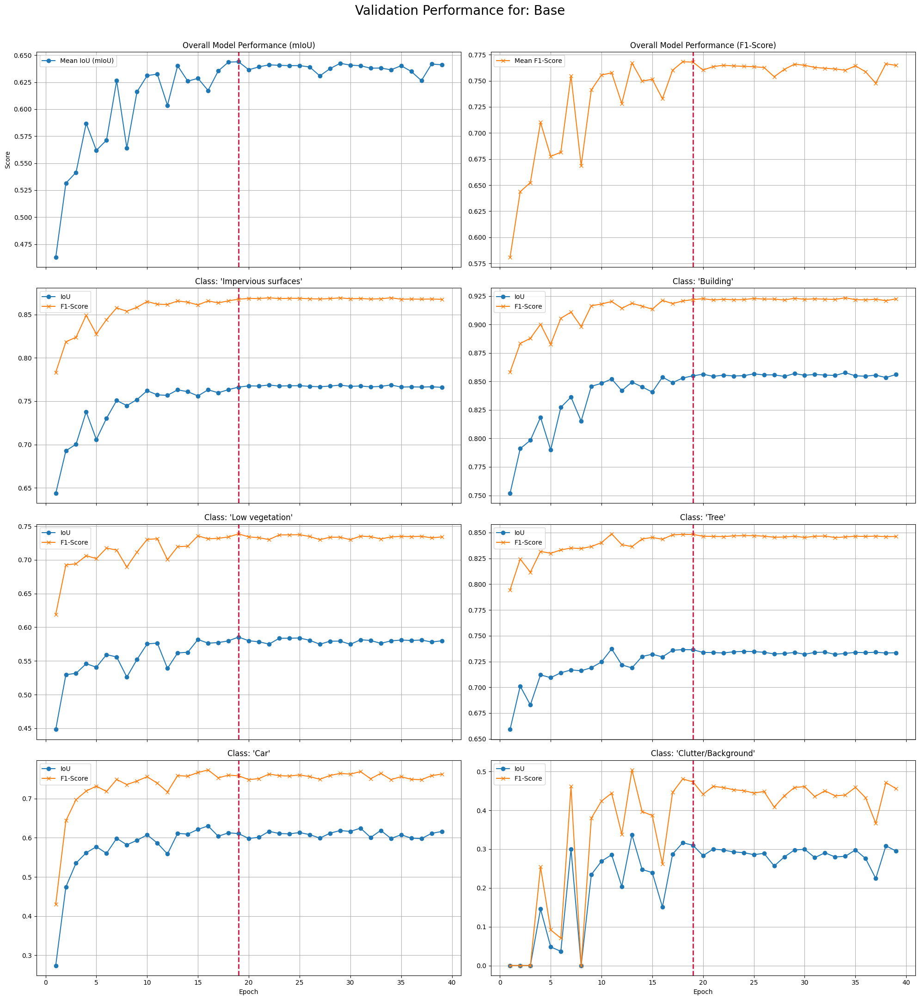

In [ ]:
plot_val_score("Base", all_results, id_to_class_name)

#### Train : Class Weighting

In [ ]:
model_class_weighting = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_class_weighting.to(device)

model_class_weighting_path = os.path.join(model_dir, 'class_weighting_deeplab_resnet50.pth')

# Optimizer
optimizer_class_weighting = torch.optim.AdamW([dict(params=model_class_weighting.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_class_weighting = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_class_weighting,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
# Create train and validation dataset
train_dataset = VaihingenPatchesDataset(train_patches_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["ClassWeighting"]["train_score"] = train_model(
    model=model_class_weighting,
    device=device,
    train_loader=train_loader,
    val_loader=val_loader,
    loss_fn=weighted_loss_fn,
    optimizer=optimizer_class_weighting,
    scheduler=scheduler_class_weighting,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_class_weighting_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.32it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4504 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/class_weighting_deeplab_resnet50.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.4447 | Best mIoU: 0.4504
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.13it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5335 | Best mIoU: 0.4504

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/class_weighting_deeplab_resnet50.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5854 | Best mIoU: 0.5335

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/class_weighting_deeplab_resnet50.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.72it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5492 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.54it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5730 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5364 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5631 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.89it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5761 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.41it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5808 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.5761 | Best mIoU: 0.5854
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6140 | Best mIoU: 0.5854

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/class_weighting_deeplab_resnet50.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.79it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6078 | Best mIoU: 0.6140
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6253 | Best mIoU: 0.6140

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/class_weighting_deeplab_resnet50.pth


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6113 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.89it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6164 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6181 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6171 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.53it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6144 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.60it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6144 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6215 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6231 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.54it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6123 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6142 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.73it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6185 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6226 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.22it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6186 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6178 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6201 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.38it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6204 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.76it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6188 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6141 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6186 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]


Epoch 34 Results:
  Mean IoU (mIoU): 0.6227 | Best mIoU: 0.6253
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6253 at epoch 14


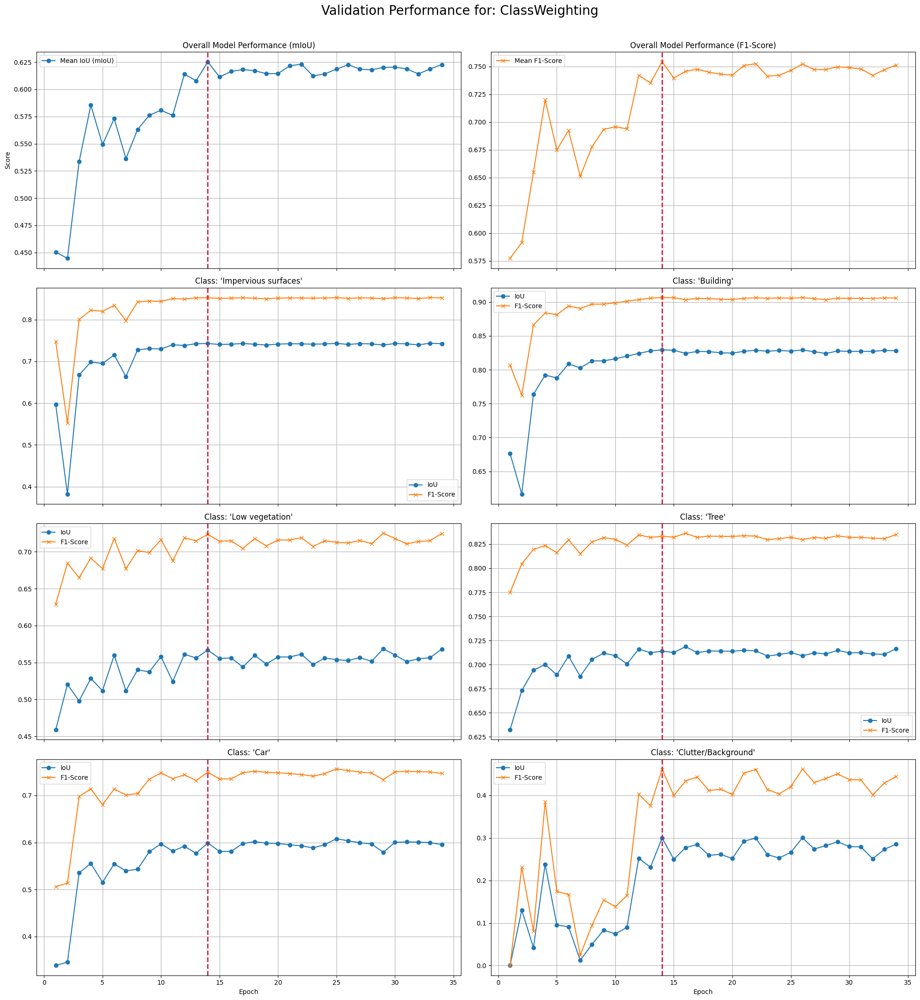

In [ ]:
plot_val_score("ClassWeighting", all_results, id_to_class_name)

#### Train : Focal Loss

In [ ]:
model_focal_loss = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_focal_loss.to(device)

model_focal_loss_path = os.path.join(model_dir, 'focal_loss_deeplab_resnet50.pth')

# Optimizer
optimizer_focal_loss = torch.optim.AdamW([dict(params=model_focal_loss.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_focal_loss = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_focal_loss,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
# Create train and validation dataset
train_dataset = VaihingenPatchesDataset(train_patches_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["FocalLoss"]["train_score"] = train_model(
    model=model_focal_loss,
    device=device,
    train_loader=train_loader,
    val_loader=val_loader,
    loss_fn=focal_loss_fn,
    optimizer=optimizer_focal_loss,
    scheduler=scheduler_focal_loss,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_focal_loss_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.3045 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.45it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.3651 | Best mIoU: 0.3045

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.4113 | Best mIoU: 0.3651

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.4339 | Best mIoU: 0.4113

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.4476 | Best mIoU: 0.4339

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.14it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.4577 | Best mIoU: 0.4476

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.4767 | Best mIoU: 0.4577

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.66it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.4879 | Best mIoU: 0.4767

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.4950 | Best mIoU: 0.4879

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5012 | Best mIoU: 0.4950

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.5093 | Best mIoU: 0.5012

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.93it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.5110 | Best mIoU: 0.5093

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.5183 | Best mIoU: 0.5110

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.39it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.5367 | Best mIoU: 0.5183

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.5229 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.88it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.5267 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.5318 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.5320 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.5307 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.5317 | Best mIoU: 0.5367
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.64it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.5368 | Best mIoU: 0.5367

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.5366 | Best mIoU: 0.5368
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.63it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.5370 | Best mIoU: 0.5368

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.5326 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.95it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.5365 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.5352 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.5391 | Best mIoU: 0.5370

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.5337 | Best mIoU: 0.5391
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.5369 | Best mIoU: 0.5391
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.95it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.5383 | Best mIoU: 0.5391
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.5393 | Best mIoU: 0.5391

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.86it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.5360 | Best mIoU: 0.5393
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.5328 | Best mIoU: 0.5393
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.5361 | Best mIoU: 0.5393
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.44it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.5361 | Best mIoU: 0.5393
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.5367 | Best mIoU: 0.5393
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.36it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.5419 | Best mIoU: 0.5393

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.5400 | Best mIoU: 0.5419
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.54it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.5385 | Best mIoU: 0.5419
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.5412 | Best mIoU: 0.5419
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.5365 | Best mIoU: 0.5419
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.5335 | Best mIoU: 0.5419
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.99it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.5430 | Best mIoU: 0.5419

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/focal_loss_deeplab_resnet50.pth


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.80it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.5383 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 45 Results:
  Mean IoU (mIoU): 0.5330 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 46/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.85it/s]



Epoch 46 Results:
  Mean IoU (mIoU): 0.5375 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 47/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 47 Results:
  Mean IoU (mIoU): 0.5410 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 48/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 48 Results:
  Mean IoU (mIoU): 0.5395 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 49/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.93it/s]



Epoch 49 Results:
  Mean IoU (mIoU): 0.5355 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 50/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 50 Results:
  Mean IoU (mIoU): 0.5380 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 51/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.92it/s]



Epoch 51 Results:
  Mean IoU (mIoU): 0.5378 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 52/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 52 Results:
  Mean IoU (mIoU): 0.5372 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 53/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 53 Results:
  Mean IoU (mIoU): 0.5384 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 54/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.90it/s]



Epoch 54 Results:
  Mean IoU (mIoU): 0.5366 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 55/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 55 Results:
  Mean IoU (mIoU): 0.5354 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 56/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.01it/s]



Epoch 56 Results:
  Mean IoU (mIoU): 0.5393 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 57/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 57 Results:
  Mean IoU (mIoU): 0.5353 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 58/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 58 Results:
  Mean IoU (mIoU): 0.5364 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 59/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.03it/s]



Epoch 59 Results:
  Mean IoU (mIoU): 0.5357 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 60/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 60 Results:
  Mean IoU (mIoU): 0.5392 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 61/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.64it/s]



Epoch 61 Results:
  Mean IoU (mIoU): 0.5354 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 62/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 62 Results:
  Mean IoU (mIoU): 0.5378 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 63/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]


Epoch 63 Results:
  Mean IoU (mIoU): 0.5391 | Best mIoU: 0.5430
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.5430 at epoch 43


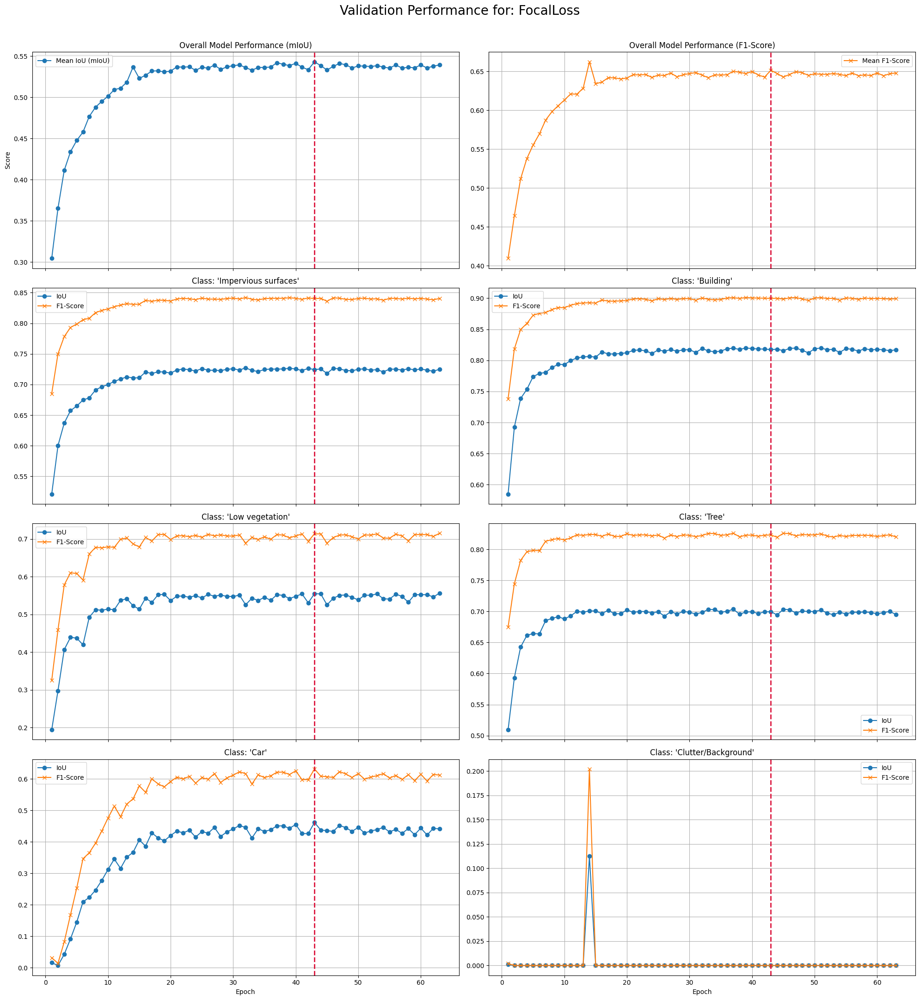

In [ ]:
plot_val_score("FocalLoss", all_results, id_to_class_name)

#### Train : Random Paste

In [ ]:
# --- 10 Locations 1 max trial ---

In [ ]:
# 10 locations
model_random_paste_l10_t1 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_random_paste_l10_t1.to(device)

model_random_paste_l10_t1_path = os.path.join(model_dir, 'random_paste_l10_t1.pth')

# Optimizer
optimizer_random_paste_l10_t1 = torch.optim.AdamW([dict(params=model_random_paste_l10_t1.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_random_paste_l10_t1 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_random_paste_l10_t1,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_random_paste_l10_t1_dir = os.path.join(vlm_paste_dir,'random_paste_l10_t1/Car')

# Create train and validation dataset
train_random_paste_l10_t1_dataset = VaihingenPatchesDataset(train_random_paste_l10_t1_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_random_paste_l10_t1_loader = DataLoader(train_random_paste_l10_t1_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["RandomPasteAug_10l_1t"]["train_score"] = train_model(
    model=model_random_paste_l10_t1,
    device=device,
    train_loader=train_random_paste_l10_t1_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_random_paste_l10_t1,
    scheduler=scheduler_random_paste_l10_t1,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_random_paste_l10_t1_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4381 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5059 | Best mIoU: 0.4381

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.73it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5579 | Best mIoU: 0.5059

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5506 | Best mIoU: 0.5579
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5689 | Best mIoU: 0.5579

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.83it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6199 | Best mIoU: 0.5689

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5909 | Best mIoU: 0.6199
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5724 | Best mIoU: 0.6199
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.54it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5871 | Best mIoU: 0.6199
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.73it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6362 | Best mIoU: 0.6199

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6400 | Best mIoU: 0.6362

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.54it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6330 | Best mIoU: 0.6400
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.51it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6323 | Best mIoU: 0.6400
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6314 | Best mIoU: 0.6400
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6364 | Best mIoU: 0.6400
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.30it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6487 | Best mIoU: 0.6400

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6468 | Best mIoU: 0.6487
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6506 | Best mIoU: 0.6487

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.52it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6513 | Best mIoU: 0.6506

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6441 | Best mIoU: 0.6513
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6386 | Best mIoU: 0.6513
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6539 | Best mIoU: 0.6513

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l10_t1.pth


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6463 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6500 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6354 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.60it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6418 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.83it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6343 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6437 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6402 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.09it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6339 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6429 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6478 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6405 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6423 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.62it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6341 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6345 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6500 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6393 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.07it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6362 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6422 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.76it/s]


Epoch 42 Results:
  Mean IoU (mIoU): 0.6505 | Best mIoU: 0.6539
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6539 at epoch 22


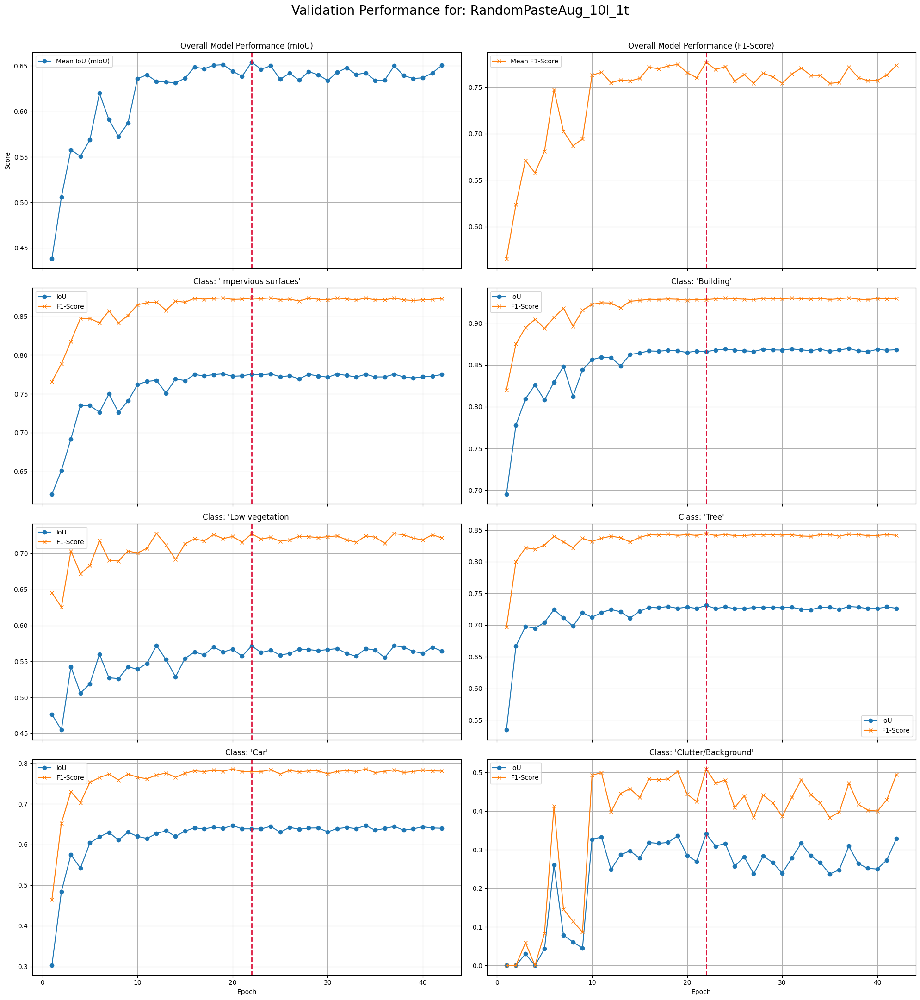

In [ ]:
plot_val_score("RandomPasteAug_10l_1t", all_results, id_to_class_name)

In [ ]:
# --- 40 Locations 3 max trials ---

In [ ]:
# 40 locations
model_random_paste_l40_t3 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_random_paste_l40_t3.to(device)

model_random_paste_l40_t3_path = os.path.join(model_dir, 'random_paste_l40_t3.pth')

# Optimizer
optimizer_random_paste_l40_t3 = torch.optim.AdamW([dict(params=model_random_paste_l40_t3.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_random_paste_l40_t3 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_random_paste_l40_t3,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_random_paste_l40_t3_dir = os.path.join(vlm_paste_dir,'random_paste_l40_t3/Car')

# Create train and validation dataset
train_random_paste_l40_t3_dataset = VaihingenPatchesDataset(train_random_paste_l40_t3_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_random_paste_l40_t3_loader = DataLoader(train_random_paste_l40_t3_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["RandomPasteAug_40l_3t"]["train_score"] = train_model(
    model=model_random_paste_l40_t3,
    device=device,
    train_loader=train_random_paste_l40_t3_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_random_paste_l40_t3,
    scheduler=scheduler_random_paste_l40_t3,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_random_paste_l40_t3_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4273 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.4806 | Best mIoU: 0.4273

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.16it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.4822 | Best mIoU: 0.4806

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.4687 | Best mIoU: 0.4822
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5117 | Best mIoU: 0.4822

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.00it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5437 | Best mIoU: 0.5117

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5261 | Best mIoU: 0.5437
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5387 | Best mIoU: 0.5437
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5737 | Best mIoU: 0.5437

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.72it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5245 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.5374 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.5407 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.5422 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.5668 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.5704 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.5624 | Best mIoU: 0.5737
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.5740 | Best mIoU: 0.5737

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.86it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.5558 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.5608 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.5572 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.5643 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.02it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.5556 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.5675 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.5682 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.5581 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.01it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.5584 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.83it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.5700 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.5610 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.5638 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.52it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.5638 | Best mIoU: 0.5740
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.5744 | Best mIoU: 0.5740

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.99it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.5709 | Best mIoU: 0.5744
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.66it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.5748 | Best mIoU: 0.5744

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.5585 | Best mIoU: 0.5748
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.5683 | Best mIoU: 0.5748
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.5620 | Best mIoU: 0.5748
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.34it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.5639 | Best mIoU: 0.5748
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.5613 | Best mIoU: 0.5748
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.5767 | Best mIoU: 0.5748

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/random_paste_l40_t3.pth


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.59it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.5718 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.5635 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.5586 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.5574 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.01it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.5628 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 45 Results:
  Mean IoU (mIoU): 0.5671 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 46/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.05it/s]



Epoch 46 Results:
  Mean IoU (mIoU): 0.5584 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 47/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.64it/s]



Epoch 47 Results:
  Mean IoU (mIoU): 0.5600 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 48/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.51it/s]



Epoch 48 Results:
  Mean IoU (mIoU): 0.5592 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 49/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 49 Results:
  Mean IoU (mIoU): 0.5567 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 50/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 50 Results:
  Mean IoU (mIoU): 0.5611 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 51/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.45it/s]



Epoch 51 Results:
  Mean IoU (mIoU): 0.5690 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 52/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.55it/s]



Epoch 52 Results:
  Mean IoU (mIoU): 0.5599 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 53/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 53 Results:
  Mean IoU (mIoU): 0.5592 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 54/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 54 Results:
  Mean IoU (mIoU): 0.5603 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 55/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.13it/s]



Epoch 55 Results:
  Mean IoU (mIoU): 0.5689 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 56/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.33it/s]



Epoch 56 Results:
  Mean IoU (mIoU): 0.5629 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 57/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 57 Results:
  Mean IoU (mIoU): 0.5597 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 58/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 58 Results:
  Mean IoU (mIoU): 0.5566 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 59/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.43it/s]


Epoch 59 Results:
  Mean IoU (mIoU): 0.5536 | Best mIoU: 0.5767
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.5767 at epoch 39


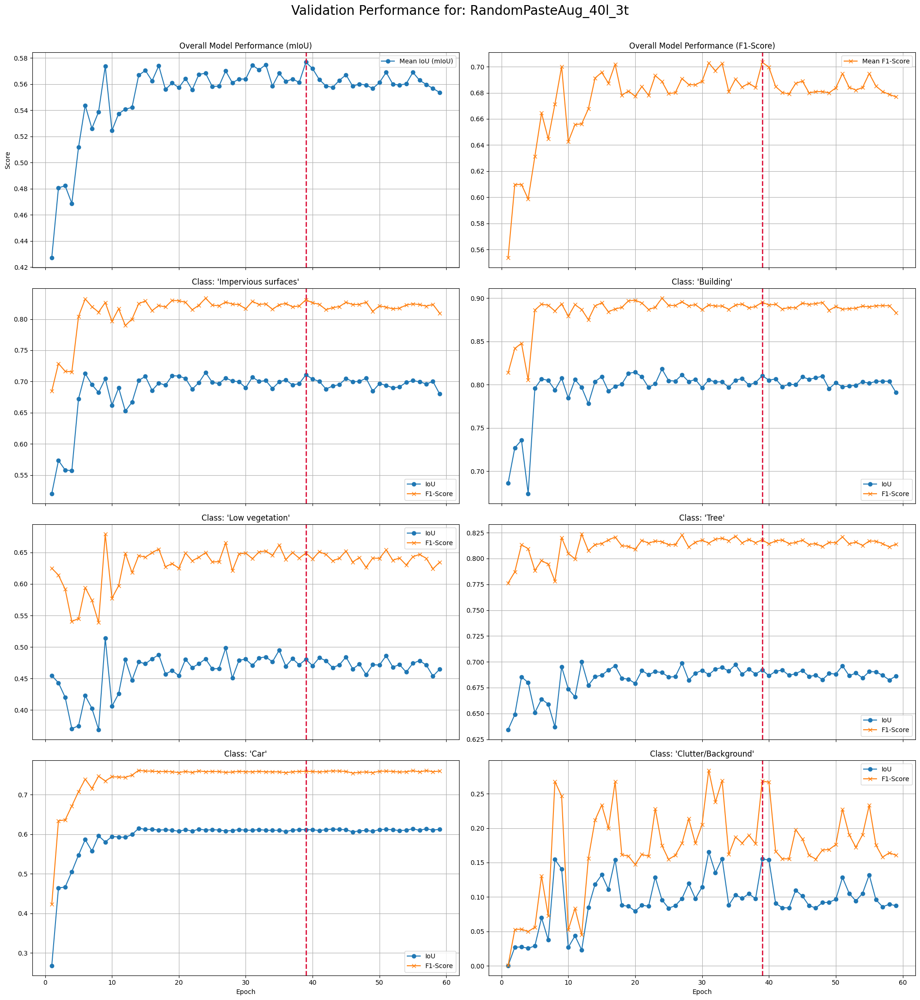

In [ ]:
plot_val_score("RandomPasteAug_40l_3t", all_results, id_to_class_name)

#### Train : VLM Paste

##### Gemini API

In [ ]:
# --- 30 Locations 2 max trials ---

In [ ]:
# 30 locations
model_vlm_paste_gemini_l30_t2 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_gemini_l30_t2.to(device)

model_vlm_paste_gemini_l30_t2_path = os.path.join(model_dir, 'vlm_gemini_l30_t2.pth')

# Optimizer
optimizer_vlm_paste_gemini_l30_t2 = torch.optim.AdamW([dict(params=model_vlm_paste_gemini_l30_t2.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_gemini_l30_t2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_gemini_l30_t2,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_gemini_l30_t2_dir = os.path.join(vlm_paste_dir,'gemini_l30_t2/Car')

# Create train and validation dataset
train_vlm_paste_gemini_l30_t2_dataset = VaihingenPatchesDataset(train_vlm_paste_gemini_l30_t2_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_vlm_paste_gemini_l30_t2_loader = DataLoader(train_vlm_paste_gemini_l30_t2_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugGemini_30l_2t"]["train_score"] = train_model(
    model=model_vlm_paste_gemini_l30_t2,
    device=device,
    train_loader=train_vlm_paste_gemini_l30_t2_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_gemini_l30_t2,
    scheduler=scheduler_vlm_paste_gemini_l30_t2,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_gemini_l30_t2_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4733 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.99it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5106 | Best mIoU: 0.4733

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5430 | Best mIoU: 0.5106

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5834 | Best mIoU: 0.5430

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.39it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5677 | Best mIoU: 0.5834
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.59it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5796 | Best mIoU: 0.5834
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5775 | Best mIoU: 0.5834
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5981 | Best mIoU: 0.5834

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.51it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.6131 | Best mIoU: 0.5981

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5927 | Best mIoU: 0.6131
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6136 | Best mIoU: 0.6131

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6242 | Best mIoU: 0.6136

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.18it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6242

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6238 | Best mIoU: 0.6369
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.42it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6367 | Best mIoU: 0.6369
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.60it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6378 | Best mIoU: 0.6369

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6334 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6356 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.75it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6328 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6366 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6377 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.87it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6358 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.14it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.98it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6363 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6392 | Best mIoU: 0.6378

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6377 | Best mIoU: 0.6392
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6384 | Best mIoU: 0.6392
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6354 | Best mIoU: 0.6392
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6399 | Best mIoU: 0.6392

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.50it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6399 | Best mIoU: 0.6399
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6399
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6406 | Best mIoU: 0.6399

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.44it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.63it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6320 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6364 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6341 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6343 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.76it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6310 | Best mIoU: 0.6406
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6407 | Best mIoU: 0.6406

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6321 | Best mIoU: 0.6407
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.72it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6385 | Best mIoU: 0.6407
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.33it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.6306 | Best mIoU: 0.6407
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.05it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.6392 | Best mIoU: 0.6407
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.6338 | Best mIoU: 0.6407
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 45 Results:
  Mean IoU (mIoU): 0.6411 | Best mIoU: 0.6407

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l30_t2.pth


Epoch 46/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]



Epoch 46 Results:
  Mean IoU (mIoU): 0.6384 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 47/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]



Epoch 47 Results:
  Mean IoU (mIoU): 0.6393 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 48/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 48 Results:
  Mean IoU (mIoU): 0.6327 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 49/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 49 Results:
  Mean IoU (mIoU): 0.6340 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 50/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.70it/s]



Epoch 50 Results:
  Mean IoU (mIoU): 0.6376 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 51/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 51 Results:
  Mean IoU (mIoU): 0.6381 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 52/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 52 Results:
  Mean IoU (mIoU): 0.6376 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 53/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 53 Results:
  Mean IoU (mIoU): 0.6406 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 54/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]



Epoch 54 Results:
  Mean IoU (mIoU): 0.6379 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 55/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 55 Results:
  Mean IoU (mIoU): 0.6385 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 56/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 56 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 57/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 57 Results:
  Mean IoU (mIoU): 0.6376 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 58/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.34it/s]



Epoch 58 Results:
  Mean IoU (mIoU): 0.6381 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 59/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 59 Results:
  Mean IoU (mIoU): 0.6359 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 60/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 60 Results:
  Mean IoU (mIoU): 0.6396 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 61/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.92it/s]



Epoch 61 Results:
  Mean IoU (mIoU): 0.6383 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 62/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]



Epoch 62 Results:
  Mean IoU (mIoU): 0.6358 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 63/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 63 Results:
  Mean IoU (mIoU): 0.6390 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 64/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 64 Results:
  Mean IoU (mIoU): 0.6330 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 65/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.88it/s]


Epoch 65 Results:
  Mean IoU (mIoU): 0.6406 | Best mIoU: 0.6411
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6411 at epoch 45


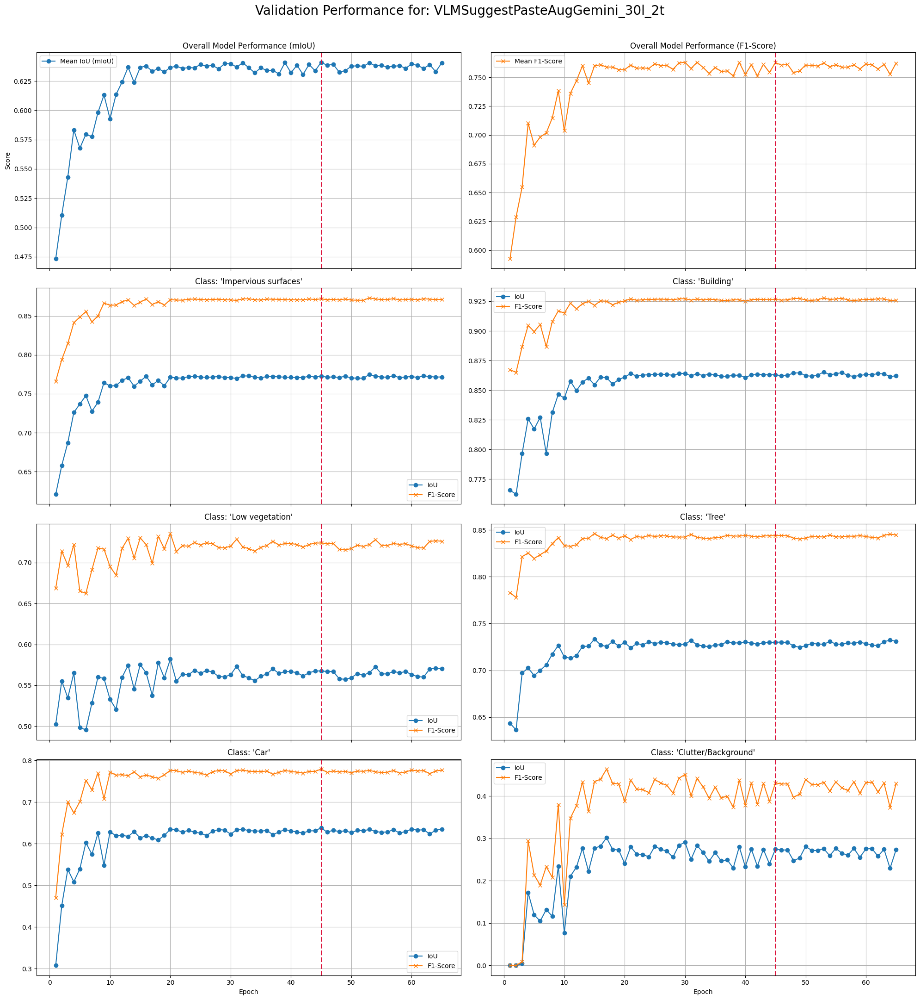

In [ ]:
# 30
plot_val_score("VLMSuggestPasteAugGemini_30l_2t", all_results, id_to_class_name)

In [ ]:
# --- 40 Locations 3 max trials ---

In [ ]:
# 40 locations
model_vlm_paste_gemini_l40_t3 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_gemini_l40_t3.to(device)

model_vlm_paste_gemini_l40_t3_path = os.path.join(model_dir, 'vlm_gemini_l40_t3.pth')

# Optimizer
optimizer_vlm_paste_gemini_l40_t3 = torch.optim.AdamW([dict(params=model_vlm_paste_gemini_l40_t3.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_gemini_l40_t3 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_gemini_l40_t3,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_gemini_l40_t3_dir = os.path.join(vlm_paste_dir,'gemini_l40_t3/Car')

# Create train and validation dataset
train_vlm_paste_gemini_l40_t3_dataset = VaihingenPatchesDataset(train_vlm_paste_gemini_l40_t3_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_vlm_paste_gemini_l40_t3_loader = DataLoader(train_vlm_paste_gemini_l40_t3_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugGemini_40l_3t"]["train_score"] = train_model(
    model=model_vlm_paste_gemini_l40_t3,
    device=device,
    train_loader=train_vlm_paste_gemini_l40_t3_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_gemini_l40_t3,
    scheduler=scheduler_vlm_paste_gemini_l40_t3,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_gemini_l40_t3_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4917 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5323 | Best mIoU: 0.4917

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.47it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5584 | Best mIoU: 0.5323

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5588 | Best mIoU: 0.5584

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5463 | Best mIoU: 0.5588
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.91it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6243 | Best mIoU: 0.5588

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.6022 | Best mIoU: 0.6243
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.6104 | Best mIoU: 0.6243
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.86it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.6475 | Best mIoU: 0.6243

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6352 | Best mIoU: 0.6475
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6153 | Best mIoU: 0.6475
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6362 | Best mIoU: 0.6475
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.74it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.5909 | Best mIoU: 0.6475
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6436 | Best mIoU: 0.6475
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6491 | Best mIoU: 0.6475

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.43it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6454 | Best mIoU: 0.6491
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.78it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6473 | Best mIoU: 0.6491
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6543 | Best mIoU: 0.6491

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gemini_l40_t3.pth


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.93it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6533 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6482 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.82it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6502 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6434 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6516 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.53it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6498 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.05it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6481 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6504 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6501 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.65it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6497 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6488 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6510 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6503 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.55it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6482 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6516 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6509 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6514 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.44it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6507 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6467 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]


Epoch 38 Results:
  Mean IoU (mIoU): 0.6507 | Best mIoU: 0.6543
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6543 at epoch 18


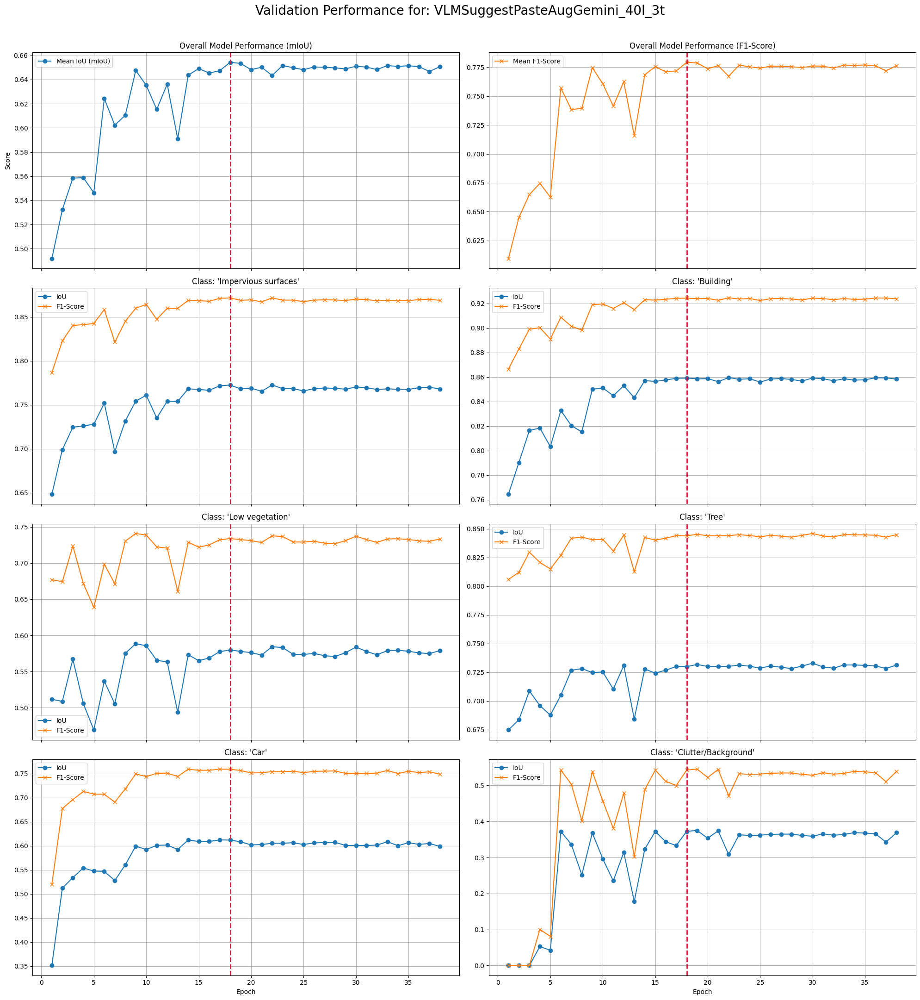

In [ ]:
# 40
plot_val_score("VLMSuggestPasteAugGemini_40l_3t", all_results, id_to_class_name)

##### Qwen API

In [ ]:
# --- 30 Locations 2 max trials ---

In [ ]:
# 30 locations
model_vlm_paste_qwen32b_l30_t2 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_qwen32b_l30_t2.to(device)

model_vlm_paste_qwen32b_l30_t2_path = os.path.join(model_dir, 'vlm_qwen32b_l30_t2.pth')

# Optimizer
optimizer_vlm_paste_qwen32b_l30_t2 = torch.optim.AdamW([dict(params=model_vlm_paste_qwen32b_l30_t2.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_qwen32b_l30_t2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_qwen32b_l30_t2,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_qwen32b_l30_t2_dir = os.path.join(vlm_paste_dir,'qwen_l30_t2/Car')

# Create train and validation dataset
train_vlm_paste_qwen32b_l30_t2_dataset = VaihingenPatchesDataset(train_vlm_paste_qwen32b_l30_t2_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_vlm_paste_qwen32b_l30_t2_loader = DataLoader(train_vlm_paste_qwen32b_l30_t2_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugQwen_30l_2t"]["train_score"] = train_model(
    model=model_vlm_paste_qwen32b_l30_t2,
    device=device,
    train_loader=train_vlm_paste_qwen32b_l30_t2_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_qwen32b_l30_t2,
    scheduler=scheduler_vlm_paste_qwen32b_l30_t2,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_qwen32b_l30_t2_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.55it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4793 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.23it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5335 | Best mIoU: 0.4793

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5465 | Best mIoU: 0.5335

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.96it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5479 | Best mIoU: 0.5465

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.96it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5824 | Best mIoU: 0.5479

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6219 | Best mIoU: 0.5824

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.48it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.6211 | Best mIoU: 0.6219
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.6084 | Best mIoU: 0.6219
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.6169 | Best mIoU: 0.6219
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.72it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6021 | Best mIoU: 0.6219
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.14it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6229 | Best mIoU: 0.6219

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6256 | Best mIoU: 0.6229

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.90it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6279 | Best mIoU: 0.6256

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6222 | Best mIoU: 0.6279
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6279

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.78it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6350 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6276 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6356 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6327 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.53it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6293 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.33it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6355 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6249 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6227 | Best mIoU: 0.6365
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.71it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6405 | Best mIoU: 0.6365

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l30_t2.pth


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6378 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6310 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6283 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.44it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6303 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6258 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6349 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6368 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.78it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6280 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6377 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6287 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6322 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.77it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6237 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6278 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6364 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6186 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.78it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6294 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.6285 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.6329 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.86it/s]


Epoch 44 Results:
  Mean IoU (mIoU): 0.6330 | Best mIoU: 0.6405
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6405 at epoch 24


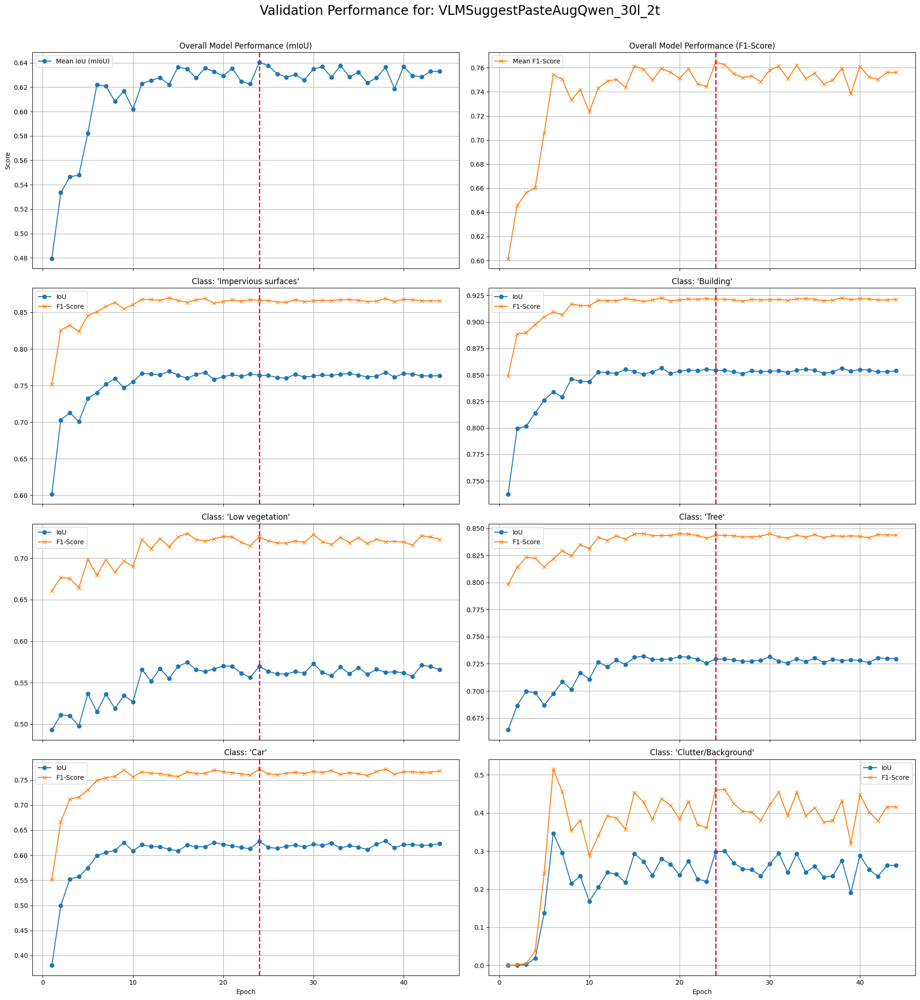

In [ ]:
# 30
plot_val_score("VLMSuggestPasteAugQwen_30l_2t", all_results, id_to_class_name)

In [ ]:
# --- 40 Locations 3 max trials ---

In [ ]:
# 40 locations
model_vlm_paste_qwen32b_l40_t3 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_qwen32b_l40_t3.to(device)

model_vlm_paste_qwen32b_l40_t3_path = os.path.join(model_dir, 'vlm_qwen32b_l40_t3.pth')

# Optimizer
optimizer_vlm_paste_qwen32b_l40_t3 = torch.optim.AdamW([dict(params=model_vlm_paste_qwen32b_l40_t3.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_qwen32b_l40_t3 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_qwen32b_l40_t3,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_qwen32b_l40_t3_dir = os.path.join(vlm_paste_dir,'qwen_l40_t3/Car')

# Create train and validation dataset
train_vlm_paste_qwen32b_l40_t3_dataset = VaihingenPatchesDataset(train_vlm_paste_qwen32b_l40_t3_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_paste_qwen32b_l40_t3_loader = DataLoader(train_vlm_paste_qwen32b_l40_t3_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugQwen_40l_3t"]["train_score"] = train_model(
    model=model_vlm_paste_qwen32b_l40_t3,
    device=device,
    train_loader=train_vlm_paste_qwen32b_l40_t3_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_qwen32b_l40_t3,
    scheduler=scheduler_vlm_paste_qwen32b_l40_t3,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_qwen32b_l40_t3_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4773 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.87it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.4826 | Best mIoU: 0.4773

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5695 | Best mIoU: 0.4826

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5704 | Best mIoU: 0.5695

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5194 | Best mIoU: 0.5704
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5836 | Best mIoU: 0.5704

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.05it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5692 | Best mIoU: 0.5836
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.99it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.6069 | Best mIoU: 0.5836

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5825 | Best mIoU: 0.6069
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5828 | Best mIoU: 0.6069
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.69it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6121 | Best mIoU: 0.6069

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6263 | Best mIoU: 0.6121

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6093 | Best mIoU: 0.6263
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6120 | Best mIoU: 0.6263
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.5635 | Best mIoU: 0.6263
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6454 | Best mIoU: 0.6263

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_qwen32b_l40_t3.pth


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6268 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.20it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6153 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6335 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6290 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.67it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6314 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.27it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6281 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6318 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6207 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.83it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6247 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6290 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6238 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6262 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.77it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6269 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6225 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6282 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6228 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.02it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6274 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6309 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.98it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6231 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.29it/s]


Epoch 36 Results:
  Mean IoU (mIoU): 0.6261 | Best mIoU: 0.6454
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6454 at epoch 16


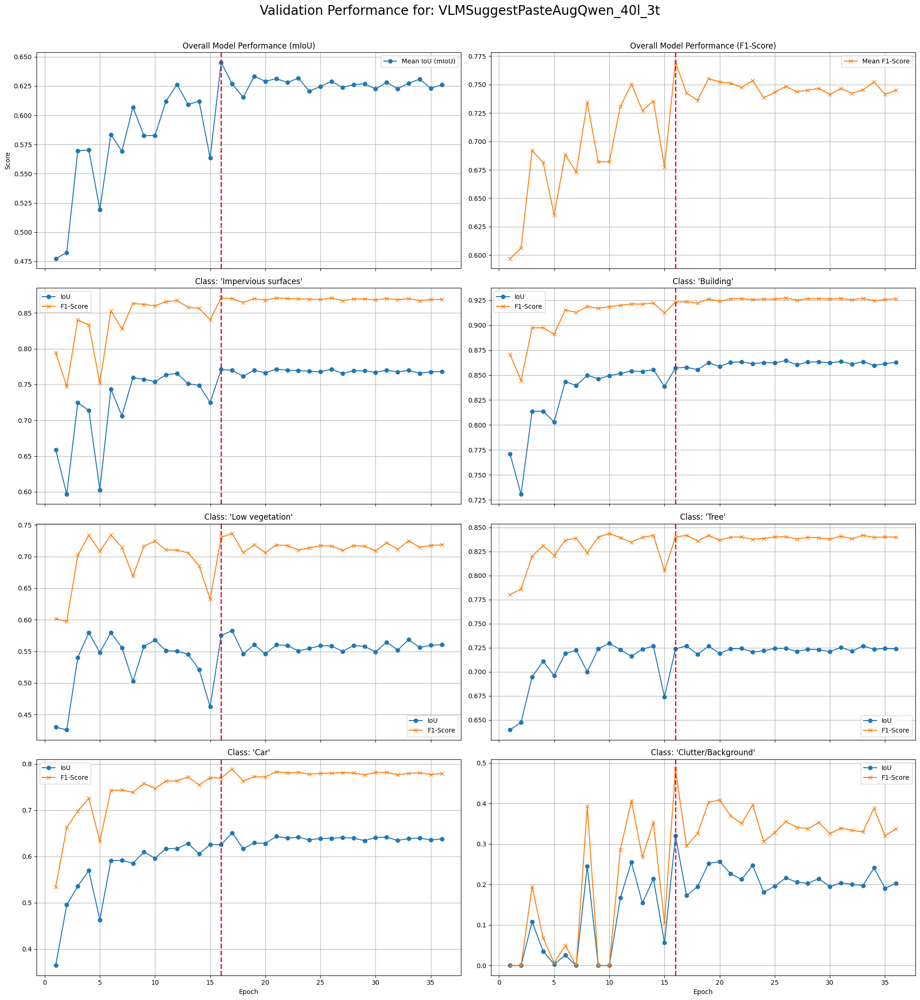

In [ ]:
# 40
plot_val_score("VLMSuggestPasteAugQwen_40l_3t", all_results, id_to_class_name)

##### Gemini API + Qwen API

In [ ]:
# --- 30 Locations 2 max trials ---

In [ ]:
model_vlm_paste_combined_l30_t2 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_combined_l30_t2.to(device)

model_vlm_paste_combined_l30_t2_path = os.path.join(model_dir, 'vlm_combined_l30_t2.pth')

# Optimizer
optimizer_vlm_paste_combined_l30_t2 = torch.optim.AdamW([dict(params=model_vlm_paste_combined_l30_t2.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_combined_l30_t2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_combined_l30_t2,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_combined_l30_t2_dir = os.path.join(vlm_paste_dir,'combined_gemini_qwen_l30_t2/Car')

# Create train and validation dataset
train_vlm_paste_combined_l30_t2_dataset = VaihingenPatchesDataset(train_vlm_paste_combined_l30_t2_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_paste_combined_l30_t2_loader = DataLoader(train_vlm_paste_combined_l30_t2_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugCombined_30l_2t"]["train_score"] = train_model(
    model=model_vlm_paste_combined_l30_t2,
    device=device,
    train_loader=train_vlm_paste_combined_l30_t2_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_combined_l30_t2,
    scheduler=scheduler_vlm_paste_combined_l30_t2,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_combined_l30_t2_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4808 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5394 | Best mIoU: 0.4808

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.37it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5602 | Best mIoU: 0.5394

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5800 | Best mIoU: 0.5602

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5730 | Best mIoU: 0.5800
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.29it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6279 | Best mIoU: 0.5800

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5759 | Best mIoU: 0.6279
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5513 | Best mIoU: 0.6279
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.73it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.6048 | Best mIoU: 0.6279
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6311 | Best mIoU: 0.6279

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6007 | Best mIoU: 0.6311
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6120 | Best mIoU: 0.6311
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6327 | Best mIoU: 0.6311

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6149 | Best mIoU: 0.6327
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6254 | Best mIoU: 0.6327
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.80it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6327 | Best mIoU: 0.6327

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.96it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6180 | Best mIoU: 0.6327
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6235 | Best mIoU: 0.6327
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.85it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6370 | Best mIoU: 0.6327

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6293 | Best mIoU: 0.6370
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6318 | Best mIoU: 0.6370
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.89it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6322 | Best mIoU: 0.6370
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.18it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6351 | Best mIoU: 0.6370
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6354 | Best mIoU: 0.6370
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.01it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6378 | Best mIoU: 0.6370

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l30_t2.pth


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.53it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6352 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6341 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6364 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6352 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.15it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6337 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6344 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6307 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.77it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6346 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.53it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6315 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6365 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.26it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6373 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.02it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6369 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6370 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6348 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.01it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6330 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.6322 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.6331 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.6335 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.65it/s]


Epoch 45 Results:
  Mean IoU (mIoU): 0.6359 | Best mIoU: 0.6378
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6378 at epoch 25


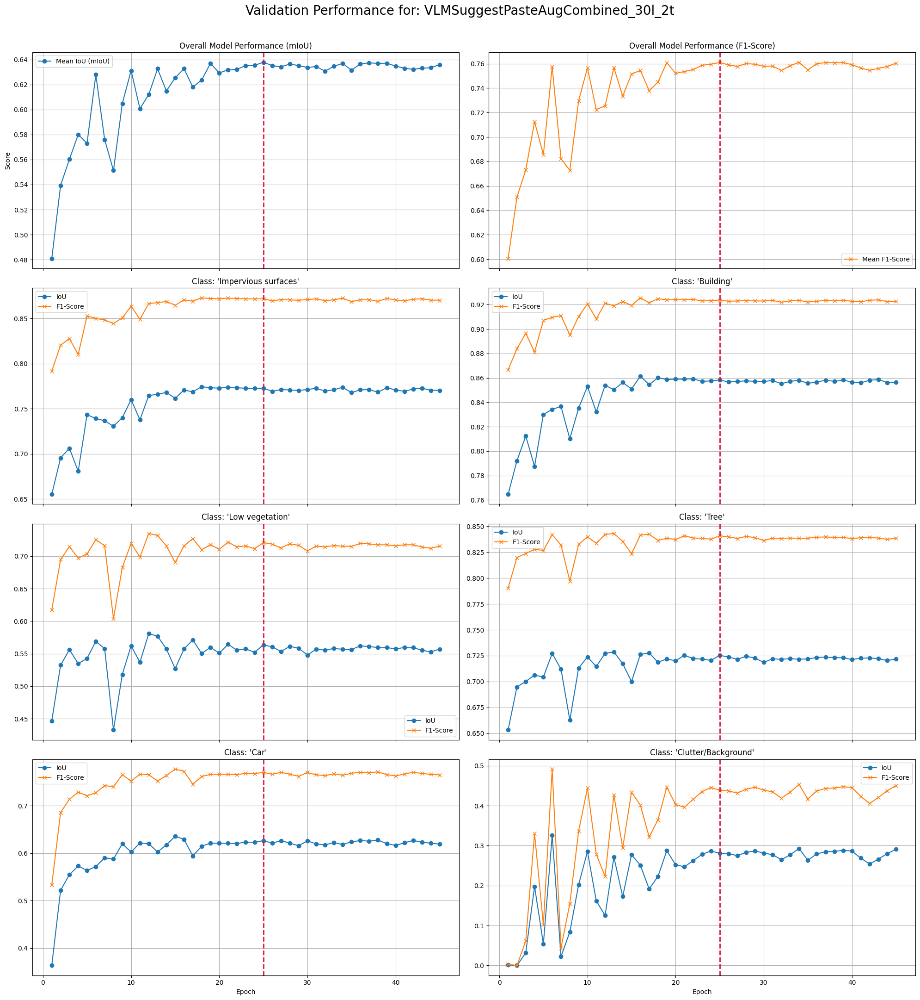

In [ ]:
# 30
plot_val_score("VLMSuggestPasteAugCombined_30l_2t", all_results, id_to_class_name)

In [ ]:
# --- 40 Locations 3 max trials ---

In [ ]:
model_vlm_paste_combined_l40_t3 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_combined_l40_t3.to(device)

model_vlm_paste_combined_l40_t3_path = os.path.join(model_dir, 'vlm_combined_l40_t3.pth')

# Optimizer
optimizer_vlm_paste_combined_l40_t3 = torch.optim.AdamW([dict(params=model_vlm_paste_combined_l40_t3.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_combined_l40_t3 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_combined_l40_t3,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_combined_l40_t3_dir = os.path.join(vlm_paste_dir,'combined_gemini_qwen_l40_t3/Car')

# Create train and validation dataset
train_vlm_paste_combined_l40_t3_dataset = VaihingenPatchesDataset(train_vlm_paste_combined_l40_t3_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_paste_combined_l40_t3_loader = DataLoader(train_vlm_paste_combined_l40_t3_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugCombined_40l_3t"]["train_score"] = train_model(
    model=model_vlm_paste_combined_l40_t3,
    device=device,
    train_loader=train_vlm_paste_combined_l40_t3_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_combined_l40_t3,
    scheduler=scheduler_vlm_paste_combined_l40_t3,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_combined_l40_t3_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4683 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5370 | Best mIoU: 0.4683

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5296 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.52it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5280 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.01it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.4458 | Best mIoU: 0.5370
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5550 | Best mIoU: 0.5370

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.78it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5673 | Best mIoU: 0.5550

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.6027 | Best mIoU: 0.5673

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.00it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5910 | Best mIoU: 0.6027
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.96it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.5971 | Best mIoU: 0.6027
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.53it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6258 | Best mIoU: 0.6027

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6171 | Best mIoU: 0.6258
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6349 | Best mIoU: 0.6258

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6036 | Best mIoU: 0.6349
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6353 | Best mIoU: 0.6349

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_combined_l40_t3.pth


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6068 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  5.00it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6274 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6280 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.5750 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6042 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.16it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6194 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6196 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6201 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.60it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6248 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6244 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.00it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6201 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6233 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.91it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6236 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6222 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6164 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6201 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.70it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6243 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.28it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6228 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6283 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]


Epoch 35 Results:
  Mean IoU (mIoU): 0.6254 | Best mIoU: 0.6353
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6353 at epoch 15


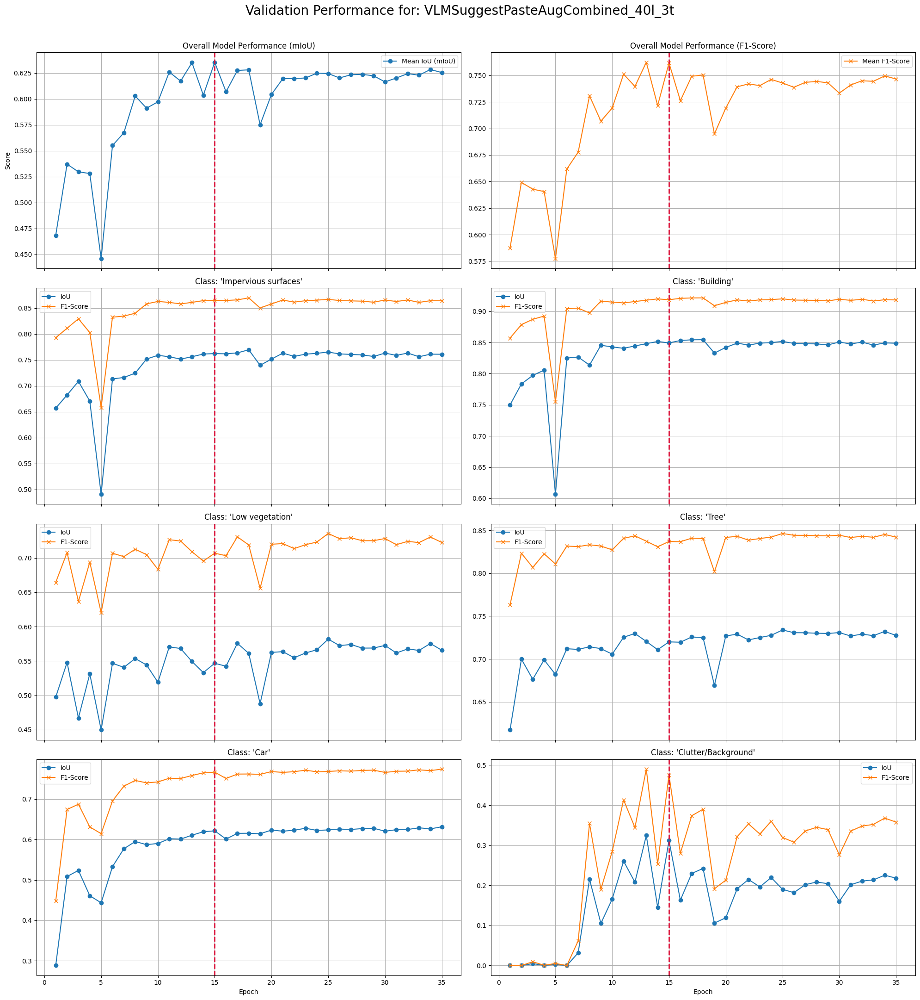

In [ ]:
# 40
plot_val_score("VLMSuggestPasteAugCombined_40l_3t", all_results, id_to_class_name)

##### GPT5 API

In [ ]:
# --- 30 Locations 1 max trial ---

In [ ]:
model_vlm_gpt_l30 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_gpt_l30.to(device)

model_vlm_gpt_l30_path = os.path.join(model_dir, 'vlm_gpt_l30_t1.pth')

# Optimizer
optimizer_vlm_gpt_l30 = torch.optim.AdamW([dict(params=model_vlm_gpt_l30.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_gpt_l30 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_gpt_l30,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_gpt_l30_dir = os.path.join(vlm_paste_dir,'gpt_api_l30_t1/Car')

# Create train and validation dataset
train_vlm_gpt_l30_dataset = VaihingenPatchesDataset(train_vlm_gpt_l30_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_vlm_gpt_l30_loader = DataLoader(train_vlm_gpt_l30_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugGPT_30l_1t"]["train_score"] = train_model(
    model=model_vlm_gpt_l30,
    device=device,
    train_loader=train_vlm_gpt_l30_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_gpt_l30,
    scheduler=scheduler_vlm_gpt_l30,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_gpt_l30_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4873 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.40it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5423 | Best mIoU: 0.4873

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5482 | Best mIoU: 0.5423

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5635 | Best mIoU: 0.5482

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.54it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.6189 | Best mIoU: 0.5635

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6064 | Best mIoU: 0.6189
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5815 | Best mIoU: 0.6189
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.15it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5978 | Best mIoU: 0.6189
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.88it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5994 | Best mIoU: 0.6189
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6198 | Best mIoU: 0.6189

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6244 | Best mIoU: 0.6198

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.33it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6318 | Best mIoU: 0.6244

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.19it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6326 | Best mIoU: 0.6318

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l30_t1.pth


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.85it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6170 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6085 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6271 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.20it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6172 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.65it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6283 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6262 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6242 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.04it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6230 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.81it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6265 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.96it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6104 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.10it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6197 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.95it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6259 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.07it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6245 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6202 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6255 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.93it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6066 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.34it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6275 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6187 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.05it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6206 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.66it/s]


Epoch 33 Results:
  Mean IoU (mIoU): 0.6224 | Best mIoU: 0.6326
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6326 at epoch 13


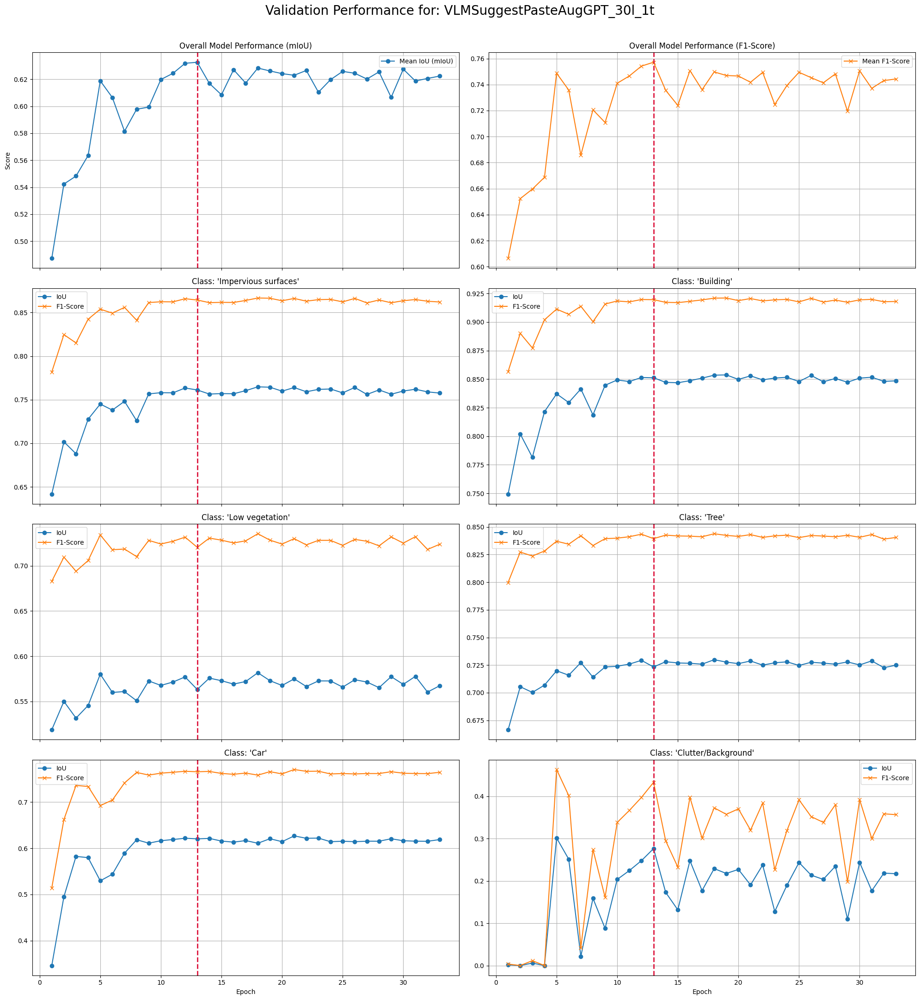

In [ ]:
plot_val_score("VLMSuggestPasteAugGPT_30l_1t", all_results, id_to_class_name)

In [ ]:
# --- 40 Locations 1 max trial ---

In [ ]:
model_vlm_gpt_l40 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_gpt_l40.to(device)

model_vlm_gpt_l40_path = os.path.join(model_dir, 'vlm_gpt_l40_t1.pth')

# Optimizer
optimizer_vlm_gpt_l40 = torch.optim.AdamW([dict(params=model_vlm_gpt_l40.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_gpt_l40 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_gpt_l40,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_gpt_l40_dir = os.path.join(vlm_paste_dir,'gpt_api_l40_t1/Car')

# Create train and validation dataset
train_vlm_gpt_l40_dataset = VaihingenPatchesDataset(train_vlm_gpt_l40_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# Create DataLoaders
train_vlm_gpt_l40_loader = DataLoader(train_vlm_gpt_l40_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
all_results["VLMSuggestPasteAugGPT_40l_1t"]["train_score"] = train_model(
    model=model_vlm_gpt_l40,
    device=device,
    train_loader=train_vlm_gpt_l40_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_gpt_l40,
    scheduler=scheduler_vlm_gpt_l40,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_gpt_l40_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.08it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4853 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.27it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5320 | Best mIoU: 0.4853

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5473 | Best mIoU: 0.5320

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5716 | Best mIoU: 0.5473

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5664 | Best mIoU: 0.5716
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.09it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.6024 | Best mIoU: 0.5716

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5747 | Best mIoU: 0.6024
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.31it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5936 | Best mIoU: 0.6024
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.84it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5739 | Best mIoU: 0.6024
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6053 | Best mIoU: 0.6024

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6368 | Best mIoU: 0.6053

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models_round_3/vlm_gpt_l40_t1.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.5868 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.5484 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.07it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6102 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.82it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6243 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.00it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6206 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6251 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.97it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6197 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6085 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6223 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.15it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6171 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.79it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6114 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.27it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6181 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6124 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.14it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6173 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.27it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6091 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.88it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6128 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6089 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.94it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6208 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.99it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6183 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.19it/s]


Epoch 31 Results:
  Mean IoU (mIoU): 0.6112 | Best mIoU: 0.6368
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6368 at epoch 11


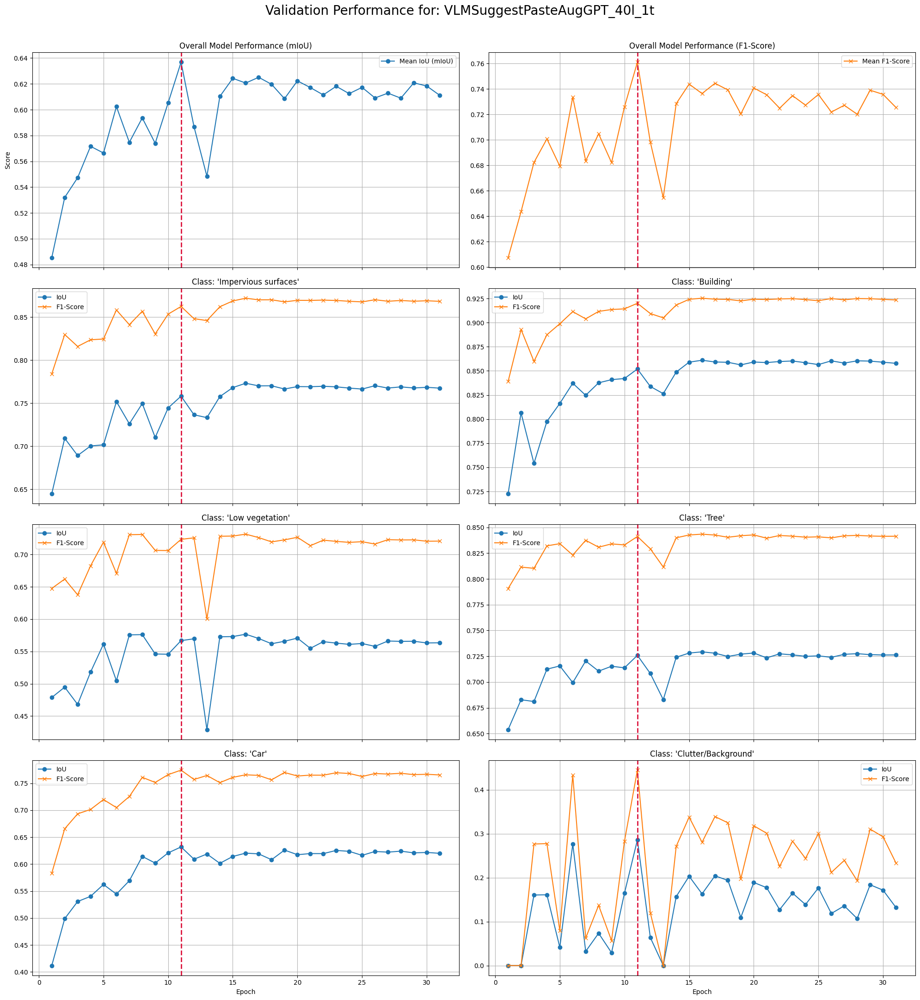

In [ ]:
plot_val_score("VLMSuggestPasteAugGPT_40l_1t", all_results, id_to_class_name)

## Test

In [ ]:
def evaluate_model(model, model_save_path, model_name, test_loader, num_classes, device, ignore_index=-1):
    """
    Evaluates a trained segmentation model on a test dataset.

    Args:
        model (torch.nn.Module): The trained model to evaluate (weights will be loaded inside the function).
        model_save_path (str): The path to the file where the model weights are saved.
        model_name (str): The name of the model for logging/printing.
        test_loader (DataLoader): The DataLoader for the test set.
        num_classes (int): The number of classes in the dataset.
        device (str): The device to run evaluation on ('cuda' or 'cpu').
        ignore_index (int): The index of the class to ignore during evaluation.

    Returns:
        dict: A dictionary containing the final evaluation metrics.
    """
    # --- Initialize Metrics ---
    # Set up metrics for both IoU (Jaccard) and F1-Score
    mIoU_metric = JaccardIndex(task="multiclass", num_classes=num_classes, ignore_index=ignore_index, average='macro').to(device)
    per_class_iou_metric = JaccardIndex(task="multiclass", num_classes=num_classes, ignore_index=ignore_index, average='none').to(device)
    f1_metric = MulticlassF1Score(num_classes=num_classes, ignore_index=ignore_index, average='macro').to(device)
    per_class_f1_metric = MulticlassF1Score(num_classes=num_classes, ignore_index=ignore_index, average='none').to(device)

    # Load and set model to evaluation mode
    if not os.path.exists(model_save_path):
        raise FileNotFoundError(f"Model file not found: {model_save_path}")
    model.load_state_dict(torch.load(model_save_path, map_location=device))
    model.eval()

    # --- Test Loop ---
    test_loop = tqdm(test_loader, desc="Testing")
    with torch.no_grad():
        for images, masks in test_loop:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            # Update all metrics for the batch
            mIoU_metric.update(preds, masks)
            per_class_iou_metric.update(preds, masks)
            f1_metric.update(preds, masks)
            per_class_f1_metric.update(preds, masks)

    # --- Compute and store final scores ---
    final_metrics = {
        "mIoU": mIoU_metric.compute().item(),
        "per_class_iou": per_class_iou_metric.compute().cpu().numpy(),
        "f1_score": f1_metric.compute().item(),
        "per_class_f1": per_class_f1_metric.compute().cpu().numpy()
    }

    # --- Print scores report ---
    print(f"\n--- {model_name} Final Test Set Results ---")
    print(f"  Mean IoU (mIoU): {final_metrics['mIoU']:.4f}")
    print(f"  Mean F1-Score: {final_metrics['f1_score']:.4f}")
    print("\n  --- Per-Class Scores ---")
    print("  {:<25} | {:<10} | {:<10}".format("Class", "IoU", "F1-Score"))
    print("  " + "-" * 50)

    for class_id in range(num_classes):
        class_name = id_to_class_name.get(class_id, f"Class {class_id}")
        iou_score = final_metrics['per_class_iou'][class_id]
        f1_score = final_metrics['per_class_f1'][class_id]
        print("  {:<25} | {:<10.4f} | {:<10.4f}".format(class_name, iou_score, f1_score))

    return final_metrics

In [ ]:
# Create DataFrame table for copy-paste into Google sheet/Excel easily
def df_table(model_name, all_results):
    row_labels = ["Mean"] + list(id_to_class_name.values())
    model_results = all_results[model_name]['test_score']

    # Values
    iou_values = [model_results["mIoU"]] + list(model_results["per_class_iou"])
    f1_values = [model_results["f1_score"]] + list(model_results["per_class_f1"])

    # Create DataFrame
    df = pd.DataFrame({"IoU": iou_values,"F1": f1_values}, index=row_labels)
    return df

In [ ]:
# Create test dataset => loader
test_dataset = VaihingenPatchesDataset(test_patches_dir, augmentation=get_transforms())
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

#### Test : Base

In [ ]:
model_name = "Base"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_base,
    model_save_path=model_base_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.77it/s]


--- Base Final Test Set Results ---
  Mean IoU (mIoU): 0.6352
  Mean F1-Score: 0.7653

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7021     | 0.8250    
  Building                  | 0.8308     | 0.9076    
  Low vegetation            | 0.6426     | 0.7824    
  Tree                      | 0.7366     | 0.8483    
  Car                       | 0.5435     | 0.7043    
  Clutter/Background        | 0.3555     | 0.5245    

-- Base --


,IoU,F1
Mean,0.635178,0.765341
Impervious surfaces,0.702068,0.824959
Building,0.830813,0.907589
Low vegetation,0.642632,0.782442
Tree,0.736562,0.848299
Car,0.543532,0.704270
Clutter/Background,0.355461,0.524487


#### Test : Class Weighting

In [ ]:
model_name = "ClassWeighting"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_class_weighting,
    model_save_path=model_class_weighting_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.71it/s]


--- ClassWeighting Final Test Set Results ---
  Mean IoU (mIoU): 0.6218
  Mean F1-Score: 0.7566

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6809     | 0.8102    
  Building                  | 0.8011     | 0.8896    
  Low vegetation            | 0.6179     | 0.7638    
  Tree                      | 0.7254     | 0.8409    
  Car                       | 0.5456     | 0.7060    
  Clutter/Background        | 0.3600     | 0.5294    

-- ClassWeighting --


,IoU,F1
Mean,0.621825,0.756643
Impervious surfaces,0.680885,0.810151
Building,0.801108,0.889573
Low vegetation,0.617918,0.763843
Tree,0.725441,0.840876
Car,0.545584,0.705990
Clutter/Background,0.360012,0.529425


#### Test : Focal Loss

In [ ]:
model_name = "FocalLoss"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_focal_loss,
    model_save_path=model_focal_loss_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.74it/s]


--- FocalLoss Final Test Set Results ---
  Mean IoU (mIoU): 0.5823
  Mean F1-Score: 0.7215

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6634     | 0.7976    
  Building                  | 0.7795     | 0.8761    
  Low vegetation            | 0.5889     | 0.7413    
  Tree                      | 0.7082     | 0.8292    
  Car                       | 0.4578     | 0.6281    
  Clutter/Background        | 0.2961     | 0.4569    

-- FocalLoss --


,IoU,F1
Mean,0.582325,0.721532
Impervious surfaces,0.663405,0.797647
Building,0.779485,0.876079
Low vegetation,0.588908,0.741274
Tree,0.708236,0.829202
Car,0.457843,0.628110
Clutter/Background,0.296074,0.456878


#### Test : Random Paste

In [ ]:
model_name = "RandomPasteAug_10l_1t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_random_paste_l10_t1,
    model_save_path=model_random_paste_l10_t1_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.77it/s]


--- RandomPasteAug_10l_1t Final Test Set Results ---
  Mean IoU (mIoU): 0.6308
  Mean F1-Score: 0.7604

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6995     | 0.8232    
  Building                  | 0.8330     | 0.9089    
  Low vegetation            | 0.6428     | 0.7825    
  Tree                      | 0.7295     | 0.8436    
  Car                       | 0.5547     | 0.7136    
  Clutter/Background        | 0.3252     | 0.4908    

-- RandomPasteAug_10l_1t --


,IoU,F1
Mean,0.630793,0.760445
Impervious surfaces,0.699513,0.823192
Building,0.832971,0.908875
Low vegetation,0.642766,0.782541
Tree,0.729549,0.843629
Car,0.554725,0.713599
Clutter/Background,0.325233,0.490831


In [ ]:
model_name = "RandomPasteAug_40l_3t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_random_paste_l40_t3,
    model_save_path=model_random_paste_l40_t3_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.76it/s]


--- RandomPasteAug_40l_3t Final Test Set Results ---
  Mean IoU (mIoU): 0.5739
  Mean F1-Score: 0.7171

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6493     | 0.7874    
  Building                  | 0.7552     | 0.8605    
  Low vegetation            | 0.5437     | 0.7044    
  Tree                      | 0.6827     | 0.8114    
  Car                       | 0.5143     | 0.6792    
  Clutter/Background        | 0.2983     | 0.4595    

-- RandomPasteAug_40l_3t --


,IoU,F1
Mean,0.573902,0.717075
Impervious surfaces,0.649285,0.787353
Building,0.755175,0.860513
Low vegetation,0.543669,0.704386
Tree,0.682718,0.811447
Car,0.514267,0.679229
Clutter/Background,0.298299,0.459523


#### Test : VLM Paste

##### Gemini API

In [ ]:
# max locations 30
model_name = "VLMSuggestPasteAugGemini_30l_2t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_gemini_l30_t2,
    model_save_path=model_vlm_paste_gemini_l30_t2_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.71it/s]


--- VLMSuggestPasteAugGemini_30l_2t Final Test Set Results ---
  Mean IoU (mIoU): 0.6353
  Mean F1-Score: 0.7648

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7092     | 0.8298    
  Building                  | 0.8363     | 0.9109    
  Low vegetation            | 0.6386     | 0.7795    
  Tree                      | 0.7293     | 0.8435    
  Car                       | 0.5532     | 0.7123    
  Clutter/Background        | 0.3450     | 0.5130    

-- VLMSuggestPasteAugGemini_30l_2t --


,IoU,F1
Mean,0.635267,0.764827
Impervious surfaces,0.709165,0.829838
Building,0.836320,0.910865
Low vegetation,0.638613,0.779455
Tree,0.729343,0.843491
Car,0.553162,0.712304
Clutter/Background,0.345000,0.513011


In [ ]:
# max locations 40
model_name = "VLMSuggestPasteAugGemini_40l_3t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_gemini_l40_t3,
    model_save_path=model_vlm_paste_gemini_l40_t3_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.59it/s]


--- VLMSuggestPasteAugGemini_40l_3t Final Test Set Results ---
  Mean IoU (mIoU): 0.6385
  Mean F1-Score: 0.7688

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7037     | 0.8261    
  Building                  | 0.8371     | 0.9113    
  Low vegetation            | 0.6356     | 0.7772    
  Tree                      | 0.7318     | 0.8452    
  Car                       | 0.5483     | 0.7083    
  Clutter/Background        | 0.3741     | 0.5445    

-- VLMSuggestPasteAugGemini_40l_3t --


,IoU,F1
Mean,0.638457,0.768771
Impervious surfaces,0.703749,0.826118
Building,0.837060,0.911304
Low vegetation,0.635649,0.777244
Tree,0.731839,0.845158
Car,0.548328,0.708284
Clutter/Background,0.374118,0.544521


##### Qwen API

In [ ]:
# max locations 30

model_name = "VLMSuggestPasteAugQwen_30l_2t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_qwen32b_l30_t2,
    model_save_path=model_vlm_paste_qwen32b_l30_t2_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.79it/s]


--- VLMSuggestPasteAugQwen_30l_2t Final Test Set Results ---
  Mean IoU (mIoU): 0.6318
  Mean F1-Score: 0.7645

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6889     | 0.8158    
  Building                  | 0.8263     | 0.9049    
  Low vegetation            | 0.6297     | 0.7728    
  Tree                      | 0.7204     | 0.8375    
  Car                       | 0.5491     | 0.7089    
  Clutter/Background        | 0.3765     | 0.5470    

-- VLMSuggestPasteAugQwen_30l_2t --


,IoU,F1
Mean,0.631822,0.764488
Impervious surfaces,0.688898,0.815796
Building,0.826341,0.904914
Low vegetation,0.629735,0.772806
Tree,0.720396,0.837477
Car,0.549075,0.708907
Clutter/Background,0.376486,0.547025


In [ ]:
# max locations 40

model_name = "VLMSuggestPasteAugQwen_40l_3t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_qwen32b_l40_t3,
    model_save_path=model_vlm_paste_qwen32b_l40_t3_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.80it/s]


--- VLMSuggestPasteAugQwen_40l_3t Final Test Set Results ---
  Mean IoU (mIoU): 0.6131
  Mean F1-Score: 0.7444

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6982     | 0.8223    
  Building                  | 0.8120     | 0.8963    
  Low vegetation            | 0.6346     | 0.7764    
  Tree                      | 0.7297     | 0.8437    
  Car                       | 0.5179     | 0.6824    
  Clutter/Background        | 0.2863     | 0.4452    

-- VLMSuggestPasteAugQwen_40l_3t --


,IoU,F1
Mean,0.613111,0.744374
Impervious surfaces,0.698164,0.822257
Building,0.812038,0.896270
Low vegetation,0.634579,0.776443
Tree,0.729654,0.843700
Car,0.517911,0.682400
Clutter/Background,0.286318,0.445174


##### Gemini API + Qwen API

In [ ]:
# max locations 30

model_name = "VLMSuggestPasteAugCombined_30l_2t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_combined_l30_t2,
    model_save_path=model_vlm_paste_combined_l30_t2_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.79it/s]


--- VLMSuggestPasteAugCombined_30l_2t Final Test Set Results ---
  Mean IoU (mIoU): 0.6292
  Mean F1-Score: 0.7612

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6996     | 0.8232    
  Building                  | 0.8285     | 0.9062    
  Low vegetation            | 0.6285     | 0.7719    
  Tree                      | 0.7211     | 0.8379    
  Car                       | 0.5402     | 0.7015    
  Clutter/Background        | 0.3575     | 0.5267    

-- VLMSuggestPasteAugCombined_30l_2t --


,IoU,F1
Mean,0.629235,0.761243
Impervious surfaces,0.699581,0.823239
Building,0.828517,0.906218
Low vegetation,0.628543,0.771908
Tree,0.721071,0.837933
Car,0.540228,0.701491
Clutter/Background,0.357467,0.526668


In [ ]:
# max locations 40

model_name = "VLMSuggestPasteAugCombined_40l_3t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_combined_l40_t3,
    model_save_path=model_vlm_paste_combined_l40_t3_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.81it/s]


--- VLMSuggestPasteAugCombined_40l_3t Final Test Set Results ---
  Mean IoU (mIoU): 0.6168
  Mean F1-Score: 0.7495

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6942     | 0.8195    
  Building                  | 0.8162     | 0.8988    
  Low vegetation            | 0.6255     | 0.7696    
  Tree                      | 0.7200     | 0.8372    
  Car                       | 0.5291     | 0.6921    
  Clutter/Background        | 0.3158     | 0.4800    

-- VLMSuggestPasteAugCombined_40l_3t --


,IoU,F1
Mean,0.616788,0.749520
Impervious surfaces,0.694156,0.819471
Building,0.816225,0.898815
Low vegetation,0.625486,0.769599
Tree,0.719951,0.837176
Car,0.529128,0.692065
Clutter/Background,0.315782,0.479992


##### GPT5 API

In [ ]:
# max locations 30

model_name = "VLMSuggestPasteAugGPT_30l_1t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_gpt_l30,
    model_save_path=model_vlm_gpt_l30_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:14<00:00,  6.78it/s]


--- VLMSuggestPasteAugGPT_30l_1t Final Test Set Results ---
  Mean IoU (mIoU): 0.6247
  Mean F1-Score: 0.7579

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6871     | 0.8145    
  Building                  | 0.8223     | 0.9025    
  Low vegetation            | 0.6256     | 0.7696    
  Tree                      | 0.7220     | 0.8386    
  Car                       | 0.5352     | 0.6973    
  Clutter/Background        | 0.3558     | 0.5249    

-- VLMSuggestPasteAugGPT_30l_1t --


,IoU,F1
Mean,0.624660,0.757892
Impervious surfaces,0.687096,0.814531
Building,0.822250,0.902456
Low vegetation,0.625554,0.769650
Tree,0.722005,0.838563
Car,0.535218,0.697254
Clutter/Background,0.355840,0.524900


In [ ]:
# max locations 40

model_name = "VLMSuggestPasteAugGPT_40l_1t"

all_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_gpt_l40,
    model_save_path=model_vlm_gpt_l40_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, all_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.84it/s]


--- VLMSuggestPasteAugGPT_40l_1t Final Test Set Results ---
  Mean IoU (mIoU): 0.6366
  Mean F1-Score: 0.7682

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7025     | 0.8252    
  Building                  | 0.8234     | 0.9032    
  Low vegetation            | 0.6355     | 0.7771    
  Tree                      | 0.7348     | 0.8471    
  Car                       | 0.5363     | 0.6982    
  Clutter/Background        | 0.3873     | 0.5584    

-- VLMSuggestPasteAugGPT_40l_1t --


,IoU,F1
Mean,0.636645,0.768209
Impervious surfaces,0.702473,0.825238
Building,0.823423,0.903162
Low vegetation,0.635466,0.777107
Tree,0.734826,0.847147
Car,0.536337,0.698202
Clutter/Background,0.387348,0.558400


### Table

In [ ]:
def create_comparison_table(all_results: dict, id_to_class_name: dict):
    """
    Creates comparison table from dict that store results.
    """
    data = {}

    # Find first model with test_score to get number of classes
    num_classes = None
    for result in all_results.values():
        if 'test_score' in result:
            num_classes = len(result['test_score']['per_class_iou'])
            break

    if num_classes is None:
        raise ValueError("No model in all_results contains 'test_score'.")

    # Row labels: Mean + per class
    row_labels = ['Mean'] + [id_to_class_name.get(i, f"Class {i}") for i in range(num_classes)]

    for model_name, results in all_results.items():
        if 'test_score' not in results:
            continue
        score = results['test_score']
        # One column each for IoU and F1
        iou_col = [score['mIoU']] + list(score['per_class_iou'])
        f1_col = [score['f1_score']] + list(score['per_class_f1'])

        # Add to dictionary with MultiIndex keys
        data[(model_name, "IoU")] = iou_col
        data[(model_name, "F1")] = f1_col

    # Create MultiIndex columns
    columns = pd.MultiIndex.from_tuples(data.keys(), names=["Model", "Metric"])
    df = pd.DataFrame(data, index=row_labels, columns=columns)

    return df

In [ ]:
# Round 1

# Set dataframe disply
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

comparison_df = create_comparison_table(all_results, id_to_class_name)
comparison_df

Model                    Base           ClassWeighting           FocalLoss  \
Metric                    IoU        F1            IoU        F1       IoU   
Mean                 0.634595  0.764832       0.618356  0.751460  0.595589   
Impervious surfaces  0.704647  0.826737       0.692929  0.818615  0.685026   
Building             0.828623  0.906281       0.808015  0.893815  0.791550   
Low vegetation       0.634721  0.776549       0.618129  0.764005  0.591371   
Tree                 0.730259  0.844104       0.720952  0.837853  0.707886   
Car                  0.561437  0.719128       0.550565  0.710147  0.453823   
Clutter/Background   0.347882  0.516191       0.319545  0.484326  0.343876   

Model                         RandomPasteAug_10l_1t            \
Metric                     F1                   IoU        F1   
Mean                 0.734165              0.617688  0.747683   
Impervious surfaces  0.813074              0.704580  0.826690   
Building             0.883648              0.834416  0.909735   
Low vegetation       0.743222              0.622551  0.767373   
Tree                 0.828962              0.721219  0.838033   
Car                  0.624316              0.536240  0.698120   
Clutter/Background   0.511768              0.287123  0.446146   

Model               RandomPasteAug_40l_3t            \
Metric                                IoU        F1   
Mean                             0.596572  0.732961   
Impervious surfaces              0.668460  0.801289   
Building                         0.797669  0.887448   
Low vegetation                   0.600161  0.750126   
Tree                             0.704187  0.826420   
Car                              0.520248  0.684426   
Clutter/Background               0.288707  0.448057   

Model               VLMSuggestPasteAugGemini_30l_2t            \
Metric                                          IoU        F1   
Mean                                       0.625839  0.758439   
Impervious surfaces                        0.695193  0.820194   
Building                                   0.818094  0.899947   
Low vegetation                             0.638799  0.779594   
Tree                                       0.727186  0.842047   
Car                                        0.520763  0.684871   
Clutter/Background                         0.354999  0.523984   

Model               VLMSuggestPasteAugQwen_30l_2t            \
Metric                                        IoU        F1   
Mean                                     0.634253  0.765054   
Impervious surfaces                      0.705225  0.827135   
Building                                 0.832007  0.908301   
Low vegetation                           0.632418  0.774823   
Tree                                     0.727973  0.842574   
Car                                      0.547262  0.707394   
Clutter/Background                       0.360635  0.530098   

Model               VLMSuggestPasteAugCombined_30l_2t            \
Metric                                            IoU        F1   
Mean                                         0.628987  0.760899   
Impervious surfaces                          0.697479  0.821782   
Building                                     0.821398  0.901942   
Low vegetation                               0.638094  0.779069   
Tree                                         0.728077  0.842644   
Car                                          0.534456  0.696606   
Clutter/Background                           0.354419  0.523352   

Model               VLMSuggestPasteAugGemini_40l_3t            \
Metric                                          IoU        F1   
Mean                                       0.628219  0.758628   
Impervious surfaces                        0.703188  0.825731   
Building                                   0.831716  0.908128   
Low vegetation                             0.635948  0.777467   
Tree                                       0.722635  0.838988   
Ca

In [ ]:
# Round 2

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

comparison_df = create_comparison_table(all_results, id_to_class_name)
comparison_df

Model                    Base           ClassWeighting           FocalLoss  \
Metric                    IoU        F1            IoU        F1       IoU   
Mean                 0.631358  0.760789       0.618011  0.748275  0.564031   
Impervious surfaces  0.702597  0.825324       0.684168  0.812470  0.667051   
Building             0.832660  0.908690       0.808458  0.894086  0.773332   
Low vegetation       0.640227  0.780656       0.632003  0.774512  0.574794   
Tree                 0.736638  0.848349       0.734355  0.846834  0.695624   
Car                  0.548992  0.708838       0.571815  0.727586  0.403580   
Clutter/Background   0.327032  0.492877       0.277270  0.434160  0.269803   

Model                         RandomPasteAug_10l_1t            \
Metric                     F1                   IoU        F1   
Mean                 0.703828              0.622161  0.755040   
Impervious surfaces  0.800277              0.697950  0.822109   
Building             0.872179              0.833871  0.909411   
Low vegetation       0.729993              0.620338  0.765690   
Tree                 0.820493              0.703960  0.826263   
Car                  0.575072              0.534311  0.696484   
Clutter/Background   0.424952              0.342537  0.510283   

Model               RandomPasteAug_40l_3t            \
Metric                                IoU        F1   
Mean                             0.570734  0.714797   
Impervious surfaces              0.637716  0.778787   
Building                         0.751450  0.858089   
Low vegetation                   0.543009  0.703832   
Tree                             0.680906  0.810165   
Car                              0.512231  0.677450   
Clutter/Background               0.299090  0.460460   

Model               VLMSuggestPasteAugGemini_30l_2t            \
Metric                                          IoU        F1   
Mean                                       0.635972  0.767103   
Impervious surfaces                        0.703357  0.825848   
Building                                   0.830530  0.907420   
Low vegetation                             0.634329  0.776256   
Tree                                       0.729081  0.843316   
Car                                        0.543303  0.704078   
Clutter/Background                         0.375230  0.545698   

Model               VLMSuggestPasteAugQwen_30l_2t            \
Metric                                        IoU        F1   
Mean                                     0.627826  0.759992   
Impervious surfaces                      0.694434  0.819665   
Building                                 0.823094  0.902964   
Low vegetation                           0.631558  0.774178   
Tree                                     0.725074  0.840630   
Car                                      0.541428  0.702502   
Clutter/Background                       0.351366  0.520016   

Model               VLMSuggestPasteAugCombined_30l_2t            \
Metric                                            IoU        F1   
Mean                                         0.631221  0.762516   
Impervious surfaces                          0.698066  0.822190   
Building                                     0.828903  0.906449   
Low vegetation                               0.638004  0.779002   
Tree                                         0.725073  0.840629   
Car                                          0.543766  0.704467   
Clutter/Background                           0.353510  0.522360   

Model               VLMSuggestPasteAugGemini_40l_3t            \
Metric                                          IoU        F1   
Mean                                       0.623642  0.754980   
Impervious surfaces                        0.694696  0.819847   
Building                                   0.824827  0.904006   
Low vegetation                             0.633478  0.775619   
Tree                                       0.728251  0.842761   
Ca

In [ ]:
# Round 3

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

comparison_df = create_comparison_table(all_results, id_to_class_name)
comparison_df

Model                    Base           ClassWeighting           FocalLoss  \
Metric                    IoU        F1            IoU        F1       IoU   
Mean                 0.635178  0.765341       0.621825  0.756643  0.582325   
Impervious surfaces  0.702068  0.824959       0.680885  0.810151  0.663405   
Building             0.830813  0.907589       0.801108  0.889573  0.779485   
Low vegetation       0.642632  0.782442       0.617918  0.763843  0.588908   
Tree                 0.736562  0.848299       0.725441  0.840876  0.708236   
Car                  0.543532  0.704270       0.545584  0.705990  0.457843   
Clutter/Background   0.355461  0.524487       0.360012  0.529425  0.296074   

Model                         RandomPasteAug_10l_1t            \
Metric                     F1                   IoU        F1   
Mean                 0.721532              0.630793  0.760445   
Impervious surfaces  0.797647              0.699513  0.823192   
Building             0.876079              0.832971  0.908875   
Low vegetation       0.741274              0.642766  0.782541   
Tree                 0.829202              0.729549  0.843629   
Car                  0.628110              0.554725  0.713599   
Clutter/Background   0.456878              0.325233  0.490831   

Model               RandomPasteAug_40l_3t            \
Metric                                IoU        F1   
Mean                             0.573902  0.717075   
Impervious surfaces              0.649285  0.787353   
Building                         0.755175  0.860513   
Low vegetation                   0.543669  0.704386   
Tree                             0.682718  0.811447   
Car                              0.514267  0.679229   
Clutter/Background               0.298299  0.459523   

Model               VLMSuggestPasteAugGemini_30l_2t            \
Metric                                          IoU        F1   
Mean                                       0.635267  0.764827   
Impervious surfaces                        0.709165  0.829838   
Building                                   0.836320  0.910865   
Low vegetation                             0.638613  0.779455   
Tree                                       0.729343  0.843491   
Car                                        0.553162  0.712304   
Clutter/Background                         0.345000  0.513011   

Model               VLMSuggestPasteAugQwen_30l_2t            \
Metric                                        IoU        F1   
Mean                                     0.631822  0.764488   
Impervious surfaces                      0.688898  0.815796   
Building                                 0.826341  0.904914   
Low vegetation                           0.629735  0.772806   
Tree                                     0.720396  0.837477   
Car                                      0.549075  0.708907   
Clutter/Background                       0.376486  0.547025   

Model               VLMSuggestPasteAugCombined_30l_2t            \
Metric                                            IoU        F1   
Mean                                         0.629235  0.761243   
Impervious surfaces                          0.699581  0.823239   
Building                                     0.828517  0.906218   
Low vegetation                               0.628543  0.771908   
Tree                                         0.721071  0.837933   
Car                                          0.540228  0.701491   
Clutter/Background                           0.357467  0.526668   

Model               VLMSuggestPasteAugGemini_40l_3t            \
Metric                                          IoU        F1   
Mean                                       0.638457  0.768771   
Impervious surfaces                        0.703749  0.826118   
Building                                   0.837060  0.911304   
Low vegetation                             0.635649  0.777244   
Tree                                       0.731839  0.845158   
Ca

In [ ]:
def plot_final_summary_report(results_dict, class_map):
    """
    Plots results
    - Row 1: Mean IoU & Mean F1 for each model
    - Row 2: Per-class IoU
    - Row 3: Per-class F1
    """

    model_names = [name for name, data in results_dict.items() if 'test_score' in data]
    if not model_names:
        print("⚠️ No models with 'test_score' found.")
        return

    class_names = list(class_map.values())
    n_models = len(model_names)
    n_classes = len(class_names)

    fig, axes = plt.subplots(3, 1, figsize=(20, 18))
    fig.suptitle('Final Model Performance Comparison', fontsize=22, y=1.02)

    # --- Row 1: Mean IoU and Mean F1 ---
    ax_mean = axes[0]
    mean_metrics = ['Mean IoU', 'Mean F1-Score']
    x_mean = np.arange(len(mean_metrics))
    bar_width = 0.8 / n_models
    offset = bar_width * (n_models - 1) / 2

    for i, model_name in enumerate(model_names):
        mIoU = results_dict[model_name]['test_score']['mIoU']
        f1 = results_dict[model_name]['test_score']['f1_score']
        scores = [mIoU, f1]
        pos = x_mean - offset + i * bar_width
        bars = ax_mean.bar(pos, scores, bar_width, label=model_name)

        for bar in bars:
                height = bar.get_height()
                if not np.isnan(height):
                    ax_mean.text(bar.get_x() + bar.get_width() / 2,
                                 height + 0.01,
                                 f"{height:.3f}",
                                 ha='center', va='bottom', fontsize=8, rotation=0)

    ax_mean.set_title("Overall Model Performance", fontsize=16)
    ax_mean.set_ylabel("Score")
    ax_mean.set_xticks(x_mean)
    ax_mean.set_xticklabels(mean_metrics)
    ax_mean.set_ylim(0, 1.0)
    ax_mean.grid(True, axis='y', linestyle='--', alpha=0.6)
    ax_mean.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2),
                   ncol=4, fontsize=12)

    # --- Row 2: Per-Class IoU ---
    ax_iou = axes[1]
    x = np.arange(n_classes)
    for i, model_name in enumerate(model_names):
        iou_scores = results_dict[model_name]['test_score']['per_class_iou']
        pos = x - offset + i * bar_width
        ax_iou.bar(pos, iou_scores, bar_width, label=model_name)

    ax_iou.set_title("Per-Class IoU Comparison", fontsize=16)
    ax_iou.set_ylabel("IoU Score")
    ax_iou.set_xticks(x)
    ax_iou.set_xticklabels(class_names, rotation=45, ha="right")
    ax_iou.set_ylim(0, 1.0)
    ax_iou.grid(True, axis='y', linestyle='--', alpha=0.6)

    # --- Row 3: Per-Class F1 ---
    ax_f1 = axes[2]
    for i, model_name in enumerate(model_names):
        f1_scores = results_dict[model_name]['test_score']['per_class_f1']
        pos = x - offset + i * bar_width
        ax_f1.bar(pos, f1_scores, bar_width, label=model_name)

    ax_f1.set_title("Per-Class F1 Comparison", fontsize=16)
    ax_f1.set_ylabel("F1 Score")
    ax_f1.set_xticks(x)
    ax_f1.set_xticklabels(class_names, rotation=45, ha="right")
    ax_f1.set_ylim(0, 1.0)
    ax_f1.grid(True, axis='y', linestyle='--', alpha=0.6)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

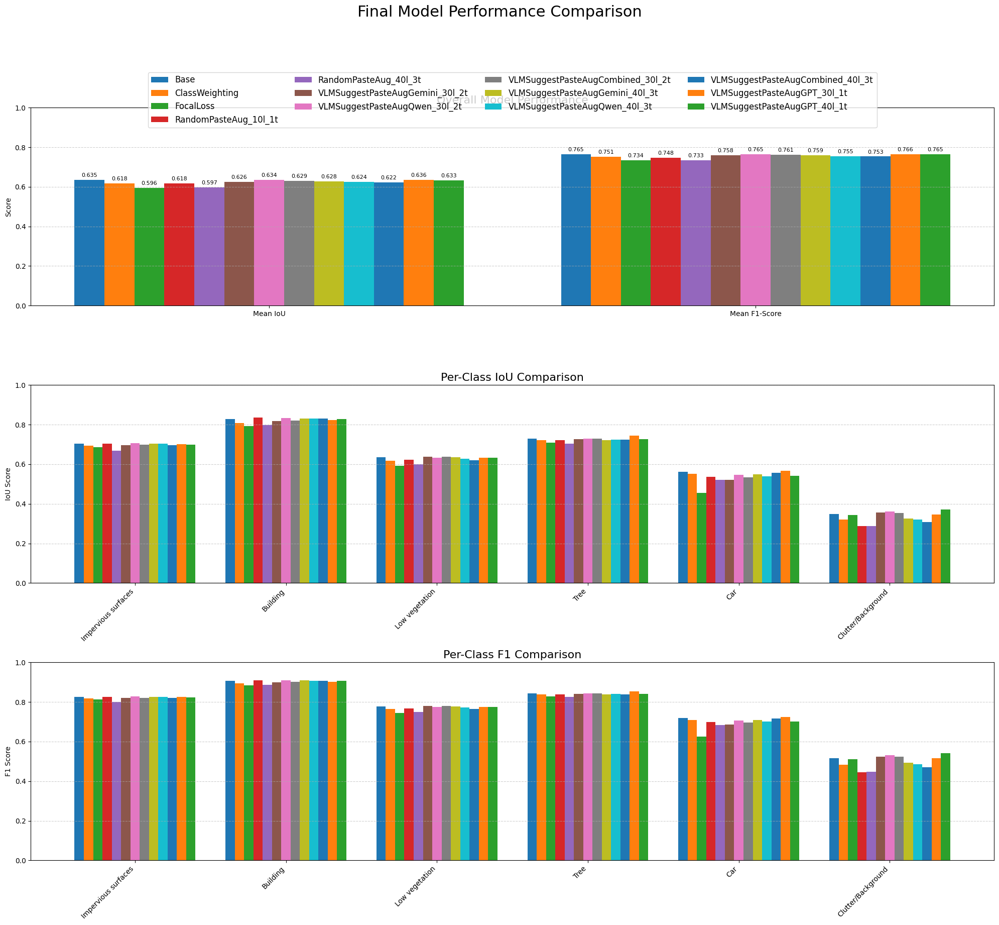

In [ ]:
# Round 1
plot_final_summary_report(all_results, id_to_class_name)

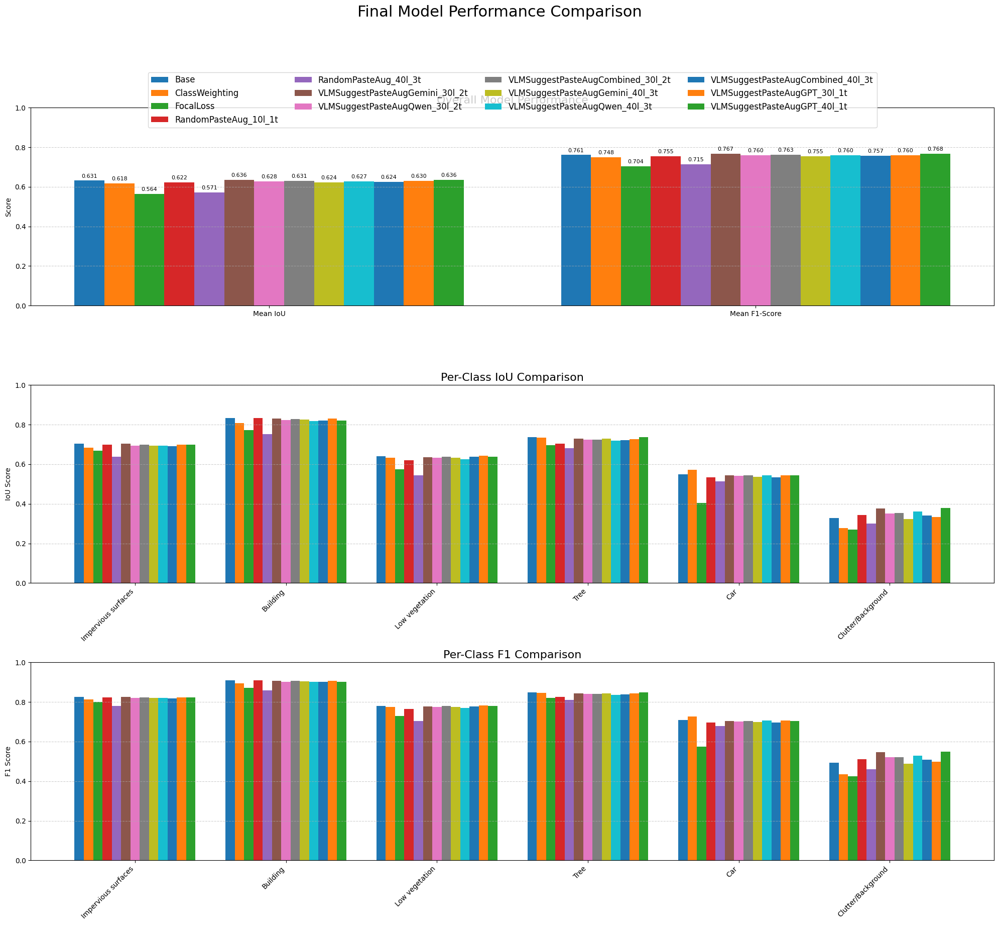

In [ ]:
# Round 2
plot_final_summary_report(all_results, id_to_class_name)

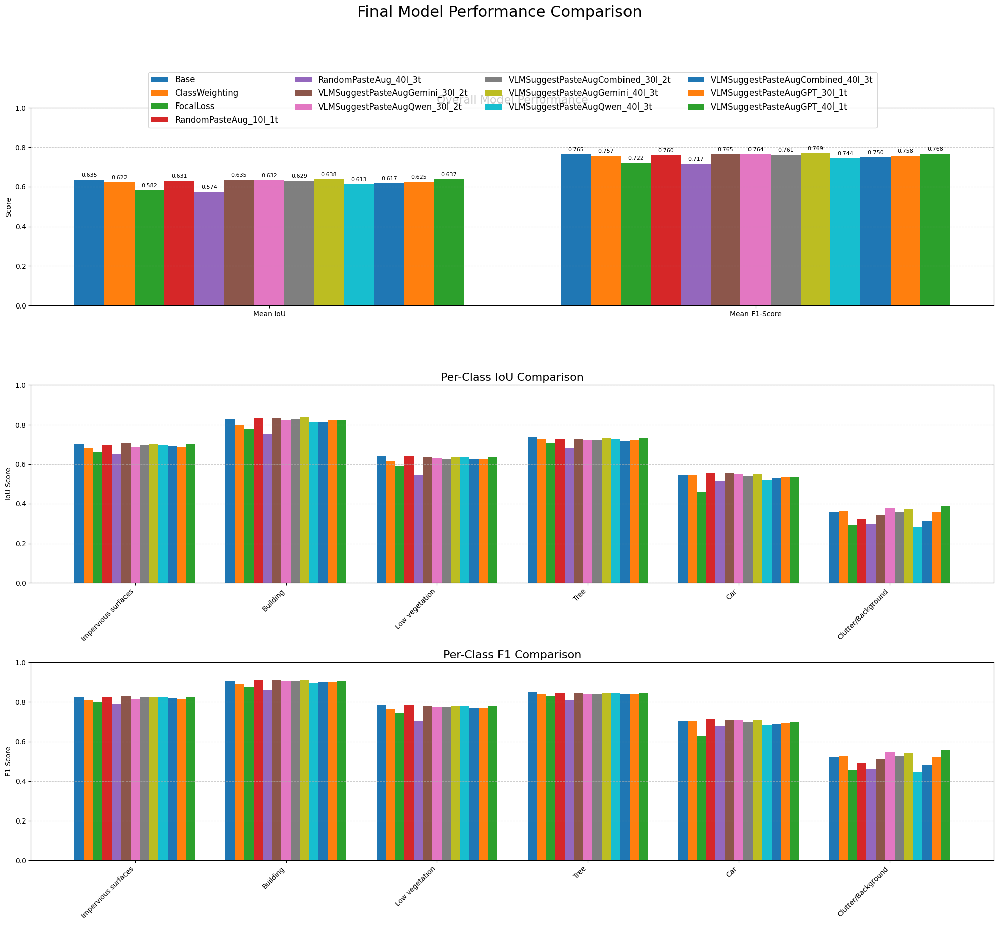

In [ ]:
# Round 3
plot_final_summary_report(all_results, id_to_class_name)

## --- Additional Experiment ---

### Get Locations

#### VLM Suggest Locations

##### Qwen2.5VL 3B (GPU)

In [ ]:
# Qwen 3B
qwen3b_pipe = pipeline("image-text-to-text", model="Qwen/Qwen2.5-VL-3B-Instruct", device_map="auto", use_flash_attn=True)

In [ ]:
# Qwen 3B
qwen3b_gpu_save_path = os.path.join(location_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

# Load checkpoint if it exists, otherwise start with an empty dict
if os.path.exists(qwen3b_gpu_save_path):
    print(f"✅ Resuming from existing Qwen 3B checkpoint: {qwen3b_gpu_save_path}")
    with open(qwen3b_gpu_save_path, 'r') as f:
        qwen3b_gpu_location_dict = json.load(f)
else:
    qwen3b_gpu_location_dict = {}

In [ ]:
# Get locations (GPU)

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))
gpu_call_count = 0

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested locations from VLM (GPU)"):

        # resume
        if img_fn in qwen3b_gpu_location_dict and len(qwen3b_gpu_location_dict[img_fn]) > max_locations:
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        qwen3b_gpu_verified_locations = set()

        for trial in range(vlm_strategy_params["max_trials"]):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(qwen3b_gpu_verified_locations) >= max_locations:
                print(f"✅ Target of {max_locations} locations reached. Stopping.")
                break
            try:
                # qwen3b
                messages = [
                    {
                        "role": "user",
                        "content": [
                            {"type": "image", "image": tgt_img_pil},
                            {"type": "image", "image": tgt_color_mask},
                            {"type": "text", "text": text_prompt}
                        ]
                    }
                ]
                qwen3b_response_text = qwen3b_pipe(text=messages, max_new_tokens=512, return_full_text=False)
                qwen3b_gpu_verified_locations.update(
                    verify_locations(
                        parse_vlm_response(qwen3b_response_text[0]['generated_text']),
                        tgt_mask,
                        allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                    )
                )

            except Exception as e:
                print("❌ Qwen 3B error:", e)
                print("❌ Qwen 3B raw response:\n", qwen3b_response_text[0]['generated_text'])

            print(f"📌 {img_fn} — Qwen3B: {len(qwen3b_gpu_verified_locations)}")
            # time.sleep(4.2)

        qwen3b_gpu_location_dict[img_fn] = list(qwen3b_gpu_verified_locations)

        gpu_call_count += 1

        # save check point every 10 calls
        if gpu_call_count%10 == 0:
            save_location_dict_to_json(qwen3b_gpu_location_dict, qwen3b_gpu_save_path)

# save
save_location_dict_to_json(qwen3b_gpu_location_dict, qwen3b_gpu_save_path)

In [ ]:
# gemini3b gpu

# if load
qwen3b_gpu_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'qwen3b_gpu_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=qwen3b_gpu_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

In [ ]:
# Qwen3B GPU L30 T2
# --- Check Class Distribution ---

max_locations = 30
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- qwen3b_gpu_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste/qwen3b_gpu_l30_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:08<00:00, 30.05it/s] 


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   28.0658%
           Building   25.9070%
     Low vegetation   20.3096%
               Tree   22.7097%
                Car    2.2025%
 Clutter/Background    0.8054%

--- qwen3b_gpu_l30_t2 ---


,Class,Percentage
0,Impervious surfaces,28.0658%
1,Building,25.9070%
2,Low vegetation,20.3096%
3,Tree,22.7097%
4,Car,2.2025%
5,Clutter/Background,0.8054%


In [ ]:
# Qwen3B GPU L40 T3
# --- Check Class Distribution ---

max_locations = 40
max_trials = 3

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- qwen3b_gpu_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste/qwen3b_gpu_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:05<00:00, 51.87it/s] 


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   28.0294%
           Building   25.9070%
     Low vegetation   20.2862%
               Tree   22.7097%
                Car    2.2624%
 Clutter/Background    0.8054%

--- qwen3b_gpu_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,28.0294%
1,Building,25.9070%
2,Low vegetation,20.2862%
3,Tree,22.7097%
4,Car,2.2624%
5,Clutter/Background,0.8054%


#### VLM Filter Locations

##### Qwen2.5VL 3B (GPU)

In [ ]:
max_locations = vlm_strategy_params["max_locations"]
max_trials = vlm_strategy_params["max_trials"]

image_size = (512,512)

qwen3b_gpu_filter_save_path = os.path.join(location_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}_filter.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

# Load Qwen checkpoint if it exists
if os.path.exists(qwen3b_gpu_filter_save_path):
    print(f"✅ Resuming from existing Qwen checkpoint: {qwen3b_gpu_filter_save_path}")
    with open(qwen3b_gpu_filter_save_path, 'r') as f:
        qwen3b_gpu_filter_location_dict = json.load(f)
else:
    qwen3b_gpu_filter_location_dict = {}

In [ ]:
# Get random locations then use VLM to select most n appropriate

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))
gpu_call_count = 0

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested locations from VLM APIs"):

        # skip if locations already exceed max locations (resume)
        if img_fn in qwen3b_gpu_filter_location_dict and len(qwen3b_gpu_filter_location_dict[img_fn]) > max_locations:
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        qwen3b_gpu_filter_verified_locations = set()

        random_locations = get_random_locations(
                                tgt_mask,
                                vlm_strategy_params["allowed_paste_ids"],
                                vlm_strategy_params["max_locations"]*4,  # 4 * max locations
                                vlm_strategy_params["min_distance"]
                            )

        text_prompt = f"""
            You are an expert AI assistant specializing in geospatial data analysis.

            ## TASK
            From the provided list of pre-approved candidate coordinates, your task is to select up to {max_locations} most contextually plausible locations to paste a 'Car'.

            ## CONTEXT
            Input Image & Mask: An aerial view and its corresponding semantic mask.
            Candidate Coordinates: A list of (x, y) coordinates that are guaranteed to be valid in terms of surface type and overlap.

            Plausibility Rules:
            Prioritize locations within parking spaces or on roads.
            Avoid placing cars in the middle of intersections or in unnatural orientations.

            ## OUTPUT FORMAT
            Return only a JSON list of object containing your top {max_locations} selections from the provided list in this format:
            [(x1, y1), (x2, y2), ...]
            Do not include any reasoning or extra text.

            List: {random_locations}
            """

        for trial in range(vlm_strategy_params["max_trials"]):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(qwen3b_gpu_filter_verified_locations) >= max_locations:
                print(f"✅ Target of {max_locations} locations reached. Stopping.")
                break

            try:
                # qwen
                messages = [
                    {
                        "role": "user",
                        "content": [
                            {"type": "image", "image": tgt_img_pil},
                            {"type": "image", "image": tgt_color_mask},
                            {"type": "text", "text": text_prompt}
                        ]
                    }
                ]
                qwen3b_response_text = qwen3b_pipe(text=messages, max_new_tokens=512, return_full_text=False)
                qwen3b_gpu_filter_verified_locations.update(
                    verify_locations(
                        parse_vlm_response(qwen3b_response_text[0]['generated_text']),
                        tgt_mask,
                        allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                    )
                )
                gpu_call_count += 1

            except Exception as e:
                print("❌ Qwen error:", e)
                print("❌ Qwen raw response:\n", qwen_response_text)

            print(f"📌 {img_fn} — Qwen: {len(qwen3b_gpu_filter_verified_locations)}")
            # time.sleep(4.2)

        qwen3b_gpu_filter_location_dict[img_fn] = list(qwen3b_gpu_filter_verified_locations)

        # save check point every 10 api calls
        if gpu_call_count%10 == 0:
            save_location_dict_to_json(qwen3b_gpu_filter_location_dict, qwen3b_gpu_filter_save_path)

# save
save_location_dict_to_json(qwen3b_gpu_filter_location_dict, qwen3b_gpu_filter_save_path)

In [ ]:
# qwen3b

# if load
# qwen3b_gpu_filter_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'qwen3b_gpu_l{max_locations}_t{max_trials}_filter.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir, f'qwen3b_filter_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=qwen3b_gpu_filter_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

In [ ]:
# Qwen Filter L40 T3
# --- Check Class Distribution ---

max_locations = 40
max_trials = 3

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen3b_filter_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- qwen3b_filter_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste/qwen3b_filter_l40_t3/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:04<00:00, 60.40it/s] 


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   27.4248%
           Building   25.9070%
     Low vegetation   19.9696%
               Tree   22.7097%
                Car    3.1836%
 Clutter/Background    0.8054%

--- qwen3b_filter_l40_t3 ---


,Class,Percentage
0,Impervious surfaces,27.4248%
1,Building,25.9070%
2,Low vegetation,19.9696%
3,Tree,22.7097%
4,Car,3.1836%
5,Clutter/Background,0.8054%


##### API

In [ ]:
# gemini_api_location_dict = {}
# qwen_api_location_dict = {}

max_locations = vlm_strategy_params["max_locations"]
max_trials = vlm_strategy_params["max_trials"]

image_size = (512,512)

gemini_api_filter_save_path = os.path.join(location_dir, f'gemini_api_l{max_locations}_t{max_trials}_filter.json')
qwen_api_filter_save_path = os.path.join(location_dir, f'qwen_api_l{max_locations}_t{max_trials}_filter.json')

input_image_dir = os.path.join(train_patches_dir,'images')
input_mask_dir = os.path.join(train_patches_dir,'id_masks')
input_color_mask_dir = os.path.join(train_patches_dir,'color_masks')

os.makedirs(location_dir, exist_ok=True)

# Load Gemini checkpoint if it exists, otherwise start with an empty dict
if os.path.exists(gemini_api_filter_save_path):
    print(f"✅ Resuming from existing Gemini checkpoint: {gemini_api_filter_save_path}")
    with open(gemini_api_filter_save_path, 'r') as f:
        gemini_api_filter_location_dict = json.load(f)
else:
    gemini_api_filter_location_dict = {}

# Load Qwen checkpoint if it exists
if os.path.exists(qwen_api_filter_save_path):
    print(f"✅ Resuming from existing Qwen checkpoint: {qwen_api_filter_save_path}")
    with open(qwen_api_filter_save_path, 'r') as f:
        qwen_api_filter_location_dict = json.load(f)
else:
    qwen_api_filter_location_dict = {}

In [ ]:
# Get random locations then use VLM to select most n appropriate

image_fns = sorted(f for f in os.listdir(input_image_dir) if f.endswith(".png"))

for img_fn in tqdm(image_fns, total=len(image_fns), desc=f"Getting suggested locations from VLM APIs"):

        # skip if locations already exceed max locations (resume)
        if img_fn in gemini_api_filter_location_dict and len(gemini_api_filter_location_dict[img_fn]) > max_locations and img_fn in qwen_api_filter_location_dict and len(qwen_api_filter_location_dict[img_fn]) > max_locations:
            continue

        img_pth = os.path.join(input_image_dir, img_fn)
        col_msk_pth = os.path.join(input_color_mask_dir, img_fn)

        tgt_img_pil = Image.open(img_pth).convert("RGB")
        tgt_color_mask = Image.open(col_msk_pth).convert("RGB")

        tgt_img = np.array(tgt_img_pil)

        base_fn = os.path.splitext(img_fn)[0]
        mask_fn_npy = f"{base_fn}.npy"
        tgt_mask = np.load(os.path.join(input_mask_dir, mask_fn_npy))

        gemini_api_filter_verified_locations = set()
        qwen_api_filter_verified_locations = set()

        random_locations = get_random_locations(
                                tgt_mask,
                                vlm_strategy_params["allowed_paste_ids"],
                                vlm_strategy_params["max_locations"]*4,  # 4 * max locations
                                vlm_strategy_params["min_distance"]
                            )

        text_prompt = f"""
            You are an expert AI assistant specializing in geospatial data analysis.

            ## TASK
            From the provided list of pre-approved candidate coordinates, your task is to select up to {max_locations} most contextually plausible locations to paste a 'Car'.

            ## CONTEXT
            Input Image & Mask: An aerial view and its corresponding semantic mask.
            Candidate Coordinates: A list of (x, y) coordinates that are guaranteed to be valid in terms of surface type and overlap.

            Plausibility Rules:
            Prioritize locations within marked parking spaces.
            On roads, choose locations that align with the direction of traffic.
            Avoid placing cars in the middle of intersections or in unnatural orientations.

            ## OUTPUT FORMAT
            Return only a JSON list of object containing your top {max_locations} selections from the provided list in this format:
            [(x1, y1), (x2, y2), ...]
            Do not include any reasoning or extra text.

            List: {random_locations}
            """

        for trial in range(vlm_strategy_params["max_trials"]):
            if trial>0 and not check_area_threshold(tgt_mask, vlm_strategy_params["area_threshold_id_check"], vlm_strategy_params["area_threshold"]):
                print(f"Less area threshold than {vlm_strategy_params['area_threshold']}")
                break
            if len(gemini_api_filter_verified_locations) >= max_locations and len(qwen_api_filter_verified_locations) >= max_locations:
                print(f"✅ Target of {max_locations} locations reached. Stopping.")
                break
            try:
                # gemini
                if vlm_config["gemini"]["api_call_count"] < vlm_config["gemini"]["api_limit"]:
                    gemini_response_text = vlm_gemini(text_prompt, tgt_img_pil, tgt_color_mask)
                    vlm_config["gemini"]["api_call_count"] += 1
                    gemini_api_filter_verified_locations.update(
                        verify_locations(
                            parse_vlm_response(gemini_response_text),
                            tgt_mask,
                            allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                        )
                    )

            except TooManyRequests:
                wait_time = 5 * (2 ** trial)
                print(f"⚠️ Rate limit hit. Waiting {wait_time} seconds before next trial...")
                time.sleep(wait_time)

            except Exception as e:
                print("❌ Gemini API error:", e)
                print("❌ Gemini raw response:\n", gemini_response_text)

            try:
                # qwen
                if vlm_config["qwen"]["api_call_count"] < vlm_config["qwen"]["api_limit"]:
                    qwen_response_text = vlm_qwen_api(img_pth, col_msk_pth, text_prompt)
                    vlm_config["qwen"]["api_call_count"] += 1
                    qwen_api_filter_verified_locations.update(
                        verify_locations(
                            parse_vlm_response(qwen_response_text),
                            tgt_mask,
                            allowed_paste_ids=vlm_strategy_params["allowed_paste_ids"]
                        )
                    )

            except Exception as e:
                print("❌ Qwen API error:", e)
                print("❌ Qwen raw response:\n", qwen_response_text)

            print(f"📌 {img_fn} — Gemini: {len(gemini_api_filter_verified_locations)}, Qwen: {len(qwen_api_filter_verified_locations)}")
            time.sleep(4.2)

        gemini_api_filter_location_dict[img_fn] = list(gemini_api_filter_verified_locations)
        qwen_api_filter_location_dict[img_fn] = list(qwen_api_filter_verified_locations)

        # save check point every 10 api calls
        if vlm_config["gemini"]["api_call_count"]%10 == 0:
            save_location_dict_to_json(gemini_api_filter_location_dict, gemini_api_filter_save_path)
            save_location_dict_to_json(qwen_api_filter_location_dict, qwen_api_filter_save_path)

# save
save_location_dict_to_json(gemini_api_filter_location_dict, gemini_api_filter_save_path)
save_location_dict_to_json(qwen_api_filter_location_dict, qwen_api_filter_save_path)

In [ ]:
# gemini

# if load
# gemini_api_filter_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'gemini_api_l{max_locations}_t{max_trials}_filter.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir, f'gemini_filter_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=gemini_api_filter_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

In [ ]:
# Gemini Filter L40 T2
# --- Check Class Distribution ---

max_locations = 40
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'gemini_filter_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- gemini_filter_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste/gemini_filter_l40_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:10<00:00, 26.26it/s] 


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   25.1839%
           Building   25.9070%
     Low vegetation   18.6988%
               Tree   22.7097%
                Car    6.6953%
 Clutter/Background    0.8054%

--- gemini_filter_l40_t2 ---


,Class,Percentage
0,Impervious surfaces,25.1839%
1,Building,25.9070%
2,Low vegetation,18.6988%
3,Tree,22.7097%
4,Car,6.6953%
5,Clutter/Background,0.8054%


In [ ]:
# qwen

# if load
# qwen_api_filter_location_dict = load_location_dict_from_json(os.path.join(location_dir, f'qwen_api_l{max_locations}_t{max_trials}_filter.json'))

batch_paste(
    input_image_dir=os.path.join(train_patches_dir,'images'),
    input_mask_dir=os.path.join(train_patches_dir,'id_masks'),
    input_color_mask_dir=os.path.join(train_patches_dir,'color_masks'),
    output_dir=os.path.join(vlm_paste_dir,f'qwen_filter_l{max_locations}_t{max_trials}'),
    source_pool_dir=source_pool_dir,
    target_class_id=4,  # Car class ID
    allowed_paste_ids={0,2},  # Surface & low vegetation
    location_dict=qwen_api_filter_location_dict,
    max_paste_trial=5,
    p_rotate=0.5,
    blur_radius=1,
    alpha_filter=0.1
)

In [ ]:
# Qwen Filter L40 T2
# --- Check Class Distribution ---

max_locations = 40
max_trials = 2

dist_dict, dist_df = get_class_distribution_df(
    os.path.join(vlm_paste_dir, f'qwen_filter_l{max_locations}_t{max_trials}/Car/id_masks'),
    id_to_class_name
)

print(f"\n--- qwen_filter_l{max_locations}_t{max_trials} ---")

display(dist_df)


Analyzing ID masks in: /content/drive/MyDrive/Dissertation/pipeline_draft_1/processed_data/data_augmented_vlm_paste/qwen_filter_l40_t2/Car/id_masks


Analyzing Masks: 100%|██████████| 264/264 [00:05<00:00, 48.39it/s] 


--- Class Distribution Report ---
              Class Percentage
Impervious surfaces   24.4141%
           Building   25.9070%
     Low vegetation   18.1217%
               Tree   22.7097%
                Car    8.0421%
 Clutter/Background    0.8054%

--- qwen_filter_l40_t2 ---


,Class,Percentage
0,Impervious surfaces,24.4141%
1,Building,25.9070%
2,Low vegetation,18.1217%
3,Tree,22.7097%
4,Car,8.0421%
5,Clutter/Background,0.8054%


### Train

##### Qwen 3B GPU

In [ ]:
# -- 30 locations --

In [ ]:
model_vlm_paste_qwen3b_l30_t2 = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_qwen3b_l30_t2.to(device)

model_vlm_paste_qwen3b_l30_t2_path = os.path.join(model_dir, 'vlm_qwen3b_l30_t2.pth')

# Optimizer
optimizer_vlm_paste_qwen3b_l30_t2 = torch.optim.AdamW([dict(params=model_vlm_paste_qwen3b_l30_t2.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_qwen3b_l30_t2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_qwen3b_l30_t2,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_qwen3b_l30_t2_dir = os.path.join(vlm_paste_dir,'qwen3b_gpu_l30_t2/Car')

# Create train and validation dataset
train_vlm_paste_qwen3b_l30_t2_dataset = VaihingenPatchesDataset(train_vlm_paste_qwen3b_l30_t2_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_paste_qwen3b_l30_t2_loader = DataLoader(train_vlm_paste_qwen3b_l30_t2_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
additional_results["VLMSuggestPasteAugQwen3B_30l_2t"]["train_score"] = train_model(
    model=model_vlm_paste_qwen3b_l30_t2,
    device=device,
    train_loader=train_vlm_paste_qwen3b_l30_t2_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_qwen3b_l30_t2,
    scheduler=scheduler_vlm_paste_qwen3b_l30_t2,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_qwen3b_l30_t2_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4824 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.43it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5175 | Best mIoU: 0.4824

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.49it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5349 | Best mIoU: 0.5175

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.48it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5784 | Best mIoU: 0.5349

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5908 | Best mIoU: 0.5784

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5857 | Best mIoU: 0.5908
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5365 | Best mIoU: 0.5908
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.5670 | Best mIoU: 0.5908
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5815 | Best mIoU: 0.5908
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.35it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6217 | Best mIoU: 0.5908

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.33it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6186 | Best mIoU: 0.6217
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6190 | Best mIoU: 0.6217
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.28it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.6211 | Best mIoU: 0.6217
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.33it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6224 | Best mIoU: 0.6217

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6161 | Best mIoU: 0.6224
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.28it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6217 | Best mIoU: 0.6224
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.06it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6270 | Best mIoU: 0.6224

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6213 | Best mIoU: 0.6270
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6229 | Best mIoU: 0.6270
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.96it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6230 | Best mIoU: 0.6270
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.32it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6295 | Best mIoU: 0.6270

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6270 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.22it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6162 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.70it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6250 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.33it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6215 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.22it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6200 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.39it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6239 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.35it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6187 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6258 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6232 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.83it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6205 | Best mIoU: 0.6295
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.65it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6335 | Best mIoU: 0.6295

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_qwen3b_l30_t2.pth


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6293 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6183 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.89it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6277 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6224 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.21it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6250 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6235 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.04it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6211 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.33it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6163 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.24it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6292 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.31it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.6273 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.24it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.6225 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.90it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.6231 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 45 Results:
  Mean IoU (mIoU): 0.6288 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 46/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.35it/s]



Epoch 46 Results:
  Mean IoU (mIoU): 0.6220 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 47/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.34it/s]



Epoch 47 Results:
  Mean IoU (mIoU): 0.6241 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 48/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.94it/s]



Epoch 48 Results:
  Mean IoU (mIoU): 0.6256 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 49/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 49 Results:
  Mean IoU (mIoU): 0.6250 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 50/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 50 Results:
  Mean IoU (mIoU): 0.6256 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 51/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.25it/s]



Epoch 51 Results:
  Mean IoU (mIoU): 0.6225 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 52/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.80it/s]


Epoch 52 Results:
  Mean IoU (mIoU): 0.6191 | Best mIoU: 0.6335
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6335 at epoch 32


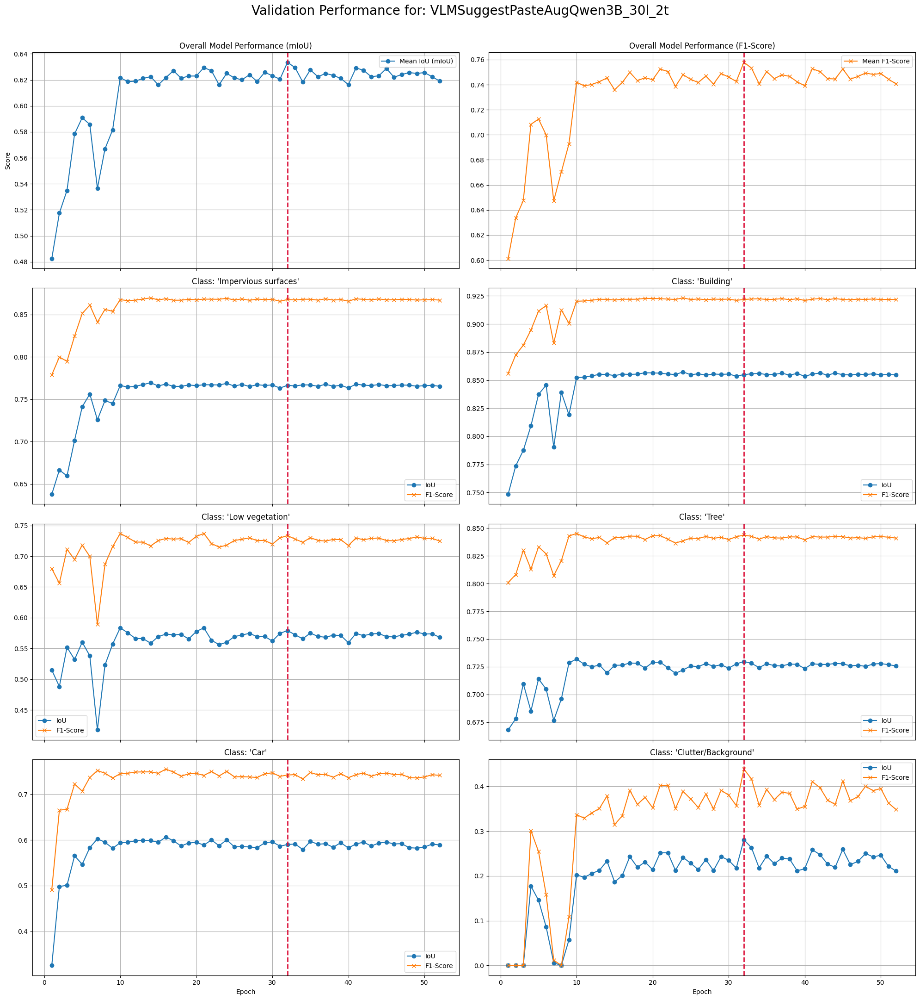

In [ ]:
plot_val_score("VLMSuggestPasteAugQwen3B_30l_2t", additional_results, id_to_class_name)

In [ ]:
# -- 40 locations --

In [ ]:
model_vlm_paste_qwen3b = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_paste_qwen3b.to(device)

model_vlm_paste_qwen3b_path = os.path.join(model_dir, 'vlm_qwen3b_l40_t3.pth')

# Optimizer
optimizer_vlm_paste_qwen3b = torch.optim.AdamW([dict(params=model_vlm_paste_qwen3b.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_paste_qwen3b = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_paste_qwen3b,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_paste_qwen3b_dir = os.path.join(vlm_paste_dir,'qwen3b_gpu_l40_t3/Car')

# Create train and validation dataset
train_vlm_paste_qwen3b_dataset = VaihingenPatchesDataset(train_vlm_paste_qwen3b_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_paste_qwen3b_loader = DataLoader(train_vlm_paste_qwen3b_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
additional_results["VLMSuggestPasteAugQwen3B_40l_3t"]["train_score"] = train_model(
    model=model_vlm_paste_qwen3b,
    device=device,
    train_loader=train_vlm_paste_qwen3b_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_paste_qwen3b,
    scheduler=scheduler_vlm_paste_qwen3b,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_paste_qwen3b_path,
    patience=early_stop
)

In [ ]:
plot_val_score("VLMSuggestPasteAugQwen3B_40l_3t", additional_results, id_to_class_name)

##### Qwen 3B GPU Filter

In [ ]:
model_vlm_qwen3b_filter = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_qwen3b_filter.to(device)

model_vlm_qwen3b_filter_path = os.path.join(model_dir, 'vlm_filter_qwen3b_l40_t3.pth')

# Optimizer
optimizer_vlm_qwen3b_filter = torch.optim.AdamW([dict(params=model_vlm_qwen3b_filter.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_qwen3b_filter = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_qwen3b_filter,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_qwen3b_filter_dir = os.path.join(vlm_paste_dir,'qwen3b_filter_l40_t3/Car')

# Create train and validation dataset
train_vlm_qwen3b_filter_dataset = VaihingenPatchesDataset(train_vlm_qwen3b_filter_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_qwen3b_filter_loader = DataLoader(train_vlm_qwen3b_filter_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
additional_results["VLMFilterPasteAugQwen3B"]["train_score"] = train_model(
    model=model_vlm_qwen3b_filter,
    device=device,
    train_loader=train_vlm_qwen3b_filter_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_qwen3b_filter,
    scheduler=scheduler_vlm_qwen3b_filter,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_qwen3b_filter_path,
    patience=early_stop
)

--- Starting Training for 100 epochs ---


Epoch 1/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.31it/s]



Epoch 1 Results:
  Mean IoU (mIoU): 0.4429 | Best mIoU: 0.0000

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 2/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.35it/s]



Epoch 2 Results:
  Mean IoU (mIoU): 0.5354 | Best mIoU: 0.4429

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 3/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.88it/s]



Epoch 3 Results:
  Mean IoU (mIoU): 0.5773 | Best mIoU: 0.5354

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 4/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.35it/s]



Epoch 4 Results:
  Mean IoU (mIoU): 0.5434 | Best mIoU: 0.5773
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 5/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 5 Results:
  Mean IoU (mIoU): 0.5651 | Best mIoU: 0.5773
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 6/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.53it/s]



Epoch 6 Results:
  Mean IoU (mIoU): 0.5785 | Best mIoU: 0.5773

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 7/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.42it/s]



Epoch 7 Results:
  Mean IoU (mIoU): 0.5723 | Best mIoU: 0.5785
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 8/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.38it/s]



Epoch 8 Results:
  Mean IoU (mIoU): 0.6189 | Best mIoU: 0.5785

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 9/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.85it/s]



Epoch 9 Results:
  Mean IoU (mIoU): 0.5830 | Best mIoU: 0.6189
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 10/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.81it/s]



Epoch 10 Results:
  Mean IoU (mIoU): 0.6261 | Best mIoU: 0.6189

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 11/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.41it/s]



Epoch 11 Results:
  Mean IoU (mIoU): 0.6264 | Best mIoU: 0.6261

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 12/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.18it/s]



Epoch 12 Results:
  Mean IoU (mIoU): 0.6160 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 13/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.18it/s]



Epoch 13 Results:
  Mean IoU (mIoU): 0.5974 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 14/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.32it/s]



Epoch 14 Results:
  Mean IoU (mIoU): 0.6196 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 15/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 15 Results:
  Mean IoU (mIoU): 0.6128 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 16/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 16 Results:
  Mean IoU (mIoU): 0.6181 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 17/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.37it/s]



Epoch 17 Results:
  Mean IoU (mIoU): 0.6236 | Best mIoU: 0.6264
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 18/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.16it/s]



Epoch 18 Results:
  Mean IoU (mIoU): 0.6422 | Best mIoU: 0.6264

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 19/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.38it/s]



Epoch 19 Results:
  Mean IoU (mIoU): 0.6377 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 20/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.41it/s]



Epoch 20 Results:
  Mean IoU (mIoU): 0.6399 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 21/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.54it/s]



Epoch 21 Results:
  Mean IoU (mIoU): 0.6405 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 22/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.68it/s]



Epoch 22 Results:
  Mean IoU (mIoU): 0.6414 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 23/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 23 Results:
  Mean IoU (mIoU): 0.6391 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 24/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 24 Results:
  Mean IoU (mIoU): 0.6394 | Best mIoU: 0.6422
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 25/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.33it/s]



Epoch 25 Results:
  Mean IoU (mIoU): 0.6430 | Best mIoU: 0.6422

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 26/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.52it/s]



Epoch 26 Results:
  Mean IoU (mIoU): 0.6401 | Best mIoU: 0.6430
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 27/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.41it/s]



Epoch 27 Results:
  Mean IoU (mIoU): 0.6436 | Best mIoU: 0.6430

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 28/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.37it/s]



Epoch 28 Results:
  Mean IoU (mIoU): 0.6420 | Best mIoU: 0.6436
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 29/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.17it/s]



Epoch 29 Results:
  Mean IoU (mIoU): 0.6336 | Best mIoU: 0.6436
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 30/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.90it/s]



Epoch 30 Results:
  Mean IoU (mIoU): 0.6330 | Best mIoU: 0.6436
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 31/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.42it/s]



Epoch 31 Results:
  Mean IoU (mIoU): 0.6347 | Best mIoU: 0.6436
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 32/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.29it/s]



Epoch 32 Results:
  Mean IoU (mIoU): 0.6426 | Best mIoU: 0.6436
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 33/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.45it/s]



Epoch 33 Results:
  Mean IoU (mIoU): 0.6449 | Best mIoU: 0.6436

  -> Validation IoU improved. New best model saved to /content/drive/MyDrive/Dissertation/pipeline_draft_1/models/vlm_filter_qwen3b_l40_t3.pth


Epoch 34/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.81it/s]



Epoch 34 Results:
  Mean IoU (mIoU): 0.6416 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 1 epoch(s).


Epoch 35/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 35 Results:
  Mean IoU (mIoU): 0.6407 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 2 epoch(s).


Epoch 36/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]



Epoch 36 Results:
  Mean IoU (mIoU): 0.6395 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 3 epoch(s).


Epoch 37/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.61it/s]



Epoch 37 Results:
  Mean IoU (mIoU): 0.6407 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 4 epoch(s).


Epoch 38/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.78it/s]



Epoch 38 Results:
  Mean IoU (mIoU): 0.6389 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 5 epoch(s).


Epoch 39/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.37it/s]



Epoch 39 Results:
  Mean IoU (mIoU): 0.6416 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 6 epoch(s).


Epoch 40/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 40 Results:
  Mean IoU (mIoU): 0.6391 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 7 epoch(s).


Epoch 41/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.30it/s]



Epoch 41 Results:
  Mean IoU (mIoU): 0.6432 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 8 epoch(s).


Epoch 42/100 [Val]: 100%|██████████| 15/15 [00:03<00:00,  4.69it/s]



Epoch 42 Results:
  Mean IoU (mIoU): 0.6437 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 9 epoch(s).


Epoch 43/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.39it/s]



Epoch 43 Results:
  Mean IoU (mIoU): 0.6388 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 10 epoch(s).


Epoch 44/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.28it/s]



Epoch 44 Results:
  Mean IoU (mIoU): 0.6412 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 11 epoch(s).


Epoch 45/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.39it/s]



Epoch 45 Results:
  Mean IoU (mIoU): 0.6415 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 12 epoch(s).


Epoch 46/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.88it/s]



Epoch 46 Results:
  Mean IoU (mIoU): 0.6428 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 13 epoch(s).


Epoch 47/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.30it/s]



Epoch 47 Results:
  Mean IoU (mIoU): 0.6421 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 14 epoch(s).


Epoch 48/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.40it/s]



Epoch 48 Results:
  Mean IoU (mIoU): 0.6412 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 15 epoch(s).


Epoch 49/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]



Epoch 49 Results:
  Mean IoU (mIoU): 0.6431 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 16 epoch(s).


Epoch 50/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]



Epoch 50 Results:
  Mean IoU (mIoU): 0.6397 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 17 epoch(s).


Epoch 51/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  5.18it/s]



Epoch 51 Results:
  Mean IoU (mIoU): 0.6396 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 18 epoch(s).


Epoch 52/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.32it/s]



Epoch 52 Results:
  Mean IoU (mIoU): 0.6415 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 19 epoch(s).


Epoch 53/100 [Val]: 100%|██████████| 15/15 [00:02<00:00,  6.34it/s]


Epoch 53 Results:
  Mean IoU (mIoU): 0.6412 | Best mIoU: 0.6449
  -> Validation IoU did not improve for 20 epoch(s).

--- Early stopping triggered after 20 epochs with no improvement. ---

--- Training Complete ---
Best validation IoU: 0.6449 at epoch 33


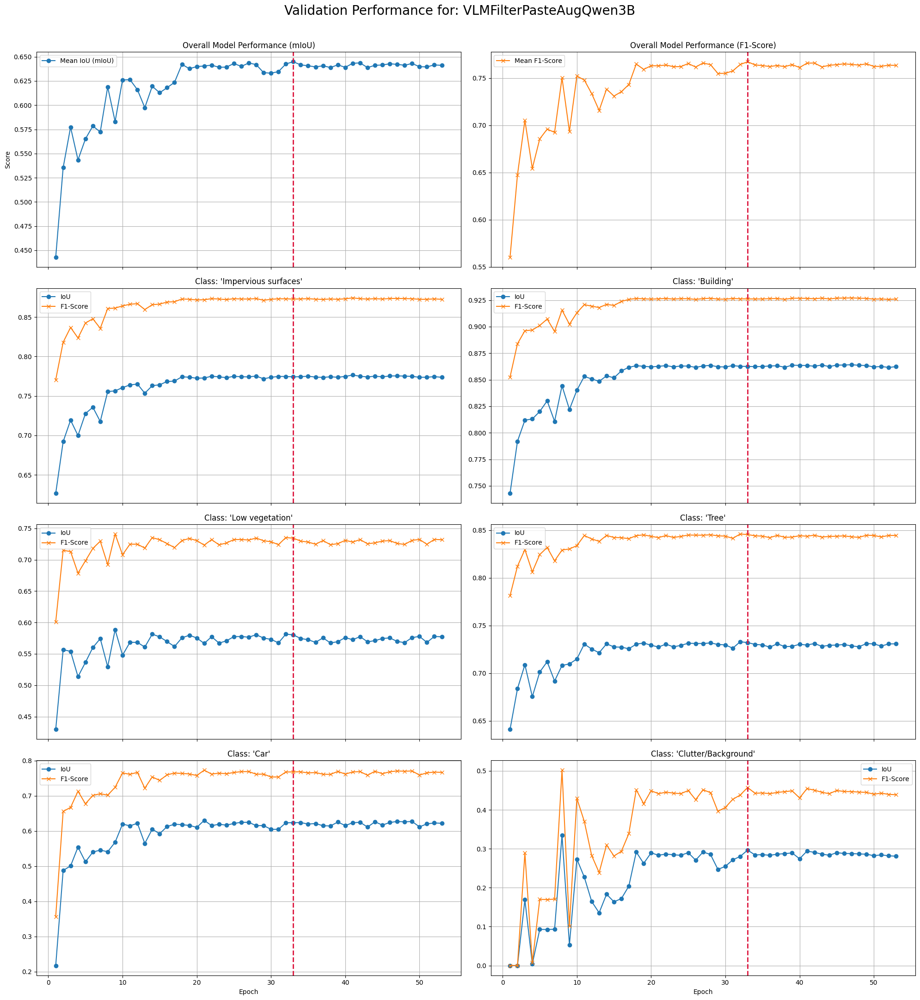

In [ ]:
plot_val_score("VLMFilterPasteAugQwen3B", additional_results, id_to_class_name)

##### Gemini Filter

In [ ]:
model_vlm_gemini_filter = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_gemini_filter.to(device)

model_vlm_gemini_filter_path = os.path.join(model_dir, 'vlm_filter_gemini_l40_t2.pth')

# Optimizer
optimizer_vlm_gemini_filter = torch.optim.AdamW([dict(params=model_vlm_gemini_filter.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_gemini_filter = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_gemini_filter,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_gemini_filter_dir = os.path.join(vlm_paste_dir,'gemini_filter_l40_t2/Car')

# Create train and validation dataset
train_vlm_gemini_filter_dataset = VaihingenPatchesDataset(train_vlm_gemini_filter_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_gemini_filter_loader = DataLoader(train_vlm_gemini_filter_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
additional_results["VLMFilterPasteAugGemini"]["train_score"] = train_model(
    model=model_vlm_gemini_filter,
    device=device,
    train_loader=train_vlm_gemini_filter_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_gemini_filter,
    scheduler=scheduler_vlm_gemini_filter,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_gemini_filter_path,
    patience=early_stop
)

In [ ]:
plot_val_score("VLMFilterPasteAugGemini", additional_results, id_to_class_name)

##### Qwen Filter

In [ ]:
model_vlm_qwen_filter = smp.DeepLabV3Plus(
    encoder_name=encoder,
    encoder_weights=encoder_weight,
    in_channels=3,  # RGB
    classes=num_class,
)
model_vlm_qwen_filter.to(device)

model_vlm_qwen_filter_path = os.path.join(model_dir, 'vlm_filter_qwen_l40_t2.pth')

# Optimizer
optimizer_vlm_qwen_filter = torch.optim.AdamW([dict(params=model_vlm_qwen_filter.parameters(), lr=learning_rate, weight_decay=weight_decay)])

scheduler_vlm_qwen_filter = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_vlm_qwen_filter,
    mode='max',      # We want to maximize IoU, so mode is 'max'. For loss, it would be 'min'.
    factor=0.1,      # Reduce LR by a factor of 10
    patience=3,      # Wait for 3 epochs of no improvement before reducing LR
    verbose=True     # Print a message when the LR is reduced
)

In [ ]:
train_vlm_qwen_filter_dir = os.path.join(vlm_paste_dir,'qwen_filter_l40_t2/Car')

# Create train and validation dataset
train_vlm_qwen_filter_dataset = VaihingenPatchesDataset(train_vlm_qwen_filter_dir, augmentation=get_transforms())
val_dataset = VaihingenPatchesDataset(val_patches_dir, augmentation=get_transforms())

# --- Create DataLoaders ---
train_vlm_qwen_filter_loader = DataLoader(train_vlm_qwen_filter_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
additional_results["VLMFilterPasteAugQwen"]["train_score"] = train_model(
    model=model_vlm_qwen_filter,
    device=device,
    train_loader=train_vlm_qwen_filter_loader,
    val_loader=val_loader,
    loss_fn=loss_fn,
    optimizer=optimizer_vlm_qwen_filter,
    scheduler=scheduler_vlm_qwen_filter,
    num_classes=num_class,
    epochs=epochs,
    model_save_path=model_vlm_qwen_filter_path,
    patience=early_stop
)

In [ ]:
plot_val_score("VLMFilterPasteAugQwen", additional_results, id_to_class_name)

### Test

##### Qwen 3B GPU

In [ ]:
# max locations 30

model_name = "VLMSuggestPasteAugQwen3B_30l_2t"

additional_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_qwen3b_l30_t2,
    model_save_path=model_vlm_paste_qwen3b_l30_t2_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, additional_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  6.99it/s]


--- VLMSuggestPasteAugQwen3B_30l_2t Final Test Set Results ---
  Mean IoU (mIoU): 0.6288
  Mean F1-Score: 0.7597

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6965     | 0.8211    
  Building                  | 0.8316     | 0.9080    
  Low vegetation            | 0.6320     | 0.7745    
  Tree                      | 0.7283     | 0.8428    
  Car                       | 0.5473     | 0.7074    
  Clutter/Background        | 0.3372     | 0.5043    

-- VLMSuggestPasteAugQwen3B_30l_2t --


,IoU,F1
Mean,0.628818,0.759706
Impervious surfaces,0.696510,0.821109
Building,0.831555,0.908032
Low vegetation,0.632005,0.774514
Tree,0.728345,0.842823
Car,0.547284,0.707413
Clutter/Background,0.337209,0.504348


In [ ]:
# max locations 40

model_name = "VLMSuggestPasteAugQwen3B_40l_3t"

additional_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_paste_qwen3b,
    model_save_path=model_vlm_paste_qwen3b_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, additional_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  7.13it/s]



--- VLMSuggestPasteAugQwen3B_40l_3t Final Test Set Results ---
  Mean IoU (mIoU): 0.6097
  Mean F1-Score: 0.7353

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7045     | 0.8266    
  Building                  | 0.8262     | 0.9048    
  Low vegetation            | 0.6311     | 0.7738    
  Tree                      | 0.7293     | 0.8435    
  Car                       | 0.5570     | 0.7154    
  Clutter/Background        | 0.2102     | 0.3474    

-- VLMSuggestPasteAugQwen3B_40l_3t --


,IoU,F1
Mean,0.609722,0.735274
Impervious surfaces,0.704500,0.826635
Building,0.826225,0.904845
Low vegetation,0.631088,0.773824
Tree,0.729344,0.843492
Car,0.556960,0.715445
Clutter/Background,0.210215,0.347402


##### Qwen 3B GPU Filter

In [ ]:
# max locations 40

model_name = "VLMFilterPasteAugQwen3B"

additional_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_qwen3b_filter,
    model_save_path=model_vlm_qwen3b_filter_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, additional_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  7.11it/s]



--- VLMFilterPasteAugQwen3B Final Test Set Results ---
  Mean IoU (mIoU): 0.6382
  Mean F1-Score: 0.7676

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.7103     | 0.8306    
  Building                  | 0.8359     | 0.9106    
  Low vegetation            | 0.6393     | 0.7800    
  Tree                      | 0.7349     | 0.8472    
  Car                       | 0.5522     | 0.7115    
  Clutter/Background        | 0.3567     | 0.5258    

-- VLMFilterPasteAugQwen3B --


,IoU,F1
Mean,0.638225,0.767627
Impervious surfaces,0.710330,0.830635
Building,0.835919,0.910627
Low vegetation,0.639304,0.779970
Tree,0.734879,0.847182
Car,0.552241,0.711541
Clutter/Background,0.356674,0.525807


##### Gemini Filter

In [ ]:
# max locations 40

model_name = "VLMFilterPasteAugGemini"

additional_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_gemini_filter,
    model_save_path=model_vlm_gemini_filter_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, additional_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  7.18it/s]


--- VLMFilterPasteAugGemini Final Test Set Results ---
  Mean IoU (mIoU): 0.6228
  Mean F1-Score: 0.7568

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6915     | 0.8176    
  Building                  | 0.8145     | 0.8978    
  Low vegetation            | 0.6243     | 0.7687    
  Tree                      | 0.7166     | 0.8349    
  Car                       | 0.5321     | 0.6946    
  Clutter/Background        | 0.3580     | 0.5273    

-- VLMFilterPasteAugGemini --


,IoU,F1
Mean,0.622826,0.756801
Impervious surfaces,0.691496,0.817614
Building,0.814475,0.897753
Low vegetation,0.624262,0.768672
Tree,0.716644,0.834936
Car,0.532059,0.694567
Clutter/Background,0.358017,0.527265


##### Qwen Filter

In [ ]:
# max locations 40

model_name = "VLMFilterPasteAugQwen"

additional_results[model_name]["test_score"] = evaluate_model(
    model=model_vlm_qwen_filter,
    model_save_path=model_vlm_qwen_filter_path,
    model_name=model_name,
    device=device,
    test_loader=test_loader,
    num_classes=num_class
)

print(f"\n-- {model_name} --")

df = df_table(model_name, additional_results)

# Show
df

Testing: 100%|██████████| 95/95 [00:13<00:00,  7.00it/s]


--- VLMFilterPasteAugQwen Final Test Set Results ---
  Mean IoU (mIoU): 0.5887
  Mean F1-Score: 0.7244

  --- Per-Class Scores ---
  Class                     | IoU        | F1-Score  
  --------------------------------------------------
  Impervious surfaces       | 0.6884     | 0.8155    
  Building                  | 0.8188     | 0.9004    
  Low vegetation            | 0.5661     | 0.7230    
  Tree                      | 0.6769     | 0.8073    
  Car                       | 0.5181     | 0.6826    
  Clutter/Background        | 0.2639     | 0.4177    

-- VLMFilterPasteAugQwen --


,IoU,F1
Mean,0.588730,0.724400
Impervious surfaces,0.688418,0.815459
Building,0.818845,0.900401
Low vegetation,0.566140,0.722975
Tree,0.676908,0.807328
Car,0.518122,0.682582
Clutter/Background,0.263948,0.417657


### Table

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

comparison_df = create_comparison_table(additional_results, id_to_class_name)
comparison_df

Model               VLMSuggestPasteAugQwen3B_30l_2t            \
Metric                                          IoU        F1   
Mean                                       0.628818  0.759706   
Impervious surfaces                        0.696510  0.821109   
Building                                   0.831555  0.908032   
Low vegetation                             0.632005  0.774514   
Tree                                       0.728345  0.842823   
Car                                        0.547284  0.707413   
Clutter/Background                         0.337209  0.504348   

Model               VLMSuggestPasteAugQwen3B_40l_3t            \
Metric                                          IoU        F1   
Mean                                       0.609722  0.735274   
Impervious surfaces                        0.704500  0.826635   
Building                                   0.826225  0.904845   
Low vegetation                             0.631088  0.773824   
Tree                                       0.729344  0.843492   
Car                                        0.556960  0.715445   
Clutter/Background                         0.210215  0.347402   

Model               VLMFilterPasteAugGemini           VLMFilterPasteAugQwen  \
Metric                                  IoU        F1                   IoU   
Mean                               0.622826  0.756801              0.588730   
Impervious surfaces                0.691496  0.817614              0.688418   
Building                           0.814475  0.897753              0.818845   
Low vegetation                     0.624262  0.768672              0.566140   
Tree                               0.716644  0.834936              0.676908   
Car                                0.532059  0.694567              0.518122   
Clutter/Background                 0.358017  0.527265              0.263948   

Model                         VLMFilterPasteAugQwen3B            
Metric                     F1                     IoU        F1  
Mean                 0.724400                0.638225  0.767627  
Impervious surfaces  0.815459                0.710330  0.830635  
Building             0.900401                0.835919  0.910627  
Low vegetation       0.722975                0.639304  0.779970  
Tree                 0.807328                0.734879  0.847182  
Car                  0.682582                0.552241  0.711541  
Clutter/Background   0.417657                0.356674  0.525807

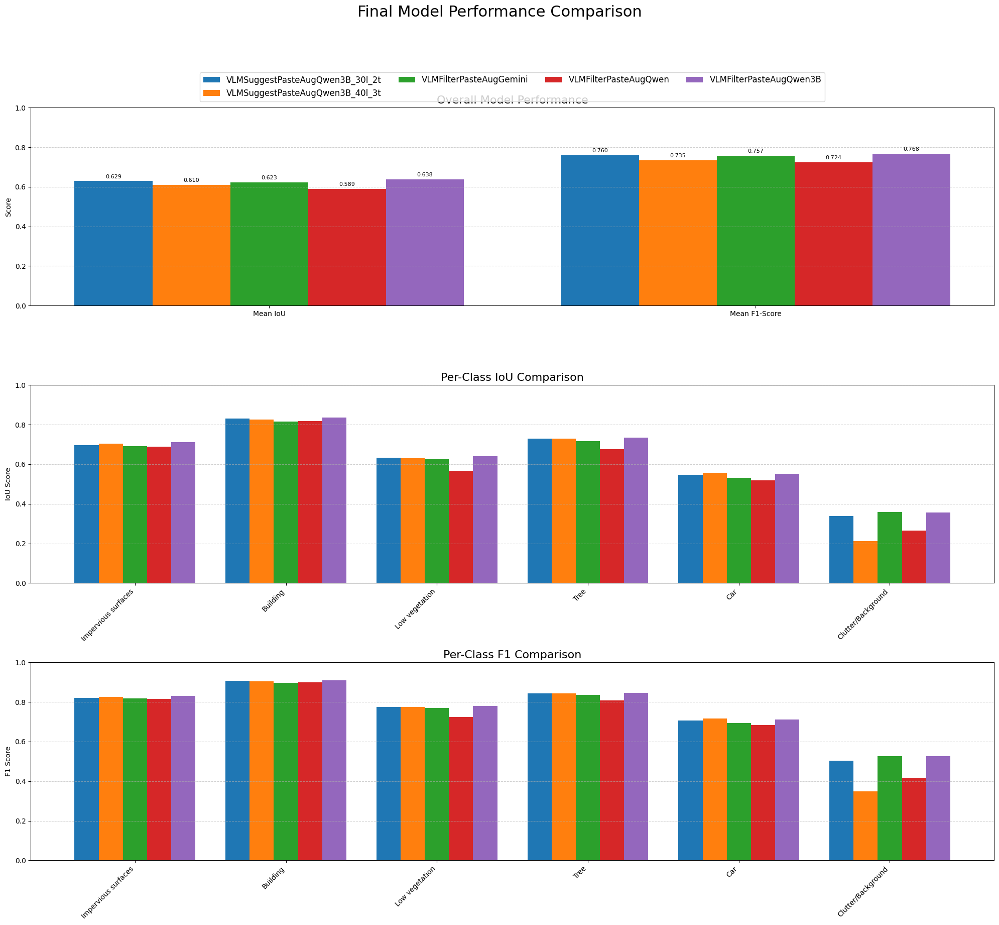

In [ ]:
plot_final_summary_report(additional_results, id_to_class_name)